1. Генерація зображень
Вирішіть завдання генерації зображень (архітектура за вашим вибором: GAN/DCGAN/VAE), якщо в обраному датасеті багато класів, залиште декілька.
Датасети: можна брати CIFAR-100, Fashion MNIST або тут: https://www.kaggle.com/tags/image-data  

In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import keras
from tensorflow.keras import layers
from tensorflow.keras import initializers
from tqdm import tqdm
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from keras.layers import Input, LSTM, Embedding, Dense
from keras.models import Model
import re
import string

In [2]:
(train_imgs, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()

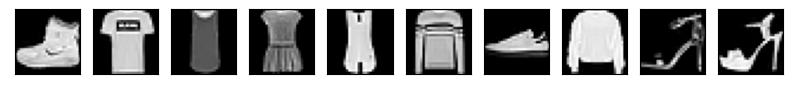

In [4]:
plt.figure(figsize=(20, 20))
for i in range(10):
    
    ax = plt.subplot(2, 20, i + 1)
    plt.imshow(train_imgs[i])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

plt.show()



In [5]:
input_dim = 784
x_train = train_imgs.reshape(train_imgs.shape[0], input_dim)
x_train = (x_train.astype(np.float32) - 127.5) / 127.5

In [6]:
optim = keras.optimizers.Adam(lr=0.0002, beta_1=0.5)

C:\Users\Studying\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [7]:
latent_dim = 256

def build_generator():
    model =  keras.Sequential()
    model.add(layers.Dense(256, input_dim=latent_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(1024))
    model.add(layers.LeakyReLU(alpha=0.2))
    
    model.add(layers.Dense(input_dim, activation='tanh'))
    model.compile(loss='binary_crossentropy', optimizer=optim)
    return model  

In [8]:
def build_discriminator():
    model =  keras.Sequential()
    model.add(layers.Dense(1024, input_dim=input_dim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
        
    model.add(layers.Dense(512))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Dense(256))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))
        
    model.add(layers.Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer=optim)
    return model

In [9]:
def plot_generated_images(epoch, generator):
    num_of_images = 10
    noise = np.random.normal(0, 1, size=[num_of_images, latent_dim])
    generated_images=generator.predict(noise).reshape(num_of_images, 28, 28)
    plt.figure(figsize=(28, 28))
    for i in range(num_of_images):
        ax = plt.subplot(2, num_of_images, i + 1)
        plt.imshow(generated_images[i])
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

In [10]:
discriminator = build_discriminator()
generator = build_generator()

discriminator.trainable = False
gan_input = keras.Input(shape=(latent_dim,))
x = generator(gan_input)
gan_output = discriminator(x)
gan = keras.Model(inputs=gan_input, outputs=gan_output)
gan.compile(loss='binary_crossentropy', optimizer=optim)

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  1


  0%|▎                                                                                 | 1/234 [00:00<01:21,  2.85it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

  1%|▋                                                                                 | 2/234 [00:00<01:21,  2.86it/s]

 1
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:24,  2.73it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:24,  2.72it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:22,  2.77it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:23,  2.73it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:02<01:22,  2.74it/s]

 1
8/8 [==============================] - 0s 11ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:29,  2.52it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step
epoch:  1


  4%|███▏                                                                              | 9/234 [00:03<01:30,  2.49it/s]

8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:28,  2.53it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:25,  2.62it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:22,  2.68it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


  6%|████▌                                                                            | 13/234 [00:04<01:22,  2.68it/s]

8/8 [==============================] - 0s 11ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:27,  2.50it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:25,  2.55it/s]

epoch:  1
8/8 [==============================] - 0s 6ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:15,  2.90it/s]

epoch:  1
8/8 [==============================] - 0s 12ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:21,  2.66it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


  8%|██████▏                                                                          | 18/234 [00:06<01:20,  2.69it/s]

8/8 [==============================] - 0s 9ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:18,  2.75it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:07<01:17,  2.76it/s]

 1
8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:16,  2.78it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:16,  2.78it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:15,  2.78it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:14,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:14,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:13,  2.82it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  

 12%|█████████▎                                                                       | 27/234 [00:09<01:13,  2.80it/s]

1
8/8 [==============================] - 0s 9ms/step
epoch: 

 12%|█████████▋                                                                       | 28/234 [00:10<01:13,  2.80it/s]

 1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 12%|██████████                                                                       | 29/234 [00:10<01:13,  2.80it/s]

8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:12,  2.83it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 13%|██████████▋                                                                      | 31/234 [00:11<01:11,  2.83it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 14%|███████████                                                                      | 32/234 [00:11<01:11,  2.81it/s]

1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 14%|███████████▍                                                                     | 33/234 [00:12<01:12,  2.76it/s]

8/8 [==============================] - 0s 8ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:11,  2.80it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  

 15%|████████████                                                                     | 35/234 [00:12<01:11,  2.79it/s]

1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 15%|████████████▍                                                                    | 36/234 [00:13<01:10,  2.80it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 16%|████████████▊                                                                    | 37/234 [00:13<01:11,  2.74it/s]

1
8/8 [==============================] - 0s 8ms/step


 16%|█████████████▏                                                                   | 38/234 [00:13<01:11,  2.75it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:11,  2.74it/s]

epoch:  1
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:14<01:21,  2.39it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  

 18%|██████████████▏                                                                  | 41/234 [00:15<01:17,  2.49it/s]

1
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:18,  2.45it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  

 18%|██████████████▉                                                                  | 43/234 [00:15<01:15,  2.54it/s]

1
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:05,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▌                                                                 | 45/234 [00:16<01:03,  2.99it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 20%|███████████████▉                                                                 | 46/234 [00:16<01:04,  2.94it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 20%|████████████████▎                                                                | 47/234 [00:17<01:04,  2.92it/s]

8/8 [==============================] - 0s 8ms/step


 21%|████████████████▌                                                                | 48/234 [00:17<01:03,  2.91it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:17<01:03,  2.92it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 21%|█████████████████▎                                                               | 50/234 [00:18<01:05,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 22%|█████████████████▋                                                               | 51/234 [00:18<01:05,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:18<01:04,  2.82it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▎                                                              | 53/234 [00:19<01:03,  2.83it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:19<01:03,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████                                                              | 55/234 [00:20<01:02,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:20<01:02,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████▋                                                             | 57/234 [00:20<01:01,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 25%|████████████████████                                                             | 58/234 [00:21<01:01,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 25%|████████████████████▍                                                            | 59/234 [00:21<01:01,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:21<01:01,  2.84it/s]

 1
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████                                                            | 61/234 [00:22<01:00,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:22<00:59,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:22<00:59,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:23<00:59,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:23<00:59,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:23<00:58,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 29%|███████████████████████▏                                                         | 67/234 [00:24<00:58,  2.87it/s]

8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:24<00:58,  2.83it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:24<00:59,  2.76it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:25<01:03,  2.59it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:25<01:03,  2.56it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:26<01:02,  2.59it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:26<00:59,  2.71it/s]

epoch:  1
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:26<00:53,  3.01it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:27<00:53,  2.98it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:27<00:55,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:27<00:59,  2.63it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 33%|███████████████████████████                                                      | 78/234 [00:28<00:59,  2.64it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:28<01:01,  2.53it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:29<01:03,  2.43it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:29<01:03,  2.41it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:30<01:04,  2.36it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:30<01:05,  2.30it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:30<01:06,  2.26it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:31<01:04,  2.31it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 37%|█████████████████████████████▊                                                   | 86/234 [00:31<01:04,  2.29it/s]

8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:32<01:02,  2.37it/s]

epoch:  1
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:32<01:01,  2.37it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  

 38%|██████████████████████████████▊                                                  | 89/234 [00:33<00:59,  2.44it/s]

1
8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:33<00:58,  2.47it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:33<00:58,  2.43it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:34<00:55,  2.55it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:34<00:53,  2.65it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:34<00:51,  2.72it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:35<00:50,  2.77it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:35<00:49,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:35<00:48,  2.82it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 42%|█████████████████████████████████▉                                               | 98/234 [00:36<00:48,  2.82it/s]

8/8 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:36<00:47,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 43%|██████████████████████████████████▏                                             | 100/234 [00:36<00:44,  2.98it/s]

 1
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:37<00:40,  3.26it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:37<00:42,  3.11it/s]

 1
8/8 [==============================] - 0s 8ms/step
epoch: 

 44%|███████████████████████████████████▏                                            | 103/234 [00:37<00:43,  3.02it/s]

 1
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:38<00:43,  2.96it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:38<00:44,  2.91it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:38<00:43,  2.92it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:39<00:43,  2.91it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 46%|████████████████████████████████████▉                                           | 108/234 [00:39<00:43,  2.88it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 47%|█████████████████████████████████████▎                                          | 109/234 [00:39<00:43,  2.88it/s]

 1
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:40<00:43,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:40<00:42,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:41<00:42,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:41<00:42,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:41<00:41,  2.89it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:42<00:41,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:42<00:41,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:42<00:41,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:43<00:40,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:43<00:40,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:43<00:39,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:44<00:39,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:44<00:39,  2.86it/s]

1
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:44<00:38,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:45<00:38,  2.85it/s]

1
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:45<00:37,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:45<00:37,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:46<00:37,  2.89it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:46<00:36,  2.87it/s]

 1
8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:46<00:36,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 6ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:47<00:33,  3.07it/s]

epoch:  1
8/8 [==============================] - 0s 5ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:47<00:31,  3.29it/s]

 1
8/8 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:47<00:32,  3.14it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:48<00:33,  3.04it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:48<00:33,  3.02it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:48<00:33,  2.98it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:49<00:33,  2.96it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:49<00:33,  2.91it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:49<00:33,  2.90it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:50<00:32,  2.91it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:50<00:32,  2.90it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:50<00:32,  2.89it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:51<00:32,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:51<00:31,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:52<00:31,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:52<00:30,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:52<00:30,  2.89it/s]

8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:53<00:30,  2.89it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:53<00:29,  2.88it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:53<00:29,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:54<00:29,  2.85it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  1


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:54<00:29,  2.84it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:54<00:28,  2.85it/s]

1
8/8 [==============================] - 0s 8ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:55<00:28,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:55<00:27,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:55<00:27,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:56<00:29,  2.64it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:56<00:28,  2.66it/s]

8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:57<00:28,  2.66it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:57<00:28,  2.64it/s]

8/8 [==============================] - 0s 6ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:57<00:25,  2.89it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:58<00:26,  2.74it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:58<00:26,  2.71it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:58<00:26,  2.65it/s]

 1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:59<00:26,  2.65it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:59<00:26,  2.60it/s]

1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:00<00:26,  2.56it/s]

8/8 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:00<00:25,  2.63it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:00<00:24,  2.65it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  1


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:01<00:25,  2.59it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:01<00:24,  2.58it/s]

 1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:01<00:23,  2.63it/s]

8/8 [==============================] - 0s 8ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:02<00:23,  2.65it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:02<00:22,  2.66it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:03<00:22,  2.68it/s]

 1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:03<00:21,  2.69it/s]

8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:03<00:22,  2.63it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:04<00:21,  2.68it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:04<00:20,  2.72it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:04<00:20,  2.75it/s]

8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:05<00:19,  2.77it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:05<00:19,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:05<00:18,  2.79it/s]

 1
8/8 [==============================] - 0s 8ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:06<00:18,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:06<00:17,  2.80it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:07<00:17,  2.80it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:07<00:16,  2.82it/s]

 1
8/8 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:07<00:16,  2.81it/s]

epoch:  1
8/8 [==============================] - 0s 6ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:07<00:14,  3.12it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:08<00:14,  3.20it/s]

8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:08<00:14,  3.09it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:08<00:14,  3.01it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:09<00:14,  2.97it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  

 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:09<00:14,  2.90it/s]

1
8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:10<00:13,  2.87it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:10<00:13,  2.85it/s]

 1
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:10<00:13,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:11<00:12,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:11<00:12,  2.83it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:11<00:12,  2.84it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:12<00:11,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:12<00:11,  2.85it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:12<00:11,  2.86it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:13<00:10,  2.86it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:13<00:10,  2.80it/s]

1
8/8 [==============================] - 0s 9ms/step
epoch:  

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:13<00:10,  2.73it/s]

1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:14<00:10,  2.73it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  1


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:14<00:09,  2.75it/s]

8/8 [==============================] - 0s 8ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:15<00:09,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:15<00:09,  2.77it/s]

8/8 [==============================] - 0s 11ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:15<00:09,  2.51it/s]

epoch:  1
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:16<00:10,  2.27it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:16<00:09,  2.30it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:17<00:08,  2.40it/s]

 1
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:17<00:07,  2.51it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:17<00:07,  2.59it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:18<00:06,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:18<00:05,  3.03it/s]

epoch:  1
8/8 [==============================] - 0s 11ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:18<00:05,  2.73it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:19<00:05,  2.75it/s]

8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:19<00:05,  2.77it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:20<00:04,  2.80it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:20<00:04,  2.78it/s]

8/8 [==============================] - 0s 8ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:20<00:03,  2.77it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step
epoch:  1


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:21<00:03,  2.77it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:21<00:03,  2.76it/s]

1
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:21<00:02,  2.78it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:22<00:02,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:22<00:02,  2.79it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:22<00:01,  2.81it/s]

 1
8/8 [==============================] - 0s 9ms/step
epoch:  1


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:23<00:01,  2.81it/s]

8/8 [==============================] - 0s 8ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:23<00:01,  2.82it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:23<00:00,  2.82it/s]

epoch:  1
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:24<00:00,  2.78it/s]

epoch:  1
8/8 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:24<00:00,  2.76it/s]

epoch:  1
1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 76ms/step


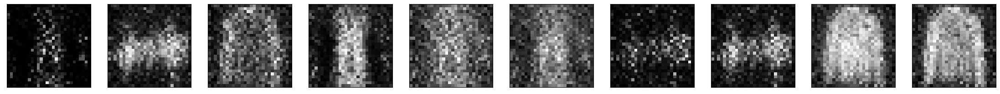

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step
epoch:  

  0%|▎                                                                                 | 1/234 [00:00<01:24,  2.74it/s]

2
8/8 [==============================] - 0s 8ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:24,  2.73it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:23,  2.75it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:21,  2.81it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<01:21,  2.80it/s]

 2
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:26,  2.64it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:26,  2.62it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:02<01:21,  2.78it/s]

 2
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:17,  2.92it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


  4%|███▍                                                                             | 10/234 [00:03<01:21,  2.75it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  2


  5%|███▊                                                                             | 11/234 [00:04<01:24,  2.65it/s]

8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:23,  2.67it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:22,  2.66it/s]

epoch:  2
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:33,  2.36it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|█████▏                                                                           | 15/234 [00:05<01:29,  2.46it/s]

2
8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:25,  2.56it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:24,  2.56it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:22,  2.62it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:22,  2.62it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:19,  2.70it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:18,  2.72it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  

  9%|███████▌                                                                         | 22/234 [00:08<01:17,  2.74it/s]

2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 10%|███████▉                                                                         | 23/234 [00:08<01:16,  2.74it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  2


 10%|████████▎                                                                        | 24/234 [00:08<01:17,  2.72it/s]

8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:16,  2.72it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 11%|█████████                                                                        | 26/234 [00:09<01:16,  2.71it/s]

8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:16,  2.69it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:16,  2.69it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:15,  2.70it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:15,  2.69it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:11<01:15,  2.69it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:11<01:14,  2.71it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 14%|███████████▍                                                                     | 33/234 [00:12<01:13,  2.75it/s]

8/8 [==============================] - 0s 8ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:12,  2.75it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:12,  2.74it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 15%|████████████▍                                                                    | 36/234 [00:13<01:09,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|████████████▊                                                                    | 37/234 [00:13<01:01,  3.22it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 16%|█████████████▏                                                                   | 38/234 [00:13<01:02,  3.11it/s]

8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:06,  2.94it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 17%|█████████████▊                                                                   | 40/234 [00:14<01:07,  2.86it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  2


 18%|██████████████▏                                                                  | 41/234 [00:15<01:08,  2.82it/s]

8/8 [==============================] - 0s 8ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:08,  2.80it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  

 18%|██████████████▉                                                                  | 43/234 [00:15<01:08,  2.78it/s]

2
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:08,  2.79it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 19%|███████████████▌                                                                 | 45/234 [00:16<01:08,  2.75it/s]

8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:16<01:09,  2.71it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 20%|████████████████▎                                                                | 47/234 [00:17<01:09,  2.70it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  2


 21%|████████████████▌                                                                | 48/234 [00:17<01:09,  2.69it/s]

8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:17<01:07,  2.74it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 21%|█████████████████▎                                                               | 50/234 [00:18<01:07,  2.74it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  2


 22%|█████████████████▋                                                               | 51/234 [00:18<01:06,  2.73it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  2


 22%|██████████████████                                                               | 52/234 [00:19<01:06,  2.73it/s]

8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▎                                                              | 53/234 [00:19<01:15,  2.41it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▋                                                              | 54/234 [00:19<01:13,  2.44it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:20<01:10,  2.53it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  

 24%|███████████████████▍                                                             | 56/234 [00:20<01:08,  2.59it/s]

2
8/8 [==============================] - 0s 8ms/step
epoch:  

 24%|███████████████████▋                                                             | 57/234 [00:21<01:07,  2.64it/s]

2
8/8 [==============================] - 0s 9ms/step
epoch:  

 25%|████████████████████                                                             | 58/234 [00:21<01:06,  2.66it/s]

2
8/8 [==============================] - 0s 8ms/step


 25%|████████████████████▍                                                            | 59/234 [00:21<01:05,  2.66it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 26%|████████████████████▊                                                            | 60/234 [00:22<01:03,  2.74it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████                                                            | 61/234 [00:22<01:02,  2.77it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:22<01:01,  2.80it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:23<01:00,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch: 

 27%|██████████████████████▏                                                          | 64/234 [00:23<00:59,  2.87it/s]

 2
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:23<00:58,  2.90it/s]

epoch:  2
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:24<00:52,  3.21it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:24<00:54,  3.05it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:24<00:55,  2.98it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:25<00:56,  2.95it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 30%|████████████████████████▏                                                        | 70/234 [00:25<00:56,  2.92it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 30%|████████████████████████▌                                                        | 71/234 [00:25<00:56,  2.90it/s]

 2
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:26<00:56,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:26<00:55,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:26<00:55,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:27<00:55,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:27<00:55,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:28<00:55,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 33%|███████████████████████████                                                      | 78/234 [00:28<00:54,  2.85it/s]

8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:28<00:54,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:29<00:53,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 35%|████████████████████████████                                                     | 81/234 [00:29<00:53,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:29<00:52,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:30<00:52,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:30<00:52,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:30<00:52,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:31<00:51,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:31<00:51,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:31<00:50,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:32<00:50,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  

 38%|███████████████████████████████▏                                                 | 90/234 [00:32<00:50,  2.87it/s]

2
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:32<00:49,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  

 39%|███████████████████████████████▊                                                 | 92/234 [00:33<00:49,  2.87it/s]

2
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:33<00:49,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 40%|████████████████████████████████▌                                                | 94/234 [00:33<00:48,  2.86it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 41%|████████████████████████████████▉                                                | 95/234 [00:34<00:47,  2.91it/s]

 2
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:34<00:42,  3.26it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:34<00:43,  3.12it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:35<00:44,  3.04it/s]

epoch:  2
8/8 [==============================] - 0s 7ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:35<00:44,  3.03it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:35<00:45,  2.97it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:36<00:44,  2.96it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:36<00:45,  2.92it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:36<00:45,  2.90it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:37<00:44,  2.90it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:37<00:44,  2.91it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:37<00:43,  2.92it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  

 46%|████████████████████████████████████▌                                           | 107/234 [00:38<00:44,  2.83it/s]

2
8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:38<00:44,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:39<00:44,  2.81it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:39<00:43,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 47%|█████████████████████████████████████▉                                          | 111/234 [00:39<00:43,  2.82it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch: 

 48%|██████████████████████████████████████▎                                         | 112/234 [00:40<00:43,  2.82it/s]

 2
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:40<00:42,  2.81it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:40<00:42,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:41<00:41,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 50%|███████████████████████████████████████▋                                        | 116/234 [00:41<00:41,  2.86it/s]

8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:41<00:40,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:42<00:40,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 51%|████████████████████████████████████████▋                                       | 119/234 [00:42<00:40,  2.87it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  2


 51%|█████████████████████████████████████████                                       | 120/234 [00:42<00:40,  2.84it/s]

8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:43<00:39,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:43<00:39,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:43<00:39,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:44<00:38,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch: 

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:44<00:38,  2.85it/s]

 2
8/8 [==============================] - 0s 6ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:44<00:36,  2.98it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:45<00:36,  2.94it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:45<00:36,  2.94it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:45<00:35,  2.93it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:46<00:35,  2.89it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:46<00:36,  2.86it/s]

 2
8/8 [==============================] - 0s 8ms/step
epoch:  

 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:47<00:35,  2.85it/s]

2
8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:47<00:35,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:47<00:35,  2.85it/s]

8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:48<00:34,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:48<00:34,  2.88it/s]

8/8 [==============================] - 0s 8ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:48<00:33,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:49<00:33,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:49<00:33,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:49<00:32,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:50<00:32,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch: 

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:50<00:32,  2.83it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:50<00:32,  2.82it/s]

8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:51<00:31,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  

 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:51<00:31,  2.84it/s]

2
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:51<00:30,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:52<00:30,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:52<00:30,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:53<00:29,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch: 

 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:53<00:29,  2.86it/s]

 2
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:53<00:29,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:54<00:28,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:54<00:28,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:54<00:28,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:55<00:26,  2.98it/s]

epoch:  2
8/8 [==============================] - 0s 5ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:55<00:23,  3.25it/s]

 2
8/8 [==============================] - 0s 8ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:55<00:24,  3.11it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:56<00:25,  3.01it/s]

 2
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:56<00:25,  2.97it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:56<00:25,  2.94it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:57<00:25,  2.92it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:57<00:24,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:57<00:24,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:58<00:24,  2.86it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:58<00:24,  2.86it/s]

 2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:58<00:24,  2.81it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:59<00:23,  2.82it/s]

 2
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:59<00:23,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:59<00:22,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:00<00:22,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:00<00:22,  2.86it/s]

8/8 [==============================] - 0s 8ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:00<00:22,  2.79it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:01<00:21,  2.81it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:01<00:21,  2.78it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:02<00:22,  2.66it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:02<00:21,  2.73it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:02<00:20,  2.75it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:03<00:20,  2.79it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:03<00:19,  2.81it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch:  2


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:03<00:19,  2.82it/s]

8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:04<00:19,  2.79it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:04<00:18,  2.80it/s]

 2
8/8 [==============================] - 0s 8ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:04<00:18,  2.80it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:05<00:17,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 6ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:05<00:15,  3.11it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:05<00:15,  3.07it/s]

epoch:  2
8/8 [==============================] - 0s 7ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:06<00:15,  2.99it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:06<00:15,  2.96it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:06<00:15,  2.92it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:07<00:15,  2.89it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:07<00:14,  2.91it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:07<00:14,  2.89it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:08<00:14,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:08<00:14,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:09<00:14,  2.75it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:09<00:13,  2.76it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:09<00:13,  2.76it/s]

8/8 [==============================] - 0s 8ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:10<00:12,  2.80it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:10<00:12,  2.83it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:10<00:11,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:11<00:11,  2.83it/s]

 2
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:11<00:11,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:11<00:10,  2.83it/s]

 2
8/8 [==============================] - 0s 8ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:12<00:10,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:12<00:10,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:12<00:09,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:13<00:09,  2.90it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:13<00:09,  2.87it/s]

 2
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:14<00:08,  2.79it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:14<00:08,  2.82it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:14<00:08,  2.83it/s]

 2
8/8 [==============================] - 0s 9ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:15<00:07,  2.81it/s]

 2
8/8 [==============================] - 0s 8ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:15<00:07,  2.81it/s]

 2
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:15<00:06,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 5ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:15<00:05,  3.27it/s]

 2
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:16<00:06,  2.94it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:16<00:05,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:17<00:05,  2.87it/s]

 2
8/8 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:17<00:05,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:17<00:04,  2.83it/s]

 2
8/8 [==============================] - 0s 8ms/step
epoch:  2


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:18<00:04,  2.81it/s]

8/8 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:18<00:04,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:18<00:03,  2.84it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:19<00:03,  2.85it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:19<00:03,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  

 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:19<00:02,  2.87it/s]

2
8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:20<00:02,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:20<00:02,  2.89it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:20<00:01,  2.89it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:21<00:01,  2.87it/s]

epoch:  2
8/8 [==============================] - 0s 9ms/step
epoch:  

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:21<00:01,  2.87it/s]

2
8/8 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:21<00:00,  2.88it/s]

epoch:  2
8/8 [==============================] - 0s 8ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:22<00:00,  2.90it/s]

epoch:  2
8/8 [==============================] - 0s 7ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:22<00:00,  2.83it/s]


epoch:  2


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 8ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:20,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:19,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:19,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:21,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:20,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:19,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


  3%|██▍                                                                               | 7/234 [00:02<01:19,  2.85it/s]

8/8 [==============================] - 0s 8ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:19,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:18,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:16,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 6ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:09,  3.20it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:12,  3.05it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:13,  3.01it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:14,  2.95it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:14,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:14,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:14,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:14,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:14,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:06<01:14,  2.86it/s]

 3
8/8 [==============================] - 0s 9ms/step
epoch: 

  9%|███████▎                                                                         | 21/234 [00:07<01:14,  2.85it/s]

 3
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:14,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:13,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:08<01:13,  2.85it/s]

 3
8/8 [==============================] - 0s 8ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:13,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  

 11%|█████████                                                                        | 26/234 [00:08<01:12,  2.86it/s]

3
8/8 [==============================] - 0s 8ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:11,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 12%|█████████▋                                                                       | 28/234 [00:09<01:11,  2.88it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:10<01:11,  2.88it/s]

 3
8/8 [==============================] - 0s 8ms/step


 13%|██████████▍                                                                      | 30/234 [00:10<01:10,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:10<01:10,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 14%|███████████                                                                      | 32/234 [00:11<01:10,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:10,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 15%|███████████▊                                                                     | 34/234 [00:11<01:09,  2.87it/s]

 3
8/8 [==============================] - 0s 8ms/step


 15%|████████████                                                                     | 35/234 [00:12<01:09,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  

 15%|████████████▍                                                                    | 36/234 [00:12<01:09,  2.85it/s]

3
8/8 [==============================] - 0s 8ms/step


 16%|████████████▊                                                                    | 37/234 [00:12<01:09,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 16%|█████████████▏                                                                   | 38/234 [00:13<01:08,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 17%|█████████████▌                                                                   | 39/234 [00:13<01:07,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:13<01:06,  2.93it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:14<00:59,  3.25it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▌                                                                  | 42/234 [00:14<01:01,  3.13it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▉                                                                  | 43/234 [00:14<01:02,  3.06it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:15<01:03,  3.00it/s]

 3
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:04,  2.95it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 20%|███████████████▉                                                                 | 46/234 [00:15<01:04,  2.93it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 20%|████████████████▎                                                                | 47/234 [00:16<01:04,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 21%|████████████████▌                                                                | 48/234 [00:16<01:04,  2.88it/s]

8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:16<01:04,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:17<01:04,  2.85it/s]

 3
8/8 [==============================] - 0s 8ms/step


 22%|█████████████████▋                                                               | 51/234 [00:17<01:04,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 22%|██████████████████                                                               | 52/234 [00:17<01:03,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  

 23%|██████████████████▎                                                              | 53/234 [00:18<01:03,  2.87it/s]

3
8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▋                                                              | 54/234 [00:18<01:02,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████                                                              | 55/234 [00:18<01:02,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 10ms/step
epoch:  3


 24%|███████████████████▍                                                             | 56/234 [00:19<01:03,  2.81it/s]

8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:19<01:12,  2.45it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:20<01:14,  2.37it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  

 25%|████████████████████▍                                                            | 59/234 [00:20<01:12,  2.41it/s]

3
8/8 [==============================] - 0s 9ms/step
epoch:  

 26%|████████████████████▊                                                            | 60/234 [00:21<01:09,  2.51it/s]

3
8/8 [==============================] - 0s 9ms/step
epoch: 

 26%|█████████████████████                                                            | 61/234 [00:21<01:06,  2.60it/s]

 3
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:21<01:04,  2.68it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 27%|█████████████████████▊                                                           | 63/234 [00:22<01:03,  2.71it/s]

 3
8/8 [==============================] - 0s 7ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:22<01:00,  2.79it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:22<01:00,  2.81it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:23<00:59,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:23<00:58,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 29%|███████████████████████▌                                                         | 68/234 [00:23<00:58,  2.85it/s]

 3
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:24<00:57,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 6ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:24<00:50,  3.22it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  3


 30%|████████████████████████▌                                                        | 71/234 [00:24<00:53,  3.07it/s]

8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:25<00:54,  2.98it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:25<00:54,  2.94it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:25<00:54,  2.94it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:26<00:54,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:26<00:54,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:26<00:54,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  

 33%|███████████████████████████                                                      | 78/234 [00:27<00:54,  2.85it/s]

3
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:27<00:53,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:27<00:53,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  

 35%|████████████████████████████                                                     | 81/234 [00:28<00:53,  2.88it/s]

3
8/8 [==============================] - 0s 8ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:28<00:52,  2.88it/s]

 3
8/8 [==============================] - 0s 8ms/step
epoch:  

 35%|████████████████████████████▋                                                    | 83/234 [00:28<00:52,  2.86it/s]

3
8/8 [==============================] - 0s 8ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:29<00:52,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:29<00:51,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 13ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:30<00:54,  2.71it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:30<00:53,  2.74it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:30<00:52,  2.79it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 38%|██████████████████████████████▊                                                  | 89/234 [00:31<00:51,  2.80it/s]

 3
8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:31<00:51,  2.82it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:31<00:50,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:32<00:49,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:32<00:49,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:32<00:48,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 41%|████████████████████████████████▉                                                | 95/234 [00:33<00:48,  2.85it/s]

 3
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:33<00:49,  2.79it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:33<00:48,  2.81it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 42%|█████████████████████████████████▉                                               | 98/234 [00:34<00:48,  2.83it/s]

 3
8/8 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:34<00:45,  2.96it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:34<00:42,  3.19it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:35<00:43,  3.07it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:35<00:43,  3.01it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:35<00:44,  2.98it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:36<00:44,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 45%|███████████████████████████████████▉                                            | 105/234 [00:36<00:44,  2.91it/s]

8/8 [==============================] - 0s 8ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:36<00:44,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 46%|████████████████████████████████████▌                                           | 107/234 [00:37<00:44,  2.87it/s]

 3
8/8 [==============================] - 0s 9ms/step
epoch:  

 46%|████████████████████████████████████▉                                           | 108/234 [00:37<00:44,  2.85it/s]

3
8/8 [==============================] - 0s 8ms/step
epoch: 

 47%|█████████████████████████████████████▎                                          | 109/234 [00:38<00:43,  2.85it/s]

 3
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:38<00:43,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  

 47%|█████████████████████████████████████▉                                          | 111/234 [00:38<00:43,  2.85it/s]

3
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:39<00:43,  2.82it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:39<00:42,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:39<00:42,  2.85it/s]

 3
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:40<00:42,  2.81it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:40<00:42,  2.80it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:40<00:41,  2.81it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 50%|████████████████████████████████████████▎                                       | 118/234 [00:41<00:41,  2.81it/s]

 3
8/8 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:41<00:40,  2.81it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:41<00:40,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 52%|█████████████████████████████████████████▎                                      | 121/234 [00:42<00:39,  2.85it/s]

 3
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:42<00:39,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:42<00:39,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:43<00:39,  2.82it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:43<00:38,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 54%|███████████████████████████████████████████                                     | 126/234 [00:44<00:38,  2.84it/s]

 3
8/8 [==============================] - 0s 8ms/step
epoch:  

 54%|███████████████████████████████████████████▍                                    | 127/234 [00:44<00:37,  2.82it/s]

3
8/8 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:44<00:37,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:44<00:33,  3.12it/s]

epoch:  3
8/8 [==============================] - 0s 6ms/step
epoch: 

 56%|████████████████████████████████████████████▍                                   | 130/234 [00:45<00:31,  3.25it/s]

 3
8/8 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:45<00:33,  3.06it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:45<00:34,  3.00it/s]

8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:46<00:34,  2.94it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:46<00:34,  2.93it/s]

8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:47<00:34,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  3


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:47<00:34,  2.88it/s]

8/8 [==============================] - 0s 8ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:47<00:33,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:48<00:33,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:48<00:32,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:48<00:32,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 60%|████████████████████████████████████████████████▏                               | 141/234 [00:49<00:32,  2.88it/s]

 3
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:49<00:32,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:49<00:32,  2.84it/s]

8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:50<00:31,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:50<00:31,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:50<00:30,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  

 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:51<00:30,  2.83it/s]

3
8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:51<00:30,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:51<00:29,  2.83it/s]

8/8 [==============================] - 0s 8ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:52<00:29,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:52<00:29,  2.84it/s]

8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:53<00:28,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:53<00:28,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:53<00:28,  2.85it/s]

 3
8/8 [==============================] - 0s 9ms/step
epoch: 

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:54<00:27,  2.84it/s]

 3
8/8 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:54<00:27,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:54<00:27,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:55<00:26,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:55<00:23,  3.16it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:55<00:23,  3.19it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:56<00:23,  3.11it/s]

8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:56<00:23,  3.05it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:56<00:23,  3.01it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  3


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:57<00:23,  2.96it/s]

8/8 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:57<00:23,  2.96it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:57<00:23,  2.94it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  3


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:58<00:22,  2.92it/s]

8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:58<00:22,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:58<00:22,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:59<00:22,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:59<00:21,  2.90it/s]

 3
8/8 [==============================] - 0s 8ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:59<00:21,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:00<00:21,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:00<00:20,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:00<00:20,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:01<00:20,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:01<00:19,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:01<00:19,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:02<00:19,  2.84it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:02<00:18,  2.86it/s]

 3
8/8 [==============================] - 0s 8ms/step
epoch:  

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:02<00:18,  2.84it/s]

3
8/8 [==============================] - 0s 8ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:03<00:18,  2.86it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:03<00:17,  2.84it/s]

 3
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:04<00:17,  2.83it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:04<00:17,  2.85it/s]

 3
8/8 [==============================] - 0s 7ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:04<00:16,  2.86it/s]

 3
8/8 [==============================] - 0s 9ms/step
epoch: 

 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:05<00:16,  2.82it/s]

 3
8/8 [==============================] - 0s 8ms/step
epoch:  

 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:05<00:16,  2.83it/s]

3
8/8 [==============================] - 0s 6ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:05<00:14,  3.10it/s]

epoch:  3
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:06<00:14,  3.09it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:06<00:14,  3.00it/s]

epoch:  3
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:06<00:13,  3.01it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:07<00:13,  2.97it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:07<00:13,  2.93it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:07<00:13,  2.92it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:08<00:13,  2.90it/s]

 3
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:08<00:12,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:08<00:12,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:09<00:12,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:09<00:11,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  3


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:09<00:11,  2.87it/s]

8/8 [==============================] - 0s 7ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:10<00:11,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:10<00:10,  2.89it/s]

3
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:10<00:10,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:11<00:10,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:11<00:09,  2.90it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:11<00:09,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:12<00:09,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:12<00:08,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch:  3


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:12<00:08,  2.89it/s]

8/8 [==============================] - 0s 8ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:13<00:07,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:13<00:07,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:13<00:07,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:14<00:06,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:14<00:06,  2.88it/s]

 3
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:15<00:06,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:15<00:05,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:15<00:05,  2.85it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:15<00:04,  3.12it/s]

epoch:  3
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:16<00:04,  3.23it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:16<00:04,  3.13it/s]

 3
8/8 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:16<00:03,  3.05it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:17<00:03,  2.99it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:17<00:03,  2.94it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:18<00:03,  2.93it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:18<00:02,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:18<00:02,  2.91it/s]

epoch:  3
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:19<00:02,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:19<00:01,  2.88it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:19<00:01,  2.87it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:20<00:01,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:20<00:00,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:20<00:00,  2.89it/s]

epoch:  3
8/8 [==============================] - 0s 8ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:21<00:00,  2.88it/s]


epoch:  3


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:24,  2.77it/s]

epoch:  4
8/8 [==============================] - 0s 11ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:35,  2.43it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  1%|█                                                                                 | 3/234 [00:01<01:29,  2.59it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch: 

  2%|█▍                                                                                | 4/234 [00:01<01:25,  2.69it/s]

 4
8/8 [==============================] - 0s 8ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:23,  2.75it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  3%|██                                                                                | 6/234 [00:02<01:21,  2.80it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:21,  2.78it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:21,  2.78it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:19,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 7ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:18,  2.87it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:18,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  4


  5%|████▏                                                                            | 12/234 [00:04<01:19,  2.81it/s]

8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:20,  2.76it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:18,  2.81it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:10,  3.11it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:10,  3.07it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  

  7%|█████▉                                                                           | 17/234 [00:05<01:13,  2.96it/s]

4
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:13,  2.94it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


  8%|██████▌                                                                          | 19/234 [00:06<01:14,  2.90it/s]

8/8 [==============================] - 0s 8ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:17,  2.77it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:16,  2.78it/s]

epoch:  4
8/8 [==============================] - 0s 7ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:14,  2.85it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:13,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:13,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch: 

 11%|████████▋                                                                        | 25/234 [00:08<01:12,  2.87it/s]

 4
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:13,  2.84it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:12,  2.87it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch: 

 12%|█████████▋                                                                       | 28/234 [00:09<01:11,  2.86it/s]

 4
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:12,  2.85it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 13%|██████████▍                                                                      | 30/234 [00:10<01:11,  2.85it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch: 

 13%|██████████▋                                                                      | 31/234 [00:10<01:11,  2.84it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 14%|███████████                                                                      | 32/234 [00:11<01:11,  2.82it/s]

8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:11,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:10,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 7ms/step


 15%|████████████                                                                     | 35/234 [00:12<01:09,  2.85it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  4


 15%|████████████▍                                                                    | 36/234 [00:12<01:09,  2.85it/s]

8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:13<01:09,  2.85it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:13<01:08,  2.87it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:13<01:07,  2.87it/s]

 4
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:14<01:07,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:14<01:07,  2.86it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  

 18%|██████████████▌                                                                  | 42/234 [00:14<01:08,  2.82it/s]

4
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:15<01:07,  2.81it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▏                                                                 | 44/234 [00:15<01:03,  2.98it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:01,  3.05it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 20%|███████████████▉                                                                 | 46/234 [00:16<01:03,  2.95it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 20%|████████████████▎                                                                | 47/234 [00:16<01:04,  2.90it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch: 

 21%|████████████████▌                                                                | 48/234 [00:16<01:05,  2.86it/s]

 4
8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:17<01:04,  2.88it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 21%|█████████████████▎                                                               | 50/234 [00:17<01:03,  2.88it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 22%|█████████████████▋                                                               | 51/234 [00:17<01:04,  2.86it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch:  

 22%|██████████████████                                                               | 52/234 [00:18<01:03,  2.85it/s]

4
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:18<01:04,  2.82it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 23%|██████████████████▋                                                              | 54/234 [00:18<01:03,  2.83it/s]

 4
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████                                                              | 55/234 [00:19<01:02,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:19<01:02,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████▋                                                             | 57/234 [00:20<01:01,  2.86it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:20<01:02,  2.81it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:20<01:01,  2.83it/s]

 4
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:21<01:02,  2.80it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████                                                            | 61/234 [00:21<01:01,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:21<01:01,  2.79it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  4


 27%|█████████████████████▊                                                           | 63/234 [00:22<01:00,  2.81it/s]

8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:22<01:01,  2.78it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:23<01:07,  2.51it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:23<01:11,  2.34it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:23<01:09,  2.40it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:24<01:07,  2.45it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:24<01:09,  2.39it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:25<01:12,  2.26it/s]

epoch:  4
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:25<01:17,  2.11it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:26<01:11,  2.26it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:26<01:03,  2.54it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 32%|█████████████████████████▌                                                       | 74/234 [00:26<01:01,  2.60it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch:  

 32%|█████████████████████████▉                                                       | 75/234 [00:27<01:00,  2.61it/s]

4
8/8 [==============================] - 0s 8ms/step
epoch:  

 32%|██████████████████████████▎                                                      | 76/234 [00:27<00:59,  2.64it/s]

4
8/8 [==============================] - 0s 7ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:27<00:58,  2.68it/s]

 4
8/8 [==============================] - 0s 7ms/step
epoch: 

 33%|███████████████████████████                                                      | 78/234 [00:28<00:56,  2.75it/s]

 4
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:28<01:02,  2.49it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:29<01:03,  2.41it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 35%|████████████████████████████                                                     | 81/234 [00:29<01:01,  2.48it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:29<00:59,  2.56it/s]

 4
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:30<00:57,  2.62it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 36%|█████████████████████████████                                                    | 84/234 [00:30<00:56,  2.66it/s]

 4
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:31<00:55,  2.67it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 37%|█████████████████████████████▊                                                   | 86/234 [00:31<00:54,  2.72it/s]

 4
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:31<00:53,  2.74it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:32<00:52,  2.76it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 38%|██████████████████████████████▊                                                  | 89/234 [00:32<00:52,  2.75it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 38%|███████████████████████████████▏                                                 | 90/234 [00:32<00:52,  2.75it/s]

 4
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:33<00:52,  2.74it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:33<00:51,  2.76it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 40%|████████████████████████████████▏                                                | 93/234 [00:33<00:50,  2.79it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 40%|████████████████████████████████▌                                                | 94/234 [00:34<00:50,  2.76it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  4


 41%|████████████████████████████████▉                                                | 95/234 [00:34<00:50,  2.75it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 41%|█████████████████████████████████▏                                               | 96/234 [00:34<00:50,  2.74it/s]

 4
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:35<00:50,  2.73it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 42%|█████████████████████████████████▉                                               | 98/234 [00:35<00:49,  2.73it/s]

8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:36<00:49,  2.72it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:36<00:45,  2.94it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:36<00:43,  3.07it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  

 44%|██████████████████████████████████▊                                             | 102/234 [00:37<00:44,  2.94it/s]

4
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:37<00:44,  2.92it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 44%|███████████████████████████████████▌                                            | 104/234 [00:37<00:45,  2.88it/s]

8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:38<00:45,  2.84it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:38<00:51,  2.49it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:39<00:51,  2.45it/s]

epoch:  4
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:39<00:55,  2.28it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:39<00:51,  2.42it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 47%|█████████████████████████████████████▌                                          | 110/234 [00:40<00:49,  2.48it/s]

8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:40<00:51,  2.39it/s]

epoch:  4
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:41<00:55,  2.22it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:41<00:51,  2.35it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 49%|██████████████████████████████████████▉                                         | 114/234 [00:42<00:49,  2.44it/s]

4
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:42<00:47,  2.50it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step
epoch:  4


 50%|███████████████████████████████████████▋                                        | 116/234 [00:42<00:46,  2.56it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  4


 50%|████████████████████████████████████████                                        | 117/234 [00:43<00:44,  2.62it/s]

8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:43<00:43,  2.68it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 51%|████████████████████████████████████████▋                                       | 119/234 [00:43<00:42,  2.70it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 51%|█████████████████████████████████████████                                       | 120/234 [00:44<00:42,  2.69it/s]

8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:44<00:41,  2.70it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:45<00:43,  2.55it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:45<00:46,  2.38it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:45<00:45,  2.41it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:46<00:43,  2.50it/s]

8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:46<00:41,  2.60it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:46<00:36,  2.96it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:47<00:37,  2.81it/s]

epoch:  4
8/8 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:47<00:42,  2.47it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  4


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:48<00:41,  2.48it/s]

8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:48<00:40,  2.52it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:48<00:39,  2.55it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch:  

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:49<00:39,  2.54it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:49<00:38,  2.57it/s]

 4
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:50<00:37,  2.62it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:50<00:37,  2.64it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:50<00:36,  2.67it/s]

4
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:51<00:37,  2.57it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:51<00:36,  2.62it/s]

8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:51<00:35,  2.62it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:52<00:34,  2.67it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:52<00:34,  2.68it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:53<00:34,  2.64it/s]

 4
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:53<00:34,  2.63it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:53<00:33,  2.68it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:54<00:32,  2.68it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:54<00:32,  2.71it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:54<00:31,  2.70it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:55<00:31,  2.74it/s]

 4
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:55<00:30,  2.73it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:56<00:30,  2.70it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:56<00:30,  2.65it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:56<00:30,  2.66it/s]

8/8 [==============================] - 0s 6ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:57<00:27,  2.89it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:57<00:27,  2.83it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step
epoch:  4


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:57<00:27,  2.80it/s]

8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:58<00:27,  2.77it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:58<00:27,  2.76it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:58<00:27,  2.71it/s]

 4
8/8 [==============================] - 0s 10ms/step
epoch:  

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:59<00:27,  2.69it/s]

4
8/8 [==============================] - 0s 9ms/step
epoch: 

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:59<00:27,  2.66it/s]

 4
8/8 [==============================] - 0s 8ms/step
epoch:  

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:00<00:27,  2.66it/s]

4
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:00<00:27,  2.56it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:00<00:26,  2.60it/s]

8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:01<00:30,  2.28it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:01<00:29,  2.33it/s]

 4
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:02<00:27,  2.42it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:02<00:26,  2.48it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:02<00:25,  2.52it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:03<00:24,  2.60it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:03<00:24,  2.62it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:04<00:23,  2.65it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:04<00:23,  2.64it/s]

8/8 [==============================] - 0s 6ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:04<00:21,  2.77it/s]

 4
8/8 [==============================] - 0s 8ms/step
epoch:  4


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:05<00:21,  2.77it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  4


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:05<00:20,  2.82it/s]

8/8 [==============================] - 0s 10ms/step
epoch:  4


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:05<00:21,  2.65it/s]

8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:06<00:24,  2.33it/s]

epoch:  4
8/8 [==============================] - 0s 11ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:06<00:24,  2.23it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:07<00:23,  2.28it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:07<00:23,  2.28it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:08<00:21,  2.42it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:08<00:20,  2.50it/s]

8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:08<00:20,  2.47it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:09<00:19,  2.56it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:09<00:18,  2.60it/s]

4
8/8 [==============================] - 0s 6ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:09<00:16,  2.80it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:10<00:14,  3.18it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:10<00:13,  3.37it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:11<00:16,  2.66it/s]

 4
8/8 [==============================] - 0s 10ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:11<00:16,  2.64it/s]

 4
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:11<00:15,  2.69it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:12<00:15,  2.71it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:12<00:14,  2.73it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:12<00:14,  2.74it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  4


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:13<00:13,  2.76it/s]

8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:13<00:13,  2.78it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:13<00:13,  2.76it/s]

8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:14<00:12,  2.79it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:14<00:11,  2.88it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:15<00:12,  2.61it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:15<00:12,  2.58it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:15<00:12,  2.48it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:16<00:12,  2.45it/s]

8/8 [==============================] - 0s 6ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:16<00:11,  2.57it/s]

 4
8/8 [==============================] - 0s 10ms/step
epoch:  4


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:17<00:10,  2.63it/s]

8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:17<00:09,  2.75it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:17<00:09,  2.78it/s]

 4
8/8 [==============================] - 0s 6ms/step
epoch:  4


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:18<00:08,  2.81it/s]

8/8 [==============================] - 0s 11ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:18<00:09,  2.59it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step
epoch:  4


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:18<00:08,  2.72it/s]

8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:19<00:08,  2.49it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:19<00:08,  2.53it/s]

 4
8/8 [==============================] - 0s 11ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:20<00:08,  2.46it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:20<00:07,  2.60it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:20<00:06,  2.65it/s]

8/8 [==============================] - 0s 11ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:21<00:07,  2.42it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  4


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:21<00:06,  2.45it/s]

8/8 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:22<00:06,  2.43it/s]

epoch:  4
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:22<00:06,  2.32it/s]

epoch:  4
8/8 [==============================] - 0s 6ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:22<00:05,  2.43it/s]

 4
8/8 [==============================] - 0s 6ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:23<00:04,  2.57it/s]

epoch:  4
8/8 [==============================] - 0s 7ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:23<00:04,  2.71it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:23<00:03,  3.04it/s]

epoch:  4
8/8 [==============================] - 0s 5ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:24<00:02,  3.44it/s]

 4
8/8 [==============================] - 0s 6ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:24<00:02,  3.37it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:24<00:02,  3.22it/s]

epoch:  4
8/8 [==============================] - 0s 7ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:24<00:01,  3.27it/s]

 4
8/8 [==============================] - 0s 9ms/step
epoch:  

 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:25<00:01,  3.17it/s]

4
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:25<00:01,  2.93it/s]

epoch:  4
8/8 [==============================] - 0s 12ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:26<00:01,  2.67it/s]

epoch:  4
8/8 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:26<00:00,  2.62it/s]

epoch:  4
8/8 [==============================] - 0s 9ms/step
epoch:  

100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:26<00:00,  2.64it/s]

4
8/8 [==============================] - 0s 8ms/step
epoch:  4


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 8ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:20,  2.90it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:23,  2.79it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  

  1%|█                                                                                 | 3/234 [00:01<01:26,  2.68it/s]

5
8/8 [==============================] - 0s 11ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:32,  2.48it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


  2%|█▊                                                                                | 5/234 [00:01<01:30,  2.52it/s]

8/8 [==============================] - 0s 8ms/step


  3%|██                                                                                | 6/234 [00:02<01:25,  2.67it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:02<01:13,  3.10it/s]

 5
8/8 [==============================] - 0s 8ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:14,  3.04it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:15,  3.00it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:18,  2.86it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:21,  2.75it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:21,  2.71it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:20,  2.73it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:22,  2.66it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


  6%|█████▏                                                                           | 15/234 [00:05<01:20,  2.71it/s]

8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:21,  2.67it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step
epoch: 

  7%|█████▉                                                                           | 17/234 [00:06<01:16,  2.85it/s]

 5
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:30,  2.39it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:36,  2.24it/s]

epoch:  5
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:41,  2.11it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:08<01:35,  2.22it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:35,  2.23it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


 10%|███████▉                                                                         | 23/234 [00:08<01:30,  2.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:09<01:26,  2.42it/s]

 5
8/8 [==============================] - 0s 7ms/step
epoch: 

 11%|████████▋                                                                        | 25/234 [00:09<01:21,  2.58it/s]

 5
8/8 [==============================] - 0s 7ms/step


 11%|█████████                                                                        | 26/234 [00:10<01:20,  2.57it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:30,  2.30it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:11<01:38,  2.10it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step
epoch:  

 12%|██████████                                                                       | 29/234 [00:11<01:36,  2.12it/s]

5
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:12<01:30,  2.26it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:12<01:27,  2.31it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:19,  2.54it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:13<01:22,  2.42it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 15%|███████████▊                                                                     | 34/234 [00:13<01:15,  2.63it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:18,  2.55it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  

 15%|████████████▍                                                                    | 36/234 [00:14<01:16,  2.60it/s]

5
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:15,  2.60it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:15<01:16,  2.55it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 17%|█████████████▌                                                                   | 39/234 [00:15<01:18,  2.49it/s]

8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:19,  2.45it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


 18%|██████████████▏                                                                  | 41/234 [00:16<01:17,  2.51it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 18%|██████████████▌                                                                  | 42/234 [00:16<01:15,  2.53it/s]

 5
8/8 [==============================] - 0s 9ms/step
epoch:  

 18%|██████████████▉                                                                  | 43/234 [00:17<01:16,  2.50it/s]

5
8/8 [==============================] - 0s 8ms/step
epoch:  5


 19%|███████████████▏                                                                 | 44/234 [00:17<01:14,  2.56it/s]

8/8 [==============================] - 0s 9ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:16,  2.48it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 20%|███████████████▉                                                                 | 46/234 [00:18<01:12,  2.58it/s]

8/8 [==============================] - 0s 9ms/step


 20%|████████████████▎                                                                | 47/234 [00:18<01:13,  2.55it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 21%|████████████████▌                                                                | 48/234 [00:19<01:11,  2.59it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  5


 21%|████████████████▉                                                                | 49/234 [00:19<01:10,  2.62it/s]

8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:10,  2.62it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


 22%|█████████████████▋                                                               | 51/234 [00:20<01:11,  2.56it/s]

8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:20<01:09,  2.61it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  

 23%|██████████████████▎                                                              | 53/234 [00:20<01:11,  2.53it/s]

5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 23%|██████████████████▋                                                              | 54/234 [00:21<01:10,  2.57it/s]

8/8 [==============================] - 0s 8ms/step


 24%|███████████████████                                                              | 55/234 [00:21<01:07,  2.65it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch: 

 24%|███████████████████▍                                                             | 56/234 [00:22<01:05,  2.70it/s]

 5
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:05,  2.70it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  

 25%|████████████████████                                                             | 58/234 [00:22<01:05,  2.70it/s]

5
8/8 [==============================] - 0s 8ms/step


 25%|████████████████████▍                                                            | 59/234 [00:23<01:06,  2.64it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


 26%|████████████████████▊                                                            | 60/234 [00:23<01:03,  2.73it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 26%|█████████████████████                                                            | 61/234 [00:23<00:56,  3.08it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch: 

 26%|█████████████████████▍                                                           | 62/234 [00:24<00:56,  3.05it/s]

 5
8/8 [==============================] - 0s 8ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:24<00:57,  2.99it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:24<00:59,  2.85it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:25<00:59,  2.83it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:25<01:00,  2.76it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step
epoch:  5


 29%|███████████████████████▏                                                         | 67/234 [00:25<01:01,  2.72it/s]

8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:26<01:05,  2.53it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:26<01:07,  2.44it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:27<01:08,  2.39it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:27<01:08,  2.37it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:28<01:06,  2.44it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:28<01:03,  2.52it/s]

 5
8/8 [==============================] - 0s 8ms/step
epoch:  

 32%|█████████████████████████▌                                                       | 74/234 [00:28<01:04,  2.49it/s]

5
8/8 [==============================] - 0s 7ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:29<01:02,  2.56it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:29<01:03,  2.48it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 33%|██████████████████████████▋                                                      | 77/234 [00:30<01:03,  2.47it/s]

8/8 [==============================] - 0s 10ms/step
epoch:  5


 33%|███████████████████████████                                                      | 78/234 [00:30<01:01,  2.55it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  5


 34%|███████████████████████████▎                                                     | 79/234 [00:30<00:59,  2.63it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  5


 34%|███████████████████████████▋                                                     | 80/234 [00:31<00:58,  2.64it/s]

8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:31<00:59,  2.56it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch:  5


 35%|████████████████████████████▍                                                    | 82/234 [00:31<00:57,  2.63it/s]

8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:32<01:02,  2.42it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:32<00:57,  2.62it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 36%|█████████████████████████████▍                                                   | 85/234 [00:33<00:58,  2.55it/s]

8/8 [==============================] - 0s 11ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:33<01:00,  2.43it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:33<00:54,  2.68it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:34<00:52,  2.78it/s]

epoch:  5
8/8 [==============================] - 0s 11ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:34<00:56,  2.57it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:35<00:58,  2.45it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:35<01:01,  2.32it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step
epoch: 

 39%|███████████████████████████████▊                                                 | 92/234 [00:36<01:00,  2.36it/s]

 5
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:36<00:59,  2.39it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:36<00:59,  2.36it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 41%|████████████████████████████████▉                                                | 95/234 [00:37<00:56,  2.45it/s]

8/8 [==============================] - 0s 12ms/step
epoch: 

 41%|█████████████████████████████████▏                                               | 96/234 [00:37<00:57,  2.41it/s]

 5
8/8 [==============================] - 0s 6ms/step
epoch: 

 41%|█████████████████████████████████▌                                               | 97/234 [00:37<00:51,  2.67it/s]

 5
8/8 [==============================] - 0s 6ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:38<00:47,  2.85it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step
epoch: 

 42%|██████████████████████████████████▎                                              | 99/234 [00:38<00:45,  3.00it/s]

 5
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:38<00:47,  2.80it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:39<00:45,  2.89it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:39<00:44,  2.98it/s]

 5
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:40<00:47,  2.75it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:40<00:53,  2.41it/s]

epoch:  5
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:41<00:55,  2.33it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:41<00:52,  2.42it/s]

epoch:  5
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:41<00:53,  2.38it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:42<00:50,  2.48it/s]

epoch:  5
8/8 [==============================] - 0s 8ms/step
epoch: 

 47%|█████████████████████████████████████▎                                          | 109/234 [00:42<00:48,  2.57it/s]

 5
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:42<00:47,  2.63it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step
epoch: 

 47%|█████████████████████████████████████▉                                          | 111/234 [00:43<00:46,  2.66it/s]

 5
8/8 [==============================] - 0s 9ms/step
epoch:  5


 48%|██████████████████████████████████████▎                                         | 112/234 [00:43<00:47,  2.57it/s]

8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:44<00:48,  2.49it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:44<00:46,  2.59it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:44<00:44,  2.67it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:45<00:38,  3.08it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|████████████████████████████████████████                                        | 117/234 [00:45<00:33,  3.48it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 50%|████████████████████████████████████████▎                                       | 118/234 [00:45<00:30,  3.86it/s]

8/8 [==============================] - 0s 4ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:45<00:27,  4.15it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 51%|█████████████████████████████████████████                                       | 120/234 [00:45<00:25,  4.44it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▎                                      | 121/234 [00:46<00:24,  4.62it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:46<00:23,  4.79it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 53%|██████████████████████████████████████████                                      | 123/234 [00:46<00:22,  4.94it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:46<00:21,  5.04it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:46<00:21,  5.11it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 54%|███████████████████████████████████████████                                     | 126/234 [00:46<00:20,  5.16it/s]

8/8 [==============================] - 0s 3ms/step
epoch: 

 54%|███████████████████████████████████████████▍                                    | 127/234 [00:47<00:20,  5.20it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:47<00:20,  5.22it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 55%|████████████████████████████████████████████                                    | 129/234 [00:47<00:20,  5.25it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:47<00:19,  5.26it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:47<00:19,  5.27it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:48<00:19,  5.33it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:48<00:18,  5.32it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:48<00:18,  5.32it/s]

 5
8/8 [==============================] - 0s 3ms/step
epoch:  

 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:48<00:18,  5.30it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:48<00:18,  5.30it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:49<00:18,  5.25it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:49<00:18,  5.07it/s]

5
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:49<00:18,  5.05it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:49<00:18,  5.02it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 60%|████████████████████████████████████████████████▏                               | 141/234 [00:49<00:18,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:50<00:18,  5.08it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:50<00:18,  5.03it/s]

5
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:50<00:17,  5.00it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:50<00:18,  4.94it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:50<00:18,  4.88it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:51<00:17,  4.92it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:51<00:17,  4.91it/s]

 5
8/8 [==============================] - 0s 3ms/step
epoch:  5


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:51<00:16,  5.01it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:51<00:17,  4.75it/s]

 5
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:51<00:17,  4.78it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:52<00:16,  4.86it/s]

8/8 [==============================] - 0s 4ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:52<00:16,  4.77it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:52<00:17,  4.63it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:52<00:16,  4.69it/s]

 5
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:53<00:17,  4.55it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:53<00:17,  4.33it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:53<00:18,  4.12it/s]

epoch:  5
8/8 [==============================] - 0s 7ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:53<00:19,  3.93it/s]

 5
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:54<00:18,  4.05it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:54<00:17,  4.24it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:54<00:16,  4.29it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:54<00:16,  4.42it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:54<00:15,  4.45it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:55<00:16,  4.29it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:55<00:15,  4.27it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:55<00:16,  4.18it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:55<00:17,  3.87it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:56<00:17,  3.77it/s]

 5
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:56<00:16,  3.86it/s]

epoch:  5
8/8 [==============================] - 0s 6ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:56<00:16,  3.90it/s]

 5
8/8 [==============================] - 0s 6ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:57<00:16,  3.83it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:57<00:15,  3.89it/s]

 5
8/8 [==============================] - 0s 6ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:57<00:15,  3.95it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:57<00:14,  4.05it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:57<00:14,  4.10it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:58<00:13,  4.32it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:58<00:12,  4.56it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  

 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:58<00:11,  4.70it/s]

5
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:58<00:11,  4.67it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:58<00:10,  4.87it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:59<00:10,  4.91it/s]

5
8/8 [==============================] - 0s 3ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:59<00:10,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:59<00:10,  4.98it/s]

epoch:  5
8/8 [==============================] - 0s 5ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:59<00:09,  4.96it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:59<00:09,  5.02it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:00<00:09,  5.10it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:00<00:08,  5.12it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:00<00:08,  5.04it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:00<00:08,  5.05it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:00<00:08,  4.99it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:01<00:08,  5.05it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:01<00:08,  5.06it/s]

8/8 [==============================] - 0s 5ms/step
epoch:  5


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:01<00:07,  5.02it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:01<00:07,  5.11it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:01<00:07,  5.03it/s]

8/8 [==============================] - 0s 4ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:02<00:07,  5.07it/s]

 5
8/8 [==============================] - 0s 4ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:02<00:07,  5.07it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:02<00:06,  5.04it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:02<00:06,  5.10it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:02<00:06,  5.07it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:03<00:06,  4.95it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:03<00:06,  5.00it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:03<00:06,  4.96it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:03<00:05,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:03<00:05,  4.95it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:04<00:05,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:04<00:05,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:04<00:05,  4.98it/s]

8/8 [==============================] - 0s 3ms/step
epoch:  5


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:04<00:04,  5.07it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:04<00:04,  4.98it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch:  

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:05<00:04,  5.06it/s]

5
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:05<00:04,  5.09it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:05<00:03,  5.02it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:05<00:03,  5.10it/s]

 5
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:05<00:03,  5.03it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:06<00:03,  5.07it/s]

 5
8/8 [==============================] - 0s 3ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:06<00:03,  5.10it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:06<00:02,  5.05it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  5


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:06<00:02,  5.08it/s]

8/8 [==============================] - 0s 3ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:06<00:02,  5.05it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:07<00:02,  5.01it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:07<00:02,  5.06it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:07<00:02,  4.94it/s]

 5
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:07<00:01,  4.94it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:07<00:01,  4.89it/s]

epoch:  5
8/8 [==============================] - 0s 4ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:08<00:01,  4.99it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:08<00:01,  5.07it/s]

 5
8/8 [==============================] - 0s 5ms/step
epoch:  5


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:08<00:01,  4.99it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:08<00:00,  5.08it/s]

5
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:08<00:00,  5.05it/s]

 5
8/8 [==============================] - 0s 4ms/step
epoch:  5


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:09<00:00,  5.09it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:09<00:00,  5.16it/s]

5
8/8 [==============================] - 0s 5ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:09<00:00,  3.37it/s]

epoch:  5
1/1 [==============================] - 0s 19ms/step


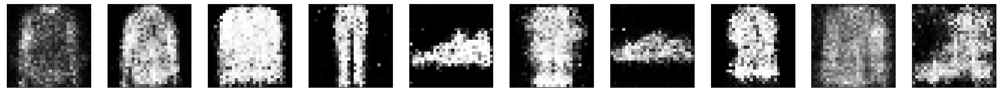

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:50,  4.58it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:46,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:00<00:45,  5.09it/s]

 6
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:44,  5.11it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:00<00:44,  5.17it/s]

 6
8/8 [==============================] - 0s 5ms/step


  3%|██                                                                                | 6/234 [00:01<00:45,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:01<00:43,  5.17it/s]

 6
8/8 [==============================] - 0s 3ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:01<00:43,  5.20it/s]

 6
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:43,  5.15it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  4%|███▍                                                                             | 10/234 [00:01<00:42,  5.22it/s]

 6
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:43,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  5%|████▏                                                                            | 12/234 [00:02<00:42,  5.17it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|████▌                                                                            | 13/234 [00:02<00:42,  5.23it/s]

 6
8/8 [==============================] - 0s 4ms/step


  6%|████▊                                                                            | 14/234 [00:02<00:42,  5.12it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


  6%|█████▏                                                                           | 15/234 [00:02<00:42,  5.19it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:42,  5.08it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

  7%|█████▉                                                                           | 17/234 [00:03<00:42,  5.12it/s]

 6
8/8 [==============================] - 0s 4ms/step


  8%|██████▏                                                                          | 18/234 [00:03<00:41,  5.18it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step
epoch: 

  8%|██████▌                                                                          | 19/234 [00:03<00:42,  5.06it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

  9%|██████▉                                                                          | 20/234 [00:03<00:41,  5.11it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

  9%|███████▎                                                                         | 21/234 [00:04<00:42,  5.07it/s]

6
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:04<00:41,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 10%|███████▉                                                                         | 23/234 [00:04<00:41,  5.11it/s]

 6
8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:04<00:41,  5.00it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:04<00:40,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 11%|█████████                                                                        | 26/234 [00:05<00:41,  5.07it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 12%|█████████▎                                                                       | 27/234 [00:05<00:40,  5.07it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 12%|█████████▋                                                                       | 28/234 [00:05<00:39,  5.20it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:05<00:40,  5.10it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 13%|██████████▍                                                                      | 30/234 [00:05<00:40,  5.08it/s]

6
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:40,  5.01it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:06<00:40,  4.98it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████▍                                                                     | 33/234 [00:06<00:39,  5.09it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch:  6


 15%|███████████▊                                                                     | 34/234 [00:06<00:39,  5.04it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


 15%|████████████                                                                     | 35/234 [00:06<00:38,  5.13it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


 15%|████████████▍                                                                    | 36/234 [00:07<00:38,  5.13it/s]

8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:07<00:39,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:07<00:38,  5.05it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:07<00:39,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▊                                                                   | 40/234 [00:07<00:38,  5.07it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▏                                                                  | 41/234 [00:08<00:37,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▌                                                                  | 42/234 [00:08<00:38,  4.96it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▉                                                                  | 43/234 [00:08<00:37,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▏                                                                 | 44/234 [00:08<00:38,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▌                                                                 | 45/234 [00:08<00:37,  5.04it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 20%|███████████████▉                                                                 | 46/234 [00:09<00:37,  5.07it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch: 

 20%|████████████████▎                                                                | 47/234 [00:09<00:37,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▌                                                                | 48/234 [00:09<00:36,  5.13it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 21%|████████████████▉                                                                | 49/234 [00:09<00:36,  5.11it/s]

 6
8/8 [==============================] - 0s 3ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:09<00:36,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:10<00:37,  4.94it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 22%|██████████████████                                                               | 52/234 [00:10<00:37,  4.89it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 23%|██████████████████▎                                                              | 53/234 [00:10<00:36,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 23%|██████████████████▋                                                              | 54/234 [00:10<00:36,  4.93it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 24%|███████████████████                                                              | 55/234 [00:10<00:35,  5.04it/s]

6
8/8 [==============================] - 0s 3ms/step
epoch:  6


 24%|███████████████████▍                                                             | 56/234 [00:11<00:34,  5.14it/s]

8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▋                                                             | 57/234 [00:11<00:34,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 25%|████████████████████                                                             | 58/234 [00:11<00:34,  5.17it/s]

 6
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████▍                                                            | 59/234 [00:11<00:34,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:11<00:33,  5.14it/s]

 6
8/8 [==============================] - 0s 3ms/step
epoch:  

 26%|█████████████████████                                                            | 61/234 [00:11<00:33,  5.23it/s]

6
8/8 [==============================] - 0s 5ms/step
epoch:  

 26%|█████████████████████▍                                                           | 62/234 [00:12<00:33,  5.11it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 27%|█████████████████████▊                                                           | 63/234 [00:12<00:33,  5.08it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 27%|██████████████████████▏                                                          | 64/234 [00:12<00:33,  5.05it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 28%|██████████████████████▌                                                          | 65/234 [00:12<00:33,  5.07it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 28%|██████████████████████▊                                                          | 66/234 [00:12<00:32,  5.14it/s]

8/8 [==============================] - 0s 5ms/step
epoch:  

 29%|███████████████████████▏                                                         | 67/234 [00:13<00:33,  5.03it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 29%|███████████████████████▌                                                         | 68/234 [00:13<00:32,  5.08it/s]

8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:13<00:32,  5.12it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:13<00:32,  5.08it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 30%|████████████████████████▌                                                        | 71/234 [00:13<00:31,  5.16it/s]

 6
8/8 [==============================] - 0s 4ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:14<00:31,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:14<00:31,  5.15it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:14<00:30,  5.21it/s]

 6
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:14<00:30,  5.13it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:14<00:30,  5.16it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:15<00:30,  5.07it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 33%|███████████████████████████                                                      | 78/234 [00:15<00:30,  5.12it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 34%|███████████████████████████▎                                                     | 79/234 [00:15<00:29,  5.17it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 34%|███████████████████████████▋                                                     | 80/234 [00:15<00:30,  5.06it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████                                                     | 81/234 [00:15<00:30,  5.05it/s]

 6
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:16<00:30,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:16<00:30,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 36%|█████████████████████████████                                                    | 84/234 [00:16<00:29,  5.04it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch: 

 36%|█████████████████████████████▍                                                   | 85/234 [00:16<00:29,  5.02it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 37%|█████████████████████████████▊                                                   | 86/234 [00:16<00:28,  5.12it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


 37%|██████████████████████████████                                                   | 87/234 [00:17<00:28,  5.09it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 38%|██████████████████████████████▍                                                  | 88/234 [00:17<00:28,  5.08it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 38%|██████████████████████████████▊                                                  | 89/234 [00:17<00:28,  5.16it/s]

 6
8/8 [==============================] - 0s 5ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:17<00:28,  5.01it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 39%|███████████████████████████████▌                                                 | 91/234 [00:17<00:28,  5.02it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 39%|███████████████████████████████▊                                                 | 92/234 [00:18<00:28,  4.96it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 40%|████████████████████████████████▏                                                | 93/234 [00:18<00:28,  5.01it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 40%|████████████████████████████████▌                                                | 94/234 [00:18<00:27,  5.08it/s]

 6
8/8 [==============================] - 0s 5ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:18<00:28,  4.88it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:18<00:27,  4.97it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:19<00:27,  4.97it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:19<00:27,  5.02it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:19<00:26,  5.14it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:19<00:26,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:19<00:25,  5.17it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:20<00:25,  5.13it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 44%|███████████████████████████████████▏                                            | 103/234 [00:20<00:25,  5.10it/s]

6
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:20<00:25,  5.15it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:20<00:25,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:20<00:24,  5.23it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:21<00:24,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:21<00:24,  5.08it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:21<00:24,  5.14it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:21<00:24,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:21<00:24,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▎                                         | 112/234 [00:22<00:23,  5.11it/s]

 6
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:22<00:23,  5.04it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:22<00:23,  5.11it/s]

 6
8/8 [==============================] - 0s 4ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:22<00:23,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|███████████████████████████████████████▋                                        | 116/234 [00:22<00:23,  5.03it/s]

 6
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:23<00:23,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:23<00:23,  4.94it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 51%|████████████████████████████████████████▋                                       | 119/234 [00:23<00:22,  5.01it/s]

 6
8/8 [==============================] - 0s 4ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:23<00:22,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▎                                      | 121/234 [00:23<00:22,  5.01it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:24<00:22,  5.01it/s]

 6
8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:24<00:22,  4.92it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:24<00:22,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:24<00:21,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:24<00:21,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:25<00:21,  5.05it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:25<00:21,  5.04it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:25<00:20,  5.14it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:25<00:21,  4.93it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:25<00:20,  5.01it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:26<00:20,  5.03it/s]

 6
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:26<00:20,  4.96it/s]

epoch:  6
8/8 [==============================] - 0s 3ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:26<00:19,  5.09it/s]

 6
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:26<00:19,  5.02it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:26<00:19,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:27<00:19,  5.09it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:27<00:19,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:27<00:18,  5.07it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:27<00:18,  5.03it/s]

8/8 [==============================] - 0s 4ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:27<00:18,  5.02it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:28<00:18,  5.09it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:28<00:18,  5.03it/s]

6
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:28<00:18,  4.97it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:28<00:18,  4.88it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:28<00:17,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:29<00:17,  5.01it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:29<00:17,  4.93it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:29<00:16,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:29<00:17,  4.84it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:29<00:16,  4.95it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:30<00:16,  5.07it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:30<00:16,  5.02it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:30<00:15,  5.06it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:30<00:15,  5.02it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:30<00:15,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:31<00:15,  5.09it/s]

8/8 [==============================] - 0s 5ms/step
epoch:  

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:31<00:15,  5.01it/s]

6
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:31<00:14,  5.08it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:31<00:14,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:31<00:14,  5.07it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:31<00:14,  5.10it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:32<00:14,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:32<00:13,  5.04it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:32<00:13,  5.02it/s]

 6
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:32<00:13,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:32<00:13,  5.07it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:33<00:13,  4.96it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:33<00:12,  5.03it/s]

6
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:33<00:12,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:33<00:12,  4.99it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:33<00:12,  5.07it/s]

6
8/8 [==============================] - 0s 5ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:34<00:12,  4.94it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:34<00:12,  4.98it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:34<00:11,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:34<00:11,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:34<00:11,  5.07it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:35<00:11,  4.92it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:35<00:10,  5.01it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:35<00:10,  5.02it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:35<00:10,  5.00it/s]

6
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:35<00:10,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:36<00:10,  4.93it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:36<00:10,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:36<00:09,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:36<00:09,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:36<00:09,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:37<00:09,  4.91it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:37<00:09,  4.98it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:37<00:08,  4.98it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch:  

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:37<00:08,  4.95it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:38<00:08,  5.00it/s]

 6
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:38<00:08,  4.94it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:38<00:07,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:38<00:07,  5.08it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:38<00:07,  4.95it/s]

8/8 [==============================] - 0s 4ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:39<00:07,  5.01it/s]

 6
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:39<00:07,  4.95it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:39<00:06,  5.03it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:39<00:06,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:39<00:06,  5.06it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:39<00:06,  5.14it/s]

6
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:40<00:06,  5.04it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:40<00:05,  5.07it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:40<00:05,  5.03it/s]

6
8/8 [==============================] - 0s 5ms/step
epoch:  

 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:40<00:05,  4.96it/s]

6
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:40<00:05,  5.05it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:41<00:05,  4.96it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:41<00:04,  5.06it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:41<00:04,  5.09it/s]

epoch:  6
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:41<00:04,  5.03it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:41<00:04,  5.10it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:42<00:04,  5.01it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:42<00:03,  5.04it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:42<00:03,  5.02it/s]

8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:42<00:03,  4.93it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:42<00:03,  4.96it/s]

 6
8/8 [==============================] - 0s 5ms/step
epoch:  

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:43<00:03,  4.85it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch: 

 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:43<00:03,  4.89it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:43<00:02,  4.90it/s]

8/8 [==============================] - 0s 4ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:43<00:02,  4.93it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:44<00:02,  5.02it/s]

8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:44<00:02,  4.83it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:44<00:02,  4.81it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:44<00:01,  4.82it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  

 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:44<00:01,  4.88it/s]

6
8/8 [==============================] - 0s 4ms/step
epoch:  

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:45<00:01,  4.91it/s]

6
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:45<00:01,  4.90it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:45<00:00,  5.01it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:45<00:00,  4.99it/s]

epoch:  6
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:45<00:00,  5.04it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:46<00:00,  4.99it/s]

 6
8/8 [==============================] - 0s 4ms/step
epoch:  6


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:46<00:00,  4.97it/s]

8/8 [==============================] - 0s 4ms/step
epoch:  6


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:48,  4.78it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:46,  5.01it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:00<00:46,  4.99it/s]

 7
8/8 [==============================] - 0s 5ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:46,  4.90it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<00:45,  5.01it/s]

 7
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:45,  4.99it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:45,  5.04it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:01<00:45,  4.98it/s]

 7
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:45,  4.90it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  4%|███▍                                                                             | 10/234 [00:02<00:44,  4.99it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

  5%|███▊                                                                             | 11/234 [00:02<00:44,  5.00it/s]

 7
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:43,  5.08it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:42,  5.17it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


  6%|████▊                                                                            | 14/234 [00:02<00:43,  5.07it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|█████▏                                                                           | 15/234 [00:02<00:43,  5.03it/s]

 7
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:44,  4.93it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:43,  4.98it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:03<00:42,  5.06it/s]

 7
8/8 [==============================] - 0s 5ms/step


  8%|██████▌                                                                          | 19/234 [00:03<00:43,  4.97it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


  9%|██████▉                                                                          | 20/234 [00:03<00:42,  5.03it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|███████▎                                                                         | 21/234 [00:04<00:42,  5.04it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:04<00:41,  5.09it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  7


 10%|███████▉                                                                         | 23/234 [00:04<00:41,  5.12it/s]

8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:04<00:42,  5.00it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 11%|████████▋                                                                        | 25/234 [00:04<00:41,  5.04it/s]

 7
8/8 [==============================] - 0s 4ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:43,  4.83it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 12%|█████████▎                                                                       | 27/234 [00:05<00:42,  4.90it/s]

 7
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:05<00:41,  4.94it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 12%|██████████                                                                       | 29/234 [00:05<00:41,  4.89it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 13%|██████████▍                                                                      | 30/234 [00:06<00:40,  4.99it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 13%|██████████▋                                                                      | 31/234 [00:06<00:41,  4.94it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:06<00:40,  4.99it/s]

 7
8/8 [==============================] - 0s 4ms/step


 14%|███████████▍                                                                     | 33/234 [00:06<00:39,  5.04it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step
epoch: 

 15%|███████████▊                                                                     | 34/234 [00:06<00:40,  4.94it/s]

 7
8/8 [==============================] - 0s 4ms/step


 15%|████████████                                                                     | 35/234 [00:06<00:38,  5.12it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 15%|████████████▍                                                                    | 36/234 [00:07<00:39,  5.04it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:07<00:39,  5.05it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:07<00:38,  5.06it/s]

 7
8/8 [==============================] - 0s 5ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:07<00:39,  4.97it/s]

 7
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▊                                                                   | 40/234 [00:07<00:38,  5.07it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▏                                                                  | 41/234 [00:08<00:38,  4.97it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▌                                                                  | 42/234 [00:08<00:38,  5.01it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  

 18%|██████████████▉                                                                  | 43/234 [00:08<00:37,  5.10it/s]

7
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▏                                                                 | 44/234 [00:08<00:38,  4.97it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 19%|███████████████▌                                                                 | 45/234 [00:08<00:37,  5.06it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  

 20%|███████████████▉                                                                 | 46/234 [00:09<00:37,  5.00it/s]

7
8/8 [==============================] - 0s 4ms/step
epoch:  

 20%|████████████████▎                                                                | 47/234 [00:09<00:37,  5.02it/s]

7
8/8 [==============================] - 0s 4ms/step
epoch: 

 21%|████████████████▌                                                                | 48/234 [00:09<00:36,  5.08it/s]

 7
8/8 [==============================] - 0s 5ms/step
epoch:  7


 21%|████████████████▉                                                                | 49/234 [00:09<00:37,  4.96it/s]

8/8 [==============================] - 0s 4ms/step


 21%|█████████████████▎                                                               | 50/234 [00:09<00:36,  5.00it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:10<00:36,  5.00it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:10<00:36,  5.06it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:10<00:35,  5.06it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:10<00:36,  4.87it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████                                                              | 55/234 [00:11<00:36,  4.85it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████▍                                                             | 56/234 [00:11<00:36,  4.83it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:11<00:36,  4.85it/s]

 7
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:11<00:36,  4.83it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████▍                                                            | 59/234 [00:11<00:37,  4.65it/s]

epoch:  7
8/8 [==============================] - 0s 3ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:12<00:36,  4.78it/s]

 7
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████                                                            | 61/234 [00:12<00:37,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:12<00:36,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 27%|█████████████████████▊                                                           | 63/234 [00:12<00:36,  4.70it/s]

 7
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:12<00:36,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:13<00:36,  4.60it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:13<00:36,  4.55it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 29%|███████████████████████▏                                                         | 67/234 [00:13<00:36,  4.58it/s]

 7
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:13<00:35,  4.66it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:14<00:34,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 30%|████████████████████████▏                                                        | 70/234 [00:14<00:34,  4.75it/s]

 7
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:14<00:34,  4.73it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:14<00:34,  4.66it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:14<00:34,  4.65it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:15<00:34,  4.60it/s]

 7
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:15<00:34,  4.66it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:15<00:33,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:15<00:32,  4.84it/s]

 7
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:15<00:31,  4.88it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 34%|███████████████████████████▎                                                     | 79/234 [00:16<00:31,  4.92it/s]

 7
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:16<00:30,  4.97it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████                                                     | 81/234 [00:16<00:30,  4.94it/s]

 7
8/8 [==============================] - 0s 5ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:16<00:30,  4.91it/s]

 7
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:16<00:31,  4.78it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:17<00:32,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:17<00:32,  4.63it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:17<00:31,  4.66it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 37%|██████████████████████████████                                                   | 87/234 [00:17<00:30,  4.78it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 38%|██████████████████████████████▍                                                  | 88/234 [00:17<00:30,  4.83it/s]

 7
8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:18<00:30,  4.79it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:18<00:30,  4.73it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 39%|███████████████████████████████▌                                                 | 91/234 [00:18<00:30,  4.74it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 39%|███████████████████████████████▊                                                 | 92/234 [00:18<00:29,  4.75it/s]

 7
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:19<00:29,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:19<00:29,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:19<00:29,  4.73it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:19<00:29,  4.73it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:19<00:28,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:20<00:29,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:20<00:29,  4.50it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 43%|██████████████████████████████████▏                                             | 100/234 [00:20<00:29,  4.56it/s]

 7
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:20<00:29,  4.56it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:20<00:28,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:21<00:27,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 44%|███████████████████████████████████▌                                            | 104/234 [00:21<00:27,  4.70it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 45%|███████████████████████████████████▉                                            | 105/234 [00:21<00:27,  4.74it/s]

 7
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:21<00:26,  4.76it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:22<00:26,  4.80it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:22<00:26,  4.73it/s]

 7
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:22<00:26,  4.76it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 47%|█████████████████████████████████████▌                                          | 110/234 [00:22<00:25,  4.81it/s]

 7
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:22<00:25,  4.84it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:23<00:25,  4.84it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:23<00:25,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:23<00:25,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|███████████████████████████████████████▎                                        | 115/234 [00:23<00:25,  4.69it/s]

 7
8/8 [==============================] - 0s 4ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:23<00:25,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:24<00:25,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:24<00:25,  4.60it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:24<00:24,  4.63it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:24<00:24,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:25<00:24,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:25<00:23,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:25<00:23,  4.75it/s]

 7
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:25<00:23,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:25<00:22,  4.76it/s]

 7
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:26<00:22,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:26<00:22,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:26<00:22,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:26<00:22,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:26<00:21,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:27<00:21,  4.81it/s]

 7
8/8 [==============================] - 0s 4ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:27<00:21,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:27<00:20,  4.83it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:27<00:20,  4.84it/s]

 7
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:27<00:20,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:28<00:20,  4.72it/s]

 7
8/8 [==============================] - 0s 5ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:28<00:20,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:28<00:20,  4.59it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 59%|███████████████████████████████████████████████▌                                | 139/234 [00:28<00:20,  4.65it/s]

 7
8/8 [==============================] - 0s 4ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:29<00:20,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:29<00:20,  4.61it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:29<00:19,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:29<00:19,  4.65it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:29<00:19,  4.61it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:30<00:19,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:30<00:18,  4.72it/s]

 7
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:30<00:18,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:30<00:18,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:30<00:17,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:31<00:17,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:31<00:17,  4.65it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:31<00:17,  4.69it/s]

 7
8/8 [==============================] - 0s 4ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:31<00:17,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:32<00:16,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:32<00:16,  4.70it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:32<00:16,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:32<00:16,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:32<00:16,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:33<00:15,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:33<00:16,  4.62it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:33<00:15,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:33<00:15,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:33<00:14,  4.77it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:34<00:14,  4.79it/s]

 7
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:34<00:14,  4.77it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:34<00:14,  4.77it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:34<00:14,  4.76it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:34<00:14,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:35<00:14,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:35<00:14,  4.55it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:35<00:14,  4.48it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:35<00:13,  4.50it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:36<00:13,  4.53it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:36<00:12,  4.63it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:36<00:12,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 5ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:36<00:12,  4.67it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  

 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:36<00:12,  4.74it/s]

7
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:37<00:11,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:37<00:11,  4.76it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:37<00:11,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:37<00:11,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:37<00:10,  4.78it/s]

 7
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:38<00:10,  4.81it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:38<00:10,  4.79it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:38<00:10,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:38<00:10,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:39<00:09,  4.70it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:39<00:09,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:39<00:09,  4.65it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:39<00:09,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:39<00:09,  4.74it/s]

 7
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:40<00:08,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:40<00:08,  4.70it/s]

 7
8/8 [==============================] - 0s 5ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:40<00:08,  4.69it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:40<00:08,  4.70it/s]

7
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:40<00:08,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:41<00:07,  4.72it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:41<00:07,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:41<00:07,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:41<00:07,  4.75it/s]

 7
8/8 [==============================] - 0s 4ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:42<00:06,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:42<00:06,  4.73it/s]

 7
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:42<00:06,  4.78it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:42<00:06,  4.83it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:42<00:06,  4.81it/s]

 7
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:43<00:05,  4.86it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:43<00:05,  4.84it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:43<00:05,  4.81it/s]

 7
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:43<00:05,  4.79it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:43<00:04,  4.82it/s]

 7
8/8 [==============================] - 0s 4ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:44<00:04,  4.77it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:44<00:04,  4.78it/s]

 7
8/8 [==============================] - 0s 4ms/step
epoch:  

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:44<00:04,  4.77it/s]

7
8/8 [==============================] - 0s 4ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:44<00:04,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:44<00:04,  4.70it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:45<00:03,  4.63it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:45<00:03,  4.64it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:45<00:03,  4.67it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:45<00:03,  4.68it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:46<00:02,  4.76it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:46<00:02,  4.77it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:46<00:02,  4.80it/s]

 7
8/8 [==============================] - 0s 4ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:46<00:02,  4.81it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:46<00:02,  4.77it/s]

 7
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:47<00:01,  4.71it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:47<00:01,  4.70it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:47<00:01,  4.69it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:47<00:01,  4.76it/s]

 7
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:47<00:01,  4.75it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:48<00:00,  4.82it/s]

 7
8/8 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:48<00:00,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:48<00:00,  4.73it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:48<00:00,  4.74it/s]

epoch:  7
8/8 [==============================] - 0s 4ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:48<00:00,  4.78it/s]


epoch:  7


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:47,  4.93it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:47,  4.91it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:00<00:46,  5.00it/s]

 8
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:47,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:48,  4.74it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:48,  4.72it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:48,  4.65it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


  3%|██▊                                                                               | 8/234 [00:01<00:48,  4.65it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:48,  4.60it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:49,  4.57it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:49,  4.55it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:48,  4.61it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:48,  4.60it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|████▊                                                                            | 14/234 [00:03<00:48,  4.58it/s]

 8
8/8 [==============================] - 0s 4ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:47,  4.64it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:47,  4.61it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:46,  4.62it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:03<00:48,  4.49it/s]

 8
8/8 [==============================] - 0s 4ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:46,  4.60it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:04<00:46,  4.64it/s]

 8
8/8 [==============================] - 0s 4ms/step


  9%|███████▎                                                                         | 21/234 [00:04<00:45,  4.67it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:04<00:45,  4.71it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 10%|███████▉                                                                         | 23/234 [00:04<00:44,  4.73it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 10%|████████▎                                                                        | 24/234 [00:05<00:43,  4.80it/s]

8
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:44,  4.74it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:44,  4.65it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 12%|█████████▎                                                                       | 27/234 [00:05<00:44,  4.69it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 12%|█████████▋                                                                       | 28/234 [00:05<00:43,  4.75it/s]

 8
8/8 [==============================] - 0s 4ms/step


 12%|██████████                                                                       | 29/234 [00:06<00:42,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:42,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:41,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:06<00:41,  4.89it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████▍                                                                     | 33/234 [00:07<00:41,  4.87it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 15%|███████████▊                                                                     | 34/234 [00:07<00:40,  4.89it/s]

8/8 [==============================] - 0s 4ms/step


 15%|████████████                                                                     | 35/234 [00:07<00:40,  4.89it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 15%|████████████▍                                                                    | 36/234 [00:07<00:40,  4.89it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:07<00:40,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 16%|█████████████▏                                                                   | 38/234 [00:08<00:40,  4.90it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:08<00:39,  4.89it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 17%|█████████████▊                                                                   | 40/234 [00:08<00:40,  4.85it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 18%|██████████████▏                                                                  | 41/234 [00:08<00:39,  4.87it/s]

8/8 [==============================] - 0s 4ms/step


 18%|██████████████▌                                                                  | 42/234 [00:08<00:39,  4.89it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:09<00:39,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:09<00:39,  4.85it/s]

 8
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▌                                                                 | 45/234 [00:09<00:40,  4.72it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 20%|███████████████▉                                                                 | 46/234 [00:09<00:39,  4.71it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:09<00:39,  4.70it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▌                                                                | 48/234 [00:10<00:41,  4.52it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▉                                                                | 49/234 [00:10<00:41,  4.49it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:10<00:39,  4.62it/s]

 8
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:10<00:38,  4.71it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 22%|██████████████████                                                               | 52/234 [00:10<00:38,  4.79it/s]

 8
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:11<00:37,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▋                                                              | 54/234 [00:11<00:37,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████                                                              | 55/234 [00:11<00:36,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:11<00:36,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:12<00:36,  4.85it/s]

 8
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:12<00:36,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:12<00:35,  4.90it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:12<00:35,  4.90it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 26%|█████████████████████                                                            | 61/234 [00:12<00:35,  4.87it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 26%|█████████████████████▍                                                           | 62/234 [00:13<00:35,  4.87it/s]

8/8 [==============================] - 0s 4ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:13<00:35,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:13<00:35,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:13<00:35,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:13<00:36,  4.61it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:14<00:36,  4.60it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 29%|███████████████████████▌                                                         | 68/234 [00:14<00:35,  4.70it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 29%|███████████████████████▉                                                         | 69/234 [00:14<00:34,  4.74it/s]

8
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:14<00:34,  4.76it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:14<00:33,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:15<00:33,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:15<00:32,  4.90it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:15<00:33,  4.80it/s]

 8
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:15<00:32,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:15<00:33,  4.78it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:16<00:32,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:16<00:31,  4.90it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:16<00:31,  4.88it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:16<00:31,  4.88it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████                                                     | 81/234 [00:16<00:31,  4.91it/s]

 8
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:17<00:30,  4.99it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████▋                                                    | 83/234 [00:17<00:30,  4.98it/s]

 8
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:17<00:30,  4.96it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 36%|█████████████████████████████▍                                                   | 85/234 [00:17<00:30,  4.96it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 37%|█████████████████████████████▊                                                   | 86/234 [00:17<00:29,  4.96it/s]

 8
8/8 [==============================] - 0s 4ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:18<00:30,  4.90it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step
epoch: 

 38%|██████████████████████████████▍                                                  | 88/234 [00:18<00:30,  4.75it/s]

 8
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:18<00:31,  4.64it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:18<00:31,  4.56it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:19<00:31,  4.49it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:19<00:31,  4.57it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:19<00:30,  4.55it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 40%|████████████████████████████████▌                                                | 94/234 [00:19<00:30,  4.62it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 41%|████████████████████████████████▉                                                | 95/234 [00:19<00:29,  4.70it/s]

8
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:20<00:29,  4.68it/s]

epoch:  8
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:20<00:29,  4.60it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 42%|█████████████████████████████████▉                                               | 98/234 [00:20<00:29,  4.64it/s]

 8
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:20<00:29,  4.65it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 43%|██████████████████████████████████▏                                             | 100/234 [00:21<00:28,  4.68it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 43%|██████████████████████████████████▌                                             | 101/234 [00:21<00:28,  4.71it/s]

 8
8/8 [==============================] - 0s 4ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:21<00:27,  4.72it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:21<00:27,  4.73it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:21<00:27,  4.73it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:22<00:27,  4.78it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:22<00:26,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:22<00:26,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:22<00:26,  4.77it/s]

 8
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:22<00:26,  4.70it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:23<00:26,  4.68it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:23<00:26,  4.72it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:23<00:25,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:23<00:25,  4.69it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:23<00:25,  4.74it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 49%|███████████████████████████████████████▎                                        | 115/234 [00:24<00:25,  4.74it/s]

8/8 [==============================] - 0s 4ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:24<00:24,  4.76it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:24<00:24,  4.76it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:24<00:24,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:25<00:23,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 51%|█████████████████████████████████████████                                       | 120/234 [00:25<00:23,  4.82it/s]

 8
8/8 [==============================] - 0s 4ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:25<00:23,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:25<00:22,  4.88it/s]

 8
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:25<00:22,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:26<00:22,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:26<00:22,  4.87it/s]

 8
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:26<00:22,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 54%|███████████████████████████████████████████▍                                    | 127/234 [00:26<00:21,  4.88it/s]

 8
8/8 [==============================] - 0s 4ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:26<00:21,  4.90it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:27<00:21,  4.92it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:27<00:21,  4.89it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:27<00:21,  4.88it/s]

 8
8/8 [==============================] - 0s 4ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:27<00:21,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:27<00:20,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:28<00:20,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:28<00:20,  4.85it/s]

 8
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:28<00:20,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:28<00:19,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:28<00:19,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:29<00:19,  4.88it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:29<00:19,  4.90it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 60%|████████████████████████████████████████████████▏                               | 141/234 [00:29<00:18,  4.91it/s]

 8
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:29<00:18,  4.91it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:29<00:18,  5.03it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:30<00:18,  4.91it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:30<00:18,  4.89it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:30<00:17,  4.92it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:30<00:17,  4.87it/s]

8
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:30<00:17,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:31<00:17,  4.81it/s]

 8
8/8 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:31<00:17,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:31<00:17,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:31<00:17,  4.82it/s]

 8
8/8 [==============================] - 0s 4ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:32<00:16,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:32<00:16,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:32<00:16,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:32<00:16,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:32<00:15,  4.89it/s]

 8
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:33<00:15,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:33<00:15,  4.88it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:33<00:15,  4.91it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:33<00:15,  4.85it/s]

 8
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:33<00:14,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:34<00:14,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:34<00:14,  4.74it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:34<00:14,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:34<00:14,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:34<00:13,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:35<00:13,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:35<00:13,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:35<00:13,  4.86it/s]

 8
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:35<00:13,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:35<00:12,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:36<00:12,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:36<00:12,  4.86it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:36<00:12,  4.82it/s]

 8
8/8 [==============================] - 0s 4ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:36<00:12,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:36<00:11,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:37<00:11,  4.78it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:37<00:11,  4.77it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:37<00:11,  4.79it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:37<00:11,  4.80it/s]

8
8/8 [==============================] - 0s 4ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:38<00:10,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:38<00:10,  4.82it/s]

8
8/8 [==============================] - 0s 4ms/step
epoch:  

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:38<00:10,  4.80it/s]

8
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:38<00:10,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:38<00:10,  4.79it/s]

 8
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:39<00:09,  4.78it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:39<00:09,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:39<00:09,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:39<00:09,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:39<00:08,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:40<00:08,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:40<00:08,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:40<00:08,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:40<00:08,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:40<00:07,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:41<00:07,  4.85it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:41<00:07,  4.87it/s]

 8
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:41<00:07,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:41<00:07,  4.82it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:41<00:06,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:42<00:06,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:42<00:06,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:42<00:06,  4.84it/s]

8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:42<00:05,  4.87it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:42<00:05,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:43<00:05,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:43<00:05,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:43<00:05,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:43<00:05,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:44<00:04,  4.76it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:44<00:04,  4.83it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:44<00:04,  4.81it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch:  8


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:44<00:04,  4.79it/s]

8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:44<00:03,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:45<00:03,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:45<00:03,  4.81it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:45<00:03,  4.84it/s]

 8
8/8 [==============================] - 0s 4ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:45<00:03,  4.83it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:45<00:02,  4.87it/s]

 8
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:46<00:02,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:46<00:02,  4.73it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:46<00:02,  4.78it/s]

 8
8/8 [==============================] - 0s 4ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:46<00:02,  4.78it/s]

 8
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:46<00:01,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:47<00:01,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:47<00:01,  4.84it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:47<00:01,  4.82it/s]

 8
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:47<00:01,  4.80it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:47<00:00,  4.79it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:48<00:00,  4.75it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:48<00:00,  4.74it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:48<00:00,  4.78it/s]

epoch:  8
8/8 [==============================] - 0s 4ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:48<00:00,  4.79it/s]


epoch:  8


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:48,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:49,  4.69it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  1%|█                                                                                 | 3/234 [00:00<00:48,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:47,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<00:46,  4.87it/s]

 9
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:47,  4.84it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:01<00:46,  4.85it/s]

 9
8/8 [==============================] - 0s 4ms/step


  3%|██▊                                                                               | 8/234 [00:01<00:46,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  4%|███▏                                                                              | 9/234 [00:01<00:46,  4.85it/s]

 9
8/8 [==============================] - 0s 4ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:46,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:46,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:45,  4.84it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:45,  4.86it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


  6%|████▊                                                                            | 14/234 [00:02<00:45,  4.85it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|█████▏                                                                           | 15/234 [00:03<00:45,  4.82it/s]

 9
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:45,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  7%|█████▉                                                                           | 17/234 [00:03<00:45,  4.80it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  

  8%|██████▏                                                                          | 18/234 [00:03<00:44,  4.84it/s]

9
8/8 [==============================] - 0s 4ms/step


  8%|██████▌                                                                          | 19/234 [00:03<00:44,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:04<00:44,  4.82it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|███████▎                                                                         | 21/234 [00:04<00:44,  4.80it/s]

 9
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:04<00:44,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 10%|███████▉                                                                         | 23/234 [00:04<00:43,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:04<00:43,  4.80it/s]

 9
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:43,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:43,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 12%|█████████▎                                                                       | 27/234 [00:05<00:43,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:05<00:42,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 12%|██████████                                                                       | 29/234 [00:06<00:43,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:42,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:42,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 14%|███████████                                                                      | 32/234 [00:06<00:42,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 14%|███████████▍                                                                     | 33/234 [00:06<00:41,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 15%|███████████▊                                                                     | 34/234 [00:07<00:41,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 15%|████████████                                                                     | 35/234 [00:07<00:41,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 15%|████████████▍                                                                    | 36/234 [00:07<00:41,  4.80it/s]

 9
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|████████████▊                                                                    | 37/234 [00:07<00:42,  4.68it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  

 16%|█████████████▏                                                                   | 38/234 [00:07<00:41,  4.74it/s]

9
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▌                                                                   | 39/234 [00:08<00:40,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▊                                                                   | 40/234 [00:08<00:40,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:08<00:40,  4.82it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▌                                                                  | 42/234 [00:08<00:40,  4.79it/s]

 9
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:08<00:40,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▏                                                                 | 44/234 [00:09<00:39,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▌                                                                 | 45/234 [00:09<00:39,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 20%|███████████████▉                                                                 | 46/234 [00:09<00:39,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:09<00:39,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▌                                                                | 48/234 [00:10<00:39,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▉                                                                | 49/234 [00:10<00:38,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 21%|█████████████████▎                                                               | 50/234 [00:10<00:38,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:10<00:37,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:10<00:37,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:11<00:38,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▋                                                              | 54/234 [00:11<00:37,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████                                                              | 55/234 [00:11<00:38,  4.66it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:11<00:38,  4.66it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▋                                                             | 57/234 [00:11<00:37,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:12<00:37,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████▍                                                            | 59/234 [00:12<00:37,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 26%|████████████████████▊                                                            | 60/234 [00:12<00:37,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 26%|█████████████████████                                                            | 61/234 [00:12<00:36,  4.73it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  

 26%|█████████████████████▍                                                           | 62/234 [00:12<00:35,  4.78it/s]

9
8/8 [==============================] - 0s 4ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:13<00:35,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:13<00:35,  4.84it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:13<00:35,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:13<00:35,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:14<00:34,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 29%|███████████████████████▌                                                         | 68/234 [00:14<00:34,  4.78it/s]

 9
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:14<00:34,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 30%|████████████████████████▏                                                        | 70/234 [00:14<00:34,  4.78it/s]

 9
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:14<00:34,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:15<00:34,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:15<00:34,  4.72it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:15<00:33,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 32%|█████████████████████████▉                                                       | 75/234 [00:15<00:33,  4.77it/s]

 9
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:15<00:33,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:16<00:32,  4.81it/s]

 9
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:16<00:32,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:16<00:32,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 34%|███████████████████████████▋                                                     | 80/234 [00:16<00:32,  4.75it/s]

 9
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████                                                     | 81/234 [00:16<00:32,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:17<00:32,  4.72it/s]

 9
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:17<00:31,  4.73it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:17<00:31,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:17<00:31,  4.73it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 37%|█████████████████████████████▊                                                   | 86/234 [00:18<00:31,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 37%|██████████████████████████████                                                   | 87/234 [00:18<00:30,  4.78it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  9


 38%|██████████████████████████████▍                                                  | 88/234 [00:18<00:30,  4.77it/s]

8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:18<00:30,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:18<00:29,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:19<00:30,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:19<00:30,  4.71it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:19<00:29,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:19<00:29,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:19<00:29,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:20<00:28,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:20<00:28,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:20<00:28,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 42%|██████████████████████████████████▎                                              | 99/234 [00:20<00:28,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:20<00:28,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:21<00:27,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:21<00:27,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:21<00:27,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:21<00:27,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:21<00:26,  4.82it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:22<00:26,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:22<00:26,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:22<00:26,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:22<00:26,  4.80it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:23<00:25,  4.81it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:23<00:25,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▎                                         | 112/234 [00:23<00:25,  4.83it/s]

 9
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:23<00:25,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:23<00:25,  4.79it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|███████████████████████████████████████▎                                        | 115/234 [00:24<00:24,  4.78it/s]

 9
8/8 [==============================] - 0s 4ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:24<00:24,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|████████████████████████████████████████                                        | 117/234 [00:24<00:24,  4.77it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|████████████████████████████████████████▎                                       | 118/234 [00:24<00:24,  4.77it/s]

 9
8/8 [==============================] - 0s 4ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:24<00:24,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:25<00:23,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:25<00:23,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:25<00:23,  4.80it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:25<00:23,  4.80it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch: 

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:25<00:22,  4.79it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:26<00:22,  4.78it/s]

9
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:26<00:22,  4.78it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:26<00:22,  4.72it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:26<00:22,  4.63it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:27<00:22,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:27<00:22,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:27<00:21,  4.72it/s]

 9
8/8 [==============================] - 0s 4ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:27<00:21,  4.71it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:27<00:21,  4.73it/s]

 9
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:28<00:21,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:28<00:20,  4.74it/s]

 9
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:28<00:20,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:28<00:20,  4.72it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:28<00:20,  4.69it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 59%|███████████████████████████████████████████████▌                                | 139/234 [00:29<00:20,  4.72it/s]

 9
8/8 [==============================] - 0s 4ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:29<00:20,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:29<00:19,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:29<00:19,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:29<00:19,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:30<00:18,  4.75it/s]

 9
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:30<00:18,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:30<00:18,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:30<00:18,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:31<00:18,  4.76it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:31<00:17,  4.72it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:31<00:17,  4.73it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:31<00:17,  4.73it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:31<00:17,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:32<00:17,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:32<00:17,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:32<00:16,  4.72it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:32<00:16,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:32<00:16,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:33<00:16,  4.64it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:33<00:16,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:33<00:16,  4.62it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:33<00:15,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:34<00:15,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:34<00:15,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:34<00:15,  4.66it/s]

 9
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:34<00:14,  4.71it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:34<00:14,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:35<00:14,  4.71it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:35<00:13,  4.74it/s]

 9
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:35<00:13,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:35<00:13,  4.64it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:35<00:13,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:36<00:13,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:36<00:13,  4.69it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:36<00:12,  4.69it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:36<00:12,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:36<00:12,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:37<00:12,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:37<00:12,  4.57it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:37<00:11,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:37<00:11,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:38<00:11,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:38<00:11,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:38<00:10,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:38<00:10,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:38<00:10,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:39<00:10,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:39<00:10,  4.58it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:39<00:10,  4.55it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:39<00:09,  4.60it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:40<00:09,  4.53it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:40<00:09,  4.52it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:40<00:09,  4.58it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:40<00:08,  4.65it/s]

 9
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:40<00:08,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:41<00:08,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:41<00:08,  4.66it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:41<00:07,  4.68it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:41<00:07,  4.72it/s]

 9
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:41<00:07,  4.70it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:42<00:07,  4.73it/s]

 9
8/8 [==============================] - 0s 4ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:42<00:06,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:42<00:06,  4.75it/s]

 9
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:42<00:06,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:42<00:06,  4.75it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:43<00:06,  4.74it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:43<00:05,  4.77it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:43<00:05,  4.76it/s]

 9
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:43<00:05,  4.59it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:44<00:05,  4.62it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:44<00:05,  4.66it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step
epoch: 

 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:44<00:04,  4.70it/s]

 9
8/8 [==============================] - 0s 4ms/step
epoch:  

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:44<00:04,  4.68it/s]

9
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:44<00:04,  4.65it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:45<00:04,  4.69it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:45<00:04,  4.72it/s]

 9
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:45<00:03,  4.67it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:45<00:03,  4.58it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:46<00:04,  3.39it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:46<00:04,  3.62it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:46<00:03,  3.83it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:46<00:03,  3.88it/s]

 9
8/8 [==============================] - 0s 5ms/step
epoch:  9


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:47<00:03,  3.98it/s]

8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:47<00:02,  4.12it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:47<00:02,  4.23it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:47<00:02,  4.31it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:48<00:01,  4.31it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:48<00:01,  4.38it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:48<00:01,  4.46it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:48<00:01,  4.50it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:48<00:00,  4.54it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:49<00:00,  4.56it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:49<00:00,  4.53it/s]

epoch:  9
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:49<00:00,  4.52it/s]

epoch:  9
8/8 [==============================] - 0s 5ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:49<00:00,  4.69it/s]


epoch:  9


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:51,  4.52it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

  1%|▋                                                                                 | 2/234 [00:00<00:49,  4.65it/s]

 10
8/8 [==============================] - 0s 4ms/step


  1%|█                                                                                 | 3/234 [00:00<00:50,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:50,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:49,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:49,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:01<00:48,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step


  3%|██▊                                                                               | 8/234 [00:01<00:48,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:48,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:49,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:48,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:47,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|████▌                                                                            | 13/234 [00:02<00:47,  4.66it/s]

 10
8/8 [==============================] - 0s 5ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:48,  4.57it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:47,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:47,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:47,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  8%|██████▏                                                                          | 18/234 [00:03<00:46,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:46,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


  9%|██████▉                                                                          | 20/234 [00:04<00:46,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|███████▎                                                                         | 21/234 [00:04<00:45,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:04<00:44,  4.71it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch:  10


 10%|███████▉                                                                         | 23/234 [00:04<00:44,  4.73it/s]

8/8 [==============================] - 0s 4ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:05<00:44,  4.72it/s]

 10
8/8 [==============================] - 0s 5ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:45,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 11%|█████████                                                                        | 26/234 [00:05<00:44,  4.65it/s]

 10
8/8 [==============================] - 0s 4ms/step


 12%|█████████▎                                                                       | 27/234 [00:05<00:44,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:06<00:44,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 12%|██████████                                                                       | 29/234 [00:06<00:44,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:44,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:44,  4.53it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 14%|███████████                                                                      | 32/234 [00:06<00:44,  4.51it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 14%|███████████▍                                                                     | 33/234 [00:07<00:44,  4.49it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 15%|███████████▊                                                                     | 34/234 [00:07<00:44,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 15%|████████████                                                                     | 35/234 [00:07<00:44,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 15%|████████████▍                                                                    | 36/234 [00:07<00:44,  4.42it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:08<00:45,  4.37it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:08<00:44,  4.39it/s]

 10
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▌                                                                   | 39/234 [00:08<00:44,  4.43it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▊                                                                   | 40/234 [00:08<00:43,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:08<00:43,  4.44it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▌                                                                  | 42/234 [00:09<00:43,  4.44it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:09<00:42,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▏                                                                 | 44/234 [00:09<00:42,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 19%|███████████████▌                                                                 | 45/234 [00:09<00:42,  4.47it/s]

 10
8/8 [==============================] - 0s 4ms/step


 20%|███████████████▉                                                                 | 46/234 [00:10<00:41,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:10<00:41,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 21%|████████████████▌                                                                | 48/234 [00:10<00:41,  4.47it/s]

 10
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▉                                                                | 49/234 [00:10<00:41,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 21%|█████████████████▎                                                               | 50/234 [00:10<00:40,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:11<00:40,  4.55it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:11<00:39,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:11<00:39,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:11<00:39,  4.53it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████                                                              | 55/234 [00:12<00:39,  4.51it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:12<00:39,  4.50it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████▋                                                             | 57/234 [00:12<00:39,  4.45it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████                                                             | 58/234 [00:12<00:39,  4.45it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████▍                                                            | 59/234 [00:12<00:40,  4.37it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 26%|████████████████████▊                                                            | 60/234 [00:13<00:38,  4.49it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████                                                            | 61/234 [00:13<00:40,  4.32it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:13<00:40,  4.30it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:13<00:39,  4.33it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:14<00:38,  4.37it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step
epoch: 

 28%|██████████████████████▌                                                          | 65/234 [00:14<00:38,  4.36it/s]

 10
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:14<00:37,  4.43it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:14<00:37,  4.45it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:15<00:37,  4.44it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:15<00:36,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 30%|████████████████████████▏                                                        | 70/234 [00:15<00:35,  4.56it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch:  

 30%|████████████████████████▌                                                        | 71/234 [00:15<00:35,  4.57it/s]

10
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:15<00:36,  4.50it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:16<00:36,  4.44it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:16<00:35,  4.46it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:16<00:35,  4.44it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:16<00:34,  4.53it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:17<00:34,  4.49it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:17<00:34,  4.50it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:17<00:34,  4.54it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:17<00:33,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████                                                     | 81/234 [00:17<00:33,  4.54it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:18<00:33,  4.55it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:18<00:33,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:18<00:32,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:18<00:32,  4.54it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:18<00:32,  4.54it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:19<00:32,  4.50it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:19<00:32,  4.53it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:19<00:32,  4.51it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 38%|███████████████████████████████▏                                                 | 90/234 [00:19<00:31,  4.53it/s]

 10
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:20<00:31,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:20<00:31,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:20<00:30,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:20<00:30,  4.55it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:20<00:30,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:21<00:30,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:21<00:29,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:21<00:29,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:21<00:29,  4.56it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:22<00:29,  4.54it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:22<00:29,  4.55it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:22<00:29,  4.52it/s]

 10
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:22<00:29,  4.51it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:22<00:28,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:23<00:27,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:23<00:27,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:23<00:27,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:23<00:27,  4.61it/s]

 10
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:24<00:27,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:24<00:26,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:24<00:26,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:24<00:26,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:24<00:26,  4.63it/s]

 10
8/8 [==============================] - 0s 4ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:25<00:25,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:25<00:25,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:25<00:25,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:25<00:25,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:25<00:25,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 51%|████████████████████████████████████████▋                                       | 119/234 [00:26<00:24,  4.60it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch: 

 51%|█████████████████████████████████████████                                       | 120/234 [00:26<00:24,  4.57it/s]

 10
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:26<00:25,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:26<00:25,  4.47it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:27<00:24,  4.44it/s]

 10
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:27<00:24,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:27<00:24,  4.49it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:27<00:24,  4.48it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 54%|███████████████████████████████████████████▍                                    | 127/234 [00:28<00:24,  4.43it/s]

 10
8/8 [==============================] - 0s 4ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:28<00:23,  4.52it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:28<00:22,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:28<00:22,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:28<00:22,  4.68it/s]

 10
8/8 [==============================] - 0s 5ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:29<00:21,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:29<00:21,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:29<00:21,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:29<00:21,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:29<00:21,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:30<00:20,  4.65it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:30<00:20,  4.68it/s]

 10
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:30<00:20,  4.70it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:30<00:19,  4.72it/s]

 10
8/8 [==============================] - 0s 4ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:30<00:19,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:31<00:19,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:31<00:19,  4.68it/s]

 10
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:31<00:19,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:31<00:18,  4.70it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:32<00:18,  4.74it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:32<00:18,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:32<00:18,  4.60it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:32<00:18,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:32<00:17,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:33<00:17,  4.71it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:33<00:17,  4.74it/s]

 10
8/8 [==============================] - 0s 4ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:33<00:17,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:33<00:17,  4.65it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:33<00:16,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:34<00:16,  4.66it/s]

 10
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:34<00:16,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:34<00:16,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch:  

 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:34<00:15,  4.73it/s]

10
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:35<00:15,  4.74it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:35<00:15,  4.74it/s]

 10
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:35<00:15,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:35<00:15,  4.65it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:35<00:15,  4.61it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:36<00:14,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:36<00:14,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:36<00:14,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:36<00:13,  4.71it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:36<00:13,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:37<00:13,  4.71it/s]

 10
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:37<00:13,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:37<00:13,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:37<00:13,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:38<00:12,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:38<00:12,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:38<00:12,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:38<00:12,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:38<00:11,  4.71it/s]

 10
8/8 [==============================] - 0s 4ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:39<00:11,  4.70it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:39<00:11,  4.56it/s]

 10
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:39<00:11,  4.59it/s]

epoch:  10
8/8 [==============================] - 0s 6ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:39<00:11,  4.53it/s]

 10
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:39<00:11,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:40<00:10,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:40<00:10,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:40<00:10,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:40<00:10,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:41<00:09,  4.72it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:41<00:09,  4.65it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:41<00:09,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:41<00:09,  4.70it/s]

 10
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:41<00:09,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:42<00:08,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:42<00:08,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:42<00:08,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:42<00:08,  4.58it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:42<00:07,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:43<00:07,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:43<00:07,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:43<00:07,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:43<00:07,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:44<00:06,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:44<00:06,  4.62it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:44<00:06,  4.64it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:44<00:06,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:44<00:05,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:45<00:05,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:45<00:05,  4.66it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:45<00:05,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:45<00:05,  4.73it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:45<00:04,  4.75it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:46<00:04,  4.73it/s]

 10
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:46<00:04,  4.75it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:46<00:04,  4.71it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:46<00:04,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:47<00:03,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:47<00:03,  4.70it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:47<00:03,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:47<00:03,  4.70it/s]

 10
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:47<00:02,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:48<00:02,  4.72it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:48<00:02,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:48<00:02,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:48<00:02,  4.67it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:48<00:01,  4.67it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:49<00:01,  4.73it/s]

 10
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:49<00:01,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:49<00:01,  4.69it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:49<00:01,  4.68it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:50<00:00,  4.69it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:50<00:00,  4.61it/s]

 10
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:50<00:00,  4.63it/s]

 10
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:50<00:00,  4.63it/s]

epoch:  10
8/8 [==============================] - 0s 4ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:50<00:00,  4.60it/s]

epoch:  10
1/1 [==============================] - 0s 20ms/step


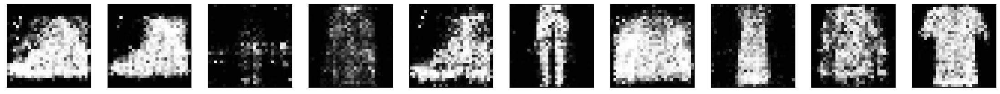

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:51,  4.48it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:51,  4.50it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:00<00:51,  4.45it/s]

 11
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:52,  4.42it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:50,  4.50it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:49,  4.58it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:48,  4.65it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:01<00:48,  4.67it/s]

 11
8/8 [==============================] - 0s 4ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:47,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:47,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:47,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:47,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:47,  4.65it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:47,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

  6%|█████▏                                                                           | 15/234 [00:03<00:47,  4.64it/s]

 11
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:46,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:46,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  8%|██████▏                                                                          | 18/234 [00:03<00:46,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

  8%|██████▌                                                                          | 19/234 [00:04<00:45,  4.71it/s]

 11
8/8 [==============================] - 0s 4ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:04<00:45,  4.72it/s]

 11
8/8 [==============================] - 0s 4ms/step


  9%|███████▎                                                                         | 21/234 [00:04<00:45,  4.72it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:04<00:45,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 10%|███████▉                                                                         | 23/234 [00:04<00:45,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:05<00:45,  4.64it/s]

 11
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:44,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:44,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 12%|█████████▎                                                                       | 27/234 [00:05<00:44,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:06<00:43,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 12%|██████████                                                                       | 29/234 [00:06<00:43,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:43,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:43,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:06<00:43,  4.69it/s]

 11
8/8 [==============================] - 0s 4ms/step


 14%|███████████▍                                                                     | 33/234 [00:07<00:43,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 15%|███████████▊                                                                     | 34/234 [00:07<00:42,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 15%|████████████                                                                     | 35/234 [00:07<00:42,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 15%|████████████▍                                                                    | 36/234 [00:07<00:42,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:07<00:41,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 16%|█████████████▏                                                                   | 38/234 [00:08<00:41,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▌                                                                   | 39/234 [00:08<00:41,  4.72it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▊                                                                   | 40/234 [00:08<00:41,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:08<00:42,  4.56it/s]

 11
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▌                                                                  | 42/234 [00:09<00:41,  4.59it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:09<00:41,  4.65it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:09<00:40,  4.68it/s]

 11
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▌                                                                 | 45/234 [00:09<00:40,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 20%|███████████████▉                                                                 | 46/234 [00:09<00:39,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:10<00:39,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▌                                                                | 48/234 [00:10<00:39,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▉                                                                | 49/234 [00:10<00:39,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 21%|█████████████████▎                                                               | 50/234 [00:10<00:39,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:10<00:38,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:11<00:38,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:11<00:38,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▋                                                              | 54/234 [00:11<00:38,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████                                                              | 55/234 [00:11<00:37,  4.72it/s]

 11
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:11<00:37,  4.73it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:12<00:37,  4.74it/s]

 11
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:12<00:38,  4.57it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████▍                                                            | 59/234 [00:12<00:38,  4.55it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 26%|████████████████████▊                                                            | 60/234 [00:12<00:37,  4.59it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████                                                            | 61/234 [00:13<00:37,  4.61it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 26%|█████████████████████▍                                                           | 62/234 [00:13<00:37,  4.60it/s]

 11
8/8 [==============================] - 0s 4ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:13<00:37,  4.58it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:13<00:36,  4.62it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 28%|██████████████████████▌                                                          | 65/234 [00:13<00:36,  4.66it/s]

 11
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:14<00:35,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:14<00:35,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:14<00:35,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:14<00:34,  4.73it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:15<00:34,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:15<00:34,  4.73it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:15<00:34,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:15<00:34,  4.71it/s]

 11
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:15<00:34,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:16<00:33,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:16<00:33,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:16<00:34,  4.59it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:16<00:33,  4.62it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:16<00:33,  4.60it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:17<00:33,  4.60it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████                                                     | 81/234 [00:17<00:32,  4.64it/s]

 11
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:17<00:32,  4.61it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:17<00:32,  4.63it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:18<00:32,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:18<00:32,  4.59it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:18<00:32,  4.60it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:18<00:31,  4.62it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 38%|██████████████████████████████▍                                                  | 88/234 [00:18<00:31,  4.68it/s]

 11
8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:19<00:31,  4.59it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 38%|███████████████████████████████▏                                                 | 90/234 [00:19<00:32,  4.50it/s]

 11
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:19<00:31,  4.56it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 39%|███████████████████████████████▊                                                 | 92/234 [00:19<00:30,  4.61it/s]

 11
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:19<00:30,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 40%|████████████████████████████████▌                                                | 94/234 [00:20<00:29,  4.69it/s]

 11
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:20<00:29,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:20<00:29,  4.71it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:20<00:29,  4.66it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:21<00:29,  4.65it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:21<00:29,  4.65it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:21<00:28,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:21<00:28,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:21<00:28,  4.68it/s]

 11
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:22<00:28,  4.61it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:22<00:28,  4.62it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:22<00:27,  4.64it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:22<00:27,  4.67it/s]

 11
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:22<00:27,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:23<00:26,  4.67it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:23<00:26,  4.69it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:23<00:26,  4.70it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:23<00:26,  4.68it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▎                                         | 112/234 [00:24<00:27,  4.48it/s]

 11
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:24<00:28,  4.29it/s]

 11
8/8 [==============================] - 0s 5ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:24<00:28,  4.14it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:24<00:29,  4.04it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|███████████████████████████████████████▋                                        | 116/234 [00:25<00:29,  4.04it/s]

 11
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:25<00:28,  4.10it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 50%|████████████████████████████████████████▎                                       | 118/234 [00:25<00:28,  4.13it/s]

 11
8/8 [==============================] - 0s 4ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:25<00:27,  4.19it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:26<00:26,  4.27it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:26<00:26,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:26<00:25,  4.40it/s]

 11
8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:26<00:25,  4.29it/s]

epoch:  11
8/8 [==============================] - 0s 7ms/step
epoch: 

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:27<00:26,  4.08it/s]

 11
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:27<00:26,  4.15it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:27<00:25,  4.25it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:27<00:24,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:27<00:24,  4.27it/s]

 11
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:28<00:24,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:28<00:23,  4.36it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:28<00:23,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:28<00:22,  4.47it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:29<00:22,  4.51it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:29<00:22,  4.46it/s]

 11
8/8 [==============================] - 0s 5ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:29<00:22,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:29<00:23,  4.21it/s]

 11
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:29<00:23,  4.19it/s]

 11
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:30<00:22,  4.20it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:30<00:22,  4.19it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:30<00:21,  4.32it/s]

 11
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:30<00:21,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:31<00:20,  4.47it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:31<00:20,  4.50it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:31<00:19,  4.54it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:31<00:19,  4.56it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:31<00:19,  4.57it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:32<00:19,  4.50it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:32<00:19,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:32<00:19,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:32<00:19,  4.39it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:33<00:18,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:33<00:18,  4.36it/s]

 11
8/8 [==============================] - 0s 5ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:33<00:18,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:33<00:18,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:34<00:18,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:34<00:18,  4.28it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:34<00:18,  4.25it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:34<00:17,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:34<00:17,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:35<00:16,  4.37it/s]

 11
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:35<00:16,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:35<00:16,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:35<00:16,  4.37it/s]

 11
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:36<00:15,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:36<00:15,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:36<00:15,  4.33it/s]

 11
8/8 [==============================] - 0s 4ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:36<00:15,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:37<00:15,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:37<00:14,  4.39it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:37<00:14,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:37<00:14,  4.36it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:37<00:14,  4.23it/s]

 11
8/8 [==============================] - 0s 5ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:38<00:14,  4.19it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:38<00:14,  4.25it/s]

 11
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:38<00:13,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:38<00:13,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:39<00:13,  4.33it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:39<00:13,  4.21it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:39<00:13,  4.20it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:39<00:12,  4.23it/s]

 11
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:40<00:12,  4.30it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:40<00:11,  4.39it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:40<00:11,  4.45it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:40<00:11,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:41<00:11,  4.32it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:41<00:10,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:41<00:10,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:41<00:10,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:41<00:10,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:42<00:09,  4.41it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:42<00:09,  4.42it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:42<00:09,  4.39it/s]

 11
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:42<00:09,  4.35it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:43<00:09,  4.36it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:43<00:08,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:43<00:08,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:43<00:08,  4.24it/s]

 11
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:44<00:08,  4.21it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:44<00:08,  4.33it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:44<00:07,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:44<00:07,  4.42it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch:  11


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:44<00:07,  4.38it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:45<00:07,  4.41it/s]

 11
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:45<00:06,  4.43it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:45<00:06,  4.45it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:45<00:06,  4.37it/s]

epoch:  11
8/8 [==============================] - 0s 7ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:46<00:06,  4.30it/s]

 11
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:46<00:06,  4.28it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:46<00:05,  4.29it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:46<00:05,  4.33it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:46<00:05,  4.33it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:47<00:05,  4.31it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:47<00:04,  4.34it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:47<00:04,  4.31it/s]

 11
8/8 [==============================] - 0s 5ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:47<00:04,  4.30it/s]

 11
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:48<00:04,  4.34it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:48<00:03,  4.41it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:48<00:03,  4.46it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:48<00:03,  4.47it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:49<00:03,  4.38it/s]

epoch:  11
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:49<00:02,  4.40it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:49<00:02,  4.39it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:49<00:02,  4.41it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:49<00:02,  4.47it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:50<00:01,  4.53it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:50<00:01,  4.53it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:50<00:01,  4.52it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:50<00:01,  4.44it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:51<00:01,  4.33it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:51<00:00,  4.41it/s]

 11
8/8 [==============================] - 0s 4ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:51<00:00,  4.47it/s]

 11
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:51<00:00,  4.52it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:51<00:00,  4.51it/s]

epoch:  11
8/8 [==============================] - 0s 4ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:52<00:00,  4.49it/s]


epoch:  11


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:50,  4.63it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:53,  4.30it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  1%|█                                                                                 | 3/234 [00:00<00:52,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:51,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:51,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  3%|██                                                                                | 6/234 [00:01<00:50,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:50,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  3%|██▊                                                                               | 8/234 [00:01<00:49,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  4%|███▏                                                                              | 9/234 [00:01<00:49,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:49,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:48,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:48,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:48,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:48,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:47,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:47,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:47,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  8%|██████▏                                                                          | 18/234 [00:03<00:47,  4.57it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:46,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  9%|██████▉                                                                          | 20/234 [00:04<00:46,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


  9%|███████▎                                                                         | 21/234 [00:04<00:46,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:04<00:46,  4.54it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:46,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 10%|████████▎                                                                        | 24/234 [00:05<00:46,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:46,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:46,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 12%|█████████▎                                                                       | 27/234 [00:05<00:47,  4.37it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 12%|█████████▋                                                                       | 28/234 [00:06<00:46,  4.42it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:06<00:46,  4.42it/s]

 12
8/8 [==============================] - 0s 4ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:45,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:06<00:45,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 14%|███████████                                                                      | 32/234 [00:07<00:45,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 14%|███████████▍                                                                     | 33/234 [00:07<00:44,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 15%|███████████▊                                                                     | 34/234 [00:07<00:45,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 15%|████████████                                                                     | 35/234 [00:07<00:44,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 15%|████████████▍                                                                    | 36/234 [00:07<00:44,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:08<00:43,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 16%|█████████████▏                                                                   | 38/234 [00:08<00:43,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▌                                                                   | 39/234 [00:08<00:44,  4.40it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 17%|█████████████▊                                                                   | 40/234 [00:08<00:44,  4.33it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:09<00:44,  4.32it/s]

 12
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▌                                                                  | 42/234 [00:09<00:44,  4.35it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:09<00:42,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▏                                                                 | 44/234 [00:09<00:42,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▌                                                                 | 45/234 [00:10<00:41,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 20%|███████████████▉                                                                 | 46/234 [00:10<00:41,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:10<00:41,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▌                                                                | 48/234 [00:10<00:40,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▉                                                                | 49/234 [00:10<00:40,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 21%|█████████████████▎                                                               | 50/234 [00:11<00:40,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 22%|█████████████████▋                                                               | 51/234 [00:11<00:40,  4.54it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:11<00:39,  4.57it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:11<00:39,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▋                                                              | 54/234 [00:11<00:39,  4.60it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████                                                              | 55/234 [00:12<00:38,  4.60it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:12<00:39,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▋                                                             | 57/234 [00:12<00:39,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:12<00:39,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:13<00:39,  4.40it/s]

 12
8/8 [==============================] - 0s 4ms/step


 26%|████████████████████▊                                                            | 60/234 [00:13<00:38,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████                                                            | 61/234 [00:13<00:38,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:13<00:37,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:13<00:37,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:14<00:37,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:14<00:37,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:14<00:36,  4.54it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:14<00:37,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:15<00:37,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 29%|███████████████████████▉                                                         | 69/234 [00:15<00:36,  4.50it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 30%|████████████████████████▏                                                        | 70/234 [00:15<00:36,  4.53it/s]

 12
8/8 [==============================] - 0s 5ms/step
epoch: 

 30%|████████████████████████▌                                                        | 71/234 [00:15<00:35,  4.54it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|████████████████████████▉                                                        | 72/234 [00:15<00:35,  4.57it/s]

 12
8/8 [==============================] - 0s 4ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:16<00:35,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:16<00:34,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:16<00:34,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:16<00:34,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:17<00:34,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 33%|███████████████████████████                                                      | 78/234 [00:17<00:33,  4.61it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:17<00:33,  4.62it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 34%|███████████████████████████▋                                                     | 80/234 [00:17<00:33,  4.59it/s]

 12
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████                                                     | 81/234 [00:17<00:33,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:18<00:33,  4.52it/s]

 12
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:18<00:33,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:18<00:33,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:18<00:33,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:19<00:33,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:19<00:32,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:19<00:33,  4.39it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step
epoch: 

 38%|██████████████████████████████▊                                                  | 89/234 [00:19<00:33,  4.32it/s]

 12
8/8 [==============================] - 0s 4ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:19<00:32,  4.39it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:20<00:32,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:20<00:31,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:20<00:32,  4.40it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:20<00:31,  4.41it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:21<00:30,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:21<00:30,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:21<00:30,  4.57it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:21<00:29,  4.61it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:21<00:29,  4.61it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:22<00:29,  4.61it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:22<00:29,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:22<00:28,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:22<00:28,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:23<00:28,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:23<00:28,  4.58it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:23<00:27,  4.60it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:23<00:27,  4.54it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:23<00:27,  4.56it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:24<00:27,  4.55it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:24<00:27,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:24<00:27,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:24<00:27,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:25<00:26,  4.48it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:25<00:26,  4.53it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 49%|███████████████████████████████████████▎                                        | 115/234 [00:25<00:26,  4.54it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|███████████████████████████████████████▋                                        | 116/234 [00:25<00:25,  4.55it/s]

 12
8/8 [==============================] - 0s 4ms/step
epoch: 

 50%|████████████████████████████████████████                                        | 117/234 [00:25<00:25,  4.58it/s]

 12
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:26<00:25,  4.59it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:26<00:25,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:26<00:25,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:26<00:26,  4.31it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:27<00:25,  4.32it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:27<00:25,  4.39it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:27<00:24,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:27<00:24,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch:  12


 54%|███████████████████████████████████████████                                     | 126/234 [00:27<00:24,  4.49it/s]

8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:28<00:23,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:28<00:23,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:28<00:23,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:28<00:23,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:29<00:23,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:29<00:22,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:29<00:22,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:29<00:21,  4.60it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:29<00:21,  4.63it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:30<00:21,  4.64it/s]

epoch:  12
8/8 [==============================] - 0s 6ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:30<00:21,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:30<00:21,  4.44it/s]

 12
8/8 [==============================] - 0s 4ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:30<00:21,  4.41it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:31<00:21,  4.44it/s]

 12
8/8 [==============================] - 0s 4ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:31<00:20,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:31<00:20,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:31<00:20,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:31<00:19,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:32<00:19,  4.54it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:32<00:19,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:32<00:19,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:32<00:19,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:33<00:19,  4.30it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step
epoch: 

 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:33<00:19,  4.35it/s]

 12
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:33<00:18,  4.40it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:33<00:18,  4.42it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:33<00:18,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:34<00:18,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:34<00:17,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:34<00:17,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:34<00:17,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:35<00:16,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:35<00:16,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:35<00:16,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:35<00:15,  4.61it/s]

 12
8/8 [==============================] - 0s 4ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:35<00:15,  4.60it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:36<00:15,  4.61it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:36<00:15,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:36<00:15,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:36<00:15,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:37<00:15,  4.41it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:37<00:14,  4.41it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:37<00:14,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:37<00:14,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:37<00:13,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:38<00:13,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:38<00:13,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:38<00:13,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:38<00:13,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:39<00:13,  4.46it/s]

 12
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:39<00:12,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:39<00:12,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:39<00:12,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:39<00:11,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:40<00:11,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:40<00:11,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:40<00:11,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:40<00:11,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:41<00:11,  4.37it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:41<00:10,  4.40it/s]

 12
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:41<00:10,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:41<00:10,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:42<00:10,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:42<00:09,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:42<00:09,  4.59it/s]

 12
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:42<00:09,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:42<00:09,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:43<00:09,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:43<00:08,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:43<00:08,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:43<00:08,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:44<00:08,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:44<00:07,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:44<00:07,  4.54it/s]

 12
8/8 [==============================] - 0s 4ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:44<00:07,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:44<00:07,  4.47it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:45<00:06,  4.49it/s]

 12
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:45<00:06,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:45<00:06,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:45<00:06,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:46<00:06,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:46<00:05,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:46<00:05,  4.51it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:46<00:05,  4.52it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:46<00:05,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:47<00:04,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:47<00:04,  4.48it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:47<00:04,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:47<00:04,  4.46it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:48<00:03,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:48<00:03,  4.50it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:48<00:03,  4.45it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:48<00:03,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:48<00:03,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:49<00:02,  4.49it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:49<00:02,  4.53it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:49<00:02,  4.45it/s]

 12
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:49<00:02,  4.42it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:50<00:02,  4.32it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:50<00:01,  4.28it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:50<00:01,  4.20it/s]

epoch:  12
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:50<00:01,  4.32it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:51<00:01,  4.27it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:51<00:00,  4.32it/s]

 12
8/8 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:51<00:00,  4.39it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:51<00:00,  4.43it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:51<00:00,  4.44it/s]

epoch:  12
8/8 [==============================] - 0s 4ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:52<00:00,  4.49it/s]


epoch:  12


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 4ms/step
epoch: 

  0%|▎                                                                                 | 1/234 [00:00<00:53,  4.39it/s]

 13
8/8 [==============================] - 0s 4ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:53,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  1%|█                                                                                 | 3/234 [00:00<00:52,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:54,  4.25it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<00:53,  4.31it/s]

 13
8/8 [==============================] - 0s 4ms/step
epoch:  

  3%|██                                                                                | 6/234 [00:01<00:51,  4.39it/s]

13
8/8 [==============================] - 0s 4ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:01<00:50,  4.47it/s]

 13
8/8 [==============================] - 0s 4ms/step


  3%|██▊                                                                               | 8/234 [00:01<00:50,  4.50it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

  4%|███▏                                                                              | 9/234 [00:02<00:50,  4.49it/s]

 13
8/8 [==============================] - 0s 4ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:50,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:51,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:52,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  6%|████▌                                                                            | 13/234 [00:02<00:51,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

  6%|████▊                                                                            | 14/234 [00:03<00:50,  4.37it/s]

 13
8/8 [==============================] - 0s 4ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:49,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:49,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:48,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


  8%|██████▏                                                                          | 18/234 [00:04<00:48,  4.48it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:48,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:04<00:47,  4.50it/s]

 13
8/8 [==============================] - 0s 4ms/step


  9%|███████▎                                                                         | 21/234 [00:04<00:48,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


  9%|███████▌                                                                         | 22/234 [00:05<00:48,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:47,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:05<00:47,  4.46it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:46,  4.47it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 11%|█████████                                                                        | 26/234 [00:05<00:46,  4.46it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 12%|█████████▎                                                                       | 27/234 [00:06<00:48,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:06<00:48,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 12%|██████████                                                                       | 29/234 [00:06<00:48,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 13%|██████████▍                                                                      | 30/234 [00:06<00:47,  4.25it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:07<00:47,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 14%|███████████                                                                      | 32/234 [00:07<00:46,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 14%|███████████▍                                                                     | 33/234 [00:07<00:45,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 15%|███████████▊                                                                     | 34/234 [00:07<00:46,  4.30it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 15%|████████████                                                                     | 35/234 [00:08<00:46,  4.28it/s]

 13
8/8 [==============================] - 0s 4ms/step
epoch: 

 15%|████████████▍                                                                    | 36/234 [00:08<00:46,  4.23it/s]

 13
8/8 [==============================] - 0s 4ms/step


 16%|████████████▊                                                                    | 37/234 [00:08<00:45,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 16%|█████████████▏                                                                   | 38/234 [00:08<00:44,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▌                                                                   | 39/234 [00:08<00:44,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▊                                                                   | 40/234 [00:09<00:44,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▏                                                                  | 41/234 [00:09<00:43,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▌                                                                  | 42/234 [00:09<00:43,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 18%|██████████████▉                                                                  | 43/234 [00:09<00:43,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▏                                                                 | 44/234 [00:10<00:43,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▌                                                                 | 45/234 [00:10<00:43,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 20%|███████████████▉                                                                 | 46/234 [00:10<00:42,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 20%|████████████████▎                                                                | 47/234 [00:10<00:42,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 21%|████████████████▌                                                                | 48/234 [00:10<00:41,  4.49it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▉                                                                | 49/234 [00:11<00:42,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 21%|█████████████████▎                                                               | 50/234 [00:11<00:41,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:11<00:40,  4.48it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 22%|██████████████████                                                               | 52/234 [00:11<00:41,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▎                                                              | 53/234 [00:12<00:41,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 23%|██████████████████▋                                                              | 54/234 [00:12<00:40,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████                                                              | 55/234 [00:12<00:41,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▍                                                             | 56/234 [00:12<00:40,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 24%|███████████████████▋                                                             | 57/234 [00:13<00:40,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████                                                             | 58/234 [00:13<00:40,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 25%|████████████████████▍                                                            | 59/234 [00:13<00:39,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 26%|████████████████████▊                                                            | 60/234 [00:13<00:39,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████                                                            | 61/234 [00:13<00:39,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:14<00:38,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 27%|█████████████████████▊                                                           | 63/234 [00:14<00:38,  4.39it/s]

 13
8/8 [==============================] - 0s 4ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:14<00:38,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:14<00:37,  4.47it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:15<00:37,  4.46it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:15<00:38,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:15<00:37,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:15<00:37,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:15<00:37,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:16<00:36,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|████████████████████████▉                                                        | 72/234 [00:16<00:37,  4.34it/s]

 13
8/8 [==============================] - 0s 4ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:16<00:37,  4.31it/s]

 13
8/8 [==============================] - 0s 4ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:16<00:36,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 32%|█████████████████████████▉                                                       | 75/234 [00:17<00:36,  4.37it/s]

 13
8/8 [==============================] - 0s 4ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:17<00:35,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:17<00:35,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 33%|███████████████████████████                                                      | 78/234 [00:17<00:36,  4.30it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:18<00:35,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:18<00:35,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████                                                     | 81/234 [00:18<00:34,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:18<00:34,  4.41it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:18<00:34,  4.41it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 36%|█████████████████████████████                                                    | 84/234 [00:19<00:34,  4.41it/s]

 13
8/8 [==============================] - 0s 5ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:19<00:33,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:19<00:33,  4.48it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:19<00:32,  4.47it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:20<00:32,  4.46it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:20<00:32,  4.49it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:20<00:31,  4.50it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:20<00:32,  4.47it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:20<00:31,  4.49it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:21<00:32,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 40%|████████████████████████████████▌                                                | 94/234 [00:21<00:32,  4.32it/s]

 13
8/8 [==============================] - 0s 4ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:21<00:32,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:21<00:32,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:22<00:31,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:22<00:31,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:22<00:30,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:22<00:30,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:23<00:29,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:23<00:30,  4.34it/s]

 13
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:23<00:30,  4.33it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:23<00:30,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:23<00:29,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:24<00:29,  4.39it/s]

 13
8/8 [==============================] - 0s 5ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:24<00:29,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:24<00:28,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:24<00:28,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:25<00:28,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:25<00:28,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:25<00:27,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:25<00:27,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:25<00:27,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:26<00:26,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 50%|███████████████████████████████████████▋                                        | 116/234 [00:26<00:28,  4.20it/s]

 13
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:26<00:27,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:26<00:27,  4.16it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:27<00:27,  4.20it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:27<00:26,  4.23it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:27<00:26,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:27<00:26,  4.30it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:28<00:25,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:28<00:25,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:28<00:24,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:28<00:24,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:29<00:24,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:29<00:24,  4.40it/s]

 13
8/8 [==============================] - 0s 5ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:29<00:23,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:29<00:24,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:29<00:24,  4.28it/s]

 13
8/8 [==============================] - 0s 5ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:30<00:23,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:30<00:23,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:30<00:22,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:30<00:23,  4.26it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:31<00:22,  4.30it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:31<00:22,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:31<00:22,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:31<00:21,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:32<00:21,  4.39it/s]

 13
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:32<00:21,  4.25it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:32<00:21,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:32<00:21,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:32<00:20,  4.34it/s]

 13
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:33<00:20,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:33<00:20,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:33<00:20,  4.33it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:33<00:19,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:34<00:19,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:34<00:19,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:34<00:18,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:34<00:19,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:35<00:18,  4.28it/s]

 13
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:35<00:18,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:35<00:18,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:35<00:17,  4.41it/s]

 13
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:35<00:17,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:36<00:17,  4.32it/s]

 13
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:36<00:17,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:36<00:16,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:36<00:16,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:37<00:16,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:37<00:16,  4.21it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:37<00:16,  4.30it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:37<00:16,  4.21it/s]

 13
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:38<00:16,  4.12it/s]

 13
8/8 [==============================] - 0s 5ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:38<00:16,  4.12it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:38<00:15,  4.25it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:38<00:15,  4.27it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:38<00:14,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:39<00:14,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:39<00:14,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:39<00:13,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:39<00:13,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:40<00:13,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:40<00:13,  4.39it/s]

 13
8/8 [==============================] - 0s 4ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:40<00:12,  4.44it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:40<00:12,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step
epoch: 

 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:41<00:12,  4.37it/s]

 13
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:41<00:12,  4.41it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:41<00:12,  4.27it/s]

 13
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:41<00:12,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:41<00:11,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:42<00:11,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:42<00:11,  4.27it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:42<00:11,  4.33it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:42<00:10,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:43<00:10,  4.42it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:43<00:10,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:43<00:10,  4.34it/s]

 13
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:43<00:09,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:44<00:09,  4.37it/s]

 13
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:44<00:09,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:44<00:09,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:44<00:08,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:44<00:08,  4.31it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:45<00:08,  4.36it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:45<00:08,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:45<00:08,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:45<00:07,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:46<00:07,  4.35it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:46<00:07,  4.20it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:46<00:07,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:46<00:06,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:47<00:06,  4.21it/s]

 13
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:47<00:06,  4.23it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:47<00:06,  4.15it/s]

 13
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:47<00:06,  4.08it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:48<00:06,  4.07it/s]

 13
8/8 [==============================] - 0s 5ms/step
epoch: 

 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:48<00:05,  4.05it/s]

 13
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:48<00:05,  4.08it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:48<00:05,  4.10it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:49<00:05,  4.10it/s]

 13
8/8 [==============================] - 0s 4ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:49<00:04,  4.17it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:49<00:04,  4.20it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:49<00:04,  4.29it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:49<00:03,  4.27it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:50<00:03,  4.33it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:50<00:03,  4.32it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:50<00:03,  4.34it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:50<00:02,  4.38it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:51<00:02,  4.45it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:51<00:02,  4.37it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:51<00:02,  4.40it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:51<00:02,  4.39it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:51<00:01,  4.43it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:52<00:01,  4.30it/s]

 13
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:52<00:01,  4.23it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:52<00:01,  4.20it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:52<00:00,  4.24it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:53<00:00,  4.22it/s]

 13
8/8 [==============================] - 0s 4ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:53<00:00,  4.23it/s]

epoch:  13
8/8 [==============================] - 0s 4ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:53<00:00,  4.28it/s]

epoch:  13
8/8 [==============================] - 0s 5ms/step
epoch: 

100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:53<00:00,  4.34it/s]


 13


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

  0%|▎                                                                                 | 1/234 [00:00<00:56,  4.12it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

  1%|▋                                                                                 | 2/234 [00:00<00:55,  4.21it/s]

 14
8/8 [==============================] - 0s 4ms/step


  1%|█                                                                                 | 3/234 [00:00<00:53,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  2%|█▍                                                                                | 4/234 [00:00<00:53,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:54,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  3%|██                                                                                | 6/234 [00:01<00:55,  4.12it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:54,  4.18it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:01<00:53,  4.23it/s]

 14
8/8 [==============================] - 0s 4ms/step


  4%|███▏                                                                              | 9/234 [00:02<00:52,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:51,  4.34it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:50,  4.42it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:50,  4.42it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  6%|████▌                                                                            | 13/234 [00:03<00:50,  4.35it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:50,  4.35it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:50,  4.35it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:49,  4.39it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  7%|█████▉                                                                           | 17/234 [00:03<00:49,  4.35it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  8%|██████▏                                                                          | 18/234 [00:04<00:50,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:50,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


  9%|██████▉                                                                          | 20/234 [00:04<00:51,  4.18it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


  9%|███████▎                                                                         | 21/234 [00:04<00:50,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:05<00:50,  4.23it/s]

 14
8/8 [==============================] - 0s 5ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:50,  4.18it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:05<00:50,  4.15it/s]

 14
8/8 [==============================] - 0s 4ms/step


 11%|████████▋                                                                        | 25/234 [00:05<00:49,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 11%|█████████                                                                        | 26/234 [00:06<00:48,  4.31it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 12%|█████████▎                                                                       | 27/234 [00:06<00:48,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 12%|█████████▋                                                                       | 28/234 [00:06<00:48,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:06<00:48,  4.21it/s]

 14
8/8 [==============================] - 0s 4ms/step
epoch: 

 13%|██████████▍                                                                      | 30/234 [00:07<00:49,  4.15it/s]

 14
8/8 [==============================] - 0s 4ms/step


 13%|██████████▋                                                                      | 31/234 [00:07<00:48,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:07<00:48,  4.15it/s]

 14
8/8 [==============================] - 0s 4ms/step
epoch: 

 14%|███████████▍                                                                     | 33/234 [00:07<00:48,  4.14it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 15%|███████████▊                                                                     | 34/234 [00:08<00:48,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 15%|████████████                                                                     | 35/234 [00:08<00:47,  4.15it/s]

 14
8/8 [==============================] - 0s 4ms/step


 15%|████████████▍                                                                    | 36/234 [00:08<00:46,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 16%|████████████▊                                                                    | 37/234 [00:08<00:45,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 16%|█████████████▏                                                                   | 38/234 [00:08<00:45,  4.34it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▌                                                                   | 39/234 [00:09<00:44,  4.38it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▊                                                                   | 40/234 [00:09<00:44,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:09<00:44,  4.30it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▌                                                                  | 42/234 [00:09<00:44,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▉                                                                  | 43/234 [00:10<00:44,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▏                                                                 | 44/234 [00:10<00:43,  4.36it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 19%|███████████████▌                                                                 | 45/234 [00:10<00:42,  4.41it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 20%|███████████████▉                                                                 | 46/234 [00:10<00:42,  4.38it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 20%|████████████████▎                                                                | 47/234 [00:10<00:42,  4.39it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▌                                                                | 48/234 [00:11<00:43,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▉                                                                | 49/234 [00:11<00:43,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:11<00:43,  4.26it/s]

 14
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:11<00:42,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 22%|██████████████████                                                               | 52/234 [00:12<00:42,  4.32it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▎                                                              | 53/234 [00:12<00:41,  4.34it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:12<00:42,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████                                                              | 55/234 [00:12<00:41,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████▍                                                             | 56/234 [00:13<00:42,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:13<00:43,  4.12it/s]

 14
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████                                                             | 58/234 [00:13<00:42,  4.12it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:13<00:42,  4.14it/s]

 14
8/8 [==============================] - 0s 5ms/step


 26%|████████████████████▊                                                            | 60/234 [00:14<00:41,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 26%|█████████████████████                                                            | 61/234 [00:14<00:41,  4.17it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 26%|█████████████████████▍                                                           | 62/234 [00:14<00:41,  4.12it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 27%|█████████████████████▊                                                           | 63/234 [00:14<00:41,  4.13it/s]

 14
8/8 [==============================] - 0s 5ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:15<00:40,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 28%|██████████████████████▌                                                          | 65/234 [00:15<00:40,  4.13it/s]

 14
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:15<00:40,  4.20it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:15<00:39,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:15<00:39,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step
epoch: 

 29%|███████████████████████▉                                                         | 69/234 [00:16<00:38,  4.28it/s]

 14
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:16<00:38,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:16<00:38,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:16<00:38,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:17<00:39,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:17<00:38,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:17<00:37,  4.20it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:17<00:37,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:18<00:36,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 33%|███████████████████████████                                                      | 78/234 [00:18<00:36,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:18<00:36,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:18<00:35,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████                                                     | 81/234 [00:19<00:35,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:19<00:35,  4.31it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:19<00:34,  4.34it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 36%|█████████████████████████████                                                    | 84/234 [00:19<00:35,  4.24it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 36%|█████████████████████████████▍                                                   | 85/234 [00:20<00:35,  4.25it/s]

 14
8/8 [==============================] - 0s 5ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:20<00:34,  4.30it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:20<00:33,  4.34it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:20<00:34,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:20<00:33,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:21<00:34,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:21<00:33,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:21<00:33,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 40%|████████████████████████████████▏                                                | 93/234 [00:21<00:32,  4.32it/s]

 14
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:22<00:33,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:22<00:33,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:22<00:32,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:22<00:32,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:23<00:32,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:23<00:31,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 43%|██████████████████████████████████▏                                             | 100/234 [00:23<00:31,  4.28it/s]

 14
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:23<00:30,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:24<00:31,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step
epoch: 

 44%|███████████████████████████████████▏                                            | 103/234 [00:24<00:31,  4.15it/s]

 14
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:24<00:30,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:24<00:31,  4.14it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:25<00:31,  4.09it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 46%|████████████████████████████████████▌                                           | 107/234 [00:25<00:30,  4.13it/s]

 14
8/8 [==============================] - 0s 5ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:25<00:29,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:25<00:29,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:25<00:29,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:26<00:29,  4.11it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:26<00:29,  4.11it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:26<00:28,  4.22it/s]

 14
8/8 [==============================] - 0s 5ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:26<00:28,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:27<00:27,  4.30it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:27<00:27,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:27<00:27,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:27<00:27,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:28<00:27,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:28<00:26,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:28<00:26,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:28<00:27,  4.07it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:29<00:26,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:29<00:26,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:29<00:25,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:29<00:25,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:29<00:25,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:30<00:24,  4.26it/s]

 14
8/8 [==============================] - 0s 5ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:30<00:24,  4.33it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:30<00:24,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:30<00:24,  4.28it/s]

 14
8/8 [==============================] - 0s 5ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:31<00:24,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:31<00:23,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:31<00:23,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:31<00:23,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:32<00:22,  4.27it/s]

 14
8/8 [==============================] - 0s 5ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:32<00:22,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:32<00:22,  4.22it/s]

 14
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:32<00:22,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:33<00:22,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:33<00:21,  4.31it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:33<00:21,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:33<00:21,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:33<00:20,  4.32it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:34<00:20,  4.30it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:34<00:21,  4.18it/s]

 14
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:34<00:20,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:34<00:20,  4.11it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:35<00:20,  4.18it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:35<00:20,  4.09it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:35<00:20,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:35<00:20,  4.05it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:36<00:19,  4.10it/s]

 14
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:36<00:19,  4.10it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:36<00:19,  4.13it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:36<00:18,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:37<00:17,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:37<00:17,  4.36it/s]

 14
8/8 [==============================] - 0s 4ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:37<00:17,  4.39it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:37<00:17,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:38<00:17,  4.20it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:38<00:17,  4.19it/s]

 14
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:38<00:17,  4.12it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch:  14


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:38<00:16,  4.15it/s]

8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:38<00:16,  4.12it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:39<00:16,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:39<00:16,  4.08it/s]

 14
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:39<00:16,  4.01it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:39<00:15,  4.10it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:40<00:15,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:40<00:15,  4.13it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:40<00:14,  4.15it/s]

 14
8/8 [==============================] - 0s 5ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:40<00:14,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:41<00:14,  4.10it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:41<00:14,  4.07it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:41<00:13,  4.15it/s]

 14
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:41<00:13,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:42<00:13,  4.14it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:42<00:13,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:42<00:13,  4.14it/s]

 14
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:42<00:13,  4.05it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:43<00:12,  4.02it/s]

 14
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:43<00:12,  3.98it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:43<00:12,  4.04it/s]

 14
8/8 [==============================] - 0s 4ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:43<00:11,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:44<00:11,  4.28it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:44<00:11,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 7ms/step
epoch: 

 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:44<00:10,  4.19it/s]

 14
8/8 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:44<00:10,  4.23it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:45<00:10,  4.40it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:45<00:10,  4.29it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:45<00:10,  4.17it/s]

 14
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:45<00:10,  4.01it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:46<00:09,  4.02it/s]

 14
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:46<00:09,  4.01it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:46<00:09,  3.96it/s]

 14
8/8 [==============================] - 0s 5ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:46<00:09,  4.03it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:47<00:08,  4.01it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:47<00:08,  4.08it/s]

 14
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:47<00:08,  4.10it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:47<00:07,  4.14it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:47<00:07,  4.14it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:48<00:07,  4.09it/s]

 14
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:48<00:07,  4.14it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:48<00:06,  4.18it/s]

 14
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:48<00:06,  4.10it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:49<00:06,  4.16it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:49<00:06,  4.19it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:49<00:05,  4.25it/s]

 14
8/8 [==============================] - 0s 5ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:49<00:05,  4.27it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:50<00:05,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:50<00:05,  4.11it/s]

 14
8/8 [==============================] - 0s 5ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:50<00:05,  4.14it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:50<00:04,  4.22it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:51<00:04,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:51<00:04,  4.07it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:51<00:04,  3.97it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:51<00:04,  3.98it/s]

 14
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:52<00:03,  4.13it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:52<00:03,  4.02it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:52<00:03,  4.08it/s]

 14
8/8 [==============================] - 0s 5ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:52<00:02,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:53<00:02,  4.17it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:53<00:02,  4.21it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:53<00:02,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:53<00:01,  4.18it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:54<00:01,  4.13it/s]

 14
8/8 [==============================] - 0s 5ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:54<00:01,  4.18it/s]

 14
8/8 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:54<00:01,  4.15it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:54<00:00,  4.20it/s]

epoch:  14
8/8 [==============================] - 0s 4ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:54<00:00,  4.24it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:55<00:00,  4.25it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:55<00:00,  4.26it/s]

epoch:  14
8/8 [==============================] - 0s 5ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:55<00:00,  4.25it/s]

epoch:  14


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:58,  4.00it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:01,  3.79it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch:  15


  1%|█                                                                                 | 3/234 [00:00<01:00,  3.80it/s]

8/8 [==============================] - 0s 5ms/step


  2%|█▍                                                                                | 4/234 [00:01<00:59,  3.88it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<00:57,  3.99it/s]

 15
8/8 [==============================] - 0s 5ms/step


  3%|██                                                                                | 6/234 [00:01<00:56,  4.02it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:56,  4.00it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  3%|██▊                                                                               | 8/234 [00:02<00:55,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:02<00:55,  4.03it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

  4%|███▍                                                                             | 10/234 [00:02<00:54,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:54,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  5%|████▏                                                                            | 12/234 [00:02<00:53,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  6%|████▌                                                                            | 13/234 [00:03<00:52,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:52,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:51,  4.23it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  7%|█████▌                                                                           | 16/234 [00:03<00:52,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

  7%|█████▉                                                                           | 17/234 [00:04<00:52,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:04<00:52,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:51,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  9%|██████▉                                                                          | 20/234 [00:04<00:51,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  9%|███████▎                                                                         | 21/234 [00:05<00:52,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


  9%|███████▌                                                                         | 22/234 [00:05<00:52,  4.02it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:52,  3.99it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:05<00:51,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 11%|████████▋                                                                        | 25/234 [00:06<00:51,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 11%|█████████                                                                        | 26/234 [00:06<00:51,  4.06it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|█████████▎                                                                       | 27/234 [00:06<00:51,  4.01it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|█████████▋                                                                       | 28/234 [00:06<00:50,  4.04it/s]

 15
8/8 [==============================] - 0s 5ms/step


 12%|██████████                                                                       | 29/234 [00:07<00:49,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 13%|██████████▍                                                                      | 30/234 [00:07<00:49,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 13%|██████████▋                                                                      | 31/234 [00:07<00:48,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 14%|███████████                                                                      | 32/234 [00:07<00:48,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 14%|███████████▍                                                                     | 33/234 [00:08<00:48,  4.15it/s]

 15
8/8 [==============================] - 0s 5ms/step


 15%|███████████▊                                                                     | 34/234 [00:08<00:48,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 15%|████████████                                                                     | 35/234 [00:08<00:47,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 15%|████████████▍                                                                    | 36/234 [00:08<00:48,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|████████████▊                                                                    | 37/234 [00:09<00:47,  4.16it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:09<00:45,  4.30it/s]

 15
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▌                                                                   | 39/234 [00:09<00:46,  4.21it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 17%|█████████████▊                                                                   | 40/234 [00:09<00:47,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:10<00:47,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▌                                                                  | 42/234 [00:10<00:47,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▉                                                                  | 43/234 [00:10<00:45,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:10<00:45,  4.19it/s]

 15
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▌                                                                 | 45/234 [00:10<00:46,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 20%|███████████████▉                                                                 | 46/234 [00:11<00:45,  4.14it/s]

 15
8/8 [==============================] - 0s 5ms/step


 20%|████████████████▎                                                                | 47/234 [00:11<00:45,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▌                                                                | 48/234 [00:11<00:45,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▉                                                                | 49/234 [00:11<00:45,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 21%|█████████████████▎                                                               | 50/234 [00:12<00:45,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:12<00:45,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 22%|██████████████████                                                               | 52/234 [00:12<00:45,  4.02it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 23%|██████████████████▎                                                              | 53/234 [00:12<00:44,  4.04it/s]

 15
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:13<00:45,  4.00it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████                                                              | 55/234 [00:13<00:44,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████▍                                                             | 56/234 [00:13<00:43,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:13<00:42,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████                                                             | 58/234 [00:14<00:42,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████▍                                                            | 59/234 [00:14<00:42,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:14<00:41,  4.18it/s]

 15
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████                                                            | 61/234 [00:14<00:41,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 26%|█████████████████████▍                                                           | 62/234 [00:15<00:41,  4.15it/s]

 15
8/8 [==============================] - 0s 5ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:15<00:40,  4.21it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:15<00:41,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:15<00:41,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 4ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:16<00:41,  4.03it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:16<00:41,  3.99it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:16<00:41,  3.98it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:16<00:40,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:17<00:39,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:17<00:39,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:17<00:38,  4.23it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:17<00:39,  4.11it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:18<00:39,  4.07it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 32%|█████████████████████████▉                                                       | 75/234 [00:18<00:38,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:18<00:38,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:18<00:38,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 33%|███████████████████████████                                                      | 78/234 [00:19<00:37,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:19<00:37,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:19<00:36,  4.18it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████                                                     | 81/234 [00:19<00:36,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:20<00:37,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:20<00:37,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:20<00:37,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 36%|█████████████████████████████▍                                                   | 85/234 [00:20<00:36,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:20<00:35,  4.21it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:21<00:35,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:21<00:34,  4.23it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:21<00:33,  4.28it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:21<00:33,  4.28it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 39%|███████████████████████████████▌                                                 | 91/234 [00:22<00:33,  4.26it/s]

 15
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:22<00:33,  4.27it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:22<00:33,  4.27it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:22<00:33,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:23<00:34,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:23<00:34,  4.00it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:23<00:34,  3.97it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:23<00:33,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 42%|██████████████████████████████████▎                                              | 99/234 [00:24<00:32,  4.14it/s]

 15
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:24<00:32,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 43%|██████████████████████████████████▌                                             | 101/234 [00:24<00:32,  4.12it/s]

 15
8/8 [==============================] - 0s 5ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:24<00:31,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:25<00:31,  4.17it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:25<00:30,  4.20it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:25<00:31,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:25<00:30,  4.20it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:26<00:30,  4.23it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:26<00:30,  4.19it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 47%|█████████████████████████████████████▎                                          | 109/234 [00:26<00:29,  4.22it/s]

 15
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:26<00:29,  4.26it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:26<00:29,  4.22it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:27<00:28,  4.28it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:27<00:28,  4.27it/s]

 15
8/8 [==============================] - 0s 5ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:27<00:27,  4.41it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:27<00:27,  4.39it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 50%|███████████████████████████████████████▋                                        | 116/234 [00:28<00:27,  4.23it/s]

 15
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:28<00:27,  4.19it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 50%|████████████████████████████████████████▎                                       | 118/234 [00:28<00:27,  4.22it/s]

 15
8/8 [==============================] - 0s 5ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:28<00:27,  4.23it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:29<00:27,  4.19it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:29<00:27,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:29<00:27,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:29<00:27,  4.02it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:30<00:27,  4.07it/s]

 15
8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:30<00:26,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 54%|███████████████████████████████████████████                                     | 126/234 [00:30<00:26,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:30<00:25,  4.20it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:31<00:25,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 55%|████████████████████████████████████████████                                    | 129/234 [00:31<00:25,  4.06it/s]

 15
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:31<00:25,  4.01it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:31<00:25,  3.99it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:32<00:25,  3.96it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:32<00:25,  3.92it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:32<00:25,  3.97it/s]

 15
8/8 [==============================] - 0s 5ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:32<00:24,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:33<00:24,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:33<00:23,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:33<00:22,  4.18it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:33<00:23,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:34<00:23,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:34<00:22,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:34<00:22,  4.12it/s]

 15
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:34<00:22,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:34<00:21,  4.12it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:35<00:21,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:35<00:21,  4.06it/s]

 15
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:35<00:21,  4.12it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:35<00:21,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:36<00:21,  4.01it/s]

 15
8/8 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:36<00:20,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:36<00:20,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:36<00:20,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:37<00:19,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:37<00:19,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:37<00:19,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:37<00:18,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:38<00:18,  4.17it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 68%|██████████████████████████████████████████████████████                          | 158/234 [00:38<00:18,  4.20it/s]

 15
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:38<00:18,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:38<00:18,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:39<00:17,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:39<00:17,  4.12it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:39<00:17,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:39<00:17,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:40<00:16,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:40<00:16,  4.02it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:40<00:16,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:40<00:15,  4.22it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:41<00:15,  4.15it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:41<00:15,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:41<00:15,  4.05it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:41<00:15,  4.03it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:42<00:15,  3.93it/s]

 15
8/8 [==============================] - 0s 5ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:42<00:15,  3.92it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:42<00:15,  3.89it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:42<00:14,  3.92it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:43<00:14,  3.90it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:43<00:14,  3.97it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:43<00:13,  4.02it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:43<00:13,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:44<00:13,  4.05it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:44<00:13,  3.99it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:44<00:12,  4.06it/s]

 15
8/8 [==============================] - 0s 5ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:44<00:12,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:45<00:11,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:45<00:11,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:45<00:11,  4.15it/s]

 15
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:45<00:10,  4.21it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:46<00:10,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:46<00:10,  4.15it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:46<00:10,  4.14it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:46<00:10,  4.11it/s]

 15
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:47<00:10,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:47<00:09,  4.10it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:47<00:09,  4.13it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:47<00:09,  4.02it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:48<00:09,  4.05it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:48<00:08,  4.06it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:48<00:08,  4.10it/s]

 15
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:48<00:08,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:48<00:08,  4.11it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:49<00:07,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:49<00:07,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:49<00:07,  4.09it/s]

 15
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:49<00:06,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:50<00:06,  4.16it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:50<00:06,  4.19it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:50<00:06,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:50<00:06,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:51<00:05,  4.07it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:51<00:05,  4.01it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:51<00:05,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:51<00:05,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:52<00:04,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:52<00:04,  4.01it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:52<00:04,  4.01it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:52<00:04,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:53<00:03,  4.11it/s]

 15
8/8 [==============================] - 0s 5ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:53<00:03,  4.04it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:53<00:03,  4.07it/s]

 15
8/8 [==============================] - 0s 5ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:53<00:03,  4.08it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:54<00:02,  4.06it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:54<00:02,  4.02it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:54<00:02,  4.00it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:54<00:02,  4.00it/s]

 15
8/8 [==============================] - 0s 5ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:55<00:01,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:55<00:01,  4.14it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:55<00:01,  4.13it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:55<00:01,  4.03it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:56<00:00,  4.09it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:56<00:00,  4.08it/s]

 15
8/8 [==============================] - 0s 5ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:56<00:00,  4.03it/s]

epoch:  15
8/8 [==============================] - 0s 5ms/step
epoch: 

100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:56<00:00,  4.05it/s]

 15
8/8 [==============================] - 0s 5ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:57<00:00,  4.00it/s]

epoch:  15


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:57<00:00,  4.10it/s]

1/1 [==============================] - 0s 20ms/step


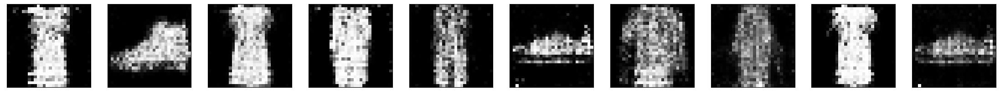

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:57,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:56,  4.13it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


  1%|█                                                                                 | 3/234 [00:00<00:58,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  2%|█▍                                                                                | 4/234 [00:01<00:57,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<00:57,  3.95it/s]

 16
8/8 [==============================] - 0s 5ms/step


  3%|██                                                                                | 6/234 [00:01<00:56,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  3%|██▍                                                                               | 7/234 [00:01<00:56,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step


  3%|██▊                                                                               | 8/234 [00:02<00:57,  3.95it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:02<01:07,  3.32it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  4%|███▍                                                                             | 10/234 [00:02<01:03,  3.53it/s]

 16
8/8 [==============================] - 0s 5ms/step


  5%|███▊                                                                             | 11/234 [00:02<01:00,  3.69it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


  5%|████▏                                                                            | 12/234 [00:03<00:59,  3.71it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  6%|████▌                                                                            | 13/234 [00:03<00:58,  3.79it/s]

 16
8/8 [==============================] - 0s 5ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:56,  3.88it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:55,  3.97it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  7%|█████▌                                                                           | 16/234 [00:04<00:54,  3.97it/s]

 16
8/8 [==============================] - 0s 5ms/step


  7%|█████▉                                                                           | 17/234 [00:04<00:54,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:04<00:54,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

  8%|██████▌                                                                          | 19/234 [00:04<00:55,  3.91it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:05<00:53,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step


  9%|███████▎                                                                         | 21/234 [00:05<00:54,  3.92it/s]

epoch:  16
8/8 [==============================] - 0s 6ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:05<00:53,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:53,  3.96it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:06<00:51,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 11%|████████▋                                                                        | 25/234 [00:06<00:50,  4.11it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 11%|█████████                                                                        | 26/234 [00:06<00:50,  4.15it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|█████████▎                                                                       | 27/234 [00:06<00:50,  4.06it/s]

 16
8/8 [==============================] - 0s 5ms/step


 12%|█████████▋                                                                       | 28/234 [00:07<00:51,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 12%|██████████                                                                       | 29/234 [00:07<00:51,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 13%|██████████▍                                                                      | 30/234 [00:07<00:50,  4.07it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 13%|██████████▋                                                                      | 31/234 [00:07<00:49,  4.14it/s]

 16
8/8 [==============================] - 0s 5ms/step


 14%|███████████                                                                      | 32/234 [00:08<00:48,  4.14it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 14%|███████████▍                                                                     | 33/234 [00:08<00:49,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 15%|███████████▊                                                                     | 34/234 [00:08<00:48,  4.10it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 15%|████████████                                                                     | 35/234 [00:08<00:49,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 15%|████████████▍                                                                    | 36/234 [00:09<00:49,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 16%|████████████▊                                                                    | 37/234 [00:09<00:50,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:09<00:48,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▌                                                                   | 39/234 [00:09<00:47,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▊                                                                   | 40/234 [00:10<00:48,  4.04it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:10<00:48,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 6ms/step
epoch: 

 18%|██████████████▌                                                                  | 42/234 [00:10<00:47,  4.06it/s]

 16
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▉                                                                  | 43/234 [00:10<00:46,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▏                                                                 | 44/234 [00:11<00:46,  4.07it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 19%|███████████████▌                                                                 | 45/234 [00:11<00:47,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step


 20%|███████████████▉                                                                 | 46/234 [00:11<00:46,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 20%|████████████████▎                                                                | 47/234 [00:11<00:46,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 21%|████████████████▌                                                                | 48/234 [00:12<00:46,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▉                                                                | 49/234 [00:12<00:45,  4.07it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:12<00:45,  4.08it/s]

 16
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:12<00:44,  4.10it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 22%|██████████████████                                                               | 52/234 [00:13<00:44,  4.08it/s]

 16
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▎                                                              | 53/234 [00:13<00:43,  4.14it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:13<00:42,  4.19it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 24%|███████████████████                                                              | 55/234 [00:13<00:42,  4.19it/s]

 16
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████▍                                                             | 56/234 [00:14<00:43,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████▋                                                             | 57/234 [00:14<00:43,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████                                                             | 58/234 [00:14<00:43,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:14<00:43,  3.99it/s]

 16
8/8 [==============================] - 0s 5ms/step


 26%|████████████████████▊                                                            | 60/234 [00:15<00:44,  3.95it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 26%|█████████████████████                                                            | 61/234 [00:15<00:43,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:15<00:42,  4.00it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 27%|█████████████████████▊                                                           | 63/234 [00:15<00:43,  3.93it/s]

 16
8/8 [==============================] - 0s 5ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:16<00:43,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:16<00:43,  3.90it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:16<00:43,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:16<00:43,  3.88it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 29%|███████████████████████▌                                                         | 68/234 [00:17<00:41,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:17<00:41,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:17<00:41,  3.93it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 30%|████████████████████████▌                                                        | 71/234 [00:17<00:40,  4.02it/s]

 16
8/8 [==============================] - 0s 5ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:18<00:39,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:18<00:40,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:18<00:40,  3.97it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 32%|█████████████████████████▉                                                       | 75/234 [00:18<00:40,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:19<00:40,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:19<00:40,  3.89it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 33%|███████████████████████████                                                      | 78/234 [00:19<00:39,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:19<00:38,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:20<00:38,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████                                                     | 81/234 [00:20<00:37,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:20<00:36,  4.12it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:20<00:37,  4.04it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:21<00:36,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:21<00:35,  4.22it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:21<00:35,  4.15it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:21<00:35,  4.13it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:22<00:35,  4.07it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:22<00:35,  4.09it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 38%|███████████████████████████████▏                                                 | 90/234 [00:22<00:35,  4.08it/s]

 16
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:22<00:34,  4.20it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:22<00:34,  4.12it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 40%|████████████████████████████████▏                                                | 93/234 [00:23<00:34,  4.05it/s]

 16
8/8 [==============================] - 0s 5ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:23<00:35,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:23<00:34,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 41%|█████████████████████████████████▏                                               | 96/234 [00:24<00:34,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 41%|█████████████████████████████████▌                                               | 97/234 [00:24<00:34,  4.02it/s]

 16
8/8 [==============================] - 0s 5ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:24<00:33,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 42%|██████████████████████████████████▎                                              | 99/234 [00:24<00:32,  4.11it/s]

 16
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:24<00:32,  4.15it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:25<00:31,  4.20it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:25<00:32,  4.09it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:25<00:32,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:25<00:31,  4.09it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:26<00:32,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:26<00:31,  4.04it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 46%|████████████████████████████████████▌                                           | 107/234 [00:26<00:31,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:26<00:31,  4.06it/s]

 16
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:27<00:31,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:27<00:31,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 47%|█████████████████████████████████████▉                                          | 111/234 [00:27<00:31,  3.92it/s]

 16
8/8 [==============================] - 0s 5ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:27<00:30,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:28<00:29,  4.04it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:28<00:29,  4.05it/s]

 16
8/8 [==============================] - 0s 5ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:28<00:29,  4.10it/s]

epoch:  16
8/8 [==============================] - 0s 7ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:28<00:29,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:29<00:29,  4.00it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 50%|████████████████████████████████████████▎                                       | 118/234 [00:29<00:29,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:29<00:29,  3.92it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:29<00:29,  3.89it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:30<00:29,  3.88it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:30<00:28,  3.88it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch:  16


 53%|██████████████████████████████████████████                                      | 123/234 [00:30<00:28,  3.83it/s]

8/8 [==============================] - 0s 5ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:31<00:28,  3.86it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:31<00:27,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:31<00:27,  3.93it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:31<00:26,  4.00it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:31<00:26,  4.05it/s]

 16
8/8 [==============================] - 0s 5ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:32<00:25,  4.08it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:32<00:25,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:32<00:26,  3.95it/s]

 16
8/8 [==============================] - 0s 5ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:33<00:26,  3.92it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:33<00:25,  3.89it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:33<00:25,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:33<00:25,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:34<00:24,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:34<00:23,  4.06it/s]

 16
8/8 [==============================] - 0s 5ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:34<00:24,  4.00it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 59%|███████████████████████████████████████████████▌                                | 139/234 [00:34<00:23,  3.97it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:35<00:24,  3.90it/s]

 16
8/8 [==============================] - 0s 5ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:35<00:23,  3.93it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:35<00:22,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:35<00:22,  4.07it/s]

 16
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:36<00:22,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:36<00:22,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:36<00:22,  3.92it/s]

 16
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:36<00:22,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:37<00:21,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:37<00:21,  3.89it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:37<00:21,  3.86it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:37<00:21,  3.84it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:38<00:21,  3.84it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch:  16


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:38<00:21,  3.82it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:38<00:20,  3.91it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:38<00:19,  3.97it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:39<00:19,  3.94it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:39<00:19,  4.01it/s]

 16
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:39<00:18,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:39<00:18,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:40<00:18,  3.96it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:40<00:18,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:40<00:17,  4.17it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:40<00:17,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:41<00:17,  4.09it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:41<00:16,  4.09it/s]

 16
8/8 [==============================] - 0s 5ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:41<00:16,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:41<00:16,  4.07it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:42<00:16,  4.07it/s]

 16
8/8 [==============================] - 0s 5ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:42<00:16,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:42<00:16,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:42<00:15,  3.99it/s]

 16
8/8 [==============================] - 0s 5ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:43<00:15,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch:  16


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:43<00:15,  3.98it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:43<00:14,  4.02it/s]

 16
8/8 [==============================] - 0s 5ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:43<00:14,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:44<00:14,  4.06it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:44<00:13,  4.08it/s]

 16
8/8 [==============================] - 0s 5ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:44<00:13,  4.13it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:44<00:13,  4.04it/s]

 16
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:45<00:13,  4.09it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:45<00:12,  4.12it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:45<00:12,  4.05it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:45<00:12,  3.92it/s]

 16
8/8 [==============================] - 0s 5ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:46<00:12,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:46<00:12,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:46<00:12,  3.95it/s]

 16
8/8 [==============================] - 0s 6ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:46<00:12,  3.86it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:47<00:11,  3.86it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:47<00:11,  3.86it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:47<00:11,  3.85it/s]

 16
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:47<00:10,  4.03it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:48<00:10,  3.97it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:48<00:10,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:48<00:10,  3.92it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:48<00:09,  3.93it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:49<00:09,  3.92it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:49<00:09,  3.96it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:49<00:09,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:49<00:08,  3.98it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:50<00:08,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:50<00:07,  4.15it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:50<00:07,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:50<00:07,  4.08it/s]

 16
8/8 [==============================] - 0s 5ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:51<00:07,  4.01it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:51<00:07,  4.07it/s]

 16
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:51<00:07,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:51<00:06,  3.99it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:52<00:06,  3.95it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:52<00:06,  3.98it/s]

 16
8/8 [==============================] - 0s 5ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:52<00:06,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:52<00:05,  3.96it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:53<00:05,  3.93it/s]

 16
8/8 [==============================] - 0s 5ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:53<00:05,  4.06it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:53<00:04,  4.07it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:53<00:04,  4.09it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:54<00:04,  4.00it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:54<00:04,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:54<00:04,  3.96it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:54<00:03,  4.03it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:55<00:03,  3.96it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:55<00:03,  3.90it/s]

 16
8/8 [==============================] - 0s 5ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:55<00:03,  3.94it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:55<00:02,  4.02it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:56<00:02,  3.95it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:56<00:02,  3.91it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:56<00:02,  3.88it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:56<00:01,  3.84it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:57<00:01,  3.77it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:57<00:01,  3.77it/s]

 16
8/8 [==============================] - 0s 5ms/step
epoch: 

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:57<00:01,  3.77it/s]

 16
8/8 [==============================] - 0s 5ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:57<00:00,  3.74it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:58<00:00,  3.74it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:58<00:00,  3.78it/s]

epoch:  16
8/8 [==============================] - 0s 5ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:58<00:00,  3.99it/s]


epoch:  16


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 5ms/step


  0%|▎                                                                                 | 1/234 [00:00<00:54,  4.24it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:58,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  1%|█                                                                                 | 3/234 [00:00<00:57,  4.01it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

  2%|█▍                                                                                | 4/234 [00:00<00:57,  4.03it/s]

 17
8/8 [==============================] - 0s 5ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:57,  3.99it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  3%|██                                                                                | 6/234 [00:01<00:57,  3.96it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:58,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

  3%|██▊                                                                               | 8/234 [00:02<00:58,  3.86it/s]

 17
8/8 [==============================] - 0s 5ms/step


  4%|███▏                                                                              | 9/234 [00:02<00:57,  3.93it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:57,  3.88it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:58,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  5%|████▏                                                                            | 12/234 [00:03<00:57,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  6%|████▌                                                                            | 13/234 [00:03<00:56,  3.91it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

  6%|████▊                                                                            | 14/234 [00:03<00:55,  3.96it/s]

 17
8/8 [==============================] - 0s 5ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:55,  3.98it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  7%|█████▌                                                                           | 16/234 [00:04<00:55,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

  7%|█████▉                                                                           | 17/234 [00:04<00:56,  3.87it/s]

 17
8/8 [==============================] - 0s 5ms/step


  8%|██████▏                                                                          | 18/234 [00:04<00:55,  3.91it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:55,  3.91it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  9%|██████▉                                                                          | 20/234 [00:05<00:52,  4.05it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


  9%|███████▎                                                                         | 21/234 [00:05<00:53,  3.96it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:05<00:53,  3.96it/s]

 17
8/8 [==============================] - 0s 5ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:51,  4.07it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 10%|████████▎                                                                        | 24/234 [00:06<00:53,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 11%|████████▋                                                                        | 25/234 [00:06<00:53,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 11%|█████████                                                                        | 26/234 [00:06<00:54,  3.81it/s]

 17
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|█████████▎                                                                       | 27/234 [00:06<00:54,  3.78it/s]

 17
8/8 [==============================] - 0s 5ms/step


 12%|█████████▋                                                                       | 28/234 [00:07<00:54,  3.76it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:07<00:53,  3.82it/s]

 17
8/8 [==============================] - 0s 5ms/step


 13%|██████████▍                                                                      | 30/234 [00:07<00:52,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 13%|██████████▋                                                                      | 31/234 [00:07<00:53,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 14%|███████████                                                                      | 32/234 [00:08<00:52,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch:  17


 14%|███████████▍                                                                     | 33/234 [00:08<00:53,  3.79it/s]

8/8 [==============================] - 0s 5ms/step
epoch: 

 15%|███████████▊                                                                     | 34/234 [00:08<00:51,  3.90it/s]

 17
8/8 [==============================] - 0s 5ms/step


 15%|████████████                                                                     | 35/234 [00:08<00:50,  3.97it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 15%|████████████▍                                                                    | 36/234 [00:09<00:50,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 16%|████████████▊                                                                    | 37/234 [00:09<00:50,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 16%|█████████████▏                                                                   | 38/234 [00:09<00:49,  3.94it/s]

 17
8/8 [==============================] - 0s 5ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:09<00:50,  3.87it/s]

 17
8/8 [==============================] - 0s 5ms/step


 17%|█████████████▊                                                                   | 40/234 [00:10<00:48,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 18%|██████████████▏                                                                  | 41/234 [00:10<00:47,  4.03it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 18%|██████████████▌                                                                  | 42/234 [00:10<00:48,  3.92it/s]

 17
8/8 [==============================] - 0s 6ms/step


 18%|██████████████▉                                                                  | 43/234 [00:11<00:49,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:11<00:49,  3.83it/s]

 17
8/8 [==============================] - 0s 5ms/step


 19%|███████████████▌                                                                 | 45/234 [00:11<00:48,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 20%|███████████████▉                                                                 | 46/234 [00:11<00:48,  3.86it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 20%|████████████████▎                                                                | 47/234 [00:12<00:47,  3.90it/s]

 17
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▌                                                                | 48/234 [00:12<00:47,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 21%|████████████████▉                                                                | 49/234 [00:12<00:46,  3.99it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 21%|█████████████████▎                                                               | 50/234 [00:12<00:47,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 22%|█████████████████▋                                                               | 51/234 [00:13<00:47,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 22%|██████████████████                                                               | 52/234 [00:13<00:45,  4.03it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▎                                                              | 53/234 [00:13<00:46,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 23%|██████████████████▋                                                              | 54/234 [00:13<00:46,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 24%|███████████████████                                                              | 55/234 [00:14<00:46,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 24%|███████████████████▍                                                             | 56/234 [00:14<00:46,  3.81it/s]

 17
8/8 [==============================] - 0s 5ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:14<00:47,  3.75it/s]

 17
8/8 [==============================] - 0s 6ms/step


 25%|████████████████████                                                             | 58/234 [00:14<00:46,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 25%|████████████████████▍                                                            | 59/234 [00:15<00:46,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 26%|████████████████████▊                                                            | 60/234 [00:15<00:45,  3.83it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████                                                            | 61/234 [00:15<00:44,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:15<00:42,  4.05it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:16<00:43,  3.96it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:16<00:43,  3.88it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:16<00:43,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:16<00:42,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:17<00:42,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:17<00:42,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:17<00:42,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:17<00:41,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:18<00:42,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 31%|████████████████████████▉                                                        | 72/234 [00:18<00:43,  3.77it/s]

 17
8/8 [==============================] - 0s 5ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:18<00:42,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:19<00:42,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:19<00:42,  3.76it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch:  17


 32%|██████████████████████████▎                                                      | 76/234 [00:19<00:41,  3.77it/s]

8/8 [==============================] - 0s 5ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:19<00:40,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 33%|███████████████████████████                                                      | 78/234 [00:20<00:40,  3.86it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:20<00:40,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:20<00:40,  3.78it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████                                                     | 81/234 [00:20<00:40,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:21<00:40,  3.75it/s]

 17
8/8 [==============================] - 0s 5ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:21<00:40,  3.73it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:21<00:39,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 5ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:21<00:40,  3.71it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:22<00:39,  3.75it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:22<00:39,  3.71it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 38%|██████████████████████████████▍                                                  | 88/234 [00:22<00:38,  3.84it/s]

 17
8/8 [==============================] - 0s 6ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:22<00:37,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:23<00:36,  3.98it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:23<00:35,  4.05it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:23<00:36,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 40%|████████████████████████████████▏                                                | 93/234 [00:23<00:36,  3.89it/s]

 17
8/8 [==============================] - 0s 6ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:24<00:35,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:24<00:34,  3.97it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:24<00:34,  3.99it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:24<00:35,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:25<00:36,  3.74it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 42%|██████████████████████████████████▎                                              | 99/234 [00:25<00:35,  3.80it/s]

 17
8/8 [==============================] - 0s 6ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:25<00:34,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:26<00:33,  3.95it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:26<00:33,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 44%|███████████████████████████████████▏                                            | 103/234 [00:26<00:33,  3.94it/s]

 17
8/8 [==============================] - 0s 7ms/step
epoch: 

 44%|███████████████████████████████████▌                                            | 104/234 [00:26<00:32,  3.96it/s]

 17
8/8 [==============================] - 0s 6ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:27<00:33,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:27<00:34,  3.71it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:27<00:33,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:27<00:32,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 47%|█████████████████████████████████████▎                                          | 109/234 [00:28<00:31,  3.93it/s]

 17
8/8 [==============================] - 0s 6ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:28<00:31,  3.97it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:28<00:30,  4.01it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:28<00:30,  4.04it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:29<00:31,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 49%|██████████████████████████████████████▉                                         | 114/234 [00:29<00:31,  3.78it/s]

 17
8/8 [==============================] - 0s 7ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:29<00:31,  3.80it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:29<00:30,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:30<00:29,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:30<00:29,  3.97it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:30<00:28,  3.98it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:30<00:28,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 52%|█████████████████████████████████████████▎                                      | 121/234 [00:31<00:28,  4.02it/s]

 17
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:31<00:28,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 53%|██████████████████████████████████████████                                      | 123/234 [00:31<00:27,  3.97it/s]

 17
8/8 [==============================] - 0s 6ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:31<00:27,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:32<00:26,  4.04it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:32<00:28,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:32<00:28,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:32<00:27,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:33<00:28,  3.74it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:33<00:27,  3.76it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:33<00:26,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:34<00:27,  3.73it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:34<00:27,  3.62it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:34<00:27,  3.59it/s]

 17
8/8 [==============================] - 0s 6ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:34<00:26,  3.73it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:35<00:25,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:35<00:24,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:35<00:24,  3.96it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:35<00:23,  4.01it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:36<00:24,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:36<00:24,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:36<00:23,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:36<00:23,  3.93it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:37<00:22,  4.01it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:37<00:22,  4.04it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:37<00:21,  4.06it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:37<00:21,  4.08it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:38<00:21,  4.07it/s]

 17
8/8 [==============================] - 0s 6ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:38<00:20,  4.06it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:38<00:20,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:38<00:20,  4.04it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:39<00:21,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:39<00:20,  3.88it/s]

 17
8/8 [==============================] - 0s 6ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:39<00:20,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:39<00:19,  3.99it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:40<00:20,  3.86it/s]

 17
8/8 [==============================] - 0s 6ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:40<00:19,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:40<00:19,  3.95it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:40<00:19,  3.79it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:41<00:20,  3.60it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:41<00:19,  3.68it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:41<00:19,  3.77it/s]

 17
8/8 [==============================] - 0s 6ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:41<00:18,  3.86it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:42<00:18,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:42<00:18,  3.71it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:42<00:19,  3.56it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:43<00:19,  3.49it/s]

 17
8/8 [==============================] - 0s 6ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:43<00:18,  3.64it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:43<00:17,  3.61it/s]

 17
8/8 [==============================] - 0s 6ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:43<00:17,  3.61it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:44<00:17,  3.70it/s]

 17
8/8 [==============================] - 0s 7ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:44<00:17,  3.63it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:44<00:17,  3.49it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:45<00:16,  3.56it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:45<00:16,  3.65it/s]

 17
8/8 [==============================] - 0s 6ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:45<00:16,  3.56it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:45<00:16,  3.55it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:46<00:15,  3.65it/s]

 17
8/8 [==============================] - 0s 7ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:46<00:14,  3.74it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:46<00:14,  3.83it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:46<00:13,  3.88it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:47<00:13,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:47<00:13,  3.80it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:47<00:13,  3.84it/s]

 17
8/8 [==============================] - 0s 6ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:47<00:12,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:48<00:12,  3.75it/s]

 17
8/8 [==============================] - 0s 6ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:48<00:12,  3.82it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:48<00:11,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:48<00:11,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:49<00:11,  3.78it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:49<00:11,  3.62it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:49<00:11,  3.68it/s]

 17
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:50<00:10,  3.78it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:50<00:10,  3.79it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:50<00:10,  3.78it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:50<00:09,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:51<00:09,  3.93it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:51<00:09,  3.88it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:51<00:08,  3.94it/s]

 17
8/8 [==============================] - 0s 6ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:51<00:08,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:52<00:08,  3.89it/s]

 17
8/8 [==============================] - 0s 7ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:52<00:08,  3.94it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:52<00:07,  3.96it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:52<00:07,  3.97it/s]

 17
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:53<00:07,  3.98it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:53<00:07,  4.00it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:53<00:06,  3.99it/s]

 17
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:53<00:06,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:54<00:06,  4.02it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:54<00:06,  3.84it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:54<00:06,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:54<00:05,  3.86it/s]

 17
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:55<00:05,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:55<00:05,  3.93it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:55<00:05,  3.77it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:56<00:04,  3.61it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:56<00:04,  3.65it/s]

 17
8/8 [==============================] - 0s 6ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:56<00:04,  3.75it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:56<00:03,  3.79it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:57<00:03,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:57<00:03,  3.90it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:57<00:03,  3.83it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:57<00:02,  3.85it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:58<00:02,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:58<00:02,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:58<00:02,  3.89it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:58<00:01,  3.80it/s]

 17
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:59<00:01,  3.81it/s]

epoch:  17
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:59<00:01,  3.83it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:59<00:01,  3.87it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:59<00:00,  3.88it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:00<00:00,  3.92it/s]

epoch:  17
8/8 [==============================] - 0s 6ms/step
epoch: 

100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:00<00:00,  3.93it/s]

 17
8/8 [==============================] - 0s 7ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:00<00:00,  3.86it/s]


epoch:  17


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 6ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:02,  3.73it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

  1%|▋                                                                                 | 2/234 [00:00<01:01,  3.77it/s]

 18
8/8 [==============================] - 0s 7ms/step


  1%|█                                                                                 | 3/234 [00:00<01:00,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  2%|█▍                                                                                | 4/234 [00:01<00:59,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:58,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  3%|██                                                                                | 6/234 [00:01<00:58,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:58,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  3%|██▊                                                                               | 8/234 [00:02<00:58,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


  4%|███▏                                                                              | 9/234 [00:02<00:57,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:57,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:56,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  5%|████▏                                                                            | 12/234 [00:03<00:56,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

  6%|████▌                                                                            | 13/234 [00:03<00:55,  3.96it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

  6%|████▊                                                                            | 14/234 [00:03<00:56,  3.92it/s]

 18
8/8 [==============================] - 0s 7ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:56,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  7%|█████▌                                                                           | 16/234 [00:04<00:56,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  7%|█████▉                                                                           | 17/234 [00:04<00:55,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:04<00:55,  3.91it/s]

 18
8/8 [==============================] - 0s 6ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:55,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


  9%|██████▉                                                                          | 20/234 [00:05<00:54,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

  9%|███████▎                                                                         | 21/234 [00:05<00:54,  3.92it/s]

 18
8/8 [==============================] - 0s 6ms/step


  9%|███████▌                                                                         | 22/234 [00:05<00:54,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 10%|███████▉                                                                         | 23/234 [00:05<00:54,  3.89it/s]

 18
8/8 [==============================] - 0s 6ms/step


 10%|████████▎                                                                        | 24/234 [00:06<00:54,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 11%|████████▋                                                                        | 25/234 [00:06<00:54,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 11%|█████████                                                                        | 26/234 [00:06<00:53,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 12%|█████████▎                                                                       | 27/234 [00:06<00:53,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 12%|█████████▋                                                                       | 28/234 [00:07<00:52,  3.93it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 12%|██████████                                                                       | 29/234 [00:07<00:52,  3.93it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 13%|██████████▍                                                                      | 30/234 [00:07<00:52,  3.90it/s]

 18
8/8 [==============================] - 0s 6ms/step


 13%|██████████▋                                                                      | 31/234 [00:07<00:52,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 14%|███████████                                                                      | 32/234 [00:08<00:52,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 14%|███████████▍                                                                     | 33/234 [00:08<00:51,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 15%|███████████▊                                                                     | 34/234 [00:08<00:51,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 15%|████████████                                                                     | 35/234 [00:09<00:51,  3.83it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 15%|████████████▍                                                                    | 36/234 [00:09<00:51,  3.86it/s]

 18
8/8 [==============================] - 0s 6ms/step


 16%|████████████▊                                                                    | 37/234 [00:09<00:50,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 16%|█████████████▏                                                                   | 38/234 [00:09<00:50,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▌                                                                   | 39/234 [00:10<00:49,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 17%|█████████████▊                                                                   | 40/234 [00:10<00:49,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:10<00:49,  3.87it/s]

 18
8/8 [==============================] - 0s 6ms/step


 18%|██████████████▌                                                                  | 42/234 [00:10<00:49,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 18%|██████████████▉                                                                  | 43/234 [00:11<00:48,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 19%|███████████████▏                                                                 | 44/234 [00:11<00:48,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 19%|███████████████▌                                                                 | 45/234 [00:11<00:47,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 20%|███████████████▉                                                                 | 46/234 [00:11<00:48,  3.86it/s]

 18
8/8 [==============================] - 0s 6ms/step


 20%|████████████████▎                                                                | 47/234 [00:12<00:47,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▌                                                                | 48/234 [00:12<00:47,  3.93it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 21%|████████████████▉                                                                | 49/234 [00:12<00:46,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 21%|█████████████████▎                                                               | 50/234 [00:12<00:46,  3.97it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 22%|█████████████████▋                                                               | 51/234 [00:13<00:46,  3.93it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 22%|██████████████████                                                               | 52/234 [00:13<00:46,  3.92it/s]

 18
8/8 [==============================] - 0s 6ms/step


 23%|██████████████████▎                                                              | 53/234 [00:13<00:46,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 23%|██████████████████▋                                                              | 54/234 [00:13<00:46,  3.84it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████                                                              | 55/234 [00:14<00:46,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 24%|███████████████████▍                                                             | 56/234 [00:14<00:45,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████▋                                                             | 57/234 [00:14<00:45,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████                                                             | 58/234 [00:14<00:45,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 25%|████████████████████▍                                                            | 59/234 [00:15<00:45,  3.86it/s]

 18
8/8 [==============================] - 0s 7ms/step


 26%|████████████████████▊                                                            | 60/234 [00:15<00:45,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 26%|█████████████████████                                                            | 61/234 [00:15<00:44,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:15<00:44,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:16<00:44,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:16<00:43,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:16<00:43,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:16<00:43,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 29%|███████████████████████▏                                                         | 67/234 [00:17<00:43,  3.84it/s]

 18
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:17<00:42,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:17<00:42,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:17<00:41,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 30%|████████████████████████▌                                                        | 71/234 [00:18<00:41,  3.93it/s]

 18
8/8 [==============================] - 0s 7ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:18<00:40,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:18<00:40,  3.97it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 32%|█████████████████████████▌                                                       | 74/234 [00:18<00:40,  3.98it/s]

 18
8/8 [==============================] - 0s 6ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:19<00:39,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:19<00:39,  4.01it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 33%|██████████████████████████▋                                                      | 77/234 [00:19<00:39,  4.01it/s]

 18
8/8 [==============================] - 0s 7ms/step


 33%|███████████████████████████                                                      | 78/234 [00:19<00:39,  3.98it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:20<00:38,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:20<00:38,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 35%|████████████████████████████                                                     | 81/234 [00:20<00:38,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:20<00:38,  3.94it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 35%|████████████████████████████▋                                                    | 83/234 [00:21<00:38,  3.96it/s]

 18
8/8 [==============================] - 0s 6ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:21<00:37,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:21<00:37,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 37%|█████████████████████████████▊                                                   | 86/234 [00:21<00:37,  3.98it/s]

 18
8/8 [==============================] - 0s 7ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:22<00:37,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:22<00:36,  3.98it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:22<00:36,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:22<00:36,  3.98it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:23<00:35,  4.00it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:23<00:35,  4.02it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:23<00:35,  3.99it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 40%|████████████████████████████████▌                                                | 94/234 [00:24<00:35,  3.97it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 41%|████████████████████████████████▉                                                | 95/234 [00:24<00:35,  3.96it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 41%|█████████████████████████████████▏                                               | 96/234 [00:24<00:34,  3.95it/s]

 18
8/8 [==============================] - 0s 6ms/step
epoch: 

 41%|█████████████████████████████████▌                                               | 97/234 [00:24<00:34,  3.98it/s]

 18
8/8 [==============================] - 0s 6ms/step
epoch: 

 42%|█████████████████████████████████▉                                               | 98/234 [00:25<00:33,  4.00it/s]

 18
8/8 [==============================] - 0s 6ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:25<00:33,  4.00it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:25<00:33,  4.01it/s]

epoch:  18
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:25<00:34,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:26<00:34,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 44%|███████████████████████████████████▏                                            | 103/234 [00:26<00:33,  3.91it/s]

 18
8/8 [==============================] - 0s 7ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:26<00:33,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:26<00:32,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:27<00:32,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:27<00:32,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 46%|████████████████████████████████████▉                                           | 108/234 [00:27<00:31,  3.95it/s]

 18
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:27<00:31,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:28<00:31,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:28<00:31,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 48%|██████████████████████████████████████▎                                         | 112/234 [00:28<00:30,  3.95it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:28<00:30,  3.96it/s]

 18
8/8 [==============================] - 0s 6ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:29<00:30,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 49%|███████████████████████████████████████▎                                        | 115/234 [00:29<00:30,  3.95it/s]

 18
8/8 [==============================] - 0s 7ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:29<00:29,  3.97it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:29<00:29,  3.97it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:30<00:29,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:30<00:29,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:30<00:29,  3.82it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:30<00:29,  3.77it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:31<00:29,  3.75it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:31<00:29,  3.80it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:31<00:28,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:31<00:28,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:32<00:27,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 54%|███████████████████████████████████████████▍                                    | 127/234 [00:32<00:27,  3.91it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 55%|███████████████████████████████████████████▊                                    | 128/234 [00:32<00:27,  3.92it/s]

 18
8/8 [==============================] - 0s 7ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:32<00:26,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:33<00:26,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:33<00:25,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:33<00:25,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:33<00:25,  3.94it/s]

 18
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:34<00:25,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:34<00:25,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:34<00:24,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:34<00:24,  3.96it/s]

 18
8/8 [==============================] - 0s 6ms/step
epoch: 

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:35<00:24,  3.96it/s]

 18
8/8 [==============================] - 0s 6ms/step
epoch: 

 59%|███████████████████████████████████████████████▌                                | 139/234 [00:35<00:23,  3.97it/s]

 18
8/8 [==============================] - 0s 6ms/step
epoch: 

 60%|███████████████████████████████████████████████▊                                | 140/234 [00:35<00:23,  3.97it/s]

 18
8/8 [==============================] - 0s 7ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:35<00:23,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:36<00:23,  3.94it/s]

 18
8/8 [==============================] - 0s 6ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:36<00:23,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:36<00:22,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:36<00:22,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:37<00:22,  3.96it/s]

 18
8/8 [==============================] - 0s 7ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:37<00:21,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:37<00:21,  3.97it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:37<00:21,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:38<00:21,  3.93it/s]

 18
8/8 [==============================] - 0s 7ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:38<00:21,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:38<00:20,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:39<00:20,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:39<00:20,  3.96it/s]

 18
8/8 [==============================] - 0s 6ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:39<00:19,  3.98it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:39<00:19,  3.98it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:40<00:19,  3.97it/s]

 18
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:40<00:19,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:40<00:19,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:40<00:18,  3.93it/s]

 18
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:41<00:18,  3.95it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:41<00:18,  3.80it/s]

 18
8/8 [==============================] - 0s 7ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:41<00:18,  3.83it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:41<00:18,  3.86it/s]

 18
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:42<00:17,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:42<00:17,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:42<00:17,  3.91it/s]

 18
8/8 [==============================] - 0s 7ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:42<00:16,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:43<00:16,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:43<00:16,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:43<00:15,  3.96it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:43<00:15,  3.95it/s]

 18
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:44<00:15,  3.94it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:44<00:15,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:44<00:15,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:44<00:14,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:45<00:14,  3.87it/s]

 18
8/8 [==============================] - 0s 7ms/step
epoch: 

 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:45<00:14,  3.89it/s]

 18
8/8 [==============================] - 0s 6ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:45<00:14,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:45<00:13,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:46<00:13,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:46<00:13,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:46<00:13,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:46<00:12,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:47<00:12,  3.88it/s]

 18
8/8 [==============================] - 0s 7ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:47<00:12,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:47<00:12,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:47<00:11,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:48<00:11,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:48<00:11,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:48<00:11,  3.87it/s]

 18
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:49<00:10,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:49<00:10,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:49<00:10,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:49<00:09,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:50<00:09,  3.91it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:50<00:09,  3.92it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:50<00:09,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:50<00:09,  3.88it/s]

 18
8/8 [==============================] - 0s 7ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:51<00:08,  3.82it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:51<00:08,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:51<00:08,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:51<00:08,  3.83it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:52<00:07,  3.79it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:52<00:07,  3.72it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:52<00:07,  3.77it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:52<00:07,  3.81it/s]

 18
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:53<00:06,  3.84it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:53<00:06,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:53<00:06,  3.76it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:53<00:06,  3.74it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step
epoch: 

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:54<00:05,  3.79it/s]

 18
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:54<00:05,  3.80it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:54<00:05,  3.81it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:55<00:04,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:55<00:04,  3.87it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:55<00:04,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:55<00:04,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:56<00:03,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:56<00:03,  3.86it/s]

 18
8/8 [==============================] - 0s 7ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:56<00:03,  3.86it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:56<00:03,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:57<00:02,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:57<00:02,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:57<00:02,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:57<00:02,  3.91it/s]

 18
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [00:58<00:01,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [00:58<00:01,  3.89it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [00:58<00:01,  3.83it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [00:58<00:01,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [00:59<00:00,  3.85it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [00:59<00:00,  3.88it/s]

epoch:  18
8/8 [==============================] - 0s 7ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [00:59<00:00,  3.90it/s]

epoch:  18
8/8 [==============================] - 0s 6ms/step
epoch: 

100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [00:59<00:00,  3.91it/s]


 18


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 7ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:00,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  1%|▋                                                                                 | 2/234 [00:00<00:59,  3.88it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  1%|█                                                                                 | 3/234 [00:00<00:59,  3.89it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

  2%|█▍                                                                                | 4/234 [00:01<00:59,  3.88it/s]

 19
8/8 [==============================] - 0s 7ms/step


  2%|█▊                                                                                | 5/234 [00:01<00:58,  3.90it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  3%|██                                                                                | 6/234 [00:01<00:58,  3.88it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  3%|██▍                                                                               | 7/234 [00:01<00:58,  3.89it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  3%|██▊                                                                               | 8/234 [00:02<00:58,  3.87it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  4%|███▏                                                                              | 9/234 [00:02<00:58,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  4%|███▍                                                                             | 10/234 [00:02<00:59,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  5%|███▊                                                                             | 11/234 [00:02<00:58,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

  5%|████▏                                                                            | 12/234 [00:03<00:58,  3.80it/s]

 19
8/8 [==============================] - 0s 6ms/step


  6%|████▌                                                                            | 13/234 [00:03<00:57,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:57,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  6%|█████▏                                                                           | 15/234 [00:03<00:57,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  7%|█████▌                                                                           | 16/234 [00:04<00:56,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


  7%|█████▉                                                                           | 17/234 [00:04<00:56,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:04<00:56,  3.85it/s]

 19
8/8 [==============================] - 0s 7ms/step


  8%|██████▌                                                                          | 19/234 [00:04<00:56,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  9%|██████▉                                                                          | 20/234 [00:05<00:55,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


  9%|███████▎                                                                         | 21/234 [00:05<00:55,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

  9%|███████▌                                                                         | 22/234 [00:05<00:55,  3.85it/s]

 19
8/8 [==============================] - 0s 7ms/step


 10%|███████▉                                                                         | 23/234 [00:05<00:54,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 10%|████████▎                                                                        | 24/234 [00:06<00:54,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 11%|████████▋                                                                        | 25/234 [00:06<00:54,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 11%|█████████                                                                        | 26/234 [00:06<00:54,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 12%|█████████▎                                                                       | 27/234 [00:07<00:54,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 12%|█████████▋                                                                       | 28/234 [00:07<00:53,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 12%|██████████                                                                       | 29/234 [00:07<00:53,  3.87it/s]

epoch:  19
8/8 [==============================] - 0s 8ms/step


 13%|██████████▍                                                                      | 30/234 [00:07<00:53,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 13%|██████████▋                                                                      | 31/234 [00:08<00:53,  3.80it/s]

 19
8/8 [==============================] - 0s 7ms/step


 14%|███████████                                                                      | 32/234 [00:08<00:53,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 14%|███████████▍                                                                     | 33/234 [00:08<00:52,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 15%|███████████▊                                                                     | 34/234 [00:08<00:52,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 15%|████████████                                                                     | 35/234 [00:09<00:51,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 15%|████████████▍                                                                    | 36/234 [00:09<00:51,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 16%|████████████▊                                                                    | 37/234 [00:09<00:50,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 16%|█████████████▏                                                                   | 38/234 [00:09<00:50,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 17%|█████████████▌                                                                   | 39/234 [00:10<00:50,  3.84it/s]

 19
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▊                                                                   | 40/234 [00:10<00:50,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▏                                                                  | 41/234 [00:10<00:50,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▌                                                                  | 42/234 [00:10<00:50,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 18%|██████████████▉                                                                  | 43/234 [00:11<00:49,  3.84it/s]

 19
8/8 [==============================] - 0s 7ms/step


 19%|███████████████▏                                                                 | 44/234 [00:11<00:49,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 19%|███████████████▌                                                                 | 45/234 [00:11<00:48,  3.90it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 20%|███████████████▉                                                                 | 46/234 [00:11<00:48,  3.89it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 20%|████████████████▎                                                                | 47/234 [00:12<00:48,  3.89it/s]

 19
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▌                                                                | 48/234 [00:12<00:48,  3.87it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▉                                                                | 49/234 [00:12<00:48,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 21%|█████████████████▎                                                               | 50/234 [00:13<00:48,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 22%|█████████████████▋                                                               | 51/234 [00:13<00:48,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 22%|██████████████████                                                               | 52/234 [00:13<00:47,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:13<00:48,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 23%|██████████████████▋                                                              | 54/234 [00:14<00:48,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████                                                              | 55/234 [00:14<00:47,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████▍                                                             | 56/234 [00:14<00:46,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 24%|███████████████████▋                                                             | 57/234 [00:14<00:46,  3.82it/s]

 19
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████                                                             | 58/234 [00:15<00:45,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████▍                                                            | 59/234 [00:15<00:45,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 26%|████████████████████▊                                                            | 60/234 [00:15<00:45,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████                                                            | 61/234 [00:15<00:44,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:16<00:44,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:16<00:44,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:16<00:44,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:16<00:44,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:17<00:43,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:17<00:43,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:17<00:42,  3.87it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:17<00:42,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:18<00:42,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:18<00:42,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:18<00:41,  3.86it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:19<00:41,  3.84it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:19<00:41,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 32%|█████████████████████████▉                                                       | 75/234 [00:19<00:41,  3.86it/s]

 19
8/8 [==============================] - 0s 7ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:19<00:40,  3.87it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:20<00:40,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 33%|███████████████████████████                                                      | 78/234 [00:20<00:40,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 34%|███████████████████████████▎                                                     | 79/234 [00:20<00:40,  3.83it/s]

 19
8/8 [==============================] - 0s 7ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:20<00:40,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████                                                     | 81/234 [00:21<00:40,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:21<00:40,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:21<00:40,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:21<00:39,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:22<00:40,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:22<00:39,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:22<00:39,  3.69it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:23<00:39,  3.69it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:23<00:39,  3.64it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 38%|███████████████████████████████▏                                                 | 90/234 [00:23<00:39,  3.67it/s]

 19
8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:23<00:38,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:24<00:38,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:24<00:38,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:24<00:37,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:24<00:37,  3.69it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:25<00:37,  3.68it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:25<00:36,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:25<00:36,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:25<00:36,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:26<00:36,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:26<00:35,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:26<00:35,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:27<00:35,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:27<00:35,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:27<00:34,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:27<00:35,  3.64it/s]

 19
8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:28<00:34,  3.66it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:28<00:34,  3.63it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:28<00:34,  3.65it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:28<00:33,  3.66it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:29<00:33,  3.66it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:29<00:32,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:29<00:32,  3.74it/s]

 19
8/8 [==============================] - 0s 7ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:30<00:31,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:30<00:31,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:30<00:31,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:30<00:30,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:31<00:30,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 51%|████████████████████████████████████████▋                                       | 119/234 [00:31<00:30,  3.83it/s]

 19
8/8 [==============================] - 0s 7ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:31<00:29,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:31<00:29,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:32<00:29,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:32<00:29,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:32<00:28,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:32<00:28,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 54%|███████████████████████████████████████████                                     | 126/234 [00:33<00:28,  3.81it/s]

 19
8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:33<00:28,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:33<00:28,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:33<00:27,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:34<00:27,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:34<00:27,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:34<00:26,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:35<00:26,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:35<00:26,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:35<00:26,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:35<00:25,  3.85it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:36<00:25,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:36<00:25,  3.83it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:36<00:24,  3.82it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:36<00:24,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:37<00:24,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:37<00:24,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:37<00:23,  3.80it/s]

 19
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:37<00:23,  3.81it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:38<00:23,  3.80it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:38<00:23,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:38<00:23,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:38<00:22,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:39<00:22,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:39<00:22,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:39<00:22,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:40<00:21,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:40<00:21,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:40<00:21,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:40<00:21,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:41<00:20,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:41<00:20,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:41<00:20,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:41<00:19,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:42<00:19,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:42<00:19,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:42<00:19,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:42<00:18,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 70%|████████████████████████████████████████████████████████                        | 164/234 [00:43<00:19,  3.66it/s]

 19
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:43<00:18,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:43<00:18,  3.69it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:44<00:18,  3.68it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:44<00:17,  3.68it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:44<00:17,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:44<00:17,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step
epoch: 

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:45<00:16,  3.73it/s]

 19
8/8 [==============================] - 0s 7ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:45<00:16,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:45<00:16,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:45<00:15,  3.79it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:46<00:15,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:46<00:15,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:46<00:15,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:46<00:15,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:47<00:14,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:47<00:14,  3.72it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:47<00:14,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:48<00:13,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:48<00:13,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:48<00:13,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:48<00:13,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:49<00:12,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:49<00:12,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:49<00:12,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:49<00:11,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:50<00:11,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:50<00:11,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:50<00:11,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:50<00:10,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:51<00:10,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:51<00:10,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:51<00:10,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:52<00:09,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:52<00:09,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:52<00:09,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:52<00:09,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:53<00:08,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:53<00:08,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:53<00:08,  3.78it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:53<00:07,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:54<00:07,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:54<00:07,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:54<00:07,  3.70it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:55<00:07,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:55<00:06,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 6ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:55<00:06,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:55<00:06,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:56<00:05,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:56<00:05,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:56<00:05,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:56<00:05,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:57<00:04,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:57<00:04,  3.76it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:57<00:04,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:57<00:03,  3.77it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:58<00:03,  3.75it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:58<00:03,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [00:58<00:03,  3.61it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [00:59<00:03,  3.61it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [00:59<00:02,  3.67it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [00:59<00:02,  3.69it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [00:59<00:02,  3.71it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:00<00:01,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:00<00:01,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:00<00:01,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:00<00:01,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:01<00:00,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:01<00:00,  3.73it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:01<00:00,  3.74it/s]

epoch:  19
8/8 [==============================] - 0s 7ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:01<00:00,  3.78it/s]


epoch:  19


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 8ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:03,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:02,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  1%|█                                                                                 | 3/234 [00:00<01:02,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:02,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:01,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  3%|██                                                                                | 6/234 [00:01<01:01,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  3%|██▍                                                                               | 7/234 [00:01<01:00,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:00,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch: 

  4%|███▏                                                                              | 9/234 [00:02<01:00,  3.69it/s]

 20
8/8 [==============================] - 0s 7ms/step


  4%|███▍                                                                             | 10/234 [00:02<01:00,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  5%|███▊                                                                             | 11/234 [00:02<01:00,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  5%|████▏                                                                            | 12/234 [00:03<00:59,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  6%|████▌                                                                            | 13/234 [00:03<00:59,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  6%|████▊                                                                            | 14/234 [00:03<00:59,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  6%|█████▏                                                                           | 15/234 [00:04<00:58,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  7%|█████▌                                                                           | 16/234 [00:04<00:58,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  7%|█████▉                                                                           | 17/234 [00:04<00:58,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  8%|██████▏                                                                          | 18/234 [00:04<00:58,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  8%|██████▌                                                                          | 19/234 [00:05<00:58,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  9%|██████▉                                                                          | 20/234 [00:05<00:57,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 6ms/step


  9%|███████▎                                                                         | 21/234 [00:05<00:57,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


  9%|███████▌                                                                         | 22/234 [00:05<00:56,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 10%|███████▉                                                                         | 23/234 [00:06<00:56,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 10%|████████▎                                                                        | 24/234 [00:06<00:56,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 11%|████████▋                                                                        | 25/234 [00:06<00:55,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 11%|█████████                                                                        | 26/234 [00:07<00:55,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 12%|█████████▎                                                                       | 27/234 [00:07<00:55,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 12%|█████████▋                                                                       | 28/234 [00:07<00:55,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 12%|██████████                                                                       | 29/234 [00:07<00:55,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 13%|██████████▍                                                                      | 30/234 [00:08<00:54,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 13%|██████████▋                                                                      | 31/234 [00:08<00:54,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 14%|███████████                                                                      | 32/234 [00:08<00:54,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 14%|███████████▍                                                                     | 33/234 [00:08<00:54,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 15%|███████████▊                                                                     | 34/234 [00:09<00:53,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 15%|████████████                                                                     | 35/234 [00:09<00:53,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 15%|████████████▍                                                                    | 36/234 [00:09<00:52,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 16%|████████████▊                                                                    | 37/234 [00:09<00:52,  3.76it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 16%|█████████████▏                                                                   | 38/234 [00:10<00:53,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▌                                                                   | 39/234 [00:10<00:52,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▊                                                                   | 40/234 [00:10<00:51,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▏                                                                  | 41/234 [00:11<00:51,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▌                                                                  | 42/234 [00:11<00:51,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch: 

 18%|██████████████▉                                                                  | 43/234 [00:11<00:51,  3.73it/s]

 20
8/8 [==============================] - 0s 7ms/step
epoch: 

 19%|███████████████▏                                                                 | 44/234 [00:11<00:52,  3.62it/s]

 20
8/8 [==============================] - 0s 7ms/step


 19%|███████████████▌                                                                 | 45/234 [00:12<00:51,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 20%|███████████████▉                                                                 | 46/234 [00:12<00:51,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 20%|████████████████▎                                                                | 47/234 [00:12<00:50,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▌                                                                | 48/234 [00:12<00:50,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▉                                                                | 49/234 [00:13<00:50,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 21%|█████████████████▎                                                               | 50/234 [00:13<00:49,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 22%|█████████████████▋                                                               | 51/234 [00:13<00:49,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 22%|██████████████████                                                               | 52/234 [00:14<00:48,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 23%|██████████████████▎                                                              | 53/234 [00:14<00:48,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 23%|██████████████████▋                                                              | 54/234 [00:14<00:48,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████                                                              | 55/234 [00:14<00:48,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████▍                                                             | 56/234 [00:15<00:48,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 6ms/step


 24%|███████████████████▋                                                             | 57/234 [00:15<00:47,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████                                                             | 58/234 [00:15<00:47,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████▍                                                            | 59/234 [00:15<00:46,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 26%|████████████████████▊                                                            | 60/234 [00:16<00:46,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████                                                            | 61/234 [00:16<00:46,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:16<00:46,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:16<00:46,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:17<00:45,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:17<00:45,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:17<00:44,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:18<00:44,  3.74it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:18<00:44,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:18<00:44,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:18<00:44,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:19<00:44,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:19<00:43,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:19<00:43,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:19<00:43,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:20<00:42,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:20<00:42,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:20<00:42,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 33%|███████████████████████████                                                      | 78/234 [00:21<00:42,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:21<00:41,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:21<00:41,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████                                                     | 81/234 [00:21<00:41,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:22<00:40,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:22<00:40,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:22<00:40,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:22<00:40,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:23<00:40,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch:  20


 37%|██████████████████████████████                                                   | 87/234 [00:23<00:40,  3.64it/s]

8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:23<00:39,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:24<00:39,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:24<00:39,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:24<00:38,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:24<00:38,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:25<00:38,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:25<00:37,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:25<00:37,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:25<00:37,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:26<00:37,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:26<00:36,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:26<00:36,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:27<00:37,  3.61it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:27<00:36,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:27<00:36,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:27<00:35,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:28<00:35,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:28<00:35,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:28<00:34,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:28<00:34,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:29<00:34,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:29<00:33,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:29<00:33,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:29<00:33,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:30<00:32,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:30<00:32,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:30<00:32,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:31<00:32,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:31<00:31,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:31<00:31,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:31<00:31,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:32<00:30,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:32<00:30,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:32<00:30,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:32<00:30,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:33<00:30,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch: 

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:33<00:30,  3.66it/s]

 20
8/8 [==============================] - 0s 7ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:33<00:29,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:34<00:29,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:34<00:28,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:34<00:28,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:34<00:28,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:35<00:28,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:35<00:27,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:35<00:27,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:35<00:27,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:36<00:27,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:36<00:26,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:36<00:26,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:37<00:26,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:37<00:26,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:37<00:25,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:37<00:25,  3.73it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:38<00:25,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:38<00:24,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:38<00:24,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:38<00:24,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:39<00:24,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:39<00:23,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:39<00:23,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:40<00:23,  3.72it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:40<00:22,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:40<00:22,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:40<00:22,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:41<00:22,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:41<00:22,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:41<00:21,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:41<00:21,  3.71it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:42<00:21,  3.59it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:42<00:21,  3.57it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:42<00:21,  3.58it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:43<00:20,  3.57it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:43<00:20,  3.61it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:43<00:20,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:43<00:19,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:44<00:19,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:44<00:19,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:44<00:18,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:44<00:18,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:45<00:18,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:45<00:18,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:45<00:17,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:46<00:17,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:46<00:17,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:46<00:16,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:46<00:16,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:47<00:16,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:47<00:16,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:47<00:15,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:47<00:15,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:48<00:15,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:48<00:15,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:48<00:14,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:49<00:14,  3.65it/s]

 20
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:49<00:14,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:49<00:13,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:49<00:13,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:50<00:13,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:50<00:13,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:50<00:12,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:50<00:12,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 10ms/step
epoch: 

 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:51<00:12,  3.55it/s]

 20
8/8 [==============================] - 0s 7ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:51<00:12,  3.59it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:51<00:11,  3.61it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:52<00:11,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:52<00:11,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:52<00:10,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch:  

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:52<00:10,  3.62it/s]

20
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:53<00:10,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:53<00:10,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:53<00:09,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:53<00:09,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:54<00:09,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:54<00:09,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:54<00:08,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:55<00:08,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:55<00:08,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:55<00:07,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:55<00:07,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:56<00:07,  3.67it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:56<00:07,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:56<00:06,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch: 

 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:56<00:06,  3.65it/s]

 20
8/8 [==============================] - 0s 7ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:57<00:06,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:57<00:06,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [00:57<00:05,  3.66it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [00:58<00:05,  3.68it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [00:58<00:05,  3.70it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [00:58<00:04,  3.69it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch:  20


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [00:58<00:04,  3.66it/s]

8/8 [==============================] - 0s 8ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [00:59<00:04,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [00:59<00:04,  3.65it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step
epoch:  20


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [00:59<00:03,  3.64it/s]

8/8 [==============================] - 0s 7ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [00:59<00:03,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:00<00:03,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:00<00:03,  3.64it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step
epoch:  20


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:00<00:02,  3.59it/s]

8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:01<00:02,  3.54it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:01<00:02,  3.56it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:01<00:01,  3.58it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:01<00:01,  3.62it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:02<00:01,  3.61it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:02<00:01,  3.63it/s]

epoch:  20
8/8 [==============================] - 0s 8ms/step
epoch:  20


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:02<00:00,  3.58it/s]

8/8 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:03<00:00,  3.58it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:03<00:00,  3.60it/s]

epoch:  20
8/8 [==============================] - 0s 7ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:03<00:00,  3.68it/s]

epoch:  20
1/1 [==============================] - 0s 25ms/step


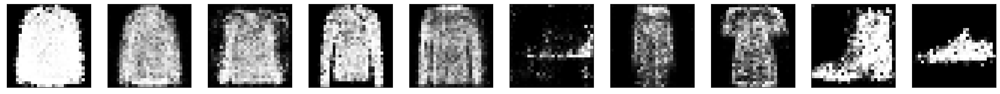

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 7ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:02,  3.75it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:03,  3.63it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


  1%|█                                                                                 | 3/234 [00:00<01:03,  3.63it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:03,  3.64it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:03,  3.62it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  3%|██                                                                                | 6/234 [00:01<01:02,  3.64it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


  3%|██▍                                                                               | 7/234 [00:01<01:03,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


  3%|██▊                                                                               | 8/234 [00:02<01:04,  3.51it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


  4%|███▏                                                                              | 9/234 [00:02<01:03,  3.54it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


  4%|███▍                                                                             | 10/234 [00:02<01:03,  3.54it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

  5%|███▊                                                                             | 11/234 [00:03<01:02,  3.54it/s]

 21
8/8 [==============================] - 0s 7ms/step


  5%|████▏                                                                            | 12/234 [00:03<01:02,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  6%|████▌                                                                            | 13/234 [00:03<01:01,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  6%|████▊                                                                            | 14/234 [00:03<01:00,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


  6%|█████▏                                                                           | 15/234 [00:04<01:00,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

  7%|█████▌                                                                           | 16/234 [00:04<01:00,  3.61it/s]

 21
8/8 [==============================] - 0s 7ms/step


  7%|█████▉                                                                           | 17/234 [00:04<01:00,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


  8%|██████▏                                                                          | 18/234 [00:05<01:00,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


  8%|██████▌                                                                          | 19/234 [00:05<01:00,  3.56it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

  9%|██████▉                                                                          | 20/234 [00:05<01:00,  3.55it/s]

 21
8/8 [==============================] - 0s 7ms/step


  9%|███████▎                                                                         | 21/234 [00:05<01:00,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


  9%|███████▌                                                                         | 22/234 [00:06<00:59,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

 10%|███████▉                                                                         | 23/234 [00:06<01:00,  3.48it/s]

21
8/8 [==============================] - 0s 7ms/step
epoch: 

 10%|████████▎                                                                        | 24/234 [00:06<01:00,  3.49it/s]

 21
8/8 [==============================] - 0s 7ms/step


 11%|████████▋                                                                        | 25/234 [00:07<00:59,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

 11%|█████████                                                                        | 26/234 [00:07<00:59,  3.51it/s]

 21
8/8 [==============================] - 0s 8ms/step


 12%|█████████▎                                                                       | 27/234 [00:07<00:59,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

 12%|█████████▋                                                                       | 28/234 [00:07<00:59,  3.49it/s]

 21
8/8 [==============================] - 0s 8ms/step
epoch:  

 12%|██████████                                                                       | 29/234 [00:08<00:58,  3.48it/s]

21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 13%|██████████▍                                                                      | 30/234 [00:08<00:58,  3.47it/s]

8/8 [==============================] - 0s 8ms/step


 13%|██████████▋                                                                      | 31/234 [00:08<00:58,  3.48it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 14%|███████████                                                                      | 32/234 [00:09<00:58,  3.46it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 14%|███████████▍                                                                     | 33/234 [00:09<00:57,  3.47it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 15%|███████████▊                                                                     | 34/234 [00:09<00:57,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 15%|████████████                                                                     | 35/234 [00:09<00:56,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 15%|████████████▍                                                                    | 36/234 [00:10<00:56,  3.50it/s]

8/8 [==============================] - 0s 8ms/step


 16%|████████████▊                                                                    | 37/234 [00:10<00:56,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

 16%|█████████████▏                                                                   | 38/234 [00:10<00:56,  3.46it/s]

21
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▌                                                                   | 39/234 [00:11<00:56,  3.47it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▊                                                                   | 40/234 [00:11<00:55,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▏                                                                  | 41/234 [00:11<00:54,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▌                                                                  | 42/234 [00:11<00:54,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▉                                                                  | 43/234 [00:12<00:53,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▏                                                                 | 44/234 [00:12<00:53,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▌                                                                 | 45/234 [00:12<00:52,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 20%|███████████████▉                                                                 | 46/234 [00:12<00:52,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 20%|████████████████▎                                                                | 47/234 [00:13<00:52,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  

 21%|████████████████▌                                                                | 48/234 [00:13<00:51,  3.61it/s]

21
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▉                                                                | 49/234 [00:13<00:51,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 21%|█████████████████▎                                                               | 50/234 [00:14<00:51,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 22%|█████████████████▋                                                               | 51/234 [00:14<00:50,  3.62it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 22%|██████████████████                                                               | 52/234 [00:14<00:50,  3.62it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 23%|██████████████████▎                                                              | 53/234 [00:14<00:50,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

 23%|██████████████████▋                                                              | 54/234 [00:15<00:50,  3.53it/s]

21
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████                                                              | 55/234 [00:15<00:50,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████▍                                                             | 56/234 [00:15<00:51,  3.44it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████▋                                                             | 57/234 [00:16<00:51,  3.46it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████                                                             | 58/234 [00:16<00:50,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 25%|████████████████████▍                                                            | 59/234 [00:16<00:49,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch: 

 26%|████████████████████▊                                                            | 60/234 [00:16<00:49,  3.50it/s]

 21
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████                                                            | 61/234 [00:17<00:49,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:17<00:49,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:17<00:48,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:18<00:48,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

 28%|██████████████████████▌                                                          | 65/234 [00:18<00:48,  3.50it/s]

 21
8/8 [==============================] - 0s 7ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:18<00:47,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 29%|███████████████████████▏                                                         | 67/234 [00:18<00:47,  3.50it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  

 29%|███████████████████████▌                                                         | 68/234 [00:19<00:47,  3.48it/s]

21
8/8 [==============================] - 0s 8ms/step
epoch:  

 29%|███████████████████████▉                                                         | 69/234 [00:19<00:47,  3.45it/s]

21
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:19<00:47,  3.48it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:20<00:46,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:20<00:46,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:20<00:45,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:20<00:45,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 32%|█████████████████████████▉                                                       | 75/234 [00:21<00:45,  3.51it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 32%|██████████████████████████▎                                                      | 76/234 [00:21<00:44,  3.52it/s]

21
8/8 [==============================] - 0s 8ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:21<00:44,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 33%|███████████████████████████                                                      | 78/234 [00:22<00:43,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:22<00:43,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 34%|███████████████████████████▋                                                     | 80/234 [00:22<00:43,  3.57it/s]

8/8 [==============================] - 0s 8ms/step


 35%|████████████████████████████                                                     | 81/234 [00:22<00:42,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch: 

 35%|████████████████████████████▍                                                    | 82/234 [00:23<00:42,  3.58it/s]

 21
8/8 [==============================] - 0s 7ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:23<00:41,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:23<00:41,  3.62it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:24<00:41,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:24<00:41,  3.61it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:24<00:40,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:24<00:40,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:25<00:40,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 38%|███████████████████████████████▏                                                 | 90/234 [00:25<00:40,  3.59it/s]

8/8 [==============================] - 0s 7ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:25<00:39,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:25<00:39,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:26<00:39,  3.62it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 40%|████████████████████████████████▌                                                | 94/234 [00:26<00:38,  3.60it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 41%|████████████████████████████████▉                                                | 95/234 [00:26<00:38,  3.59it/s]

21
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:27<00:38,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:27<00:38,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:27<00:38,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:27<00:37,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:28<00:37,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 43%|██████████████████████████████████▌                                             | 101/234 [00:28<00:37,  3.57it/s]

8/8 [==============================] - 0s 8ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:28<00:37,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:29<00:36,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 44%|███████████████████████████████████▌                                            | 104/234 [00:29<00:36,  3.56it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 45%|███████████████████████████████████▉                                            | 105/234 [00:29<00:36,  3.56it/s]

 21
8/8 [==============================] - 0s 7ms/step
epoch: 

 45%|████████████████████████████████████▏                                           | 106/234 [00:29<00:35,  3.58it/s]

 21
8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:30<00:36,  3.48it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:30<00:36,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:30<00:35,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:31<00:34,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  

 47%|█████████████████████████████████████▉                                          | 111/234 [00:31<00:35,  3.50it/s]

21
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:31<00:34,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

 48%|██████████████████████████████████████▋                                         | 113/234 [00:31<00:34,  3.54it/s]

 21
8/8 [==============================] - 0s 7ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:32<00:33,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:32<00:33,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:32<00:32,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  

 50%|████████████████████████████████████████                                        | 117/234 [00:32<00:32,  3.58it/s]

21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 50%|████████████████████████████████████████▎                                       | 118/234 [00:33<00:32,  3.56it/s]

8/8 [==============================] - 0s 7ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:33<00:32,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:33<00:31,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:34<00:31,  3.60it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:34<00:31,  3.60it/s]

21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 53%|██████████████████████████████████████████                                      | 123/234 [00:34<00:31,  3.57it/s]

8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:34<00:30,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

 53%|██████████████████████████████████████████▋                                     | 125/234 [00:35<00:30,  3.57it/s]

21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 54%|███████████████████████████████████████████                                     | 126/234 [00:35<00:30,  3.56it/s]

8/8 [==============================] - 0s 7ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:35<00:30,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:36<00:29,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:36<00:29,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:36<00:29,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:36<00:28,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:37<00:28,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:37<00:28,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:37<00:27,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:38<00:27,  3.59it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:38<00:27,  3.58it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:38<00:27,  3.57it/s]

21
8/8 [==============================] - 0s 7ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:38<00:26,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:39<00:26,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:39<00:26,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:39<00:26,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:39<00:25,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:40<00:25,  3.55it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:40<00:25,  3.55it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:40<00:25,  3.54it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:41<00:24,  3.55it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:41<00:24,  3.55it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:41<00:24,  3.48it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:41<00:24,  3.52it/s]

 21
8/8 [==============================] - 0s 8ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:42<00:23,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:42<00:23,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:42<00:23,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:43<00:22,  3.54it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:43<00:22,  3.51it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:43<00:22,  3.54it/s]

 21
8/8 [==============================] - 0s 7ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:43<00:22,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:44<00:21,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:44<00:21,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:44<00:21,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:45<00:21,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 69%|███████████████████████████████████████████████████████                         | 161/234 [00:45<00:21,  3.44it/s]

21
8/8 [==============================] - 0s 7ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:45<00:20,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:45<00:20,  3.50it/s]

8/8 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:46<00:19,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:46<00:19,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:46<00:19,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:47<00:18,  3.53it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:47<00:18,  3.52it/s]

 21
8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:47<00:18,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:47<00:18,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:48<00:17,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:48<00:17,  3.51it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:48<00:17,  3.52it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:49<00:17,  3.53it/s]

21
8/8 [==============================] - 0s 8ms/step
epoch: 

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:49<00:16,  3.53it/s]

 21
8/8 [==============================] - 0s 7ms/step
epoch: 

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:49<00:16,  3.56it/s]

 21
8/8 [==============================] - 0s 8ms/step
epoch:  

 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:49<00:16,  3.56it/s]

21
8/8 [==============================] - 0s 7ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:50<00:15,  3.58it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:50<00:15,  3.57it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:50<00:15,  3.56it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:51<00:14,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:51<00:14,  3.54it/s]

8/8 [==============================] - 0s 8ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:51<00:14,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:51<00:14,  3.52it/s]

21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:52<00:13,  3.50it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:52<00:13,  3.52it/s]

21
8/8 [==============================] - 0s 7ms/step
epoch: 

 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:52<00:13,  3.54it/s]

 21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:53<00:13,  3.53it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:53<00:12,  3.53it/s]

21
8/8 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:53<00:12,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:53<00:12,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:54<00:12,  3.40it/s]

8/8 [==============================] - 0s 7ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:54<00:11,  3.44it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:54<00:11,  3.47it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:55<00:11,  3.48it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:55<00:10,  3.49it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:55<00:10,  3.49it/s]

8/8 [==============================] - 0s 8ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:55<00:10,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:56<00:10,  3.49it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  21


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:56<00:09,  3.50it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:56<00:09,  3.52it/s]

 21
8/8 [==============================] - 0s 7ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:57<00:09,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:57<00:08,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:57<00:08,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch: 

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:57<00:08,  3.55it/s]

 21
8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:58<00:07,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:58<00:07,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [00:58<00:07,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch: 

 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [00:59<00:07,  3.52it/s]

 21
8/8 [==============================] - 0s 8ms/step
epoch: 

 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [00:59<00:06,  3.52it/s]

 21
8/8 [==============================] - 0s 8ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [00:59<00:06,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [00:59<00:06,  3.55it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:00<00:06,  3.45it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:00<00:05,  3.48it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:00<00:05,  3.49it/s]

21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:01<00:05,  3.50it/s]

8/8 [==============================] - 0s 8ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:01<00:04,  3.49it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:01<00:04,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:01<00:04,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:02<00:03,  3.53it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:02<00:03,  3.49it/s]

8/8 [==============================] - 0s 7ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:02<00:03,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step
epoch:  21


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:03<00:03,  3.49it/s]

8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:03<00:02,  3.48it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:03<00:02,  3.50it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:03<00:02,  3.49it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:04<00:01,  3.52it/s]

 21
8/8 [==============================] - 0s 8ms/step
epoch:  21


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:04<00:01,  3.53it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:04<00:01,  3.53it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  21


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:05<00:01,  3.52it/s]

8/8 [==============================] - 0s 7ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:05<00:00,  3.51it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:05<00:00,  3.52it/s]

epoch:  21
8/8 [==============================] - 0s 7ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:05<00:00,  3.54it/s]

epoch:  21
8/8 [==============================] - 0s 8ms/step
epoch:  

100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:06<00:00,  3.54it/s]


21


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  22


  0%|▎                                                                                 | 1/234 [00:00<01:06,  3.52it/s]

8/8 [==============================] - 0s 8ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:05,  3.55it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:00<01:05,  3.54it/s]

 22
8/8 [==============================] - 0s 8ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:05,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:04,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


  3%|██                                                                                | 6/234 [00:01<01:05,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


  3%|██▍                                                                               | 7/234 [00:01<01:04,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:04,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  4%|███▏                                                                              | 9/234 [00:02<01:03,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


  4%|███▍                                                                             | 10/234 [00:02<01:03,  3.51it/s]

8/8 [==============================] - 0s 8ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:03,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


  5%|████▏                                                                            | 12/234 [00:03<01:02,  3.53it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  22


  6%|████▌                                                                            | 13/234 [00:03<01:02,  3.54it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


  6%|████▊                                                                            | 14/234 [00:03<01:02,  3.55it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|█████▏                                                                           | 15/234 [00:04<01:01,  3.54it/s]

22
8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:04<01:01,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  7%|█████▉                                                                           | 17/234 [00:04<01:01,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


  8%|██████▏                                                                          | 18/234 [00:05<01:01,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


  8%|██████▌                                                                          | 19/234 [00:05<01:01,  3.52it/s]

8/8 [==============================] - 0s 7ms/step


  9%|██████▉                                                                          | 20/234 [00:05<01:00,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:05<01:00,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


  9%|███████▌                                                                         | 22/234 [00:06<00:59,  3.56it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 10%|███████▉                                                                         | 23/234 [00:06<01:00,  3.50it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 10%|████████▎                                                                        | 24/234 [00:06<01:00,  3.49it/s]

8/8 [==============================] - 0s 8ms/step


 11%|████████▋                                                                        | 25/234 [00:07<00:59,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 11%|█████████                                                                        | 26/234 [00:07<00:59,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 12%|█████████▎                                                                       | 27/234 [00:07<00:59,  3.50it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 12%|█████████▋                                                                       | 28/234 [00:07<00:58,  3.50it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:08<00:58,  3.53it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 13%|██████████▍                                                                      | 30/234 [00:08<00:57,  3.54it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 13%|██████████▋                                                                      | 31/234 [00:08<00:57,  3.52it/s]

22
8/8 [==============================] - 0s 8ms/step


 14%|███████████                                                                      | 32/234 [00:09<00:57,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 14%|███████████▍                                                                     | 33/234 [00:09<00:57,  3.51it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 15%|███████████▊                                                                     | 34/234 [00:09<00:56,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 15%|████████████                                                                     | 35/234 [00:09<00:58,  3.41it/s]

22
8/8 [==============================] - 0s 7ms/step
epoch: 

 15%|████████████▍                                                                    | 36/234 [00:10<00:57,  3.46it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 16%|████████████▊                                                                    | 37/234 [00:10<00:56,  3.46it/s]

8/8 [==============================] - 0s 8ms/step


 16%|█████████████▏                                                                   | 38/234 [00:10<00:56,  3.48it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 17%|█████████████▌                                                                   | 39/234 [00:11<00:55,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 17%|█████████████▊                                                                   | 40/234 [00:11<00:55,  3.49it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 18%|██████████████▏                                                                  | 41/234 [00:11<00:55,  3.49it/s]

 22
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▌                                                                  | 42/234 [00:11<00:54,  3.50it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 18%|██████████████▉                                                                  | 43/234 [00:12<00:54,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▏                                                                 | 44/234 [00:12<00:53,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▌                                                                 | 45/234 [00:12<00:53,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 20%|███████████████▉                                                                 | 46/234 [00:13<00:53,  3.51it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 20%|████████████████▎                                                                | 47/234 [00:13<00:53,  3.51it/s]

 22
8/8 [==============================] - 0s 7ms/step


 21%|████████████████▌                                                                | 48/234 [00:13<00:52,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:13<00:52,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 21%|█████████████████▎                                                               | 50/234 [00:14<00:51,  3.55it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step
epoch:  22


 22%|█████████████████▋                                                               | 51/234 [00:14<00:51,  3.55it/s]

8/8 [==============================] - 0s 8ms/step


 22%|██████████████████                                                               | 52/234 [00:14<00:51,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▎                                                              | 53/234 [00:15<00:51,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 23%|██████████████████▋                                                              | 54/234 [00:15<00:51,  3.49it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  22


 24%|███████████████████                                                              | 55/234 [00:15<00:51,  3.49it/s]

8/8 [==============================] - 0s 8ms/step


 24%|███████████████████▍                                                             | 56/234 [00:15<00:50,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 24%|███████████████████▋                                                             | 57/234 [00:16<00:49,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 25%|████████████████████                                                             | 58/234 [00:16<00:49,  3.55it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 25%|████████████████████▍                                                            | 59/234 [00:16<00:50,  3.48it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 26%|████████████████████▊                                                            | 60/234 [00:17<00:50,  3.46it/s]

22
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████                                                            | 61/234 [00:17<00:49,  3.47it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:17<00:49,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:17<00:48,  3.51it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 27%|██████████████████████▏                                                          | 64/234 [00:18<00:48,  3.51it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 28%|██████████████████████▌                                                          | 65/234 [00:18<00:48,  3.51it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch: 

 28%|██████████████████████▊                                                          | 66/234 [00:18<00:47,  3.52it/s]

 22
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:19<00:47,  3.51it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:19<00:47,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:19<00:46,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:19<00:46,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:20<00:46,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 31%|████████████████████████▉                                                        | 72/234 [00:20<00:45,  3.53it/s]

22
8/8 [==============================] - 0s 8ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:20<00:45,  3.50it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:21<00:45,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:21<00:45,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:21<00:44,  3.54it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:21<00:44,  3.55it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 33%|███████████████████████████                                                      | 78/234 [00:22<00:43,  3.56it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:22<00:43,  3.56it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:22<00:43,  3.55it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 35%|████████████████████████████                                                     | 81/234 [00:23<00:43,  3.53it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 35%|████████████████████████████▍                                                    | 82/234 [00:23<00:43,  3.51it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch: 

 35%|████████████████████████████▋                                                    | 83/234 [00:23<00:42,  3.53it/s]

 22
8/8 [==============================] - 0s 7ms/step
epoch:  22


 36%|█████████████████████████████                                                    | 84/234 [00:23<00:42,  3.53it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 36%|█████████████████████████████▍                                                   | 85/234 [00:24<00:41,  3.55it/s]

 22
8/8 [==============================] - 0s 7ms/step
epoch:  

 37%|█████████████████████████████▊                                                   | 86/234 [00:24<00:41,  3.55it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 37%|██████████████████████████████                                                   | 87/234 [00:24<00:41,  3.54it/s]

8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:25<00:41,  3.52it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 38%|██████████████████████████████▊                                                  | 89/234 [00:25<00:41,  3.51it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 38%|███████████████████████████████▏                                                 | 90/234 [00:25<00:40,  3.53it/s]

8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:25<00:41,  3.41it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:26<00:41,  3.43it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:26<00:40,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:26<00:40,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 41%|████████████████████████████████▉                                                | 95/234 [00:27<00:40,  3.45it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 41%|█████████████████████████████████▏                                               | 96/234 [00:27<00:40,  3.45it/s]

22
8/8 [==============================] - 0s 8ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:27<00:39,  3.48it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:27<00:39,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:28<00:40,  3.35it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:28<00:40,  3.28it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 43%|██████████████████████████████████▌                                             | 101/234 [00:28<00:40,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 44%|██████████████████████████████████▊                                             | 102/234 [00:29<00:40,  3.25it/s]

22
8/8 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:29<00:40,  3.25it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 44%|███████████████████████████████████▌                                            | 104/234 [00:29<00:39,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:30<00:39,  3.25it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 45%|████████████████████████████████████▏                                           | 106/234 [00:30<00:39,  3.21it/s]

8/8 [==============================] - 0s 7ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:30<00:38,  3.28it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 46%|████████████████████████████████████▉                                           | 108/234 [00:30<00:37,  3.33it/s]

22
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:31<00:36,  3.38it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:31<00:36,  3.42it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:31<00:35,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 48%|██████████████████████████████████████▎                                         | 112/234 [00:32<00:35,  3.48it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 48%|██████████████████████████████████████▋                                         | 113/234 [00:32<00:34,  3.49it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 49%|██████████████████████████████████████▉                                         | 114/234 [00:32<00:34,  3.49it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 49%|███████████████████████████████████████▎                                        | 115/234 [00:32<00:34,  3.49it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 50%|███████████████████████████████████████▋                                        | 116/234 [00:33<00:33,  3.49it/s]

22
8/8 [==============================] - 0s 7ms/step
epoch: 

 50%|████████████████████████████████████████                                        | 117/234 [00:33<00:33,  3.49it/s]

 22
8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:33<00:33,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:34<00:33,  3.47it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:34<00:32,  3.49it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:34<00:32,  3.47it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:34<00:32,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 53%|██████████████████████████████████████████                                      | 123/234 [00:35<00:32,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:35<00:31,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:35<00:31,  3.48it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 54%|███████████████████████████████████████████                                     | 126/234 [00:36<00:30,  3.49it/s]

 22
8/8 [==============================] - 0s 8ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:36<00:30,  3.50it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:36<00:30,  3.48it/s]

8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:37<00:30,  3.47it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step
epoch:  22


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:37<00:30,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:37<00:30,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:37<00:29,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:38<00:29,  3.47it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:38<00:28,  3.48it/s]

8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:38<00:28,  3.48it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:39<00:28,  3.44it/s]

8/8 [==============================] - 0s 7ms/step
epoch: 

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:39<00:28,  3.46it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  

 59%|███████████████████████████████████████████████▏                                | 138/234 [00:39<00:27,  3.47it/s]

22
8/8 [==============================] - 0s 7ms/step
epoch:  22


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:39<00:27,  3.47it/s]

8/8 [==============================] - 0s 8ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:40<00:27,  3.45it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:40<00:27,  3.36it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:40<00:27,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:41<00:26,  3.40it/s]

22
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:41<00:26,  3.42it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:41<00:25,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:41<00:25,  3.43it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:42<00:25,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:42<00:24,  3.48it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:42<00:24,  3.47it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:43<00:24,  3.47it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:43<00:23,  3.46it/s]

8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:43<00:23,  3.47it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:43<00:23,  3.48it/s]

8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:44<00:23,  3.48it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:44<00:22,  3.47it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch: 

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:44<00:22,  3.47it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:45<00:22,  3.46it/s]

8/8 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:45<00:21,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:45<00:21,  3.46it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:45<00:21,  3.45it/s]

8/8 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:46<00:21,  3.46it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step
epoch: 

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:46<00:20,  3.47it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  

 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:46<00:20,  3.46it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:47<00:20,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:47<00:20,  3.44it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:47<00:19,  3.40it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:48<00:19,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:48<00:19,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:48<00:18,  3.43it/s]

22
8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:48<00:18,  3.43it/s]

epoch:  22
8/8 [==============================] - 0s 7ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:49<00:18,  3.45it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:49<00:17,  3.45it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:49<00:17,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:50<00:17,  3.44it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:50<00:17,  3.45it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:50<00:16,  3.42it/s]

22
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:50<00:16,  3.42it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:51<00:16,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:51<00:16,  3.42it/s]

8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:51<00:15,  3.44it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:52<00:15,  3.46it/s]

8/8 [==============================] - 0s 8ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:52<00:15,  3.45it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:52<00:14,  3.45it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:52<00:14,  3.42it/s]

22
8/8 [==============================] - 0s 8ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:53<00:14,  3.43it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:53<00:13,  3.44it/s]

8/8 [==============================] - 0s 8ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:53<00:13,  3.45it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:54<00:13,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:54<00:13,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:54<00:12,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:55<00:12,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:55<00:12,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:55<00:11,  3.43it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  

 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:55<00:11,  3.42it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:56<00:11,  3.44it/s]

8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:56<00:11,  3.32it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:56<00:11,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:57<00:10,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:57<00:10,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:57<00:09,  3.41it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:57<00:09,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [00:58<00:09,  3.38it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  22


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [00:58<00:09,  3.40it/s]

8/8 [==============================] - 0s 8ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [00:58<00:08,  3.41it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [00:59<00:08,  3.41it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [00:59<00:08,  3.41it/s]

8/8 [==============================] - 0s 8ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [00:59<00:07,  3.43it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:00<00:07,  3.43it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:00<00:07,  3.43it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:00<00:06,  3.43it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:00<00:06,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:01<00:06,  3.43it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:01<00:06,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:01<00:05,  3.43it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:02<00:05,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:02<00:05,  3.44it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:02<00:04,  3.44it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:02<00:04,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:03<00:04,  3.42it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:03<00:04,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:03<00:03,  3.44it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:04<00:03,  3.45it/s]

22
8/8 [==============================] - 0s 8ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:04<00:03,  3.45it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  

 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:04<00:02,  3.44it/s]

22
8/8 [==============================] - 0s 8ms/step
epoch:  22


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:04<00:02,  3.43it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:05<00:02,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:05<00:02,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:05<00:01,  3.42it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  22


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:06<00:01,  3.43it/s]

8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:06<00:01,  3.44it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch: 

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:06<00:00,  3.40it/s]

 22
8/8 [==============================] - 0s 8ms/step
epoch: 

 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:07<00:00,  3.41it/s]

 22
8/8 [==============================] - 0s 8ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:07<00:00,  3.40it/s]

epoch:  22
8/8 [==============================] - 0s 8ms/step
epoch:  22


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


  0%|▎                                                                                 | 1/234 [00:00<01:08,  3.42it/s]

8/8 [==============================] - 0s 8ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:08,  3.41it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step


  1%|█                                                                                 | 3/234 [00:00<01:08,  3.35it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

  2%|█▍                                                                                | 4/234 [00:01<01:08,  3.36it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


  2%|█▊                                                                                | 5/234 [00:01<01:07,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  3%|██                                                                                | 6/234 [00:01<01:07,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:06,  3.40it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


  3%|██▊                                                                               | 8/234 [00:02<01:06,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


  4%|███▏                                                                              | 9/234 [00:02<01:05,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


  4%|███▍                                                                             | 10/234 [00:02<01:05,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


  5%|███▊                                                                             | 11/234 [00:03<01:05,  3.39it/s]

8/8 [==============================] - 0s 8ms/step


  5%|████▏                                                                            | 12/234 [00:03<01:05,  3.39it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|████▌                                                                            | 13/234 [00:03<01:05,  3.39it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|████▊                                                                            | 14/234 [00:04<01:04,  3.40it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|█████▏                                                                           | 15/234 [00:04<01:04,  3.41it/s]

23
8/8 [==============================] - 0s 8ms/step


  7%|█████▌                                                                           | 16/234 [00:04<01:03,  3.41it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

  7%|█████▉                                                                           | 17/234 [00:05<01:03,  3.41it/s]

23
8/8 [==============================] - 0s 12ms/step
epoch: 

  8%|██████▏                                                                          | 18/234 [00:05<01:05,  3.30it/s]

 23
8/8 [==============================] - 0s 8ms/step
epoch:  23


  8%|██████▌                                                                          | 19/234 [00:05<01:05,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  9%|██████▉                                                                          | 20/234 [00:05<01:04,  3.30it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

  9%|███████▎                                                                         | 21/234 [00:06<01:03,  3.33it/s]

23
8/8 [==============================] - 0s 8ms/step


  9%|███████▌                                                                         | 22/234 [00:06<01:03,  3.36it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 10%|███████▉                                                                         | 23/234 [00:06<01:02,  3.38it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 10%|████████▎                                                                        | 24/234 [00:07<01:02,  3.38it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 11%|████████▋                                                                        | 25/234 [00:07<01:01,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 11%|█████████                                                                        | 26/234 [00:07<01:01,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 12%|█████████▎                                                                       | 27/234 [00:08<01:01,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 12%|█████████▋                                                                       | 28/234 [00:08<01:01,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 12%|██████████                                                                       | 29/234 [00:08<01:00,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 13%|██████████▍                                                                      | 30/234 [00:08<00:59,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 13%|██████████▋                                                                      | 31/234 [00:09<00:59,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 14%|███████████                                                                      | 32/234 [00:09<00:59,  3.39it/s]

 23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 14%|███████████▍                                                                     | 33/234 [00:09<00:59,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 15%|███████████▊                                                                     | 34/234 [00:10<00:58,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 15%|████████████                                                                     | 35/234 [00:10<00:58,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 15%|████████████▍                                                                    | 36/234 [00:10<00:58,  3.41it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 16%|████████████▊                                                                    | 37/234 [00:10<00:57,  3.41it/s]

23
8/8 [==============================] - 0s 8ms/step


 16%|█████████████▏                                                                   | 38/234 [00:11<00:58,  3.35it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 17%|█████████████▌                                                                   | 39/234 [00:11<00:58,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 17%|█████████████▊                                                                   | 40/234 [00:11<00:57,  3.38it/s]

23
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▏                                                                  | 41/234 [00:12<00:56,  3.39it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 18%|██████████████▌                                                                  | 42/234 [00:12<00:56,  3.40it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 18%|██████████████▉                                                                  | 43/234 [00:12<00:56,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 19%|███████████████▏                                                                 | 44/234 [00:13<00:55,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 19%|███████████████▌                                                                 | 45/234 [00:13<00:55,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 20%|███████████████▉                                                                 | 46/234 [00:13<00:55,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 20%|████████████████▎                                                                | 47/234 [00:13<00:55,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 21%|████████████████▌                                                                | 48/234 [00:14<00:54,  3.39it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 21%|████████████████▉                                                                | 49/234 [00:14<00:54,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 21%|█████████████████▎                                                               | 50/234 [00:14<00:53,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 22%|█████████████████▋                                                               | 51/234 [00:15<00:53,  3.41it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 22%|██████████████████                                                               | 52/234 [00:15<00:53,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 23%|██████████████████▎                                                              | 53/234 [00:15<00:53,  3.39it/s]

8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▋                                                              | 54/234 [00:15<00:53,  3.39it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 24%|███████████████████                                                              | 55/234 [00:16<00:52,  3.40it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 24%|███████████████████▍                                                             | 56/234 [00:16<00:52,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 24%|███████████████████▋                                                             | 57/234 [00:16<00:51,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 25%|████████████████████                                                             | 58/234 [00:17<00:51,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 25%|████████████████████▍                                                            | 59/234 [00:17<00:51,  3.40it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 26%|████████████████████▊                                                            | 60/234 [00:17<00:51,  3.40it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 26%|█████████████████████                                                            | 61/234 [00:18<00:50,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 26%|█████████████████████▍                                                           | 62/234 [00:18<00:50,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 27%|█████████████████████▊                                                           | 63/234 [00:18<00:49,  3.42it/s]

8/8 [==============================] - 0s 8ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:18<00:50,  3.40it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 28%|██████████████████████▌                                                          | 65/234 [00:19<00:50,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch: 

 28%|██████████████████████▊                                                          | 66/234 [00:19<00:49,  3.38it/s]

 23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 29%|███████████████████████▏                                                         | 67/234 [00:19<00:49,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 29%|███████████████████████▌                                                         | 68/234 [00:20<00:49,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 29%|███████████████████████▉                                                         | 69/234 [00:20<00:48,  3.40it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 30%|████████████████████████▏                                                        | 70/234 [00:20<00:48,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 30%|████████████████████████▌                                                        | 71/234 [00:20<00:47,  3.41it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 31%|████████████████████████▉                                                        | 72/234 [00:21<00:47,  3.41it/s]

8/8 [==============================] - 0s 12ms/step
epoch: 

 31%|█████████████████████████▎                                                       | 73/234 [00:21<00:49,  3.25it/s]

 23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 32%|█████████████████████████▌                                                       | 74/234 [00:21<00:49,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 32%|█████████████████████████▉                                                       | 75/234 [00:22<00:48,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 32%|██████████████████████████▎                                                      | 76/234 [00:22<00:47,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 33%|██████████████████████████▋                                                      | 77/234 [00:22<00:46,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 33%|███████████████████████████                                                      | 78/234 [00:23<00:46,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 34%|███████████████████████████▎                                                     | 79/234 [00:23<00:46,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 34%|███████████████████████████▋                                                     | 80/234 [00:23<00:45,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 35%|████████████████████████████                                                     | 81/234 [00:23<00:45,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 35%|████████████████████████████▍                                                    | 82/234 [00:24<00:44,  3.38it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 35%|████████████████████████████▋                                                    | 83/234 [00:24<00:44,  3.38it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 36%|█████████████████████████████                                                    | 84/234 [00:24<00:44,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 36%|█████████████████████████████▍                                                   | 85/234 [00:25<00:43,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 37%|█████████████████████████████▊                                                   | 86/234 [00:25<00:43,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 37%|██████████████████████████████                                                   | 87/234 [00:25<00:43,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 38%|██████████████████████████████▍                                                  | 88/234 [00:26<00:43,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 38%|██████████████████████████████▊                                                  | 89/234 [00:26<00:43,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 38%|███████████████████████████████▏                                                 | 90/234 [00:26<00:42,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 39%|███████████████████████████████▌                                                 | 91/234 [00:26<00:42,  3.39it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 39%|███████████████████████████████▊                                                 | 92/234 [00:27<00:42,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 40%|████████████████████████████████▏                                                | 93/234 [00:27<00:41,  3.36it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 40%|████████████████████████████████▌                                                | 94/234 [00:27<00:42,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 41%|████████████████████████████████▉                                                | 95/234 [00:28<00:41,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 41%|█████████████████████████████████▏                                               | 96/234 [00:28<00:41,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 41%|█████████████████████████████████▌                                               | 97/234 [00:28<00:40,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 42%|█████████████████████████████████▉                                               | 98/234 [00:29<00:41,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 42%|██████████████████████████████████▎                                              | 99/234 [00:29<00:41,  3.26it/s]

23
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:29<00:41,  3.26it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 43%|██████████████████████████████████▌                                             | 101/234 [00:29<00:41,  3.24it/s]

8/8 [==============================] - 0s 8ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:30<00:40,  3.24it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 44%|███████████████████████████████████▏                                            | 103/234 [00:30<00:40,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 44%|███████████████████████████████████▌                                            | 104/234 [00:30<00:39,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 45%|███████████████████████████████████▉                                            | 105/234 [00:31<00:39,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 45%|████████████████████████████████████▏                                           | 106/234 [00:31<00:39,  3.28it/s]

8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:31<00:39,  3.23it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 46%|████████████████████████████████████▉                                           | 108/234 [00:32<00:39,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 47%|█████████████████████████████████████▎                                          | 109/234 [00:32<00:38,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 47%|█████████████████████████████████████▌                                          | 110/234 [00:32<00:38,  3.25it/s]

8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:33<00:37,  3.27it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:33<00:37,  3.28it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:33<00:36,  3.28it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:33<00:36,  3.27it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 49%|███████████████████████████████████████▎                                        | 115/234 [00:34<00:36,  3.29it/s]

8/8 [==============================] - 0s 8ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:34<00:35,  3.30it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 50%|████████████████████████████████████████                                        | 117/234 [00:34<00:35,  3.31it/s]

8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:35<00:35,  3.26it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:35<00:35,  3.26it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 51%|█████████████████████████████████████████                                       | 120/234 [00:35<00:34,  3.28it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:36<00:34,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:36<00:33,  3.33it/s]

8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:36<00:34,  3.23it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:36<00:33,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:37<00:32,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 54%|███████████████████████████████████████████                                     | 126/234 [00:37<00:32,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:37<00:32,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:38<00:31,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 55%|████████████████████████████████████████████                                    | 129/234 [00:38<00:31,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:38<00:30,  3.37it/s]

8/8 [==============================] - 0s 7ms/step
epoch:  

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:39<00:30,  3.39it/s]

23
8/8 [==============================] - 0s 8ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:39<00:30,  3.39it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:39<00:29,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:39<00:29,  3.39it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:40<00:29,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:40<00:28,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:40<00:28,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:41<00:28,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 59%|███████████████████████████████████████████████▌                                | 139/234 [00:41<00:28,  3.37it/s]

 23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:41<00:27,  3.37it/s]

8/8 [==============================] - 0s 8ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:42<00:27,  3.35it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:42<00:27,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:42<00:27,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:42<00:26,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:43<00:26,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:43<00:26,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:43<00:25,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:44<00:25,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:44<00:25,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:44<00:24,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:44<00:24,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:45<00:24,  3.36it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  23


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:45<00:24,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:45<00:23,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:46<00:23,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:46<00:23,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:46<00:22,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:47<00:22,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:47<00:22,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:47<00:22,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:47<00:21,  3.34it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:48<00:21,  3.34it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:48<00:21,  3.33it/s]

23
8/8 [==============================] - 0s 8ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:48<00:21,  3.33it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  

 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:49<00:20,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:49<00:20,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:49<00:20,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:50<00:19,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:50<00:19,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:50<00:19,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:50<00:18,  3.37it/s]

23
8/8 [==============================] - 0s 7ms/step
epoch:  

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:51<00:18,  3.37it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:51<00:18,  3.35it/s]

8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:51<00:17,  3.35it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:52<00:17,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:52<00:17,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:52<00:17,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:53<00:16,  3.34it/s]

8/8 [==============================] - 0s 8ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:53<00:17,  3.23it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:53<00:16,  3.24it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:54<00:16,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:54<00:15,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:54<00:15,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:54<00:15,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:55<00:14,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:55<00:14,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:55<00:14,  3.35it/s]

8/8 [==============================] - 0s 8ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:56<00:13,  3.33it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:56<00:13,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:56<00:13,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:56<00:12,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:57<00:12,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:57<00:12,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:57<00:11,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:58<00:11,  3.36it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:58<00:11,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [00:58<00:10,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [00:59<00:10,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [00:59<00:10,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [00:59<00:10,  3.34it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [00:59<00:09,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:00<00:09,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:00<00:09,  3.36it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:00<00:08,  3.38it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:01<00:08,  3.37it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:01<00:08,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:01<00:08,  3.35it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:02<00:07,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:02<00:07,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:02<00:07,  3.20it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:03<00:07,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:03<00:06,  3.25it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:03<00:06,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:03<00:06,  3.29it/s]

8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:04<00:05,  3.29it/s]

epoch:  23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:04<00:05,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:04<00:05,  3.32it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:05<00:04,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:05<00:04,  3.32it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:05<00:04,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:06<00:03,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:06<00:03,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:06<00:03,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:06<00:02,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:07<00:02,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:07<00:02,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:07<00:02,  3.29it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:08<00:01,  3.30it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  

 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:08<00:01,  3.32it/s]

23
8/8 [==============================] - 0s 8ms/step
epoch:  23


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:08<00:01,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:09<00:00,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:09<00:00,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:09<00:00,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  23


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 11ms/step
epoch: 

  0%|▎                                                                                 | 1/234 [00:00<01:16,  3.05it/s]

 24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  1%|▋                                                                                 | 2/234 [00:00<01:14,  3.13it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

  1%|█                                                                                 | 3/234 [00:01<01:29,  2.57it/s]

 24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  2%|█▍                                                                                | 4/234 [00:01<01:20,  2.85it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  2%|█▊                                                                                | 5/234 [00:01<01:16,  2.99it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  3%|██                                                                                | 6/234 [00:02<01:13,  3.11it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  3%|██▍                                                                               | 7/234 [00:02<01:11,  3.18it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  3%|██▊                                                                               | 8/234 [00:02<01:09,  3.24it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  4%|███▏                                                                              | 9/234 [00:02<01:08,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  4%|███▍                                                                             | 10/234 [00:03<01:08,  3.25it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

  5%|███▊                                                                             | 11/234 [00:03<01:08,  3.27it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

  5%|████▏                                                                            | 12/234 [00:03<01:07,  3.28it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  6%|████▌                                                                            | 13/234 [00:04<01:06,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

  6%|████▊                                                                            | 14/234 [00:04<01:06,  3.32it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


  6%|█████▏                                                                           | 15/234 [00:04<01:05,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  7%|█████▌                                                                           | 16/234 [00:05<01:05,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  7%|█████▉                                                                           | 17/234 [00:05<01:04,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  8%|██████▏                                                                          | 18/234 [00:05<01:04,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  8%|██████▌                                                                          | 19/234 [00:05<01:04,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  9%|██████▉                                                                          | 20/234 [00:06<01:04,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  9%|███████▎                                                                         | 21/234 [00:06<01:04,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


  9%|███████▌                                                                         | 22/234 [00:06<01:03,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 10%|███████▉                                                                         | 23/234 [00:07<01:02,  3.37it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 10%|████████▎                                                                        | 24/234 [00:07<01:02,  3.37it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 11%|████████▋                                                                        | 25/234 [00:07<01:02,  3.36it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 11%|█████████                                                                        | 26/234 [00:07<01:02,  3.34it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 12%|█████████▎                                                                       | 27/234 [00:08<01:01,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 12%|█████████▋                                                                       | 28/234 [00:08<01:01,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 12%|██████████                                                                       | 29/234 [00:08<01:01,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 13%|██████████▍                                                                      | 30/234 [00:09<01:00,  3.35it/s]

24
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:09<01:00,  3.33it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 14%|███████████                                                                      | 32/234 [00:09<01:00,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 14%|███████████▍                                                                     | 33/234 [00:10<01:00,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 15%|███████████▊                                                                     | 34/234 [00:10<00:59,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 15%|████████████                                                                     | 35/234 [00:10<00:59,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 15%|████████████▍                                                                    | 36/234 [00:10<00:58,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 16%|████████████▊                                                                    | 37/234 [00:11<00:58,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 16%|█████████████▏                                                                   | 38/234 [00:11<00:58,  3.35it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 17%|█████████████▌                                                                   | 39/234 [00:11<00:58,  3.35it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 17%|█████████████▊                                                                   | 40/234 [00:12<00:57,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 18%|██████████████▏                                                                  | 41/234 [00:12<00:57,  3.35it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 18%|██████████████▌                                                                  | 42/234 [00:12<00:57,  3.35it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 18%|██████████████▉                                                                  | 43/234 [00:13<00:56,  3.36it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 19%|███████████████▏                                                                 | 44/234 [00:13<00:56,  3.34it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  24


 19%|███████████████▌                                                                 | 45/234 [00:13<00:57,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 20%|███████████████▉                                                                 | 46/234 [00:14<00:57,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 20%|████████████████▎                                                                | 47/234 [00:14<00:56,  3.29it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 21%|████████████████▌                                                                | 48/234 [00:14<00:56,  3.31it/s]

8/8 [==============================] - 0s 8ms/step


 21%|████████████████▉                                                                | 49/234 [00:14<00:55,  3.32it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 21%|█████████████████▎                                                               | 50/234 [00:15<00:55,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 22%|█████████████████▋                                                               | 51/234 [00:15<00:54,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 22%|██████████████████                                                               | 52/234 [00:15<00:54,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 23%|██████████████████▎                                                              | 53/234 [00:16<00:54,  3.33it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 23%|██████████████████▋                                                              | 54/234 [00:16<00:54,  3.32it/s]

8/8 [==============================] - 0s 8ms/step


 24%|███████████████████                                                              | 55/234 [00:16<00:55,  3.24it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 24%|███████████████████▍                                                             | 56/234 [00:17<00:54,  3.26it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 24%|███████████████████▋                                                             | 57/234 [00:17<00:53,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 25%|████████████████████                                                             | 58/234 [00:17<00:53,  3.30it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 25%|████████████████████▍                                                            | 59/234 [00:17<00:53,  3.27it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 26%|████████████████████▊                                                            | 60/234 [00:18<00:53,  3.27it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 26%|█████████████████████                                                            | 61/234 [00:18<00:52,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 26%|█████████████████████▍                                                           | 62/234 [00:18<00:52,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 27%|█████████████████████▊                                                           | 63/234 [00:19<00:51,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 27%|██████████████████████▏                                                          | 64/234 [00:19<00:51,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 28%|██████████████████████▌                                                          | 65/234 [00:19<00:51,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 28%|██████████████████████▊                                                          | 66/234 [00:20<00:50,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 29%|███████████████████████▏                                                         | 67/234 [00:20<00:50,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 29%|███████████████████████▌                                                         | 68/234 [00:20<00:50,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 29%|███████████████████████▉                                                         | 69/234 [00:20<00:49,  3.33it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch: 

 30%|████████████████████████▏                                                        | 70/234 [00:21<00:49,  3.33it/s]

 24
8/8 [==============================] - 0s 8ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:21<00:49,  3.28it/s]

epoch:  24
8/8 [==============================] - 0s 7ms/step
epoch:  24


 31%|████████████████████████▉                                                        | 72/234 [00:21<00:49,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 31%|█████████████████████████▎                                                       | 73/234 [00:22<00:48,  3.30it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 32%|█████████████████████████▌                                                       | 74/234 [00:22<00:48,  3.28it/s]

8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:22<00:48,  3.27it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 32%|██████████████████████████▎                                                      | 76/234 [00:23<00:47,  3.30it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 33%|██████████████████████████▋                                                      | 77/234 [00:23<00:47,  3.31it/s]

8/8 [==============================] - 0s 8ms/step


 33%|███████████████████████████                                                      | 78/234 [00:23<00:47,  3.28it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 34%|███████████████████████████▎                                                     | 79/234 [00:24<00:47,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 34%|███████████████████████████▋                                                     | 80/234 [00:24<00:46,  3.28it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 35%|████████████████████████████                                                     | 81/234 [00:24<00:46,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 35%|████████████████████████████▍                                                    | 82/234 [00:24<00:46,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 35%|████████████████████████████▋                                                    | 83/234 [00:25<00:45,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 36%|█████████████████████████████                                                    | 84/234 [00:25<00:45,  3.29it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 36%|█████████████████████████████▍                                                   | 85/234 [00:25<00:45,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 37%|█████████████████████████████▊                                                   | 86/234 [00:26<00:44,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 37%|██████████████████████████████                                                   | 87/234 [00:26<00:44,  3.30it/s]

 24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 38%|██████████████████████████████▍                                                  | 88/234 [00:26<00:44,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 38%|██████████████████████████████▊                                                  | 89/234 [00:27<00:43,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 38%|███████████████████████████████▏                                                 | 90/234 [00:27<00:43,  3.32it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 39%|███████████████████████████████▌                                                 | 91/234 [00:27<00:43,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 39%|███████████████████████████████▊                                                 | 92/234 [00:27<00:42,  3.31it/s]

8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:28<00:42,  3.30it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 40%|████████████████████████████████▌                                                | 94/234 [00:28<00:42,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 41%|████████████████████████████████▉                                                | 95/234 [00:28<00:41,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 41%|█████████████████████████████████▏                                               | 96/234 [00:29<00:41,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 41%|█████████████████████████████████▌                                               | 97/234 [00:29<00:41,  3.34it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 42%|█████████████████████████████████▉                                               | 98/234 [00:29<00:40,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 42%|██████████████████████████████████▎                                              | 99/234 [00:30<00:40,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 43%|██████████████████████████████████▏                                             | 100/234 [00:30<00:40,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 43%|██████████████████████████████████▌                                             | 101/234 [00:30<00:40,  3.32it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 44%|██████████████████████████████████▊                                             | 102/234 [00:30<00:39,  3.31it/s]

8/8 [==============================] - 0s 8ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:31<00:40,  3.22it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 44%|███████████████████████████████████▌                                            | 104/234 [00:31<00:40,  3.24it/s]

24
8/8 [==============================] - 0s 8ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:31<00:39,  3.25it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 45%|████████████████████████████████████▏                                           | 106/234 [00:32<00:39,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 46%|████████████████████████████████████▌                                           | 107/234 [00:32<00:38,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 46%|████████████████████████████████████▉                                           | 108/234 [00:32<00:38,  3.29it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 47%|█████████████████████████████████████▎                                          | 109/234 [00:33<00:37,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 47%|█████████████████████████████████████▌                                          | 110/234 [00:33<00:37,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 47%|█████████████████████████████████████▉                                          | 111/234 [00:33<00:37,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 48%|██████████████████████████████████████▎                                         | 112/234 [00:34<00:37,  3.26it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 48%|██████████████████████████████████████▋                                         | 113/234 [00:34<00:37,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 49%|██████████████████████████████████████▉                                         | 114/234 [00:34<00:36,  3.27it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 49%|███████████████████████████████████████▎                                        | 115/234 [00:34<00:36,  3.30it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 50%|███████████████████████████████████████▋                                        | 116/234 [00:35<00:35,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 50%|████████████████████████████████████████                                        | 117/234 [00:35<00:35,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 50%|████████████████████████████████████████▎                                       | 118/234 [00:35<00:35,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 51%|████████████████████████████████████████▋                                       | 119/234 [00:36<00:35,  3.28it/s]

 24
8/8 [==============================] - 0s 8ms/step
epoch:  

 51%|█████████████████████████████████████████                                       | 120/234 [00:36<00:34,  3.29it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:36<00:34,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 52%|█████████████████████████████████████████▋                                      | 122/234 [00:37<00:33,  3.31it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 53%|██████████████████████████████████████████                                      | 123/234 [00:37<00:33,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 53%|██████████████████████████████████████████▍                                     | 124/234 [00:37<00:33,  3.31it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:37<00:32,  3.31it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 54%|███████████████████████████████████████████                                     | 126/234 [00:38<00:33,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:38<00:32,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:38<00:32,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 55%|████████████████████████████████████████████                                    | 129/234 [00:39<00:31,  3.30it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  24


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:39<00:31,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:39<00:31,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:40<00:30,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:40<00:30,  3.29it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:40<00:30,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:40<00:29,  3.31it/s]

 24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:41<00:29,  3.33it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:41<00:29,  3.31it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:41<00:29,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:42<00:28,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:42<00:28,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:42<00:28,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 61%|████████████████████████████████████████████████▌                               | 142/234 [00:43<00:27,  3.29it/s]

24
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:43<00:27,  3.26it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:43<00:27,  3.27it/s]

24
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:44<00:27,  3.26it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:44<00:27,  3.21it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:44<00:26,  3.24it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:44<00:26,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:45<00:25,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:45<00:25,  3.28it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:45<00:25,  3.28it/s]

8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:46<00:24,  3.29it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:46<00:24,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:46<00:24,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:47<00:24,  3.28it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:47<00:23,  3.30it/s]

24
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:47<00:24,  3.18it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:48<00:23,  3.21it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:48<00:23,  3.23it/s]

24
8/8 [==============================] - 0s 9ms/step
epoch:  

 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:48<00:22,  3.25it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:48<00:22,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:49<00:21,  3.28it/s]

8/8 [==============================] - 0s 8ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:49<00:21,  3.28it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:49<00:21,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:50<00:21,  3.27it/s]

8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:50<00:20,  3.26it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:50<00:20,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:51<00:20,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:51<00:19,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:51<00:19,  3.30it/s]

24
8/8 [==============================] - 0s 9ms/step
epoch:  24


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:52<00:19,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:52<00:18,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:52<00:18,  3.26it/s]

24
8/8 [==============================] - 0s 8ms/step
epoch:  

 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:52<00:18,  3.29it/s]

24
8/8 [==============================] - 0s 9ms/step
epoch:  24


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:53<00:17,  3.29it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:53<00:17,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:53<00:17,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:54<00:16,  3.30it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:54<00:16,  3.30it/s]

8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:54<00:16,  3.25it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:55<00:16,  3.23it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:55<00:16,  3.24it/s]

8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:55<00:15,  3.23it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:55<00:15,  3.22it/s]

8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:56<00:15,  3.18it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:56<00:15,  3.19it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:56<00:14,  3.19it/s]

8/8 [==============================] - 0s 8ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:57<00:14,  3.17it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:57<00:14,  3.17it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:57<00:14,  3.13it/s]

epoch:  24
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:58<00:13,  3.10it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:58<00:13,  3.12it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:58<00:13,  3.14it/s]

8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [00:59<00:12,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [00:59<00:12,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [00:59<00:12,  3.15it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:00<00:11,  3.16it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:00<00:11,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:00<00:11,  3.16it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:01<00:10,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:01<00:10,  3.15it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:01<00:10,  3.15it/s]

 24
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:02<00:09,  3.15it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:02<00:09,  3.13it/s]

24
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:02<00:09,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step
epoch:  24


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:02<00:08,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:03<00:08,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:03<00:08,  3.14it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:03<00:07,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:04<00:07,  3.04it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:04<00:07,  3.06it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:04<00:07,  3.08it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:05<00:06,  3.08it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:05<00:06,  3.10it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step
epoch:  

 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:05<00:06,  3.12it/s]

24
8/8 [==============================] - 0s 8ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:06<00:05,  3.16it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:06<00:05,  3.17it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:06<00:04,  3.21it/s]

24
8/8 [==============================] - 0s 9ms/step
epoch:  24


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:07<00:04,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:07<00:04,  3.24it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:07<00:04,  3.25it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  24


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:08<00:03,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:08<00:03,  3.26it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:08<00:03,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:08<00:02,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  24


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:09<00:02,  3.28it/s]

8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:09<00:02,  3.28it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  24


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:09<00:01,  3.28it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  24


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:10<00:01,  3.27it/s]

8/8 [==============================] - 0s 8ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:10<00:01,  3.27it/s]

epoch:  24
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:10<00:00,  3.27it/s]

epoch:  24
8/8 [==============================] - 0s 8ms/step
epoch:  

 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:11<00:00,  3.28it/s]

24
8/8 [==============================] - 0s 9ms/step
epoch:  24


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:11<00:00,  3.28it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  24


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:12,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


  1%|▋                                                                                 | 2/234 [00:00<01:11,  3.22it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  25


  1%|█                                                                                 | 3/234 [00:00<01:11,  3.21it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  2%|█▍                                                                                | 4/234 [00:01<01:10,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

  2%|█▊                                                                                | 5/234 [00:01<01:09,  3.28it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch:  

  3%|██                                                                                | 6/234 [00:01<01:09,  3.28it/s]

25
8/8 [==============================] - 0s 8ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:09,  3.27it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


  3%|██▊                                                                               | 8/234 [00:02<01:09,  3.27it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  25


  4%|███▏                                                                              | 9/234 [00:02<01:09,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  4%|███▍                                                                             | 10/234 [00:03<01:08,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  5%|███▊                                                                             | 11/234 [00:03<01:08,  3.27it/s]

8/8 [==============================] - 0s 8ms/step


  5%|████▏                                                                            | 12/234 [00:03<01:08,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


  6%|████▌                                                                            | 13/234 [00:03<01:08,  3.23it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  

  6%|████▊                                                                            | 14/234 [00:04<01:07,  3.24it/s]

25
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:04<01:07,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


  7%|█████▌                                                                           | 16/234 [00:04<01:06,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  7%|█████▉                                                                           | 17/234 [00:05<01:06,  3.27it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  25


  8%|██████▏                                                                          | 18/234 [00:05<01:06,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  8%|██████▌                                                                          | 19/234 [00:05<01:05,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


  9%|██████▉                                                                          | 20/234 [00:06<01:05,  3.27it/s]

8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:06<01:05,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:06<01:05,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 10%|███████▉                                                                         | 23/234 [00:07<01:04,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 10%|████████▎                                                                        | 24/234 [00:07<01:04,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 11%|████████▋                                                                        | 25/234 [00:07<01:03,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 11%|█████████                                                                        | 26/234 [00:07<01:03,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 12%|█████████▎                                                                       | 27/234 [00:08<01:03,  3.26it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 12%|█████████▋                                                                       | 28/234 [00:08<01:03,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 12%|██████████                                                                       | 29/234 [00:08<01:02,  3.26it/s]

 25
8/8 [==============================] - 0s 8ms/step


 13%|██████████▍                                                                      | 30/234 [00:09<01:04,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 13%|██████████▋                                                                      | 31/234 [00:09<01:03,  3.20it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 14%|███████████                                                                      | 32/234 [00:09<01:02,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 14%|███████████▍                                                                     | 33/234 [00:10<01:02,  3.24it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 15%|███████████▊                                                                     | 34/234 [00:10<01:01,  3.25it/s]

8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:10<01:01,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 15%|████████████▍                                                                    | 36/234 [00:11<01:00,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 16%|████████████▊                                                                    | 37/234 [00:11<01:00,  3.26it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 16%|█████████████▏                                                                   | 38/234 [00:11<00:59,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 17%|█████████████▌                                                                   | 39/234 [00:11<00:59,  3.26it/s]

8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:12<00:59,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 18%|██████████████▏                                                                  | 41/234 [00:12<00:59,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 18%|██████████████▌                                                                  | 42/234 [00:12<00:58,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 18%|██████████████▉                                                                  | 43/234 [00:13<00:58,  3.28it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 19%|███████████████▏                                                                 | 44/234 [00:13<00:57,  3.29it/s]

8/8 [==============================] - 0s 8ms/step


 19%|███████████████▌                                                                 | 45/234 [00:13<00:57,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step
epoch:  

 20%|███████████████▉                                                                 | 46/234 [00:14<00:57,  3.24it/s]

25
8/8 [==============================] - 0s 8ms/step


 20%|████████████████▎                                                                | 47/234 [00:14<00:57,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 21%|████████████████▌                                                                | 48/234 [00:14<00:57,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch: 

 21%|████████████████▉                                                                | 49/234 [00:15<00:56,  3.26it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 21%|█████████████████▎                                                               | 50/234 [00:15<00:56,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 22%|█████████████████▋                                                               | 51/234 [00:15<00:55,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 22%|██████████████████                                                               | 52/234 [00:15<00:55,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 23%|██████████████████▎                                                              | 53/234 [00:16<00:55,  3.27it/s]

8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:16<00:55,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 24%|███████████████████                                                              | 55/234 [00:16<00:55,  3.25it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 24%|███████████████████▍                                                             | 56/234 [00:17<00:54,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 24%|███████████████████▋                                                             | 57/234 [00:17<00:54,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 25%|████████████████████                                                             | 58/234 [00:17<00:54,  3.25it/s]

8/8 [==============================] - 0s 8ms/step


 25%|████████████████████▍                                                            | 59/234 [00:18<00:53,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 26%|████████████████████▊                                                            | 60/234 [00:18<00:53,  3.26it/s]

8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:18<00:53,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 26%|█████████████████████▍                                                           | 62/234 [00:19<00:52,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 27%|█████████████████████▊                                                           | 63/234 [00:19<00:52,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 27%|██████████████████████▏                                                          | 64/234 [00:19<00:51,  3.27it/s]

8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:19<00:51,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 28%|██████████████████████▊                                                          | 66/234 [00:20<00:51,  3.24it/s]

25
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:20<00:51,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:20<00:51,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 29%|███████████████████████▉                                                         | 69/234 [00:21<00:50,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:21<00:50,  3.22it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 30%|████████████████████████▌                                                        | 71/234 [00:21<00:50,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 31%|████████████████████████▉                                                        | 72/234 [00:22<00:50,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 31%|█████████████████████████▎                                                       | 73/234 [00:22<00:50,  3.22it/s]

8/8 [==============================] - 0s 8ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:22<00:49,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 32%|█████████████████████████▉                                                       | 75/234 [00:23<00:49,  3.24it/s]

8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:23<00:48,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 33%|██████████████████████████▋                                                      | 77/234 [00:23<00:48,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 33%|███████████████████████████                                                      | 78/234 [00:23<00:47,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:24<00:48,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 34%|███████████████████████████▋                                                     | 80/234 [00:24<00:47,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 35%|████████████████████████████                                                     | 81/234 [00:24<00:47,  3.22it/s]

8/8 [==============================] - 0s 8ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:25<00:46,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 35%|████████████████████████████▋                                                    | 83/234 [00:25<00:46,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 36%|█████████████████████████████                                                    | 84/234 [00:25<00:45,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:26<00:45,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 12ms/step
epoch: 

 37%|█████████████████████████████▊                                                   | 86/234 [00:26<00:47,  3.14it/s]

 25
8/8 [==============================] - 0s 8ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:26<00:46,  3.13it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:27<00:45,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 38%|██████████████████████████████▊                                                  | 89/234 [00:27<00:45,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 38%|███████████████████████████████▏                                                 | 90/234 [00:27<00:44,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 39%|███████████████████████████████▌                                                 | 91/234 [00:28<00:44,  3.23it/s]

8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:28<00:43,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:28<00:43,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 40%|████████████████████████████████▌                                                | 94/234 [00:28<00:43,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch: 

 41%|████████████████████████████████▉                                                | 95/234 [00:29<00:42,  3.24it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 41%|█████████████████████████████████▏                                               | 96/234 [00:29<00:42,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 41%|█████████████████████████████████▌                                               | 97/234 [00:29<00:42,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 42%|█████████████████████████████████▉                                               | 98/234 [00:30<00:41,  3.25it/s]

8/8 [==============================] - 0s 8ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:30<00:41,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 43%|██████████████████████████████████▏                                             | 100/234 [00:30<00:41,  3.25it/s]

25
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:31<00:41,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 44%|██████████████████████████████████▊                                             | 102/234 [00:31<00:41,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 44%|███████████████████████████████████▏                                            | 103/234 [00:31<00:40,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 44%|███████████████████████████████████▌                                            | 104/234 [00:32<00:40,  3.23it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 45%|███████████████████████████████████▉                                            | 105/234 [00:32<00:39,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 45%|████████████████████████████████████▏                                           | 106/234 [00:32<00:39,  3.24it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 46%|████████████████████████████████████▌                                           | 107/234 [00:32<00:39,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 46%|████████████████████████████████████▉                                           | 108/234 [00:33<00:38,  3.25it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 47%|█████████████████████████████████████▎                                          | 109/234 [00:33<00:38,  3.27it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 47%|█████████████████████████████████████▌                                          | 110/234 [00:33<00:37,  3.27it/s]

8/8 [==============================] - 0s 8ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:34<00:37,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:34<00:38,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 48%|██████████████████████████████████████▋                                         | 113/234 [00:34<00:37,  3.20it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 49%|██████████████████████████████████████▉                                         | 114/234 [00:35<00:37,  3.22it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 49%|███████████████████████████████████████▎                                        | 115/234 [00:35<00:36,  3.25it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 50%|███████████████████████████████████████▋                                        | 116/234 [00:35<00:36,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 50%|████████████████████████████████████████                                        | 117/234 [00:36<00:35,  3.26it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 50%|████████████████████████████████████████▎                                       | 118/234 [00:36<00:35,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:36<00:35,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:36<00:35,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:37<00:34,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:37<00:34,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 53%|██████████████████████████████████████████                                      | 123/234 [00:37<00:34,  3.26it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:38<00:33,  3.27it/s]

8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:38<00:33,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 54%|███████████████████████████████████████████                                     | 126/234 [00:38<00:33,  3.25it/s]

25
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:39<00:33,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:39<00:32,  3.24it/s]

8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:39<00:32,  3.24it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:40<00:32,  3.24it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 56%|████████████████████████████████████████████▊                                   | 131/234 [00:40<00:31,  3.26it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:40<00:31,  3.25it/s]

8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:40<00:31,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:41<00:30,  3.26it/s]

8/8 [==============================] - 0s 8ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:41<00:30,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:41<00:29,  3.27it/s]

8/8 [==============================] - 0s 8ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:42<00:29,  3.26it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:42<00:29,  3.25it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:42<00:29,  3.23it/s]

8/8 [==============================] - 0s 8ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:43<00:29,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:43<00:29,  3.19it/s]

8/8 [==============================] - 0s 8ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:43<00:28,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch: 

 61%|████████████████████████████████████████████████▉                               | 143/234 [00:44<00:28,  3.22it/s]

 25
8/8 [==============================] - 0s 8ms/step
epoch: 

 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:44<00:28,  3.21it/s]

 25
8/8 [==============================] - 0s 8ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:44<00:27,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:45<00:27,  3.15it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:45<00:27,  3.19it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:45<00:26,  3.19it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:45<00:26,  3.19it/s]

 25
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:46<00:26,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:46<00:26,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:46<00:25,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:47<00:25,  3.22it/s]

8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:47<00:24,  3.22it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:47<00:24,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:48<00:24,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:48<00:24,  3.19it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:48<00:23,  3.21it/s]

8/8 [==============================] - 0s 9ms/step
epoch: 

 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:49<00:23,  3.22it/s]

 25
8/8 [==============================] - 0s 8ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:49<00:22,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:49<00:22,  3.22it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:50<00:22,  3.23it/s]

25
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:50<00:22,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:50<00:21,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:50<00:21,  3.22it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  25


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:51<00:21,  3.21it/s]

8/8 [==============================] - 0s 8ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:51<00:20,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:51<00:20,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:52<00:20,  3.23it/s]

8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:52<00:19,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:52<00:19,  3.23it/s]

8/8 [==============================] - 0s 9ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:53<00:19,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:53<00:18,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:53<00:18,  3.23it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:54<00:18,  3.22it/s]

8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:54<00:18,  3.21it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:54<00:17,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:54<00:17,  3.19it/s]

25
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:55<00:17,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch: 

 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:55<00:17,  3.17it/s]

 25
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:55<00:16,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:56<00:16,  3.19it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch: 

 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:56<00:16,  3.18it/s]

 25
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:56<00:15,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  

 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:57<00:15,  3.19it/s]

25
8/8 [==============================] - 0s 8ms/step
epoch:  

 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:57<00:14,  3.20it/s]

25
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [00:57<00:14,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [00:58<00:14,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step
epoch:  

 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [00:58<00:14,  3.20it/s]

25
8/8 [==============================] - 0s 8ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [00:58<00:13,  3.20it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [00:59<00:13,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [00:59<00:13,  3.20it/s]

8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [00:59<00:12,  3.19it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:00<00:12,  3.11it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:00<00:12,  3.12it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:00<00:12,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:00<00:11,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:01<00:11,  3.18it/s]

8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:01<00:11,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:01<00:10,  3.18it/s]

8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:02<00:10,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:02<00:10,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step
epoch:  25


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:02<00:09,  3.17it/s]

8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:03<00:09,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:03<00:09,  3.18it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:03<00:08,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step
epoch:  25


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:04<00:08,  3.17it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  25


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:04<00:08,  3.17it/s]

8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:04<00:07,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:05<00:07,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:05<00:07,  3.11it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:05<00:07,  3.11it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:06<00:06,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:06<00:06,  3.11it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:06<00:06,  3.12it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:07<00:05,  3.12it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  

 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:07<00:05,  3.14it/s]

25
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:07<00:05,  3.15it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:07<00:04,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step
epoch:  25


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:08<00:04,  3.17it/s]

8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:08<00:04,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:08<00:03,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:09<00:03,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:09<00:03,  3.16it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:09<00:02,  3.16it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  25


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:10<00:02,  3.17it/s]

8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:10<00:02,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:10<00:01,  3.16it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:11<00:01,  3.14it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:11<00:01,  3.15it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:11<00:00,  3.15it/s]

epoch:  25
8/8 [==============================] - 0s 8ms/step
epoch:  25


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:12<00:00,  3.17it/s]

8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:12<00:00,  3.17it/s]

epoch:  25
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:12<00:00,  3.22it/s]

epoch:  25
1/1 [==============================] - 0s 27ms/step


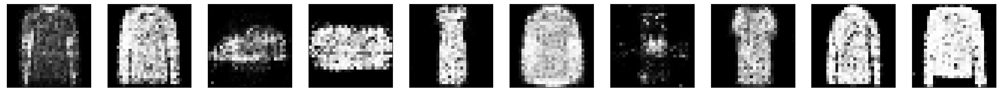

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 8ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:12,  3.22it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:12,  3.19it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  

  1%|█                                                                                 | 3/234 [00:00<01:12,  3.20it/s]

26
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:12,  3.18it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:12,  3.17it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  3%|██                                                                                | 6/234 [00:01<01:12,  3.16it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:11,  3.17it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:14,  3.05it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  4%|███▏                                                                              | 9/234 [00:02<01:14,  3.02it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:12,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  

  5%|███▊                                                                             | 11/234 [00:03<01:11,  3.11it/s]

26
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:03<01:11,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:10,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:09,  3.16it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


  6%|█████▏                                                                           | 15/234 [00:04<01:09,  3.16it/s]

8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:09,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:09,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


  8%|██████▏                                                                          | 18/234 [00:05<01:09,  3.13it/s]

8/8 [==============================] - 0s 9ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:08,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:08,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


  9%|███████▎                                                                         | 21/234 [00:06<01:07,  3.16it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


  9%|███████▌                                                                         | 22/234 [00:07<01:06,  3.18it/s]

8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:06,  3.17it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 10%|████████▎                                                                        | 24/234 [00:07<01:06,  3.17it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:07<01:06,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:08<01:05,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 12%|█████████▎                                                                       | 27/234 [00:08<01:05,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:08<01:05,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:09<01:05,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:09<01:05,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:09<01:04,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:10<01:04,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:10<01:04,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 15%|███████████▊                                                                     | 34/234 [00:10<01:03,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 15%|████████████                                                                     | 35/234 [00:11<01:03,  3.15it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  26


 15%|████████████▍                                                                    | 36/234 [00:11<01:02,  3.15it/s]

8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:11<01:02,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 16%|█████████████▏                                                                   | 38/234 [00:12<01:02,  3.13it/s]

8/8 [==============================] - 0s 9ms/step
epoch:  26


 17%|█████████████▌                                                                   | 39/234 [00:12<01:02,  3.13it/s]

8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:12<01:02,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:13<01:02,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:13<01:02,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 18%|██████████████▉                                                                  | 43/234 [00:13<01:02,  3.06it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▏                                                                 | 44/234 [00:14<01:01,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 19%|███████████████▌                                                                 | 45/234 [00:14<01:01,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:14<01:00,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 20%|████████████████▎                                                                | 47/234 [00:15<00:59,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 21%|████████████████▌                                                                | 48/234 [00:15<00:59,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 21%|████████████████▉                                                                | 49/234 [00:15<00:58,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch: 

 21%|█████████████████▎                                                               | 50/234 [00:15<00:58,  3.13it/s]

 26
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:16<00:58,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 22%|██████████████████                                                               | 52/234 [00:16<00:58,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 23%|██████████████████▎                                                              | 53/234 [00:16<00:57,  3.15it/s]

8/8 [==============================] - 0s 8ms/step


 23%|██████████████████▋                                                              | 54/234 [00:17<00:57,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 24%|███████████████████                                                              | 55/234 [00:17<00:56,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:17<00:56,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▋                                                             | 57/234 [00:18<00:56,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 25%|████████████████████                                                             | 58/234 [00:18<00:55,  3.15it/s]

8/8 [==============================] - 0s 9ms/step


 25%|████████████████████▍                                                            | 59/234 [00:18<00:55,  3.17it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:19<00:55,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:19<00:56,  3.04it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:19<00:56,  3.04it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 27%|█████████████████████▊                                                           | 63/234 [00:20<00:55,  3.06it/s]

8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:20<00:54,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 28%|██████████████████████▌                                                          | 65/234 [00:20<00:53,  3.13it/s]

8/8 [==============================] - 0s 8ms/step
epoch:  26


 28%|██████████████████████▊                                                          | 66/234 [00:21<00:53,  3.14it/s]

8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:21<00:53,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:21<00:53,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:22<00:52,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:22<00:52,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:22<00:51,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:23<00:51,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:23<00:51,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:23<00:51,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 32%|█████████████████████████▉                                                       | 75/234 [00:23<00:50,  3.12it/s]

8/8 [==============================] - 0s 8ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:24<00:50,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:24<00:50,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 33%|███████████████████████████                                                      | 78/234 [00:24<00:50,  3.12it/s]

8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:25<00:49,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:25<00:49,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 35%|████████████████████████████                                                     | 81/234 [00:25<00:49,  3.10it/s]

8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:26<00:48,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:26<00:48,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:26<00:48,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:27<00:47,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:27<00:47,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 37%|██████████████████████████████                                                   | 87/234 [00:27<00:47,  3.12it/s]

8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:28<00:46,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 38%|██████████████████████████████▊                                                  | 89/234 [00:28<00:46,  3.12it/s]

8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:28<00:46,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:29<00:45,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:29<00:45,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 40%|████████████████████████████████▏                                                | 93/234 [00:29<00:44,  3.14it/s]

8/8 [==============================] - 0s 8ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:30<00:44,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:30<00:44,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:30<00:43,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 41%|█████████████████████████████████▌                                               | 97/234 [00:31<00:43,  3.12it/s]

8/8 [==============================] - 0s 8ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:31<00:43,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:31<00:43,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:31<00:42,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:32<00:42,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch: 

 44%|██████████████████████████████████▊                                             | 102/234 [00:32<00:42,  3.13it/s]

 26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 44%|███████████████████████████████████▏                                            | 103/234 [00:32<00:41,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:33<00:41,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:33<00:42,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 45%|████████████████████████████████████▏                                           | 106/234 [00:33<00:41,  3.08it/s]

8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:34<00:41,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:34<00:40,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 47%|█████████████████████████████████████▎                                          | 109/234 [00:34<00:39,  3.14it/s]

8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:35<00:39,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  

 47%|█████████████████████████████████████▉                                          | 111/234 [00:35<00:39,  3.13it/s]

26
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:35<00:40,  3.02it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:36<00:40,  3.01it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:36<00:39,  3.05it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:36<00:38,  3.06it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  

 50%|███████████████████████████████████████▋                                        | 116/234 [00:37<00:38,  3.09it/s]

26
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:37<00:38,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:37<00:37,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:38<00:36,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 51%|█████████████████████████████████████████                                       | 120/234 [00:38<00:36,  3.15it/s]

8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:38<00:35,  3.15it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:39<00:35,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:39<00:35,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:39<00:35,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:40<00:34,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 54%|███████████████████████████████████████████                                     | 126/234 [00:40<00:34,  3.13it/s]

8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:40<00:34,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:40<00:33,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:41<00:33,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:41<00:33,  3.14it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:41<00:32,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:42<00:32,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:42<00:32,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:42<00:31,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:43<00:31,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:43<00:31,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:43<00:31,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:44<00:31,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:44<00:30,  3.11it/s]

8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:44<00:30,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:45<00:29,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:45<00:29,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:45<00:29,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:46<00:28,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:46<00:28,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:46<00:28,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:47<00:28,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:47<00:27,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:47<00:27,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:48<00:26,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:48<00:26,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:48<00:26,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:49<00:26,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:49<00:25,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:49<00:25,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:49<00:25,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:50<00:24,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:50<00:24,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:50<00:24,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:51<00:23,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:51<00:23,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:51<00:23,  3.11it/s]

8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:52<00:22,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:52<00:22,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:52<00:22,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:53<00:21,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:53<00:21,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:53<00:21,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:54<00:21,  3.06it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step
epoch:  26


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:54<00:20,  3.07it/s]

8/8 [==============================] - 0s 8ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:54<00:20,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  

 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:55<00:20,  3.10it/s]

26
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:55<00:20,  3.02it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:55<00:19,  3.02it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:56<00:19,  3.05it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:56<00:18,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:56<00:18,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:57<00:18,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:57<00:17,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:57<00:17,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:58<00:17,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:58<00:16,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [00:58<00:16,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [00:59<00:16,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [00:59<00:15,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [00:59<00:15,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:00<00:15,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:00<00:14,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:00<00:14,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:00<00:14,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:01<00:13,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:01<00:13,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:01<00:13,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:02<00:12,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:02<00:12,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:02<00:12,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:03<00:11,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:03<00:11,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:03<00:11,  3.13it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:04<00:10,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:04<00:10,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 8ms/step
epoch:  26


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:04<00:10,  3.10it/s]

8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:05<00:09,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:05<00:09,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:05<00:09,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:06<00:09,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:06<00:08,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:06<00:08,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:07<00:08,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:07<00:07,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:07<00:07,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:08<00:07,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:08<00:06,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:08<00:06,  3.12it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:09<00:06,  3.11it/s]

epoch:  26
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:09<00:05,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:09<00:05,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:09<00:05,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:10<00:04,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:10<00:04,  3.10it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:10<00:04,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:11<00:03,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:11<00:03,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:11<00:03,  3.00it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:12<00:02,  3.01it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:12<00:02,  3.04it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:12<00:02,  3.07it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:13<00:01,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:13<00:01,  3.06it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:13<00:01,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:14<00:00,  3.08it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:14<00:00,  3.09it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:14<00:00,  3.05it/s]

epoch:  26
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:15<00:00,  3.11it/s]


epoch:  26


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:15,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:14,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:00<01:14,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:14,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:13,  3.11it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:01<01:13,  3.11it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:13,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:13,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:02<01:13,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step
epoch:  27


  4%|███▍                                                                             | 10/234 [00:03<01:12,  3.11it/s]

8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:11,  3.11it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:03<01:11,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:11,  3.10it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:11,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:04<01:11,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:10,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:10,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:05<01:10,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:09,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:09,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  9%|███████▎                                                                         | 21/234 [00:06<01:08,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:08,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:08,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 10%|████████▎                                                                        | 24/234 [00:07<01:08,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:07,  3.09it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:08<01:07,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:08<01:07,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:09<01:07,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:09<01:06,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:09<01:06,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step
epoch:  27


 13%|██████████▋                                                                      | 31/234 [00:10<01:06,  3.06it/s]

8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:10<01:06,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:10<01:05,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:11<01:05,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:11<01:04,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:11<01:04,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:12<01:04,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:12<01:03,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:12<01:03,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:12<01:02,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:13<01:04,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:13<01:04,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▉                                                                  | 43/234 [00:13<01:03,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▏                                                                 | 44/234 [00:14<01:02,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▌                                                                 | 45/234 [00:14<01:02,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:14<01:01,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 20%|████████████████▎                                                                | 47/234 [00:15<01:01,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▌                                                                | 48/234 [00:15<01:00,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▉                                                                | 49/234 [00:15<01:00,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:16<00:59,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:16<00:59,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:16<00:59,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:17<00:58,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:17<00:58,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:17<00:58,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 24%|███████████████████▍                                                             | 56/234 [00:18<00:57,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▋                                                             | 57/234 [00:18<00:57,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:18<00:57,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████▍                                                            | 59/234 [00:19<00:57,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:19<00:56,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:19<00:56,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:20<00:56,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:20<00:56,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:20<00:56,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:21<00:55,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:21<00:54,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:21<00:54,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:22<00:54,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:22<00:53,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:22<00:53,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:23<00:53,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:23<00:53,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:23<00:52,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:24<00:51,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:24<00:51,  3.08it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:24<00:51,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:25<00:51,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:25<00:50,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:25<00:50,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:26<00:50,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:26<00:50,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:26<00:49,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:27<00:49,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step
epoch:  

 36%|█████████████████████████████                                                    | 84/234 [00:27<00:48,  3.07it/s]

27
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:27<00:48,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:28<00:48,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:28<00:48,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:28<00:48,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:29<00:47,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:29<00:47,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:29<00:47,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:30<00:47,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:30<00:46,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:30<00:46,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:31<00:46,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:31<00:45,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:31<00:45,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:32<00:44,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:32<00:44,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:32<00:43,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:33<00:43,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:33<00:43,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:33<00:43,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:33<00:42,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:34<00:42,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:34<00:42,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:34<00:41,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:35<00:41,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:35<00:40,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:35<00:40,  3.07it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:36<00:40,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:36<00:39,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:36<00:39,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:37<00:39,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:37<00:38,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:37<00:38,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:38<00:38,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:38<00:38,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:38<00:37,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:39<00:37,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:39<00:37,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:39<00:36,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:40<00:36,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:40<00:36,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:40<00:36,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:41<00:35,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:41<00:35,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:41<00:34,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:42<00:34,  3.06it/s]

epoch:  27
8/8 [==============================] - 0s 8ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:42<00:34,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:42<00:34,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:43<00:34,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:43<00:33,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:43<00:33,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:44<00:33,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:44<00:32,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:44<00:32,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:45<00:31,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:45<00:31,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:45<00:30,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:46<00:30,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:46<00:30,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:46<00:30,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:47<00:29,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:47<00:29,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:47<00:28,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:48<00:28,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:48<00:28,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:48<00:27,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:49<00:27,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:49<00:27,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:49<00:26,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:50<00:26,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:50<00:26,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:50<00:26,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:51<00:26,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:51<00:25,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:51<00:25,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:52<00:24,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:52<00:24,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:52<00:24,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:53<00:24,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:53<00:23,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:53<00:23,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:54<00:22,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:54<00:22,  3.05it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:54<00:22,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:55<00:21,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:55<00:21,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:55<00:21,  3.04it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:56<00:20,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:56<00:20,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:56<00:20,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:57<00:19,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:57<00:19,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:57<00:19,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:58<00:18,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:58<00:18,  3.03it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:58<00:18,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [00:59<00:17,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [00:59<00:17,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [00:59<00:17,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:00<00:17,  2.97it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:00<00:17,  2.92it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:00<00:16,  2.92it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:01<00:16,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:01<00:16,  2.93it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:01<00:15,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:02<00:15,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:02<00:14,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:02<00:14,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:03<00:14,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:03<00:13,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:03<00:13,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:04<00:13,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:04<00:12,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:04<00:12,  3.02it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:05<00:12,  2.98it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:05<00:11,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:05<00:11,  2.99it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:06<00:10,  3.01it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:06<00:10,  3.00it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:06<00:10,  2.97it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:07<00:10,  2.97it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:07<00:09,  2.97it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:07<00:09,  2.95it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:08<00:09,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:08<00:08,  2.96it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:08<00:08,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:09<00:08,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:09<00:07,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:09<00:07,  2.94it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:10<00:07,  2.93it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:10<00:06,  2.92it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:10<00:06,  2.91it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:11<00:06,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:11<00:05,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:11<00:05,  2.87it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:12<00:05,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:12<00:04,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:13<00:04,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:13<00:04,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:13<00:03,  2.88it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:14<00:03,  2.88it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:14<00:03,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:14<00:02,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:15<00:02,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:15<00:02,  2.89it/s]

epoch:  27
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:15<00:01,  2.91it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:16<00:01,  2.92it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:16<00:01,  2.92it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:16<00:00,  2.91it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:17<00:00,  2.93it/s]

epoch:  27
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:17<00:00,  3.02it/s]


epoch:  27


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:19,  2.93it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:19,  2.91it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:19,  2.90it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:18,  2.93it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:17,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:17,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:16,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:15,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:15,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:16,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:15,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:15,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:14,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:15,  2.90it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:17,  2.81it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:16,  2.84it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:16,  2.85it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:15,  2.86it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:14,  2.89it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:13,  2.90it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:13,  2.91it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:12,  2.92it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:12,  2.90it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:11,  2.92it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:11,  2.93it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:08<01:10,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:10,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:09<01:09,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:09<01:08,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:10<01:07,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:10<01:07,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:10<01:07,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:07,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:11<01:06,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:11<01:06,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:12<01:05,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:12<01:05,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:12<01:04,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:13<01:04,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:13<01:03,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:13<01:03,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:14<01:03,  3.05it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▉                                                                  | 43/234 [00:14<01:02,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▏                                                                 | 44/234 [00:14<01:03,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:03,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:15<01:03,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 20%|████████████████▎                                                                | 47/234 [00:15<01:02,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▌                                                                | 48/234 [00:16<01:01,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▉                                                                | 49/234 [00:16<01:01,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:16<01:01,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:17<01:00,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:17<01:00,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:17<01:00,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:18<01:00,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:18<00:59,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:18<00:59,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▋                                                             | 57/234 [00:19<00:58,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:19<00:58,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████▍                                                            | 59/234 [00:19<00:58,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:20<00:57,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:20<00:57,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:20<00:57,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:21<00:57,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:21<00:56,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:21<00:56,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:22<00:56,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:22<00:55,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:22<00:55,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:23<00:54,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:23<00:54,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:23<00:54,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:24<00:55,  2.91it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:24<00:54,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:24<00:53,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:25<00:53,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:25<00:53,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:25<00:52,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:26<00:52,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:26<00:51,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:26<00:51,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:27<00:51,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:27<00:50,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:27<00:50,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:28<00:49,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:28<00:49,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:28<00:49,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:29<00:48,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:29<00:48,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:29<00:47,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:30<00:47,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:30<00:47,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:30<00:47,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:31<00:46,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:31<00:46,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:31<00:45,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:32<00:45,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:32<00:45,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:32<00:44,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:33<00:44,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:33<00:44,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:33<00:44,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:34<00:43,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:34<00:43,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:34<00:42,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:35<00:42,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:35<00:43,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:35<00:42,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:36<00:42,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:36<00:41,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:36<00:41,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:37<00:40,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:37<00:40,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:37<00:40,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:38<00:39,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:38<00:39,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:38<00:39,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:39<00:39,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:39<00:38,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:39<00:38,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:40<00:37,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:40<00:37,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:40<00:37,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:41<00:36,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:41<00:36,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:41<00:36,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:42<00:36,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:42<00:35,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:42<00:34,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:43<00:34,  3.04it/s]

epoch:  28
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:43<00:35,  2.93it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:43<00:34,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:44<00:34,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:44<00:33,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:44<00:33,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:45<00:33,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:45<00:32,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:45<00:32,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:46<00:32,  2.95it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:46<00:32,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:46<00:31,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:47<00:31,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:47<00:30,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:47<00:30,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:48<00:30,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:48<00:29,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:48<00:29,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:49<00:29,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:49<00:28,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:49<00:28,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:50<00:27,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:50<00:27,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:50<00:27,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:51<00:27,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:51<00:26,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:51<00:26,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:52<00:25,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:52<00:25,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:52<00:25,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:53<00:24,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:53<00:24,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:53<00:24,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:54<00:24,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:54<00:23,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:54<00:23,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:55<00:22,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:55<00:22,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:55<00:22,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:56<00:22,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:56<00:21,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:56<00:21,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:57<00:21,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:57<00:20,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:57<00:20,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:58<00:19,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:58<00:19,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:58<00:19,  3.03it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:59<00:18,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [00:59<00:18,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [00:59<00:18,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:00<00:18,  2.93it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:00<00:17,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:00<00:17,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:01<00:17,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:01<00:16,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:01<00:16,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:02<00:16,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:02<00:15,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:02<00:15,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:03<00:15,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:03<00:15,  2.88it/s]

epoch:  28
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:03<00:14,  2.89it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:04<00:14,  2.94it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:04<00:13,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:04<00:13,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:05<00:13,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:05<00:12,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:05<00:12,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:06<00:12,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:06<00:11,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:06<00:11,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:07<00:11,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:07<00:10,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:08<00:10,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:08<00:10,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:08<00:09,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:09<00:09,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:09<00:09,  2.96it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:09<00:08,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:10<00:08,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:10<00:07,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:10<00:07,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:11<00:07,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:11<00:06,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:11<00:06,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:12<00:06,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:12<00:06,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:12<00:05,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:12<00:05,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:13<00:04,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:13<00:04,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:13<00:04,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:14<00:03,  3.02it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:14<00:03,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:14<00:03,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:15<00:03,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:15<00:02,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:15<00:02,  3.00it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:16<00:01,  3.01it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:16<00:01,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:17<00:01,  2.97it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:17<00:01,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:17<00:00,  2.98it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:18<00:00,  2.99it/s]

epoch:  28
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:18<00:00,  2.99it/s]


epoch:  28


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:18,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:18,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:17,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:17,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:16,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:16,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:16,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:15,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:15,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:15,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:14,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:14,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:13,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:13,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:13,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:15,  2.90it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:15,  2.89it/s]

epoch:  29
8/8 [==============================] - 0s 8ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:13,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 8ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:12,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 8ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:12,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:14,  2.86it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:14,  2.86it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:12,  2.90it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:11,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:11,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:08<01:11,  2.90it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:11,  2.89it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:09<01:10,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:09<01:09,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:10<01:08,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:10<01:07,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:10<01:07,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:07,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:11<01:07,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:11<01:06,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:12<01:06,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:12<01:05,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:12<01:05,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:13<01:05,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:13<01:04,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:13<01:04,  3.01it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:14<01:03,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▉                                                                  | 43/234 [00:14<01:03,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▏                                                                 | 44/234 [00:14<01:04,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:04,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:15<01:03,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 20%|████████████████▎                                                                | 47/234 [00:15<01:02,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▌                                                                | 48/234 [00:16<01:02,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:16<01:02,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:16<01:01,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:17<01:01,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:17<01:01,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:17<01:00,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:18<01:00,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:18<00:59,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:18<00:59,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▋                                                             | 57/234 [00:19<00:59,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:19<00:59,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████▍                                                            | 59/234 [00:19<00:59,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:20<00:58,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:20<00:57,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:20<00:57,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:21<00:57,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:21<00:56,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:21<00:56,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:22<00:55,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:22<00:56,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:22<00:55,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:23<00:55,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:23<00:55,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:23<00:54,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:24<00:54,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:24<00:53,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:24<00:53,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:25<00:53,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:25<00:52,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:25<00:52,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:26<00:52,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:26<00:52,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:26<00:52,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:27<00:52,  2.90it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:27<00:51,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:27<00:51,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:28<00:50,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:28<00:50,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:28<00:49,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:29<00:49,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:29<00:49,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:30<00:48,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:30<00:48,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:30<00:48,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:31<00:47,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:31<00:47,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:31<00:46,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:32<00:48,  2.89it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:32<00:47,  2.88it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:32<00:46,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:33<00:46,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:33<00:45,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:33<00:45,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:34<00:44,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:34<00:44,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:34<00:43,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:35<00:43,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:35<00:43,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:35<00:42,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:36<00:42,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:36<00:42,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:36<00:41,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:37<00:41,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:37<00:41,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:37<00:40,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:38<00:40,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:38<00:40,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:38<00:39,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:39<00:39,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:39<00:39,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:39<00:39,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:40<00:38,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:40<00:38,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:40<00:37,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:41<00:37,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:41<00:37,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:41<00:36,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:42<00:36,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:42<00:36,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:42<00:35,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:43<00:35,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:43<00:36,  2.91it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:43<00:36,  2.88it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:44<00:36,  2.86it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:44<00:35,  2.85it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:44<00:35,  2.83it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:45<00:35,  2.80it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:45<00:35,  2.77it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:45<00:34,  2.83it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:46<00:33,  2.88it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:46<00:32,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:46<00:32,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:47<00:31,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:47<00:31,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:47<00:30,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:48<00:30,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:48<00:30,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:48<00:29,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:49<00:29,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:49<00:29,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:50<00:29,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:50<00:28,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:50<00:28,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:51<00:27,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:51<00:27,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:51<00:27,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:52<00:26,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:52<00:26,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:52<00:26,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:53<00:26,  2.89it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:53<00:26,  2.87it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:53<00:25,  2.90it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:54<00:25,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:54<00:24,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:54<00:24,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:55<00:24,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:55<00:23,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:55<00:23,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:56<00:22,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:56<00:22,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:56<00:22,  3.00it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:57<00:21,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:57<00:21,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:57<00:21,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:58<00:20,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:58<00:20,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:58<00:20,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [00:59<00:19,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [00:59<00:19,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [00:59<00:19,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:00<00:18,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:00<00:18,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:00<00:18,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:01<00:17,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:01<00:17,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:01<00:17,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:02<00:16,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:02<00:16,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:02<00:16,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:03<00:15,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:03<00:15,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:03<00:15,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:04<00:14,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:04<00:14,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:04<00:14,  2.99it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:05<00:13,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:05<00:13,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:05<00:13,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:06<00:12,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:06<00:12,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:06<00:12,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:07<00:11,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:07<00:11,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:07<00:11,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:08<00:10,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:08<00:10,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:08<00:10,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:09<00:09,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:09<00:09,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:09<00:09,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:10<00:08,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:10<00:08,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:10<00:08,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:11<00:07,  2.93it/s]

epoch:  29
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:11<00:07,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:11<00:07,  2.95it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:12<00:06,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:12<00:06,  2.98it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:12<00:06,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:13<00:05,  2.86it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:13<00:05,  2.88it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:14<00:05,  2.91it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:14<00:04,  2.92it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:14<00:04,  2.94it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:15<00:04,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:15<00:03,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:15<00:03,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:16<00:03,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:16<00:02,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:16<00:02,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:17<00:02,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:17<00:01,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:17<00:01,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:18<00:01,  2.96it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:18<00:00,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:18<00:00,  2.97it/s]

epoch:  29
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:19<00:00,  2.96it/s]


epoch:  29


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:18,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:18,  2.97it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:17,  2.98it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:17,  2.97it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:17,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:02<01:17,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:17,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:16,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:17,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:16,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:16,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:15,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:14,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:14,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:15,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:14,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:14,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:14,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:13,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:12,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:12,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:11,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:07<01:11,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:10,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:10,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:08<01:10,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:10,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:09<01:09,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:09<01:09,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:10<01:08,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 13%|██████████▋                                                                      | 31/234 [00:10<01:08,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:10<01:08,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:07,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:11<01:07,  2.97it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:11<01:07,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:12<01:07,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 16%|████████████▊                                                                    | 37/234 [00:12<01:07,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:12<01:06,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:13<01:05,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▊                                                                   | 40/234 [00:13<01:05,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:13<01:05,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:14<01:05,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:14<01:06,  2.85it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:14<01:06,  2.85it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:05,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:15<01:04,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 20%|████████████████▎                                                                | 47/234 [00:15<01:03,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▌                                                                | 48/234 [00:16<01:03,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▉                                                                | 49/234 [00:16<01:02,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:17<01:02,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:17<01:01,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:17<01:01,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:18<01:01,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▋                                                              | 54/234 [00:18<01:01,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:18<01:00,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:19<01:00,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▋                                                             | 57/234 [00:19<01:00,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████                                                             | 58/234 [00:19<00:59,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 25%|████████████████████▍                                                            | 59/234 [00:20<00:59,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:20<00:59,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:20<00:58,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:21<00:58,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:21<00:58,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:21<00:57,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:22<00:57,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:22<00:57,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:22<00:57,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:23<00:56,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:23<00:56,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:23<00:55,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:24<00:55,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:24<00:55,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:24<00:55,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:25<00:54,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:25<00:53,  2.97it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:25<00:53,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:26<00:53,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:26<00:52,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:26<00:52,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:27<00:51,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:27<00:51,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:27<00:51,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:28<00:51,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:28<00:51,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:28<00:50,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:29<00:50,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:29<00:49,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:29<00:49,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:30<00:49,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:30<00:50,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:31<00:57,  2.49it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:31<00:54,  2.63it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:31<00:51,  2.72it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:32<00:50,  2.77it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:32<00:49,  2.82it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:32<00:48,  2.84it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:33<00:47,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:33<00:46,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:33<00:46,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:34<00:45,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:34<00:45,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:34<00:44,  2.96it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:35<00:44,  2.97it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:35<00:45,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:35<00:45,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:36<00:44,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:36<00:44,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:36<00:44,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:37<00:43,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:37<00:42,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:38<00:43,  2.84it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:38<00:43,  2.78it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:38<00:44,  2.71it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:39<00:44,  2.68it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:39<00:44,  2.68it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:39<00:42,  2.76it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:40<00:41,  2.81it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:40<00:40,  2.84it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:40<00:40,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:41<00:39,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:41<00:38,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:41<00:38,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:42<00:37,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:42<00:37,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:42<00:37,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:43<00:37,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:43<00:36,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:43<00:36,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:44<00:35,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:44<00:35,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:44<00:34,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:45<00:34,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:45<00:34,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:46<00:33,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:46<00:33,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:46<00:34,  2.84it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:47<00:34,  2.81it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:47<00:33,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:47<00:32,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:48<00:32,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:48<00:31,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:48<00:31,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:49<00:31,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:49<00:30,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:49<00:30,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:50<00:30,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:50<00:29,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:50<00:29,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:51<00:29,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:51<00:28,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:51<00:28,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:52<00:27,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:52<00:27,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:52<00:27,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:53<00:26,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:53<00:26,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:53<00:26,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:54<00:26,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:54<00:25,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:54<00:25,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:55<00:24,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:55<00:24,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:55<00:24,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:56<00:23,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:56<00:23,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:56<00:23,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:57<00:22,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:57<00:22,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [00:57<00:22,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [00:58<00:21,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [00:58<00:21,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [00:59<00:21,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [00:59<00:20,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [00:59<00:20,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:00<00:19,  2.95it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:00<00:19,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:00<00:19,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:01<00:19,  2.94it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:01<00:18,  2.93it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:01<00:18,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:02<00:18,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:02<00:17,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:02<00:17,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:03<00:17,  2.92it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:03<00:16,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:03<00:16,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:04<00:16,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:04<00:15,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:04<00:15,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:05<00:15,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:05<00:14,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:05<00:14,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:06<00:14,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:06<00:13,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:06<00:13,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:07<00:13,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:07<00:12,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:07<00:12,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:08<00:12,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:08<00:12,  2.81it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:09<00:11,  2.81it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:09<00:11,  2.85it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:09<00:10,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:10<00:10,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:10<00:10,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:10<00:09,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:11<00:09,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:11<00:09,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:11<00:08,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:12<00:08,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:12<00:07,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:12<00:07,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:13<00:07,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:13<00:06,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:13<00:06,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:14<00:06,  2.86it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:14<00:05,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:14<00:05,  2.87it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:15<00:05,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:15<00:04,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:15<00:04,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:16<00:04,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:16<00:03,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:16<00:03,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:17<00:03,  2.88it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:17<00:02,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:18<00:02,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:18<00:02,  2.89it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:18<00:01,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:19<00:01,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:19<00:01,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:19<00:00,  2.90it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:20<00:00,  2.91it/s]

epoch:  30
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:20<00:00,  2.91it/s]

epoch:  30
1/1 [==============================] - 0s 26ms/step


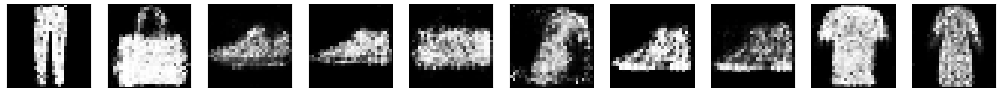

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:20,  2.89it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:20,  2.88it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:20,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:20,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:19,  2.87it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:20,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:19,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:19,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:18,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:19,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  5%|███▊                                                                             | 11/234 [00:03<01:18,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:18,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:18,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  6%|████▊                                                                            | 14/234 [00:04<01:17,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:16,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:16,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:05<01:15,  2.88it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:14,  2.89it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:14,  2.88it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  9%|██████▉                                                                          | 20/234 [00:06<01:14,  2.88it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:14,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


  9%|███████▌                                                                         | 22/234 [00:07<01:14,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:15,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:15,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:08<01:14,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:13,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:12,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 12%|█████████▋                                                                       | 28/234 [00:09<01:12,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:11,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 13%|██████████▍                                                                      | 30/234 [00:10<01:11,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:10<01:12,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:11<01:10,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 14%|███████████▍                                                                     | 33/234 [00:11<01:10,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:11<01:09,  2.87it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 15%|████████████                                                                     | 35/234 [00:12<01:09,  2.87it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:12<01:10,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:13<01:09,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 16%|█████████████▏                                                                   | 38/234 [00:13<01:09,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:13<01:08,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:14<01:09,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▏                                                                  | 41/234 [00:14<01:08,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▌                                                                  | 42/234 [00:14<01:07,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 18%|██████████████▉                                                                  | 43/234 [00:15<01:07,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 19%|███████████████▏                                                                 | 44/234 [00:15<01:06,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:15<01:06,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 20%|███████████████▉                                                                 | 46/234 [00:16<01:05,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 20%|████████████████▎                                                                | 47/234 [00:16<01:05,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▌                                                                | 48/234 [00:16<01:05,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:17<01:04,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:17<01:04,  2.87it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 22%|█████████████████▋                                                               | 51/234 [00:17<01:03,  2.87it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 22%|██████████████████                                                               | 52/234 [00:18<01:03,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 23%|██████████████████▎                                                              | 53/234 [00:18<01:03,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:18<01:03,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:19<01:02,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:19<01:02,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:20<01:02,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:20<01:01,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:20<01:01,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:21<01:00,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████                                                            | 61/234 [00:21<01:00,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:21<01:00,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:22<00:59,  2.86it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:22<00:59,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:22<00:59,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:23<00:59,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:23<00:59,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:23<00:58,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:24<00:58,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:24<00:58,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:24<00:57,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:25<00:57,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:25<00:56,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:25<00:56,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:26<00:56,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:26<00:55,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:27<00:55,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:27<00:54,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:27<00:55,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:28<00:54,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:28<00:55,  2.74it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:28<00:55,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:29<00:54,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:29<00:54,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:29<00:53,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:30<00:52,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:30<00:52,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:30<00:51,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:31<00:51,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:31<00:50,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:32<00:50,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:32<00:50,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:32<00:50,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:33<00:49,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:33<00:49,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:33<00:48,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:34<00:48,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:34<00:48,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:34<00:48,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:35<00:47,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:35<00:47,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:35<00:46,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:36<00:46,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:36<00:45,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:37<00:45,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:37<00:44,  2.85it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:37<00:44,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:38<00:44,  2.83it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:38<00:43,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:38<00:43,  2.84it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:39<00:43,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:39<00:43,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:39<00:43,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:40<00:42,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:40<00:42,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:40<00:41,  2.82it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:41<00:41,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:41<00:41,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:41<00:41,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:42<00:40,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:42<00:40,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:43<00:40,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:43<00:39,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:43<00:39,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:44<00:39,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:44<00:38,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:44<00:38,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:45<00:38,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:45<00:37,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:45<00:37,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:46<00:36,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:46<00:36,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:46<00:36,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:47<00:35,  2.81it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:47<00:35,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:48<00:35,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:48<00:34,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:48<00:35,  2.68it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:49<00:35,  2.69it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:49<00:34,  2.71it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:49<00:34,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:50<00:33,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:50<00:32,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:50<00:32,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:51<00:32,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:51<00:31,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:52<00:31,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:52<00:31,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:52<00:30,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:53<00:30,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:53<00:29,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:53<00:29,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:54<00:29,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:54<00:28,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:54<00:28,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:55<00:28,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:55<00:27,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:56<00:27,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:56<00:27,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:56<00:26,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [00:57<00:26,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [00:57<00:26,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [00:57<00:25,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [00:58<00:25,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [00:58<00:24,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [00:58<00:24,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [00:59<00:24,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [00:59<00:23,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:00<00:23,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:00<00:23,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:00<00:22,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:01<00:22,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:01<00:21,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:01<00:21,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:02<00:21,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:02<00:20,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:02<00:20,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:03<00:20,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:03<00:19,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:03<00:19,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:04<00:19,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:04<00:18,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:05<00:18,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:05<00:18,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:05<00:17,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:06<00:17,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:06<00:16,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:06<00:16,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:07<00:16,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:07<00:15,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:07<00:15,  2.78it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:08<00:15,  2.77it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:08<00:14,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:09<00:14,  2.80it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:09<00:13,  2.79it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:09<00:14,  2.70it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:10<00:13,  2.69it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:10<00:13,  2.71it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:10<00:13,  2.68it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:11<00:12,  2.64it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:11<00:12,  2.58it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:12<00:12,  2.58it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:12<00:12,  2.57it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:12<00:11,  2.60it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:13<00:11,  2.61it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:13<00:10,  2.64it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:13<00:10,  2.62it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:14<00:09,  2.61it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:14<00:09,  2.63it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:15<00:09,  2.61it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:15<00:08,  2.64it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:15<00:08,  2.68it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:16<00:07,  2.67it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:16<00:07,  2.71it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:16<00:06,  2.74it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:17<00:06,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:17<00:06,  2.75it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:18<00:05,  2.72it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:18<00:05,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:18<00:05,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:19<00:04,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:19<00:04,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:19<00:04,  2.75it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:20<00:03,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:20<00:03,  2.75it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:20<00:02,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:21<00:02,  2.76it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:21<00:02,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:22<00:01,  2.74it/s]

epoch:  31
8/8 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:22<00:01,  2.69it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:22<00:01,  2.70it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:23<00:00,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:23<00:00,  2.73it/s]

epoch:  31
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:23<00:00,  2.79it/s]


epoch:  31


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:24,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:24,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:24,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:23,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:24,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


  3%|██                                                                                | 6/234 [00:02<01:24,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 9ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:23,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 9ms/step


  3%|██▊                                                                               | 8/234 [00:02<01:22,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 9ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:21,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:22,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:21,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:21,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:20,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:20,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:20,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:05<01:22,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:21,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:20,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:06<01:19,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:18,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:18,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:18,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:17,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:08<01:17,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:16,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:16,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:09<01:16,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:15,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:15,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:15,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:11<01:13,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:11<01:13,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:13,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:12,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:12<01:12,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:13<01:12,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:13<01:11,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:13<01:11,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:11,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:14<01:10,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:15<01:10,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:09,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:15<01:09,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:09,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:16<01:08,  2.75it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:16<01:08,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:17<01:08,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:17<01:08,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:17<01:07,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:18<01:07,  2.74it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:18<01:06,  2.73it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:19<01:05,  2.76it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:19<01:07,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:19<01:07,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:20<01:07,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:20<01:06,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:20<01:06,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:21<01:05,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:21<01:05,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:22<01:05,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████                                                            | 61/234 [00:22<01:05,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:22<01:05,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:23<01:04,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:23<01:03,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:23<01:03,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:24<01:04,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:24<01:03,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:25<01:04,  2.58it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:25<01:04,  2.57it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:25<01:03,  2.59it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:26<01:02,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:26<01:01,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:27<01:01,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:27<01:00,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:27<01:01,  2.60it/s]

epoch:  32
8/8 [==============================] - 0s 12ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:28<01:04,  2.47it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:28<01:03,  2.46it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 33%|███████████████████████████                                                      | 78/234 [00:29<01:05,  2.39it/s]

epoch:  32
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:29<01:07,  2.28it/s]

epoch:  32
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:30<01:08,  2.25it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:30<01:06,  2.32it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:30<01:04,  2.37it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:31<01:01,  2.45it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:31<01:00,  2.49it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:32<00:58,  2.53it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:32<00:57,  2.57it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:32<00:56,  2.59it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:33<00:56,  2.60it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:33<00:55,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:33<00:54,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:34<00:54,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:34<00:54,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:35<00:54,  2.60it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:35<00:53,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:35<00:53,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:36<00:52,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:36<00:51,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:36<00:51,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:37<00:50,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:37<00:50,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:38<00:49,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:38<00:49,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:38<00:48,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:39<00:48,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:39<00:48,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:39<00:48,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:40<00:48,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:40<00:47,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:41<00:46,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:41<00:46,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:41<00:45,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:42<00:45,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:42<00:45,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:42<00:45,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:43<00:44,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:43<00:44,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:44<00:44,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:44<00:43,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:44<00:43,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:45<00:43,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:45<00:42,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:45<00:43,  2.58it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:46<00:42,  2.59it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:46<00:42,  2.57it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:47<00:42,  2.59it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:47<00:41,  2.60it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:47<00:41,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:48<00:40,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:48<00:40,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:49<00:39,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:49<00:39,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:49<00:38,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:50<00:38,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:50<00:38,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:50<00:37,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:51<00:37,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:51<00:36,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:52<00:36,  2.60it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:52<00:36,  2.61it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:52<00:35,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:53<00:35,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:53<00:34,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:53<00:34,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:54<00:34,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:54<00:33,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:55<00:33,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:55<00:33,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:55<00:32,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:56<00:32,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 11ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:56<00:31,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:57<00:31,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:57<00:30,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:57<00:30,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:58<00:30,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:58<00:29,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:58<00:29,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:59<00:29,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:59<00:28,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:00<00:28,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:00<00:27,  2.65it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:00<00:27,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:01<00:26,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:01<00:26,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:01<00:25,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:02<00:25,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:02<00:25,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:03<00:24,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:03<00:24,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:03<00:24,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:04<00:23,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:04<00:23,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:04<00:23,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:05<00:22,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:05<00:22,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:05<00:22,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:06<00:21,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:06<00:21,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:07<00:21,  2.63it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:07<00:20,  2.62it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:07<00:20,  2.64it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:08<00:19,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:08<00:19,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:08<00:19,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:09<00:18,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:09<00:18,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:10<00:17,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:10<00:17,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:10<00:17,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:11<00:16,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:11<00:16,  2.72it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:11<00:16,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:12<00:15,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:12<00:15,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:13<00:14,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:13<00:14,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:13<00:14,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:14<00:13,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:14<00:13,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:14<00:13,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:15<00:12,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:15<00:12,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:16<00:12,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:16<00:11,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:16<00:11,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:17<00:10,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:17<00:10,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:17<00:10,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:18<00:09,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:18<00:09,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:19<00:08,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:19<00:08,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:19<00:08,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:20<00:07,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:20<00:07,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:20<00:07,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:21<00:06,  2.71it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:21<00:06,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:22<00:05,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:22<00:05,  2.67it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:22<00:05,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:23<00:04,  2.70it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:23<00:04,  2.66it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:23<00:04,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:24<00:03,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:24<00:03,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:24<00:02,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:25<00:02,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:25<00:02,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:26<00:01,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:26<00:01,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:26<00:01,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:27<00:00,  2.68it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:27<00:00,  2.69it/s]

epoch:  32
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:27<00:00,  2.66it/s]


epoch:  32


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:38,  2.38it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:32,  2.51it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:29,  2.57it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:27,  2.62it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:26,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:25,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:25,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:24,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:24,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:23,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:23,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:23,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:22,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:21,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:21,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:20,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:20,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:20,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:20,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:20,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:19,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:19,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:18,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:18,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:17,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:17,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:17,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:16,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:16,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:16,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:11<01:15,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:11<01:15,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:15,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:14,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:14,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:13<01:13,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:13<01:12,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:14<01:12,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:12,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:14<01:11,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:15<01:11,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:10,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:16<01:10,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:10,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:16<01:10,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:17<01:10,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:17<01:09,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:17<01:09,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:18<01:08,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:18<01:08,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:19<01:08,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:19<01:07,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:19<01:07,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:20<01:06,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:20<01:08,  2.61it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:20<01:08,  2.61it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:21<01:07,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:21<01:06,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:22<01:05,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:22<01:05,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████                                                            | 61/234 [00:22<01:04,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:23<01:04,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:23<01:03,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:23<01:03,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:24<01:02,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:24<01:02,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:25<01:01,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:25<01:01,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:25<01:00,  2.71it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:26<01:00,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:26<01:00,  2.70it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:26<01:00,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:27<01:00,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:27<01:00,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:28<00:59,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:28<00:59,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:28<00:58,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:29<00:58,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:29<00:57,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:29<00:57,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:30<00:57,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:30<00:57,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:31<00:56,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:31<00:56,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:31<00:56,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:32<00:55,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:32<00:55,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:32<00:54,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:33<00:54,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:33<00:54,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:34<00:54,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 9ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:34<00:54,  2.59it/s]

epoch:  33
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:34<00:53,  2.62it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:35<00:52,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:35<00:52,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:35<00:51,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:36<00:51,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:36<00:50,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:37<00:50,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:37<00:50,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:37<00:49,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:38<00:49,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:38<00:48,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:38<00:48,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:39<00:48,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:39<00:47,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:40<00:47,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:40<00:47,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:40<00:46,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:41<00:46,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:41<00:46,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:41<00:45,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:42<00:45,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:42<00:45,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:43<00:44,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:43<00:44,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:43<00:43,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:44<00:43,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:44<00:43,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:44<00:42,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:45<00:42,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:45<00:41,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:46<00:41,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:46<00:41,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:46<00:40,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:47<00:40,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:47<00:39,  2.69it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:47<00:39,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:48<00:39,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:48<00:38,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:49<00:38,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:49<00:38,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:49<00:37,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:50<00:37,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:50<00:36,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:50<00:36,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:51<00:36,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:51<00:36,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:52<00:35,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:52<00:35,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:52<00:35,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:53<00:34,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:53<00:34,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:53<00:33,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:54<00:33,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:54<00:33,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:55<00:32,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:55<00:32,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:55<00:31,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:56<00:31,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:56<00:31,  2.61it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:56<00:31,  2.59it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:57<00:30,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:57<00:30,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:58<00:29,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:58<00:29,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [00:58<00:29,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [00:59<00:28,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [00:59<00:28,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [00:59<00:27,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:00<00:27,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:00<00:27,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:01<00:26,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:01<00:26,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:01<00:26,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:02<00:25,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:02<00:25,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:02<00:24,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:03<00:24,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:03<00:23,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:04<00:23,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:04<00:23,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:04<00:22,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:05<00:22,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:05<00:22,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:06<00:21,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:06<00:21,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:06<00:21,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:07<00:20,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:07<00:20,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:07<00:19,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:08<00:19,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:08<00:19,  2.62it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:09<00:19,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:09<00:18,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:09<00:18,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:10<00:17,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:10<00:17,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:10<00:16,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:11<00:16,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:11<00:16,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:12<00:15,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:12<00:15,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:12<00:15,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:13<00:14,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:13<00:14,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:13<00:13,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:14<00:13,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:14<00:13,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:15<00:12,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:15<00:12,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:15<00:12,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:16<00:11,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:16<00:11,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:16<00:10,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:17<00:10,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:17<00:10,  2.68it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:18<00:10,  2.59it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:18<00:09,  2.59it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:18<00:09,  2.60it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:19<00:08,  2.61it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:19<00:08,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:19<00:07,  2.63it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:20<00:07,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:20<00:07,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:21<00:06,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:21<00:06,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:21<00:06,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:22<00:05,  2.64it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:22<00:05,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:23<00:04,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:23<00:04,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:23<00:04,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:24<00:03,  2.67it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:24<00:03,  2.66it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:24<00:03,  2.65it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:25<00:02,  2.62it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:25<00:02,  2.58it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:26<00:01,  2.56it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:26<00:01,  2.47it/s]

epoch:  33
8/8 [==============================] - 0s 11ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:26<00:01,  2.43it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:27<00:00,  2.48it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:27<00:00,  2.55it/s]

epoch:  33
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:28<00:00,  2.66it/s]


epoch:  33


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:32,  2.52it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:29,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:28,  2.62it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:26,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:26,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:25,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:25,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:24,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:24,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:24,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:24,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:24,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:23,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:22,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:22,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:21,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:21,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:21,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:21,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:20,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:21,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:20,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:19,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:19,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:18,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:18,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:18,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:17,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:10<01:17,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:17,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:11<01:19,  2.57it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:18,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:17,  2.60it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:16,  2.62it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:15,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:13<01:14,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:14,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:14<01:14,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:14,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:13,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:15<01:12,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:13,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:16<01:13,  2.60it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:13,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:13,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:17<01:12,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 20%|████████████████▎                                                                | 47/234 [00:17<01:12,  2.57it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 21%|████████████████▌                                                                | 48/234 [00:18<01:12,  2.55it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:18<01:11,  2.57it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:11,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 22%|█████████████████▋                                                               | 51/234 [00:19<01:10,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 22%|██████████████████                                                               | 52/234 [00:19<01:10,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:20<01:10,  2.56it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 23%|██████████████████▋                                                              | 54/234 [00:20<01:11,  2.53it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████                                                              | 55/234 [00:21<01:14,  2.40it/s]

epoch:  34
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▍                                                             | 56/234 [00:21<01:22,  2.16it/s]

epoch:  34
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:27,  2.03it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:22<01:21,  2.16it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:22<01:16,  2.30it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 26%|████████████████████▊                                                            | 60/234 [00:23<01:18,  2.23it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████                                                            | 61/234 [00:23<01:16,  2.26it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:24<01:12,  2.39it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:24<01:09,  2.44it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:25<01:08,  2.49it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:25<01:07,  2.52it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:25<01:04,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:26<01:03,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:26<01:01,  2.70it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:26<01:00,  2.73it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:27<01:02,  2.62it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:27<01:03,  2.57it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:28<01:04,  2.51it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:28<01:05,  2.47it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:28<01:04,  2.48it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:29<01:04,  2.47it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:29<01:03,  2.48it/s]

epoch:  34
8/8 [==============================] - 0s 14ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:30<01:04,  2.43it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:30<01:01,  2.52it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:30<01:04,  2.41it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:31<01:02,  2.46it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:31<01:01,  2.49it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:32<00:59,  2.54it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:32<00:59,  2.54it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:32<00:58,  2.55it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:33<00:57,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:33<00:55,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:33<00:54,  2.70it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:34<00:53,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:34<00:54,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:35<00:58,  2.48it/s]

epoch:  34
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:35<01:00,  2.38it/s]

epoch:  34
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:36<01:04,  2.20it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:36<01:00,  2.35it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:36<00:57,  2.42it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:37<00:56,  2.45it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:37<00:55,  2.51it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:38<00:53,  2.54it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:38<00:53,  2.56it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:38<00:51,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:39<00:51,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:39<00:50,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:39<00:49,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:40<00:50,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:40<00:51,  2.55it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:41<00:49,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:41<00:48,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:41<00:48,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:42<00:48,  2.60it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:42<00:47,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:43<00:47,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:43<00:46,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:43<00:47,  2.56it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:44<00:46,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:44<00:46,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:44<00:46,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:45<00:44,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:45<00:43,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:46<00:42,  2.73it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:46<00:41,  2.74it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:46<00:43,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:47<00:42,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:47<00:41,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:47<00:40,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:48<00:40,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:48<00:41,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:49<00:40,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:49<00:40,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:49<00:40,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:50<00:39,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:50<00:38,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:50<00:38,  2.66it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:51<00:38,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:51<00:37,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:52<00:37,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:52<00:36,  2.68it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:52<00:37,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:53<00:36,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:53<00:36,  2.60it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:54<00:36,  2.58it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:54<00:35,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:54<00:34,  2.68it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:55<00:33,  2.72it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:55<00:33,  2.75it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:55<00:32,  2.76it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:56<00:32,  2.77it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:56<00:31,  2.78it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:56<00:32,  2.68it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:57<00:31,  2.70it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:57<00:31,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:58<00:31,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:58<00:31,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:58<00:30,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:59<00:29,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:59<00:29,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:59<00:29,  2.68it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:00<00:28,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:00<00:29,  2.64it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:00<00:28,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:01<00:27,  2.72it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:01<00:27,  2.68it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:02<00:27,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:02<00:26,  2.71it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:02<00:25,  2.73it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:03<00:25,  2.75it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:03<00:25,  2.67it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:03<00:26,  2.61it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:04<00:25,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:04<00:25,  2.63it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:05<00:25,  2.52it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:05<00:27,  2.36it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:06<00:26,  2.40it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:06<00:25,  2.44it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:07<00:27,  2.20it/s]

epoch:  34
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:07<00:29,  2.06it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:08<00:28,  2.05it/s]

epoch:  34
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:08<00:27,  2.11it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:08<00:25,  2.26it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:09<00:23,  2.35it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:09<00:22,  2.42it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:10<00:21,  2.49it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:10<00:20,  2.57it/s]

epoch:  34
8/8 [==============================] - 0s 11ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:10<00:21,  2.47it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:11<00:20,  2.51it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:11<00:21,  2.35it/s]

epoch:  34
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:12<00:24,  2.00it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:12<00:24,  1.96it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:13<00:22,  2.13it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:13<00:20,  2.26it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:14<00:18,  2.37it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:14<00:17,  2.48it/s]

epoch:  34
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:14<00:17,  2.46it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:15<00:16,  2.51it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:15<00:17,  2.40it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:16<00:16,  2.47it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:16<00:15,  2.54it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:16<00:14,  2.54it/s]

epoch:  34
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:17<00:15,  2.45it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:17<00:14,  2.51it/s]

epoch:  34
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:18<00:16,  2.14it/s]

epoch:  34
8/8 [==============================] - 0s 17ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:18<00:17,  1.98it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:19<00:16,  1.97it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:19<00:15,  2.12it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:20<00:15,  1.96it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:20<00:15,  1.89it/s]

epoch:  34
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:21<00:15,  1.88it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:22<00:15,  1.81it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:22<00:15,  1.75it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:23<00:15,  1.70it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:23<00:14,  1.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:24<00:13,  1.73it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:25<00:13,  1.67it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:25<00:13,  1.63it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:26<00:12,  1.62it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:26<00:12,  1.61it/s]

epoch:  34
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:27<00:11,  1.59it/s]

epoch:  34
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:28<00:11,  1.57it/s]

epoch:  34
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:28<00:10,  1.58it/s]

epoch:  34
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:29<00:10,  1.59it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:30<00:09,  1.59it/s]

epoch:  34
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:30<00:08,  1.57it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:31<00:07,  1.77it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:31<00:06,  1.99it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:31<00:05,  2.18it/s]

epoch:  34
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:32<00:04,  2.11it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:32<00:03,  2.27it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:33<00:03,  2.40it/s]

epoch:  34
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:33<00:03,  2.17it/s]

epoch:  34
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:34<00:02,  2.31it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:34<00:02,  2.43it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:34<00:01,  2.52it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:35<00:01,  2.59it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:35<00:00,  2.65it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:35<00:00,  2.69it/s]

epoch:  34
8/8 [==============================] - 0s 9ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:36<00:00,  2.43it/s]


epoch:  34


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 9ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:23,  2.79it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:26,  2.69it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


  1%|█                                                                                 | 3/234 [00:01<01:48,  2.13it/s]

epoch:  35
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:01<02:05,  1.84it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:12,  1.73it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


  3%|██                                                                                | 6/234 [00:03<01:56,  1.96it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:01,  1.86it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:49,  2.06it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:46,  2.12it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:41,  2.20it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:42,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:44,  2.13it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:53,  1.95it/s]

epoch:  35
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:47,  2.04it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:39,  2.21it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:32,  2.35it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


  7%|█████▉                                                                           | 17/234 [00:07<01:27,  2.47it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:37,  2.22it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:40,  2.13it/s]

epoch:  35
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:47,  1.99it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:52,  1.89it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


  9%|███████▌                                                                         | 22/234 [00:10<01:55,  1.83it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:54,  1.84it/s]

epoch:  35
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:11<01:55,  1.82it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:56,  1.80it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 11%|█████████                                                                        | 26/234 [00:12<01:43,  2.01it/s]

epoch:  35
8/8 [==============================] - 0s 16ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:47,  1.93it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:13<01:49,  1.87it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:14<01:47,  1.91it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:14<01:36,  2.10it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:15<01:29,  2.26it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 14%|███████████                                                                      | 32/234 [00:15<01:24,  2.39it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:15<01:20,  2.48it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:16<01:18,  2.56it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:16<01:16,  2.61it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:16<01:14,  2.64it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:17<01:13,  2.66it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:17<01:12,  2.69it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 17%|█████████████▌                                                                   | 39/234 [00:18<01:11,  2.72it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:18<01:11,  2.72it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:18<01:10,  2.74it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:19<01:09,  2.75it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:19<01:17,  2.47it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▏                                                                 | 44/234 [00:20<01:22,  2.29it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▌                                                                 | 45/234 [00:20<01:25,  2.22it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:21<01:31,  2.05it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:21<01:29,  2.10it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▌                                                                | 48/234 [00:22<01:29,  2.08it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 21%|████████████████▉                                                                | 49/234 [00:22<01:22,  2.24it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 21%|█████████████████▎                                                               | 50/234 [00:22<01:17,  2.38it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:23<01:13,  2.47it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:23<01:18,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▎                                                              | 53/234 [00:24<01:17,  2.33it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▋                                                              | 54/234 [00:24<01:18,  2.28it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████                                                              | 55/234 [00:25<01:21,  2.20it/s]

epoch:  35
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:25<01:28,  2.02it/s]

epoch:  35
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:26<01:25,  2.07it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:26<01:33,  1.88it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████▍                                                            | 59/234 [00:27<01:35,  1.83it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:28<01:37,  1.78it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:28<01:40,  1.72it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:29<01:41,  1.70it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:29<01:38,  1.73it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:30<01:39,  1.71it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:30<01:27,  1.93it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:31<01:25,  1.97it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:31<01:26,  1.93it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:32<01:23,  1.98it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:32<01:26,  1.91it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:33<01:31,  1.80it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:34<01:30,  1.80it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:34<01:33,  1.74it/s]

epoch:  35
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:35<01:32,  1.75it/s]

epoch:  35
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:35<01:32,  1.73it/s]

epoch:  35
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:36<01:34,  1.67it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:36<01:32,  1.70it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:37<01:22,  1.90it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 33%|███████████████████████████                                                      | 78/234 [00:37<01:16,  2.04it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:38<01:10,  2.20it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:38<01:06,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 35%|████████████████████████████                                                     | 81/234 [00:38<01:03,  2.41it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:39<01:04,  2.35it/s]

epoch:  35
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:39<01:05,  2.30it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:40<01:02,  2.42it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:40<00:59,  2.49it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:40<00:58,  2.54it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:41<00:56,  2.60it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:41<00:55,  2.64it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:42<00:54,  2.66it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:42<00:54,  2.65it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:42<00:53,  2.67it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:43<00:52,  2.68it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:43<00:52,  2.67it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:43<00:52,  2.68it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:44<00:51,  2.70it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:44<00:50,  2.71it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:44<00:50,  2.70it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:45<00:51,  2.66it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:45<00:51,  2.64it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:46<00:51,  2.60it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:46<01:00,  2.18it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:47<00:57,  2.31it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:47<01:03,  2.06it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:48<01:05,  1.99it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:48<00:59,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:49<00:55,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:49<00:52,  2.43it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:49<00:53,  2.34it/s]

epoch:  35
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:50<00:58,  2.14it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:50<01:01,  2.02it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:51<01:05,  1.89it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:52<01:06,  1.85it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:52<01:08,  1.76it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:53<01:08,  1.76it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:53<01:02,  1.91it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:54<00:56,  2.08it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:54<00:52,  2.24it/s]

epoch:  35
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:54<00:51,  2.23it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:55<00:48,  2.36it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:55<00:46,  2.44it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:56<00:45,  2.49it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:56<00:44,  2.52it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:56<00:46,  2.38it/s]

epoch:  35
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:57<00:46,  2.36it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:57<00:45,  2.37it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:58<00:46,  2.30it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:58<00:46,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:59<00:43,  2.42it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:59<00:42,  2.48it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:59<00:40,  2.54it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:00<00:39,  2.61it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:00<00:38,  2.64it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:00<00:37,  2.66it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:01<00:37,  2.66it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:01<00:37,  2.64it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:02<00:37,  2.62it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:02<00:37,  2.61it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:02<00:37,  2.59it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:03<00:39,  2.43it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:03<00:39,  2.41it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:04<00:39,  2.33it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:04<00:41,  2.22it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:05<00:40,  2.25it/s]

epoch:  35
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:05<00:40,  2.24it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:06<00:39,  2.23it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:06<00:38,  2.29it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:06<00:36,  2.36it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:07<00:35,  2.40it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:07<00:34,  2.45it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:08<00:33,  2.51it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:08<00:32,  2.54it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:08<00:32,  2.54it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:09<00:31,  2.58it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:09<00:30,  2.62it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:09<00:30,  2.60it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:10<00:30,  2.59it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:10<00:30,  2.57it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:11<00:30,  2.51it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:11<00:29,  2.54it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:11<00:29,  2.52it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:12<00:29,  2.49it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:12<00:29,  2.42it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:13<00:29,  2.39it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:13<00:29,  2.40it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:14<00:28,  2.43it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:14<00:27,  2.45it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:14<00:26,  2.52it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:15<00:25,  2.58it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:15<00:25,  2.58it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:15<00:24,  2.59it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:16<00:24,  2.56it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:16<00:24,  2.55it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:17<00:24,  2.53it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:17<00:23,  2.59it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:17<00:22,  2.62it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:18<00:21,  2.67it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:18<00:21,  2.68it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:19<00:22,  2.51it/s]

epoch:  35
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:19<00:22,  2.39it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:19<00:21,  2.46it/s]

epoch:  35
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:20<00:22,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:20<00:21,  2.41it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:21<00:23,  2.19it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:21<00:22,  2.20it/s]

epoch:  35
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:22<00:22,  2.23it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:22<00:22,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:23<00:21,  2.19it/s]

epoch:  35
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:23<00:21,  2.15it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:24<00:20,  2.22it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:24<00:21,  2.02it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:25<00:21,  2.00it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:25<00:19,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:25<00:17,  2.30it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:26<00:16,  2.40it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:26<00:15,  2.49it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:27<00:17,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:27<00:17,  2.16it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:28<00:16,  2.24it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:28<00:15,  2.24it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:29<00:15,  2.18it/s]

epoch:  35
8/8 [==============================] - 0s 18ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:29<00:16,  2.03it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:30<00:16,  1.93it/s]

epoch:  35
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:30<00:17,  1.81it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:31<00:16,  1.87it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:31<00:14,  2.03it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:32<00:12,  2.17it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:32<00:11,  2.32it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:32<00:10,  2.42it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:33<00:10,  2.41it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:33<00:09,  2.47it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:34<00:09,  2.52it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:34<00:08,  2.55it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:34<00:08,  2.59it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:35<00:07,  2.57it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:35<00:07,  2.53it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:35<00:07,  2.56it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:36<00:06,  2.61it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:36<00:06,  2.62it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:37<00:05,  2.58it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:37<00:05,  2.56it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:37<00:05,  2.46it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:38<00:04,  2.51it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:38<00:04,  2.44it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:39<00:04,  2.38it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:39<00:04,  2.20it/s]

epoch:  35
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:40<00:03,  2.11it/s]

epoch:  35
8/8 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:40<00:03,  2.06it/s]

epoch:  35
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:41<00:02,  2.13it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:41<00:02,  2.23it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:42<00:01,  2.10it/s]

epoch:  35
8/8 [==============================] - 0s 9ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:42<00:01,  2.26it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:42<00:00,  2.37it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:43<00:00,  2.47it/s]

epoch:  35
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:43<00:00,  2.26it/s]

epoch:  35
1/1 [==============================] - 0s 24ms/step


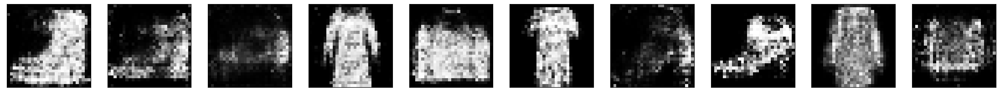

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 11ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:28,  2.63it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:25,  2.71it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


  1%|█                                                                                 | 3/234 [00:01<01:24,  2.72it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:24,  2.73it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:23,  2.74it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


  3%|██                                                                                | 6/234 [00:02<01:25,  2.67it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:27,  2.60it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:30,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:29,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:40,  2.23it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:34,  2.37it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:36,  2.30it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:37,  2.27it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:41,  2.16it/s]

epoch:  36
8/8 [==============================] - 0s 17ms/step


  6%|█████▏                                                                           | 15/234 [00:06<01:49,  1.99it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:40,  2.17it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:07<01:33,  2.32it/s]

epoch:  36
8/8 [==============================] - 0s 22ms/step


  8%|██████▏                                                                          | 18/234 [00:07<01:45,  2.05it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:56,  1.84it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


  9%|██████▉                                                                          | 20/234 [00:08<01:47,  1.99it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


  9%|███████▎                                                                         | 21/234 [00:09<01:42,  2.07it/s]

epoch:  36
8/8 [==============================] - 0s 18ms/step


  9%|███████▌                                                                         | 22/234 [00:09<01:44,  2.03it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:10<01:40,  2.09it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:10<01:42,  2.05it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:11<01:46,  1.96it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:11<01:36,  2.15it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:12<01:42,  2.02it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 12%|█████████▋                                                                       | 28/234 [00:12<01:36,  2.14it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 12%|██████████                                                                       | 29/234 [00:12<01:29,  2.29it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:13<01:34,  2.15it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 13%|██████████▋                                                                      | 31/234 [00:13<01:30,  2.23it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:14<01:37,  2.07it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:14<01:30,  2.23it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 15%|███████████▊                                                                     | 34/234 [00:15<01:31,  2.18it/s]

epoch:  36
8/8 [==============================] - 0s 16ms/step


 15%|████████████                                                                     | 35/234 [00:15<01:32,  2.16it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 15%|████████████▍                                                                    | 36/234 [00:16<01:25,  2.31it/s]

epoch:  36
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:16<01:31,  2.15it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 16%|█████████████▏                                                                   | 38/234 [00:17<01:32,  2.11it/s]

epoch:  36
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:17<01:41,  1.92it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:18<01:38,  1.97it/s]

epoch:  36
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:18<01:37,  1.98it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:19<01:28,  2.17it/s]

epoch:  36
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:19<01:30,  2.11it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:20<01:24,  2.25it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:20<01:21,  2.33it/s]

epoch:  36
8/8 [==============================] - 0s 17ms/step


 20%|███████████████▉                                                                 | 46/234 [00:20<01:23,  2.24it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 20%|████████████████▎                                                                | 47/234 [00:21<01:29,  2.08it/s]

epoch:  36
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:22<01:30,  2.05it/s]

epoch:  36
8/8 [==============================] - 0s 17ms/step


 21%|████████████████▉                                                                | 49/234 [00:22<01:32,  2.01it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:22<01:25,  2.16it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:23<01:24,  2.16it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:23<01:31,  1.99it/s]

epoch:  36
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:24<01:28,  2.05it/s]

epoch:  36
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▋                                                              | 54/234 [00:24<01:30,  1.98it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:25<01:24,  2.12it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 24%|███████████████████▍                                                             | 56/234 [00:25<01:18,  2.26it/s]

epoch:  36
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▋                                                             | 57/234 [00:26<01:27,  2.02it/s]

epoch:  36
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████                                                             | 58/234 [00:26<01:33,  1.87it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:27<01:28,  1.99it/s]

epoch:  36
8/8 [==============================] - 0s 17ms/step


 26%|████████████████████▊                                                            | 60/234 [00:27<01:28,  1.97it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:28<01:28,  1.96it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:28<01:23,  2.06it/s]

epoch:  36
8/8 [==============================] - 0s 18ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:29<01:29,  1.91it/s]

epoch:  36
8/8 [==============================] - 0s 18ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:30<01:31,  1.87it/s]

epoch:  36
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:30<01:31,  1.84it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:31<01:24,  1.99it/s]

epoch:  36
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:31<01:28,  1.88it/s]

epoch:  36
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:32<01:32,  1.80it/s]

epoch:  36
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:32<01:28,  1.86it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:33<01:26,  1.89it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:33<01:24,  1.92it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:34<01:17,  2.10it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:34<01:11,  2.26it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:34<01:07,  2.38it/s]

epoch:  36
8/8 [==============================] - 0s 17ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:35<01:14,  2.14it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:35<01:09,  2.26it/s]

epoch:  36
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:36<01:15,  2.07it/s]

epoch:  36
8/8 [==============================] - 0s 9ms/step


 33%|███████████████████████████                                                      | 78/234 [00:36<01:12,  2.15it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:37<01:14,  2.09it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:37<01:19,  1.94it/s]

epoch:  36
8/8 [==============================] - 0s 18ms/step


 35%|████████████████████████████                                                     | 81/234 [00:38<01:18,  1.95it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:38<01:12,  2.10it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:39<01:09,  2.16it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:39<01:05,  2.29it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:40<01:05,  2.26it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:40<01:04,  2.29it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:40<01:03,  2.30it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:41<01:01,  2.38it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:41<00:59,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:42<00:58,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:42<00:59,  2.38it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:42<00:57,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:43<00:59,  2.39it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:43<00:58,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:44<00:56,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:44<00:55,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:45<00:59,  2.31it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:45<00:56,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:45<00:55,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:46<00:59,  2.27it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:46<00:57,  2.32it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:47<00:55,  2.37it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:47<00:55,  2.35it/s]

epoch:  36
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:48<00:59,  2.17it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:48<00:56,  2.28it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:48<00:56,  2.26it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:49<00:54,  2.32it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:49<00:52,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:50<00:50,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:50<00:48,  2.55it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:50<00:47,  2.60it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:51<00:46,  2.61it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:51<00:46,  2.58it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:52<00:46,  2.59it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:52<00:46,  2.58it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:52<00:46,  2.54it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:53<00:49,  2.35it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:53<00:49,  2.36it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:54<00:48,  2.38it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:54<00:47,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:54<00:46,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:55<00:45,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:55<00:44,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:56<00:44,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:56<00:43,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:56<00:43,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:57<00:43,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:57<00:42,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:58<00:42,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:58<00:42,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:58<00:41,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:59<00:41,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:59<00:41,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:00<00:40,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:00<00:40,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:01<00:39,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:01<00:39,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:01<00:39,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:02<00:39,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:02<00:38,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:03<00:38,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:03<00:37,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:03<00:37,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:04<00:36,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:04<00:36,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:05<00:36,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:05<00:35,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:05<00:35,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:06<00:34,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:06<00:34,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:07<00:33,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:07<00:33,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:07<00:32,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:08<00:32,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:08<00:31,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:09<00:31,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:09<00:31,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:09<00:30,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:10<00:30,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:10<00:30,  2.39it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:11<00:30,  2.38it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:11<00:30,  2.35it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:12<00:29,  2.37it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:12<00:29,  2.39it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:12<00:28,  2.40it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:13<00:28,  2.39it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:13<00:27,  2.40it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:14<00:27,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:14<00:26,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:15<00:26,  2.40it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:15<00:26,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:15<00:25,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:16<00:25,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:16<00:24,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:17<00:24,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:17<00:23,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:17<00:23,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:18<00:23,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:18<00:22,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:19<00:22,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:19<00:21,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:19<00:21,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:20<00:20,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:20<00:20,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:21<00:20,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:21<00:19,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:22<00:19,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:22<00:18,  2.44it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:22<00:18,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:23<00:17,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:23<00:17,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:24<00:16,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:24<00:16,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:24<00:16,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:25<00:15,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:25<00:15,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:26<00:14,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:26<00:14,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:26<00:13,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:27<00:13,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:27<00:13,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:28<00:12,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:28<00:12,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:28<00:11,  2.52it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:29<00:11,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:29<00:11,  2.52it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:29<00:10,  2.52it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:30<00:10,  2.52it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:30<00:09,  2.52it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:31<00:09,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:31<00:09,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:31<00:08,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:32<00:08,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:32<00:07,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:33<00:07,  2.51it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:33<00:07,  2.50it/s]

epoch:  36
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:34<00:07,  2.42it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:34<00:06,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:34<00:06,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:35<00:05,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:35<00:05,  2.47it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:36<00:04,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:36<00:04,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:36<00:04,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:37<00:03,  2.48it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:37<00:03,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:38<00:02,  2.43it/s]

epoch:  36
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:38<00:02,  2.40it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:38<00:02,  2.41it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:39<00:01,  2.45it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:39<00:01,  2.46it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:40<00:00,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:40<00:00,  2.49it/s]

epoch:  36
8/8 [==============================] - 0s 11ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:40<00:00,  2.32it/s]


epoch:  36


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 11ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:32,  2.51it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:32,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  1%|█                                                                                 | 3/234 [00:01<01:32,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:32,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:31,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  3%|██                                                                                | 6/234 [00:02<01:31,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:31,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:30,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:30,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:29,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:29,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:31,  2.42it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:30,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:28,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:06<01:27,  2.51it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:27,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:27,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  8%|██████▏                                                                          | 18/234 [00:07<01:26,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:26,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  9%|██████▉                                                                          | 20/234 [00:08<01:26,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  9%|███████▎                                                                         | 21/234 [00:08<01:26,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:25,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 10%|███████▉                                                                         | 23/234 [00:09<01:25,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:24,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 11%|████████▋                                                                        | 25/234 [00:10<01:24,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 11%|█████████                                                                        | 26/234 [00:10<01:23,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:23,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 12%|█████████▋                                                                       | 28/234 [00:11<01:23,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 12%|██████████                                                                       | 29/234 [00:11<01:22,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 13%|██████████▍                                                                      | 30/234 [00:12<01:22,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 13%|██████████▋                                                                      | 31/234 [00:12<01:22,  2.46it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:21,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 14%|███████████▍                                                                     | 33/234 [00:13<01:21,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 15%|███████████▊                                                                     | 34/234 [00:13<01:20,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 15%|████████████                                                                     | 35/234 [00:14<01:19,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 15%|████████████▍                                                                    | 36/234 [00:14<01:19,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:19,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 16%|█████████████▏                                                                   | 38/234 [00:15<01:19,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 17%|█████████████▌                                                                   | 39/234 [00:15<01:18,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 17%|█████████████▊                                                                   | 40/234 [00:16<01:18,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▏                                                                  | 41/234 [00:16<01:17,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▌                                                                  | 42/234 [00:16<01:17,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▉                                                                  | 43/234 [00:17<01:16,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 19%|███████████████▏                                                                 | 44/234 [00:17<01:16,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 19%|███████████████▌                                                                 | 45/234 [00:18<01:16,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 20%|███████████████▉                                                                 | 46/234 [00:18<01:16,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 20%|████████████████▎                                                                | 47/234 [00:18<01:15,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:19<01:15,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 21%|████████████████▉                                                                | 49/234 [00:19<01:14,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 21%|█████████████████▎                                                               | 50/234 [00:20<01:14,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 22%|█████████████████▋                                                               | 51/234 [00:20<01:14,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 22%|██████████████████                                                               | 52/234 [00:20<01:13,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 23%|██████████████████▎                                                              | 53/234 [00:21<01:13,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 23%|██████████████████▋                                                              | 54/234 [00:21<01:12,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████                                                              | 55/234 [00:22<01:12,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████▍                                                             | 56/234 [00:22<01:11,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:11,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 25%|████████████████████                                                             | 58/234 [00:23<01:11,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 25%|████████████████████▍                                                            | 59/234 [00:23<01:11,  2.45it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 26%|████████████████████▊                                                            | 60/234 [00:24<01:11,  2.43it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████                                                            | 61/234 [00:24<01:12,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:25<01:12,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:25<01:11,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:25<01:11,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:26<01:10,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:26<01:10,  2.39it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:27<01:09,  2.40it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:27<01:09,  2.40it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:28<01:09,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:28<01:10,  2.33it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:28<01:09,  2.35it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:29<01:07,  2.40it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:29<01:06,  2.41it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:30<01:05,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:30<01:07,  2.37it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:30<01:04,  2.43it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:31<01:02,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:31<01:01,  2.55it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:32<01:00,  2.58it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:32<00:59,  2.59it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:32<00:59,  2.57it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:33<00:59,  2.55it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:33<00:58,  2.57it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:33<00:58,  2.57it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:34<01:02,  2.37it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:34<01:00,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:35<01:01,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:35<01:01,  2.37it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:36<00:59,  2.42it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:36<00:58,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:36<00:58,  2.45it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:37<00:57,  2.46it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:37<00:56,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:38<00:56,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:38<00:55,  2.51it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:38<00:54,  2.53it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:39<00:53,  2.55it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:39<00:52,  2.58it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:40<00:51,  2.60it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:40<00:51,  2.61it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:40<00:50,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:41<00:50,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:41<00:49,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:41<00:50,  2.55it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:42<00:52,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:42<00:52,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:43<00:52,  2.44it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:43<00:54,  2.32it/s]

epoch:  37
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:44<01:04,  1.93it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:44<01:01,  2.03it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:45<00:58,  2.10it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:45<00:55,  2.21it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:46<00:52,  2.31it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:46<00:50,  2.39it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:46<00:48,  2.45it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:47<00:47,  2.46it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:47<00:46,  2.52it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:48<00:45,  2.55it/s]

epoch:  37
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:48<00:45,  2.52it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:48<00:44,  2.56it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:49<00:44,  2.53it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:49<00:43,  2.57it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:49<00:42,  2.59it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:50<00:43,  2.53it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:50<00:42,  2.57it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:51<00:42,  2.56it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:51<00:42,  2.53it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:52<00:43,  2.46it/s]

epoch:  37
8/8 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:52<00:43,  2.42it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:52<00:41,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:53<00:41,  2.50it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:53<00:41,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:54<00:40,  2.49it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:54<00:40,  2.47it/s]

epoch:  37
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:54<00:41,  2.36it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:55<00:45,  2.16it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:55<00:44,  2.17it/s]

epoch:  37
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:56<00:43,  2.20it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:56<00:45,  2.09it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:57<00:45,  2.08it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:57<00:43,  2.16it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:58<00:40,  2.26it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:58<00:38,  2.35it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:59<00:40,  2.23it/s]

epoch:  37
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:59<00:39,  2.24it/s]

epoch:  37
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:00<00:40,  2.15it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:00<00:39,  2.18it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:00<00:40,  2.11it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:01<00:39,  2.13it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:01<00:37,  2.23it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:02<00:35,  2.32it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:02<00:34,  2.36it/s]

epoch:  37
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:03<00:38,  2.11it/s]

epoch:  37
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:03<00:40,  2.00it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:04<00:36,  2.14it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:04<00:34,  2.24it/s]

epoch:  37
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:05<00:34,  2.24it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:05<00:32,  2.34it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:05<00:31,  2.38it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:06<00:31,  2.33it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:06<00:30,  2.41it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:07<00:29,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 13ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:07<00:29,  2.39it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:07<00:28,  2.43it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:08<00:27,  2.48it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:08<00:26,  2.52it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:09<00:26,  2.56it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:09<00:25,  2.58it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:09<00:24,  2.60it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:10<00:24,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:10<00:23,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:10<00:23,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:11<00:23,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:11<00:22,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:12<00:22,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:12<00:22,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:12<00:21,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:13<00:21,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:13<00:20,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:13<00:20,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:14<00:20,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:14<00:19,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:15<00:19,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:15<00:19,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:15<00:18,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:16<00:18,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:16<00:17,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:16<00:17,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:17<00:17,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:17<00:16,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:18<00:16,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:18<00:16,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:18<00:15,  2.61it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:19<00:15,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:19<00:14,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:20<00:14,  2.66it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:20<00:13,  2.65it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:20<00:13,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:21<00:13,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:21<00:12,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 11ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:21<00:12,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:22<00:12,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:22<00:11,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:23<00:11,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:23<00:11,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:23<00:10,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:24<00:10,  2.65it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:24<00:09,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:24<00:09,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:25<00:09,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:25<00:08,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:26<00:08,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:26<00:07,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:26<00:07,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:27<00:07,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:27<00:06,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:27<00:06,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:28<00:06,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:28<00:05,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:29<00:05,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:29<00:04,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:29<00:04,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:30<00:04,  2.65it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:30<00:03,  2.65it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:31<00:03,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:31<00:03,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:31<00:02,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:32<00:02,  2.64it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:32<00:01,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:32<00:01,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:33<00:01,  2.62it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:33<00:00,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:34<00:00,  2.63it/s]

epoch:  37
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:34<00:00,  2.48it/s]


epoch:  37


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:28,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:28,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:28,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:28,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:26,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:26,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:26,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:26,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:25,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:25,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:24,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:24,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:04<01:24,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:23,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:22,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:22,  2.65it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:22,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:22,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:22,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:21,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:07<01:21,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:21,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:08<01:20,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:19,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:19,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:09<01:18,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:18,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:18,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:11<01:17,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:17,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:11<01:17,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:16,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:16,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:12<01:15,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:15,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:13<01:15,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:14,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:14<01:14,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:14<01:14,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:14,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:15<01:13,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:15<01:13,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:16<01:12,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:16<01:12,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:11,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:17<01:11,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:17<01:11,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:18<01:10,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:18<01:12,  2.54it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:11,  2.56it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:19<01:10,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:19<01:10,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:20<01:09,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:20<01:09,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:20<01:08,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:21<01:07,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:21<01:07,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:22<01:07,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:22<01:06,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:22<01:06,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████                                                            | 61/234 [00:23<01:05,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:23<01:05,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:24<01:04,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:24<01:04,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:24<01:04,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:25<01:03,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:25<01:03,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 9ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:25<01:02,  2.66it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:26<01:02,  2.65it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:26<01:02,  2.64it/s]

epoch:  38
8/8 [==============================] - 0s 11ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:27<01:02,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:27<01:01,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:27<01:01,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:28<01:01,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:28<01:00,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:28<01:00,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:29<01:00,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:29<00:59,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:30<00:58,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:30<00:58,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:30<00:58,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:31<01:00,  2.53it/s]

epoch:  38
8/8 [==============================] - 0s 11ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:31<01:00,  2.51it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:32<00:59,  2.53it/s]

epoch:  38
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:32<00:59,  2.52it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:32<00:58,  2.55it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:33<00:57,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:33<00:56,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:34<00:55,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:34<00:55,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:34<00:54,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:35<00:54,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:35<00:53,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:35<00:53,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:36<00:52,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:36<00:52,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:37<00:52,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:37<00:51,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:37<00:51,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:38<00:50,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:38<00:50,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:38<00:50,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:39<00:50,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:39<00:49,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:40<00:49,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:40<00:48,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:40<00:48,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:41<00:48,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:41<00:47,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:42<00:47,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:42<00:47,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:42<00:46,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:43<00:46,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:43<00:45,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:43<00:45,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:44<00:44,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:44<00:44,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:45<00:44,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:45<00:43,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:45<00:43,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:46<00:43,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:46<00:42,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:46<00:42,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:47<00:42,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:47<00:41,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:48<00:41,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:48<00:40,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:48<00:40,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:49<00:39,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:49<00:39,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:50<00:39,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:50<00:38,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:50<00:38,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:51<00:38,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:51<00:37,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:51<00:37,  2.63it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:52<00:37,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:52<00:36,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:53<00:36,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:53<00:36,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:53<00:35,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:54<00:35,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:54<00:34,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:55<00:34,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:55<00:34,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:55<00:33,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:56<00:33,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:56<00:32,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:56<00:32,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:57<00:32,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:57<00:31,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:58<00:31,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [00:58<00:31,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [00:58<00:30,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [00:59<00:30,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [00:59<00:29,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:00<00:29,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:00<00:29,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:00<00:28,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:01<00:28,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:01<00:28,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:01<00:27,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:02<00:27,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:02<00:26,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:03<00:26,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:03<00:26,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:03<00:25,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:04<00:25,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:04<00:25,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:05<00:24,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:05<00:24,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:05<00:23,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:06<00:23,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:06<00:23,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:06<00:22,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 11ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:07<00:22,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:07<00:22,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:08<00:21,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:08<00:21,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:08<00:20,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:09<00:20,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:09<00:19,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:10<00:19,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:10<00:19,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:10<00:18,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:11<00:18,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:11<00:18,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:11<00:17,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:12<00:17,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:12<00:16,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:13<00:16,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:13<00:16,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:13<00:15,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:14<00:15,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:14<00:14,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:15<00:14,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:15<00:14,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:15<00:13,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:16<00:13,  2.62it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:16<00:13,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:16<00:12,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:17<00:12,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:17<00:11,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:18<00:11,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:18<00:11,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:18<00:10,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:19<00:10,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:19<00:10,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:20<00:09,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:20<00:09,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:20<00:08,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:21<00:08,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:21<00:08,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:21<00:07,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:22<00:07,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:22<00:06,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:23<00:06,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:23<00:06,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:23<00:05,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:24<00:05,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:24<00:05,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:25<00:04,  2.56it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:25<00:04,  2.56it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:25<00:03,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:26<00:03,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:26<00:03,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:27<00:02,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:27<00:02,  2.57it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:27<00:01,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:28<00:01,  2.58it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:28<00:01,  2.60it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:28<00:00,  2.61it/s]

epoch:  38
8/8 [==============================] - 0s 11ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:29<00:00,  2.59it/s]

epoch:  38
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:29<00:00,  2.61it/s]


epoch:  38


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:32,  2.53it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:30,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:29,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:29,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:28,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:28,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:27,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:27,  2.60it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:27,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:29,  2.50it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:28,  2.53it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:27,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:26,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:25,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:24,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:24,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:23,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:06<01:23,  2.60it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:22,  2.60it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:22,  2.60it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:08<01:22,  2.60it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:26,  2.45it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 10%|███████▉                                                                         | 23/234 [00:09<01:25,  2.46it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:24,  2.50it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:23,  2.51it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:10<01:22,  2.53it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:21,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:20,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:11<01:20,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:20,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:12<01:19,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:19,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:18,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:13<01:17,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:17,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:14<01:16,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:16,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:14<01:16,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:15<01:15,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:15,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:16<01:14,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▌                                                                  | 42/234 [00:16<01:14,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:16<01:13,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:17<01:13,  2.59it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:13,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:17<01:12,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:18<01:12,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:18<01:12,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:19<01:12,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:11,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:19<01:11,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:20<01:10,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:20<01:10,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:21<01:10,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████                                                              | 55/234 [00:21<01:09,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:21<01:09,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:08,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:22<01:08,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 25%|████████████████████▍                                                            | 59/234 [00:23<01:08,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:23<01:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████                                                            | 61/234 [00:23<01:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:24<01:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:24<01:06,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:24<01:06,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:25<01:05,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:25<01:05,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:26<01:05,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:26<01:04,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:26<01:04,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:27<01:03,  2.58it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:27<01:03,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:28<01:02,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:28<01:02,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:28<01:02,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:29<01:01,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:29<01:01,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:30<01:01,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:30<01:00,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:30<01:00,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:31<01:00,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:31<00:59,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:31<00:59,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:32<00:58,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:32<00:58,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:33<00:58,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:33<00:57,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:33<00:57,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:34<00:57,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:34<00:56,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:35<00:56,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:35<00:56,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:35<00:55,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:36<00:55,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:36<00:55,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:37<00:54,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:37<00:54,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:37<00:53,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:38<00:53,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:38<00:52,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:39<00:52,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:39<00:52,  2.53it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:39<00:52,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:40<00:51,  2.52it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:40<01:01,  2.13it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:41<01:00,  2.14it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:41<01:01,  2.09it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:42<00:59,  2.15it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:42<00:57,  2.19it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:43<00:55,  2.24it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:43<00:54,  2.28it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:43<00:53,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:44<00:52,  2.33it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:44<00:51,  2.33it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:45<00:52,  2.30it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:45<00:51,  2.30it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:46<00:50,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:46<00:50,  2.33it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:46<00:49,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:47<00:49,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:47<00:49,  2.29it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:48<00:50,  2.26it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:48<00:49,  2.24it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:49<00:48,  2.27it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:49<00:51,  2.14it/s]

epoch:  39
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:50<00:54,  2.02it/s]

epoch:  39
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:50<00:54,  2.00it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:51<00:51,  2.06it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:51<00:48,  2.18it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:52<00:45,  2.28it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:52<00:47,  2.20it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:53<00:48,  2.14it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:53<00:45,  2.24it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:53<00:43,  2.31it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:54<00:42,  2.35it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:54<00:42,  2.35it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:55<00:42,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:55<00:41,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:55<00:41,  2.31it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:56<00:40,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:56<00:40,  2.30it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:57<00:40,  2.32it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:57<00:39,  2.36it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:58<00:38,  2.39it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:58<00:37,  2.43it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:58<00:36,  2.46it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:59<00:35,  2.46it/s]

epoch:  39
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:59<00:41,  2.09it/s]

epoch:  39
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:00<00:41,  2.08it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:00<00:41,  2.07it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:01<00:38,  2.18it/s]

epoch:  39
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:01<00:41,  1.99it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:02<00:38,  2.12it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:02<00:36,  2.22it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:03<00:34,  2.29it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:03<00:33,  2.36it/s]

epoch:  39
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:04<00:35,  2.23it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:04<00:38,  1.98it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:05<00:36,  2.07it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:05<00:35,  2.12it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:05<00:33,  2.19it/s]

epoch:  39
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:06<00:37,  1.97it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:07<00:38,  1.87it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:07<00:36,  1.94it/s]

epoch:  39
8/8 [==============================] - 0s 23ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:08<00:37,  1.84it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:08<00:34,  2.01it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:09<00:31,  2.15it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:09<00:29,  2.26it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:09<00:28,  2.35it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:10<00:26,  2.41it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:10<00:26,  2.46it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:10<00:25,  2.47it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:11<00:24,  2.48it/s]

epoch:  39
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:11<00:27,  2.19it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:12<00:26,  2.29it/s]

epoch:  39
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:12<00:28,  2.05it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:13<00:27,  2.10it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:13<00:26,  2.16it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:14<00:24,  2.25it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:14<00:25,  2.19it/s]

epoch:  39
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:15<00:28,  1.89it/s]

epoch:  39
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:16<00:31,  1.70it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:16<00:30,  1.72it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:17<00:28,  1.79it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:17<00:25,  1.97it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:18<00:23,  2.08it/s]

epoch:  39
8/8 [==============================] - 0s 11ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:18<00:21,  2.19it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:18<00:20,  2.29it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:19<00:19,  2.33it/s]

epoch:  39
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:19<00:21,  2.05it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:20<00:20,  2.18it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:20<00:20,  2.13it/s]

epoch:  39
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:21<00:19,  2.13it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:21<00:20,  2.03it/s]

epoch:  39
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:22<00:21,  1.89it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:22<00:19,  2.05it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:23<00:17,  2.18it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:23<00:16,  2.28it/s]

epoch:  39
8/8 [==============================] - 0s 13ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:24<00:17,  2.04it/s]

epoch:  39
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:24<00:19,  1.83it/s]

epoch:  39
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:25<00:19,  1.76it/s]

epoch:  39
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:25<00:18,  1.82it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:26<00:16,  1.99it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:26<00:14,  2.14it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:27<00:13,  2.26it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:27<00:12,  2.35it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:27<00:11,  2.41it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:28<00:10,  2.46it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:28<00:10,  2.49it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:29<00:09,  2.52it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:29<00:09,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:29<00:09,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:30<00:08,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:30<00:08,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:30<00:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:31<00:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:31<00:07,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:32<00:06,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:32<00:06,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:32<00:05,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:33<00:05,  2.54it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:33<00:05,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:34<00:04,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:34<00:04,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:34<00:03,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:35<00:03,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:35<00:03,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:36<00:02,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:36<00:02,  2.57it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:36<00:01,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:37<00:01,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:37<00:01,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:38<00:00,  2.56it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:38<00:00,  2.55it/s]

epoch:  39
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:38<00:00,  2.37it/s]


epoch:  39


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 10ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:31,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:31,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:30,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:30,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:29,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  3%|██                                                                                | 6/234 [00:02<01:29,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:28,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:28,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:27,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:27,  2.57it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:26,  2.57it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:26,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:26,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:25,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:25,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:25,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:25,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:07<01:24,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:24,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:23,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:08<01:23,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:23,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:09<01:22,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:22,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:21,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:10<01:21,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:20,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:10<01:20,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 12%|██████████                                                                       | 29/234 [00:11<01:19,  2.57it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:19,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:12<01:19,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:19,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:12<01:18,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:13<01:18,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:17,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:14<01:17,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:17,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 16%|█████████████▏                                                                   | 38/234 [00:14<01:16,  2.56it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:15<01:17,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:18,  2.48it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▏                                                                  | 41/234 [00:16<01:18,  2.45it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▌                                                                  | 42/234 [00:16<01:18,  2.46it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:16<01:16,  2.49it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▏                                                                 | 44/234 [00:17<01:16,  2.50it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:15,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:18<01:14,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 20%|████████████████▎                                                                | 47/234 [00:18<01:14,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:18<01:13,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:19<01:13,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:12,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:20<01:11,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:20<01:11,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:20<01:11,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:21<01:10,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████                                                              | 55/234 [00:21<01:10,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▍                                                             | 56/234 [00:22<01:10,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:09,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:22<01:09,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:23<01:08,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 26%|████████████████████▊                                                            | 60/234 [00:23<01:08,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████                                                            | 61/234 [00:23<01:07,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:24<01:07,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:24<01:06,  2.55it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:25<01:08,  2.47it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:25<01:08,  2.48it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:26<01:06,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:26<01:06,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:26<01:05,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:27<01:05,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:27<01:04,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:27<01:04,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:28<01:04,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:28<01:03,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:29<01:03,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:29<01:02,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:29<01:02,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:30<01:01,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:30<01:01,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:31<01:00,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:31<01:00,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:31<01:00,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:32<00:59,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:32<00:59,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:33<00:59,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:33<00:58,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:33<00:58,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:34<00:57,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:34<00:57,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:35<00:57,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:35<00:56,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:35<00:56,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:36<00:55,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:36<00:55,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:37<00:55,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:37<00:54,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:37<00:54,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:38<00:53,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:38<00:53,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:39<00:53,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:39<00:53,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:39<00:52,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:40<00:52,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:40<00:51,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:40<00:51,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:41<00:50,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:41<00:50,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:42<00:50,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:42<00:49,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:42<00:49,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:43<00:48,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:43<00:48,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:44<00:48,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:44<00:47,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:44<00:47,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:45<00:47,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:45<00:46,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:46<00:46,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:46<00:45,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:46<00:45,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:47<00:44,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:47<00:44,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:48<00:44,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:48<00:43,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:48<00:43,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:49<00:43,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:49<00:42,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:50<00:42,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:50<00:41,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:50<00:41,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:51<00:41,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:51<00:40,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:52<00:40,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:52<00:39,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:52<00:39,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:53<00:39,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:53<00:38,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:54<00:38,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:54<00:37,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:54<00:37,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:55<00:37,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:55<00:36,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:55<00:36,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [00:56<00:35,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [00:56<00:35,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [00:57<00:35,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [00:57<00:34,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [00:57<00:34,  2.50it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [00:58<00:34,  2.49it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [00:58<00:33,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [00:59<00:33,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [00:59<00:33,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [00:59<00:32,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:00<00:32,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:00<00:31,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:01<00:31,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:01<00:30,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:01<00:30,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:02<00:29,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:02<00:29,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:03<00:31,  2.38it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:03<00:30,  2.40it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:04<00:29,  2.43it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:04<00:28,  2.46it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:04<00:28,  2.49it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:05<00:27,  2.49it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:05<00:27,  2.50it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:05<00:26,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:06<00:26,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:06<00:25,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:07<00:25,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:07<00:24,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:07<00:24,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:08<00:24,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:08<00:23,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:09<00:23,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:09<00:22,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:09<00:22,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:10<00:22,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:10<00:21,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:11<00:21,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:11<00:20,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:11<00:20,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:12<00:20,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:12<00:19,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:13<00:19,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:13<00:18,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:13<00:18,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:14<00:18,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:14<00:17,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:15<00:17,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:15<00:17,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:15<00:16,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:16<00:16,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:16<00:15,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:17<00:15,  2.54it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:17<00:15,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:17<00:14,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:18<00:14,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:18<00:13,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:19<00:13,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:19<00:13,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:19<00:12,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:20<00:12,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:20<00:11,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:21<00:11,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:21<00:11,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:21<00:10,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:22<00:10,  2.53it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:22<00:10,  2.46it/s]

epoch:  40
8/8 [==============================] - 0s 12ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:23<00:09,  2.41it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:23<00:09,  2.45it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:23<00:09,  2.44it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:24<00:08,  2.46it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:24<00:08,  2.47it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:25<00:07,  2.49it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:25<00:07,  2.50it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:25<00:06,  2.50it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:26<00:06,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:26<00:05,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:27<00:05,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:27<00:05,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:27<00:04,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:28<00:04,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:28<00:03,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:29<00:03,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 11ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:29<00:03,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:29<00:02,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:30<00:02,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:30<00:01,  2.51it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:31<00:01,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:31<00:01,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:31<00:00,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:32<00:00,  2.52it/s]

epoch:  40
8/8 [==============================] - 0s 10ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:32<00:00,  2.53it/s]

epoch:  40
1/1 [==============================] - 0s 24ms/step


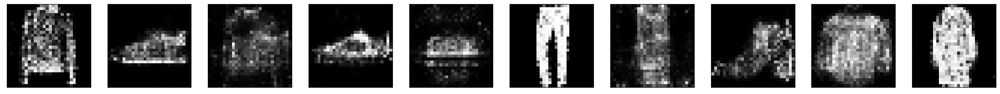

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 11ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:34,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:33,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  1%|█                                                                                 | 3/234 [00:01<01:31,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:31,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  2%|█▊                                                                                | 5/234 [00:01<01:30,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


  3%|██                                                                                | 6/234 [00:02<01:30,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  3%|██▍                                                                               | 7/234 [00:02<01:30,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:29,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:29,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


  4%|███▍                                                                             | 10/234 [00:03<01:29,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:28,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  5%|████▏                                                                            | 12/234 [00:04<01:28,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:27,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  6%|████▊                                                                            | 14/234 [00:05<01:27,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  6%|█████▏                                                                           | 15/234 [00:05<01:27,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  7%|█████▌                                                                           | 16/234 [00:06<01:27,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  7%|█████▉                                                                           | 17/234 [00:06<01:26,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  8%|██████▏                                                                          | 18/234 [00:07<01:25,  2.53it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  8%|██████▌                                                                          | 19/234 [00:07<01:24,  2.53it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  9%|██████▉                                                                          | 20/234 [00:07<01:24,  2.53it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


  9%|███████▎                                                                         | 21/234 [00:08<01:24,  2.53it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


  9%|███████▌                                                                         | 22/234 [00:08<01:24,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 10%|███████▉                                                                         | 23/234 [00:09<01:23,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 10%|████████▎                                                                        | 24/234 [00:09<01:23,  2.53it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 11%|████████▋                                                                        | 25/234 [00:09<01:23,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 11%|█████████                                                                        | 26/234 [00:10<01:22,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 12%|█████████▎                                                                       | 27/234 [00:10<01:22,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 12%|█████████▋                                                                       | 28/234 [00:11<01:21,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 12%|██████████                                                                       | 29/234 [00:11<01:21,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 13%|██████████▍                                                                      | 30/234 [00:11<01:21,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 13%|██████████▋                                                                      | 31/234 [00:12<01:20,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 14%|███████████                                                                      | 32/234 [00:12<01:20,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 14%|███████████▍                                                                     | 33/234 [00:13<01:19,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 15%|███████████▊                                                                     | 34/234 [00:13<01:20,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 15%|████████████                                                                     | 35/234 [00:13<01:19,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 15%|████████████▍                                                                    | 36/234 [00:14<01:18,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 16%|████████████▊                                                                    | 37/234 [00:14<01:18,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 16%|█████████████▏                                                                   | 38/234 [00:15<01:18,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▌                                                                   | 39/234 [00:15<01:17,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 17%|█████████████▊                                                                   | 40/234 [00:15<01:17,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▏                                                                  | 41/234 [00:16<01:16,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 18%|██████████████▌                                                                  | 42/234 [00:16<01:16,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 18%|██████████████▉                                                                  | 43/234 [00:17<01:16,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 19%|███████████████▏                                                                 | 44/234 [00:17<01:15,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 19%|███████████████▌                                                                 | 45/234 [00:17<01:15,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 20%|███████████████▉                                                                 | 46/234 [00:18<01:14,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 20%|████████████████▎                                                                | 47/234 [00:18<01:14,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▌                                                                | 48/234 [00:19<01:13,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 21%|████████████████▉                                                                | 49/234 [00:19<01:13,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 21%|█████████████████▎                                                               | 50/234 [00:19<01:13,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 22%|█████████████████▋                                                               | 51/234 [00:20<01:12,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 22%|██████████████████                                                               | 52/234 [00:20<01:12,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▎                                                              | 53/234 [00:21<01:11,  2.52it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 23%|██████████████████▋                                                              | 54/234 [00:21<01:11,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████                                                              | 55/234 [00:21<01:11,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 24%|███████████████████▍                                                             | 56/234 [00:22<01:10,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:22<01:10,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████                                                             | 58/234 [00:23<01:10,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 25%|████████████████████▍                                                            | 59/234 [00:23<01:10,  2.48it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 26%|████████████████████▊                                                            | 60/234 [00:23<01:10,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████                                                            | 61/234 [00:24<01:10,  2.46it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:24<01:09,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:25<01:08,  2.48it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:25<01:11,  2.38it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:26<01:11,  2.36it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:26<01:09,  2.40it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:26<01:08,  2.44it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:27<01:07,  2.46it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:27<01:06,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:28<01:06,  2.46it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:28<01:05,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:28<01:04,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:29<01:04,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:29<01:03,  2.51it/s]

epoch:  41
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:30<01:08,  2.31it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:30<01:06,  2.36it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:30<01:05,  2.40it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 33%|███████████████████████████                                                      | 78/234 [00:31<01:04,  2.43it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:31<01:03,  2.45it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:32<01:02,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████                                                     | 81/234 [00:32<01:01,  2.48it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:32<01:01,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:33<01:00,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:33<01:00,  2.49it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:34<00:59,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:34<00:59,  2.50it/s]

epoch:  41
8/8 [==============================] - 0s 10ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:34<00:59,  2.47it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:35<01:00,  2.41it/s]

epoch:  41
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:35<01:03,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:36<01:05,  2.19it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:36<01:06,  2.15it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:37<01:05,  2.17it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:37<01:04,  2.18it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:38<01:03,  2.19it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:38<01:02,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:39<01:02,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:39<01:02,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:39<01:01,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:40<01:00,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:40<00:59,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:41<00:59,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:41<00:58,  2.25it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:42<00:58,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:42<00:58,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:43<00:57,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:43<00:57,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:44<00:57,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:44<00:56,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:44<00:55,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:45<00:55,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:45<00:55,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:46<00:54,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:46<00:54,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:47<00:54,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:47<00:53,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:48<00:53,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:48<00:52,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:48<00:51,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:49<00:51,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:49<00:51,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:50<00:50,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:50<00:50,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:51<00:49,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:51<00:50,  2.20it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:52<00:49,  2.20it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:52<00:49,  2.20it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:53<00:48,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:53<00:47,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:53<00:46,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:54<00:46,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:54<00:45,  2.25it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:55<00:45,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:55<00:45,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:56<00:45,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:56<00:44,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [00:57<00:43,  2.25it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [00:57<00:43,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [00:57<00:42,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [00:58<00:42,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [00:58<00:41,  2.26it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [00:59<00:41,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [00:59<00:41,  2.21it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:00<00:40,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:00<00:39,  2.26it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:01<00:40,  2.20it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:01<00:39,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:01<00:39,  2.22it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:02<00:38,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:02<00:37,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:03<00:37,  2.26it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:03<00:36,  2.26it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:04<00:36,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:04<00:35,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:05<00:34,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:05<00:34,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:05<00:34,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:06<00:33,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:06<00:33,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:07<00:32,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:07<00:32,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:08<00:31,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:08<00:31,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:08<00:30,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:09<00:30,  2.31it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:09<00:29,  2.31it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:10<00:29,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:10<00:29,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:11<00:28,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:11<00:28,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:12<00:28,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:12<00:27,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:12<00:27,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:13<00:26,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:13<00:26,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:14<00:25,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:14<00:25,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:15<00:24,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:15<00:24,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:15<00:23,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:16<00:23,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:16<00:23,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:17<00:22,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:17<00:22,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:18<00:21,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:18<00:21,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:18<00:20,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:19<00:20,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:19<00:19,  2.31it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:20<00:19,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:20<00:19,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:21<00:18,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:21<00:18,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:22<00:17,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:22<00:17,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:22<00:17,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:23<00:16,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:23<00:16,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:24<00:15,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:24<00:15,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:25<00:14,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:25<00:14,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:25<00:14,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:26<00:13,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:26<00:13,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:27<00:12,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:27<00:12,  2.20it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:28<00:12,  2.23it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:28<00:11,  2.24it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:29<00:11,  2.26it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:29<00:10,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:29<00:10,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:30<00:09,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:30<00:09,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:31<00:08,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:31<00:08,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:32<00:07,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:32<00:07,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:33<00:06,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:33<00:06,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:33<00:06,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:34<00:05,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:34<00:05,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:35<00:04,  2.27it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:35<00:04,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 11ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:36<00:03,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:36<00:03,  2.30it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:36<00:03,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:37<00:02,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:37<00:02,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:38<00:01,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:38<00:01,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:39<00:00,  2.28it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:39<00:00,  2.29it/s]

epoch:  41
8/8 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:40<00:00,  2.34it/s]


epoch:  41


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 12ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:42,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:40,  2.31it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  1%|█                                                                                 | 3/234 [00:01<01:40,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:40,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:40,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  3%|██                                                                                | 6/234 [00:02<01:39,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:39,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:39,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  4%|███▏                                                                              | 9/234 [00:03<01:39,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:38,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:37,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:37,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:37,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:36,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  6%|█████▏                                                                           | 15/234 [00:06<01:36,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:35,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  7%|█████▉                                                                           | 17/234 [00:07<01:35,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  8%|██████▏                                                                          | 18/234 [00:07<01:34,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:34,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


  9%|██████▉                                                                          | 20/234 [00:08<01:36,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


  9%|███████▎                                                                         | 21/234 [00:09<01:35,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


  9%|███████▌                                                                         | 22/234 [00:09<01:33,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 10%|███████▉                                                                         | 23/234 [00:10<01:31,  2.30it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 10%|████████▎                                                                        | 24/234 [00:10<01:31,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 11%|████████▋                                                                        | 25/234 [00:10<01:31,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 11%|█████████                                                                        | 26/234 [00:11<01:30,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 12%|█████████▎                                                                       | 27/234 [00:11<01:30,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 12%|█████████▋                                                                       | 28/234 [00:12<01:30,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 12%|██████████                                                                       | 29/234 [00:12<01:30,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 13%|██████████▍                                                                      | 30/234 [00:13<01:29,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 13%|██████████▋                                                                      | 31/234 [00:13<01:29,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 14%|███████████                                                                      | 32/234 [00:14<01:29,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 14%|███████████▍                                                                     | 33/234 [00:14<01:28,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 15%|███████████▊                                                                     | 34/234 [00:14<01:28,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 15%|████████████                                                                     | 35/234 [00:15<01:27,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 15%|████████████▍                                                                    | 36/234 [00:15<01:26,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 16%|████████████▊                                                                    | 37/234 [00:16<01:25,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 16%|█████████████▏                                                                   | 38/234 [00:16<01:25,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▌                                                                   | 39/234 [00:17<01:25,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▊                                                                   | 40/234 [00:17<01:24,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▏                                                                  | 41/234 [00:18<01:24,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▌                                                                  | 42/234 [00:18<01:24,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▉                                                                  | 43/234 [00:18<01:24,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 19%|███████████████▏                                                                 | 44/234 [00:19<01:23,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 19%|███████████████▌                                                                 | 45/234 [00:19<01:22,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 20%|███████████████▉                                                                 | 46/234 [00:20<01:22,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 20%|████████████████▎                                                                | 47/234 [00:20<01:22,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:21<01:22,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 21%|████████████████▉                                                                | 49/234 [00:21<01:21,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 21%|█████████████████▎                                                               | 50/234 [00:21<01:21,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 22%|█████████████████▋                                                               | 51/234 [00:22<01:21,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 13ms/step


 22%|██████████████████                                                               | 52/234 [00:22<01:21,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▎                                                              | 53/234 [00:23<01:20,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▋                                                              | 54/234 [00:23<01:19,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████                                                              | 55/234 [00:24<01:18,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████▍                                                             | 56/234 [00:24<01:18,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████▋                                                             | 57/234 [00:25<01:17,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 25%|████████████████████                                                             | 58/234 [00:25<01:17,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 25%|████████████████████▍                                                            | 59/234 [00:25<01:17,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 26%|████████████████████▊                                                            | 60/234 [00:26<01:16,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████                                                            | 61/234 [00:26<01:16,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:27<01:15,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:27<01:15,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:28<01:14,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:28<01:14,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:29<01:13,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:29<01:13,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:29<01:13,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:30<01:12,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:30<01:13,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:31<01:12,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:31<01:11,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:32<01:11,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:32<01:10,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:33<01:10,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:33<01:09,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:33<01:09,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 33%|███████████████████████████                                                      | 78/234 [00:34<01:09,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:34<01:08,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:35<01:08,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 35%|████████████████████████████                                                     | 81/234 [00:35<01:07,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:36<01:06,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:36<01:06,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:37<01:06,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:37<01:05,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:37<01:05,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:38<01:04,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:38<01:04,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:39<01:03,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:39<01:03,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:40<01:02,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:40<01:02,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:40<01:01,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:41<01:03,  2.19it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:41<01:02,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:42<01:02,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:42<01:01,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:43<01:00,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:43<01:00,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:44<00:59,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:44<00:58,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:45<00:58,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:45<00:57,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:45<00:57,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:46<00:57,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:46<00:56,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:47<00:56,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:47<00:55,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:48<00:55,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:48<00:54,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:48<00:54,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:49<00:54,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:49<00:53,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:50<00:53,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:50<00:53,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:51<00:52,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:51<00:51,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:52<00:51,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:52<00:50,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:52<00:50,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:53<00:50,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:53<00:49,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:54<00:49,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:54<00:49,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:55<00:48,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:55<00:47,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:56<00:47,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:56<00:46,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:56<00:46,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:57<00:45,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:57<00:45,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:58<00:45,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [00:58<00:44,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [00:59<00:44,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [00:59<00:43,  2.28it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:00<00:42,  2.29it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:00<00:42,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:00<00:42,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:01<00:41,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:01<00:41,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:02<00:41,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:02<00:41,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:03<00:40,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:03<00:39,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:04<00:39,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:04<00:38,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:04<00:38,  2.27it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:05<00:38,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:05<00:37,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:06<00:37,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:06<00:36,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:07<00:36,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:07<00:35,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:08<00:35,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:08<00:36,  2.18it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:08<00:35,  2.19it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:09<00:34,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:09<00:34,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:10<00:33,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:10<00:33,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:11<00:32,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:11<00:31,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:12<00:31,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:12<00:31,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:12<00:30,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:13<00:30,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:13<00:29,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:14<00:29,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:14<00:29,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:15<00:28,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:15<00:27,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:16<00:27,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:16<00:27,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:16<00:26,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:17<00:26,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:17<00:25,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:18<00:25,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:18<00:25,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:19<00:24,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:19<00:23,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:20<00:23,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:20<00:22,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:20<00:22,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:21<00:22,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:21<00:21,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:22<00:21,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:22<00:21,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:23<00:20,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:23<00:20,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:24<00:19,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:24<00:19,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:25<00:18,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:25<00:18,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:25<00:17,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:26<00:17,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:26<00:17,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:27<00:16,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:27<00:16,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:28<00:15,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:28<00:15,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:29<00:14,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:29<00:14,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:29<00:13,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:30<00:13,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:30<00:13,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:31<00:12,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:31<00:12,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:32<00:11,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:32<00:11,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:33<00:10,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:33<00:10,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 11ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:33<00:09,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:34<00:09,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:34<00:08,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:35<00:08,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:35<00:07,  2.26it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:36<00:07,  2.18it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:36<00:07,  2.18it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:37<00:06,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:37<00:06,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:38<00:05,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:38<00:05,  2.22it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:38<00:04,  2.21it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:39<00:04,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:39<00:04,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:40<00:03,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:40<00:03,  2.25it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:41<00:02,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:41<00:02,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:42<00:01,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:42<00:01,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:42<00:00,  2.23it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:43<00:00,  2.24it/s]

epoch:  42
8/8 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:43<00:00,  2.25it/s]


epoch:  42


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 12ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:43,  2.26it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:43,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  1%|█                                                                                 | 3/234 [00:01<01:43,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:43,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:42,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  3%|██                                                                                | 6/234 [00:02<01:42,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:42,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:41,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:40,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:40,  2.24it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  5%|███▊                                                                             | 11/234 [00:04<01:39,  2.24it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:39,  2.24it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:38,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:38,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  6%|█████▏                                                                           | 15/234 [00:06<01:38,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:38,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  7%|█████▉                                                                           | 17/234 [00:07<01:37,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:37,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:36,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  9%|██████▉                                                                          | 20/234 [00:08<01:35,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  9%|███████▎                                                                         | 21/234 [00:09<01:35,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


  9%|███████▌                                                                         | 22/234 [00:09<01:34,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 10%|███████▉                                                                         | 23/234 [00:10<01:34,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 10%|████████▎                                                                        | 24/234 [00:10<01:34,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 11%|████████▋                                                                        | 25/234 [00:11<01:34,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 11%|█████████                                                                        | 26/234 [00:11<01:33,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 12%|█████████▎                                                                       | 27/234 [00:12<01:32,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 12%|█████████▋                                                                       | 28/234 [00:12<01:31,  2.24it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 12%|██████████                                                                       | 29/234 [00:12<01:31,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 13%|██████████▍                                                                      | 30/234 [00:13<01:30,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 13%|██████████▋                                                                      | 31/234 [00:13<01:30,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 14%|███████████                                                                      | 32/234 [00:14<01:29,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 14%|███████████▍                                                                     | 33/234 [00:14<01:30,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 15%|███████████▊                                                                     | 34/234 [00:15<01:29,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 15%|████████████                                                                     | 35/234 [00:15<01:29,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 15%|████████████▍                                                                    | 36/234 [00:16<01:29,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 16%|████████████▊                                                                    | 37/234 [00:16<01:28,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 16%|█████████████▏                                                                   | 38/234 [00:17<01:28,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▌                                                                   | 39/234 [00:17<01:27,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▊                                                                   | 40/234 [00:17<01:27,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:18<01:27,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▌                                                                  | 42/234 [00:18<01:27,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▉                                                                  | 43/234 [00:19<01:32,  2.08it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 19%|███████████████▏                                                                 | 44/234 [00:19<01:30,  2.11it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 19%|███████████████▌                                                                 | 45/234 [00:20<01:27,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 20%|███████████████▉                                                                 | 46/234 [00:20<01:26,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 20%|████████████████▎                                                                | 47/234 [00:21<01:25,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 21%|████████████████▌                                                                | 48/234 [00:21<01:24,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 21%|████████████████▉                                                                | 49/234 [00:22<01:23,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 21%|█████████████████▎                                                               | 50/234 [00:22<01:22,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 22%|█████████████████▋                                                               | 51/234 [00:23<01:22,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 22%|██████████████████                                                               | 52/234 [00:23<01:22,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▎                                                              | 53/234 [00:23<01:21,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▋                                                              | 54/234 [00:24<01:21,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████                                                              | 55/234 [00:24<01:20,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▍                                                             | 56/234 [00:25<01:22,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 10ms/step


 24%|███████████████████▋                                                             | 57/234 [00:25<01:19,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 11ms/step


 25%|████████████████████                                                             | 58/234 [00:26<01:18,  2.25it/s]

epoch:  43
8/8 [==============================] - 0s 10ms/step


 25%|████████████████████▍                                                            | 59/234 [00:26<01:17,  2.26it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 26%|████████████████████▊                                                            | 60/234 [00:27<01:17,  2.24it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████                                                            | 61/234 [00:27<01:17,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:27<01:17,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:28<01:16,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:28<01:16,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:29<01:16,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:29<01:15,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:30<01:15,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:30<01:15,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:31<01:14,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:31<01:14,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:32<01:13,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:32<01:12,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:32<01:12,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:33<01:12,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:33<01:11,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:34<01:10,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:34<01:10,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 33%|███████████████████████████                                                      | 78/234 [00:35<01:10,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:35<01:10,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:36<01:10,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████                                                     | 81/234 [00:36<01:09,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:37<01:09,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:37<01:08,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:37<01:08,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:38<01:07,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:38<01:07,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:39<01:07,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:39<01:06,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:40<01:05,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:40<01:05,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:41<01:04,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:41<01:03,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:41<01:03,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:42<01:02,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:42<01:02,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:43<01:01,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:43<01:01,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:44<01:01,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:44<01:00,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:45<01:00,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:45<00:59,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:46<00:59,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:46<00:59,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:46<00:59,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:47<00:58,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:47<00:58,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:48<00:57,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:48<00:56,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:49<00:56,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:49<00:55,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:50<00:55,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:50<00:55,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:51<00:55,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:51<00:54,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:51<00:54,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:52<00:53,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:52<00:52,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:53<00:52,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:53<00:51,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:54<00:51,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:54<00:51,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:55<00:51,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:55<00:50,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:56<00:50,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:56<00:49,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:56<00:48,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:57<00:48,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:57<00:47,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:58<00:47,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [00:58<00:48,  2.12it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [00:59<00:48,  2.14it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [00:59<00:47,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:00<00:46,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:00<00:45,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:01<00:44,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:01<00:44,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:01<00:44,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:02<00:43,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:02<00:43,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:03<00:42,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:03<00:42,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:04<00:41,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:04<00:41,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:05<00:40,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:05<00:39,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:06<00:39,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:06<00:39,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:06<00:38,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:07<00:38,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:07<00:37,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:08<00:37,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:08<00:37,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:09<00:36,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:09<00:36,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:10<00:35,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:10<00:35,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:10<00:34,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:11<00:34,  2.23it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:11<00:33,  2.22it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:12<00:33,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:12<00:33,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:13<00:32,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:13<00:32,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:14<00:31,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:14<00:31,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:15<00:30,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:15<00:30,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:15<00:30,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:16<00:29,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:16<00:29,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:17<00:28,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:17<00:28,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:18<00:27,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:18<00:27,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:19<00:27,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:19<00:26,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:20<00:26,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:20<00:25,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:21<00:25,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:21<00:24,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:21<00:24,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 11ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:22<00:23,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:22<00:23,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:23<00:22,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:23<00:22,  2.21it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:24<00:21,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:24<00:21,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:25<00:21,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:25<00:20,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:26<00:20,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:26<00:19,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:27<00:19,  2.11it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:27<00:19,  2.14it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:27<00:18,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:28<00:18,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:28<00:17,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:29<00:17,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:29<00:16,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:30<00:16,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:30<00:15,  2.20it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:31<00:15,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:31<00:14,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:32<00:14,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:32<00:13,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:32<00:13,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:33<00:12,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:33<00:12,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:34<00:11,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:34<00:11,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:35<00:11,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:35<00:10,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:36<00:10,  2.18it/s]

epoch:  43
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:36<00:10,  2.09it/s]

epoch:  43
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:37<00:09,  2.07it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:37<00:09,  2.05it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:38<00:08,  2.08it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:38<00:08,  2.12it/s]

epoch:  43
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:39<00:07,  2.13it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:39<00:07,  2.14it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:39<00:06,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:40<00:06,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:40<00:05,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:41<00:05,  2.15it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:41<00:04,  2.19it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:42<00:04,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:42<00:03,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:43<00:03,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:43<00:02,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:44<00:02,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:44<00:01,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:45<00:01,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:45<00:00,  2.16it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:45<00:00,  2.17it/s]

epoch:  43
8/8 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:46<00:00,  2.20it/s]


epoch:  43


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 12ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:46,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:45,  2.20it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:46,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:46,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:45,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:02<01:45,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:44,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:44,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:43,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:42,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:42,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:41,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  6%|████▌                                                                            | 13/234 [00:05<01:41,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:41,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  6%|█████▏                                                                           | 15/234 [00:06<01:41,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:39,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  7%|█████▉                                                                           | 17/234 [00:07<01:39,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:39,  2.18it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:42,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:40,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  9%|███████▎                                                                         | 21/234 [00:09<01:39,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


  9%|███████▌                                                                         | 22/234 [00:10<01:38,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:10<01:37,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:11<01:37,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 11%|████████▋                                                                        | 25/234 [00:11<01:36,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 11%|█████████                                                                        | 26/234 [00:12<01:36,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 12%|█████████▎                                                                       | 27/234 [00:12<01:35,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 12%|█████████▋                                                                       | 28/234 [00:12<01:35,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 12%|██████████                                                                       | 29/234 [00:13<01:34,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 13%|██████████▍                                                                      | 30/234 [00:13<01:34,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:14<01:33,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 14%|███████████                                                                      | 32/234 [00:14<01:33,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 14%|███████████▍                                                                     | 33/234 [00:15<01:32,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:15<01:32,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:16<01:31,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 15%|████████████▍                                                                    | 36/234 [00:16<01:31,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:17<01:31,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:17<01:31,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▌                                                                   | 39/234 [00:18<01:30,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 17%|█████████████▊                                                                   | 40/234 [00:18<01:29,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▏                                                                  | 41/234 [00:18<01:29,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▌                                                                  | 42/234 [00:19<01:28,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:19<01:28,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 19%|███████████████▏                                                                 | 44/234 [00:20<01:27,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 19%|███████████████▌                                                                 | 45/234 [00:20<01:27,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:21<01:26,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 20%|████████████████▎                                                                | 47/234 [00:21<01:26,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:22<01:26,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 21%|████████████████▉                                                                | 49/234 [00:22<01:25,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 21%|█████████████████▎                                                               | 50/234 [00:23<01:25,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 22%|█████████████████▋                                                               | 51/234 [00:23<01:24,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 22%|██████████████████                                                               | 52/234 [00:24<01:24,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▎                                                              | 53/234 [00:24<01:23,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▋                                                              | 54/234 [00:24<01:23,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:25<01:23,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████▍                                                             | 56/234 [00:25<01:22,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████▋                                                             | 57/234 [00:26<01:21,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████                                                             | 58/234 [00:26<01:21,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 25%|████████████████████▍                                                            | 59/234 [00:27<01:21,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 26%|████████████████████▊                                                            | 60/234 [00:27<01:20,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████                                                            | 61/234 [00:28<01:20,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:28<01:19,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:29<01:19,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:29<01:18,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:30<01:18,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:30<01:19,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:31<01:19,  2.11it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:31<01:18,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:31<01:18,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:32<01:17,  2.11it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:32<01:16,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:33<01:15,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:33<01:14,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:34<01:14,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:34<01:13,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:35<01:13,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:35<01:13,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 33%|███████████████████████████                                                      | 78/234 [00:36<01:12,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:36<01:12,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:37<01:14,  2.06it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████                                                     | 81/234 [00:37<01:13,  2.09it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:38<01:11,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:38<01:13,  2.06it/s]

epoch:  44
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:39<01:11,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 11ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:39<01:09,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 11ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:39<01:07,  2.20it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:40<01:07,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:40<01:07,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:41<01:06,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:41<01:06,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:42<01:06,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:42<01:05,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:43<01:05,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:43<01:05,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:44<01:04,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:44<01:04,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:45<01:03,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:45<01:03,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:45<01:02,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:46<01:02,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:46<01:01,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:47<01:01,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:47<01:00,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:48<01:00,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:48<00:59,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:49<00:59,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:49<00:59,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:50<00:58,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:50<00:57,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:51<00:57,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:51<00:56,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:51<00:56,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:52<00:56,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:52<00:55,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:53<00:55,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:53<00:54,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:54<00:54,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:54<00:53,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:55<00:53,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:55<00:53,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:56<00:52,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:56<00:52,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:57<00:51,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:57<00:51,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:58<00:50,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:58<00:50,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [00:58<00:49,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [00:59<00:48,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [00:59<00:48,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:00<00:48,  2.17it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:00<00:47,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:01<00:47,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:01<00:46,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:02<00:46,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:02<00:45,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:03<00:45,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:03<00:44,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:04<00:44,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:04<00:44,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:04<00:43,  2.16it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:05<00:43,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:05<00:42,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:06<00:42,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:06<00:41,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:07<00:41,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:07<00:41,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:08<00:40,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:08<00:40,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:09<00:41,  2.06it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:09<00:40,  2.09it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:10<00:39,  2.11it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:10<00:39,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:11<00:38,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:11<00:37,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:12<00:36,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:12<00:36,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:12<00:35,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:13<00:35,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:13<00:34,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:14<00:34,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:14<00:34,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:15<00:33,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:15<00:33,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:16<00:32,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:16<00:32,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:17<00:31,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:17<00:31,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:18<00:30,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:18<00:30,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:19<00:29,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:19<00:29,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:19<00:28,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:20<00:28,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:20<00:28,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:21<00:27,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:21<00:26,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:22<00:26,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:22<00:26,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:23<00:25,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:23<00:25,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:24<00:24,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:24<00:24,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:25<00:23,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:25<00:23,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:26<00:23,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:26<00:22,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:26<00:22,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:27<00:21,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:27<00:21,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:28<00:20,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:28<00:20,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:29<00:19,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:29<00:19,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:30<00:18,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:30<00:18,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:31<00:17,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:31<00:17,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:32<00:16,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:32<00:16,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:33<00:15,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:33<00:15,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:34<00:14,  2.15it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:34<00:14,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:34<00:13,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:35<00:13,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:35<00:13,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:36<00:12,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:36<00:12,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:37<00:11,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:37<00:11,  2.06it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:38<00:11,  2.08it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:38<00:10,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:39<00:09,  2.10it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:39<00:09,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:40<00:09,  2.11it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:40<00:08,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:41<00:07,  2.14it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:41<00:07,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:42<00:07,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:42<00:06,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:42<00:06,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:43<00:05,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:43<00:05,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:44<00:04,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:44<00:04,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:45<00:03,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:45<00:03,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:46<00:02,  2.11it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:46<00:02,  2.12it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:47<00:01,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:47<00:01,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:48<00:00,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 13ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:48<00:00,  2.13it/s]

epoch:  44
8/8 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:49<00:00,  2.15it/s]


epoch:  44


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 13ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:49,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:48,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:47,  2.15it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:47,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:47,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:02<01:47,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:47,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:46,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:46,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:45,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:45,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:44,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:43,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:43,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:43,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:42,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:42,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:41,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


  8%|██████▌                                                                          | 19/234 [00:08<01:41,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:40,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  9%|███████▎                                                                         | 21/234 [00:09<01:40,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


  9%|███████▌                                                                         | 22/234 [00:10<01:40,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:10<01:39,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:11<01:39,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 11%|████████▋                                                                        | 25/234 [00:11<01:39,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 11%|█████████                                                                        | 26/234 [00:12<01:39,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 12%|█████████▎                                                                       | 27/234 [00:12<01:38,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 12%|█████████▋                                                                       | 28/234 [00:13<01:36,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 12%|██████████                                                                       | 29/234 [00:13<01:36,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 13%|██████████▍                                                                      | 30/234 [00:14<01:35,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:14<01:35,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:15<01:34,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:15<01:34,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:16<01:34,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:16<01:34,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:16<01:33,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:17<01:36,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:17<01:34,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▌                                                                   | 39/234 [00:18<01:33,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:18<01:32,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:19<01:31,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▌                                                                  | 42/234 [00:19<01:31,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 18%|██████████████▉                                                                  | 43/234 [00:20<01:30,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▏                                                                 | 44/234 [00:20<01:30,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▌                                                                 | 45/234 [00:21<01:29,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:21<01:28,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 20%|████████████████▎                                                                | 47/234 [00:22<01:28,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:22<01:28,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 21%|████████████████▉                                                                | 49/234 [00:23<01:27,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 21%|█████████████████▎                                                               | 50/234 [00:23<01:27,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 22%|█████████████████▋                                                               | 51/234 [00:24<01:26,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 22%|██████████████████                                                               | 52/234 [00:24<01:26,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 23%|██████████████████▎                                                              | 53/234 [00:25<01:26,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▋                                                              | 54/234 [00:25<01:25,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:26<01:25,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▍                                                             | 56/234 [00:26<01:24,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 24%|███████████████████▋                                                             | 57/234 [00:26<01:23,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 25%|████████████████████                                                             | 58/234 [00:27<01:23,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████▍                                                            | 59/234 [00:27<01:22,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 26%|████████████████████▊                                                            | 60/234 [00:28<01:22,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 26%|█████████████████████                                                            | 61/234 [00:28<01:21,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:29<01:21,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:29<01:20,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:30<01:20,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:30<01:19,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:31<01:19,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:31<01:18,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:32<01:18,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:32<01:18,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:33<01:17,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:33<01:17,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:34<01:16,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:34<01:15,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:34<01:15,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:35<01:14,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:35<01:14,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:36<01:14,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 33%|███████████████████████████                                                      | 78/234 [00:36<01:13,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:37<01:13,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:37<01:12,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:38<01:21,  1.87it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:38<01:17,  1.96it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:39<01:14,  2.02it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:39<01:13,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:40<01:11,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:40<01:10,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:41<01:09,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:41<01:08,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:42<01:08,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:42<01:07,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:43<01:06,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:43<01:06,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:44<01:05,  2.15it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:44<01:05,  2.15it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:45<01:04,  2.15it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:45<01:04,  2.15it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:45<01:03,  2.14it/s]

epoch:  45
8/8 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:46<01:06,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:46<01:04,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:47<01:03,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:47<01:03,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:48<01:02,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:48<01:01,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:49<01:01,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:49<01:00,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 11ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:50<00:58,  2.17it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:50<00:58,  2.19it/s]

epoch:  45
8/8 [==============================] - 0s 11ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:51<00:57,  2.20it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:51<00:57,  2.18it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:52<00:57,  2.16it/s]

epoch:  45
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:52<00:59,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:53<00:59,  2.04it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:53<00:59,  2.04it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:54<00:58,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:54<00:57,  2.06it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:55<00:57,  2.06it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:55<00:56,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:55<00:56,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:56<00:55,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:56<00:55,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:57<00:54,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:57<00:54,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:58<00:53,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [00:58<00:53,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [00:59<00:52,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [00:59<00:51,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:00<00:50,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:00<00:50,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:01<00:49,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:01<00:48,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:02<00:48,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:02<00:47,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:03<00:47,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:03<00:47,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:04<00:46,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:04<00:46,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:04<00:45,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:05<00:45,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:05<00:44,  2.13it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:06<00:44,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:06<00:44,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:07<00:43,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:07<00:43,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:08<00:42,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:08<00:42,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:09<00:41,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:09<00:41,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:10<00:40,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:10<00:40,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:11<00:39,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:11<00:39,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:12<00:40,  2.02it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:12<00:39,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:13<00:38,  2.06it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:13<00:38,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:14<00:37,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:14<00:36,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:15<00:36,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:15<00:35,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:15<00:35,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:16<00:34,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:16<00:34,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:17<00:33,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:17<00:33,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:18<00:32,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:18<00:32,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:19<00:31,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:19<00:31,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:20<00:31,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:20<00:30,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:21<00:30,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:21<00:29,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:22<00:29,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:22<00:28,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:23<00:27,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:23<00:27,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:24<00:27,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:24<00:26,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:25<00:26,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:25<00:25,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:25<00:25,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:26<00:24,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:26<00:24,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:27<00:23,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:27<00:23,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:28<00:23,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:28<00:22,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:29<00:22,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:29<00:21,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:30<00:21,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:30<00:20,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:31<00:20,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:31<00:19,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:32<00:19,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:32<00:18,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:33<00:18,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:33<00:17,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:34<00:17,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:34<00:16,  2.12it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:35<00:16,  2.11it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:35<00:15,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:35<00:15,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:36<00:14,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:36<00:14,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:37<00:13,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:37<00:13,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:38<00:12,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:38<00:12,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:39<00:11,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:39<00:11,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:40<00:11,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:40<00:10,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:41<00:10,  2.03it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:41<00:09,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:42<00:09,  2.06it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:42<00:08,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:43<00:08,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:43<00:07,  2.06it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:44<00:07,  2.03it/s]

epoch:  45
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:44<00:06,  2.02it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:45<00:06,  2.05it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:45<00:05,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:46<00:05,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:46<00:04,  2.07it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:47<00:04,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:47<00:03,  2.10it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:48<00:03,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:48<00:02,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:49<00:02,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:49<00:01,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:49<00:01,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:50<00:00,  2.09it/s]

epoch:  45
8/8 [==============================] - 0s 13ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:50<00:00,  2.08it/s]

epoch:  45
8/8 [==============================] - 0s 12ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:51<00:00,  2.10it/s]

epoch:  45
1/1 [==============================] - 0s 30ms/step


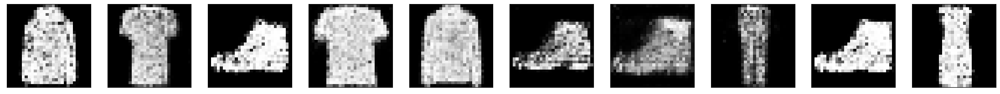

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 13ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:53,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:52,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:50,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:50,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:49,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:02<01:49,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:48,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:48,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:47,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:47,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:46,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:46,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:45,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:45,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:45,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:44,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:44,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:43,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  8%|██████▌                                                                          | 19/234 [00:09<01:43,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:43,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:42,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


  9%|███████▌                                                                         | 22/234 [00:10<01:42,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:42,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:11<01:42,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 12ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:41,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 11%|█████████                                                                        | 26/234 [00:12<01:41,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:40,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 12ms/step


 12%|█████████▋                                                                       | 28/234 [00:13<01:38,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 12%|██████████                                                                       | 29/234 [00:13<01:38,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 12ms/step


 13%|██████████▍                                                                      | 30/234 [00:14<01:37,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:14<01:36,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:15<01:36,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:15<01:35,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:16<01:35,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:16<01:35,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 12ms/step


 15%|████████████▍                                                                    | 36/234 [00:17<01:33,  2.11it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:17<01:33,  2.10it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:18<01:34,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▌                                                                   | 39/234 [00:18<01:36,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:19<01:36,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:19<01:35,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▌                                                                  | 42/234 [00:20<01:35,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:20<01:34,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▏                                                                 | 44/234 [00:21<01:34,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▌                                                                 | 45/234 [00:21<01:34,  2.00it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:22<01:33,  2.00it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 20%|████████████████▎                                                                | 47/234 [00:22<01:34,  1.98it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:23<01:33,  1.99it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▉                                                                | 49/234 [00:23<01:32,  2.00it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 21%|█████████████████▎                                                               | 50/234 [00:24<01:31,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 22%|█████████████████▋                                                               | 51/234 [00:24<01:30,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 22%|██████████████████                                                               | 52/234 [00:25<01:30,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▎                                                              | 53/234 [00:25<01:29,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▋                                                              | 54/234 [00:26<01:29,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:26<01:29,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▍                                                             | 56/234 [00:27<01:28,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:27<01:27,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████                                                             | 58/234 [00:28<01:26,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:28<01:26,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:29<01:26,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████                                                            | 61/234 [00:29<01:25,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:30<01:25,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:30<01:25,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:31<01:23,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:31<01:23,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:32<01:23,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:32<01:22,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:33<01:22,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:33<01:21,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:34<01:21,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:34<01:20,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:35<01:19,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:35<01:18,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:36<01:18,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:36<01:17,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:37<01:16,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:37<01:16,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 33%|███████████████████████████                                                      | 78/234 [00:38<01:15,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:38<01:14,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:39<01:14,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:39<01:13,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:40<01:13,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:40<01:12,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:40<01:12,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:41<01:11,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:41<01:10,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:42<01:10,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:42<01:10,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:43<01:09,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:43<01:08,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:44<01:08,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:44<01:08,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:45<01:07,  2.09it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:45<01:09,  2.01it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:46<01:08,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:46<01:07,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:47<01:06,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:47<01:05,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:48<01:05,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:48<01:05,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:49<01:04,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:49<01:04,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:50<01:03,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:50<01:02,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:51<01:02,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:51<01:01,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:52<01:01,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:52<01:00,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:53<01:00,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:53<01:00,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:54<00:59,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:54<00:58,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:54<00:58,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:55<00:57,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:55<00:57,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:56<00:57,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:56<00:56,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:57<00:56,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:57<00:55,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 11ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:58<00:53,  2.11it/s]

epoch:  46
8/8 [==============================] - 0s 12ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:58<00:52,  2.14it/s]

epoch:  46
8/8 [==============================] - 0s 11ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [00:59<00:51,  2.16it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [00:59<00:51,  2.14it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:00<00:51,  2.12it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:00<00:53,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:01<00:53,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:01<00:52,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:02<00:52,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:02<00:51,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:03<00:50,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:03<00:49,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:04<00:49,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:04<00:48,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:05<00:48,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:05<00:47,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:06<00:47,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:06<00:46,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:07<00:46,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:07<00:45,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:08<00:45,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:08<00:44,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:08<00:44,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:09<00:44,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:09<00:43,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:10<00:43,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:10<00:42,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:11<00:42,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:11<00:41,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:12<00:41,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:12<00:40,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:13<00:40,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:13<00:39,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:14<00:39,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:14<00:38,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:15<00:38,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:15<00:37,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:16<00:37,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:16<00:36,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:17<00:36,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:17<00:35,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:18<00:35,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:18<00:34,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:19<00:34,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:19<00:34,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:20<00:33,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:20<00:32,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:21<00:32,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:21<00:31,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:22<00:31,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:22<00:31,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:23<00:30,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:23<00:30,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:24<00:29,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:24<00:29,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:24<00:28,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:25<00:28,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:25<00:27,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:26<00:27,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:26<00:26,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:27<00:26,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:27<00:25,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:28<00:25,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:28<00:24,  2.07it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:29<00:24,  2.08it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:29<00:24,  2.00it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:30<00:23,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:30<00:23,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:31<00:22,  2.02it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:31<00:22,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:32<00:21,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:32<00:21,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:33<00:20,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:33<00:19,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:34<00:19,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:34<00:19,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:35<00:18,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:35<00:18,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:36<00:17,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:36<00:17,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:37<00:16,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:37<00:16,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:38<00:15,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:38<00:15,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:39<00:14,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:39<00:14,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:40<00:13,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:40<00:13,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:41<00:12,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:41<00:12,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:42<00:11,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:42<00:11,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:43<00:10,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:43<00:10,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:44<00:09,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:44<00:09,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:44<00:08,  2.06it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:45<00:08,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:45<00:07,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:46<00:07,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:46<00:06,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:47<00:06,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:47<00:05,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:48<00:05,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:48<00:04,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:49<00:04,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:49<00:03,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:50<00:03,  2.03it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:50<00:02,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:51<00:02,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:51<00:01,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:52<00:01,  2.05it/s]

epoch:  46
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:52<00:00,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:53<00:00,  2.04it/s]

epoch:  46
8/8 [==============================] - 0s 13ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:53<00:00,  2.06it/s]


epoch:  46


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:54,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:55,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:53,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:52,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:52,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:02<01:52,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:51,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:51,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 12ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:50,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:49,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:53,  1.96it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:52,  1.98it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:50,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:49,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:48,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:47,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:46,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:46,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  8%|██████▌                                                                          | 19/234 [00:09<01:45,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:45,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:44,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


  9%|███████▌                                                                         | 22/234 [00:10<01:44,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:43,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:11<01:43,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:42,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:12<01:42,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:43,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 12%|█████████▋                                                                       | 28/234 [00:13<01:42,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 12%|██████████                                                                       | 29/234 [00:14<01:41,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 13%|██████████▍                                                                      | 30/234 [00:14<01:40,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:15<01:39,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:15<01:38,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:16<01:37,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:16<01:37,  2.06it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:17<01:36,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:17<01:36,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:18<01:36,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:18<01:36,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▌                                                                   | 39/234 [00:19<01:35,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:19<01:34,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:20<01:34,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▌                                                                  | 42/234 [00:20<01:33,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:21<01:33,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▏                                                                 | 44/234 [00:21<01:32,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:22<01:32,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 20%|███████████████▉                                                                 | 46/234 [00:22<01:32,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 20%|████████████████▎                                                                | 47/234 [00:23<01:32,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:23<01:31,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▉                                                                | 49/234 [00:24<01:31,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 21%|█████████████████▎                                                               | 50/234 [00:24<01:30,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 12ms/step


 22%|█████████████████▋                                                               | 51/234 [00:25<01:37,  1.88it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 22%|██████████████████                                                               | 52/234 [00:25<01:34,  1.93it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▎                                                              | 53/234 [00:26<01:32,  1.96it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▋                                                              | 54/234 [00:26<01:30,  1.98it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:27<01:29,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▍                                                             | 56/234 [00:27<01:28,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:28<01:27,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████                                                             | 58/234 [00:28<01:26,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:29<01:26,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 26%|████████████████████▊                                                            | 60/234 [00:29<01:25,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:30<01:25,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:30<01:24,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:31<01:23,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:31<01:23,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:32<01:22,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:32<01:22,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:33<01:21,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:33<01:21,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:34<01:20,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:34<01:19,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:35<01:22,  1.97it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:35<01:21,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:36<01:20,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:36<01:19,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:37<01:18,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:37<01:17,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:38<01:18,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:38<01:17,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:39<01:17,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:39<01:16,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:40<01:15,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:40<01:15,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:41<01:14,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:41<01:14,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:42<01:13,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:42<01:12,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:42<01:12,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:43<01:11,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:43<01:11,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:44<01:11,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:44<01:10,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:45<01:09,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:45<01:09,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:46<01:08,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:46<01:08,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:47<01:07,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:47<01:07,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:48<01:06,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:48<01:06,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:49<01:06,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:49<01:05,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:50<01:05,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:50<01:04,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:51<01:03,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:51<01:03,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:52<01:02,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:52<01:02,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:53<01:02,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:53<01:01,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:54<01:01,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:54<01:00,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:55<01:00,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:55<00:59,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:56<00:59,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:56<00:58,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:57<00:58,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:57<00:57,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:58<00:57,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:58<00:56,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [00:59<00:56,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [00:59<00:55,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:00<00:54,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:00<00:54,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:01<00:54,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:01<00:53,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:02<00:53,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:02<00:52,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:03<00:52,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:03<00:52,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:04<00:52,  1.97it/s]

epoch:  47
8/8 [==============================] - 0s 12ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:04<00:51,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 11ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:05<00:49,  2.07it/s]

epoch:  47
8/8 [==============================] - 0s 12ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:05<00:48,  2.07it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:06<00:48,  2.08it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:06<00:47,  2.07it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:07<00:47,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:07<00:47,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:08<00:47,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:08<00:46,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:09<00:46,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:09<00:45,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:10<00:45,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:10<00:44,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:11<00:44,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:11<00:43,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:11<00:43,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:12<00:42,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:12<00:42,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:13<00:41,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:13<00:41,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:14<00:41,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:14<00:40,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:15<00:40,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:15<00:39,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:16<00:38,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:16<00:38,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:17<00:37,  2.05it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:17<00:37,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:18<00:36,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:18<00:36,  2.04it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:19<00:36,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:19<00:35,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:20<00:35,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:20<00:34,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:21<00:34,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:21<00:33,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:22<00:33,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:22<00:32,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:23<00:32,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:23<00:31,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:24<00:31,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:24<00:30,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:25<00:30,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:25<00:29,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:26<00:29,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:26<00:28,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:27<00:28,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:27<00:27,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:28<00:27,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:28<00:26,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:29<00:26,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:29<00:25,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:30<00:25,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:30<00:24,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:31<00:24,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:31<00:23,  2.03it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:32<00:23,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:32<00:22,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:33<00:22,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:33<00:21,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:34<00:21,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:34<00:20,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:35<00:20,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:35<00:20,  1.94it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:36<00:19,  1.96it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:36<00:19,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:37<00:18,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:37<00:17,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:38<00:17,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:38<00:17,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:39<00:16,  1.99it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:39<00:15,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:40<00:15,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:40<00:14,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:41<00:14,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:41<00:13,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:42<00:13,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:42<00:12,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:43<00:12,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:43<00:11,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:44<00:11,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:44<00:10,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:45<00:10,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:45<00:09,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:46<00:09,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:46<00:08,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:47<00:08,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:47<00:07,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:48<00:07,  2.00it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:48<00:06,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:49<00:06,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:49<00:05,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:50<00:05,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:50<00:04,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:51<00:04,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:51<00:03,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:52<00:03,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:52<00:02,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:53<00:02,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:53<00:01,  2.01it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:54<00:01,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:54<00:00,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:55<00:00,  2.02it/s]

epoch:  47
8/8 [==============================] - 0s 13ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:55<00:00,  2.02it/s]


epoch:  47


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:56,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  1%|▋                                                                                 | 2/234 [00:00<01:54,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:55,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:01<01:54,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:53,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:02<01:52,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:53,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  3%|██▊                                                                               | 8/234 [00:03<01:52,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:52,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  4%|███▍                                                                             | 10/234 [00:04<01:51,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:50,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:05<01:50,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:49,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:06<01:49,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:48,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:07<01:48,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:47,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  8%|██████▏                                                                          | 18/234 [00:08<01:47,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:09<01:47,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  9%|██████▉                                                                          | 20/234 [00:09<01:46,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:50,  1.93it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


  9%|███████▌                                                                         | 22/234 [00:11<01:49,  1.93it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:48,  1.95it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:12<01:47,  1.96it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:45,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:13<01:44,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:43,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 12%|█████████▋                                                                       | 28/234 [00:14<01:43,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 12%|██████████                                                                       | 29/234 [00:14<01:42,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 13%|██████████▍                                                                      | 30/234 [00:15<01:41,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:15<01:41,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:16<01:40,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:16<01:39,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:16<01:38,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:17<01:38,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:17<01:38,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:18<01:37,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:18<01:37,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▌                                                                   | 39/234 [00:19<01:36,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:19<01:36,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:20<01:35,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▌                                                                  | 42/234 [00:20<01:35,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:21<01:34,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:21<01:35,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▌                                                                 | 45/234 [00:22<01:35,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 20%|███████████████▉                                                                 | 46/234 [00:23<01:35,  1.96it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 20%|████████████████▎                                                                | 47/234 [00:23<01:35,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▌                                                                | 48/234 [00:24<01:34,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▉                                                                | 49/234 [00:24<01:32,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 21%|█████████████████▎                                                               | 50/234 [00:25<01:32,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 22%|█████████████████▋                                                               | 51/234 [00:25<01:31,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:26<01:30,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▎                                                              | 53/234 [00:26<01:30,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:26<01:29,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:27<01:29,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▍                                                             | 56/234 [00:27<01:28,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:28<01:28,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████                                                             | 58/234 [00:28<01:27,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████▍                                                            | 59/234 [00:29<01:26,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 26%|████████████████████▊                                                            | 60/234 [00:29<01:26,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████                                                            | 61/234 [00:30<01:26,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:30<01:25,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:31<01:25,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:31<01:24,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:32<01:24,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:32<01:23,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:33<01:22,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:33<01:21,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:34<01:21,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:34<01:21,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:35<01:20,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:35<01:20,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:36<01:19,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:36<01:19,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:37<01:19,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:37<01:17,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:38<01:17,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:38<01:17,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:39<01:16,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:39<01:20,  1.91it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:40<01:19,  1.91it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:41<01:18,  1.92it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:41<01:18,  1.93it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:42<01:18,  1.91it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:42<01:17,  1.93it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:43<01:16,  1.93it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:43<01:15,  1.94it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:44<01:14,  1.95it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:44<01:13,  1.96it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:45<01:12,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:45<01:11,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:46<01:11,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:46<01:10,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:47<01:10,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:47<01:09,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:48<01:08,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:48<01:08,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:49<01:07,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:49<01:07,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:50<01:06,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:50<01:06,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:51<01:06,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:51<01:05,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:52<01:05,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:52<01:04,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:53<01:03,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:53<01:02,  2.02it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:54<01:02,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:54<01:02,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:55<01:02,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:55<01:01,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:56<01:01,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:56<01:00,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:57<01:00,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:57<00:59,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:58<00:58,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:58<00:58,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:59<00:58,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [00:59<00:57,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:00<00:56,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:00<00:56,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:01<00:55,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:01<00:55,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:02<00:54,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:02<00:54,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:03<00:54,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:03<00:53,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:04<00:53,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:04<00:52,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:05<00:51,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:05<00:51,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:06<00:51,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:06<00:50,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:07<00:49,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:07<00:49,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:08<00:50,  1.94it/s]

epoch:  48
8/8 [==============================] - 0s 12ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:08<00:48,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:09<00:47,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:09<00:46,  2.06it/s]

epoch:  48
8/8 [==============================] - 0s 11ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:10<00:45,  2.06it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:10<00:45,  2.03it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:11<00:45,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:11<00:45,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:12<00:45,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:12<00:44,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:13<00:43,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:13<00:43,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:14<00:42,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:14<00:42,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:15<00:42,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:15<00:41,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:16<00:40,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:16<00:40,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:17<00:40,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:17<00:39,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:18<00:39,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:18<00:38,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:19<00:38,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:19<00:37,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:20<00:36,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:20<00:36,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:21<00:36,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:21<00:35,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:22<00:35,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:22<00:34,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:23<00:34,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:23<00:33,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:24<00:33,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:24<00:32,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:25<00:32,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:25<00:31,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:26<00:31,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:26<00:30,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:27<00:30,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:27<00:29,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:28<00:29,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:28<00:28,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:29<00:28,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:29<00:27,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:30<00:27,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:30<00:26,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:31<00:26,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:31<00:25,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:32<00:25,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:32<00:24,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:33<00:24,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:33<00:23,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:34<00:23,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:34<00:22,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:35<00:22,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:35<00:21,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:36<00:21,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:36<00:20,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:37<00:20,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:37<00:19,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:38<00:19,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:38<00:18,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:39<00:17,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:39<00:17,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:40<00:16,  2.01it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:40<00:16,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:41<00:16,  1.94it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:41<00:15,  1.96it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:42<00:15,  1.96it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:42<00:14,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:43<00:14,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:43<00:13,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:44<00:13,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:44<00:12,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:45<00:12,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:45<00:11,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:46<00:11,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:46<00:10,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:47<00:10,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:47<00:09,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:48<00:09,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:48<00:08,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:49<00:08,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:49<00:07,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:50<00:07,  1.97it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:50<00:06,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:51<00:06,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:51<00:05,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:52<00:05,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:52<00:04,  1.98it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:53<00:04,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:53<00:03,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:54<00:03,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:54<00:02,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:55<00:02,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:55<00:01,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:56<00:01,  1.99it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:56<00:00,  2.00it/s]

epoch:  48
8/8 [==============================] - 0s 13ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:57<00:00,  1.99it/s]


epoch:  48


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 13ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:56,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  1%|▋                                                                                 | 2/234 [00:01<01:56,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:56,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  2%|█▍                                                                                | 4/234 [00:02<01:55,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:54,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:03<01:53,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:53,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<01:52,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:52,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  4%|███▍                                                                             | 10/234 [00:05<01:54,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:54,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:06<01:53,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:52,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:07<01:51,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:51,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:50,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:49,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:49,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  8%|██████▌                                                                          | 19/234 [00:09<01:47,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


  9%|██████▉                                                                          | 20/234 [00:10<01:48,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:47,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:11<01:47,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:46,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 10%|████████▎                                                                        | 24/234 [00:12<01:46,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:45,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 11%|█████████                                                                        | 26/234 [00:13<01:45,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:44,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:14<01:48,  1.90it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:14<01:46,  1.93it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:15<01:45,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:15<01:44,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 14%|███████████                                                                      | 32/234 [00:16<01:42,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:16<01:42,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:17<01:40,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:17<01:40,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:18<01:40,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:18<01:39,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:19<01:39,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▌                                                                   | 39/234 [00:19<01:38,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:20<01:37,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:20<01:37,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:21<01:36,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:21<01:35,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:22<01:35,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:22<01:35,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 20%|███████████████▉                                                                 | 46/234 [00:23<01:34,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 20%|████████████████▎                                                                | 47/234 [00:23<01:34,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:24<01:34,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:24<01:33,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:25<01:33,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:25<01:32,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 22%|██████████████████                                                               | 52/234 [00:26<01:32,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:26<01:31,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:27<01:31,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████                                                              | 55/234 [00:27<01:30,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:28<01:30,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:28<01:29,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████                                                             | 58/234 [00:29<01:29,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 25%|████████████████████▍                                                            | 59/234 [00:29<01:28,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 26%|████████████████████▊                                                            | 60/234 [00:30<01:28,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:30<01:27,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:31<01:27,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:31<01:26,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:32<01:26,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:32<01:25,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:33<01:23,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:33<01:23,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:34<01:23,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:34<01:23,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:35<01:22,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:35<01:22,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:36<01:21,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:36<01:21,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:37<01:20,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:37<01:20,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:38<01:19,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:38<01:19,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 33%|███████████████████████████                                                      | 78/234 [00:39<01:18,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:39<01:18,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:40<01:17,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:40<01:17,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:41<01:16,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:41<01:16,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:42<01:15,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:42<01:15,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:43<01:14,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:44<01:14,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:44<01:14,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:45<01:15,  1.91it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:45<01:14,  1.93it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:46<01:13,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:46<01:12,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:47<01:11,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:47<01:11,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:48<01:10,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:48<01:09,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:49<01:09,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:49<01:08,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:50<01:08,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:50<01:07,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:51<01:07,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:51<01:07,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:52<01:06,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:52<01:05,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:53<01:05,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:53<01:04,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:54<01:04,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:54<01:03,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:55<01:02,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:55<01:02,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:56<01:02,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:56<01:01,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:57<01:01,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:57<01:00,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:58<01:00,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:58<00:59,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [00:59<00:59,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [00:59<00:58,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:00<00:58,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:00<00:57,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:01<00:57,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:01<00:56,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:02<00:55,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:02<00:55,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:03<00:54,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:03<00:54,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:04<00:53,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:04<00:53,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:05<00:52,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:06<00:59,  1.74it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:06<00:56,  1.81it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:07<00:54,  1.86it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:07<00:53,  1.90it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:07<00:51,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:08<00:50,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:08<00:49,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:09<00:48,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:10<00:48,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:10<00:47,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:11<00:47,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 12ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:11<00:45,  2.04it/s]

epoch:  49
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:11<00:44,  2.07it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:12<00:44,  2.05it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:12<00:44,  2.02it/s]

epoch:  49
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:13<00:46,  1.93it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:14<00:45,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:14<00:44,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:15<00:44,  1.95it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:15<00:43,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:16<00:42,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:16<00:42,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:17<00:41,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:17<00:40,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:18<00:40,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:18<00:40,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:19<00:39,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:19<00:39,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:20<00:38,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:20<00:37,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:21<00:37,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:21<00:36,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:22<00:36,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:22<00:35,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:23<00:35,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:23<00:34,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:24<00:34,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:24<00:33,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:25<00:33,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:25<00:32,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:26<00:32,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:26<00:31,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:27<00:31,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:27<00:30,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:28<00:30,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:28<00:29,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:29<00:29,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:29<00:28,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:30<00:27,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:30<00:27,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:31<00:27,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:31<00:26,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:32<00:25,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:32<00:25,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:33<00:24,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:33<00:24,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:34<00:23,  2.02it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:34<00:23,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:35<00:22,  2.01it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:35<00:22,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:36<00:22,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:36<00:21,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:37<00:21,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:37<00:20,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:38<00:20,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:38<00:19,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:39<00:19,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:39<00:18,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:40<00:18,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:40<00:17,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:41<00:17,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:41<00:16,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:42<00:16,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:42<00:15,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:43<00:15,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:43<00:14,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:44<00:14,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:44<00:14,  1.92it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:45<00:13,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:45<00:12,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:46<00:12,  1.94it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:46<00:11,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:47<00:11,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:47<00:10,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:48<00:10,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:48<00:09,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:49<00:09,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:49<00:08,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:50<00:08,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:50<00:07,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:51<00:07,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:51<00:06,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:52<00:06,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:52<00:05,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:53<00:05,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:53<00:04,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:54<00:04,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:54<00:03,  1.96it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:55<00:03,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:55<00:02,  2.00it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:56<00:02,  1.99it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:56<00:01,  1.98it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [01:57<00:01,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [01:57<00:00,  1.97it/s]

epoch:  49
8/8 [==============================] - 0s 13ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [01:58<00:00,  1.98it/s]


epoch:  49


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 13ms/step


  0%|▎                                                                                 | 1/234 [00:00<01:57,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  1%|▋                                                                                 | 2/234 [00:01<01:58,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  1%|█                                                                                 | 3/234 [00:01<01:57,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  2%|█▍                                                                                | 4/234 [00:02<01:56,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  2%|█▊                                                                                | 5/234 [00:02<01:55,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  3%|██                                                                                | 6/234 [00:03<01:54,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:55,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  3%|██▊                                                                               | 8/234 [00:04<01:54,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:53,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<01:53,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:53,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:06<01:52,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:52,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  6%|████▊                                                                            | 14/234 [00:07<01:50,  1.99it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:50,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:49,  1.99it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:49,  1.99it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:49,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:09<01:48,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:10<01:48,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  9%|███████▎                                                                         | 21/234 [00:10<01:47,  1.99it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


  9%|███████▌                                                                         | 22/234 [00:11<01:46,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:11<01:46,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:12<01:46,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:12<01:45,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:13<01:45,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:13<01:45,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:14<01:45,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:14<01:44,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:15<01:44,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 13%|██████████▋                                                                      | 31/234 [00:15<01:42,  1.99it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:16<01:42,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 14%|███████████▍                                                                     | 33/234 [00:16<01:41,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:17<01:41,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 15%|████████████                                                                     | 35/234 [00:17<01:44,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:18<01:43,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:18<01:40,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:19<01:40,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▌                                                                   | 39/234 [00:19<01:39,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:20<01:39,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▏                                                                  | 41/234 [00:20<01:38,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:21<01:38,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:21<01:37,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▏                                                                 | 44/234 [00:22<01:36,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:22<01:36,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:23<01:35,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 20%|████████████████▎                                                                | 47/234 [00:23<01:35,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:24<01:35,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 21%|████████████████▉                                                                | 49/234 [00:24<01:34,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 21%|█████████████████▎                                                               | 50/234 [00:25<01:34,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:25<01:33,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:26<01:33,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:26<01:32,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:27<01:32,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████                                                              | 55/234 [00:28<01:31,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:28<01:32,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:29<01:30,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████                                                             | 58/234 [00:29<01:29,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:30<01:28,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:30<01:27,  1.98it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:31<01:27,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:31<01:27,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:32<01:27,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:32<01:27,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:33<01:27,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:33<01:26,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:34<01:25,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:34<01:24,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:35<01:25,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:35<01:24,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:36<01:23,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:36<01:23,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:37<01:22,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:37<01:21,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:38<01:21,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:38<01:20,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:39<01:19,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 33%|███████████████████████████                                                      | 78/234 [00:39<01:19,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:40<01:19,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:40<01:18,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:41<01:17,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:41<01:17,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:42<01:17,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:42<01:16,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:43<01:16,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:43<01:15,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:44<01:15,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:44<01:14,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:45<01:14,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:45<01:13,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:46<01:13,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:46<01:13,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:47<01:12,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:47<01:12,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:48<01:12,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:49<01:11,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:49<01:13,  1.85it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:50<01:12,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:50<01:11,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:51<01:10,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:51<01:09,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:52<01:08,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:52<01:08,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:53<01:07,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:53<01:07,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:54<01:06,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:54<01:05,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:55<01:05,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:55<01:04,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:56<01:04,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:56<01:03,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:57<01:02,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:57<01:02,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:58<01:01,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [00:58<01:00,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 18ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [00:59<01:02,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:00<01:02,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:00<01:02,  1.86it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:01<01:01,  1.86it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:01<01:01,  1.86it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:02<01:00,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:02<00:59,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:03<00:59,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:03<00:58,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:04<00:58,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:04<00:57,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:05<00:56,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:05<00:56,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:06<00:56,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:06<00:55,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:07<00:55,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:08<00:53,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:08<00:53,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:09<00:52,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:09<00:52,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:10<00:51,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:10<00:50,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:11<00:49,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:11<00:48,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:12<00:48,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:12<00:48,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:13<00:46,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 12ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:13<00:45,  2.00it/s]

epoch:  50
8/8 [==============================] - 0s 12ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:14<00:44,  2.03it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:14<00:45,  1.97it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:15<00:44,  1.96it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:15<00:44,  1.95it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:16<00:44,  1.94it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:16<00:44,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:17<00:45,  1.85it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:17<00:44,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:18<00:43,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:18<00:42,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:19<00:42,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:19<00:41,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:20<00:40,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:21<00:40,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:21<00:39,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:22<00:39,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:22<00:38,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:23<00:37,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:23<00:37,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:24<00:36,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:24<00:36,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:25<00:35,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:25<00:35,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:26<00:34,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:26<00:34,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:27<00:33,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:27<00:33,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:28<00:32,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:28<00:32,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:29<00:31,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:29<00:31,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:30<00:30,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:30<00:30,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:31<00:29,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:31<00:29,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:32<00:28,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:32<00:28,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:33<00:27,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:34<00:27,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:34<00:26,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:35<00:26,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:35<00:25,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:36<00:25,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:36<00:24,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:37<00:24,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:37<00:23,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:38<00:22,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:38<00:22,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:39<00:22,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:39<00:21,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:40<00:20,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:40<00:20,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:41<00:19,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:41<00:19,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:42<00:18,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:42<00:18,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:43<00:17,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:43<00:17,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:44<00:16,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:45<00:16,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:45<00:15,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:46<00:15,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:46<00:14,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:47<00:14,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:47<00:13,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:48<00:13,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:48<00:12,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:49<00:12,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:49<00:12,  1.82it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:50<00:11,  1.85it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:50<00:10,  1.87it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:51<00:10,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:51<00:09,  1.88it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:52<00:09,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:52<00:08,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:53<00:07,  1.89it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:54<00:07,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:54<00:06,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:55<00:06,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:55<00:05,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:56<00:05,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:56<00:04,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:57<00:04,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:57<00:03,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [01:58<00:03,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 13ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [01:58<00:02,  1.93it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [01:59<00:02,  1.92it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [01:59<00:01,  1.90it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:00<00:01,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:00<00:00,  1.91it/s]

epoch:  50
8/8 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:01<00:00,  1.93it/s]

epoch:  50
1/1 [==============================] - 0s 33ms/step


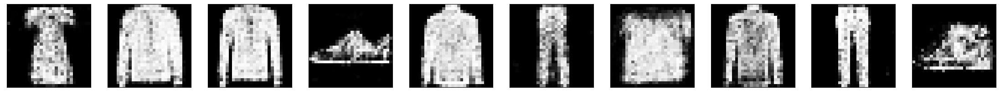

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:02,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:02,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  1%|█                                                                                 | 3/234 [00:01<02:01,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:01,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:00,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:00,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<01:59,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<01:59,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<01:58,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<01:57,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  5%|███▊                                                                             | 11/234 [00:05<01:56,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  5%|████▏                                                                            | 12/234 [00:06<01:57,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:57,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:07<01:58,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:07<01:57,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:56,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  7%|█████▉                                                                           | 17/234 [00:08<01:55,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:54,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:10<01:53,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:10<01:52,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:50,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:11<01:50,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:49,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:12<01:49,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:47,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 11%|█████████                                                                        | 26/234 [00:13<01:47,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:14<01:46,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:14<01:46,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:15<01:46,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:15<01:46,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 13%|██████████▋                                                                      | 31/234 [00:16<01:45,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:16<01:44,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 14%|███████████▍                                                                     | 33/234 [00:17<01:44,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 15%|███████████▊                                                                     | 34/234 [00:17<01:43,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 15%|████████████                                                                     | 35/234 [00:18<01:43,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 15%|████████████▍                                                                    | 36/234 [00:18<01:43,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 16%|████████████▊                                                                    | 37/234 [00:19<01:43,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 16%|█████████████▏                                                                   | 38/234 [00:19<01:42,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▌                                                                   | 39/234 [00:20<01:41,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:21<01:45,  1.84it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:21<01:43,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:22<01:42,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:22<01:41,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:23<01:40,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:23<01:39,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:24<01:38,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 20%|████████████████▎                                                                | 47/234 [00:24<01:38,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:25<01:37,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:25<01:36,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:26<01:36,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:26<01:36,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:27<01:35,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:27<01:34,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:28<01:34,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████                                                              | 55/234 [00:28<01:33,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:29<01:33,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▋                                                             | 57/234 [00:29<01:32,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████                                                             | 58/234 [00:30<01:32,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:30<01:31,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:31<01:31,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 26%|█████████████████████                                                            | 61/234 [00:32<01:30,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:32<01:30,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:33<01:28,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:33<01:28,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:34<01:28,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:34<01:27,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:35<01:27,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:35<01:26,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:36<01:26,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:36<01:25,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:37<01:25,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:37<01:24,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:38<01:24,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:38<01:23,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:39<01:22,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:39<01:22,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:40<01:22,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:40<01:21,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:41<01:20,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:41<01:19,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:42<01:18,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:42<01:18,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:43<01:18,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:43<01:17,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:44<01:16,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:45<01:16,  1.93it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:45<01:16,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:46<01:16,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:46<01:15,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:47<01:15,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:47<01:14,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:48<01:14,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:48<01:13,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:49<01:13,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:49<01:12,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:50<01:13,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:50<01:11,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:51<01:10,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:51<01:10,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:52<01:09,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:52<01:09,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:53<01:08,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:53<01:10,  1.85it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:54<01:10,  1.83it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:55<01:08,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:55<01:07,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:56<01:07,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:56<01:06,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:57<01:05,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:57<01:05,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [00:58<01:04,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [00:58<01:04,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [00:59<01:03,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [00:59<01:03,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:00<01:02,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:00<01:01,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:01<01:01,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:01<01:00,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:02<01:00,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:02<00:59,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:03<00:59,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:03<00:59,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:04<00:58,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:05<00:57,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:05<00:57,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:06<00:56,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:06<00:56,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:07<00:55,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:07<00:55,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:08<00:54,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:08<00:54,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:09<00:54,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:09<00:53,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:10<00:53,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:10<00:52,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 12ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:11<00:50,  1.94it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:11<00:49,  1.96it/s]

epoch:  51
8/8 [==============================] - 0s 12ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:12<00:47,  2.00it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:12<00:48,  1.96it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:13<00:48,  1.95it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:13<00:48,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:14<00:48,  1.92it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:14<00:47,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:15<00:48,  1.84it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:16<00:47,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:16<00:46,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:17<00:46,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:17<00:45,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:18<00:44,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:18<00:44,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:19<00:43,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:19<00:43,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:20<00:42,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:20<00:42,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:21<00:41,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:21<00:41,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:22<00:40,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:22<00:40,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:23<00:39,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:23<00:39,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:24<00:39,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:25<00:38,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:25<00:37,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:26<00:36,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:26<00:36,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:27<00:35,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:27<00:35,  1.91it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:28<00:34,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:28<00:34,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:29<00:33,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:29<00:33,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:30<00:32,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:30<00:32,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:31<00:32,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:31<00:31,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:32<00:30,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:32<00:30,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:33<00:29,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:34<00:28,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:34<00:28,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:35<00:27,  1.90it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:35<00:27,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:36<00:26,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:36<00:26,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:37<00:26,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:37<00:25,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:38<00:25,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:38<00:24,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:39<00:23,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:39<00:23,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:40<00:23,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:40<00:22,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:41<00:21,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:42<00:21,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:42<00:20,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:43<00:20,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:43<00:19,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:44<00:19,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:44<00:18,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:45<00:18,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:45<00:17,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:46<00:16,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:46<00:16,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:47<00:15,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:47<00:15,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:48<00:14,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:48<00:14,  1.83it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:49<00:13,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:50<00:13,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 13ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:50<00:12,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:51<00:12,  1.89it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:51<00:11,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:52<00:11,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:52<00:10,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:53<00:10,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:53<00:09,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:54<00:09,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:54<00:08,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:55<00:08,  1.87it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:55<00:07,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:56<00:06,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [01:56<00:06,  1.88it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [01:57<00:05,  1.85it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [01:58<00:05,  1.83it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [01:58<00:04,  1.85it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [01:59<00:04,  1.85it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [01:59<00:03,  1.86it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:00<00:03,  1.85it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:00<00:02,  1.81it/s]

epoch:  51
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:01<00:02,  1.79it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:01<00:01,  1.78it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:02<00:01,  1.78it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:03<00:00,  1.78it/s]

epoch:  51
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:03<00:00,  1.89it/s]


epoch:  51


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:10,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:08,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  1%|█                                                                                 | 3/234 [00:01<02:08,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:08,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:07,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:07,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:06,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:05,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<02:04,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:03,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:03,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:02,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:03,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:07<02:03,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:08<01:59,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:59,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  7%|█████▉                                                                           | 17/234 [00:09<01:56,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:56,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:10<01:56,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:11<01:56,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:55,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:12<01:55,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:55,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:55,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:55,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:54,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:14<01:53,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<01:53,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:15<01:53,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<01:56,  1.75it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:58,  1.71it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:17<01:58,  1.71it/s]

epoch:  52
8/8 [==============================] - 0s 16ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:58,  1.70it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:18<01:56,  1.71it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:54,  1.74it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:20<01:52,  1.76it/s]

epoch:  52
8/8 [==============================] - 0s 16ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:52,  1.75it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:21<01:51,  1.76it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:49,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:22<01:46,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:22<01:45,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▌                                                                  | 42/234 [00:23<01:45,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:23<01:46,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▏                                                                 | 44/234 [00:24<01:45,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:25<01:45,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:44,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 16ms/step


 20%|████████████████▎                                                                | 47/234 [00:26<01:45,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:26<01:45,  1.76it/s]

epoch:  52
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:27<01:43,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:27<01:42,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:28<01:41,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:28<01:39,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:29<01:38,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:30<01:36,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:30<01:36,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:31<01:35,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:31<01:34,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:32<01:34,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:32<01:32,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:33<01:36,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:33<01:36,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:34<01:36,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:35<01:38,  1.74it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:35<01:36,  1.75it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:36<01:36,  1.76it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:36<01:35,  1.77it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:37<01:34,  1.77it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:37<01:33,  1.78it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:38<01:32,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:38<01:31,  1.79it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:39<01:30,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:40<01:29,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:40<01:28,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:41<01:26,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:41<01:25,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:42<01:24,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:42<01:24,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 33%|███████████████████████████                                                      | 78/234 [00:43<01:22,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:43<01:22,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:44<01:21,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:44<01:23,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:45<01:22,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:45<01:21,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:46<01:20,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:46<01:19,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:47<01:19,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:48<01:18,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:48<01:18,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 13ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:49<01:16,  1.90it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:49<01:16,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:50<01:16,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:50<01:15,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:51<01:15,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:51<01:14,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 13ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:52<01:13,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:52<01:13,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:53<01:12,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:53<01:12,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:54<01:11,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:54<01:11,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:55<01:10,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:56<01:10,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:56<01:09,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:57<01:09,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:57<01:09,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:58<01:08,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:58<01:08,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:59<01:07,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 13ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:59<01:06,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:00<01:06,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:00<01:05,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:01<01:05,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:01<01:04,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:02<01:03,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:02<01:03,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:03<01:02,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:04<01:02,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:04<01:02,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:05<01:00,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:05<01:00,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:06<01:00,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:06<00:59,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:07<00:59,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:07<00:57,  1.92it/s]

epoch:  52
8/8 [==============================] - 0s 12ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:08<00:55,  1.96it/s]

epoch:  52
8/8 [==============================] - 0s 12ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:08<00:54,  1.98it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:09<00:55,  1.94it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:09<00:55,  1.91it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:10<00:55,  1.90it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:10<00:55,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:11<00:54,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:11<00:56,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:12<00:55,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:13<00:55,  1.81it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:13<00:53,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:14<00:53,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:14<00:52,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:15<00:50,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:15<00:50,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:16<00:50,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:16<00:49,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:17<00:49,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:17<00:48,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:18<00:47,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:18<00:47,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:19<00:46,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:20<00:46,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:20<00:45,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:21<00:45,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:21<00:44,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:22<00:44,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:22<00:43,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:23<00:43,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:23<00:42,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:24<00:42,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:24<00:41,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:25<00:41,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:25<00:40,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:26<00:39,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:26<00:39,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:27<00:39,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:28<00:38,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:28<00:38,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:29<00:37,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:29<00:37,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:30<00:36,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:30<00:36,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:31<00:35,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:31<00:35,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:32<00:34,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:32<00:33,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:33<00:33,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:33<00:32,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:34<00:32,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:35<00:31,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:35<00:31,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:36<00:30,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:36<00:30,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:37<00:29,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:37<00:29,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:38<00:28,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:38<00:28,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:39<00:27,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:39<00:27,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:40<00:26,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:40<00:25,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:41<00:25,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:42<00:24,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:42<00:24,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:43<00:23,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:43<00:23,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:44<00:22,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:44<00:22,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:45<00:22,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:45<00:21,  1.80it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:46<00:20,  1.82it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:46<00:20,  1.83it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:47<00:19,  1.84it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:48<00:18,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:48<00:18,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:49<00:17,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:49<00:17,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:50<00:16,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:50<00:16,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:51<00:15,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:51<00:14,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:52<00:14,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:52<00:13,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:53<00:13,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:53<00:12,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:54<00:12,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:55<00:11,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:55<00:11,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:56<00:10,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:56<00:10,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:57<00:09,  1.90it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:57<00:08,  1.91it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:58<00:08,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:58<00:07,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:59<00:07,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:59<00:06,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:00<00:06,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:00<00:05,  1.87it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:01<00:05,  1.90it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:01<00:04,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:02<00:04,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:02<00:03,  1.89it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:03<00:03,  1.88it/s]

epoch:  52
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:04<00:02,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:04<00:02,  1.85it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:05<00:01,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:05<00:01,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:06<00:00,  1.86it/s]

epoch:  52
8/8 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:06<00:00,  1.85it/s]


epoch:  52


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:06,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:04,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:04,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:02,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:03,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:02,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:01,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:01,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<02:00,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:00,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:05<02:00,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  5%|████▏                                                                            | 12/234 [00:06<01:59,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:06<01:58,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:07<01:58,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:08<01:58,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:57,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  7%|█████▉                                                                           | 17/234 [00:09<01:55,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:55,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:10<01:54,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:10<01:54,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:54,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:11<01:54,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:54,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:13<02:00,  1.74it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:59,  1.75it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:58,  1.76it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:14<01:57,  1.77it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<01:56,  1.77it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:15<01:55,  1.78it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<01:54,  1.78it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:16<01:53,  1.78it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:17<01:53,  1.79it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:52,  1.78it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 15%|███████████▊                                                                     | 34/234 [00:18<01:51,  1.79it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:50,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 15%|████████████▍                                                                    | 36/234 [00:19<01:49,  1.80it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:49,  1.80it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:20<01:48,  1.80it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:48,  1.79it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:21<01:46,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:22<01:45,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:23<01:44,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▉                                                                  | 43/234 [00:23<01:43,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:24<01:42,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:24<01:42,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:40,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 20%|████████████████▎                                                                | 47/234 [00:25<01:40,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:26<01:39,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:26<01:39,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:27<01:38,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:27<01:36,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:28<01:36,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:28<01:35,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:29<01:35,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████                                                              | 55/234 [00:29<01:35,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:30<01:34,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 13ms/step


 24%|███████████████████▋                                                             | 57/234 [00:30<01:33,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████                                                             | 58/234 [00:31<01:33,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:32<01:33,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:32<01:32,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:33<01:32,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:33<01:31,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:34<01:30,  1.90it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:34<01:30,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:35<01:29,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:35<01:29,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:36<01:29,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:36<01:29,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:37<01:29,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:37<01:28,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:38<01:28,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:39<01:27,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:39<01:26,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:40<01:26,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:40<01:25,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:41<01:24,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:41<01:24,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:42<01:24,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:42<01:24,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:43<01:22,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:43<01:22,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:44<01:22,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:44<01:21,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:45<01:20,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:46<01:23,  1.79it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:46<01:21,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:47<01:20,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:47<01:20,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:48<01:18,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:48<01:18,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:49<01:16,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:49<01:16,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:50<01:16,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:50<01:15,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:51<01:14,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:52<01:14,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:52<01:13,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:53<01:13,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:53<01:12,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:54<01:12,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:54<01:12,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:55<01:11,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:55<01:10,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:56<01:10,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:56<01:10,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:57<01:11,  1.80it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:58<01:10,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:58<01:09,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:59<01:08,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:59<01:07,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:00<01:07,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 12ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:00<01:04,  1.88it/s]

epoch:  53
8/8 [==============================] - 0s 13ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:01<01:03,  1.92it/s]

epoch:  53
8/8 [==============================] - 0s 13ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:01<01:01,  1.95it/s]

epoch:  53
8/8 [==============================] - 0s 12ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:02<01:01,  1.93it/s]

epoch:  53
8/8 [==============================] - 0s 22ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:02<01:04,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:03<01:03,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:03<01:03,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:04<01:03,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:05<01:02,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:05<01:01,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:06<01:00,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:06<01:00,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:07<00:59,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:07<00:59,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:08<00:58,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:08<00:58,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:09<00:57,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:09<00:57,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:10<00:56,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:11<00:55,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:11<00:55,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:12<00:54,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:12<00:54,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:13<00:53,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:13<00:53,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:14<00:52,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:14<00:52,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:15<00:51,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:15<00:51,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:16<00:50,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:16<00:49,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:17<00:49,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:18<00:48,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:18<00:47,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:19<00:47,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:19<00:46,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:20<00:46,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:20<00:45,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:21<00:45,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:21<00:45,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:22<00:44,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:22<00:43,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:23<00:43,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:24<00:42,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:24<00:42,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:25<00:41,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:25<00:41,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:26<00:40,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:26<00:40,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:27<00:39,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:27<00:38,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:28<00:38,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:28<00:37,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:29<00:37,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:29<00:36,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:30<00:36,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:31<00:35,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:31<00:35,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:32<00:34,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:32<00:34,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:33<00:33,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:33<00:33,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:34<00:32,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:34<00:32,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:35<00:31,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:35<00:31,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:36<00:30,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:37<00:31,  1.77it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:37<00:30,  1.79it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:38<00:29,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:38<00:28,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:39<00:27,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:39<00:27,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:40<00:26,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:40<00:26,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:41<00:25,  1.81it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:42<00:25,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:42<00:24,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:43<00:24,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:43<00:23,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:44<00:22,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:44<00:22,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:45<00:21,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:45<00:21,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:46<00:20,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:46<00:19,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:47<00:19,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:47<00:18,  1.89it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:48<00:18,  1.87it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:49<00:17,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:49<00:17,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:50<00:16,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:50<00:16,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:51<00:15,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:51<00:15,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:52<00:14,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:52<00:14,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:53<00:13,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:53<00:12,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:54<00:12,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:55<00:11,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:55<00:11,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:56<00:10,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:56<00:10,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:57<00:09,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:57<00:09,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:58<00:08,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:58<00:08,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:59<00:07,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [01:59<00:07,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:00<00:06,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:00<00:05,  1.84it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:01<00:05,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:02<00:04,  1.85it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:02<00:04,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:03<00:03,  1.86it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:03<00:03,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:04<00:02,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:04<00:02,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 16ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:05<00:01,  1.82it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:05<00:01,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:06<00:00,  1.83it/s]

epoch:  53
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:06<00:00,  1.84it/s]


epoch:  53


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:07,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:06,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:06,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:05,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:04,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:09,  1.76it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:07,  1.78it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:04,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<02:03,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:02,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:00,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:00,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:00,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:07<01:59,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:08<01:59,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


  7%|█████▌                                                                           | 16/234 [00:08<01:59,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:14,  1.61it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:09,  1.67it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:10<02:04,  1.72it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:11<02:01,  1.76it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:59,  1.78it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:12<01:56,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:55,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:54,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:52,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:50,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:14<01:50,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<01:49,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:15<01:49,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<01:49,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:48,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:17<01:48,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:48,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 15%|███████████▊                                                                     | 34/234 [00:18<01:48,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:46,  1.88it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 15%|████████████▍                                                                    | 36/234 [00:19<01:46,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:45,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:20<01:45,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:44,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:21<01:43,  1.88it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:22<01:42,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:22<01:42,  1.88it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▉                                                                  | 43/234 [00:23<01:42,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:23<01:40,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:24<01:41,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:40,  1.88it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:25<01:40,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:26<01:39,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:26<01:39,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:27<01:38,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:27<01:38,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:28<01:37,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:28<01:36,  1.88it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:29<01:36,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████                                                              | 55/234 [00:29<01:34,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:30<01:35,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▋                                                             | 57/234 [00:30<01:34,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:31<01:34,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:32<01:34,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:32<01:33,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:33<01:33,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:33<01:32,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:34<01:32,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:34<01:32,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:35<01:31,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:35<01:31,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:36<01:30,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:36<01:28,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:37<01:28,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:38<01:31,  1.79it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:38<01:30,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:39<01:28,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:39<01:27,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:40<01:27,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:40<01:26,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:41<01:26,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:41<01:25,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 33%|███████████████████████████                                                      | 78/234 [00:42<01:24,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:42<01:24,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:43<01:23,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:44<01:22,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:44<01:22,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:45<01:21,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:45<01:20,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:46<01:19,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:46<01:19,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:47<01:19,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:47<01:18,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:48<01:18,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:48<01:17,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:49<01:17,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:49<01:16,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:50<01:15,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:51<01:15,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:51<01:14,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:52<01:14,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:52<01:13,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:53<01:12,  1.87it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:53<01:11,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:54<01:09,  1.93it/s]

epoch:  54
8/8 [==============================] - 0s 12ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:54<01:07,  1.96it/s]

epoch:  54
8/8 [==============================] - 0s 12ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:55<01:07,  1.95it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:55<01:08,  1.92it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:56<01:08,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:56<01:08,  1.89it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:57<01:11,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:57<01:10,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:58<01:09,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [00:59<01:08,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [00:59<01:07,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:00<01:07,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:00<01:05,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:01<01:05,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:01<01:05,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:02<01:04,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:02<01:03,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:03<01:03,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:03<01:02,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:04<01:02,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:05<01:02,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:05<01:01,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:06<01:00,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:06<01:00,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:07<01:00,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:07<00:59,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:08<00:59,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:08<00:58,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:09<00:57,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:09<00:57,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:10<00:57,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:11<00:56,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:11<00:56,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:12<00:55,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:12<00:54,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:13<00:53,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:13<00:53,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:14<00:52,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:14<00:52,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:15<00:51,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:15<00:51,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:16<00:50,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:17<00:50,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:17<00:49,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:18<00:48,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:18<00:48,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:19<00:48,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:19<00:47,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:20<00:47,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:20<00:46,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:21<00:46,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:21<00:45,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:22<00:45,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:23<00:44,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:23<00:44,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:24<00:43,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:24<00:42,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:25<00:42,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:25<00:41,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:26<00:41,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:26<00:40,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:27<00:39,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:28<00:39,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:28<00:38,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:29<00:38,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:29<00:37,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:30<00:37,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:30<00:36,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:31<00:36,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:31<00:37,  1.75it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:32<00:36,  1.77it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:33<00:35,  1.78it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:33<00:34,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:34<00:33,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:34<00:33,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:35<00:32,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:35<00:31,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:36<00:31,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:36<00:30,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:37<00:30,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:37<00:29,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:38<00:28,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:39<00:28,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:39<00:27,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:40<00:27,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:40<00:27,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:41<00:26,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:41<00:25,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:42<00:25,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:42<00:24,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:43<00:24,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:43<00:23,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:44<00:23,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:45<00:22,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:45<00:22,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:46<00:21,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:46<00:21,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:47<00:20,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:47<00:19,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:48<00:19,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:48<00:18,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:49<00:18,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:50<00:17,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:50<00:17,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:51<00:16,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:51<00:15,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:52<00:15,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:52<00:14,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:53<00:14,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:53<00:13,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:54<00:13,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:55<00:12,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:55<00:12,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:56<00:11,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:56<00:10,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:57<00:10,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:57<00:09,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [01:58<00:09,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [01:58<00:08,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [01:59<00:08,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [01:59<00:07,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:00<00:07,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:01<00:06,  1.81it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:01<00:06,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:02<00:05,  1.86it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:02<00:04,  1.85it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:03<00:04,  1.84it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:03<00:03,  1.83it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:04<00:03,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:04<00:02,  1.82it/s]

epoch:  54
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:05<00:02,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:05<00:01,  1.79it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:06<00:01,  1.80it/s]

epoch:  54
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:07<00:00,  1.72it/s]

epoch:  54
8/8 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:07<00:00,  1.83it/s]


epoch:  54


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:09,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:08,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:08,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:07,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:06,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


  3%|██                                                                                | 6/234 [00:03<02:07,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:04,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:04,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:04<02:03,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:03,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:03,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:01,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 17ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:02,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:07<02:01,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:01,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:08<02:01,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:00,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:09<01:58,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:10<01:58,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<01:58,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:57,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:12<01:55,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:54,  1.85it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:54,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:54,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:54,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:14<01:53,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<01:53,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:15<01:52,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<01:52,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:51,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:17<01:50,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:49,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 15%|███████████▊                                                                     | 34/234 [00:18<01:50,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:49,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:19<01:48,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:47,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:20<01:47,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:47,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:22<01:46,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:22<01:47,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▌                                                                  | 42/234 [00:23<01:46,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:23<01:44,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:24<01:43,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:24<01:42,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:41,  1.85it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 20%|████████████████▎                                                                | 47/234 [00:25<01:42,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:26<01:42,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:26<01:40,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:27<01:39,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:28<01:40,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:28<01:39,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:29<01:39,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▋                                                              | 54/234 [00:29<01:38,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:30<01:38,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:30<01:38,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▋                                                             | 57/234 [00:31<01:36,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:31<01:36,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████▍                                                            | 59/234 [00:32<01:36,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 26%|████████████████████▊                                                            | 60/234 [00:33<01:36,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:33<01:35,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:34<01:34,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:34<01:34,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:35<01:37,  1.74it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:35<01:35,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:36<01:34,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:36<01:33,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:37<01:32,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:38<01:32,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:38<01:31,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:39<01:29,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:39<01:29,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:40<01:28,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:40<01:28,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:41<01:27,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:41<01:26,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:42<01:26,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:42<01:25,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:43<01:25,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:44<01:25,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████                                                     | 81/234 [00:44<01:25,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:45<01:25,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:45<01:25,  1.76it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:46<01:22,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:46<01:20,  1.85it/s]

epoch:  55
8/8 [==============================] - 0s 12ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:47<01:18,  1.89it/s]

epoch:  55
8/8 [==============================] - 0s 13ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:47<01:18,  1.87it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:48<01:17,  1.87it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:48<01:17,  1.87it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:49<01:17,  1.85it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:50<01:21,  1.76it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:50<01:20,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:51<01:19,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:51<01:18,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:52<01:17,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:52<01:17,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:53<01:16,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:54<01:14,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:54<01:13,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:55<01:13,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:55<01:13,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:56<01:12,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:56<01:11,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:57<01:11,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:57<01:11,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [00:58<01:10,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [00:58<01:10,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [00:59<01:09,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:00<01:09,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:00<01:08,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:01<01:07,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:01<01:07,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:02<01:06,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:02<01:06,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:03<01:05,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:03<01:04,  1.84it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:04<01:03,  1.83it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:05<01:03,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:05<01:03,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:06<01:03,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:06<01:02,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:07<01:02,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:07<01:01,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:08<01:01,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:08<01:00,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:09<00:59,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:10<00:59,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:10<00:58,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:11<00:58,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:11<00:57,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:12<00:57,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:12<00:56,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:13<00:56,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:13<00:55,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:14<00:55,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:15<00:54,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:15<00:54,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:16<00:53,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:16<00:52,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:17<00:52,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:17<00:52,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:18<00:51,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:18<00:50,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:19<00:49,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:20<00:49,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:20<00:48,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:21<00:48,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:21<00:47,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:22<00:47,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:22<00:46,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:23<00:45,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:23<00:44,  1.82it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:24<00:44,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:25<00:44,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:25<00:45,  1.73it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:26<00:45,  1.73it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:26<00:44,  1.73it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:27<00:43,  1.74it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:27<00:42,  1.76it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:28<00:41,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:29<00:40,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:29<00:39,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:30<00:39,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:30<00:38,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:31<00:38,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:31<00:37,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:32<00:37,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:32<00:36,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:33<00:36,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:34<00:35,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:34<00:35,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:35<00:34,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:35<00:34,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:36<00:33,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:36<00:33,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:37<00:32,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:38<00:32,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:38<00:31,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:39<00:30,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:39<00:30,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:40<00:29,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:40<00:29,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:41<00:28,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:41<00:27,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:42<00:27,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:43<00:27,  1.75it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:43<00:26,  1.75it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:44<00:25,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:44<00:25,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:45<00:24,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:45<00:24,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:46<00:23,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:47<00:23,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:47<00:22,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:48<00:21,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:48<00:21,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:49<00:20,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:49<00:20,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:50<00:19,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:50<00:19,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:51<00:18,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:52<00:17,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:52<00:17,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:53<00:16,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:53<00:16,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:54<00:15,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:54<00:15,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:55<00:14,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:55<00:13,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [01:56<00:13,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [01:57<00:12,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [01:57<00:12,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [01:58<00:11,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [01:58<00:11,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [01:59<00:10,  1.81it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [01:59<00:10,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:00<00:09,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:00<00:08,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 17ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:01<00:08,  1.73it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:02<00:08,  1.73it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:02<00:07,  1.76it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:03<00:06,  1.74it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:03<00:06,  1.77it/s]

epoch:  55
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:04<00:05,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:04<00:04,  1.80it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:05<00:04,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:06<00:03,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:06<00:03,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:07<00:02,  1.79it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:07<00:02,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:08<00:01,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:08<00:01,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 16ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:09<00:00,  1.78it/s]

epoch:  55
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:10<00:00,  1.80it/s]

epoch:  55
1/1 [==============================] - 0s 36ms/step


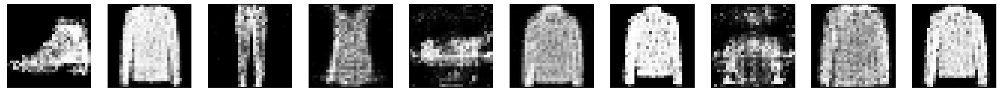

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:08,  1.81it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:09,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:08,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:08,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:06,  1.80it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:07,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:07,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:06,  1.78it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:06,  1.77it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:05,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:05,  1.78it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:05,  1.77it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:04,  1.78it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:07<02:02,  1.80it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:02,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  7%|█████▌                                                                           | 16/234 [00:08<02:02,  1.78it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:02,  1.78it/s]

epoch:  56
8/8 [==============================] - 0s 31ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:52,  1.25it/s]

epoch:  56
8/8 [==============================] - 0s 32ms/step


  8%|██████▌                                                                          | 19/234 [00:12<03:31,  1.02it/s]

epoch:  56
8/8 [==============================] - 0s 34ms/step


  9%|██████▉                                                                          | 20/234 [00:13<04:10,  1.17s/it]

epoch:  56
8/8 [==============================] - 0s 35ms/step


  9%|███████▎                                                                         | 21/234 [00:15<04:10,  1.17s/it]

epoch:  56
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:15<03:28,  1.02it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 10%|███████▉                                                                         | 23/234 [00:16<03:00,  1.17it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:16<02:39,  1.31it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:17<02:26,  1.42it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:17<02:16,  1.53it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:18<02:10,  1.59it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:18<02:05,  1.64it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:19<02:02,  1.67it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:20<01:59,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:20<01:57,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:21<01:54,  1.76it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:21<01:52,  1.79it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:22<01:49,  1.82it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:22<01:47,  1.85it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:23<01:45,  1.88it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:23<01:43,  1.91it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 16%|█████████████▏                                                                   | 38/234 [00:24<01:41,  1.93it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▌                                                                   | 39/234 [00:24<01:39,  1.96it/s]

epoch:  56
8/8 [==============================] - 0s 13ms/step


 17%|█████████████▊                                                                   | 40/234 [00:25<01:45,  1.83it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:26<01:50,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:26<01:53,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▉                                                                  | 43/234 [00:27<01:54,  1.67it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▏                                                                 | 44/234 [00:27<01:53,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:28<01:52,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:29<01:51,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:29<01:50,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:30<01:49,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▉                                                                | 49/234 [00:30<01:48,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:31<01:48,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 22%|█████████████████▋                                                               | 51/234 [00:32<01:48,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:32<01:47,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:33<01:47,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▋                                                              | 54/234 [00:33<01:47,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:34<01:46,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:34<01:45,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:35<01:49,  1.62it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:36<01:46,  1.65it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:36<01:44,  1.67it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:37<01:40,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████                                                            | 61/234 [00:37<01:41,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:38<01:40,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:39<01:41,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:39<01:41,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:40<01:40,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:40<01:39,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:41<01:38,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:42<01:37,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:42<01:36,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:43<01:36,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:43<01:35,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:44<01:35,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:45<01:34,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:45<01:33,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:46<01:33,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:46<01:33,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:47<01:32,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 33%|███████████████████████████                                                      | 78/234 [00:47<01:31,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:48<01:29,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:49<01:28,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████                                                     | 81/234 [00:49<01:29,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:50<01:28,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:50<01:27,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:51<01:27,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:52<01:26,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:52<01:26,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:53<01:25,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:53<01:24,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:54<01:22,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:54<01:22,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:55<01:22,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:56<01:22,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:56<01:20,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:57<01:20,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:57<01:20,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:58<01:19,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:58<01:19,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:59<01:18,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:00<01:18,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:00<01:17,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:01<01:17,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:01<01:17,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:02<01:16,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:03<01:15,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:03<01:14,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:04<01:14,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:04<01:13,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:05<01:12,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:05<01:12,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:06<01:12,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:07<01:11,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:07<01:11,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:08<01:10,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:08<01:09,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:09<01:09,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:10<01:08,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:10<01:08,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:11<01:07,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:11<01:06,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:12<01:06,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:12<01:05,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:13<01:05,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:14<01:04,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:14<01:03,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:15<01:03,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:15<01:01,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:16<01:01,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:16<01:00,  1.76it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:17<00:59,  1.76it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:18<00:59,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:18<00:58,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:19<00:58,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:19<01:00,  1.67it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:20<00:59,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:21<00:58,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:21<00:56,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:22<00:56,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:22<00:54,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:23<00:54,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:23<00:53,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:24<00:53,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:25<00:52,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:25<00:52,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:26<00:52,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:26<00:51,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:27<00:49,  1.76it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:27<00:49,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:28<00:49,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:29<00:48,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:29<00:48,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:30<00:48,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:30<00:47,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:31<00:46,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:31<00:46,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:32<00:45,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:33<00:44,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:33<00:44,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:34<00:43,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:34<00:42,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:35<00:42,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:35<00:41,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:36<00:41,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:37<00:40,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:37<00:40,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:38<00:40,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:38<00:39,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:39<00:38,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:39<00:37,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:40<00:37,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:41<00:36,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:41<00:35,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:42<00:35,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:42<00:34,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:43<00:33,  1.77it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:43<00:33,  1.76it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:44<00:33,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:45<00:32,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:45<00:32,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:46<00:31,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:46<00:31,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:47<00:30,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:48<00:30,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:48<00:29,  1.75it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:49<00:28,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:49<00:28,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:50<00:27,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:50<00:27,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:51<00:26,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:52<00:26,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:52<00:25,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:53<00:25,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:53<00:24,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:54<00:24,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:55<00:23,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:55<00:23,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:56<00:22,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:56<00:21,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:57<00:21,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:57<00:20,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:58<00:19,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:59<00:19,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:59<00:18,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:00<00:18,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:00<00:17,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:01<00:17,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:02<00:16,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:02<00:15,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:03<00:15,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:03<00:14,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:04<00:14,  1.69it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:05<00:13,  1.68it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:05<00:12,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:06<00:12,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:06<00:11,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:07<00:11,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:07<00:10,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:08<00:09,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:09<00:09,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:09<00:08,  1.70it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:10<00:08,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:10<00:07,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:11<00:06,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:12<00:06,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:12<00:05,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:13<00:05,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:13<00:04,  1.71it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:14<00:04,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:14<00:03,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:15<00:02,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:16<00:02,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:16<00:01,  1.73it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:17<00:01,  1.72it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:17<00:00,  1.74it/s]

epoch:  56
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:18<00:00,  1.69it/s]


epoch:  56


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 16ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:21,  1.65it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:18,  1.67it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:15,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:14,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:14,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:12,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:11,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:11,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:10,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:10,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:10,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:10,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:09,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:10,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:09,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  7%|█████▌                                                                           | 16/234 [00:09<02:08,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:07,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:06,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:11<02:06,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<02:05,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:12<02:04,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:12<02:04,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:13<02:03,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:14<02:03,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:14<02:02,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 11%|█████████                                                                        | 26/234 [00:15<02:01,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<02:00,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:16<02:00,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:17<02:05,  1.63it/s]

epoch:  57
8/8 [==============================] - 0s 13ms/step


 13%|██████████▍                                                                      | 30/234 [00:17<02:00,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:18<01:57,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 13ms/step


 14%|███████████                                                                      | 32/234 [00:18<01:54,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 14%|███████████▍                                                                     | 33/234 [00:19<01:57,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:19<01:57,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:20<01:56,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:21<01:56,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 16%|████████████▊                                                                    | 37/234 [00:21<01:55,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:22<01:55,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▌                                                                   | 39/234 [00:22<01:53,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▊                                                                   | 40/234 [00:23<01:53,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:24<01:53,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:24<01:53,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:25<01:52,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:25<01:51,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▌                                                                 | 45/234 [00:26<01:50,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:26<01:49,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:27<01:48,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:28<01:48,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:28<01:47,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:29<01:47,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 22%|█████████████████▋                                                               | 51/234 [00:29<01:46,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:30<01:45,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:31<01:45,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▋                                                              | 54/234 [00:31<01:44,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:32<01:43,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:32<01:43,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:33<01:41,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:33<01:41,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████▍                                                            | 59/234 [00:34<01:41,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:35<01:40,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:35<01:38,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:36<01:39,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:36<01:41,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:37<01:42,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:38<01:41,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:38<01:40,  1.67it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:39<01:40,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:39<01:40,  1.65it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:40<01:39,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:41<01:38,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:41<01:38,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:42<01:37,  1.66it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:42<01:37,  1.65it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:43<01:35,  1.67it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:44<01:34,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:44<01:33,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:45<01:32,  1.69it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 33%|███████████████████████████                                                      | 78/234 [00:45<01:31,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:46<01:31,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:46<01:30,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████                                                     | 81/234 [00:47<01:29,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:48<01:28,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:48<01:27,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:49<01:25,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:49<01:24,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:50<01:24,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:50<01:22,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:51<01:21,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:52<01:22,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:52<01:22,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:53<01:22,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:53<01:21,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:54<01:21,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:55<01:22,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:55<01:20,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:56<01:21,  1.70it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:56<01:19,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:57<01:19,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:57<01:18,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:58<01:17,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:59<01:17,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:59<01:16,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:00<01:15,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:00<01:15,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:01<01:14,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:01<01:14,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:02<01:13,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:03<01:12,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:03<01:12,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:04<01:11,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:04<01:11,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:05<01:10,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:06<01:09,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:06<01:09,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:07<01:08,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:07<01:07,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:08<01:06,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:08<01:05,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:09<01:05,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:09<01:04,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:10<01:04,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:11<01:03,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:11<01:03,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:12<01:02,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:12<01:02,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:13<01:02,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:14<01:00,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:14<01:00,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:15<01:00,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:15<00:59,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:16<00:58,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:16<00:57,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:17<00:57,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:17<00:56,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:18<00:56,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:19<00:55,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:19<00:55,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:20<00:54,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:20<00:53,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:21<00:52,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:21<00:52,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:22<00:52,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:23<00:52,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:23<00:51,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:24<00:51,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:24<00:50,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:25<00:50,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:25<00:49,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:26<00:48,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:27<00:48,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:27<00:47,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:28<00:47,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:28<00:46,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:29<00:46,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:30<00:46,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:30<00:45,  1.71it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:31<00:44,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:31<00:43,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:32<00:43,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:32<00:42,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:33<00:41,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:34<00:41,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:34<00:40,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:35<00:40,  1.72it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:35<00:39,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:36<00:39,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:36<00:38,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:37<00:37,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:38<00:36,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:38<00:36,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:39<00:35,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:39<00:35,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:40<00:34,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:40<00:34,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:41<00:33,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:42<00:33,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:42<00:32,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:43<00:31,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:43<00:31,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:44<00:30,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:44<00:29,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:45<00:29,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:46<00:34,  1.49it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:46<00:32,  1.55it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:47<00:30,  1.63it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:48<00:28,  1.68it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:48<00:27,  1.73it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:49<00:26,  1.74it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:49<00:25,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:50<00:25,  1.75it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:50<00:24,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:51<00:23,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:51<00:23,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:52<00:22,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:53<00:21,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:53<00:21,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:54<00:20,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:54<00:20,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:55<00:19,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:55<00:18,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:56<00:18,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:57<00:17,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:57<00:17,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:58<00:16,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:58<00:16,  1.76it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:59<00:15,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:59<00:15,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:00<00:14,  1.77it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:00<00:14,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:01<00:13,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:02<00:12,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:02<00:12,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:03<00:11,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:03<00:11,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:04<00:10,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:04<00:10,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:05<00:09,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:05<00:08,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:06<00:08,  1.82it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:07<00:07,  1.82it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:07<00:07,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:08<00:06,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:08<00:06,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:09<00:05,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:09<00:04,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:10<00:04,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:10<00:03,  1.81it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:11<00:03,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:12<00:02,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:12<00:02,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:13<00:01,  1.78it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:13<00:01,  1.80it/s]

epoch:  57
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:14<00:00,  1.79it/s]

epoch:  57
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:14<00:00,  1.74it/s]


epoch:  57


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:11,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:10,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:11,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:18,  1.66it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:12,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:07,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 13ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:03,  1.84it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:05,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:05,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:05,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:05,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:04,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:03,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:07<02:02,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:02,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  7%|█████▌                                                                           | 16/234 [00:08<02:02,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:02,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:01,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:10<02:01,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<01:59,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:59,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:12<01:59,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:59,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:57,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:14<01:57,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:57,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<01:57,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<01:57,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:16<01:54,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<01:54,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:54,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:18<01:54,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:53,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:19<01:53,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:51,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:20<01:50,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:50,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 16%|█████████████▏                                                                   | 38/234 [00:21<01:49,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:48,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:22<01:46,  1.82it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:23<01:47,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:23<01:48,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:24<01:49,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▏                                                                 | 44/234 [00:24<01:47,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:25<01:47,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:47,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:26<01:45,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:27<01:45,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:27<01:44,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:28<01:44,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:28<01:42,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:29<01:42,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:29<01:41,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▋                                                              | 54/234 [00:30<01:39,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:30<01:40,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:31<01:40,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:32<01:39,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:32<01:39,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████▍                                                            | 59/234 [00:33<01:39,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 26%|████████████████████▊                                                            | 60/234 [00:33<01:38,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:34<01:38,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:34<01:38,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:35<01:37,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:36<01:38,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:36<01:36,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:37<01:35,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:37<01:35,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:38<01:35,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:39<01:36,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:39<01:34,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:40<01:33,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:40<01:33,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:41<01:33,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:41<01:32,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:42<01:31,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:43<01:31,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:43<01:31,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 33%|███████████████████████████                                                      | 78/234 [00:44<01:30,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:44<01:29,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:45<01:29,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████                                                     | 81/234 [00:45<01:27,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:46<01:27,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:47<01:25,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:47<01:23,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:48<01:23,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:48<01:23,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:49<01:23,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:49<01:21,  1.79it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:50<01:22,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:50<01:22,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:51<01:21,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:52<01:20,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:52<01:19,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:53<01:19,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:53<01:20,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:54<01:19,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:55<01:18,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:55<01:18,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:56<01:18,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:56<01:17,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:57<01:15,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:57<01:14,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:58<01:14,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [00:59<01:14,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [00:59<01:13,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:00<01:12,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:00<01:11,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:01<01:11,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:01<01:11,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:02<01:11,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:03<01:10,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:03<01:10,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:04<01:10,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:04<01:09,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:05<01:09,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:05<01:09,  1.70it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:06<01:08,  1.70it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:07<01:07,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:07<01:06,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:08<01:05,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:08<01:04,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:09<01:04,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:09<01:02,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:10<01:02,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:11<01:01,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:11<01:00,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:12<01:01,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:12<01:00,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:13<01:00,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:13<01:00,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:14<00:59,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:15<00:59,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:15<00:58,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:16<00:58,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:16<00:57,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:17<00:57,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:18<00:55,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:18<00:54,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:19<00:53,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:19<00:53,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:20<00:53,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:20<00:53,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:21<00:52,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:22<00:52,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:22<00:51,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:23<00:51,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:23<00:49,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:24<00:48,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:24<00:48,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:25<00:48,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:26<00:47,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:26<00:47,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:27<00:46,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:27<00:46,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:28<00:45,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:28<00:44,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:29<00:44,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:30<00:43,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:30<00:43,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:31<00:42,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:31<00:41,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:32<00:41,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:32<00:40,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:33<00:40,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:34<00:39,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:34<00:38,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:35<00:38,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:35<00:37,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:36<00:37,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:36<00:36,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:37<00:36,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:38<00:36,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:38<00:35,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:39<00:34,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:39<00:34,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:40<00:33,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:41<00:33,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:41<00:32,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:42<00:31,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:42<00:31,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:43<00:30,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:43<00:29,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:44<00:28,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:45<00:28,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:45<00:27,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:46<00:28,  1.68it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:46<00:27,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:47<00:26,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:48<00:26,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:48<00:25,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:49<00:24,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:49<00:23,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:50<00:23,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:50<00:22,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:51<00:21,  1.78it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:51<00:21,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:52<00:21,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:53<00:20,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:53<00:20,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:54<00:19,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:54<00:18,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:55<00:18,  1.75it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:56<00:17,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:56<00:17,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:57<00:16,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [01:57<00:16,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [01:58<00:16,  1.66it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [01:59<00:15,  1.66it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [01:59<00:14,  1.68it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:00<00:14,  1.69it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:00<00:13,  1.70it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:01<00:12,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:01<00:12,  1.67it/s]

epoch:  58
8/8 [==============================] - 0s 14ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:02<00:11,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:03<00:10,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:03<00:09,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 13ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:04<00:09,  1.80it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:04<00:09,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:05<00:08,  1.77it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:05<00:08,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:06<00:07,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:07<00:07,  1.70it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:07<00:06,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:08<00:05,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:08<00:05,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:09<00:04,  1.71it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:09<00:04,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:10<00:03,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:11<00:02,  1.73it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:11<00:02,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:12<00:01,  1.76it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:12<00:01,  1.74it/s]

epoch:  58
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:13<00:00,  1.72it/s]

epoch:  58
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:13<00:00,  1.75it/s]


epoch:  58


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:15,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:12,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:09,  1.78it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:09,  1.78it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:10,  1.76it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  3%|██                                                                                | 6/234 [00:03<02:11,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:11,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:11,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:11,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:09,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:09,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:07,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:05,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:05,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:06,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


  7%|█████▌                                                                           | 16/234 [00:09<02:06,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:06,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:06,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:10<02:05,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<02:05,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:12<02:02,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:12<02:00,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:13<01:58,  1.78it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:57,  1.78it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:14<01:59,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:57,  1.77it/s]

epoch:  59
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<01:59,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 12%|█████████▋                                                                       | 28/234 [00:16<01:58,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:16<01:58,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 13%|██████████▍                                                                      | 30/234 [00:17<01:58,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:57,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:18<01:56,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 14%|███████████▍                                                                     | 33/234 [00:19<01:56,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 15%|███████████▊                                                                     | 34/234 [00:19<01:56,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:20<01:54,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 15%|████████████▍                                                                    | 36/234 [00:20<01:54,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 16%|████████████▊                                                                    | 37/234 [00:21<01:54,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:21<01:53,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▌                                                                   | 39/234 [00:22<01:53,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:23<01:52,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:23<01:52,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:24<01:51,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▉                                                                  | 43/234 [00:24<01:51,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▏                                                                 | 44/234 [00:25<01:51,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:26<01:50,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:26<01:50,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 20%|████████████████▎                                                                | 47/234 [00:27<01:49,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▌                                                                | 48/234 [00:27<01:49,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:28<01:47,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:28<01:48,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 22%|█████████████████▋                                                               | 51/234 [00:29<01:47,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:30<01:46,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:30<01:45,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▋                                                              | 54/234 [00:31<01:45,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:31<01:43,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:32<01:43,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████▋                                                             | 57/234 [00:32<01:41,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:33<01:41,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████▍                                                            | 59/234 [00:34<01:39,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 26%|████████████████████▊                                                            | 60/234 [00:34<01:39,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:35<01:39,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:35<01:40,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:36<01:39,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:37<01:39,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:37<01:38,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:38<01:36,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:38<01:35,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:39<01:36,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:39<01:35,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:40<01:35,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:41<01:35,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:41<01:34,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:42<01:33,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:42<01:33,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:43<01:33,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:44<01:32,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:44<01:32,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 33%|███████████████████████████                                                      | 78/234 [00:45<01:31,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:45<01:30,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:46<01:29,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████                                                     | 81/234 [00:46<01:28,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:47<01:28,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:48<01:28,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:48<01:27,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:49<01:27,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:49<01:25,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:50<01:24,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:50<01:24,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:51<01:23,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:52<01:23,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:52<01:22,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:53<01:22,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:53<01:22,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:54<01:21,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:55<01:20,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:55<01:20,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:56<01:20,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:56<01:18,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:57<01:18,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:57<01:17,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:58<01:17,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:59<01:17,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [00:59<01:16,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:00<01:15,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:00<01:14,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:01<01:13,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:02<01:13,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:02<01:13,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:03<01:13,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:03<01:12,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:04<01:11,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:04<01:10,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:05<01:10,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:06<01:10,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:06<01:09,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:07<01:09,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:07<01:07,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:08<01:07,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:09<01:07,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:09<01:05,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:10<01:05,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:10<01:05,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:11<01:05,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:11<01:04,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:12<01:03,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:13<01:03,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:13<01:02,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:14<01:02,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:14<01:03,  1.65it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:15<01:02,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:16<01:01,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:16<01:00,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:17<00:59,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:17<00:58,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:18<00:58,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:19<00:57,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:19<00:57,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:20<00:57,  1.68it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:20<00:56,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:21<00:56,  1.67it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:22<00:55,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:22<00:53,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:23<00:53,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:23<00:53,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:24<00:52,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:24<00:52,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:25<00:50,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:26<00:50,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:26<00:50,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:27<00:48,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:27<00:48,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:28<00:48,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:29<00:47,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:29<00:46,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:30<00:46,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:30<00:45,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:31<00:45,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:32<00:44,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:32<00:43,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:33<00:43,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:33<00:43,  1.67it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:34<00:43,  1.65it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:35<00:43,  1.63it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:35<00:42,  1.64it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:36<00:41,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:36<00:41,  1.65it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:37<00:40,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:38<00:39,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:38<00:39,  1.65it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:39<00:38,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:39<00:38,  1.66it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:40<00:37,  1.67it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:41<00:36,  1.65it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:41<00:35,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:42<00:34,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:42<00:34,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:43<00:33,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:43<00:32,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:44<00:32,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:45<00:31,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:45<00:30,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:46<00:30,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:46<00:29,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:47<00:28,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:48<00:29,  1.67it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:48<00:28,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 13ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:49<00:27,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 13ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:49<00:25,  1.79it/s]

epoch:  59
8/8 [==============================] - 0s 13ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:50<00:25,  1.80it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:50<00:25,  1.76it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:51<00:24,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:52<00:24,  1.75it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:52<00:23,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:53<00:23,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:53<00:22,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:54<00:22,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:54<00:21,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:55<00:20,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:56<00:20,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:56<00:19,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:57<00:18,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:57<00:18,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:58<00:18,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [01:59<00:17,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [01:59<00:17,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:00<00:16,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:00<00:15,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:01<00:15,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:01<00:14,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:02<00:14,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:03<00:13,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:03<00:13,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:04<00:12,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:04<00:11,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:05<00:11,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:06<00:10,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:06<00:10,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:07<00:09,  1.69it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:07<00:08,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:08<00:08,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:09<00:07,  1.70it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:09<00:06,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:10<00:06,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:10<00:05,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:11<00:05,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:11<00:04,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:12<00:04,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:13<00:03,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:13<00:02,  1.72it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:14<00:02,  1.71it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:14<00:01,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:15<00:01,  1.74it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:15<00:00,  1.73it/s]

epoch:  59
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:16<00:00,  1.71it/s]


epoch:  59


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 16ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:18,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:17,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  1%|█                                                                                 | 3/234 [00:01<02:16,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:16,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:15,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:14,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:14,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:12,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:13,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:11,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:11,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:11,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:08,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:08,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:08,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  7%|█████▌                                                                           | 16/234 [00:09<02:08,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:06,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:05,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  8%|██████▌                                                                          | 19/234 [00:11<02:05,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<02:04,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


  9%|███████▎                                                                         | 21/234 [00:12<02:05,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:12<02:04,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 10%|███████▉                                                                         | 23/234 [00:13<02:03,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:14<02:02,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 11%|████████▋                                                                        | 25/234 [00:14<02:02,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:15<02:02,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<02:02,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:16<02:00,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 12%|██████████                                                                       | 29/234 [00:17<02:00,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 13%|██████████▍                                                                      | 30/234 [00:17<02:00,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 13%|██████████▋                                                                      | 31/234 [00:18<01:59,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 14%|███████████                                                                      | 32/234 [00:18<01:57,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 14%|███████████▍                                                                     | 33/234 [00:19<01:58,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:19<01:57,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 15%|████████████                                                                     | 35/234 [00:20<01:57,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 15%|████████████▍                                                                    | 36/234 [00:21<01:57,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 16%|████████████▊                                                                    | 37/234 [00:21<01:55,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:22<01:56,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▌                                                                   | 39/234 [00:22<01:54,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:23<01:52,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:24<01:52,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:24<01:50,  1.74it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▉                                                                  | 43/234 [00:25<01:51,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▏                                                                 | 44/234 [00:25<01:50,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:26<01:48,  1.74it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:26<01:48,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 20%|████████████████▎                                                                | 47/234 [00:27<01:49,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▌                                                                | 48/234 [00:28<01:49,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:28<01:47,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 21%|█████████████████▎                                                               | 50/234 [00:29<01:49,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 22%|█████████████████▋                                                               | 51/234 [00:29<01:47,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 22%|██████████████████                                                               | 52/234 [00:30<01:47,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▎                                                              | 53/234 [00:31<01:45,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▋                                                              | 54/234 [00:31<01:45,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████                                                              | 55/234 [00:32<01:45,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████▍                                                             | 56/234 [00:32<01:45,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:33<01:45,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████                                                             | 58/234 [00:34<01:43,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████▍                                                            | 59/234 [00:34<01:43,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 26%|████████████████████▊                                                            | 60/234 [00:35<01:41,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 26%|█████████████████████                                                            | 61/234 [00:35<01:41,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:36<01:42,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:36<01:40,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:37<01:39,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:38<01:38,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:38<01:37,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:39<01:37,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:39<01:37,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:40<01:37,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:41<01:35,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:41<01:35,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:42<01:35,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:42<01:34,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:43<01:33,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:44<01:33,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:44<01:31,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:45<01:31,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:45<01:30,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:46<01:30,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:46<01:29,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████                                                     | 81/234 [00:47<01:30,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:48<01:30,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:48<01:30,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:49<01:29,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:49<01:28,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:50<01:26,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:51<01:26,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:51<01:24,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:52<01:24,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:52<01:24,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:53<01:24,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:54<01:23,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:54<01:24,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:55<01:22,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:55<01:22,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:56<01:20,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:56<01:20,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:57<01:20,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:58<01:19,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:58<01:18,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:59<01:16,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:59<01:16,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:00<01:17,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:01<01:16,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:01<01:14,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:02<01:15,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:02<01:14,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:03<01:14,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:04<01:14,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:04<01:13,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:05<01:13,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:05<01:12,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:06<01:11,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:06<01:11,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:07<01:10,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:08<01:10,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:08<01:09,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:09<01:08,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:09<01:08,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:10<01:07,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:11<01:05,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:11<01:04,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:12<01:07,  1.65it/s]

epoch:  60
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:12<01:07,  1.63it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:13<01:05,  1.66it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:14<01:05,  1.65it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:14<01:03,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:15<01:03,  1.66it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:15<01:03,  1.65it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:16<01:02,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:17<01:01,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:17<01:01,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:18<00:59,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:18<00:59,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:19<00:58,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:20<00:57,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:20<00:56,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:21<00:56,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:21<00:56,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:22<00:54,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:23<00:54,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:23<00:54,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:24<00:54,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:24<00:53,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:25<00:53,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:25<00:52,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:26<00:52,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:27<00:50,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:27<00:49,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:28<00:49,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:28<00:48,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:29<00:48,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:30<00:47,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:30<00:46,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:31<00:47,  1.65it/s]

epoch:  60
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:31<00:46,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 13ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:32<00:44,  1.75it/s]

epoch:  60
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:32<00:42,  1.78it/s]

epoch:  60
8/8 [==============================] - 0s 13ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:33<00:42,  1.78it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:34<00:41,  1.77it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:34<00:41,  1.76it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:35<00:40,  1.76it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:35<00:41,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:36<00:41,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:37<00:40,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:37<00:40,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:38<00:39,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:38<00:38,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:39<00:38,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:39<00:37,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:40<00:36,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:41<00:36,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:41<00:36,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:42<00:35,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:42<00:34,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:43<00:33,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:44<00:33,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:44<00:32,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:45<00:32,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:45<00:32,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:46<00:31,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:47<00:30,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:47<00:30,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:48<00:29,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:48<00:29,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:49<00:28,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:50<00:27,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:50<00:27,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:51<00:26,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:51<00:25,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:52<00:25,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:53<00:25,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:53<00:24,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:54<00:23,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:54<00:23,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:55<00:22,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [01:55<00:21,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [01:56<00:21,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [01:57<00:20,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [01:57<00:20,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [01:58<00:19,  1.66it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [01:58<00:19,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [01:59<00:18,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:00<00:17,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:00<00:17,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:01<00:16,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:01<00:16,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:02<00:15,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:03<00:14,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:03<00:14,  1.65it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:04<00:13,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:04<00:12,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:05<00:12,  1.67it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:06<00:11,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:06<00:11,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:07<00:10,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:07<00:10,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:08<00:09,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:09<00:08,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:09<00:08,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:10<00:07,  1.73it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:10<00:06,  1.74it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:11<00:06,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:11<00:05,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:12<00:05,  1.68it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:13<00:04,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:13<00:04,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:14<00:03,  1.69it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:14<00:02,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:15<00:02,  1.70it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:16<00:01,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:16<00:01,  1.71it/s]

epoch:  60
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:17<00:00,  1.72it/s]

epoch:  60
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:17<00:00,  1.70it/s]

epoch:  60
1/1 [==============================] - 0s 35ms/step


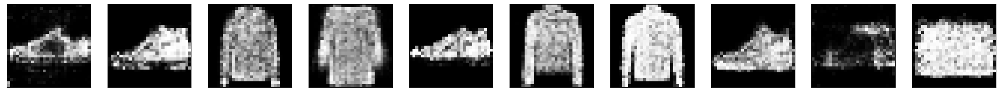

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 16ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:20,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:17,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:17,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:14,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:13,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:13,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:13,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:11,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:11,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:10,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:11,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:10,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:10,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:10,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:10,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:09<02:08,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:09<02:06,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:10<02:06,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:11<02:06,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:11<02:04,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:12<02:03,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:12<02:03,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:13<02:04,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:14<02:03,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:14<02:05,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 11%|█████████                                                                        | 26/234 [00:15<02:04,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<02:04,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:16<02:04,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 12%|██████████                                                                       | 29/234 [00:17<02:04,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 13%|██████████▍                                                                      | 30/234 [00:17<02:03,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 13%|██████████▋                                                                      | 31/234 [00:18<02:03,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 14%|███████████                                                                      | 32/234 [00:18<02:02,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 14%|███████████▍                                                                     | 33/234 [00:19<02:03,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 15%|███████████▊                                                                     | 34/234 [00:20<02:00,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 15%|████████████                                                                     | 35/234 [00:20<01:58,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 15%|████████████▍                                                                    | 36/234 [00:21<02:01,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 16%|████████████▊                                                                    | 37/234 [00:22<02:03,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:22<02:03,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▌                                                                   | 39/234 [00:23<02:03,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▊                                                                   | 40/234 [00:23<02:03,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▏                                                                  | 41/234 [00:24<02:02,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:25<02:01,  1.57it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▉                                                                  | 43/234 [00:25<02:00,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▏                                                                 | 44/234 [00:26<02:00,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▌                                                                 | 45/234 [00:27<02:00,  1.57it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:27<01:58,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:28<01:54,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:28<01:54,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 21%|████████████████▉                                                                | 49/234 [00:29<01:55,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 21%|█████████████████▎                                                               | 50/234 [00:30<01:55,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 22%|█████████████████▋                                                               | 51/234 [00:30<01:56,  1.57it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 22%|██████████████████                                                               | 52/234 [00:31<01:54,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▎                                                              | 53/234 [00:32<01:54,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 23%|██████████████████▋                                                              | 54/234 [00:32<01:54,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████                                                              | 55/234 [00:33<01:53,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████▍                                                             | 56/234 [00:34<01:52,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▋                                                             | 57/234 [00:34<01:51,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████                                                             | 58/234 [00:35<01:50,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████▍                                                            | 59/234 [00:35<01:50,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 26%|████████████████████▊                                                            | 60/234 [00:36<01:51,  1.57it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:37<01:49,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:37<01:48,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:38<01:49,  1.56it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:39<01:50,  1.54it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:39<01:48,  1.56it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:40<01:46,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:41<01:45,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:41<01:44,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:42<01:43,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:42<01:43,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:43<01:42,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:44<01:40,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:44<01:40,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:45<01:40,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:46<01:39,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:46<01:38,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:47<01:37,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:47<01:38,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:48<01:37,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:49<01:37,  1.58it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████                                                     | 81/234 [00:49<01:36,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:50<01:35,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:51<01:32,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:51<01:32,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:52<01:32,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:52<01:31,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:53<01:29,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:54<01:29,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:54<01:27,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:55<01:25,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:55<01:24,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:56<01:24,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:57<01:25,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:57<01:24,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:58<01:24,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:58<01:22,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:59<01:23,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:00<01:21,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:00<01:20,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:01<01:19,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:01<01:19,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:02<01:19,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:03<01:19,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:03<01:18,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:04<01:17,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:04<01:17,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:05<01:16,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:06<01:15,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:06<01:15,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:07<01:13,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:07<01:14,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:08<01:13,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:09<01:14,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:09<01:12,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:10<01:12,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:10<01:10,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:11<01:09,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:12<01:08,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:12<01:08,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:13<01:11,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:13<01:08,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 13ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:14<01:06,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:15<01:04,  1.72it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:15<01:05,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:16<01:14,  1.46it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:17<01:10,  1.54it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:17<01:08,  1.56it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:18<01:06,  1.59it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:18<01:04,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:19<01:03,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:20<01:03,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:20<01:02,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:21<01:01,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:21<01:00,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:22<00:59,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:23<00:58,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:23<00:57,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:24<00:57,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:24<00:57,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:25<00:57,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:26<00:55,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:26<00:55,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:27<00:54,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:27<00:53,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:28<00:52,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:29<00:51,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:29<00:51,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:30<00:50,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:30<00:49,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:31<00:49,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:32<00:48,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:32<00:47,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:33<00:47,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:33<00:46,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:34<00:46,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:35<00:46,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:35<00:46,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:36<00:46,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:36<00:44,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:37<00:43,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:38<00:43,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:38<00:43,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:39<00:42,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:39<00:42,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:40<00:42,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:41<00:41,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:41<00:41,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:42<00:40,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:42<00:40,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:43<00:39,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:44<00:38,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:44<00:38,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:45<00:37,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:46<00:37,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:46<00:36,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:47<00:35,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:47<00:35,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:48<00:34,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:49<00:34,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:49<00:33,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:50<00:32,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:51<00:32,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:51<00:31,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:52<00:31,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:52<00:30,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:53<00:29,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:54<00:29,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:54<00:28,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:55<00:27,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:55<00:27,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:56<00:26,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [01:57<00:26,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [01:57<00:25,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [01:58<00:24,  1.62it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [01:59<00:24,  1.61it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [01:59<00:23,  1.60it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:00<00:22,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:00<00:21,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:01<00:21,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:02<00:20,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:02<00:19,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:03<00:19,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:03<00:18,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:04<00:17,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:05<00:17,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:05<00:16,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:06<00:15,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:06<00:15,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:07<00:14,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:08<00:14,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:08<00:13,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:09<00:12,  1.69it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:09<00:12,  1.70it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:10<00:11,  1.71it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:10<00:11,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:11<00:10,  1.68it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:12<00:10,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:12<00:09,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:13<00:09,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:13<00:08,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:14<00:07,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:15<00:07,  1.67it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:15<00:06,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:16<00:06,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:17<00:05,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:17<00:04,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:18<00:04,  1.65it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:18<00:03,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:19<00:03,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:20<00:02,  1.63it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:20<00:01,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:21<00:01,  1.66it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:21<00:00,  1.64it/s]

epoch:  61
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:22<00:00,  1.64it/s]


epoch:  61


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 16ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:23,  1.63it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:24,  1.61it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  1%|█                                                                                 | 3/234 [00:01<02:24,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:24,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:24,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  3%|██                                                                                | 6/234 [00:03<02:21,  1.61it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:21,  1.60it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:21,  1.60it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:19,  1.61it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:18,  1.62it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:19,  1.60it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:19,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:20,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:19,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  6%|█████▏                                                                           | 15/234 [00:09<02:21,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:20,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  7%|█████▉                                                                           | 17/234 [00:10<02:20,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  8%|██████▏                                                                          | 18/234 [00:11<02:19,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:18,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


  9%|██████▉                                                                          | 20/234 [00:12<02:18,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  9%|███████▎                                                                         | 21/234 [00:13<02:17,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


  9%|███████▌                                                                         | 22/234 [00:13<02:16,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 10%|███████▉                                                                         | 23/234 [00:14<02:18,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:15<02:18,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 11%|████████▋                                                                        | 25/234 [00:15<02:14,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 11%|█████████                                                                        | 26/234 [00:16<02:14,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 12%|█████████▎                                                                       | 27/234 [00:17<02:12,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:17<02:10,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 12%|██████████                                                                       | 29/234 [00:18<02:10,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 13%|██████████▍                                                                      | 30/234 [00:19<02:10,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 13%|██████████▋                                                                      | 31/234 [00:19<02:09,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 14%|███████████                                                                      | 32/234 [00:20<02:08,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 14%|███████████▍                                                                     | 33/234 [00:21<02:07,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 15%|███████████▊                                                                     | 34/234 [00:21<02:06,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 15%|████████████                                                                     | 35/234 [00:22<02:04,  1.60it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 15%|████████████▍                                                                    | 36/234 [00:22<02:03,  1.60it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 16%|████████████▊                                                                    | 37/234 [00:23<02:03,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:24<02:03,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▌                                                                   | 39/234 [00:24<02:03,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▊                                                                   | 40/234 [00:25<02:03,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:26<02:02,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:26<02:02,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▉                                                                  | 43/234 [00:27<02:02,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▏                                                                 | 44/234 [00:27<02:01,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▌                                                                 | 45/234 [00:28<02:00,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:29<02:00,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 20%|████████████████▎                                                                | 47/234 [00:29<01:59,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 21%|████████████████▌                                                                | 48/234 [00:30<01:59,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:31<01:58,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 21%|█████████████████▎                                                               | 50/234 [00:31<01:57,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 22%|█████████████████▋                                                               | 51/234 [00:32<01:57,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 22%|██████████████████                                                               | 52/234 [00:33<01:56,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▎                                                              | 53/234 [00:33<01:55,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▋                                                              | 54/234 [00:34<01:55,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████                                                              | 55/234 [00:35<01:54,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▍                                                             | 56/234 [00:35<01:54,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▋                                                             | 57/234 [00:36<01:54,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:36<01:53,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 25%|████████████████████▍                                                            | 59/234 [00:37<01:52,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 26%|████████████████████▊                                                            | 60/234 [00:38<01:53,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████                                                            | 61/234 [00:38<01:53,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:39<01:53,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:40<01:51,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:40<01:50,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:41<01:49,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:42<01:49,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:42<01:47,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:43<01:46,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:44<01:46,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:44<01:45,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:45<01:45,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:46<01:43,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:46<01:43,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:47<01:42,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:47<01:41,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:48<01:41,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:49<01:41,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:49<01:42,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:50<01:41,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:51<01:43,  1.49it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████                                                     | 81/234 [00:51<01:37,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:52<01:33,  1.62it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:52<01:30,  1.66it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:53<01:32,  1.62it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:54<01:34,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:54<01:34,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:55<01:35,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:56<01:35,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:56<01:34,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:57<01:32,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:58<01:32,  1.55it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:58<01:32,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:59<01:31,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:00<01:30,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:00<01:30,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:01<01:30,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:02<01:29,  1.54it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:02<01:29,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:03<01:29,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:04<01:28,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:04<01:27,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:05<01:27,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:06<01:26,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:06<01:25,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:07<01:25,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:08<01:23,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:08<01:23,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:09<01:22,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:10<01:22,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:10<01:21,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:11<01:20,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:12<01:19,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:12<01:19,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:13<01:19,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:14<01:18,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:14<01:17,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:15<01:17,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:15<01:16,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:16<01:15,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:17<01:15,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:18<01:15,  1.49it/s]

epoch:  62
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:18<01:15,  1.47it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:19<01:15,  1.48it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:20<01:13,  1.49it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:20<01:12,  1.50it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:21<01:11,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:22<01:10,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:22<01:11,  1.48it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:23<01:12,  1.46it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:24<01:12,  1.43it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:24<01:12,  1.42it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:25<01:11,  1.43it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:26<01:06,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:26<01:03,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:27<01:00,  1.64it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:27<00:57,  1.69it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:28<00:55,  1.74it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:29<00:58,  1.65it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:29<00:56,  1.67it/s]

epoch:  62
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:30<00:59,  1.58it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:31<01:00,  1.53it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:31<00:58,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:32<00:56,  1.62it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:32<00:54,  1.67it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:33<00:51,  1.72it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:33<00:50,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:34<00:49,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:35<00:51,  1.68it/s]

epoch:  62
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:35<00:56,  1.49it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:36<00:55,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:37<00:54,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:37<00:56,  1.44it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:38<00:53,  1.52it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:39<00:50,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:39<00:48,  1.64it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:40<00:46,  1.68it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:40<00:45,  1.70it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:41<00:44,  1.72it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:41<00:43,  1.74it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:42<00:42,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:43<00:42,  1.74it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:43<00:41,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:44<00:40,  1.76it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:44<00:39,  1.76it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:45<00:39,  1.77it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:45<00:38,  1.76it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:46<00:38,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:47<00:37,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:47<00:37,  1.73it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:48<00:37,  1.72it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:48<00:36,  1.71it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:49<00:38,  1.59it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:50<00:37,  1.61it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:50<00:37,  1.61it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:51<00:36,  1.63it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:51<00:35,  1.65it/s]

epoch:  62
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:52<00:36,  1.57it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:53<00:37,  1.50it/s]

epoch:  62
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:54<00:37,  1.47it/s]

epoch:  62
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:54<00:36,  1.48it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:55<00:35,  1.51it/s]

epoch:  62
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:56<00:39,  1.30it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:57<00:36,  1.40it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:57<00:33,  1.49it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:58<00:31,  1.56it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:58<00:29,  1.63it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:59<00:28,  1.68it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:59<00:26,  1.71it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:00<00:25,  1.75it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:00<00:24,  1.77it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:01<00:24,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:02<00:23,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:02<00:22,  1.81it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:03<00:21,  1.82it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:03<00:21,  1.83it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:04<00:20,  1.83it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:04<00:20,  1.83it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:05<00:19,  1.81it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:05<00:19,  1.80it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:06<00:18,  1.80it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:06<00:18,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:07<00:17,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:08<00:17,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:08<00:16,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:09<00:16,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:09<00:15,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:10<00:15,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:10<00:14,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:11<00:13,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:12<00:13,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:12<00:12,  1.80it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:13<00:12,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:13<00:11,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:14<00:11,  1.80it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:14<00:10,  1.80it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:15<00:09,  1.81it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:15<00:09,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:16<00:08,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:17<00:08,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:17<00:07,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:18<00:07,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 13ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:18<00:06,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:19<00:06,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:19<00:05,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:20<00:05,  1.79it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:20<00:04,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:21<00:03,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:22<00:03,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:22<00:02,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:23<00:02,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:23<00:01,  1.77it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:24<00:01,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:24<00:00,  1.78it/s]

epoch:  62
8/8 [==============================] - 0s 14ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:25<00:00,  1.61it/s]


epoch:  62


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 14ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:10,  1.78it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:09,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  1%|█                                                                                 | 3/234 [00:01<02:08,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:09,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  2%|█▊                                                                                | 5/234 [00:02<02:08,  1.78it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:08,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  3%|██▍                                                                               | 7/234 [00:03<02:07,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:07,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:06,  1.78it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  4%|███▍                                                                             | 10/234 [00:05<02:05,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:03,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


  5%|████▏                                                                            | 12/234 [00:06<02:02,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:07<02:01,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:07<02:00,  1.83it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  6%|█████▏                                                                           | 15/234 [00:08<02:00,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:08<02:00,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  7%|█████▉                                                                           | 17/234 [00:09<01:59,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  8%|██████▏                                                                          | 18/234 [00:10<01:59,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:10<01:59,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  9%|██████▉                                                                          | 20/234 [00:11<01:58,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  9%|███████▎                                                                         | 21/234 [00:11<01:58,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


  9%|███████▌                                                                         | 22/234 [00:12<01:58,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 10%|███████▉                                                                         | 23/234 [00:12<01:57,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 10%|████████▎                                                                        | 24/234 [00:13<01:57,  1.79it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:13<01:58,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 11%|█████████                                                                        | 26/234 [00:14<01:58,  1.76it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 12%|█████████▎                                                                       | 27/234 [00:15<01:59,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:15<02:01,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 12%|██████████                                                                       | 29/234 [00:16<02:02,  1.67it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 13%|██████████▍                                                                      | 30/234 [00:16<02:03,  1.66it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 13%|██████████▋                                                                      | 31/234 [00:17<01:59,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 14%|███████████                                                                      | 32/234 [00:18<01:56,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 14%|███████████▍                                                                     | 33/234 [00:18<01:54,  1.76it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 15%|███████████▊                                                                     | 34/234 [00:19<01:52,  1.78it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 15%|████████████                                                                     | 35/234 [00:19<01:50,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 15%|████████████▍                                                                    | 36/234 [00:20<01:48,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 16%|████████████▊                                                                    | 37/234 [00:20<01:47,  1.83it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 16%|█████████████▏                                                                   | 38/234 [00:21<01:47,  1.83it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▌                                                                   | 39/234 [00:21<01:47,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 17%|█████████████▊                                                                   | 40/234 [00:22<01:46,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▏                                                                  | 41/234 [00:22<01:46,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:23<01:45,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 18%|██████████████▉                                                                  | 43/234 [00:24<01:45,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:24<01:44,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 19%|███████████████▌                                                                 | 45/234 [00:25<01:44,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 20%|███████████████▉                                                                 | 46/234 [00:25<01:46,  1.76it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 20%|████████████████▎                                                                | 47/234 [00:26<01:49,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▌                                                                | 48/234 [00:26<01:47,  1.73it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:27<01:46,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 21%|█████████████████▎                                                               | 50/234 [00:28<01:44,  1.75it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 22%|█████████████████▋                                                               | 51/234 [00:28<01:42,  1.78it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:29<01:41,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 23%|██████████████████▎                                                              | 53/234 [00:29<01:40,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 23%|██████████████████▋                                                              | 54/234 [00:30<01:39,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████                                                              | 55/234 [00:30<01:38,  1.81it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:31<01:37,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▋                                                             | 57/234 [00:31<01:36,  1.83it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████                                                             | 58/234 [00:32<01:36,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 25%|████████████████████▍                                                            | 59/234 [00:33<01:36,  1.82it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:33<01:36,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████                                                            | 61/234 [00:34<01:36,  1.80it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:34<01:40,  1.71it/s]

epoch:  63
8/8 [==============================] - 0s 13ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:35<01:40,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:35<01:39,  1.71it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:36<01:37,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:37<01:35,  1.75it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:37<01:36,  1.73it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:38<01:36,  1.72it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:38<01:36,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:39<01:36,  1.70it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:40<01:36,  1.68it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:40<01:34,  1.71it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:41<01:33,  1.72it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:41<01:32,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:42<01:31,  1.75it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:42<01:30,  1.75it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:43<01:28,  1.76it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 33%|███████████████████████████                                                      | 78/234 [00:44<01:28,  1.77it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:44<01:28,  1.75it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:45<01:28,  1.74it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:45<01:31,  1.67it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:46<01:30,  1.68it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:47<01:32,  1.63it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:47<01:32,  1.62it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:48<01:31,  1.63it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:48<01:32,  1.60it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:49<01:34,  1.56it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:50<01:34,  1.54it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:50<01:34,  1.53it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:51<01:34,  1.52it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:52<01:34,  1.51it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:53<01:35,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:53<01:34,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:54<01:33,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:55<01:33,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:55<01:33,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [00:56<01:32,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [00:57<01:31,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [00:57<01:30,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [00:58<01:30,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [00:59<01:29,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [00:59<01:31,  1.45it/s]

epoch:  63
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:00<01:32,  1.42it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:01<01:30,  1.44it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:01<01:31,  1.41it/s]

epoch:  63
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:02<01:30,  1.41it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:03<01:27,  1.45it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:04<01:26,  1.45it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:04<01:25,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:05<01:24,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:06<01:23,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:06<01:22,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:07<01:21,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:08<01:21,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:08<01:20,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:09<01:19,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:10<01:18,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:10<01:18,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:11<01:17,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:12<01:16,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:12<01:15,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:13<01:14,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:14<01:14,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:14<01:14,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:15<01:13,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:16<01:12,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:16<01:12,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:17<01:11,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:18<01:09,  1.51it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:18<01:08,  1.52it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:19<01:08,  1.51it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:20<01:08,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:20<01:07,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:21<01:06,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:22<01:06,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:22<01:05,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:23<01:05,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:24<01:04,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:24<01:04,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:25<01:03,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:26<01:03,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:26<01:02,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:27<01:01,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:28<01:00,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:28<00:59,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:29<00:59,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:30<00:58,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:30<00:57,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:31<00:56,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:32<00:56,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:32<00:55,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:33<00:54,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:34<00:55,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:34<00:54,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:35<00:52,  1.50it/s]

epoch:  63
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:36<00:52,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:37<00:57,  1.34it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:37<00:55,  1.37it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:38<00:53,  1.40it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:39<00:51,  1.43it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:39<00:50,  1.44it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:40<00:49,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:41<00:48,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:41<00:47,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:42<00:46,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:43<00:45,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:43<00:45,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:44<00:44,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:45<00:43,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:45<00:42,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:46<00:42,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:47<00:41,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:48<00:41,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:48<00:40,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:49<00:38,  1.52it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:49<00:37,  1.54it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:50<00:36,  1.55it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:51<00:35,  1.56it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:51<00:34,  1.58it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:52<00:34,  1.58it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:53<00:33,  1.59it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:53<00:32,  1.59it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:54<00:31,  1.59it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:54<00:31,  1.59it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:55<00:31,  1.57it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:56<00:31,  1.54it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:56<00:30,  1.56it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:57<00:29,  1.58it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:58<00:29,  1.55it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:58<00:28,  1.53it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [01:59<00:28,  1.53it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:00<00:28,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:00<00:27,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:01<00:27,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:02<00:26,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:02<00:25,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:03<00:25,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:04<00:24,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:05<00:23,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:05<00:23,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:06<00:22,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:07<00:22,  1.44it/s]

epoch:  63
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:07<00:21,  1.45it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:08<00:20,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:09<00:19,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:09<00:19,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:10<00:18,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:11<00:17,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:11<00:16,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:12<00:16,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:13<00:16,  1.43it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:13<00:15,  1.45it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:14<00:14,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:15<00:13,  1.51it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:15<00:12,  1.53it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:16<00:11,  1.52it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:17<00:11,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:17<00:10,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:18<00:10,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:19<00:09,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:19<00:08,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:20<00:08,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:21<00:07,  1.49it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:21<00:06,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:22<00:06,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:23<00:05,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:23<00:04,  1.48it/s]

epoch:  63
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:24<00:04,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:25<00:03,  1.46it/s]

epoch:  63
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:26<00:02,  1.47it/s]

epoch:  63
8/8 [==============================] - 0s 14ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:26<00:01,  1.53it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:27<00:01,  1.58it/s]

epoch:  63
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:27<00:00,  1.56it/s]

epoch:  63
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:28<00:00,  1.58it/s]


epoch:  63


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 17ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:36,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:36,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  1%|█                                                                                 | 3/234 [00:02<02:33,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:33,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:33,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  3%|██                                                                                | 6/234 [00:04<02:34,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:32,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:31,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:30,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:29,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:28,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:28,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:28,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:27,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:27,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:26,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  7%|█████▉                                                                           | 17/234 [00:11<02:26,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  8%|██████▏                                                                          | 18/234 [00:12<02:24,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:23,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  9%|██████▉                                                                          | 20/234 [00:13<02:22,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


  9%|███████▎                                                                         | 21/234 [00:14<02:22,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


  9%|███████▌                                                                         | 22/234 [00:14<02:22,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 10%|███████▉                                                                         | 23/234 [00:15<02:21,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:16<02:21,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:16<02:19,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 11%|█████████                                                                        | 26/234 [00:17<02:19,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 12%|█████████▎                                                                       | 27/234 [00:18<02:18,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 12%|█████████▋                                                                       | 28/234 [00:18<02:18,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 12%|██████████                                                                       | 29/234 [00:19<02:17,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 13%|██████████▍                                                                      | 30/234 [00:20<02:17,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 13%|██████████▋                                                                      | 31/234 [00:20<02:16,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 14%|███████████                                                                      | 32/234 [00:21<02:15,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 14%|███████████▍                                                                     | 33/234 [00:22<02:15,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 15%|███████████▊                                                                     | 34/234 [00:22<02:13,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 15%|████████████                                                                     | 35/234 [00:23<02:12,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 15%|████████████▍                                                                    | 36/234 [00:24<02:11,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 16%|████████████▊                                                                    | 37/234 [00:24<02:11,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:25<02:10,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▌                                                                   | 39/234 [00:26<02:10,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▊                                                                   | 40/234 [00:26<02:09,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▏                                                                  | 41/234 [00:27<02:09,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:28<02:08,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▉                                                                  | 43/234 [00:28<02:07,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▏                                                                 | 44/234 [00:29<02:06,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▌                                                                 | 45/234 [00:30<02:05,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 20%|███████████████▉                                                                 | 46/234 [00:30<02:03,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:31<02:02,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▌                                                                | 48/234 [00:32<02:01,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▉                                                                | 49/234 [00:32<02:00,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 21%|█████████████████▎                                                               | 50/234 [00:33<02:00,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 22%|█████████████████▋                                                               | 51/234 [00:34<01:59,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 22%|██████████████████                                                               | 52/234 [00:34<01:59,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 23%|██████████████████▎                                                              | 53/234 [00:35<01:58,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 23%|██████████████████▋                                                              | 54/234 [00:36<01:58,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████                                                              | 55/234 [00:36<01:57,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▍                                                             | 56/234 [00:37<01:57,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▋                                                             | 57/234 [00:37<01:56,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 25%|████████████████████                                                             | 58/234 [00:38<01:59,  1.47it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████▍                                                            | 59/234 [00:39<01:59,  1.47it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 26%|████████████████████▊                                                            | 60/234 [00:40<01:58,  1.47it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 26%|█████████████████████                                                            | 61/234 [00:40<01:56,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:41<01:54,  1.51it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:42<01:53,  1.51it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:42<01:52,  1.51it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:43<01:51,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:44<01:50,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:44<01:49,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:45<01:46,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:45<01:43,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:46<01:41,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:47<01:39,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:47<01:39,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:48<01:37,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:48<01:36,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:49<01:36,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:50<01:36,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:50<01:36,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:51<01:37,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:51<01:36,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:52<01:34,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████                                                     | 81/234 [00:53<01:33,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:53<01:33,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:54<01:32,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:55<01:31,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:55<01:30,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:56<01:29,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:56<01:30,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:57<01:30,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:58<01:30,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:58<01:30,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:59<01:29,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:00<01:29,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:00<01:27,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:01<01:25,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:01<01:25,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:02<01:25,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:03<01:25,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:03<01:25,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:04<01:25,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:05<01:25,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:05<01:23,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:06<01:22,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:06<01:20,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:07<01:19,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:08<01:18,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:08<01:18,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:09<01:18,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:09<01:17,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:10<01:17,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:11<01:17,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:11<01:16,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:12<01:15,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:13<01:13,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:13<01:14,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:14<01:13,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:14<01:12,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:15<01:11,  1.63it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:16<01:10,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:16<01:09,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:17<01:08,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:17<01:09,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:18<01:09,  1.61it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:19<01:09,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:19<01:07,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:20<01:06,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:20<01:05,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:21<01:05,  1.64it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:22<01:04,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:22<01:03,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:23<01:02,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:24<01:02,  1.65it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:24<01:02,  1.62it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:25<01:03,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:25<01:03,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:26<01:01,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:27<01:02,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:27<01:02,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:28<01:01,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:29<01:00,  1.58it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:29<00:59,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:30<00:59,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:31<00:58,  1.58it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:31<00:57,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:32<00:56,  1.60it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:32<00:56,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:33<00:56,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:34<00:55,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:34<00:54,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:35<00:54,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:36<00:53,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:36<00:52,  1.58it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:37<00:51,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:38<00:51,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:38<00:51,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:39<00:51,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:39<00:50,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:40<00:49,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:41<00:48,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:41<00:48,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:42<00:47,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:43<00:47,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:43<00:46,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:44<00:45,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:45<00:45,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:45<00:44,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:46<00:44,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:47<00:44,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:47<00:42,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:48<00:41,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:49<00:40,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:49<00:40,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:50<00:39,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:50<00:38,  1.57it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:51<00:38,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:52<00:37,  1.56it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:52<00:37,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:53<00:38,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:54<00:37,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:54<00:36,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:55<00:36,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:56<00:35,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:57<00:35,  1.45it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:57<00:34,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:58<00:32,  1.54it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:58<00:30,  1.59it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:59<00:30,  1.55it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:00<00:30,  1.53it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:00<00:30,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:01<00:29,  1.52it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:02<00:29,  1.50it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:02<00:28,  1.49it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:03<00:28,  1.48it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:04<00:28,  1.46it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:05<00:28,  1.42it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:05<00:27,  1.43it/s]

epoch:  64
8/8 [==============================] - 0s 23ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:06<00:27,  1.38it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:07<00:26,  1.41it/s]

epoch:  64
8/8 [==============================] - 0s 28ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:08<00:26,  1.34it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:08<00:25,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:09<00:24,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:10<00:24,  1.34it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:11<00:24,  1.32it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:11<00:24,  1.25it/s]

epoch:  64
8/8 [==============================] - 0s 28ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:12<00:26,  1.15it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:13<00:23,  1.21it/s]

epoch:  64
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:14<00:24,  1.15it/s]

epoch:  64
8/8 [==============================] - 0s 31ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:15<00:22,  1.19it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:16<00:20,  1.28it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:16<00:18,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:17<00:17,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 23ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:18<00:19,  1.19it/s]

epoch:  64
8/8 [==============================] - 0s 33ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:19<00:20,  1.09it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:20<00:18,  1.13it/s]

epoch:  64
8/8 [==============================] - 0s 27ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:21<00:17,  1.13it/s]

epoch:  64
8/8 [==============================] - 0s 26ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:22<00:16,  1.17it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:22<00:14,  1.28it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:23<00:12,  1.32it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:24<00:12,  1.27it/s]

epoch:  64
8/8 [==============================] - 0s 28ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:24<00:11,  1.28it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:25<00:11,  1.25it/s]

epoch:  64
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:26<00:10,  1.22it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:27<00:09,  1.29it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:28<00:08,  1.30it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:28<00:07,  1.32it/s]

epoch:  64
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:29<00:06,  1.35it/s]

epoch:  64
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:30<00:06,  1.30it/s]

epoch:  64
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:31<00:05,  1.33it/s]

epoch:  64
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:31<00:04,  1.35it/s]

epoch:  64
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:32<00:03,  1.29it/s]

epoch:  64
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:33<00:02,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:34<00:02,  1.37it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:34<00:01,  1.39it/s]

epoch:  64
8/8 [==============================] - 0s 18ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:35<00:00,  1.42it/s]

epoch:  64
8/8 [==============================] - 0s 17ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:36<00:00,  1.50it/s]


epoch:  64


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 19ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:47,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:45,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  1%|█                                                                                 | 3/234 [00:02<02:48,  1.37it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:51,  1.34it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:47,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  3%|██                                                                                | 6/234 [00:04<02:45,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:41,  1.41it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:36,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:35,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:30,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:30,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:29,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:30,  1.47it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:35,  1.41it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:31,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:26,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:42,  1.34it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  8%|██████▏                                                                          | 18/234 [00:12<02:43,  1.32it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  8%|██████▌                                                                          | 19/234 [00:13<02:38,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


  9%|██████▉                                                                          | 20/234 [00:14<02:33,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:14<02:32,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 25ms/step


  9%|███████▌                                                                         | 22/234 [00:15<02:46,  1.27it/s]

epoch:  65
8/8 [==============================] - 0s 24ms/step


 10%|███████▉                                                                         | 23/234 [00:16<02:41,  1.31it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 10%|████████▎                                                                        | 24/234 [00:17<02:36,  1.34it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:17<02:30,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 11%|█████████                                                                        | 26/234 [00:18<02:24,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 12%|█████████▎                                                                       | 27/234 [00:19<02:24,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 12%|█████████▋                                                                       | 28/234 [00:19<02:23,  1.43it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 12%|██████████                                                                       | 29/234 [00:20<02:32,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:21<02:31,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:22<02:25,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 23ms/step


 14%|███████████                                                                      | 32/234 [00:23<02:36,  1.29it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:23<02:31,  1.33it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 15%|███████████▊                                                                     | 34/234 [00:24<02:39,  1.26it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 15%|████████████                                                                     | 35/234 [00:25<02:33,  1.30it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:26<02:30,  1.31it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:26<02:28,  1.32it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:27<02:25,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▌                                                                   | 39/234 [00:28<02:28,  1.32it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▊                                                                   | 40/234 [00:29<02:24,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:29<02:26,  1.32it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:30<02:26,  1.31it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 18%|██████████████▉                                                                  | 43/234 [00:31<02:23,  1.33it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:32<02:32,  1.25it/s]

epoch:  65
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:33<02:26,  1.29it/s]

epoch:  65
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:33<02:23,  1.31it/s]

epoch:  65
8/8 [==============================] - 0s 25ms/step


 20%|████████████████▎                                                                | 47/234 [00:34<02:23,  1.30it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:35<02:19,  1.34it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▉                                                                | 49/234 [00:35<02:16,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 21%|█████████████████▎                                                               | 50/234 [00:36<02:14,  1.37it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 22%|█████████████████▋                                                               | 51/234 [00:37<02:09,  1.41it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:38<02:07,  1.42it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▎                                                              | 53/234 [00:38<02:11,  1.37it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:39<02:12,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:40<02:09,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▍                                                             | 56/234 [00:40<02:07,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████▋                                                             | 57/234 [00:41<02:08,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:42<02:07,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 25%|████████████████████▍                                                            | 59/234 [00:43<02:07,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 26%|████████████████████▊                                                            | 60/234 [00:43<02:05,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:44<02:05,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:45<02:06,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:46<02:03,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:46<02:03,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:47<02:00,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:48<01:56,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:48<01:54,  1.46it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:49<01:51,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:50<01:51,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:50<01:48,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:51<01:47,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:52<01:49,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:52<01:48,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:53<01:48,  1.47it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:54<01:49,  1.46it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:54<01:48,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 23ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:55<01:52,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:56<01:51,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:57<01:51,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:57<01:47,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████                                                     | 81/234 [00:58<01:43,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:58<01:40,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:59<01:37,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:00<01:37,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:00<01:37,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:01<01:39,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 21ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:02<01:41,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:03<01:39,  1.47it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:03<01:42,  1.42it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:04<01:40,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:05<01:38,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:05<01:35,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:06<01:35,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:07<01:37,  1.43it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:07<01:36,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:08<01:35,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:09<01:32,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:09<01:32,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:10<01:31,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:11<01:29,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:11<01:28,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:12<01:26,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:13<01:26,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:13<01:24,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:14<01:24,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:15<01:23,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:15<01:25,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:16<01:22,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:17<01:20,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:17<01:19,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:18<01:17,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:18<01:16,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:19<01:16,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:20<01:19,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:20<01:18,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:21<01:15,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:22<01:15,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:22<01:15,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 26ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:23<01:27,  1.31it/s]

epoch:  65
8/8 [==============================] - 0s 30ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:24<01:34,  1.20it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:25<01:30,  1.25it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:26<01:26,  1.30it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:26<01:21,  1.36it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:27<01:18,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:28<01:15,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:28<01:12,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:29<01:11,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:30<01:09,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:30<01:08,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:31<01:11,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:32<01:16,  1.34it/s]

epoch:  65
8/8 [==============================] - 0s 31ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:33<01:20,  1.26it/s]

epoch:  65
8/8 [==============================] - 0s 26ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:34<01:21,  1.25it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:34<01:19,  1.26it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:35<01:13,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:36<01:09,  1.41it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:36<01:07,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:37<01:04,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:38<01:02,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:38<01:02,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:39<01:01,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 27ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:40<01:07,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:41<01:11,  1.27it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:41<01:07,  1.33it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:42<01:05,  1.35it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:43<01:02,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:44<01:00,  1.43it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:44<00:58,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:45<00:56,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:45<00:54,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:46<00:53,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:47<00:51,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:47<00:51,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:48<00:51,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:49<00:51,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:49<00:50,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:50<00:50,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:51<00:49,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:51<00:48,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:52<00:47,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:52<00:46,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:53<00:45,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:54<00:47,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:54<00:46,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:55<00:45,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:56<00:45,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:56<00:43,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:57<00:44,  1.47it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:58<00:43,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:58<00:42,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:59<00:41,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:00<00:41,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:00<00:40,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:01<00:39,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:02<00:38,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:02<00:38,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:03<00:37,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:04<00:38,  1.45it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:05<00:38,  1.41it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:05<00:38,  1.40it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:06<00:37,  1.42it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:07<00:35,  1.46it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:07<00:33,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:08<00:33,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:09<00:32,  1.51it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:09<00:31,  1.52it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:10<00:35,  1.32it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:11<00:34,  1.33it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:12<00:32,  1.38it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:12<00:31,  1.39it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:13<00:29,  1.46it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:14<00:29,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:14<00:27,  1.49it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:15<00:26,  1.53it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:15<00:25,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:16<00:24,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:17<00:23,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:17<00:22,  1.60it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:18<00:21,  1.61it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:19<00:21,  1.62it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:19<00:20,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:20<00:20,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:20<00:19,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:21<00:19,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:22<00:18,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:22<00:17,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:23<00:17,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:24<00:16,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:24<00:16,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:25<00:15,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 18ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:26<00:14,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:26<00:14,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:27<00:13,  1.54it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:28<00:12,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:28<00:12,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:29<00:11,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:29<00:10,  1.55it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:30<00:10,  1.57it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:31<00:09,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:31<00:08,  1.56it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:32<00:08,  1.59it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:33<00:07,  1.60it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:33<00:06,  1.60it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:34<00:06,  1.61it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:34<00:05,  1.62it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:35<00:04,  1.62it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:36<00:04,  1.63it/s]

epoch:  65
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:36<00:03,  1.63it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:37<00:03,  1.60it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:38<00:02,  1.58it/s]

epoch:  65
8/8 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:38<00:02,  1.50it/s]

epoch:  65
8/8 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:39<00:01,  1.44it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:40<00:00,  1.48it/s]

epoch:  65
8/8 [==============================] - 0s 17ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:40<00:00,  1.46it/s]

epoch:  65
1/1 [==============================] - 0s 30ms/step


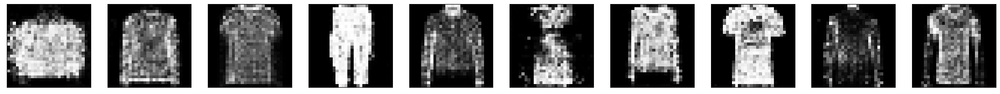

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 17ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:22,  1.64it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:22,  1.63it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


  1%|█                                                                                 | 3/234 [00:01<02:21,  1.64it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:20,  1.63it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:21,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:03<02:32,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:33,  1.48it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:36,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:38,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:38,  1.41it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:37,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:38,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:41,  1.37it/s]

epoch:  66
8/8 [==============================] - 0s 25ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:40,  1.37it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:42,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:35,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


  7%|█████▉                                                                           | 17/234 [00:11<02:30,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  8%|██████▏                                                                          | 18/234 [00:12<02:24,  1.49it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:20,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


  9%|██████▉                                                                          | 20/234 [00:13<02:16,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


  9%|███████▎                                                                         | 21/234 [00:14<02:14,  1.58it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


  9%|███████▌                                                                         | 22/234 [00:14<02:12,  1.60it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 10%|███████▉                                                                         | 23/234 [00:15<02:10,  1.62it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 10%|████████▎                                                                        | 24/234 [00:15<02:10,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 11%|████████▋                                                                        | 25/234 [00:16<02:13,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 33ms/step


 11%|█████████                                                                        | 26/234 [00:17<02:46,  1.25it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 12%|█████████▎                                                                       | 27/234 [00:18<02:43,  1.27it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 12%|█████████▋                                                                       | 28/234 [00:19<02:40,  1.29it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 12%|██████████                                                                       | 29/234 [00:20<02:33,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 13%|██████████▍                                                                      | 30/234 [00:20<02:26,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 13%|██████████▋                                                                      | 31/234 [00:21<02:20,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 14%|███████████                                                                      | 32/234 [00:21<02:15,  1.49it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 14%|███████████▍                                                                     | 33/234 [00:22<02:14,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 15%|███████████▊                                                                     | 34/234 [00:23<02:09,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 15%|████████████                                                                     | 35/234 [00:23<02:07,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 15%|████████████▍                                                                    | 36/234 [00:24<02:04,  1.59it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 16%|████████████▊                                                                    | 37/234 [00:25<02:03,  1.60it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 16%|█████████████▏                                                                   | 38/234 [00:25<02:02,  1.60it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▌                                                                   | 39/234 [00:26<02:01,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▊                                                                   | 40/234 [00:26<02:00,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▏                                                                  | 41/234 [00:27<01:59,  1.62it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:28<01:59,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▉                                                                  | 43/234 [00:28<01:58,  1.61it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▏                                                                 | 44/234 [00:29<02:00,  1.58it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▌                                                                 | 45/234 [00:30<02:00,  1.57it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:30<02:04,  1.51it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 20%|████████████████▎                                                                | 47/234 [00:31<02:04,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:32<02:05,  1.48it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:32<02:01,  1.52it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 21%|█████████████████▎                                                               | 50/234 [00:33<02:01,  1.51it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 22%|█████████████████▋                                                               | 51/234 [00:34<01:59,  1.53it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 22%|██████████████████                                                               | 52/234 [00:34<01:57,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 23%|██████████████████▎                                                              | 53/234 [00:35<01:54,  1.58it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 23%|██████████████████▋                                                              | 54/234 [00:35<01:53,  1.58it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████                                                              | 55/234 [00:36<01:55,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:37<01:59,  1.49it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:38<02:01,  1.46it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 25%|████████████████████                                                             | 58/234 [00:38<02:01,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████▍                                                            | 59/234 [00:39<01:59,  1.46it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 26%|████████████████████▊                                                            | 60/234 [00:40<01:57,  1.48it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 26%|█████████████████████                                                            | 61/234 [00:40<01:53,  1.52it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:41<01:53,  1.52it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:42<01:57,  1.46it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:42<01:58,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:43<01:56,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:44<01:55,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:44<01:53,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:45<01:53,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:46<01:51,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:46<01:51,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:47<01:51,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:48<01:49,  1.48it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:48<01:47,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:49<01:46,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:50<01:46,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:50<01:44,  1.51it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:51<01:42,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:52<01:41,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:52<01:39,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:53<01:38,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████                                                     | 81/234 [00:54<01:38,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:54<01:37,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:55<01:36,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:55<01:36,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:56<01:37,  1.53it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:57<01:36,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:57<01:36,  1.52it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:58<01:34,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:59<01:36,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:00<01:37,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:00<01:37,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:01<01:38,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:02<01:37,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:02<01:37,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:03<01:37,  1.43it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:04<01:36,  1.43it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:04<01:37,  1.41it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:05<01:36,  1.41it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:06<01:36,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:07<01:34,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 24ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:07<01:40,  1.32it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:08<01:45,  1.25it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:09<01:48,  1.21it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:10<01:43,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 25ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:11<01:47,  1.20it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:12<01:42,  1.25it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:12<01:41,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:13<01:37,  1.29it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:14<01:32,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:15<01:30,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:15<01:28,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:16<01:27,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:17<01:27,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:17<01:26,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:18<01:28,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:19<01:27,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:20<01:26,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:20<01:24,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:21<01:22,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:22<01:24,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:23<01:24,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:23<01:25,  1.30it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:24<01:24,  1.31it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:25<01:22,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:26<01:20,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:26<01:18,  1.37it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:27<01:16,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 25ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:28<01:18,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:29<01:17,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:29<01:18,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:30<01:15,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:31<01:14,  1.37it/s]

epoch:  66
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:32<01:15,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:32<01:13,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:33<01:14,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:34<01:11,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:34<01:08,  1.41it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:35<01:07,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:36<01:08,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:36<01:06,  1.41it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:37<01:03,  1.46it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:38<01:04,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:39<01:04,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:39<01:01,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:40<01:00,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:41<01:02,  1.40it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:41<01:03,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:42<01:02,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:43<00:59,  1.42it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:43<00:58,  1.44it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:44<00:56,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:45<00:54,  1.51it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:45<00:53,  1.53it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:46<00:51,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:47<00:50,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:47<00:50,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:48<00:49,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:49<00:48,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:49<00:48,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:50<00:50,  1.47it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:51<00:48,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:51<00:47,  1.52it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:52<00:46,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:53<00:45,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:53<00:44,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:54<00:43,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:54<00:42,  1.57it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:55<00:42,  1.57it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:56<00:41,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:56<00:41,  1.56it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:57<00:40,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:58<00:40,  1.54it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:58<00:39,  1.55it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:59<00:39,  1.51it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:00<00:39,  1.50it/s]

epoch:  66
8/8 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:00<00:40,  1.43it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:01<00:41,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:02<00:41,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:03<00:39,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:03<00:39,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:04<00:39,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:05<00:39,  1.31it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:06<00:40,  1.27it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:07<00:38,  1.31it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:07<00:36,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:08<00:35,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:09<00:34,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:09<00:33,  1.36it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:10<00:33,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:11<00:36,  1.21it/s]

epoch:  66
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:12<00:36,  1.19it/s]

epoch:  66
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:13<00:32,  1.28it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:14<00:31,  1.29it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:14<00:30,  1.31it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:15<00:30,  1.27it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:16<00:28,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:17<00:28,  1.32it/s]

epoch:  66
8/8 [==============================] - 0s 26ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:18<00:29,  1.22it/s]

epoch:  66
8/8 [==============================] - 0s 32ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:19<00:30,  1.15it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:19<00:29,  1.13it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:20<00:27,  1.19it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:21<00:26,  1.22it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:22<00:25,  1.21it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:23<00:23,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:23<00:23,  1.23it/s]

epoch:  66
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:24<00:23,  1.21it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:25<00:21,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:26<00:20,  1.29it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:26<00:18,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:27<00:18,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:28<00:17,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:29<00:16,  1.31it/s]

epoch:  66
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:29<00:15,  1.32it/s]

epoch:  66
8/8 [==============================] - 0s 16ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:30<00:14,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:31<00:14,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:32<00:13,  1.37it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:32<00:11,  1.43it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:33<00:11,  1.45it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:34<00:10,  1.46it/s]

epoch:  66
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:34<00:10,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:35<00:09,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:36<00:09,  1.32it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:37<00:08,  1.33it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:37<00:07,  1.38it/s]

epoch:  66
8/8 [==============================] - 0s 28ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:38<00:07,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:39<00:06,  1.27it/s]

epoch:  66
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:40<00:05,  1.34it/s]

epoch:  66
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:40<00:04,  1.39it/s]

epoch:  66
8/8 [==============================] - 0s 14ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:41<00:03,  1.35it/s]

epoch:  66
8/8 [==============================] - 0s 29ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:42<00:03,  1.28it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:43<00:02,  1.22it/s]

epoch:  66
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:44<00:01,  1.26it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:44<00:00,  1.32it/s]

epoch:  66
8/8 [==============================] - 0s 17ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:45<00:00,  1.41it/s]


epoch:  66


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 18ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:35,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:35,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  1%|█                                                                                 | 3/234 [00:02<02:50,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 25ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:03,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:03<03:01,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  3%|██                                                                                | 6/234 [00:04<02:57,  1.29it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:59,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:56,  1.28it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:54,  1.29it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:49,  1.32it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:42,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:40,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:38,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 24ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:44,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:46,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:50,  1.28it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:51,  1.27it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


  8%|██████▏                                                                          | 18/234 [00:13<03:01,  1.19it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:54,  1.23it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:51,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:49,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:43,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:38,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:35,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 25ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:38,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:46,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:42,  1.27it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:39,  1.29it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:22<02:35,  1.32it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:31,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:36,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:40,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 14%|███████████▍                                                                     | 33/234 [00:25<02:39,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:41,  1.24it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:27<02:39,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:39,  1.24it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:32,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 16%|█████████████▏                                                                   | 38/234 [00:29<02:25,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▌                                                                   | 39/234 [00:30<02:31,  1.29it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:23,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:22,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 18%|██████████████▌                                                                  | 42/234 [00:32<02:26,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:33<02:23,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 30ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:33,  1.24it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:30,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:28,  1.27it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 20%|████████████████▎                                                                | 47/234 [00:36<02:30,  1.25it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▌                                                                | 48/234 [00:37<02:22,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:19,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 23ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:20,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 22%|█████████████████▋                                                               | 51/234 [00:39<02:23,  1.28it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:40<02:24,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:20,  1.29it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:18,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:13,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▍                                                             | 56/234 [00:43<02:06,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:04,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:08,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:06,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:06,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:12,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:11,  1.31it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:08,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:03,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:05,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:50<02:03,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:51<02:02,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:51<02:03,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 26ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<02:09,  1.27it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:04,  1.32it/s]

epoch:  67
8/8 [==============================] - 0s 29ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:54<02:14,  1.21it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:55<02:08,  1.26it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:55<02:04,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<02:00,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:57<01:58,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:58<01:53,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<01:48,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 33%|███████████████████████████                                                      | 78/234 [00:59<01:45,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:00<01:46,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:00<01:43,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████                                                     | 81/234 [01:01<01:41,  1.51it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:01<01:38,  1.54it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:02<01:37,  1.54it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:03<01:36,  1.55it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:03<01:39,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:04<01:40,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:05<01:39,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:05<01:37,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:06<01:35,  1.52it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:07<01:34,  1.53it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:07<01:32,  1.54it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:08<01:35,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:09<01:36,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:10<01:38,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:10<01:36,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:11<01:38,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:12<01:37,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:12<01:34,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:13<01:34,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:14<01:36,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:15<01:36,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:15<01:32,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:16<01:31,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:17<01:30,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:17<01:28,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:18<01:27,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:19<01:26,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:19<01:26,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:20<01:25,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:21<01:26,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:21<01:26,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:22<01:24,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:23<01:26,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:24<01:27,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:24<01:25,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:25<01:23,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:26<01:20,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:26<01:19,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:27<01:17,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:28<01:18,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:28<01:19,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:29<01:21,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:30<01:20,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:31<01:21,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:31<01:19,  1.36it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:32<01:20,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:33<01:19,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:34<01:18,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:34<01:15,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:35<01:12,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:36<01:12,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:36<01:11,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:37<01:11,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:38<01:10,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:38<01:08,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:39<01:06,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:40<01:05,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:40<01:03,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:41<01:02,  1.51it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:42<01:03,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:42<01:03,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:43<01:05,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:44<01:03,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:45<01:01,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:45<01:01,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:46<00:59,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:47<00:58,  1.49it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:47<00:57,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:48<00:59,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:49<00:58,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:49<01:00,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:50<00:58,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:51<00:57,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:52<00:55,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:52<00:54,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:53<00:54,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:54<00:52,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:54<00:50,  1.51it/s]

epoch:  67
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:55<00:49,  1.51it/s]

epoch:  67
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:56<00:51,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:56<00:52,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:57<00:50,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:58<00:49,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:58<00:48,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:59<00:47,  1.46it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:00<00:47,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:00<00:46,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:01<00:44,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:02<00:44,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:03<00:44,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:03<00:45,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:04<00:45,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:05<00:43,  1.42it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:06<00:43,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:06<00:42,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:07<00:43,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:08<00:43,  1.32it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:09<00:43,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:09<00:41,  1.33it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:10<00:40,  1.32it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:11<00:38,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:11<00:37,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:12<00:37,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:13<00:36,  1.37it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:14<00:35,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:14<00:34,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:15<00:33,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:16<00:32,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:17<00:32,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:17<00:31,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:18<00:30,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:19<00:29,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:19<00:29,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:20<00:28,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:21<00:29,  1.34it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:22<00:27,  1.38it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:22<00:26,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 14ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:23<00:24,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:23<00:23,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:24<00:23,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 21ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:25<00:22,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:26<00:22,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:26<00:21,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:27<00:21,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:28<00:22,  1.30it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:29<00:20,  1.35it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:29<00:19,  1.40it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:30<00:17,  1.45it/s]

epoch:  67
8/8 [==============================] - 0s 18ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:31<00:16,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:31<00:15,  1.52it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:32<00:14,  1.56it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:32<00:13,  1.59it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:33<00:13,  1.61it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:34<00:12,  1.62it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:34<00:11,  1.63it/s]

epoch:  67
8/8 [==============================] - 0s 14ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:35<00:10,  1.66it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:35<00:10,  1.66it/s]

epoch:  67
8/8 [==============================] - 0s 14ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:36<00:09,  1.68it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:37<00:08,  1.67it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:37<00:08,  1.63it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:38<00:08,  1.59it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:38<00:07,  1.59it/s]

epoch:  67
8/8 [==============================] - 0s 25ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:39<00:07,  1.39it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:40<00:07,  1.41it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:41<00:06,  1.44it/s]

epoch:  67
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:41<00:05,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:42<00:04,  1.43it/s]

epoch:  67
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:43<00:04,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:43<00:03,  1.48it/s]

epoch:  67
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:44<00:02,  1.47it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:45<00:01,  1.50it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:45<00:01,  1.55it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:46<00:00,  1.58it/s]

epoch:  67
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:47<00:00,  1.40it/s]


epoch:  67


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:21,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:19,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:19,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:19,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:30,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:03<02:30,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:28,  1.53it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:27,  1.53it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:25,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:24,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:22,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:20,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:18,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  6%|████▊                                                                            | 14/234 [00:08<02:17,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:09<02:14,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:13,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  7%|█████▉                                                                           | 17/234 [00:10<02:13,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


  8%|██████▏                                                                          | 18/234 [00:11<02:11,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


  8%|██████▌                                                                          | 19/234 [00:11<02:08,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:12<02:07,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:13<02:08,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:13<02:06,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:14<02:05,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:14<02:04,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 11%|████████▋                                                                        | 25/234 [00:15<02:04,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 11%|█████████                                                                        | 26/234 [00:16<02:03,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 12%|█████████▎                                                                       | 27/234 [00:16<02:02,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 12%|█████████▋                                                                       | 28/234 [00:17<02:01,  1.70it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:17<02:00,  1.71it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 13%|██████████▍                                                                      | 30/234 [00:18<02:00,  1.70it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:18<02:01,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:19<02:03,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 14%|███████████▍                                                                     | 33/234 [00:20<02:04,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:20<02:07,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:21<02:04,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:22<02:03,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 16%|████████████▊                                                                    | 37/234 [00:22<02:00,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:23<01:58,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▌                                                                   | 39/234 [00:23<01:58,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:24<01:59,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:25<01:57,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 18%|██████████████▌                                                                  | 42/234 [00:25<01:56,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▉                                                                  | 43/234 [00:26<01:56,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 19%|███████████████▏                                                                 | 44/234 [00:26<01:55,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:27<01:54,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:28<01:55,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:28<01:53,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:29<01:58,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▉                                                                | 49/234 [00:30<01:57,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:30<01:54,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 22%|█████████████████▋                                                               | 51/234 [00:31<01:53,  1.61it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 22%|██████████████████                                                               | 52/234 [00:31<01:52,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:32<01:49,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:33<01:51,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:33<01:48,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 24%|███████████████████▍                                                             | 56/234 [00:34<01:46,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:34<01:45,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████                                                             | 58/234 [00:35<01:44,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████▍                                                            | 59/234 [00:36<01:43,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 26%|████████████████████▊                                                            | 60/234 [00:36<01:43,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:37<01:42,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:37<01:41,  1.69it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:38<01:44,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:39<01:47,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:39<01:48,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:40<01:48,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:41<01:47,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:41<01:45,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:42<01:45,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:43<01:45,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:43<01:42,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:44<01:39,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:44<01:38,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:45<01:39,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:46<01:40,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:46<01:41,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:47<01:40,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [00:48<01:43,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:48<01:40,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:49<01:41,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 35%|████████████████████████████                                                     | 81/234 [00:50<01:37,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:50<01:34,  1.61it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:51<01:32,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:51<01:30,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:52<01:32,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:53<01:32,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:53<01:30,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:54<01:34,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:55<01:31,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:55<01:33,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:56<01:31,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:57<01:34,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:57<01:34,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:58<01:34,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [00:59<01:33,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [00:59<01:33,  1.47it/s]

epoch:  68
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:00<01:34,  1.45it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:01<01:31,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:01<01:29,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:02<01:27,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:03<01:26,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:03<01:25,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:04<01:22,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:04<01:19,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:05<01:18,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:06<01:17,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:06<01:16,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:07<01:20,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:08<01:18,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:08<01:17,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:09<01:16,  1.61it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:09<01:16,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:10<01:14,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:11<01:17,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:11<01:18,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:12<01:16,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:13<01:13,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:13<01:11,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:14<01:10,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:14<01:09,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:15<01:08,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:16<01:11,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:16<01:11,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:17<01:09,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 26ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:18<01:09,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:18<01:07,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:19<01:05,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:19<01:05,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:20<01:03,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:21<01:02,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:21<01:02,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:22<01:01,  1.66it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:22<01:01,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:23<01:00,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:24<01:01,  1.61it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:24<01:00,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:25<00:59,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:25<00:58,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:26<00:57,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:27<00:56,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:27<00:57,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:28<00:59,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:29<01:00,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:29<01:00,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:30<01:00,  1.48it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:31<00:59,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:31<00:59,  1.46it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:32<00:58,  1.48it/s]

epoch:  68
8/8 [==============================] - 0s 27ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:33<01:00,  1.41it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:34<00:58,  1.45it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:34<00:55,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:35<00:54,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:35<00:53,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:36<00:54,  1.48it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:37<00:52,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:37<00:50,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:38<00:48,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:39<00:46,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:39<00:45,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:40<00:44,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:40<00:43,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:41<00:42,  1.68it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:42<00:43,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 30ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:42<00:46,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:43<00:45,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:44<00:45,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:44<00:44,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:45<00:42,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:46<00:40,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:46<00:40,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:47<00:40,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:48<00:40,  1.53it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:48<00:39,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:49<00:39,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:50<00:40,  1.45it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:50<00:39,  1.46it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:51<00:38,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:52<00:36,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:52<00:34,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:53<00:33,  1.61it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:53<00:32,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:54<00:31,  1.67it/s]

epoch:  68
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:55<00:33,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:55<00:34,  1.46it/s]

epoch:  68
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:56<00:34,  1.42it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [01:57<00:32,  1.47it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [01:57<00:30,  1.53it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [01:58<00:29,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [01:59<00:28,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [01:59<00:27,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:00<00:27,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:01<00:26,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:01<00:26,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:02<00:26,  1.52it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:03<00:25,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:03<00:25,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:04<00:24,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 20ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:05<00:24,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:05<00:22,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:06<00:22,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:06<00:21,  1.54it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:07<00:20,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:08<00:19,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 22ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:08<00:19,  1.53it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:09<00:19,  1.50it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:10<00:18,  1.49it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:10<00:17,  1.51it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:11<00:16,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:12<00:15,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:12<00:14,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:13<00:14,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:13<00:13,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:14<00:12,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:15<00:12,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:15<00:11,  1.64it/s]

epoch:  68
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:16<00:11,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:17<00:10,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:17<00:10,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:18<00:09,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:18<00:08,  1.60it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:19<00:08,  1.62it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:20<00:07,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:20<00:06,  1.63it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:21<00:06,  1.65it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:22<00:05,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:22<00:05,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:23<00:04,  1.58it/s]

epoch:  68
8/8 [==============================] - 0s 14ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:23<00:03,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:24<00:03,  1.56it/s]

epoch:  68
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:25<00:02,  1.55it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:25<00:01,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:26<00:01,  1.57it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:27<00:00,  1.59it/s]

epoch:  68
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:27<00:00,  1.58it/s]


epoch:  68


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:22,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:24,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 21ms/step


  1%|█                                                                                 | 3/234 [00:02<02:38,  1.45it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:35,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:34,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


  3%|██                                                                                | 6/234 [00:03<02:32,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:30,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:25,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:24,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:22,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:21,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:19,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:21,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:22,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:09<02:26,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:22,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


  7%|█████▉                                                                           | 17/234 [00:11<02:28,  1.46it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


  8%|██████▏                                                                          | 18/234 [00:11<02:26,  1.47it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:20,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


  9%|██████▉                                                                          | 20/234 [00:13<02:24,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:13<02:22,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:14<02:19,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 10%|███████▉                                                                         | 23/234 [00:15<02:15,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:15<02:12,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 11%|████████▋                                                                        | 25/234 [00:16<02:10,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 11%|█████████                                                                        | 26/234 [00:16<02:10,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:17<02:10,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 12%|█████████▋                                                                       | 28/234 [00:18<02:12,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 12%|██████████                                                                       | 29/234 [00:18<02:11,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:19<02:08,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:20<02:07,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 14%|███████████                                                                      | 32/234 [00:20<02:07,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 14%|███████████▍                                                                     | 33/234 [00:21<02:06,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:22<02:08,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:22<02:05,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:23<02:05,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 16%|████████████▊                                                                    | 37/234 [00:23<02:06,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:24<02:08,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▌                                                                   | 39/234 [00:25<02:05,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:25<02:07,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:26<02:08,  1.50it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▌                                                                  | 42/234 [00:27<02:11,  1.46it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:27<02:08,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:28<02:08,  1.47it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▌                                                                 | 45/234 [00:29<02:05,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:29<02:01,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:30<01:58,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:31<01:55,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▉                                                                | 49/234 [00:31<01:53,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:32<01:52,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 22%|█████████████████▋                                                               | 51/234 [00:32<01:51,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:33<01:50,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:34<01:49,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▋                                                              | 54/234 [00:34<01:49,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:35<01:48,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▍                                                             | 56/234 [00:35<01:47,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████▋                                                             | 57/234 [00:36<01:46,  1.66it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 25%|████████████████████                                                             | 58/234 [00:37<01:47,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████▍                                                            | 59/234 [00:37<01:46,  1.65it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 26%|████████████████████▊                                                            | 60/234 [00:38<01:44,  1.66it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████                                                            | 61/234 [00:38<01:43,  1.67it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:39<01:51,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:40<01:51,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:41<01:50,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:41<01:47,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:42<01:45,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:42<01:42,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:43<01:44,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:44<01:46,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:44<01:48,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:45<01:59,  1.37it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:46<01:51,  1.46it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:46<01:46,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:47<01:41,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:48<01:42,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:48<01:43,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:49<01:46,  1.47it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 33%|███████████████████████████                                                      | 78/234 [00:50<01:44,  1.50it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:50<01:46,  1.46it/s]

epoch:  69
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:51<01:45,  1.46it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████                                                     | 81/234 [00:52<01:46,  1.44it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:53<01:47,  1.41it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:53<01:51,  1.36it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:54<01:50,  1.36it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:55<01:49,  1.36it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:55<01:42,  1.45it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:56<01:37,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:57<01:33,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:57<01:30,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:58<01:27,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:58<01:26,  1.66it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:59<01:26,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:00<01:27,  1.62it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:00<01:26,  1.62it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:01<01:27,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:02<01:26,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:02<01:25,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:03<01:26,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:03<01:26,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:04<01:26,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:05<01:25,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:05<01:26,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:06<01:30,  1.44it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:07<01:34,  1.38it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:08<01:30,  1.42it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:08<01:28,  1.45it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:09<01:24,  1.50it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:10<01:20,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:10<01:17,  1.62it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:11<01:16,  1.62it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:11<01:16,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:12<01:15,  1.62it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:13<01:13,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:13<01:13,  1.64it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:14<01:14,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:14<01:15,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:15<01:12,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:16<01:11,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:16<01:09,  1.66it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:17<01:07,  1.69it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:17<01:06,  1.69it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:18<01:05,  1.71it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:19<01:04,  1.72it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:19<01:04,  1.72it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:20<01:03,  1.71it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:20<01:02,  1.72it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:21<01:02,  1.71it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:22<01:02,  1.69it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:22<01:02,  1.68it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:23<01:01,  1.68it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:23<01:00,  1.69it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:24<01:00,  1.70it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:25<01:02,  1.63it/s]

epoch:  69
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:25<01:09,  1.44it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:26<01:10,  1.41it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:27<01:09,  1.42it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:27<01:05,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:28<01:04,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:29<01:04,  1.47it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:30<01:09,  1.35it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:31<01:11,  1.30it/s]

epoch:  69
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:31<01:11,  1.29it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:32<01:08,  1.33it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:33<01:05,  1.38it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:33<01:02,  1.42it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:34<01:00,  1.45it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:35<00:58,  1.50it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:35<00:56,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:36<00:54,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:36<00:52,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:37<00:52,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:38<00:52,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:38<00:50,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:39<00:50,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:40<00:49,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:40<00:48,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:41<00:48,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:42<00:48,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:42<00:46,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:43<00:48,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:43<00:47,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:44<00:47,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:45<00:47,  1.49it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:45<00:45,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:46<00:44,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:47<00:43,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:47<00:43,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:48<00:42,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:49<00:42,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:49<00:41,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:50<00:41,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:51<00:40,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:51<00:38,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:52<00:37,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:53<00:37,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:53<00:36,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:54<00:36,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:54<00:35,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:55<00:34,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [01:56<00:34,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [01:56<00:33,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [01:57<00:33,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [01:58<00:32,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [01:58<00:32,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [01:59<00:31,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:00<00:32,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:01<00:34,  1.38it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:01<00:35,  1.30it/s]

epoch:  69
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:02<00:33,  1.35it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:03<00:31,  1.38it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:03<00:29,  1.43it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:04<00:28,  1.50it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:05<00:26,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:05<00:25,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:06<00:25,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:07<00:25,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:07<00:24,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:08<00:23,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:08<00:22,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:09<00:22,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:10<00:21,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:10<00:20,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:11<00:19,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:12<00:19,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:12<00:18,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:13<00:17,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:14<00:17,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:14<00:16,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:15<00:16,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:16<00:15,  1.56it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:16<00:14,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:17<00:14,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:17<00:13,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:18<00:12,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:19<00:12,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:19<00:11,  1.54it/s]

epoch:  69
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:20<00:11,  1.52it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:21<00:10,  1.48it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:21<00:09,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:22<00:09,  1.51it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:23<00:08,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:23<00:07,  1.58it/s]

epoch:  69
8/8 [==============================] - 0s 14ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:24<00:06,  1.61it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:25<00:06,  1.59it/s]

epoch:  69
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:25<00:05,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 17ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:26<00:05,  1.53it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:27<00:04,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:27<00:03,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:28<00:03,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:28<00:02,  1.55it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:29<00:01,  1.57it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:30<00:01,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 16ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:30<00:00,  1.60it/s]

epoch:  69
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:31<00:00,  1.54it/s]


epoch:  69


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 17ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:25,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:24,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  1%|█                                                                                 | 3/234 [00:01<02:27,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:22,  1.61it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:19,  1.64it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


  3%|██                                                                                | 6/234 [00:03<02:16,  1.67it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:20,  1.61it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  3%|██▊                                                                               | 8/234 [00:04<02:18,  1.63it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


  4%|███▏                                                                              | 9/234 [00:05<02:21,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:23,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


  5%|███▊                                                                             | 11/234 [00:06<02:28,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:29,  1.48it/s]

epoch:  70
8/8 [==============================] - 0s 29ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:43,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:36,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


  6%|█████▏                                                                           | 15/234 [00:09<02:36,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:29,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  7%|█████▉                                                                           | 17/234 [00:11<02:23,  1.52it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:11<02:18,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:17,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  9%|██████▉                                                                          | 20/234 [00:13<02:15,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  9%|███████▎                                                                         | 21/234 [00:13<02:13,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:14<02:13,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 10%|███████▉                                                                         | 23/234 [00:14<02:15,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:15<02:13,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:16<02:13,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 11%|█████████                                                                        | 26/234 [00:16<02:18,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 12%|█████████▎                                                                       | 27/234 [00:17<02:18,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 28ms/step


 12%|█████████▋                                                                       | 28/234 [00:18<02:21,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 27ms/step


 12%|██████████                                                                       | 29/234 [00:19<02:23,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 13%|██████████▍                                                                      | 30/234 [00:19<02:18,  1.47it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 13%|██████████▋                                                                      | 31/234 [00:20<02:16,  1.49it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:20<02:14,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 14%|███████████▍                                                                     | 33/234 [00:21<02:10,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:22<02:07,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:22<02:07,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:23<02:04,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 16%|████████████▊                                                                    | 37/234 [00:24<02:03,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:24<02:01,  1.62it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 17%|█████████████▌                                                                   | 39/234 [00:25<02:02,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 17%|█████████████▊                                                                   | 40/234 [00:25<02:03,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:26<02:03,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:27<02:03,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▉                                                                  | 43/234 [00:27<02:03,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 19%|███████████████▏                                                                 | 44/234 [00:28<02:05,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:29<02:02,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 20%|███████████████▉                                                                 | 46/234 [00:29<01:59,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:30<01:56,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:31<01:53,  1.63it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 21%|████████████████▉                                                                | 49/234 [00:31<01:52,  1.65it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:32<01:50,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 22%|█████████████████▋                                                               | 51/234 [00:32<01:50,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 22%|██████████████████                                                               | 52/234 [00:33<01:49,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▎                                                              | 53/234 [00:34<01:49,  1.65it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 23%|██████████████████▋                                                              | 54/234 [00:34<01:48,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 24%|███████████████████                                                              | 55/234 [00:35<01:47,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████▍                                                             | 56/234 [00:35<01:49,  1.63it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▋                                                             | 57/234 [00:36<01:51,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:37<01:52,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 25%|████████████████████▍                                                            | 59/234 [00:37<01:49,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 26%|████████████████████▊                                                            | 60/234 [00:38<01:48,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 26%|█████████████████████                                                            | 61/234 [00:39<01:51,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:39<01:49,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:40<01:47,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:40<01:45,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:41<01:43,  1.64it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:42<01:41,  1.65it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:42<01:40,  1.66it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:43<01:39,  1.67it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:43<01:40,  1.64it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:44<01:41,  1.61it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:45<01:42,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:45<01:42,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:46<01:41,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:47<01:40,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:47<01:38,  1.62it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:48<01:37,  1.62it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:48<01:37,  1.61it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 33%|███████████████████████████                                                      | 78/234 [00:49<01:37,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:50<01:39,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:50<01:39,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 35%|████████████████████████████                                                     | 81/234 [00:51<01:39,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:52<01:38,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:52<01:37,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 36%|█████████████████████████████                                                    | 84/234 [00:53<01:37,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [00:54<01:38,  1.52it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [00:54<01:37,  1.52it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 37%|██████████████████████████████                                                   | 87/234 [00:55<01:35,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [00:56<01:35,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [00:56<01:34,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [00:57<01:34,  1.52it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [00:58<01:31,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [00:58<01:30,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▏                                                | 93/234 [00:59<01:30,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 40%|████████████████████████████████▌                                                | 94/234 [00:59<01:28,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:00<01:27,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:01<01:28,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:01<01:28,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:02<01:30,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:03<01:29,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:04<01:32,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:04<01:30,  1.47it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:05<01:29,  1.48it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:06<01:27,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:06<01:25,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:07<01:23,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:08<01:25,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:08<01:23,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:09<01:25,  1.48it/s]

epoch:  70
8/8 [==============================] - 0s 25ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:10<01:37,  1.28it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:11<01:34,  1.31it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:11<01:31,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:12<01:28,  1.38it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:13<01:25,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:13<01:22,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:14<01:26,  1.38it/s]

epoch:  70
8/8 [==============================] - 0s 24ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:15<01:26,  1.36it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:16<01:25,  1.37it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:16<01:23,  1.39it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:17<01:20,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:18<01:20,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:18<01:20,  1.41it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:19<01:20,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:20<01:17,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:21<01:18,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:21<01:26,  1.26it/s]

epoch:  70
8/8 [==============================] - 0s 24ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:22<01:28,  1.22it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:23<01:27,  1.23it/s]

epoch:  70
8/8 [==============================] - 0s 23ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:24<01:28,  1.20it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:25<01:23,  1.26it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:25<01:19,  1.31it/s]

epoch:  70
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:26<01:17,  1.33it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:27<01:15,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:28<01:14,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:28<01:11,  1.41it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:29<01:09,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:30<01:07,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:30<01:08,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:31<01:12,  1.33it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:32<01:17,  1.22it/s]

epoch:  70
8/8 [==============================] - 0s 24ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:33<01:17,  1.21it/s]

epoch:  70
8/8 [==============================] - 0s 26ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:34<01:18,  1.19it/s]

epoch:  70
8/8 [==============================] - 0s 28ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:35<01:19,  1.15it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:36<01:14,  1.22it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:36<01:11,  1.26it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:37<01:07,  1.33it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:38<01:04,  1.37it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:38<01:00,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:39<00:57,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:39<00:54,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:40<00:52,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:41<00:53,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:41<00:51,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:42<00:51,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:43<00:51,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:43<00:51,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:44<00:49,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:44<00:48,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 14ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:45<00:46,  1.63it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:46<00:47,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:46<00:47,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:47<00:47,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:48<00:48,  1.48it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:49<00:49,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 33ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:49<00:52,  1.33it/s]

epoch:  70
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:50<00:51,  1.34it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:51<00:48,  1.39it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [01:51<00:47,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [01:52<00:46,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [01:53<00:44,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [01:53<00:43,  1.47it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [01:54<00:42,  1.49it/s]

epoch:  70
8/8 [==============================] - 0s 21ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [01:55<00:42,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [01:55<00:40,  1.49it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [01:56<00:39,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [01:57<00:37,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [01:57<00:37,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [01:58<00:36,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [01:59<00:35,  1.56it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [01:59<00:35,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:00<00:34,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:01<00:33,  1.59it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:01<00:32,  1.60it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:02<00:33,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:03<00:32,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:03<00:32,  1.53it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:04<00:31,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:05<00:31,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:05<00:29,  1.54it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:06<00:29,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:06<00:28,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:07<00:27,  1.57it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:08<00:28,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:09<00:29,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:09<00:28,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:10<00:28,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:11<00:27,  1.38it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:11<00:26,  1.42it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:12<00:24,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:13<00:24,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:13<00:23,  1.47it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:14<00:22,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:15<00:21,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:15<00:20,  1.52it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:16<00:20,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:17<00:21,  1.38it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:18<00:20,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:19<00:20,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:19<00:19,  1.30it/s]

epoch:  70
8/8 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:20<00:20,  1.23it/s]

epoch:  70
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:21<00:20,  1.18it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:22<00:19,  1.21it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:23<00:17,  1.29it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:23<00:15,  1.35it/s]

epoch:  70
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:24<00:15,  1.32it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:25<00:13,  1.38it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:25<00:12,  1.40it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:26<00:12,  1.37it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:27<00:11,  1.39it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:28<00:11,  1.33it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:28<00:10,  1.37it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:29<00:09,  1.43it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:30<00:08,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:30<00:07,  1.47it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:31<00:06,  1.49it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:32<00:05,  1.51it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:32<00:05,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:33<00:04,  1.58it/s]

epoch:  70
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:34<00:03,  1.55it/s]

epoch:  70
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:34<00:03,  1.48it/s]

epoch:  70
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:35<00:02,  1.50it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:36<00:02,  1.44it/s]

epoch:  70
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:36<00:01,  1.46it/s]

epoch:  70
8/8 [==============================] - 0s 17ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:37<00:00,  1.49it/s]

epoch:  70
8/8 [==============================] - 0s 15ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:38<00:00,  1.48it/s]

epoch:  70
1/1 [==============================] - 0s 29ms/step


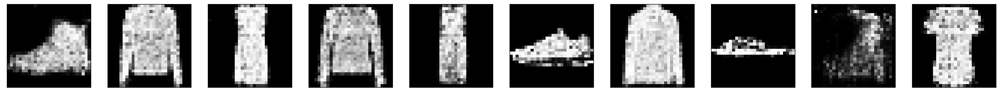

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 15ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:54,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:45,  1.40it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


  1%|█                                                                                 | 3/234 [00:02<02:43,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:44,  1.40it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:34,  1.49it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  3%|██                                                                                | 6/234 [00:04<02:29,  1.52it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:30,  1.51it/s]

epoch:  71
8/8 [==============================] - 0s 17ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:30,  1.50it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:29,  1.50it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:26,  1.53it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:25,  1.53it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  5%|████▏                                                                            | 12/234 [00:07<02:21,  1.57it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  6%|████▌                                                                            | 13/234 [00:08<02:22,  1.55it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:20,  1.57it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  6%|█████▏                                                                           | 15/234 [00:09<02:17,  1.59it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  7%|█████▌                                                                           | 16/234 [00:10<02:20,  1.55it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


  7%|█████▉                                                                           | 17/234 [00:11<02:22,  1.52it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  8%|██████▏                                                                          | 18/234 [00:11<02:20,  1.54it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:12<02:21,  1.52it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


  9%|██████▉                                                                          | 20/234 [00:13<02:20,  1.53it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:13<02:25,  1.46it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


  9%|███████▌                                                                         | 22/234 [00:14<02:22,  1.48it/s]

epoch:  71
8/8 [==============================] - 0s 17ms/step


 10%|███████▉                                                                         | 23/234 [00:15<02:22,  1.48it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 10%|████████▎                                                                        | 24/234 [00:15<02:21,  1.48it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 11%|████████▋                                                                        | 25/234 [00:16<02:24,  1.45it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 11%|█████████                                                                        | 26/234 [00:17<02:21,  1.47it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 12%|█████████▎                                                                       | 27/234 [00:18<02:26,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:18<02:26,  1.41it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:19<02:24,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 13%|██████████▍                                                                      | 30/234 [00:20<02:23,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:20<02:20,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 14%|███████████                                                                      | 32/234 [00:21<02:16,  1.48it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 14%|███████████▍                                                                     | 33/234 [00:22<02:12,  1.51it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 15%|███████████▊                                                                     | 34/234 [00:22<02:09,  1.54it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 15%|████████████                                                                     | 35/234 [00:23<02:07,  1.56it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 15%|████████████▍                                                                    | 36/234 [00:24<02:10,  1.51it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 16%|████████████▊                                                                    | 37/234 [00:24<02:09,  1.52it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 16%|█████████████▏                                                                   | 38/234 [00:25<02:08,  1.52it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:26<02:16,  1.43it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:26<02:20,  1.38it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▏                                                                  | 41/234 [00:27<02:17,  1.40it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:28<02:14,  1.43it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:29<02:11,  1.45it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▏                                                                 | 44/234 [00:29<02:10,  1.46it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 19%|███████████████▌                                                                 | 45/234 [00:30<02:07,  1.49it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 20%|███████████████▉                                                                 | 46/234 [00:31<02:06,  1.49it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 20%|████████████████▎                                                                | 47/234 [00:31<02:01,  1.54it/s]

epoch:  71
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:32<01:57,  1.58it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 21%|████████████████▉                                                                | 49/234 [00:32<01:58,  1.56it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 21%|█████████████████▎                                                               | 50/234 [00:33<01:58,  1.55it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 22%|█████████████████▋                                                               | 51/234 [00:34<02:06,  1.45it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:35<02:12,  1.38it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:35<02:16,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 28ms/step


 23%|██████████████████▋                                                              | 54/234 [00:36<02:24,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:37<02:19,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▍                                                             | 56/234 [00:38<02:17,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:38<02:11,  1.35it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████                                                             | 58/234 [00:39<02:10,  1.35it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:40<02:10,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:41<02:09,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:42<02:10,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:42<02:10,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:43<02:07,  1.35it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:44<02:05,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:44<02:02,  1.37it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:45<02:03,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:46<02:04,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:47<02:06,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:48<02:09,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:48<02:08,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:49<02:05,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:50<02:08,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:51<02:08,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:52<02:08,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:52<02:05,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:53<02:10,  1.21it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:54<02:09,  1.21it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 33%|███████████████████████████                                                      | 78/234 [00:55<02:07,  1.22it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:56<02:02,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:56<02:03,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████                                                     | 81/234 [00:57<02:03,  1.23it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████▍                                                    | 82/234 [00:58<02:06,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [00:59<02:03,  1.22it/s]

epoch:  71
8/8 [==============================] - 0s 26ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:00<02:04,  1.21it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:01<02:04,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:01<01:59,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:02<02:02,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:03<02:02,  1.19it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:04<02:03,  1.17it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:05<01:59,  1.21it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:06<01:56,  1.23it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:06<01:53,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:07<01:51,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:08<01:50,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:09<01:52,  1.23it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:10<01:53,  1.21it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:10<01:53,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:11<01:53,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:12<01:59,  1.13it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:13<02:04,  1.08it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:14<02:02,  1.09it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:15<01:59,  1.11it/s]

epoch:  71
8/8 [==============================] - 0s 29ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:16<02:02,  1.07it/s]

epoch:  71
8/8 [==============================] - 0s 27ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:17<02:04,  1.05it/s]

epoch:  71
8/8 [==============================] - 0s 36ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:18<02:02,  1.05it/s]

epoch:  71
8/8 [==============================] - 0s 31ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:19<02:02,  1.04it/s]

epoch:  71
8/8 [==============================] - 0s 26ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:20<01:57,  1.08it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:21<01:47,  1.17it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:21<01:42,  1.22it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:22<01:36,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:23<01:33,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:23<01:33,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:24<01:31,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:31,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:26<01:31,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:26<01:30,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:27<01:26,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:31,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:29<01:29,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 17ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:30<01:26,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:30<01:22,  1.37it/s]

epoch:  71
8/8 [==============================] - 0s 16ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:31<01:24,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:32<01:24,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:33<01:25,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:33<01:23,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:34<01:22,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:35<01:22,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:36<01:21,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:36<01:20,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:37<01:17,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:38<01:19,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:39<01:17,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:40<01:18,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:40<01:18,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:41<01:15,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:42<01:16,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:43<01:15,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:43<01:11,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:44<01:09,  1.37it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:45<01:08,  1.38it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:45<01:07,  1.37it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:46<01:08,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:47<01:09,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:48<01:09,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:49<01:09,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:49<01:08,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 28ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:50<01:09,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:51<01:12,  1.19it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:52<01:10,  1.20it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:53<01:14,  1.13it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:54<01:09,  1.19it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:54<01:07,  1.22it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:55<01:04,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:56<01:00,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:57<00:58,  1.35it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:57<00:59,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:58<00:59,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:59<00:57,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 27ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:00<00:58,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:00<00:56,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:01<00:56,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 28ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:02<00:57,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:03<00:55,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:04<00:54,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:04<00:53,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:05<00:52,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:06<00:50,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:07<00:51,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:08<00:50,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:08<00:49,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:09<00:47,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:10<00:45,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:10<00:45,  1.35it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:11<00:43,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:12<00:42,  1.38it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:13<00:43,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:13<00:42,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:14<00:45,  1.23it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:15<00:44,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:16<00:43,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:17<00:41,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:17<00:40,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:18<00:40,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 28ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:19<00:40,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:20<00:38,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:21<00:36,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:21<00:34,  1.37it/s]

epoch:  71
8/8 [==============================] - 0s 22ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:22<00:34,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:23<00:34,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:24<00:33,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:24<00:32,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:25<00:33,  1.27it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:26<00:31,  1.28it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:27<00:30,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:27<00:29,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:28<00:28,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:29<00:27,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:30<00:27,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:31<00:28,  1.25it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:31<00:27,  1.26it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:32<00:26,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:33<00:25,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 25ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:34<00:25,  1.22it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:35<00:24,  1.24it/s]

epoch:  71
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:35<00:22,  1.29it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:36<00:21,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:37<00:20,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:38<00:19,  1.34it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:38<00:18,  1.33it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:39<00:18,  1.31it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:40<00:17,  1.30it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:41<00:16,  1.32it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:41<00:15,  1.36it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:42<00:14,  1.39it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:43<00:13,  1.40it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:43<00:12,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:44<00:11,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:45<00:11,  1.42it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:45<00:10,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:46<00:09,  1.45it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:47<00:09,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:48<00:08,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:48<00:07,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:49<00:06,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:50<00:06,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:50<00:05,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:51<00:04,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:52<00:04,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:52<00:03,  1.43it/s]

epoch:  71
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:53<00:02,  1.43it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:54<00:02,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:54<00:01,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:55<00:00,  1.44it/s]

epoch:  71
8/8 [==============================] - 0s 18ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:56<00:00,  1.33it/s]


epoch:  71


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 18ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:46,  1.40it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:42,  1.43it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  1%|█                                                                                 | 3/234 [00:02<02:39,  1.44it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:39,  1.44it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:37,  1.45it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  3%|██                                                                                | 6/234 [00:04<02:37,  1.45it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:04<02:37,  1.44it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:40,  1.41it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:39,  1.41it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  4%|███▍                                                                             | 10/234 [00:06<02:36,  1.43it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:36,  1.43it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:34,  1.43it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:33,  1.44it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:09<02:36,  1.40it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:39,  1.37it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:51,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:54,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


  8%|██████▏                                                                          | 18/234 [00:13<03:07,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


  8%|██████▌                                                                          | 19/234 [00:14<03:16,  1.09it/s]

epoch:  72
8/8 [==============================] - 0s 27ms/step


  9%|██████▉                                                                          | 20/234 [00:15<03:34,  1.00s/it]

epoch:  72
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:16<03:33,  1.00s/it]

epoch:  72
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:17<03:18,  1.07it/s]

epoch:  72
8/8 [==============================] - 0s 25ms/step


 10%|███████▉                                                                         | 23/234 [00:18<03:09,  1.11it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 10%|████████▎                                                                        | 24/234 [00:19<03:06,  1.13it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 11%|████████▋                                                                        | 25/234 [00:19<03:03,  1.14it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:56,  1.18it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:50,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:50,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:53,  1.18it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:23<02:47,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 13%|██████████▋                                                                      | 31/234 [00:24<02:46,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 14%|███████████                                                                      | 32/234 [00:25<02:49,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 33ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:57,  1.13it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:27<02:56,  1.14it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:49,  1.17it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:46,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:29<02:42,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:37,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:31<02:33,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▊                                                                   | 40/234 [00:32<02:41,  1.20it/s]

epoch:  72
8/8 [==============================] - 0s 16ms/step


 18%|██████████████▏                                                                  | 41/234 [00:33<02:31,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 15ms/step


 18%|██████████████▌                                                                  | 42/234 [00:33<02:22,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:34<02:22,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 16ms/step


 19%|███████████████▏                                                                 | 44/234 [00:35<02:30,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:36<02:31,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 20%|███████████████▉                                                                 | 46/234 [00:36<02:29,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 20%|████████████████▎                                                                | 47/234 [00:37<02:28,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:38<02:29,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:39<02:27,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 21%|█████████████████▎                                                               | 50/234 [00:40<02:22,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:40<02:22,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 22%|██████████████████                                                               | 52/234 [00:41<02:17,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:42<02:15,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:43<02:22,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:43<02:21,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:44<02:20,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:45<02:18,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████                                                             | 58/234 [00:46<02:22,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:47<02:22,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:47<02:20,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 26%|█████████████████████                                                            | 61/234 [00:48<02:24,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:49<02:21,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 28ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:50<02:23,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:51<02:19,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:52<02:12,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:52<02:11,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:53<02:07,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:54<02:06,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:54<02:02,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:55<02:03,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:56<02:06,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:57<02:02,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:58<02:02,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 25ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:58<02:05,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:59<02:04,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:00<02:06,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 31ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:01<02:18,  1.14it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [01:02<02:15,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:03<02:06,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:03<02:00,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████                                                     | 81/234 [01:04<01:58,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:05<01:53,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:06<01:51,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:06<01:53,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:07<01:51,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:08<01:52,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:09<01:50,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:09<01:50,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:10<01:48,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:11<01:51,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:12<01:50,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:12<01:50,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:13<01:48,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:14<01:44,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:15<01:47,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:15<01:47,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:16<01:44,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:17<01:46,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:18<01:47,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:19<01:48,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:20<01:47,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:20<01:47,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:21<01:43,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:22<01:39,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:22<01:35,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:23<01:32,  1.38it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:24<01:30,  1.40it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:25<01:33,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:25<01:31,  1.37it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:26<01:32,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:27<01:34,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:28<01:37,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:29<01:33,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:29<01:29,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:30<01:30,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:31<01:30,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:32<01:29,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:32<01:31,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:33<01:31,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:34<01:29,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:35<01:31,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:36<01:28,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:36<01:30,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:37<01:27,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:38<01:24,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:39<01:24,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:40<01:23,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:40<01:23,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:41<01:22,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:42<01:23,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:43<01:22,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:44<01:23,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:44<01:22,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:45<01:24,  1.18it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:46<01:24,  1.17it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:47<01:22,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:21,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:49<01:19,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:49<01:17,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:50<01:15,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:11,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:09,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:52<01:10,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 25ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:53<01:13,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:54<01:11,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:09,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:56<01:06,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:56<01:04,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<01:02,  1.36it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:58<01:00,  1.38it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:58<00:59,  1.39it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:59<00:58,  1.40it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<00:58,  1.39it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:01<00:59,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:01<01:00,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:02<00:59,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:03<01:00,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:04<00:59,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:05<00:59,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:05<00:57,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:06<00:56,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:07<00:56,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:08<00:53,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:08<00:51,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:09<00:50,  1.36it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:10<00:50,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:11<00:51,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:12<00:52,  1.25it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:12<00:50,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:13<00:49,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:14<00:47,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:15<00:46,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:15<00:45,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:16<00:44,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:17<00:43,  1.36it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:17<00:42,  1.38it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:18<00:41,  1.38it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:19<00:42,  1.33it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:20<00:41,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:21<00:41,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:21<00:40,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 17ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:22<00:39,  1.31it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:23<00:40,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:24<00:38,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:24<00:37,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:25<00:36,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:26<00:37,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:27<00:37,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:28<00:36,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 28ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:29<00:37,  1.18it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:29<00:35,  1.21it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:30<00:34,  1.20it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:31<00:34,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:32<00:34,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 17ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:33<00:32,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 16ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:33<00:29,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 15ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:34<00:27,  1.36it/s]

epoch:  72
8/8 [==============================] - 0s 17ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:35<00:26,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:36<00:26,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:36<00:25,  1.34it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:37<00:25,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:38<00:24,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:39<00:23,  1.32it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:39<00:22,  1.35it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:40<00:21,  1.38it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:41<00:20,  1.37it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:42<00:20,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:42<00:20,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:43<00:19,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 18ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:44<00:19,  1.26it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:45<00:17,  1.29it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:46<00:16,  1.30it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:46<00:16,  1.28it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:47<00:15,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:48<00:14,  1.27it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:49<00:14,  1.24it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:50<00:14,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 27ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:51<00:13,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:51<00:12,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:52<00:11,  1.20it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:53<00:11,  1.12it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:54<00:10,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 26ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:55<00:09,  1.14it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:56<00:08,  1.18it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:57<00:07,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:57<00:06,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:58<00:05,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:59<00:04,  1.23it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:00<00:04,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:01<00:03,  1.22it/s]

epoch:  72
8/8 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:02<00:02,  1.19it/s]

epoch:  72
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:02<00:01,  1.20it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:03<00:00,  1.15it/s]

epoch:  72
8/8 [==============================] - 0s 23ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:04<00:00,  1.27it/s]


epoch:  72


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:01<04:48,  1.24s/it]

epoch:  73
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:02<03:48,  1.01it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


  1%|█                                                                                 | 3/234 [00:02<03:34,  1.07it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:33,  1.08it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:15,  1.17it/s]

epoch:  73
8/8 [==============================] - 0s 27ms/step


  3%|██                                                                                | 6/234 [00:05<03:18,  1.15it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:20,  1.13it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:07,  1.20it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:01,  1.24it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:08<02:52,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:09<02:46,  1.34it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:43,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:43,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:40,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:36,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:33,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:31,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:30,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:29,  1.44it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:32,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:31,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:30,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:27,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:28,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:29,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:26,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:24,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:22,  1.45it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:20,  1.46it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:21,  1.44it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:29,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:26,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:26,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:23,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:25,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 24ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:29,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 16%|████████████▊                                                                    | 37/234 [00:27<02:26,  1.34it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:28<02:23,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:27,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:31,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▏                                                                  | 41/234 [00:30<02:28,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:31<02:24,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:30,  1.27it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:24,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:33<02:19,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:34<02:18,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 28ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:26,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:23,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 21%|████████████████▉                                                                | 49/234 [00:36<02:17,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:37<02:18,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:23,  1.27it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:24,  1.26it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:23,  1.27it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:40<02:20,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:41<02:16,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:15,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:10,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 25%|████████████████████                                                             | 58/234 [00:43<02:13,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:44<02:13,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:13,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:07,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:46<02:03,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:47<02:01,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<01:59,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:48<01:59,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:49<01:57,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:50<01:55,  1.45it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:50<01:59,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:51<01:59,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:52<02:00,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:53<01:59,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:53<01:55,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:54<01:52,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:55<01:51,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:55<01:53,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:56<01:56,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:57<01:53,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 33%|███████████████████████████                                                      | 78/234 [00:58<01:50,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:58<01:47,  1.44it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:59<01:45,  1.46it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████                                                     | 81/234 [01:00<01:47,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:00<01:50,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:01<01:51,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:02<01:54,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:03<01:59,  1.25it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:04<01:56,  1.27it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:05<02:00,  1.22it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:06<02:07,  1.14it/s]

epoch:  73
8/8 [==============================] - 0s 28ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:07<02:11,  1.11it/s]

epoch:  73
8/8 [==============================] - 0s 27ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:07<02:07,  1.13it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:08<02:03,  1.16it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:09<01:55,  1.23it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:10<01:50,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:10<01:45,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:11<01:41,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:12<01:39,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:12<01:37,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:13<01:40,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 17ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:14<01:38,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:15<01:37,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:15<01:37,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:16<01:35,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:17<01:33,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:17<01:31,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:18<01:30,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:19<01:29,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:20<01:28,  1.43it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:20<01:28,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:21<01:28,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:22<01:27,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:23<01:32,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 29ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:24<01:40,  1.21it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:24<01:38,  1.22it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:34,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:26<01:31,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:26<01:28,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:27<01:32,  1.26it/s]

epoch:  73
8/8 [==============================] - 0s 15ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:28,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:29<01:31,  1.25it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:30<01:37,  1.18it/s]

epoch:  73
8/8 [==============================] - 0s 34ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:31<01:50,  1.02it/s]

epoch:  73
8/8 [==============================] - 0s 29ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:32<01:53,  1.01s/it]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:33<01:48,  1.02it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:34<01:41,  1.08it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:35<01:34,  1.15it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:35<01:28,  1.23it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:36<01:23,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:37<01:19,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:38<01:17,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:38<01:15,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:39<01:14,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:40<01:13,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:40<01:12,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:41<01:12,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:42<01:13,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:43<01:11,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:43<01:10,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:44<01:09,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:45<01:08,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:45<01:07,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:46<01:06,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:47<01:07,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:48<01:06,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:48<01:05,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:49<01:04,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:50<01:03,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:51<01:03,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:51<01:02,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:52<01:00,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:53<01:01,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:53<01:00,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:54<00:59,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:55<00:59,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:56<00:58,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:56<00:59,  1.34it/s]

epoch:  73
8/8 [==============================] - 0s 28ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:57<01:05,  1.19it/s]

epoch:  73
8/8 [==============================] - 0s 29ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:59<01:11,  1.08it/s]

epoch:  73
8/8 [==============================] - 0s 29ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:00<01:14,  1.02it/s]

epoch:  73
8/8 [==============================] - 0s 27ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:01<01:14,  1.01it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:02<01:12,  1.02it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:03<01:08,  1.07it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:03<01:04,  1.11it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:04<01:01,  1.16it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:05<00:57,  1.23it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:06<00:54,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:06<00:52,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:07<00:50,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:08<00:48,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:08<00:47,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:09<00:46,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:10<00:45,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:11<00:44,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:11<00:43,  1.40it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:12<00:43,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:13<00:42,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:13<00:41,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:14<00:43,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 27ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:15<00:46,  1.20it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:16<00:46,  1.18it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:17<00:45,  1.18it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:18<00:43,  1.21it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:19<00:41,  1.24it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:19<00:42,  1.20it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:20<00:41,  1.22it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:21<00:39,  1.25it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:22<00:37,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:22<00:35,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:23<00:34,  1.35it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:24<00:32,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:25<00:32,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:25<00:31,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:26<00:32,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:27<00:31,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:28<00:29,  1.34it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:28<00:28,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:29<00:27,  1.38it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:30<00:26,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:30<00:25,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:31<00:24,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:32<00:24,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:33<00:23,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:33<00:22,  1.41it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:34<00:21,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:35<00:21,  1.42it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:35<00:20,  1.39it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:36<00:21,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:37<00:20,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 26ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:38<00:20,  1.27it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:39<00:19,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:39<00:18,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:40<00:16,  1.36it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:41<00:16,  1.37it/s]

epoch:  73
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:42<00:15,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:42<00:15,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:43<00:14,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:44<00:13,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:45<00:13,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:45<00:12,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:46<00:11,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:47<00:10,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:48<00:09,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:48<00:09,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 21ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:49<00:08,  1.26it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:50<00:07,  1.30it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:51<00:06,  1.32it/s]

epoch:  73
8/8 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:52<00:06,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 30ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:52<00:05,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:53<00:04,  1.28it/s]

epoch:  73
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:54<00:03,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:55<00:03,  1.31it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:55<00:02,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:56<00:01,  1.29it/s]

epoch:  73
8/8 [==============================] - 0s 19ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:57<00:00,  1.33it/s]

epoch:  73
8/8 [==============================] - 0s 25ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:58<00:00,  1.31it/s]


epoch:  73


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 22ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:25,  1.14it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:20,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<03:15,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:01,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:53,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  3%|██                                                                                | 6/234 [00:04<02:47,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:47,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:57,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 27ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:11,  1.17it/s]

epoch:  74
8/8 [==============================] - 0s 27ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:12,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:08<03:07,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:57,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:58,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:51,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:54,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 17ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:58,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:54,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:53,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:54,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:55,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:51,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:48,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 10%|███████▉                                                                         | 23/234 [00:18<02:50,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:52,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:50,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:52,  1.20it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:46,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:45,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 28ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:45,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:24<02:41,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:25<02:43,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:25<02:45,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:43,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:27<02:43,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 26ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:43,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:44,  1.20it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 16%|████████████▊                                                                    | 37/234 [00:29<02:35,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 16ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:26,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▌                                                                   | 39/234 [00:31<02:28,  1.31it/s]

epoch:  74
8/8 [==============================] - 0s 15ms/step


 17%|█████████████▊                                                                   | 40/234 [00:32<02:27,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                                  | 41/234 [00:32<02:35,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:33<02:36,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:34<02:37,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:35<02:32,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▌                                                                 | 45/234 [00:36<02:27,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:36<02:27,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 20%|████████████████▎                                                                | 47/234 [00:37<02:29,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 28ms/step


 21%|████████████████▌                                                                | 48/234 [00:38<02:32,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▉                                                                | 49/234 [00:39<02:33,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:40<02:46,  1.11it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:41<02:39,  1.15it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:42<02:32,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:42<02:32,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▋                                                              | 54/234 [00:43<02:40,  1.12it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████                                                              | 55/234 [00:44<02:40,  1.12it/s]

epoch:  74
8/8 [==============================] - 0s 29ms/step


 24%|███████████████████▍                                                             | 56/234 [00:45<02:49,  1.05it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████▋                                                             | 57/234 [00:46<02:45,  1.07it/s]

epoch:  74
8/8 [==============================] - 0s 27ms/step


 25%|████████████████████                                                             | 58/234 [00:47<02:46,  1.06it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████▍                                                            | 59/234 [00:48<02:40,  1.09it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:49<02:32,  1.14it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:50<02:28,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:51<02:22,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 25ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:51<02:24,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:52<02:20,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 26ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:53<02:25,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:54<02:24,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:55<02:22,  1.17it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:56<02:20,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:57<02:19,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:57<02:16,  1.20it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:58<02:16,  1.20it/s]

epoch:  74
8/8 [==============================] - 0s 25ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:59<02:16,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:00<02:15,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:01<02:11,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:01<02:05,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:02<02:07,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 28ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:03<02:09,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [01:04<02:07,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:05<02:03,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 26ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:05<02:07,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████                                                     | 81/234 [01:06<02:09,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:07<02:10,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:08<02:12,  1.14it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:09<02:07,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:10<02:07,  1.17it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:11<02:04,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:12<02:03,  1.19it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:12<01:58,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:13<01:54,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:14<01:50,  1.31it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:14<01:50,  1.30it/s]

epoch:  74
8/8 [==============================] - 0s 26ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:15<01:53,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:16<01:56,  1.21it/s]

epoch:  74
8/8 [==============================] - 0s 25ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:17<01:54,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 25ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:18<01:55,  1.20it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:19<01:58,  1.17it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:20<01:58,  1.16it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:21<01:55,  1.18it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:21<01:50,  1.22it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:22<01:48,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:23<01:46,  1.25it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:24<01:44,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:24<01:42,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:25<01:40,  1.30it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:26<01:38,  1.31it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:27<01:40,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:27<01:39,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:28<01:35,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:29<01:32,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:30<01:30,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:30<01:28,  1.38it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:31<01:26,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:32<01:25,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:32<01:25,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:33<01:23,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:34<01:22,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:34<01:22,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:35<01:21,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:36<01:20,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:37<01:19,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:37<01:18,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:38<01:18,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:39<01:17,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:39<01:16,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:40<01:16,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:41<01:15,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:41<01:14,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:42<01:14,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:43<01:14,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:44<01:13,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:44<01:12,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:45<01:11,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:46<01:10,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:46<01:09,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:47<01:09,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:48<01:08,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:07,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:49<01:07,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:50<01:07,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:51<01:06,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:05,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:05,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:53<01:04,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:53<01:03,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:54<01:02,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:01,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:55<01:00,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:56<00:59,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<00:59,  1.44it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:58<00:58,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:58<00:58,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:59<00:57,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<00:57,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:00<00:56,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:01<00:55,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:02<00:55,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:03<00:54,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:03<00:54,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:04<00:53,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:05<00:52,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:05<00:51,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:06<00:50,  1.41it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:07<00:49,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:08<00:49,  1.42it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:08<00:49,  1.38it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:09<00:51,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 27ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:10<00:52,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:11<00:51,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:11<00:50,  1.29it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:12<00:48,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:13<00:46,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:14<00:45,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:14<00:45,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 25ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:15<00:47,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:16<00:46,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:17<00:44,  1.29it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:18<00:44,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:18<00:42,  1.31it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:19<00:42,  1.30it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:20<00:41,  1.29it/s]

epoch:  74
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:21<00:40,  1.30it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:21<00:38,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:22<00:37,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:23<00:36,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:24<00:38,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:25<00:37,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 24ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:25<00:36,  1.28it/s]

epoch:  74
8/8 [==============================] - 0s 22ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:26<00:36,  1.26it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:27<00:35,  1.27it/s]

epoch:  74
8/8 [==============================] - 0s 26ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:28<00:35,  1.23it/s]

epoch:  74
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:29<00:34,  1.24it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:29<00:31,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 15ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:30<00:29,  1.40it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:30<00:27,  1.43it/s]

epoch:  74
8/8 [==============================] - 0s 15ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:31<00:26,  1.46it/s]

epoch:  74
8/8 [==============================] - 0s 29ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:32<00:28,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:33<00:27,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:33<00:26,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:34<00:25,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:35<00:24,  1.38it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:36<00:24,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:36<00:23,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:37<00:22,  1.38it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:38<00:22,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:39<00:21,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:39<00:20,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:40<00:19,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:41<00:19,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:41<00:18,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:42<00:17,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:43<00:17,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:44<00:16,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:44<00:15,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:45<00:14,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:46<00:14,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:47<00:13,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:48<00:12,  1.32it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:48<00:12,  1.33it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:49<00:11,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:50<00:10,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:50<00:09,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:51<00:08,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:52<00:08,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:53<00:07,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:53<00:06,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:54<00:05,  1.34it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:55<00:05,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:56<00:04,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:56<00:03,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:57<00:02,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 18ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:58<00:02,  1.37it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:59<00:01,  1.35it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:59<00:00,  1.36it/s]

epoch:  74
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:00<00:00,  1.30it/s]


epoch:  74


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 19ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:55,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:51,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<02:48,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:51,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:54,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  3%|██                                                                                | 6/234 [00:04<02:50,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:51,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:48,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:48,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:46,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:43,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:43,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:41,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:39,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:37,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:37,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:39,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:38,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:38,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:14<02:37,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:37,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:37,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:16<02:35,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:17<02:34,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:35,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:32,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:19<02:31,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:20<02:30,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:30,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:30,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:22<02:30,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 14%|███████████                                                                      | 32/234 [00:23<02:28,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:27,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:25,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:25<02:25,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 15%|████████████▍                                                                    | 36/234 [00:26<02:23,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:27<02:22,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:27<02:22,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:28<02:22,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:29<02:22,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:30<02:24,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:30<02:23,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:31<02:28,  1.29it/s]

epoch:  75
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▏                                                                 | 44/234 [00:32<02:37,  1.21it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▌                                                                 | 45/234 [00:33<02:37,  1.20it/s]

epoch:  75
8/8 [==============================] - 0s 27ms/step


 20%|███████████████▉                                                                 | 46/234 [00:34<02:39,  1.18it/s]

epoch:  75
8/8 [==============================] - 0s 25ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:39,  1.17it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:34,  1.21it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:36<02:35,  1.19it/s]

epoch:  75
8/8 [==============================] - 0s 25ms/step


 21%|█████████████████▎                                                               | 50/234 [00:37<02:38,  1.16it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:33,  1.19it/s]

epoch:  75
8/8 [==============================] - 0s 22ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:43,  1.11it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:37,  1.15it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:28,  1.21it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:29,  1.20it/s]

epoch:  75
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:28,  1.20it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:22,  1.24it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:17,  1.28it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:17,  1.28it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:46<02:21,  1.23it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:47<02:27,  1.17it/s]

epoch:  75
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:27,  1.16it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:24,  1.18it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:49<02:17,  1.23it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:50<02:12,  1.27it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:50<02:09,  1.29it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:51<02:06,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:52<02:04,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:53<02:02,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:01,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:54<02:00,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:55<01:58,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:56<01:58,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<01:56,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:57<01:55,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:58<01:54,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<01:53,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [00:59<01:55,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:00<01:55,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:01<01:55,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████                                                     | 81/234 [01:01<01:53,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:02<01:52,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:03<01:50,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:04<01:49,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:04<01:48,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:05<01:47,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:06<01:46,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:06<01:45,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:07<01:44,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:08<01:43,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:09<01:43,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:09<01:42,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:10<01:40,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:11<01:40,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:11<01:40,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:12<01:39,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:13<01:39,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:14<01:38,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:14<01:37,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:15<01:36,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:16<01:35,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:17<01:34,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:17<01:33,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:18<01:35,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:19<01:36,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:20<01:36,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:20<01:35,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:21<01:33,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:22<01:32,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:22<01:30,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:23<01:29,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:24<01:28,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:25<01:29,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:28,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:26<01:27,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:27<01:25,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:28<01:24,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:26,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:29<01:25,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 16ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:30<01:23,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:31<01:23,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:31<01:23,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:32<01:22,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:33<01:22,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:34<01:26,  1.26it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:35<01:24,  1.27it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:35<01:23,  1.28it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:36<01:20,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:37<01:19,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:37<01:17,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:38<01:17,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:39<01:17,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:40<01:17,  1.30it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:41<01:15,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:41<01:14,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:42<01:12,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:43<01:12,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:43<01:10,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:44<01:09,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:45<01:08,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:46<01:08,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:46<01:08,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:47<01:07,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:48<01:06,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:49<01:05,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:49<01:04,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:50<01:04,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:51<01:03,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:52<01:02,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:52<01:03,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:53<01:03,  1.30it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:54<01:02,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:55<01:01,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:55<01:00,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:56<00:59,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:57<00:59,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:58<00:57,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:58<00:56,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:59<00:55,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:00<00:54,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:01<00:53,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:01<00:52,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:02<00:50,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:03<00:51,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:03<00:50,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:04<00:49,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:05<00:48,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:06<00:48,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:06<00:47,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:07<00:46,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:08<00:45,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:08<00:44,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:09<00:44,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:10<00:43,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:11<00:42,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:11<00:41,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:12<00:41,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:13<00:40,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:14<00:39,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:14<00:38,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:15<00:38,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:16<00:38,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:17<00:38,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:17<00:38,  1.29it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:18<00:38,  1.27it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:19<00:37,  1.28it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:20<00:36,  1.28it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:20<00:35,  1.29it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:21<00:34,  1.29it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:22<00:33,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:23<00:32,  1.31it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:24<00:32,  1.30it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:24<00:31,  1.32it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:25<00:29,  1.34it/s]

epoch:  75
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:26<00:29,  1.33it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:26<00:28,  1.35it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:27<00:27,  1.36it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:28<00:26,  1.37it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:29<00:25,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:29<00:24,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:30<00:23,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:31<00:23,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:31<00:22,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:32<00:21,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:33<00:20,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:34<00:20,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:34<00:19,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:35<00:18,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:36<00:17,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:36<00:17,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:37<00:16,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:38<00:15,  1.38it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:39<00:15,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:39<00:14,  1.39it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:40<00:13,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:41<00:12,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:41<00:12,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:42<00:11,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:43<00:10,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:44<00:09,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:44<00:09,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:45<00:08,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:46<00:07,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:46<00:07,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:47<00:06,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:48<00:05,  1.42it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:49<00:04,  1.42it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:49<00:04,  1.42it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:50<00:03,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:51<00:02,  1.42it/s]

epoch:  75
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:51<00:02,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:52<00:01,  1.41it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:53<00:00,  1.40it/s]

epoch:  75
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:54<00:00,  1.34it/s]

epoch:  75
1/1 [==============================] - 0s 36ms/step


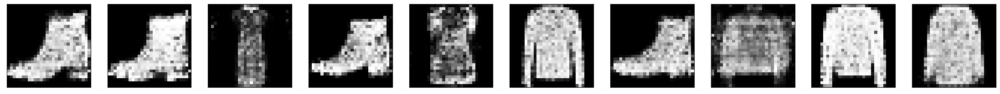

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:53,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:48,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<02:47,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:45,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:44,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


  3%|██                                                                                | 6/234 [00:04<02:43,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:43,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:43,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:41,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:41,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:41,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:40,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:39,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:39,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:39,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:38,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:36,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:36,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  8%|██████▌                                                                          | 19/234 [00:13<02:34,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  9%|██████▉                                                                          | 20/234 [00:14<02:34,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:34,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:15<02:34,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:16<02:33,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:17<02:32,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:32,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 11%|█████████                                                                        | 26/234 [00:18<02:31,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:19<02:37,  1.32it/s]

epoch:  76
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:20<02:34,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:36,  1.31it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:21<02:33,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:22<02:32,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:23<02:30,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:30,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:24<02:28,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:25<02:27,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:26<02:26,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:27<02:28,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:27<02:27,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:28<02:25,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:29<02:23,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▏                                                                  | 41/234 [00:30<02:22,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▌                                                                  | 42/234 [00:30<02:21,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:31<02:21,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:32<02:21,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:33<02:20,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:33<02:21,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 17ms/step


 20%|████████████████▎                                                                | 47/234 [00:34<02:19,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 15ms/step


 21%|████████████████▌                                                                | 48/234 [00:35<02:13,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 17ms/step


 21%|████████████████▉                                                                | 49/234 [00:35<02:09,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 15ms/step


 21%|█████████████████▎                                                               | 50/234 [00:36<02:08,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:37<02:13,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:38<02:12,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:38<02:13,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:39<02:12,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:40<02:10,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:41<02:10,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:41<02:09,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████                                                             | 58/234 [00:42<02:07,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████▍                                                            | 59/234 [00:43<02:05,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:43<02:04,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:44<02:03,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:45<02:03,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:46<02:02,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:46<02:02,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:47<02:01,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:48<02:01,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:48<02:00,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:49<01:59,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:50<01:59,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:51<02:01,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:51<02:00,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:52<01:58,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:53<01:57,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:54<01:57,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:54<01:56,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 21ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:55<01:55,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:56<01:55,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 33%|███████████████████████████                                                      | 78/234 [00:57<01:54,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:57<01:56,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:58<01:56,  1.32it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████                                                     | 81/234 [00:59<01:56,  1.31it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:00<01:54,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:00<01:53,  1.34it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:01<01:50,  1.35it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:02<01:49,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:02<01:48,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:03<01:47,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:04<01:46,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:05<01:44,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:05<01:45,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:06<01:44,  1.37it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:07<01:42,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:08<01:41,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:08<01:40,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:09<01:39,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:10<01:38,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:10<01:37,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:11<01:36,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:12<01:35,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:13<01:35,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:13<01:34,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:14<01:34,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:15<01:32,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:15<01:32,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:16<01:31,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:17<01:31,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:17<01:30,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:18<01:29,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:19<01:30,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:20<01:29,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:21<01:40,  1.23it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:21<01:34,  1.29it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:22<01:31,  1.32it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:23<01:28,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:23<01:25,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:24<01:24,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:25<01:22,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:26<01:21,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:26<01:20,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:27<01:19,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:28<01:20,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:28<01:19,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:29<01:18,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:30<01:17,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:31<01:17,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:31<01:16,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:32<01:15,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:33<01:14,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:33<01:13,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:34<01:11,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:35<01:11,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:35<01:10,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:36<01:10,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:37<01:09,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:37<01:08,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:38<01:08,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:39<01:07,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:40<01:06,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:40<01:05,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:41<01:05,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:42<01:04,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:42<01:04,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:43<01:04,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:44<01:03,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:44<01:02,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:45<01:01,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:46<01:00,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:47<00:59,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:47<00:58,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:48<00:58,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:49<00:57,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:49<00:56,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:50<00:55,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:51<00:54,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:51<00:54,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:52<00:53,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:53<00:52,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:53<00:52,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:54<00:51,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:55<00:50,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [01:55<00:50,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [01:56<00:49,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [01:57<00:48,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [01:58<00:47,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [01:58<00:47,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [01:59<00:46,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:00<00:45,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:00<00:45,  1.46it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:01<00:44,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:02<00:44,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:02<00:43,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:03<00:42,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:04<00:41,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:04<00:41,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:05<00:40,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:06<00:39,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:06<00:39,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:07<00:38,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:08<00:37,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:09<00:37,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:09<00:36,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:10<00:35,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:11<00:35,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:11<00:34,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:12<00:33,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:13<00:33,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:13<00:32,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:14<00:31,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:15<00:31,  1.45it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:16<00:31,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:16<00:30,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:17<00:30,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:18<00:29,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:18<00:28,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:19<00:27,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:20<00:26,  1.41it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:20<00:26,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:21<00:25,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:22<00:24,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:23<00:23,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:23<00:23,  1.43it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:24<00:22,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:25<00:21,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:25<00:21,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:26<00:20,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:27<00:20,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:28<00:19,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:28<00:18,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:29<00:17,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:30<00:17,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:30<00:16,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:31<00:15,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:32<00:15,  1.38it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:33<00:14,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:33<00:14,  1.31it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:34<00:13,  1.33it/s]

epoch:  76
8/8 [==============================] - 0s 15ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:35<00:12,  1.39it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:36<00:11,  1.42it/s]

epoch:  76
8/8 [==============================] - 0s 15ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:36<00:10,  1.44it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:37<00:10,  1.40it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:38<00:09,  1.36it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:39<00:09,  1.30it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:39<00:08,  1.27it/s]

epoch:  76
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:40<00:07,  1.25it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:41<00:07,  1.25it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:42<00:06,  1.26it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:43<00:05,  1.27it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:43<00:04,  1.27it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:44<00:03,  1.27it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:45<00:03,  1.26it/s]

epoch:  76
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:46<00:02,  1.26it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:47<00:01,  1.26it/s]

epoch:  76
8/8 [==============================] - 0s 18ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:47<00:00,  1.27it/s]

epoch:  76
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:48<00:00,  1.39it/s]


epoch:  76


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 19ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:02,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:03,  1.26it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<03:03,  1.26it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:03,  1.25it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  2%|█▊                                                                                | 5/234 [00:03<03:01,  1.26it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  3%|██                                                                                | 6/234 [00:04<03:00,  1.26it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:58,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:56,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  4%|███▏                                                                              | 9/234 [00:07<02:56,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:56,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:55,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:53,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:53,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:52,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:49,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:49,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:48,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:47,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:46,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:45,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:45,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:42,  1.30it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:42,  1.30it/s]

epoch:  77
8/8 [==============================] - 0s 22ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:42,  1.29it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:43,  1.28it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:43,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:43,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:42,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:22<02:42,  1.26it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:23<02:40,  1.27it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:24<02:36,  1.30it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:32,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:25<02:29,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:27,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:27<02:26,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:25,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:23,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:29<02:21,  1.38it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:30<02:22,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:21,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:20,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:32<02:20,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:22,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:21,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:20,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:19,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:17,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:16,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:20,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:18,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:15,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:13,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:12,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 18ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:12,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:41<02:14,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:13,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:12,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:11,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:44<02:10,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:09,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:08,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:08,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:47<02:08,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:06,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:05,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:50<02:03,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:50<02:03,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:51<02:03,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<02:02,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:00,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:53<01:59,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:54<01:59,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:55<01:58,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<02:00,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:56<01:58,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:57<01:58,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<01:56,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 33%|███████████████████████████                                                      | 78/234 [00:58<01:54,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:59<01:53,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:00<01:52,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████                                                     | 81/234 [01:01<01:52,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:01<01:51,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:02<01:51,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:03<01:50,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:04<01:50,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:04<01:49,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:05<01:48,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:06<01:47,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:07<01:46,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:07<01:45,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:08<01:44,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:09<01:42,  1.38it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:09<01:43,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:10<01:42,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:11<01:43,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:12<01:42,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:12<01:41,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:13<01:43,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:14<01:42,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:15<01:40,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:15<01:39,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:16<01:37,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:17<01:36,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:18<01:35,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:18<01:35,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:19<01:34,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:20<01:33,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:21<01:33,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:21<01:32,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:22<01:31,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:23<01:30,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:24<01:30,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:24<01:30,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:29,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:26<01:30,  1.31it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:27<01:29,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:27<01:28,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:27,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:29<01:25,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:30<01:24,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:30<01:24,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:31<01:25,  1.31it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:32<01:24,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:33<01:23,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:33<01:22,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:34<01:21,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:35<01:21,  1.31it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:36<01:20,  1.31it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:36<01:19,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:37<01:18,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:38<01:16,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:39<01:15,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:39<01:14,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:40<01:13,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:41<01:12,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:42<01:12,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:42<01:11,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:43<01:10,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:44<01:09,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:44<01:07,  1.39it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:45<01:08,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 15ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:46<01:04,  1.43it/s]

epoch:  77
8/8 [==============================] - 0s 16ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:47<01:02,  1.45it/s]

epoch:  77
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:47<01:01,  1.47it/s]

epoch:  77
8/8 [==============================] - 0s 15ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:48<01:01,  1.44it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:49<01:04,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:49<01:04,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:50<01:03,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:51<01:02,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:52<01:01,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:52<01:00,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:53<01:00,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:54<00:59,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:55<00:58,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:55<00:58,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:56<00:57,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:57<00:56,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:58<00:55,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:58<00:55,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [01:59<00:54,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:00<00:53,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:00<00:52,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:01<00:51,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:02<00:51,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:03<00:51,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:03<00:50,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:04<00:49,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:05<00:48,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:06<00:48,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:06<00:47,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:07<00:46,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:08<00:45,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:09<00:45,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:09<00:44,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:10<00:43,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:11<00:43,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:12<00:42,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:12<00:41,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:13<00:41,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:14<00:40,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:15<00:39,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:15<00:38,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:16<00:37,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:17<00:36,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:18<00:36,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:18<00:35,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:19<00:35,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:20<00:34,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:21<00:33,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:21<00:32,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:22<00:31,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:23<00:31,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:24<00:31,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:24<00:29,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:25<00:29,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:26<00:28,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:27<00:27,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:27<00:26,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:28<00:25,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:29<00:24,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:29<00:24,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:30<00:23,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:31<00:22,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:32<00:22,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:32<00:21,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:33<00:21,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:34<00:20,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:35<00:19,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:35<00:18,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:36<00:17,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:37<00:16,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:38<00:16,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:38<00:15,  1.37it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:39<00:14,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:40<00:13,  1.36it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:41<00:13,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:41<00:12,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:42<00:11,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:43<00:11,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:44<00:10,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:44<00:09,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:45<00:09,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:46<00:08,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:47<00:07,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:47<00:06,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:48<00:05,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:49<00:05,  1.34it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:50<00:04,  1.35it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:50<00:03,  1.32it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:51<00:03,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:52<00:02,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:53<00:01,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 20ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:53<00:00,  1.33it/s]

epoch:  77
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:54<00:00,  1.34it/s]


epoch:  77


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:58,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:55,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:02<02:54,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:03<02:53,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:52,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  3%|██                                                                                | 6/234 [00:04<02:52,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:51,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:50,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:50,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:49,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:49,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:51,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:48,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:47,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:46,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:44,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:43,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:42,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:40,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:41,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:39,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:38,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:37,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:37,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:37,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:40,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:38,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:37,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 23ms/step


 12%|██████████                                                                       | 29/234 [00:22<02:43,  1.26it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:43,  1.25it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:43,  1.24it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:42,  1.24it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:25<02:41,  1.25it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:40,  1.25it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:39,  1.24it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:39,  1.24it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:36,  1.26it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:29<02:31,  1.29it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:29,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:26,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:23,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:32<02:22,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:22,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:20,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:19,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:19,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:19,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:18,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:17,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:16,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:14,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:13,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:11,  1.38it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:40<02:10,  1.38it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:41<02:15,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:14,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:14,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:12,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:44<02:09,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 18ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:07,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:06,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:46<02:06,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:47<02:05,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:04,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:03,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:49<02:02,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:50<02:06,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:51<02:01,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 17ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<01:56,  1.41it/s]

epoch:  78
8/8 [==============================] - 0s 17ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:52<01:53,  1.44it/s]

epoch:  78
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:53<01:53,  1.44it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:54<01:57,  1.38it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:54<01:56,  1.38it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:55<01:57,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:56<01:56,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:57<01:56,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 22ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:57<01:56,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 33%|███████████████████████████                                                      | 78/234 [00:58<01:55,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:59<01:55,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:00<01:54,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████                                                     | 81/234 [01:00<01:53,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:01<01:52,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:02<01:53,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:03<01:51,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:03<01:50,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:04<01:49,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:05<01:48,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:06<01:47,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:06<01:47,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:07<01:48,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:08<01:47,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:09<01:46,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:09<01:45,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:10<01:44,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:11<01:43,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:12<01:42,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:12<01:41,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:13<01:40,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:14<01:39,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:14<01:39,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:15<01:39,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 18ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:16<01:38,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:17<01:37,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:18<01:38,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:18<01:36,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:19<01:35,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:20<01:34,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:20<01:33,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:21<01:32,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:22<01:30,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:23<01:29,  1.37it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:23<01:31,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:24<01:29,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:28,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:26<01:27,  1.36it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:26<01:27,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:27<01:29,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:28,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:29<01:27,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:29<01:26,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:30<01:25,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:31<01:24,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:32<01:23,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:32<01:22,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:33<01:22,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:34<01:23,  1.29it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:35<01:21,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:36<01:21,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:36<01:19,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:37<01:19,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:38<01:17,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:39<01:16,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:39<01:15,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:40<01:14,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:41<01:13,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:42<01:12,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:42<01:11,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:43<01:11,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:44<01:10,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:45<01:10,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:45<01:10,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:46<01:10,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:47<01:10,  1.28it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:48<01:11,  1.27it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:48<01:10,  1.26it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:49<01:09,  1.26it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:50<01:09,  1.26it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:51<01:07,  1.28it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:52<01:05,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:52<01:03,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:53<01:02,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:54<01:01,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:55<01:00,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:55<01:00,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:56<00:59,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:57<00:58,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:58<00:57,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:58<00:57,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [01:59<00:56,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:00<00:55,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:01<00:54,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:01<00:54,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:02<00:53,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:03<00:52,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:04<00:51,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:04<00:51,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:05<00:50,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:06<00:49,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:07<00:49,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:07<00:48,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:08<00:47,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:09<00:46,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:10<00:45,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:10<00:44,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:11<00:44,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:12<00:43,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:13<00:42,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:13<00:42,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:14<00:41,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:15<00:40,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:16<00:40,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:16<00:39,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:17<00:38,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:18<00:37,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:19<00:37,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:19<00:36,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:20<00:35,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:21<00:34,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:22<00:34,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:22<00:33,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:23<00:32,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:24<00:31,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:25<00:30,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:25<00:30,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:26<00:29,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:27<00:28,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:28<00:27,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:29<00:27,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:29<00:26,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:30<00:25,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:31<00:24,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:32<00:24,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:32<00:23,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:33<00:22,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:34<00:21,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:35<00:20,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:35<00:20,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:36<00:19,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:37<00:18,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:37<00:17,  1.34it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:38<00:17,  1.28it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:39<00:17,  1.27it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:40<00:16,  1.27it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:41<00:15,  1.29it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:41<00:14,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:42<00:13,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:43<00:12,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:44<00:12,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:44<00:11,  1.33it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:45<00:10,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:46<00:09,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:47<00:09,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:48<00:08,  1.30it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:48<00:07,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:49<00:06,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:50<00:06,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:51<00:05,  1.25it/s]

epoch:  78
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:51<00:04,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:52<00:03,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 16ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:53<00:02,  1.40it/s]

epoch:  78
8/8 [==============================] - 0s 16ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:53<00:02,  1.35it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:54<00:01,  1.31it/s]

epoch:  78
8/8 [==============================] - 0s 20ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:55<00:00,  1.32it/s]

epoch:  78
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:56<00:00,  1.33it/s]


epoch:  78


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:55,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:55,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:02<02:55,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:03<02:54,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:54,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:04<02:54,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:53,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:53,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:52,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:51,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:51,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:50,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:49,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:50,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:49,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:48,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:46,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:45,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:43,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:42,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:41,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:40,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:39,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:38,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:37,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:38,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:37,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:36,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:22<02:35,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:35,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:34,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:33,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 14%|███████████▍                                                                     | 33/234 [00:25<02:34,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:33,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:32,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:32,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:33,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:29<02:34,  1.27it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:32,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:30,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:29,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:32<02:28,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:26,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:25,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:25,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:24,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:36<02:23,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:22,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:20,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:19,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 22%|█████████████████▋                                                               | 51/234 [00:39<02:17,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:16,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:16,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:19,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:17,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:16,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:14,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:13,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:12,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:11,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:09,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:08,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:07,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:06,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:05,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:50<02:04,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:51<02:04,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:51<02:03,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<02:03,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:03,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:54<02:02,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:54<02:01,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:55<02:00,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<02:00,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:57<01:59,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:57<01:57,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<01:57,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 33%|███████████████████████████                                                      | 78/234 [00:59<01:56,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:00<01:56,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:00<01:57,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████                                                     | 81/234 [01:01<01:56,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:02<01:55,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:03<01:54,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:03<01:53,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:04<01:52,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:05<01:51,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 17ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:06<01:48,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 18ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:06<01:46,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:07<01:46,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:08<01:46,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:09<01:45,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:09<01:44,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 22ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:10<01:48,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:11<01:47,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:12<01:48,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:12<01:46,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:13<01:47,  1.27it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:14<01:45,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:15<01:44,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:16<01:42,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:16<01:41,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:17<01:40,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:18<01:40,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:19<01:40,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:19<01:39,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:20<01:38,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:21<01:38,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:22<01:37,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:23<01:38,  1.27it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:23<01:36,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:24<01:36,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:25<01:35,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:26<01:33,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:26<01:32,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:27<01:31,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:28<01:30,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:29<01:31,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:29<01:29,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:30<01:27,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:31<01:26,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:32<01:25,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:32<01:24,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:33<01:23,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:34<01:22,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:35<01:22,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:35<01:21,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:36<01:20,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:37<01:19,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:38<01:22,  1.27it/s]

epoch:  79
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:39<01:22,  1.26it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:39<01:20,  1.28it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:40<01:18,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:41<01:17,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:42<01:15,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:42<01:14,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:43<01:14,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:44<01:13,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:45<01:13,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:45<01:11,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:46<01:11,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:47<01:10,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:48<01:09,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:48<01:08,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:49<01:07,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:50<01:06,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:51<01:05,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:51<01:04,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:52<01:03,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:53<01:02,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:54<01:02,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 32ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:54<01:04,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:55<01:00,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 18ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:56<00:58,  1.39it/s]

epoch:  79
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:56<00:56,  1.42it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:57<00:57,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:58<00:58,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:59<00:58,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:00<00:56,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:00<00:56,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:01<00:55,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:02<00:54,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:02<00:53,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:03<00:52,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:04<00:51,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:05<00:50,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:05<00:50,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:06<00:49,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:07<00:48,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:08<00:48,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:08<00:47,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:09<00:47,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:10<00:46,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:11<00:45,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:11<00:45,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:12<00:44,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:13<00:43,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:14<00:43,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:14<00:42,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:15<00:41,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:16<00:41,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:17<00:41,  1.29it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:18<00:40,  1.30it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:18<00:38,  1.31it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:19<00:37,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:20<00:36,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:21<00:36,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:21<00:35,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:22<00:34,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:23<00:33,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:24<00:33,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:24<00:32,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:25<00:31,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:26<00:31,  1.32it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:27<00:30,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:27<00:29,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:28<00:28,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:29<00:27,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:30<00:26,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:30<00:25,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:31<00:25,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:32<00:24,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:33<00:23,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:33<00:23,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:34<00:22,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:35<00:21,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:35<00:20,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:36<00:19,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:37<00:19,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:38<00:18,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:38<00:17,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:39<00:16,  1.37it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:40<00:16,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:41<00:15,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:41<00:14,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:42<00:14,  1.33it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:43<00:13,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:44<00:12,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:44<00:11,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:45<00:11,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:46<00:10,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:47<00:09,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:47<00:08,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:48<00:08,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:49<00:07,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:49<00:06,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:50<00:05,  1.36it/s]

epoch:  79
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:51<00:05,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:52<00:04,  1.35it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:52<00:03,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:53<00:02,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:54<00:02,  1.34it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:55<00:01,  1.25it/s]

epoch:  79
8/8 [==============================] - 0s 20ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:56<00:00,  1.07it/s]

epoch:  79
8/8 [==============================] - 0s 28ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:57<00:00,  1.32it/s]


epoch:  79


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 29ms/step


  0%|▎                                                                                 | 1/234 [00:01<04:34,  1.18s/it]

epoch:  80
8/8 [==============================] - 0s 24ms/step


  1%|▋                                                                                 | 2/234 [00:02<04:09,  1.08s/it]

epoch:  80
8/8 [==============================] - 0s 27ms/step


  1%|█                                                                                 | 3/234 [00:03<03:58,  1.03s/it]

epoch:  80
8/8 [==============================] - 0s 25ms/step


  2%|█▍                                                                                | 4/234 [00:04<03:42,  1.03it/s]

epoch:  80
8/8 [==============================] - 0s 22ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:28,  1.10it/s]

epoch:  80
8/8 [==============================] - 0s 22ms/step


  3%|██                                                                                | 6/234 [00:05<03:24,  1.12it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:16,  1.15it/s]

epoch:  80
8/8 [==============================] - 0s 22ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:13,  1.17it/s]

epoch:  80
8/8 [==============================] - 0s 22ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:11,  1.18it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:02,  1.23it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:09<02:55,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:10<02:51,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:11<02:47,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:47,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:45,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:13<02:44,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step
epoch:  80
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:13<01:40,  2.14it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<01:56,  1.85it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:09,  1.65it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:18,  1.54it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:22,  1.49it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:28,  1.42it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:27,  1.42it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:27,  1.41it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:28,  1.40it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:28,  1.39it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:29,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:29,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:31,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:30,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:29,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:28,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:29,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:30,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:29,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:27<02:27,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:28<02:26,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:25,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:26,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:30<02:26,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:31<02:27,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:28,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:28,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:30,  1.26it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:34<02:29,  1.26it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:27,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:25,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:23,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:37<02:22,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:21,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:19,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:17,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:40<02:15,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:41<02:14,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:13,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:14,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████                                                             | 58/234 [00:43<02:12,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:44<02:12,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:10,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:09,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:46<02:08,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:47<02:07,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:06,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:06,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:49<02:06,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:50<02:08,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:51<02:07,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<02:07,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:06,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:53<02:06,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:54<02:09,  1.25it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:55<02:14,  1.19it/s]

epoch:  80
8/8 [==============================] - 0s 17ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<02:06,  1.26it/s]

epoch:  80
8/8 [==============================] - 0s 17ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:57<02:02,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 16ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:57<01:57,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 17ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<01:58,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [00:59<01:59,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:00<02:00,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:00<01:59,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:01<02:00,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:02<01:59,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:03<01:58,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:04<01:57,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:04<01:55,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:05<01:55,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:06<01:54,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:07<01:53,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:07<01:51,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:08<01:51,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:09<01:50,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:10<01:49,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:11<01:49,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:11<01:48,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:12<01:47,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:13<01:46,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:14<01:45,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:14<01:44,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:15<01:44,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:16<01:44,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:17<01:43,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:17<01:42,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:18<01:41,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:19<01:40,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:20<01:39,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:21<01:39,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:21<01:38,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:22<01:37,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:23<01:37,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:24<01:35,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:24<01:35,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:25<01:34,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:26<01:33,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:27<01:33,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:28<01:32,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:28<01:31,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:29<01:30,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:30<01:30,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:31<01:29,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:31<01:28,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:32<01:28,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:33<01:26,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:34<01:25,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:35<01:24,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:35<01:23,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:36<01:23,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:37<01:23,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:38<01:22,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:38<01:22,  1.27it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:39<01:21,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:40<01:20,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:41<01:19,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:42<01:18,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:42<01:17,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:43<01:17,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:44<01:16,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:45<01:15,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:45<01:14,  1.28it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:46<01:13,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:47<01:12,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:48<01:11,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:48<01:09,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:49<01:08,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:50<01:07,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:51<01:15,  1.19it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:52<01:12,  1.22it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:53<01:08,  1.26it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:53<01:06,  1.29it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:54<01:05,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:55<01:03,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:55<01:02,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:56<01:01,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:57<01:00,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:58<00:59,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:58<00:58,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:59<00:58,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:00<00:57,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:01<00:56,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:01<00:55,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:02<00:54,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:03<00:54,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:04<00:53,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:04<00:52,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:05<00:51,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:06<00:51,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:07<00:51,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:07<00:50,  1.32it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:08<00:49,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:09<00:48,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:10<00:47,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:10<00:46,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:11<00:45,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:12<00:44,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:13<00:43,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:13<00:43,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:14<00:43,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:15<00:42,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:15<00:41,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:16<00:40,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:17<00:39,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:18<00:38,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:18<00:37,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:19<00:37,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:20<00:36,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:21<00:35,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:21<00:35,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:22<00:34,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:23<00:33,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:23<00:32,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:24<00:32,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:25<00:31,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:26<00:30,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:26<00:29,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:27<00:29,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:28<00:28,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:29<00:27,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:29<00:26,  1.38it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:30<00:26,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:31<00:25,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:32<00:24,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:32<00:24,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:33<00:23,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:34<00:23,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:35<00:22,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:35<00:21,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:36<00:21,  1.30it/s]

epoch:  80
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:37<00:20,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:38<00:19,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:38<00:18,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:39<00:18,  1.33it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:40<00:17,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:41<00:16,  1.34it/s]

epoch:  80
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:41<00:15,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:42<00:14,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:43<00:13,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:43<00:13,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:44<00:12,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:45<00:11,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:46<00:10,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:46<00:10,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:47<00:09,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:48<00:08,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:49<00:08,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:49<00:07,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:50<00:06,  1.35it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:51<00:05,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:52<00:05,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:52<00:04,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:53<00:03,  1.36it/s]

epoch:  80
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:54<00:02,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:55<00:02,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:55<00:01,  1.31it/s]

epoch:  80
8/8 [==============================] - 0s 15ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:56<00:00,  1.37it/s]

epoch:  80
8/8 [==============================] - 0s 16ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:57<00:00,  1.32it/s]

epoch:  80
1/1 [==============================] - 0s 38ms/step


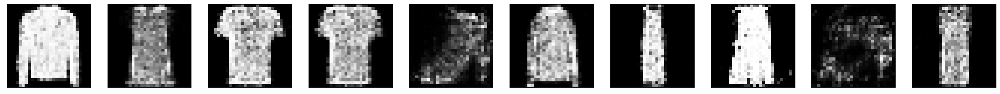

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:00,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:00,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:02<02:58,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:03<02:53,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:49,  1.35it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  3%|██                                                                                | 6/234 [00:04<02:48,  1.35it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:46,  1.36it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:46,  1.36it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:45,  1.36it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:48,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:47,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:46,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:46,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:44,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:43,  1.34it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:45,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:44,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:43,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:42,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:41,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:40,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:39,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:39,  1.33it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:38,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:41,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:40,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:38,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:37,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:36,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:35,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:35,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:34,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:34,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:33,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:32,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:32,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:30,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:28<02:29,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:27,  1.32it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:30,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:29,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:31<02:31,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:29,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:27,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:25,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:25,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:24,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:23,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:22,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:21,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:21,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:22,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:20,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:21,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:19,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:18,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:17,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:15,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:14,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:13,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:13,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:11,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:11,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:48<02:11,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:49<02:11,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:50<02:10,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:51<02:09,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:52<02:08,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:52<02:07,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:53<02:06,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:54<02:05,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:55<02:04,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:55<02:03,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:56<02:03,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:57<02:02,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:58<02:01,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:58<02:01,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [00:59<01:59,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:00<01:59,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:01<01:58,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:02<01:58,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:02<01:57,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:03<01:57,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:04<01:55,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:05<01:54,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:05<01:55,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 24ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:06<01:58,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:07<02:01,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:08<02:00,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:09<01:59,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:10<01:59,  1.19it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:11<01:59,  1.18it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:11<01:58,  1.19it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:12<01:58,  1.18it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:13<01:57,  1.19it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:14<01:56,  1.19it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:15<01:54,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:16<01:54,  1.19it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:16<01:52,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:17<01:51,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:18<01:50,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:19<01:49,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:20<01:48,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:21<01:45,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:21<01:42,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:22<01:40,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:23<01:38,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:24<01:37,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:24<01:36,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:25<01:35,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:26<01:34,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:27<01:36,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:28<01:38,  1.22it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:28<01:39,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:29<01:37,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:30<01:37,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:31<01:36,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:32<01:36,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:33<01:35,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:33<01:34,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:34<01:34,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:35<01:32,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:36<01:31,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:37<01:31,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:38<01:30,  1.20it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:38<01:29,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:39<01:26,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:40<01:25,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:41<01:23,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:41<01:22,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:42<01:20,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:43<01:23,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:44<01:22,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:45<01:20,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:46<01:19,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:46<01:18,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:47<01:18,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:48<01:16,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:49<01:15,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:49<01:13,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:50<01:12,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:51<01:13,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:52<01:11,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:53<01:10,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:53<01:09,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:54<01:08,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:55<01:07,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:56<01:06,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<01:06,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:57<01:09,  1.21it/s]

epoch:  81
8/8 [==============================] - 0s 16ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:58<01:05,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 17ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:59<01:02,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 16ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<01:00,  1.34it/s]

epoch:  81
8/8 [==============================] - 0s 17ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:00<01:01,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:01<01:02,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:02<01:01,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:03<01:00,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:04<01:00,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:04<01:00,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:05<00:59,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:06<00:58,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:07<00:57,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:08<00:56,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:08<00:55,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:09<00:54,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:10<00:53,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:11<00:52,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:12<00:52,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:12<00:50,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:13<00:50,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:14<00:49,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:15<00:48,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:16<00:49,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:16<00:48,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:17<00:47,  1.23it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:18<00:46,  1.24it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:19<00:45,  1.25it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:20<00:44,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:20<00:43,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:21<00:42,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:22<00:41,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:23<00:40,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:23<00:39,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:24<00:38,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:25<00:37,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:26<00:36,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:27<00:36,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:27<00:35,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:28<00:34,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:29<00:34,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:30<00:33,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:30<00:32,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:31<00:31,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:32<00:30,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:33<00:29,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:33<00:28,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:34<00:28,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:35<00:27,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:36<00:26,  1.31it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:36<00:26,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:37<00:25,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:38<00:25,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:39<00:24,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:40<00:23,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:40<00:22,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:41<00:21,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:42<00:21,  1.26it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:43<00:20,  1.27it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:44<00:19,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:44<00:18,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:45<00:17,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:46<00:16,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:47<00:16,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:47<00:15,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:48<00:14,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:49<00:13,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:50<00:13,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:50<00:12,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:51<00:11,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:52<00:10,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:53<00:10,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:54<00:09,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:54<00:08,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:55<00:07,  1.28it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:56<00:06,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:57<00:06,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:57<00:05,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:58<00:04,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:59<00:03,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:00<00:03,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:01<00:02,  1.30it/s]

epoch:  81
8/8 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:01<00:01,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:02<00:00,  1.29it/s]

epoch:  81
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:03<00:00,  1.28it/s]


epoch:  81


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:58,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:05,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:02<03:03,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:00,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:58,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:04<02:58,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:58,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:57,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  4%|███▏                                                                              | 9/234 [00:07<02:57,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:59,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:59,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:56,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:55,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:53,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:52,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:51,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:51,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:50,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:53,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:51,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:51,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:50,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:18<02:48,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:47,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:45,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:44,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:44,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:43,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:42,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:23<02:40,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:24<02:39,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:25<02:38,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:36,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:35,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 15%|████████████                                                                     | 35/234 [00:27<02:34,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:28<02:33,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:29<02:33,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:32,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▌                                                                   | 39/234 [00:30<02:35,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▊                                                                   | 40/234 [00:31<02:33,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▏                                                                  | 41/234 [00:32<02:32,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▌                                                                  | 42/234 [00:33<02:30,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:33<02:30,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 19%|███████████████▏                                                                 | 44/234 [00:34<02:29,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:35<02:27,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:36<02:33,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:37<02:34,  1.21it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:38<02:31,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:38<02:28,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:39<02:26,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:40<02:24,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:41<02:23,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:41<02:22,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:42<02:21,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:43<02:19,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▍                                                             | 56/234 [00:44<02:19,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▋                                                             | 57/234 [00:45<02:21,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:45<02:19,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:46<02:19,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:47<02:19,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:48<02:17,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:49<02:15,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:49<02:14,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:50<02:12,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:51<02:11,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:52<02:10,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:52<02:09,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:53<02:09,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:54<02:15,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 16ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:55<02:06,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:56<02:02,  1.33it/s]

epoch:  82
8/8 [==============================] - 0s 17ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:56<01:58,  1.37it/s]

epoch:  82
8/8 [==============================] - 0s 16ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:57<02:00,  1.34it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:58<02:03,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:59<02:04,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:59<02:04,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:00<02:03,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 33%|███████████████████████████                                                      | 78/234 [01:01<02:01,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:02<02:01,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:03<02:00,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:03<02:00,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:04<02:00,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:05<02:01,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:06<02:00,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:07<01:59,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:07<01:58,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:08<01:57,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:09<01:56,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:10<01:55,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:11<01:54,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:11<01:54,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:12<01:55,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:13<01:57,  1.20it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:14<01:54,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:15<01:52,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:15<01:51,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:16<01:51,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:17<01:50,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:18<01:48,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:19<01:47,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:19<01:46,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:20<01:45,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:21<01:44,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:22<01:43,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:23<01:42,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:23<01:41,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:24<01:39,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:25<01:38,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:26<01:37,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:27<01:36,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:27<01:35,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:28<01:34,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:29<01:34,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:30<01:33,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:30<01:32,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:31<01:32,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:32<01:31,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:33<01:30,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:34<01:31,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:34<01:30,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:35<01:28,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:36<01:27,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:37<01:28,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:38<01:27,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:38<01:26,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:39<01:24,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:40<01:24,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:41<01:23,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:41<01:23,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:42<01:21,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:43<01:20,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:44<01:20,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:45<01:19,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:45<01:18,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:46<01:17,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:47<01:16,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:15,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:48<01:14,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:49<01:13,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:50<01:12,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:11,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:10,  1.31it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:52<01:10,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:53<01:09,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:54<01:08,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:08,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:55<01:07,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:56<01:06,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<01:06,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:58<01:05,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:59<01:04,  1.29it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:59<01:03,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<01:02,  1.30it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:01<01:04,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:02<01:04,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:03<01:03,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:03<01:01,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:04<01:00,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:05<00:59,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:06<00:58,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:07<00:57,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:07<00:56,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:08<00:56,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:09<00:55,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:10<00:54,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:10<00:53,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:11<00:53,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:12<00:52,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:13<00:51,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:14<00:50,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:14<00:49,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:15<00:49,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:16<00:48,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:17<00:47,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:18<00:46,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:18<00:46,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:19<00:45,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:20<00:44,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:21<00:44,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:22<00:43,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:22<00:42,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:23<00:41,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:24<00:40,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:25<00:39,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:26<00:38,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:26<00:37,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:27<00:36,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:28<00:35,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:29<00:35,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:29<00:34,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:30<00:34,  1.25it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:31<00:34,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:32<00:34,  1.20it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:33<00:33,  1.19it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:34<00:32,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:35<00:32,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:35<00:31,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:36<00:30,  1.17it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:37<00:29,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:38<00:28,  1.19it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:39<00:27,  1.19it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:40<00:26,  1.19it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:41<00:26,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:41<00:25,  1.17it/s]

epoch:  82
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:42<00:25,  1.16it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:43<00:24,  1.13it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:44<00:24,  1.11it/s]

epoch:  82
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:45<00:23,  1.13it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:46<00:21,  1.16it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:47<00:21,  1.14it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:48<00:19,  1.16it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:48<00:18,  1.18it/s]

epoch:  82
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:49<00:17,  1.19it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:50<00:16,  1.20it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:51<00:15,  1.21it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:52<00:14,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:52<00:13,  1.22it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:53<00:13,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:54<00:12,  1.16it/s]

epoch:  82
8/8 [==============================] - 0s 16ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:55<00:11,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:56<00:10,  1.27it/s]

epoch:  82
8/8 [==============================] - 0s 16ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:56<00:09,  1.32it/s]

epoch:  82
8/8 [==============================] - 0s 16ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:57<00:08,  1.28it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:58<00:07,  1.26it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:59<00:07,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:00<00:06,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:00<00:05,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:01<00:04,  1.23it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:02<00:04,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:03<00:03,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:04<00:02,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:05<00:01,  1.24it/s]

epoch:  82
8/8 [==============================] - 0s 22ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:05<00:00,  1.21it/s]

epoch:  82
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:06<00:00,  1.25it/s]


epoch:  82


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:10,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:06,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:02<03:06,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:05,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:03,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:04<03:01,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:03,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:59,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  4%|███▏                                                                              | 9/234 [00:07<02:56,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:54,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:53,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:56,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:55,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:54,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:53,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:51,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:49,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:51,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:51,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:53,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:52,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:50,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:18<02:49,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:47,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:45,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:44,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:43,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:41,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:40,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:23<02:41,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:24<02:39,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:25<02:38,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:38,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:39,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 15%|████████████                                                                     | 35/234 [00:27<02:38,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:28<02:36,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 16%|████████████▊                                                                    | 37/234 [00:29<02:34,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:34,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▌                                                                   | 39/234 [00:30<02:34,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:31<02:33,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                                  | 41/234 [00:32<02:31,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:33<02:31,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▉                                                                  | 43/234 [00:34<02:30,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:34<02:28,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:35<02:27,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:36<02:26,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 20%|████████████████▎                                                                | 47/234 [00:37<02:26,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:37<02:27,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:38<02:25,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 21%|█████████████████▎                                                               | 50/234 [00:39<02:25,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:40<02:23,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:41<02:23,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:41<02:22,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:42<02:21,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████                                                              | 55/234 [00:43<02:20,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▍                                                             | 56/234 [00:44<02:19,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:45<02:20,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:45<02:18,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:46<02:16,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:47<02:14,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:48<02:14,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:48<02:13,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:49<02:12,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:50<02:11,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:51<02:10,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:52<02:10,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:52<02:09,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:53<02:08,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:54<02:07,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:55<02:06,  1.30it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:55<02:05,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:56<02:04,  1.30it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:57<02:03,  1.30it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:58<02:03,  1.30it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:58<02:03,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:59<02:02,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:00<02:01,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [01:01<02:00,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:02<02:00,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:02<02:00,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:03<02:00,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:04<01:59,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:05<01:58,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:06<01:58,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:06<01:56,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:07<01:55,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:08<01:55,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:09<01:54,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:09<01:54,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 23ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:10<01:53,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:11<01:52,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:12<01:52,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:13<01:51,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:13<01:50,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:14<01:49,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:15<01:50,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:16<01:49,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:17<01:48,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:17<01:46,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:18<01:47,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:19<01:46,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:20<01:46,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:21<01:44,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:21<01:44,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:22<01:43,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:23<01:42,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:24<01:41,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:25<01:42,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:25<01:40,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:26<01:39,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:27<01:38,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:28<01:36,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:29<01:39,  1.21it/s]

epoch:  83
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:30<01:38,  1.21it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:30<01:38,  1.21it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:31<01:36,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:32<01:34,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:33<01:32,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:34<01:32,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:34<01:31,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:35<01:30,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:36<01:29,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:37<01:29,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:38<01:28,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:38<01:27,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:39<01:26,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:40<01:25,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:41<01:25,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:42<01:25,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:42<01:24,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:43<01:23,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:44<01:22,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:45<01:21,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:46<01:20,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:46<01:19,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:47<01:23,  1.17it/s]

epoch:  83
8/8 [==============================] - 0s 16ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:18,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:49<01:15,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 16ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:50<01:12,  1.31it/s]

epoch:  83
8/8 [==============================] - 0s 16ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:50<01:12,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:13,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:14,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:53<01:13,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:54<01:12,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:55<01:12,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:12,  1.21it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:56<01:11,  1.21it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:57<01:10,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:58<01:09,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:59<01:08,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:59<01:07,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:00<01:06,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:01<01:05,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:02<01:04,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:03<01:04,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:03<01:03,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:04<01:02,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:05<01:01,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:06<01:00,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:07<00:59,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:07<00:58,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:08<00:57,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:09<00:56,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:10<00:54,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:11<00:54,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:11<00:53,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:12<00:52,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:13<00:52,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:14<00:51,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:15<00:51,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:15<00:50,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:16<00:49,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:17<00:47,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:18<00:46,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:18<00:46,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:19<00:45,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:20<00:44,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:21<00:43,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:22<00:43,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:22<00:42,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:23<00:41,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:24<00:41,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:25<00:40,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:26<00:39,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:26<00:38,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:27<00:37,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:28<00:37,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:29<00:36,  1.26it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:30<00:35,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:30<00:34,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:31<00:33,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:32<00:32,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:33<00:31,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:33<00:31,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:34<00:30,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:35<00:29,  1.29it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:36<00:28,  1.28it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:37<00:28,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:37<00:27,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:38<00:26,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:39<00:25,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:40<00:25,  1.27it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:41<00:25,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:41<00:24,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:42<00:23,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:43<00:22,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:44<00:22,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:45<00:21,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:45<00:20,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:46<00:19,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:47<00:18,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:48<00:17,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:49<00:16,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:49<00:16,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:50<00:15,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:51<00:14,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:52<00:13,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:53<00:13,  1.22it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:54<00:12,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:54<00:11,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:55<00:10,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:56<00:09,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:57<00:08,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:58<00:08,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:58<00:07,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:59<00:06,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:00<00:05,  1.25it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:01<00:04,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:02<00:04,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:02<00:03,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:03<00:02,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:04<00:01,  1.24it/s]

epoch:  83
8/8 [==============================] - 0s 22ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:05<00:00,  1.23it/s]

epoch:  83
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:06<00:00,  1.26it/s]


epoch:  83


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 22ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:15,  1.19it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:11,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  1%|█                                                                                 | 3/234 [00:02<03:10,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:07,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:06,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


  3%|██                                                                                | 6/234 [00:04<03:08,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:05,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:03,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:02,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:01,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:58,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:57,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  6%|████▌                                                                            | 13/234 [00:10<02:55,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:55,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:53,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:52,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:51,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:51,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:49,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:49,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:50,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:18<03:09,  1.12it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:18<03:01,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:55,  1.20it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:52,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:49,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:47,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:46,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:43,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:24<02:42,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:25<02:41,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:25<02:40,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:40,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:27<02:45,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:44,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:44,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 16%|████████████▊                                                                    | 37/234 [00:30<02:40,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:38,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▌                                                                   | 39/234 [00:31<02:36,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▊                                                                   | 40/234 [00:32<02:35,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                                  | 41/234 [00:33<02:34,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:34<02:33,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:34<02:31,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:35<02:31,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:36<02:30,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 23ms/step


 20%|███████████████▉                                                                 | 46/234 [00:37<02:29,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 26ms/step


 20%|████████████████▎                                                                | 47/234 [00:38<02:33,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:38<02:31,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:39<02:29,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:40<02:27,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:41<02:30,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:42<02:25,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 17ms/step


 23%|██████████████████▎                                                              | 53/234 [00:42<02:19,  1.30it/s]

epoch:  84
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:43<02:15,  1.33it/s]

epoch:  84
8/8 [==============================] - 0s 16ms/step


 24%|███████████████████                                                              | 55/234 [00:44<02:14,  1.33it/s]

epoch:  84
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████▍                                                             | 56/234 [00:45<02:20,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:45<02:22,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:46<02:22,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:47<02:20,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:48<02:19,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 26%|█████████████████████                                                            | 61/234 [00:49<02:18,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:49<02:17,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:50<02:16,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:51<02:14,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:52<02:13,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:53<02:12,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:53<02:12,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:54<02:10,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:55<02:10,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:56<02:09,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:57<02:08,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:57<02:07,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:58<02:05,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:59<02:05,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:00<02:05,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:00<02:03,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:01<02:02,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [01:02<02:02,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:03<02:00,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:04<02:00,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:04<01:59,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:05<01:58,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:06<01:57,  1.29it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:07<01:56,  1.29it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:07<01:55,  1.29it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:08<01:55,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:09<01:55,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:10<01:53,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:11<01:53,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:11<01:53,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:12<01:52,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:13<01:51,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:14<01:52,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:15<01:51,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:15<01:50,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:16<01:48,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:17<01:47,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:18<01:47,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:18<01:46,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:19<01:45,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:20<01:44,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:21<01:43,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:22<01:42,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:22<01:41,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:23<01:40,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:24<01:40,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:25<01:39,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:26<01:38,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:26<01:38,  1.27it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:27<01:36,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:28<01:35,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:29<01:35,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:29<01:34,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:30<01:33,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:31<01:35,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:32<01:37,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:33<01:38,  1.19it/s]

epoch:  84
8/8 [==============================] - 0s 25ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:34<01:40,  1.15it/s]

epoch:  84
8/8 [==============================] - 0s 23ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:35<01:39,  1.15it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:36<01:39,  1.15it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:36<01:37,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:37<01:36,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:38<01:36,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:39<01:34,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:40<01:34,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:41<01:33,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:42<01:32,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:42<01:30,  1.17it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:43<01:30,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:44<01:29,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:45<01:27,  1.18it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:46<01:27,  1.17it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:47<01:26,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:48<01:25,  1.17it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:48<01:25,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:49<01:24,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:50<01:23,  1.16it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:51<01:20,  1.19it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:52<01:18,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:53<01:17,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:53<01:15,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:54<01:14,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:55<01:13,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:56<01:13,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:57<01:12,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:57<01:11,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:58<01:10,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:59<01:09,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:00<01:08,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:01<01:07,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:01<01:06,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:02<01:05,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:03<01:04,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:04<01:03,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:05<01:02,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:05<01:02,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:06<01:02,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:07<01:01,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:08<01:00,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:09<00:59,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:09<00:58,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:10<00:58,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:11<00:57,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:12<00:57,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:13<00:56,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:13<00:55,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:14<00:54,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:15<00:53,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:16<00:53,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:17<00:52,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:18<00:51,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:18<00:50,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:19<00:50,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:20<00:49,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:21<00:48,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:22<00:47,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:23<00:46,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:23<00:47,  1.18it/s]

epoch:  84
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:24<00:46,  1.18it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:25<00:44,  1.20it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:26<00:44,  1.18it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:27<00:43,  1.20it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:28<00:42,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:28<00:40,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:29<00:40,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:30<00:39,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:31<00:38,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:32<00:37,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:32<00:36,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:33<00:35,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:34<00:35,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:35<00:34,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:36<00:33,  1.21it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:37<00:32,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:37<00:31,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:38<00:31,  1.22it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:39<00:30,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:40<00:29,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:41<00:28,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:41<00:28,  1.19it/s]

epoch:  84
8/8 [==============================] - 0s 16ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:42<00:26,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 17ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:43<00:24,  1.28it/s]

epoch:  84
8/8 [==============================] - 0s 17ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:44<00:23,  1.33it/s]

epoch:  84
8/8 [==============================] - 0s 17ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:44<00:22,  1.31it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:45<00:22,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:46<00:22,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:47<00:22,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:48<00:21,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:49<00:20,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:49<00:19,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:50<00:18,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:51<00:17,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:52<00:16,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:53<00:16,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:53<00:15,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:54<00:14,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:55<00:13,  1.26it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:56<00:12,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:57<00:12,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:57<00:11,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:58<00:10,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:59<00:09,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:00<00:08,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:01<00:07,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:01<00:07,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:02<00:06,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:03<00:05,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:04<00:04,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:05<00:04,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:05<00:03,  1.23it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:06<00:02,  1.24it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:07<00:01,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:08<00:00,  1.25it/s]

epoch:  84
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:09<00:00,  1.24it/s]


epoch:  84


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:08,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:03,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  1%|█                                                                                 | 3/234 [00:02<03:03,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:03,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:03<03:01,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:04<03:03,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:07,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:05,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:03,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:05,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


  5%|███▊                                                                             | 11/234 [00:08<03:04,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  5%|████▏                                                                            | 12/234 [00:09<03:02,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:00,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:58,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:57,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


  7%|█████▌                                                                           | 16/234 [00:13<02:57,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:56,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:54,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:53,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:53,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:17<02:52,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:51,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:18<02:51,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:50,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:50,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:50,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 12%|█████████▎                                                                       | 27/234 [00:21<02:49,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 12%|█████████▋                                                                       | 28/234 [00:22<02:49,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:47,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:24<02:46,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:25<02:45,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:26<02:44,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:26<02:44,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:27<02:43,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:41,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:39,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 16%|████████████▊                                                                    | 37/234 [00:30<02:37,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:30<02:37,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▌                                                                   | 39/234 [00:31<02:37,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▊                                                                   | 40/234 [00:32<02:37,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                                  | 41/234 [00:33<02:36,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:34<02:35,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:34<02:34,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:35<02:34,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 19%|███████████████▌                                                                 | 45/234 [00:36<02:32,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 20%|███████████████▉                                                                 | 46/234 [00:37<02:32,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 20%|████████████████▎                                                                | 47/234 [00:38<02:31,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                                | 48/234 [00:38<02:30,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:39<02:29,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 24ms/step


 21%|█████████████████▎                                                               | 50/234 [00:40<02:31,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 22%|█████████████████▋                                                               | 51/234 [00:41<02:30,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:42<02:36,  1.16it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:43<02:34,  1.17it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:44<02:30,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:44<02:29,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▍                                                             | 56/234 [00:45<02:27,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:46<02:26,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████                                                             | 58/234 [00:47<02:25,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 25%|████████████████████▍                                                            | 59/234 [00:48<02:24,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:48<02:22,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:49<02:21,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:50<02:22,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:51<02:22,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:52<02:20,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:53<02:19,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:53<02:20,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:54<02:18,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:55<02:17,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:56<02:15,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:57<02:16,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:58<02:14,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:58<02:13,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:59<02:12,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:00<02:12,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:01<02:11,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:02<02:09,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:03<02:08,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 33%|███████████████████████████                                                      | 78/234 [01:03<02:06,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:04<02:04,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:05<02:03,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████                                                     | 81/234 [01:06<02:02,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:07<02:03,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:07<02:02,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:08<02:01,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:09<02:00,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:10<02:00,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:11<01:59,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:11<01:58,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:12<01:57,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:13<01:56,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:14<01:57,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:15<01:56,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:16<01:55,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:16<01:55,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:17<01:54,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:18<01:54,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:19<01:53,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:20<01:52,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:20<01:51,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:21<01:50,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:22<01:49,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:23<01:48,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:24<01:47,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:25<01:47,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:26<01:49,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:26<01:48,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:27<01:47,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:28<01:47,  1.17it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:29<01:46,  1.17it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:30<01:45,  1.17it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:31<01:44,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:31<01:42,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:32<01:42,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:33<01:41,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 16ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:34<01:35,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:35<01:30,  1.30it/s]

epoch:  85
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:35<01:30,  1.29it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:36<01:34,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:37<01:35,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:38<01:35,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:39<01:34,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:40<01:33,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:40<01:32,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:41<01:32,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:42<01:31,  1.19it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:43<01:30,  1.20it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:44<01:27,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:45<01:26,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:45<01:24,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:46<01:23,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:47<01:21,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:48<01:21,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:48<01:19,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:49<01:18,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:50<01:17,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:51<01:17,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:52<01:17,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:52<01:16,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:53<01:15,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:54<01:14,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:55<01:13,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:56<01:13,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:56<01:12,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:57<01:11,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:58<01:10,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:59<01:09,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:00<01:08,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:00<01:08,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:01<01:07,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:02<01:06,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:03<01:06,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:04<01:05,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:04<01:04,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:05<01:03,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:06<01:02,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:07<01:02,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:08<01:01,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:08<01:00,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:09<00:59,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:10<00:58,  1.27it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:11<00:58,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:12<00:57,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 23ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:12<00:56,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:13<00:56,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:14<00:55,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:15<00:54,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:16<00:53,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:16<00:52,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:17<00:52,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:18<00:51,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:19<00:50,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:20<00:50,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:20<00:49,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:21<00:48,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:22<00:47,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:23<00:46,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:24<00:45,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:24<00:44,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:25<00:45,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:26<00:44,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:27<00:42,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:28<00:42,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:28<00:41,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:29<00:40,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:30<00:39,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:31<00:38,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:32<00:38,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:33<00:37,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:33<00:37,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:34<00:36,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:35<00:35,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:36<00:34,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:37<00:33,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:37<00:32,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:38<00:32,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:39<00:31,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:40<00:30,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:41<00:29,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:42<00:28,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:42<00:27,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:43<00:26,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:44<00:25,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:45<00:24,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:46<00:23,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:46<00:23,  1.26it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:47<00:22,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:48<00:21,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:49<00:20,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:50<00:20,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:50<00:19,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:51<00:18,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:52<00:17,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:53<00:16,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:54<00:16,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:54<00:15,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:55<00:14,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:56<00:13,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:57<00:12,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:58<00:12,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:58<00:11,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:59<00:10,  1.23it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:00<00:09,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:01<00:08,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:02<00:08,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:02<00:07,  1.25it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:03<00:06,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:04<00:05,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:05<00:04,  1.24it/s]

epoch:  85
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:06<00:04,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:07<00:03,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:07<00:02,  1.22it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:08<00:01,  1.21it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:09<00:00,  1.18it/s]

epoch:  85
8/8 [==============================] - 0s 22ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:10<00:00,  1.23it/s]

epoch:  85
1/1 [==============================] - 0s 42ms/step


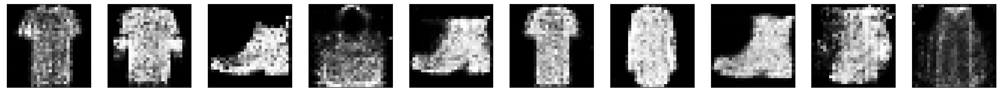

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 23ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:30,  1.11it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:21,  1.15it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  1%|█                                                                                 | 3/234 [00:02<03:17,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:24,  1.12it/s]

epoch:  86
8/8 [==============================] - 0s 20ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:23,  1.12it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  3%|██                                                                                | 6/234 [00:05<03:17,  1.15it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:13,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:10,  1.18it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:08,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:05,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  5%|███▊                                                                             | 11/234 [00:09<03:04,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:01,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:00,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  6%|████▊                                                                            | 14/234 [00:11<03:00,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:59,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:13<02:58,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  7%|█████▉                                                                           | 17/234 [00:14<02:58,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  8%|██████▏                                                                          | 18/234 [00:15<02:57,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:55,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:55,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  9%|███████▎                                                                         | 21/234 [00:17<02:53,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:18<02:50,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 10%|███████▉                                                                         | 23/234 [00:19<02:49,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:48,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:47,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:57,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 17ms/step


 12%|█████████▎                                                                       | 27/234 [00:22<02:46,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:23<02:38,  1.30it/s]

epoch:  86
8/8 [==============================] - 0s 18ms/step


 12%|██████████                                                                       | 29/234 [00:23<02:34,  1.33it/s]

epoch:  86
8/8 [==============================] - 0s 16ms/step


 13%|██████████▍                                                                      | 30/234 [00:24<02:34,  1.32it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:25<02:38,  1.28it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 14%|███████████                                                                      | 32/234 [00:26<02:40,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:27<02:42,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:27<02:40,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:40,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:39,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 16%|████████████▊                                                                    | 37/234 [00:30<02:38,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:31<02:37,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▌                                                                   | 39/234 [00:31<02:37,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▊                                                                   | 40/234 [00:32<02:38,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                                  | 41/234 [00:33<02:40,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:34<02:38,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:35<02:36,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 19%|███████████████▏                                                                 | 44/234 [00:35<02:35,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 19%|███████████████▌                                                                 | 45/234 [00:36<02:34,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 20%|███████████████▉                                                                 | 46/234 [00:37<02:33,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 20%|████████████████▎                                                                | 47/234 [00:38<02:32,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:39<02:30,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:40<02:30,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 21%|█████████████████▎                                                               | 50/234 [00:40<02:30,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:41<02:30,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:42<02:28,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▎                                                              | 53/234 [00:43<02:27,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:44<02:26,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████                                                              | 55/234 [00:44<02:26,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▍                                                             | 56/234 [00:45<02:25,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▋                                                             | 57/234 [00:46<02:24,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████                                                             | 58/234 [00:47<02:23,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 25%|████████████████████▍                                                            | 59/234 [00:48<02:22,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 26%|████████████████████▊                                                            | 60/234 [00:49<02:21,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 26%|█████████████████████                                                            | 61/234 [00:49<02:20,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:50<02:19,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:51<02:18,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:52<02:17,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:53<02:16,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:53<02:15,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:54<02:14,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:55<02:13,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:56<02:13,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:57<02:12,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:57<02:15,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:58<02:16,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:59<02:17,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:00<02:16,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:01<02:17,  1.16it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:02<02:17,  1.15it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:03<02:17,  1.15it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 33%|███████████████████████████                                                      | 78/234 [01:04<02:17,  1.13it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:05<02:16,  1.14it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:05<02:15,  1.14it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████                                                     | 81/234 [01:06<02:14,  1.14it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:07<02:13,  1.14it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:08<02:09,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:09<02:06,  1.18it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:10<02:03,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:10<02:02,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:11<02:00,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:12<01:59,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:13<01:58,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:14<01:57,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:14<01:56,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:15<01:54,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:16<01:52,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:17<01:51,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:18<01:51,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:18<01:51,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:19<01:50,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:20<01:49,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:21<01:48,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:22<01:48,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:22<01:47,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:23<01:47,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:24<01:46,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:25<01:46,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:26<01:45,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:27<01:44,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:27<01:45,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:28<01:43,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:29<01:42,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:30<01:41,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:31<01:39,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:32<01:39,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:32<01:38,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:33<01:37,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:34<01:37,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:35<01:36,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:36<01:36,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:36<01:34,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:37<01:34,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:38<01:33,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:39<01:32,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:40<01:31,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:41<01:30,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:41<01:31,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:42<01:30,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:43<01:29,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:44<01:29,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:45<01:28,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:46<01:27,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:46<01:25,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:47<01:24,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:48<01:23,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:49<01:22,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:50<01:21,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:50<01:20,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:51<01:19,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:52<01:18,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:53<01:18,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:54<01:17,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:55<01:17,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:55<01:16,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:56<01:14,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:57<01:14,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:58<01:13,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:59<01:13,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:59<01:12,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:00<01:12,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:01<01:11,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:02<01:10,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:03<01:09,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:04<01:09,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:04<01:07,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:05<01:06,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:06<01:06,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:07<01:07,  1.16it/s]

epoch:  86
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:08<01:07,  1.16it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:09<01:06,  1.15it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:10<01:04,  1.18it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:10<01:02,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:11<01:00,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:12<01:00,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:13<00:58,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:14<00:57,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:14<00:56,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:15<00:56,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:16<00:55,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:17<00:55,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:18<00:54,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:19<00:53,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:19<00:52,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:20<00:51,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:21<00:53,  1.17it/s]

epoch:  86
8/8 [==============================] - 0s 16ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:22<00:49,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:23<00:46,  1.29it/s]

epoch:  86
8/8 [==============================] - 0s 17ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:23<00:44,  1.33it/s]

epoch:  86
8/8 [==============================] - 0s 17ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:24<00:43,  1.32it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:25<00:44,  1.27it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:26<00:44,  1.27it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:26<00:43,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:27<00:43,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:28<00:42,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:29<00:41,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:30<00:40,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:30<00:40,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:31<00:39,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:32<00:38,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:33<00:37,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:34<00:36,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:34<00:35,  1.27it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:35<00:34,  1.27it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:36<00:34,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:37<00:33,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:38<00:32,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:38<00:31,  1.26it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:39<00:31,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:40<00:30,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:41<00:29,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:42<00:28,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:42<00:28,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:43<00:27,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:44<00:26,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:45<00:25,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 20ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:46<00:25,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:47<00:24,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:47<00:23,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:48<00:22,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:49<00:21,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:50<00:20,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:51<00:20,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:51<00:19,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:52<00:18,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:53<00:17,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:54<00:17,  1.23it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:55<00:16,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:55<00:15,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:56<00:14,  1.25it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:57<00:13,  1.24it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:58<00:13,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:59<00:12,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:00<00:11,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:00<00:10,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:01<00:10,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:02<00:09,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:03<00:08,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:04<00:07,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:05<00:06,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:05<00:05,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:06<00:04,  1.22it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:07<00:04,  1.21it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:08<00:03,  1.20it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:09<00:02,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 22ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:10<00:01,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:10<00:00,  1.19it/s]

epoch:  86
8/8 [==============================] - 0s 21ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:11<00:00,  1.22it/s]


epoch:  86


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 22ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:17,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:15,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  1%|█                                                                                 | 3/234 [00:02<03:12,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:11,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:10,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:05<03:10,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:08,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:07,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:10,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:08,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


  5%|███▊                                                                             | 11/234 [00:09<03:07,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:06,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:07,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  6%|████▊                                                                            | 14/234 [00:11<03:05,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:12<03:03,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  7%|█████▌                                                                           | 16/234 [00:13<03:01,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  7%|█████▉                                                                           | 17/234 [00:14<03:00,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


  8%|██████▏                                                                          | 18/234 [00:15<03:00,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  8%|██████▌                                                                          | 19/234 [00:15<02:59,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:58,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:17<03:01,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:18<03:00,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 10%|███████▉                                                                         | 23/234 [00:19<02:59,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 10%|████████▎                                                                        | 24/234 [00:20<03:01,  1.16it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 11%|████████▋                                                                        | 25/234 [00:21<02:58,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:56,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 12%|█████████▎                                                                       | 27/234 [00:22<02:54,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 12%|█████████▋                                                                       | 28/234 [00:23<02:53,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 12%|██████████                                                                       | 29/234 [00:24<02:52,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 13%|██████████▍                                                                      | 30/234 [00:25<02:51,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 13%|██████████▋                                                                      | 31/234 [00:26<02:50,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 14%|███████████                                                                      | 32/234 [00:26<02:49,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:27<02:48,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 15%|███████████▊                                                                     | 34/234 [00:28<02:47,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 15%|████████████                                                                     | 35/234 [00:29<02:47,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 15%|████████████▍                                                                    | 36/234 [00:30<02:45,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 16%|████████████▊                                                                    | 37/234 [00:31<02:44,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 16%|█████████████▏                                                                   | 38/234 [00:31<02:43,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▌                                                                   | 39/234 [00:32<02:42,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▊                                                                   | 40/234 [00:33<02:41,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▏                                                                  | 41/234 [00:34<02:39,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▌                                                                  | 42/234 [00:35<02:39,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▉                                                                  | 43/234 [00:36<02:38,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:36<02:36,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 19%|███████████████▌                                                                 | 45/234 [00:37<02:35,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 20%|███████████████▉                                                                 | 46/234 [00:38<02:34,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 20%|████████████████▎                                                                | 47/234 [00:39<02:33,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 21%|████████████████▌                                                                | 48/234 [00:40<02:35,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▉                                                                | 49/234 [00:41<02:40,  1.15it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 21%|█████████████████▎                                                               | 50/234 [00:42<02:43,  1.13it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:43<02:44,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 22%|██████████████████                                                               | 52/234 [00:43<02:45,  1.10it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▎                                                              | 53/234 [00:44<02:44,  1.10it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▋                                                              | 54/234 [00:45<02:42,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████                                                              | 55/234 [00:46<02:41,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▍                                                             | 56/234 [00:47<02:39,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▋                                                             | 57/234 [00:48<02:40,  1.10it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████                                                             | 58/234 [00:49<02:38,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████▍                                                            | 59/234 [00:50<02:37,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:51<02:32,  1.14it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:52<02:35,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:52<02:33,  1.12it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:53<02:29,  1.14it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:54<02:27,  1.16it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:55<02:24,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:56<02:22,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:57<02:21,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:57<02:19,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:58<02:18,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:59<02:16,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:00<02:15,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:01<02:14,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:02<02:13,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:02<02:13,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:03<02:13,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:04<02:11,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:05<02:12,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 33%|███████████████████████████                                                      | 78/234 [01:06<02:12,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:07<02:11,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:07<02:09,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████                                                     | 81/234 [01:08<02:08,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:09<02:14,  1.13it/s]

epoch:  87
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:10<02:06,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:11<02:01,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:11<01:56,  1.28it/s]

epoch:  87
8/8 [==============================] - 0s 17ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:12<01:58,  1.24it/s]

epoch:  87
8/8 [==============================] - 0s 24ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:13<02:02,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:14<02:03,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:15<02:02,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:16<02:00,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:17<02:00,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:17<01:59,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:18<01:58,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:19<01:57,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:20<01:56,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:21<01:55,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:22<01:54,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:22<01:53,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:23<01:52,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:24<01:51,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:25<01:50,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:26<01:48,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:27<01:47,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:27<01:46,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:28<01:46,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:29<01:45,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:30<01:43,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:31<01:43,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:32<01:42,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:32<01:41,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:33<01:40,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:34<01:39,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:35<01:39,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:36<01:38,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:36<01:38,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:37<01:37,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:38<01:37,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:39<01:35,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:40<01:34,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:41<01:33,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:41<01:33,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:42<01:32,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:43<01:31,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:44<01:30,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:45<01:30,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:46<01:28,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:46<01:28,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:47<01:27,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:48<01:26,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:49<01:26,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:50<01:25,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:51<01:25,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:51<01:24,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:52<01:23,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:53<01:24,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:54<01:22,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:55<01:21,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:56<01:20,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:56<01:19,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:57<01:18,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:58<01:17,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:59<01:16,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:00<01:15,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:01<01:14,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:01<01:13,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:02<01:14,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:03<01:13,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:04<01:12,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:05<01:11,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:06<01:10,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:06<01:09,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:07<01:08,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:08<01:07,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:09<01:06,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:10<01:06,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:11<01:04,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:11<01:04,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:12<01:03,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:13<01:02,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:14<01:01,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:15<01:00,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:16<00:59,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:16<00:58,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:17<00:57,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:18<00:56,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:19<00:56,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:20<00:55,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:21<00:57,  1.16it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:22<00:55,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:22<00:54,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:23<00:53,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:24<00:52,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:25<00:51,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:26<00:50,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:27<00:49,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:27<00:49,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:28<00:48,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:29<00:47,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:30<00:46,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:31<00:45,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:32<00:44,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:33<00:43,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:33<00:42,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:34<00:41,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:35<00:40,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:36<00:40,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:37<00:43,  1.08it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:38<00:41,  1.11it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:39<00:39,  1.14it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:39<00:37,  1.17it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:40<00:36,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:41<00:35,  1.19it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:42<00:34,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:43<00:33,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:44<00:32,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:44<00:31,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:45<00:30,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:46<00:29,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:47<00:28,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:48<00:27,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:48<00:27,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:49<00:26,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:50<00:25,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:51<00:24,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:52<00:23,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:53<00:22,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:53<00:22,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:54<00:21,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:55<00:20,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:56<00:19,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:57<00:18,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:58<00:18,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:58<00:17,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:59<00:16,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:00<00:15,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:01<00:14,  1.20it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:02<00:14,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:02<00:13,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:03<00:12,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:04<00:11,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:05<00:10,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:06<00:09,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 22ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:07<00:08,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:07<00:08,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:08<00:07,  1.23it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:09<00:06,  1.21it/s]

epoch:  87
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:10<00:05,  1.18it/s]

epoch:  87
8/8 [==============================] - 0s 16ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:11<00:04,  1.24it/s]

epoch:  87
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:11<00:03,  1.29it/s]

epoch:  87
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:12<00:03,  1.30it/s]

epoch:  87
8/8 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:13<00:02,  1.25it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:14<00:01,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 21ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:15<00:00,  1.22it/s]

epoch:  87
8/8 [==============================] - 0s 20ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:15<00:00,  1.19it/s]


epoch:  87


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:13,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:14,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  1%|█                                                                                 | 3/234 [00:02<03:11,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:07,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:06,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  3%|██                                                                                | 6/234 [00:04<03:06,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:04,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:07,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:11,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:13,  1.16it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


  5%|███▊                                                                             | 11/234 [00:09<03:12,  1.16it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:10,  1.16it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:08,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  6%|████▊                                                                            | 14/234 [00:11<03:07,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:12<03:05,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  7%|█████▌                                                                           | 16/234 [00:13<03:04,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:14<03:03,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  8%|██████▏                                                                          | 18/234 [00:15<03:02,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:15<03:01,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  9%|██████▉                                                                          | 20/234 [00:16<02:59,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


  9%|███████▎                                                                         | 21/234 [00:17<02:57,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


  9%|███████▌                                                                         | 22/234 [00:18<02:57,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:19<02:56,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 10%|████████▎                                                                        | 24/234 [00:20<02:55,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:54,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:54,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 12%|█████████▎                                                                       | 27/234 [00:22<02:53,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 12%|█████████▋                                                                       | 28/234 [00:23<02:52,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 12%|██████████                                                                       | 29/234 [00:24<02:51,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:25<02:51,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:26<02:50,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 14%|███████████                                                                      | 32/234 [00:26<02:49,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 14%|███████████▍                                                                     | 33/234 [00:27<02:48,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:28<02:47,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 15%|████████████                                                                     | 35/234 [00:29<02:46,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 15%|████████████▍                                                                    | 36/234 [00:30<02:46,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:31<02:45,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:31<02:45,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▌                                                                   | 39/234 [00:32<02:45,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▊                                                                   | 40/234 [00:33<02:44,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                                  | 41/234 [00:34<02:41,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:35<02:39,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▉                                                                  | 43/234 [00:36<02:36,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 19%|███████████████▏                                                                 | 44/234 [00:36<02:35,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:37<02:33,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 20%|███████████████▉                                                                 | 46/234 [00:38<02:32,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 20%|████████████████▎                                                                | 47/234 [00:39<02:34,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:40<02:34,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 21%|████████████████▉                                                                | 49/234 [00:40<02:33,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:41<02:32,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 22%|█████████████████▋                                                               | 51/234 [00:42<02:31,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 22%|██████████████████                                                               | 52/234 [00:43<02:31,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▎                                                              | 53/234 [00:44<02:31,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 23%|██████████████████▋                                                              | 54/234 [00:45<02:29,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:45<02:29,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▍                                                             | 56/234 [00:46<02:29,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████▋                                                             | 57/234 [00:47<02:27,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 25%|████████████████████                                                             | 58/234 [00:48<02:26,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 25%|████████████████████▍                                                            | 59/234 [00:49<02:25,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [00:50<02:24,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████                                                            | 61/234 [00:50<02:23,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:51<02:22,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:52<02:22,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:53<02:21,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:54<02:20,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:55<02:20,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:55<02:18,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:56<02:17,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:57<02:16,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:58<02:15,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:59<02:17,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:00<02:19,  1.16it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:01<02:19,  1.15it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:01<02:18,  1.15it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:02<02:18,  1.15it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:03<02:20,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:04<02:19,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 33%|███████████████████████████                                                      | 78/234 [01:05<02:18,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:06<02:18,  1.12it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:07<02:17,  1.12it/s]

epoch:  88
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████                                                     | 81/234 [01:08<02:17,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:09<02:18,  1.09it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:10<02:17,  1.10it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:11<02:15,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:11<02:14,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:12<02:10,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:13<02:10,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:14<02:11,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:15<02:11,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 27ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:16<02:10,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:17<02:04,  1.15it/s]

epoch:  88
8/8 [==============================] - 0s 30ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:18<02:09,  1.10it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:18<02:00,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:19<01:53,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:20<01:48,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:21<01:50,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:21<01:47,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:22<01:48,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:23<01:44,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:24<01:40,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:24<01:37,  1.36it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:25<01:36,  1.37it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:26<01:34,  1.39it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:26<01:33,  1.40it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:27<01:31,  1.40it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:28<01:31,  1.40it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:29<01:43,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:30<01:39,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:30<01:35,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:31<01:33,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:32<01:39,  1.24it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:33<01:46,  1.15it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:34<01:39,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:35<01:34,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:35<01:31,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:36<01:28,  1.34it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:37<01:26,  1.35it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:37<01:24,  1.37it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:38<01:23,  1.38it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:39<01:22,  1.38it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:40<01:26,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:40<01:26,  1.29it/s]

epoch:  88
8/8 [==============================] - 0s 31ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:41<01:33,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:42<01:36,  1.14it/s]

epoch:  88
8/8 [==============================] - 0s 36ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:43<01:38,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:44<01:31,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:45<01:25,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:45<01:22,  1.29it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:46<01:19,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:47<01:17,  1.34it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:48<01:15,  1.36it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:48<01:14,  1.37it/s]

epoch:  88
8/8 [==============================] - 0s 33ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:49<01:20,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:50<01:21,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:51<01:17,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:52<01:21,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:53<01:19,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:53<01:15,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 32ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:55<01:30,  1.06it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:55<01:22,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:56<01:19,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 43ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:57<01:30,  1.02it/s]

epoch:  88
8/8 [==============================] - 0s 42ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:59<01:44,  1.15s/it]

epoch:  88
8/8 [==============================] - 0s 41ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:00<01:47,  1.20s/it]

epoch:  88
8/8 [==============================] - 0s 30ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:01<01:41,  1.14s/it]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:02<01:29,  1.02s/it]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:03<01:22,  1.06it/s]

epoch:  88
8/8 [==============================] - 0s 32ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:04<01:21,  1.06it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:05<01:21,  1.04it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:06<01:18,  1.08it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:06<01:14,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:07<01:11,  1.14it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:08<01:09,  1.16it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:09<01:06,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:10<01:04,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:10<01:02,  1.24it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:11<01:00,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:12<00:58,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:13<00:57,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:13<00:57,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 29ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:15<01:07,  1.08it/s]

epoch:  88
8/8 [==============================] - 0s 25ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:16<01:05,  1.10it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:16<01:02,  1.13it/s]

epoch:  88
8/8 [==============================] - 0s 26ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:18<01:06,  1.06it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:18<01:03,  1.08it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:19<00:59,  1.14it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:20<00:55,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:21<00:53,  1.24it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:21<00:53,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 29ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:23<01:00,  1.06it/s]

epoch:  88
8/8 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:24<01:00,  1.05it/s]

epoch:  88
8/8 [==============================] - 0s 36ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:25<00:59,  1.04it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:25<00:54,  1.11it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:26<00:51,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:27<00:48,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 29ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:28<00:47,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:28<00:45,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:29<00:44,  1.26it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:30<00:43,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:31<00:42,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:32<00:40,  1.29it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:32<00:39,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:33<00:39,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:34<00:39,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:35<00:38,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:36<00:39,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 24ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:36<00:38,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:37<00:38,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:38<00:38,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:39<00:37,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:40<00:35,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:41<00:34,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:41<00:33,  1.22it/s]

epoch:  88
8/8 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:42<00:33,  1.20it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:43<00:31,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:44<00:30,  1.24it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:45<00:30,  1.23it/s]

epoch:  88
8/8 [==============================] - 0s 22ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:45<00:28,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 29ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:46<00:29,  1.18it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:47<00:28,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:48<00:26,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:49<00:25,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:49<00:24,  1.29it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:50<00:23,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:51<00:22,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:52<00:21,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:52<00:20,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:53<00:19,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:54<00:20,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:55<00:19,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:56<00:18,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:56<00:17,  1.27it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:57<00:16,  1.28it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:58<00:15,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:59<00:14,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:00<00:13,  1.30it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:00<00:12,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 17ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:01<00:12,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:02<00:11,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:03<00:10,  1.31it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:03<00:09,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:04<00:09,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:05<00:08,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:06<00:07,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:06<00:06,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:07<00:06,  1.33it/s]

epoch:  88
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:08<00:05,  1.32it/s]

epoch:  88
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:09<00:04,  1.25it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:10<00:04,  1.21it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:10<00:03,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:11<00:02,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 21ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:12<00:01,  1.19it/s]

epoch:  88
8/8 [==============================] - 0s 20ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:13<00:00,  1.17it/s]

epoch:  88
8/8 [==============================] - 0s 26ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:14<00:00,  1.20it/s]


epoch:  88


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 19ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:17,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:07,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<03:03,  1.26it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:03<02:58,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:55,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


  3%|██                                                                                | 6/234 [00:04<02:52,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:04,  1.23it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:06,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 29ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:09,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:08,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:08<03:07,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:09<03:02,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 27ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:06,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:11<03:01,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


  6%|█████▏                                                                           | 15/234 [00:12<02:57,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 24ms/step


  7%|█████▌                                                                           | 16/234 [00:13<03:00,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


  7%|█████▉                                                                           | 17/234 [00:14<03:09,  1.15it/s]

epoch:  89
8/8 [==============================] - 0s 22ms/step


  8%|██████▏                                                                          | 18/234 [00:14<03:07,  1.15it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


  8%|██████▌                                                                          | 19/234 [00:15<03:05,  1.16it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:16<03:05,  1.15it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


  9%|███████▎                                                                         | 21/234 [00:17<03:03,  1.16it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:18<02:57,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:19<02:58,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:19<02:56,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 28ms/step


 11%|████████▋                                                                        | 25/234 [00:20<02:56,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:21<02:58,  1.17it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:22<02:53,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:23<02:49,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:24<02:47,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 13%|██████████▍                                                                      | 30/234 [00:24<02:46,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:25<02:45,  1.23it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:26<02:40,  1.26it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


 14%|███████████▍                                                                     | 33/234 [00:27<02:40,  1.25it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:28<02:39,  1.25it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:28<02:39,  1.25it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


 15%|████████████▍                                                                    | 36/234 [00:29<02:41,  1.23it/s]

epoch:  89
8/8 [==============================] - 0s 24ms/step


 16%|████████████▊                                                                    | 37/234 [00:30<02:44,  1.20it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 16%|█████████████▏                                                                   | 38/234 [00:31<02:42,  1.20it/s]

epoch:  89
8/8 [==============================] - 0s 22ms/step


 17%|█████████████▌                                                                   | 39/234 [00:32<02:49,  1.15it/s]

epoch:  89
8/8 [==============================] - 0s 45ms/step


 17%|█████████████▊                                                                   | 40/234 [00:33<03:07,  1.03it/s]

epoch:  89
8/8 [==============================] - 0s 33ms/step


 18%|██████████████▏                                                                  | 41/234 [00:34<03:10,  1.01it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 18%|██████████████▌                                                                  | 42/234 [00:35<02:56,  1.09it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▉                                                                  | 43/234 [00:36<02:49,  1.13it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:36<02:43,  1.16it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▌                                                                 | 45/234 [00:37<02:38,  1.19it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:38<02:33,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:39<02:38,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 27ms/step


 21%|████████████████▌                                                                | 48/234 [00:40<02:57,  1.05it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▉                                                                | 49/234 [00:41<02:57,  1.04it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 21%|█████████████████▎                                                               | 50/234 [00:42<02:48,  1.09it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 22%|█████████████████▋                                                               | 51/234 [00:43<02:41,  1.13it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 22%|██████████████████                                                               | 52/234 [00:44<02:34,  1.18it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:44<02:30,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:45<02:27,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:46<02:24,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:47<02:20,  1.26it/s]

epoch:  89
8/8 [==============================] - 0s 30ms/step


 24%|███████████████████▋                                                             | 57/234 [00:48<02:41,  1.09it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████                                                             | 58/234 [00:49<02:43,  1.08it/s]

epoch:  89
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████▍                                                            | 59/234 [00:50<02:44,  1.06it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


 26%|████████████████████▊                                                            | 60/234 [00:51<02:43,  1.06it/s]

epoch:  89
8/8 [==============================] - 0s 24ms/step


 26%|█████████████████████                                                            | 61/234 [00:52<03:01,  1.05s/it]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:53<02:46,  1.03it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:54<02:34,  1.10it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:54<02:25,  1.17it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:55<02:20,  1.20it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:56<02:17,  1.22it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:57<02:14,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:57<02:10,  1.27it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:58<02:08,  1.28it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:59<02:06,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:00<02:04,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:00<02:02,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:01<02:02,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:02<02:01,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:03<02:01,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:03<02:00,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:04<01:59,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 33%|███████████████████████████                                                      | 78/234 [01:05<01:58,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:06<01:57,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:06<01:55,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 35%|████████████████████████████                                                     | 81/234 [01:07<01:54,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:08<01:52,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:09<01:50,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:09<01:49,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:10<01:48,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:11<01:47,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:11<01:46,  1.39it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:12<01:45,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:13<01:45,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:14<01:44,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:14<01:44,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:15<01:42,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:16<01:43,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:17<01:42,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:17<01:42,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:18<01:42,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:19<01:41,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:20<01:41,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:20<01:40,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:21<01:40,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:22<01:38,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:23<01:37,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:23<01:36,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:24<01:35,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:25<01:34,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:25<01:33,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:26<01:32,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:27<01:31,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:28<01:30,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:28<01:30,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:29<01:29,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:30<01:28,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:31<01:27,  1.39it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:31<01:26,  1.39it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:32<01:25,  1.39it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:33<01:26,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:33<01:26,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:34<01:26,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:35<01:25,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:36<01:25,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:37<01:25,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:37<01:24,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:38<01:24,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:39<01:23,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:40<01:22,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:40<01:21,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:41<01:19,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:42<01:18,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:43<01:17,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:43<01:17,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:44<01:16,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:45<01:15,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:45<01:15,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:46<01:14,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:47<01:13,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:48<01:12,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:12,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:49<01:11,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:50<01:10,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:51<01:09,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:09,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:08,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:53<01:09,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:54<01:07,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:54<01:06,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:04,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:56<01:03,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:57<01:03,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<01:02,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:58<01:01,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:59<01:00,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:00<01:00,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<00:59,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:01<00:58,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:02<00:57,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:02<00:57,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:03<00:56,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:04<00:55,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:05<00:54,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:05<00:53,  1.38it/s]

epoch:  89
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:06<00:56,  1.30it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:07<00:54,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:08<00:53,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:08<00:52,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:09<00:51,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:10<00:50,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:11<00:49,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:11<00:48,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:12<00:47,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:13<00:47,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:14<00:46,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:14<00:45,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:15<00:44,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:16<00:43,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:17<00:43,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:17<00:42,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:18<00:41,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:19<00:41,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:19<00:40,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:20<00:39,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:21<00:39,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:22<00:38,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:22<00:38,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:23<00:37,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:24<00:36,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:25<00:35,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:25<00:35,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:26<00:34,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:27<00:33,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:28<00:32,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:28<00:31,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:29<00:30,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:30<00:30,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:31<00:29,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:31<00:28,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:32<00:28,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:33<00:27,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:34<00:26,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:34<00:26,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:35<00:25,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:36<00:24,  1.34it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:37<00:24,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:37<00:23,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:38<00:22,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:39<00:21,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:40<00:22,  1.23it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:41<00:21,  1.26it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:41<00:20,  1.28it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:42<00:19,  1.30it/s]

epoch:  89
8/8 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:43<00:18,  1.28it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:44<00:17,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:44<00:17,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:45<00:16,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:46<00:15,  1.29it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:47<00:14,  1.30it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:48<00:13,  1.30it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:48<00:13,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 22ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:49<00:12,  1.24it/s]

epoch:  89
8/8 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:50<00:13,  1.12it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:51<00:11,  1.17it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:52<00:10,  1.21it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:53<00:09,  1.25it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:53<00:08,  1.28it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:54<00:07,  1.30it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:55<00:06,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:56<00:06,  1.31it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:56<00:05,  1.32it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:57<00:04,  1.33it/s]

epoch:  89
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:58<00:03,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:59<00:02,  1.35it/s]

epoch:  89
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:59<00:02,  1.36it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:00<00:01,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 18ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:01<00:00,  1.37it/s]

epoch:  89
8/8 [==============================] - 0s 20ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:01<00:00,  1.29it/s]


epoch:  89


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 18ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:52,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:49,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<02:49,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:47,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:47,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


  3%|██                                                                                | 6/234 [00:04<02:45,  1.38it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:45,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:05<02:44,  1.38it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:41,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:39,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


  5%|███▊                                                                             | 11/234 [00:07<02:39,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  5%|████▏                                                                            | 12/234 [00:08<02:40,  1.38it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:40,  1.38it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:39,  1.38it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  6%|█████▏                                                                           | 15/234 [00:10<02:38,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  7%|█████▌                                                                           | 16/234 [00:11<02:36,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:36,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:35,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  8%|██████▌                                                                          | 19/234 [00:13<02:33,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  9%|██████▉                                                                          | 20/234 [00:14<02:33,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:32,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


  9%|███████▌                                                                         | 22/234 [00:15<02:32,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 10%|███████▉                                                                         | 23/234 [00:16<02:31,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 10%|████████▎                                                                        | 24/234 [00:17<02:29,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:28,  1.41it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 11%|█████████                                                                        | 26/234 [00:18<02:28,  1.40it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:19<02:29,  1.39it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:20<02:29,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 12%|██████████                                                                       | 29/234 [00:20<02:30,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:21<02:29,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:22<02:28,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 14%|███████████                                                                      | 32/234 [00:23<02:27,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:23<02:27,  1.37it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:24<02:27,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:25<02:26,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 15%|████████████▍                                                                    | 36/234 [00:26<02:25,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:26<02:25,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:27<02:25,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:28<02:25,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▊                                                                   | 40/234 [00:29<02:24,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▏                                                                  | 41/234 [00:29<02:23,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▌                                                                  | 42/234 [00:30<02:22,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:31<02:21,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▏                                                                 | 44/234 [00:32<02:20,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:32<02:19,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:33<02:18,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 20%|████████████████▎                                                                | 47/234 [00:34<02:17,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 21%|████████████████▌                                                                | 48/234 [00:35<02:17,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▉                                                                | 49/234 [00:35<02:15,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 21%|█████████████████▎                                                               | 50/234 [00:36<02:15,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 22%|█████████████████▋                                                               | 51/234 [00:37<02:14,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 22%|██████████████████                                                               | 52/234 [00:37<02:14,  1.36it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:38<02:14,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:39<02:13,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:40<02:13,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▍                                                             | 56/234 [00:40<02:11,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 24%|███████████████████▋                                                             | 57/234 [00:41<02:11,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:42<02:11,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████▍                                                            | 59/234 [00:43<02:10,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:43<02:10,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:44<02:09,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:45<02:08,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:46<02:07,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:46<02:07,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:47<02:04,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:48<02:04,  1.35it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:49<02:04,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:49<02:03,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:50<02:03,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:51<02:02,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:52<02:02,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:52<02:01,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:53<02:00,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:54<01:59,  1.34it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:55<01:59,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:55<01:58,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:56<01:57,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 33%|███████████████████████████                                                      | 78/234 [00:57<01:57,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [00:58<01:56,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [00:58<01:55,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 35%|████████████████████████████                                                     | 81/234 [00:59<01:55,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:00<01:55,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:01<01:55,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:01<01:55,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 31ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:02<02:00,  1.23it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:03<01:57,  1.26it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:04<01:54,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:05<01:53,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:05<01:51,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:06<01:49,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:07<01:48,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:08<01:47,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:08<01:47,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:09<01:45,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:10<01:45,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:11<01:44,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:11<01:43,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:12<01:43,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:13<01:41,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:14<01:41,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:15<01:41,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:15<01:42,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:16<01:41,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:17<01:40,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:18<01:39,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:18<01:39,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:19<01:37,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:20<01:36,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:21<01:36,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:21<01:35,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:22<01:35,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:23<01:34,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:24<01:32,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:25<01:32,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:25<01:30,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:26<01:30,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:27<01:30,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:28<01:29,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:28<01:28,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:29<01:28,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:30<01:27,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:31<01:26,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:31<01:25,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:32<01:24,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:33<01:23,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:34<01:21,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:35<01:20,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:35<01:20,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:36<01:20,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:37<01:19,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:38<01:23,  1.23it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:39<01:22,  1.24it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:39<01:20,  1.26it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:40<01:18,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:41<01:17,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:42<01:15,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:42<01:14,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:43<01:13,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:44<01:12,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:45<01:11,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:45<01:10,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:46<01:09,  1.33it/s]

epoch:  90
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:47<01:13,  1.24it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:48<01:14,  1.21it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:49<01:14,  1.20it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:50<01:11,  1.22it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:50<01:09,  1.25it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:51<01:07,  1.27it/s]

epoch:  90
8/8 [==============================] - 0s 28ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:52<01:08,  1.23it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:53<01:06,  1.25it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:53<01:04,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [01:54<01:03,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [01:55<01:02,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [01:56<01:01,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [01:57<01:01,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [01:57<01:00,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [01:58<01:00,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [01:59<00:59,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:00<00:58,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:00<00:57,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:01<00:56,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:02<00:56,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:03<00:55,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:04<00:54,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:04<00:52,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:05<00:51,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:06<00:51,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:07<00:50,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:07<00:49,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:08<00:49,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:09<00:49,  1.27it/s]

epoch:  90
8/8 [==============================] - 0s 21ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:10<00:48,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 21ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:10<00:47,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:11<00:46,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:12<00:45,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:13<00:44,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:14<00:44,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:14<00:43,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:15<00:42,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:16<00:41,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:17<00:40,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:17<00:39,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:18<00:38,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:19<00:38,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:20<00:37,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:20<00:36,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:21<00:36,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:22<00:35,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:23<00:34,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:24<00:34,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:24<00:33,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:25<00:32,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:26<00:32,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:27<00:31,  1.27it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:28<00:30,  1.27it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:28<00:29,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:29<00:28,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:30<00:28,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:31<00:26,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:31<00:26,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:32<00:25,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:33<00:24,  1.29it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:34<00:23,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:34<00:23,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:35<00:22,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:36<00:21,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:37<00:20,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:37<00:19,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:38<00:18,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:39<00:18,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:40<00:17,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:41<00:16,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:41<00:16,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:42<00:15,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:43<00:14,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:44<00:13,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:44<00:13,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:45<00:12,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:46<00:11,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:47<00:10,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 17ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:47<00:09,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [02:48<00:09,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [02:49<00:08,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [02:50<00:07,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [02:50<00:06,  1.32it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [02:51<00:06,  1.31it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [02:52<00:05,  1.30it/s]

epoch:  90
8/8 [==============================] - 0s 18ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [02:53<00:04,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [02:54<00:03,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [02:54<00:03,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [02:55<00:02,  1.27it/s]

epoch:  90
8/8 [==============================] - 0s 20ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [02:56<00:01,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [02:57<00:00,  1.28it/s]

epoch:  90
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [02:57<00:00,  1.31it/s]

epoch:  90
1/1 [==============================] - 0s 37ms/step


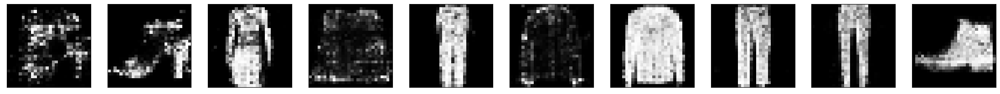

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 20ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:02,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:59,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<02:58,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:03<02:59,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:58,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 21ms/step


  3%|██                                                                                | 6/234 [00:04<02:58,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:57,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:55,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:53,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:52,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:53,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:52,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


  6%|████▌                                                                            | 13/234 [00:10<03:01,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  6%|████▊                                                                            | 14/234 [00:11<02:58,  1.23it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:56,  1.24it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:53,  1.25it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  7%|█████▉                                                                           | 17/234 [00:13<02:51,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  8%|██████▏                                                                          | 18/234 [00:14<02:48,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:47,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:46,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:16<02:43,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:17<02:40,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:39,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:39,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 17ms/step


 11%|████████▋                                                                        | 25/234 [00:19<02:38,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 11%|█████████                                                                        | 26/234 [00:20<02:37,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:36,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:36,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:22<02:35,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:23<02:35,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:34,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:34,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:25<02:34,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 15%|███████████▊                                                                     | 34/234 [00:26<02:35,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:27<02:34,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:33,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:33,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:29<02:31,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:30<02:31,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:30,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:28,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▌                                                                  | 42/234 [00:32<02:27,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:33<02:26,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:34<02:25,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:24,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:23,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:36<02:22,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:37<02:22,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:22,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:21,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:39<02:29,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:40<02:26,  1.24it/s]

epoch:  91
8/8 [==============================] - 0s 17ms/step


 23%|██████████████████▎                                                              | 53/234 [00:41<02:22,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 17ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:19,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:19,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████▍                                                             | 56/234 [00:43<02:19,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 24%|███████████████████▋                                                             | 57/234 [00:44<02:16,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:16,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:14,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:46<02:14,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:47<02:13,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:48<02:17,  1.25it/s]

epoch:  91
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:17,  1.24it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:49<02:21,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:50<02:17,  1.23it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:51<02:14,  1.25it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:52<02:12,  1.26it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:52<02:11,  1.26it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:53<02:11,  1.25it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:54<02:09,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:55<02:08,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:56<02:07,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:56<02:06,  1.27it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:57<02:05,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:58<02:03,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:59<02:01,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:59<01:59,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 33%|███████████████████████████                                                      | 78/234 [01:00<01:59,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:01<01:59,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:02<01:58,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████                                                     | 81/234 [01:03<01:57,  1.30it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:03<01:56,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:04<01:54,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:05<01:53,  1.33it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:06<01:53,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:06<01:52,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:07<01:51,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:08<01:51,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:09<01:50,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:09<01:49,  1.32it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:10<01:47,  1.33it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:11<01:50,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:12<01:49,  1.29it/s]

epoch:  91
8/8 [==============================] - 0s 20ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:12<01:49,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:13<01:53,  1.23it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:14<01:58,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:15<02:01,  1.13it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:16<02:01,  1.12it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:17<02:01,  1.11it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:18<02:01,  1.10it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:19<02:02,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:20<02:01,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:21<02:00,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:22<01:59,  1.09it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:23<01:58,  1.09it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:24<02:01,  1.06it/s]

epoch:  91
8/8 [==============================] - 0s 25ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:25<02:11,  1.04s/it]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:26<02:05,  1.01it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:27<02:00,  1.03it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:28<01:57,  1.06it/s]

epoch:  91
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:28<01:53,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:29<01:52,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:30<01:49,  1.10it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:31<01:46,  1.12it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:32<01:44,  1.14it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:33<01:44,  1.13it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:34<01:44,  1.12it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:35<01:42,  1.13it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:35<01:39,  1.16it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:36<01:37,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:37<01:35,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:38<01:34,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:39<01:34,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:40<01:32,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:40<01:31,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:41<01:30,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:42<01:29,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:43<01:28,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:44<01:27,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:45<01:26,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:45<01:25,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:46<01:24,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:47<01:24,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:48<01:23,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:49<01:23,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:50<01:23,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:51<01:21,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:51<01:20,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:52<01:20,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:53<01:18,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:54<01:17,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:55<01:16,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:56<01:15,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:56<01:14,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:57<01:13,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:58<01:13,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:59<01:12,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:00<01:11,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:00<01:10,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:01<01:09,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:02<01:09,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:03<01:08,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:04<01:07,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:05<01:06,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:05<01:05,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:06<01:04,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:07<01:03,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:08<01:02,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:09<01:02,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:10<01:01,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:10<01:00,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:11<00:59,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:12<00:58,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:13<00:57,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:14<00:57,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:15<00:56,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:15<00:55,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:16<00:54,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:17<00:53,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:18<00:52,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:19<00:51,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:20<00:50,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:20<00:49,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:21<00:49,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 21ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:22<00:48,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:23<00:47,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:24<00:46,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:24<00:45,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:25<00:45,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:26<00:44,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:27<00:43,  1.22it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:28<00:44,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:29<00:42,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:29<00:42,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:30<00:40,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:31<00:40,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:32<00:39,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:33<00:38,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:34<00:37,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:34<00:36,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:35<00:35,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:36<00:34,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:37<00:34,  1.20it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:38<00:34,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:39<00:32,  1.19it/s]

epoch:  91
8/8 [==============================] - 0s 17ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:39<00:30,  1.24it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:40<00:28,  1.28it/s]

epoch:  91
8/8 [==============================] - 0s 18ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:41<00:27,  1.31it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:42<00:28,  1.24it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:43<00:28,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:43<00:27,  1.21it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:44<00:27,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:45<00:26,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:46<00:25,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:47<00:24,  1.18it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:48<00:24,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:49<00:23,  1.17it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:49<00:22,  1.16it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:50<00:21,  1.16it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:51<00:20,  1.16it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:52<00:19,  1.15it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:53<00:19,  1.13it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:54<00:18,  1.14it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:55<00:17,  1.12it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:56<00:16,  1.12it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:57<00:16,  1.10it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:58<00:15,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:59<00:15,  1.07it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:00<00:14,  1.06it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:01<00:13,  1.05it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:01<00:12,  1.05it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:02<00:11,  1.05it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:03<00:10,  1.05it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:04<00:09,  1.05it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:05<00:08,  1.06it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:06<00:07,  1.06it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:07<00:06,  1.07it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:08<00:05,  1.07it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:09<00:04,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:10<00:03,  1.09it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:11<00:02,  1.09it/s]

epoch:  91
8/8 [==============================] - 0s 22ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:12<00:01,  1.09it/s]

epoch:  91
8/8 [==============================] - 0s 24ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:13<00:00,  1.08it/s]

epoch:  91
8/8 [==============================] - 0s 23ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:14<00:00,  1.21it/s]


epoch:  91


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 24ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:33,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:29,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


  1%|█                                                                                 | 3/234 [00:02<03:28,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 24ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:31,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:29,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:05<03:27,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:28,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:27,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:24,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  4%|███▍                                                                             | 10/234 [00:09<03:25,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  5%|███▊                                                                             | 11/234 [00:10<03:22,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:20,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  6%|████▌                                                                            | 13/234 [00:11<03:19,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


  6%|████▊                                                                            | 14/234 [00:12<03:11,  1.15it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


  6%|█████▏                                                                           | 15/234 [00:13<03:09,  1.16it/s]

epoch:  92
8/8 [==============================] - 0s 25ms/step


  7%|█████▌                                                                           | 16/234 [00:14<03:11,  1.14it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


  7%|█████▉                                                                           | 17/234 [00:15<03:40,  1.01s/it]

epoch:  92
8/8 [==============================] - 0s 22ms/step


  8%|██████▏                                                                          | 18/234 [00:16<03:34,  1.00it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


  8%|██████▌                                                                          | 19/234 [00:17<03:26,  1.04it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:18<03:14,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:19<03:17,  1.08it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:20<03:08,  1.13it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 10%|███████▉                                                                         | 23/234 [00:20<02:59,  1.18it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 10%|████████▎                                                                        | 24/234 [00:21<02:55,  1.20it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 11%|████████▋                                                                        | 25/234 [00:22<02:52,  1.21it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 11%|█████████                                                                        | 26/234 [00:23<02:48,  1.23it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:24<02:46,  1.24it/s]

epoch:  92
8/8 [==============================] - 0s 17ms/step


 12%|█████████▋                                                                       | 28/234 [00:24<02:42,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 12%|██████████                                                                       | 29/234 [00:25<02:39,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 13%|██████████▍                                                                      | 30/234 [00:26<02:37,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:27<02:36,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 14%|███████████                                                                      | 32/234 [00:27<02:33,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 14%|███████████▍                                                                     | 33/234 [00:28<02:32,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:29<02:30,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:30<02:30,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 29ms/step


 15%|████████████▍                                                                    | 36/234 [00:30<02:40,  1.24it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 16%|████████████▊                                                                    | 37/234 [00:31<02:39,  1.23it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:32<02:40,  1.22it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:33<02:41,  1.21it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 17%|█████████████▊                                                                   | 40/234 [00:34<02:43,  1.19it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▏                                                                  | 41/234 [00:35<02:37,  1.23it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▌                                                                  | 42/234 [00:35<02:32,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:36<02:29,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▏                                                                 | 44/234 [00:37<02:27,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▌                                                                 | 45/234 [00:38<02:24,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:38<02:23,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 20%|████████████████▎                                                                | 47/234 [00:39<02:23,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:40<02:24,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 21%|████████████████▉                                                                | 49/234 [00:41<02:24,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 21%|█████████████████▎                                                               | 50/234 [00:41<02:22,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:42<02:19,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:43<02:17,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:44<02:17,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:44<02:15,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 24%|███████████████████                                                              | 55/234 [00:45<02:15,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████▍                                                             | 56/234 [00:46<02:16,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:47<02:14,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:48<02:11,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████▍                                                            | 59/234 [00:48<02:11,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:49<02:10,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [00:50<02:10,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:51<02:08,  1.34it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:51<02:08,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:52<02:07,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:53<02:06,  1.34it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:54<02:06,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:54<02:05,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:55<02:04,  1.34it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:56<02:03,  1.34it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:56<02:02,  1.34it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:57<02:02,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:58<02:01,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:59<02:01,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:00<02:01,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:00<02:00,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:01<01:59,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:02<01:59,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 33%|███████████████████████████                                                      | 78/234 [01:03<01:58,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:03<01:56,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:04<01:56,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 35%|████████████████████████████                                                     | 81/234 [01:05<01:55,  1.33it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:06<01:54,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:06<01:54,  1.32it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:07<01:54,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:08<01:59,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:09<01:57,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:10<01:57,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:10<01:56,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:11<01:55,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:12<01:52,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:13<01:51,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:13<01:50,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:14<01:48,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 17ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:15<01:48,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:16<01:46,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:17<01:46,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:17<01:45,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:18<01:44,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:19<01:43,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:20<02:01,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 44ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:21<02:14,  1.01s/it]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:22<02:04,  1.06it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:23<01:57,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:24<01:51,  1.17it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:24<01:46,  1.21it/s]

epoch:  92
8/8 [==============================] - 0s 36ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:25<01:51,  1.15it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:26<01:45,  1.20it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:27<01:42,  1.22it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:28<01:40,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:29<01:40,  1.24it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:29<01:38,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:30<01:36,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:31<01:35,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:32<01:33,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:32<01:32,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:33<01:31,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:34<01:36,  1.22it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:35<01:38,  1.18it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:36<01:35,  1.20it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:37<01:33,  1.22it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:37<01:31,  1.23it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:38<01:30,  1.24it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:39<01:28,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:40<01:27,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:40<01:25,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:41<01:24,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:42<01:24,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:43<01:23,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:44<01:22,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:44<01:21,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:45<01:20,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:46<01:20,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:47<01:19,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:48<01:18,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:48<01:17,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:49<01:16,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:50<01:15,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:51<01:15,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:51<01:14,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:52<01:14,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:53<01:13,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:54<01:12,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:55<01:11,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:55<01:10,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:56<01:09,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:57<01:08,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:58<01:08,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:59<01:06,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:59<01:06,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:00<01:05,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:01<01:04,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:02<01:04,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:02<01:03,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:03<01:03,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:04<01:02,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:05<01:02,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:06<01:01,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:06<01:00,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:07<00:59,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:08<00:59,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:09<00:58,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:10<00:57,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:10<00:56,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:11<00:55,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:12<00:54,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:13<00:53,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 17ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:13<00:51,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:14<00:50,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:15<00:50,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:16<00:49,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:17<00:48,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:17<00:47,  1.30it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:18<00:46,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:19<00:45,  1.31it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:20<00:46,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 45ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:21<00:51,  1.13it/s]

epoch:  92
8/8 [==============================] - 0s 41ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:22<00:56,  1.01it/s]

epoch:  92
8/8 [==============================] - 0s 39ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:23<01:02,  1.12s/it]

epoch:  92
8/8 [==============================] - 0s 25ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:24<00:57,  1.04s/it]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:25<00:52,  1.03it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:26<00:48,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:27<00:45,  1.15it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:27<00:42,  1.19it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:28<00:40,  1.22it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:29<00:39,  1.25it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:30<00:37,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:31<00:36,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:31<00:36,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:32<00:35,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:33<00:34,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:34<00:33,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:34<00:32,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:35<00:31,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:36<00:31,  1.29it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:37<00:30,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:38<00:29,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:38<00:28,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:39<00:28,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:40<00:27,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 18ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:41<00:26,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:41<00:26,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:42<00:25,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:43<00:24,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:44<00:23,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:45<00:22,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:45<00:22,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:46<00:21,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:47<00:20,  1.26it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:48<00:19,  1.27it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:49<00:18,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:49<00:18,  1.28it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:50<00:18,  1.18it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:51<00:19,  1.10it/s]

epoch:  92
8/8 [==============================] - 0s 42ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:53<00:19,  1.01it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:53<00:17,  1.06it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:54<00:16,  1.11it/s]

epoch:  92
8/8 [==============================] - 0s 21ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:55<00:14,  1.14it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:56<00:15,  1.05it/s]

epoch:  92
8/8 [==============================] - 0s 22ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:57<00:13,  1.09it/s]

epoch:  92
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:58<00:12,  1.12it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:59<00:13,  1.02s/it]

epoch:  92
8/8 [==============================] - 0s 32ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:00<00:12,  1.06s/it]

epoch:  92
8/8 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:01<00:10,  1.01it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:02<00:09,  1.07it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:03<00:08,  1.12it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:04<00:06,  1.16it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:04<00:05,  1.19it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:05<00:04,  1.21it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:06<00:04,  1.23it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:07<00:03,  1.24it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:08<00:02,  1.21it/s]

epoch:  92
8/8 [==============================] - 0s 23ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:08<00:01,  1.20it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:10<00:00,  1.06it/s]

epoch:  92
8/8 [==============================] - 0s 19ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:10<00:00,  1.23it/s]


epoch:  92


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:13,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:14,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<03:21,  1.15it/s]

epoch:  93
8/8 [==============================] - 0s 26ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:41,  1.04it/s]

epoch:  93
8/8 [==============================] - 0s 27ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:42,  1.03it/s]

epoch:  93
8/8 [==============================] - 0s 33ms/step


  3%|██                                                                                | 6/234 [00:05<03:50,  1.01s/it]

epoch:  93
8/8 [==============================] - 0s 31ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:53,  1.03s/it]

epoch:  93
8/8 [==============================] - 0s 32ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:55,  1.04s/it]

epoch:  93
8/8 [==============================] - 0s 28ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:52,  1.03s/it]

epoch:  93
8/8 [==============================] - 0s 30ms/step


  4%|███▍                                                                             | 10/234 [00:09<03:52,  1.04s/it]

epoch:  93
8/8 [==============================] - 0s 27ms/step


  5%|███▊                                                                             | 11/234 [00:10<03:50,  1.03s/it]

epoch:  93
8/8 [==============================] - 0s 28ms/step


  5%|████▏                                                                            | 12/234 [00:11<03:46,  1.02s/it]

epoch:  93
8/8 [==============================] - 0s 28ms/step


  6%|████▌                                                                            | 13/234 [00:12<03:45,  1.02s/it]

epoch:  93
8/8 [==============================] - 0s 22ms/step


  6%|████▊                                                                            | 14/234 [00:13<03:29,  1.05it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


  6%|█████▏                                                                           | 15/234 [00:14<03:32,  1.03it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


  7%|█████▌                                                                           | 16/234 [00:15<03:18,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


  7%|█████▉                                                                           | 17/234 [00:16<03:07,  1.16it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


  8%|██████▏                                                                          | 18/234 [00:17<02:59,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 17ms/step


  8%|██████▌                                                                          | 19/234 [00:17<02:57,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


  9%|██████▉                                                                          | 20/234 [00:18<02:51,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:19<02:47,  1.27it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:20<02:46,  1.27it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:20<02:43,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:21<02:41,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 11%|████████▋                                                                        | 25/234 [00:22<02:39,  1.31it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 11%|█████████                                                                        | 26/234 [00:23<02:46,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 12%|█████████▎                                                                       | 27/234 [00:24<02:47,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 36ms/step


 12%|█████████▋                                                                       | 28/234 [00:25<02:53,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 12%|██████████                                                                       | 29/234 [00:25<02:56,  1.16it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:26<02:51,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:27<02:45,  1.22it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 14%|███████████                                                                      | 32/234 [00:28<02:41,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 14%|███████████▍                                                                     | 33/234 [00:29<02:41,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 15%|███████████▊                                                                     | 34/234 [00:29<02:38,  1.26it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 15%|████████████                                                                     | 35/234 [00:30<02:35,  1.28it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 15%|████████████▍                                                                    | 36/234 [00:31<02:33,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 16%|████████████▊                                                                    | 37/234 [00:32<02:33,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:32<02:32,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:33<02:30,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▊                                                                   | 40/234 [00:34<02:30,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 18%|██████████████▏                                                                  | 41/234 [00:35<02:28,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:36<02:42,  1.18it/s]

epoch:  93
8/8 [==============================] - 0s 35ms/step


 18%|██████████████▉                                                                  | 43/234 [00:37<02:51,  1.12it/s]

epoch:  93
8/8 [==============================] - 0s 38ms/step


 19%|███████████████▏                                                                 | 44/234 [00:38<02:58,  1.06it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▌                                                                 | 45/234 [00:39<02:47,  1.13it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:39<02:38,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 20%|████████████████▎                                                                | 47/234 [00:40<02:31,  1.23it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:41<02:27,  1.26it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▉                                                                | 49/234 [00:42<02:24,  1.28it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 21%|█████████████████▎                                                               | 50/234 [00:42<02:21,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 22%|█████████████████▋                                                               | 51/234 [00:43<02:18,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 22%|██████████████████                                                               | 52/234 [00:44<02:17,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▎                                                              | 53/234 [00:45<02:16,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▋                                                              | 54/234 [00:45<02:16,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████                                                              | 55/234 [00:46<02:14,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:47<02:12,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:48<02:11,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 25%|████████████████████                                                             | 58/234 [00:48<02:10,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████▍                                                            | 59/234 [00:49<02:08,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 26%|████████████████████▊                                                            | 60/234 [00:50<02:07,  1.37it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:50<02:05,  1.37it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:51<02:05,  1.37it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:52<02:07,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:53<02:11,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:54<02:12,  1.28it/s]

epoch:  93
8/8 [==============================] - 0s 33ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:55<02:21,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 37ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:56<02:34,  1.08it/s]

epoch:  93
8/8 [==============================] - 0s 25ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:57<02:34,  1.07it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:58<02:44,  1.00it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:59<02:42,  1.01it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:59<02:28,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:00<02:19,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:01<02:12,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:02<02:09,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:03<02:07,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:03<02:09,  1.22it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:04<02:05,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 33%|███████████████████████████                                                      | 78/234 [01:05<02:04,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 25ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:06<02:08,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:07<02:06,  1.22it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████                                                     | 81/234 [01:07<02:06,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:08<02:07,  1.19it/s]

epoch:  93
8/8 [==============================] - 0s 27ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:09<02:15,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 25ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:10<02:16,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:11<02:15,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:12<02:13,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:13<02:12,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:14<02:11,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:15<02:11,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:16<02:10,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:17<02:09,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:18<02:07,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:18<02:07,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:19<02:06,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:20<02:08,  1.08it/s]

epoch:  93
8/8 [==============================] - 0s 27ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:21<02:07,  1.08it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:22<01:59,  1.14it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:23<01:53,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:23<01:49,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:24<01:51,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:25<01:47,  1.24it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:26<01:43,  1.27it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:27<01:41,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:27<01:39,  1.31it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:28<01:37,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:29<01:36,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:30<01:34,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:30<01:33,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:31<01:32,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:32<01:31,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:32<01:30,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:33<01:30,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:34<01:29,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:35<01:28,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:35<01:27,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:36<01:26,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:37<01:25,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:38<01:25,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:38<01:24,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:39<01:23,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:40<01:22,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:41<01:22,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:41<01:21,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:42<01:20,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:43<01:20,  1.36it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:44<01:20,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:44<01:19,  1.35it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:45<01:19,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 30ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:46<01:29,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:47<01:28,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:48<01:24,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:48<01:21,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:49<01:19,  1.27it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:50<01:17,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:51<01:20,  1.23it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:52<01:21,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:53<01:24,  1.15it/s]

epoch:  93
8/8 [==============================] - 0s 36ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:54<01:25,  1.12it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:54<01:20,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:55<01:17,  1.22it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:56<01:14,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:57<01:12,  1.28it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:57<01:10,  1.29it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:58<01:09,  1.30it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:59<01:07,  1.31it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:00<01:07,  1.31it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:00<01:05,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 18ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:01<01:05,  1.32it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:02<01:03,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:03<01:02,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:03<01:01,  1.34it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:04<01:01,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:05<01:00,  1.33it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:06<01:06,  1.21it/s]

epoch:  93
8/8 [==============================] - 0s 27ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:07<01:10,  1.12it/s]

epoch:  93
8/8 [==============================] - 0s 31ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:08<01:11,  1.09it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:09<01:08,  1.13it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:10<01:06,  1.15it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:10<01:03,  1.18it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:11<01:02,  1.18it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:12<01:02,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 39ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:13<01:08,  1.06it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:14<01:10,  1.00it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:15<01:06,  1.06it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:16<01:02,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:17<01:01,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 34ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:18<01:07,  1.01s/it]

epoch:  93
8/8 [==============================] - 0s 38ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:19<01:05,  1.01it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:20<01:05,  1.00s/it]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:21<01:07,  1.05s/it]

epoch:  93
8/8 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:22<01:06,  1.05s/it]

epoch:  93
8/8 [==============================] - 0s 51ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:24<01:09,  1.13s/it]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:25<01:09,  1.13s/it]

epoch:  93
8/8 [==============================] - 0s 50ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:26<01:09,  1.15s/it]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:27<01:03,  1.07s/it]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:28<00:57,  1.00it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:29<00:53,  1.07it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:30<00:53,  1.05it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:30<00:50,  1.08it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:31<00:47,  1.14it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:32<00:45,  1.17it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:33<00:43,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:34<00:44,  1.14it/s]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:35<00:44,  1.14it/s]

epoch:  93
8/8 [==============================] - 0s 29ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:36<00:49,  1.00s/it]

epoch:  93
8/8 [==============================] - 0s 33ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:37<00:46,  1.02it/s]

epoch:  93
8/8 [==============================] - 0s 26ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:38<00:44,  1.05it/s]

epoch:  93
8/8 [==============================] - 0s 26ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:39<00:45,  1.02it/s]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:40<00:45,  1.02s/it]

epoch:  93
8/8 [==============================] - 0s 38ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:41<00:45,  1.04s/it]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:42<00:46,  1.08s/it]

epoch:  93
8/8 [==============================] - 0s 35ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:43<00:43,  1.04s/it]

epoch:  93
8/8 [==============================] - 0s 30ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:44<00:42,  1.03s/it]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:45<00:38,  1.03it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:46<00:35,  1.10it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:46<00:32,  1.16it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:47<00:30,  1.20it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:48<00:29,  1.23it/s]

epoch:  93
8/8 [==============================] - 0s 19ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:49<00:27,  1.25it/s]

epoch:  93
8/8 [==============================] - 0s 33ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:51<00:39,  1.18s/it]

epoch:  93
8/8 [==============================] - 0s 34ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:52<00:39,  1.20s/it]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:53<00:37,  1.17s/it]

epoch:  93
8/8 [==============================] - 0s 37ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:54<00:36,  1.16s/it]

epoch:  93
8/8 [==============================] - 0s 36ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:55<00:34,  1.16s/it]

epoch:  93
8/8 [==============================] - 0s 34ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:57<00:32,  1.13s/it]

epoch:  93
8/8 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:58<00:31,  1.14s/it]

epoch:  93
8/8 [==============================] - 0s 29ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:59<00:29,  1.09s/it]

epoch:  93
8/8 [==============================] - 0s 22ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:00<00:27,  1.07s/it]

epoch:  93
8/8 [==============================] - 0s 27ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:01<00:26,  1.05s/it]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:01<00:23,  1.02it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:02<00:21,  1.07it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:03<00:19,  1.11it/s]

epoch:  93
8/8 [==============================] - 0s 25ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:04<00:18,  1.13it/s]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:05<00:17,  1.16it/s]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:06<00:16,  1.16it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:07<00:16,  1.12it/s]

epoch:  93
8/8 [==============================] - 0s 30ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:08<00:16,  1.04it/s]

epoch:  93
8/8 [==============================] - 0s 38ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:09<00:16,  1.01s/it]

epoch:  93
8/8 [==============================] - 0s 37ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:10<00:15,  1.02s/it]

epoch:  93
8/8 [==============================] - 0s 39ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:11<00:14,  1.05s/it]

epoch:  93
8/8 [==============================] - 0s 32ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:12<00:14,  1.12s/it]

epoch:  93
8/8 [==============================] - 0s 20ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:13<00:13,  1.13s/it]

epoch:  93
8/8 [==============================] - 0s 41ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:15<00:12,  1.14s/it]

epoch:  93
8/8 [==============================] - 0s 31ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:16<00:11,  1.19s/it]

epoch:  93
8/8 [==============================] - 0s 21ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:17<00:10,  1.16s/it]

epoch:  93
8/8 [==============================] - 0s 32ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:18<00:09,  1.16s/it]

epoch:  93
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:19<00:08,  1.15s/it]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:21<00:07,  1.17s/it]

epoch:  93
8/8 [==============================] - 0s 42ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:22<00:05,  1.15s/it]

epoch:  93
8/8 [==============================] - 0s 39ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:23<00:04,  1.12s/it]

epoch:  93
8/8 [==============================] - 0s 28ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:24<00:03,  1.10s/it]

epoch:  93
8/8 [==============================] - 0s 23ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:25<00:02,  1.04s/it]

epoch:  93
8/8 [==============================] - 0s 23ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:26<00:00,  1.01it/s]

epoch:  93
8/8 [==============================] - 0s 20ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:26<00:00,  1.13it/s]


epoch:  93


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 21ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:16,  1.19it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


  1%|▋                                                                                 | 2/234 [00:02<04:00,  1.04s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


  1%|█                                                                                 | 3/234 [00:03<04:13,  1.10s/it]

epoch:  94
8/8 [==============================] - 0s 40ms/step


  2%|█▍                                                                                | 4/234 [00:04<04:32,  1.19s/it]

epoch:  94
8/8 [==============================] - 0s 25ms/step


  2%|█▊                                                                                | 5/234 [00:05<04:22,  1.15s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


  3%|██                                                                                | 6/234 [00:06<03:54,  1.03s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


  3%|██▍                                                                               | 7/234 [00:07<03:39,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 27ms/step


  3%|██▊                                                                               | 8/234 [00:08<03:54,  1.04s/it]

epoch:  94
8/8 [==============================] - 0s 36ms/step


  4%|███▏                                                                              | 9/234 [00:09<04:03,  1.08s/it]

epoch:  94
8/8 [==============================] - 0s 29ms/step


  4%|███▍                                                                             | 10/234 [00:10<04:21,  1.17s/it]

epoch:  94
8/8 [==============================] - 0s 47ms/step


  5%|███▊                                                                             | 11/234 [00:12<05:03,  1.36s/it]

epoch:  94
8/8 [==============================] - 0s 46ms/step


  5%|████▏                                                                            | 12/234 [00:14<05:35,  1.51s/it]

epoch:  94
8/8 [==============================] - 0s 43ms/step


  6%|████▌                                                                            | 13/234 [00:15<05:20,  1.45s/it]

epoch:  94
8/8 [==============================] - 0s 33ms/step


  6%|████▊                                                                            | 14/234 [00:17<05:07,  1.40s/it]

epoch:  94
8/8 [==============================] - 0s 33ms/step


  6%|█████▏                                                                           | 15/234 [00:18<04:54,  1.34s/it]

epoch:  94
8/8 [==============================] - 0s 33ms/step


  7%|█████▌                                                                           | 16/234 [00:19<04:47,  1.32s/it]

epoch:  94
8/8 [==============================] - 0s 31ms/step


  7%|█████▉                                                                           | 17/234 [00:20<04:42,  1.30s/it]

epoch:  94
8/8 [==============================] - 0s 38ms/step


  8%|██████▏                                                                          | 18/234 [00:22<04:42,  1.31s/it]

epoch:  94
8/8 [==============================] - 0s 43ms/step


  8%|██████▌                                                                          | 19/234 [00:23<04:48,  1.34s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


  9%|██████▉                                                                          | 20/234 [00:24<04:14,  1.19s/it]

epoch:  94
8/8 [==============================] - 0s 22ms/step


  9%|███████▎                                                                         | 21/234 [00:25<03:50,  1.08s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:26<03:35,  1.02s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 10%|███████▉                                                                         | 23/234 [00:27<03:47,  1.08s/it]

epoch:  94
8/8 [==============================] - 0s 37ms/step


 10%|████████▎                                                                        | 24/234 [00:28<03:45,  1.07s/it]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 11%|████████▋                                                                        | 25/234 [00:29<03:32,  1.02s/it]

epoch:  94
8/8 [==============================] - 0s 33ms/step


 11%|█████████                                                                        | 26/234 [00:30<03:38,  1.05s/it]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:31<03:39,  1.06s/it]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 12%|█████████▋                                                                       | 28/234 [00:32<03:44,  1.09s/it]

epoch:  94
8/8 [==============================] - 0s 36ms/step


 12%|██████████                                                                       | 29/234 [00:33<03:44,  1.09s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:34<03:36,  1.06s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 13%|██████████▋                                                                      | 31/234 [00:35<03:27,  1.02s/it]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 14%|███████████                                                                      | 32/234 [00:36<03:16,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:37<03:07,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:38<03:07,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 15%|████████████                                                                     | 35/234 [00:39<03:00,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 15%|████████████▍                                                                    | 36/234 [00:40<02:56,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 16%|████████████▊                                                                    | 37/234 [00:40<02:53,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 16%|█████████████▏                                                                   | 38/234 [00:41<02:48,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▌                                                                   | 39/234 [00:42<03:04,  1.06it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▊                                                                   | 40/234 [00:44<03:12,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 37ms/step


 18%|██████████████▏                                                                  | 41/234 [00:45<03:40,  1.14s/it]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 18%|██████████████▌                                                                  | 42/234 [00:46<03:23,  1.06s/it]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▉                                                                  | 43/234 [00:47<03:08,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 28ms/step


 19%|███████████████▏                                                                 | 44/234 [00:48<03:22,  1.07s/it]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 19%|███████████████▌                                                                 | 45/234 [00:49<03:20,  1.06s/it]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 20%|███████████████▉                                                                 | 46/234 [00:50<03:14,  1.03s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 20%|████████████████▎                                                                | 47/234 [00:51<03:08,  1.01s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 21%|████████████████▌                                                                | 48/234 [00:52<02:59,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 27ms/step


 21%|████████████████▉                                                                | 49/234 [00:53<02:55,  1.05it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:54<02:46,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:54<02:41,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 22%|██████████████████                                                               | 52/234 [00:55<02:39,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 23%|██████████████████▎                                                              | 53/234 [00:56<02:43,  1.11it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▋                                                              | 54/234 [00:57<02:42,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:58<02:36,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 37ms/step


 24%|███████████████████▍                                                             | 56/234 [00:59<02:56,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [01:00<02:46,  1.06it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 25%|████████████████████                                                             | 58/234 [01:01<02:54,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 30ms/step


 25%|████████████████████▍                                                            | 59/234 [01:02<03:07,  1.07s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 26%|████████████████████▊                                                            | 60/234 [01:03<03:02,  1.05s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████                                                            | 61/234 [01:04<03:00,  1.04s/it]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 26%|█████████████████████▍                                                           | 62/234 [01:05<02:46,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 27%|█████████████████████▊                                                           | 63/234 [01:06<02:37,  1.09it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 27%|██████████████████████▏                                                          | 64/234 [01:07<02:31,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 28%|██████████████████████▌                                                          | 65/234 [01:08<02:27,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 28%|██████████████████████▊                                                          | 66/234 [01:09<02:30,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 29%|███████████████████████▏                                                         | 67/234 [01:10<02:32,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▌                                                         | 68/234 [01:10<02:33,  1.08it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:11<02:34,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:12<02:35,  1.05it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:13<02:36,  1.04it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:14<02:35,  1.04it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:15<02:35,  1.04it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:16<02:33,  1.04it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:17<02:33,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:18<02:33,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 27ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:19<02:33,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 33%|███████████████████████████                                                      | 78/234 [01:20<02:33,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:21<02:33,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:22<02:34,  1.00s/it]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████                                                     | 81/234 [01:23<02:40,  1.05s/it]

epoch:  94
8/8 [==============================] - 0s 27ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:24<02:40,  1.06s/it]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:25<02:34,  1.02s/it]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:26<02:30,  1.00s/it]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:27<02:27,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 27ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:28<02:24,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:29<02:28,  1.01s/it]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:30<02:26,  1.00s/it]

epoch:  94
8/8 [==============================] - 0s 26ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:31<02:25,  1.00s/it]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:32<02:22,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:33<02:21,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:34<02:19,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:35<02:18,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:36<02:15,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:37<02:12,  1.05it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:38<02:08,  1.08it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:39<02:04,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:40<02:01,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:41<01:59,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:41<01:59,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:42<01:57,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:43<01:57,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:44<01:56,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:45<01:55,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:46<01:54,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:47<01:53,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:48<01:52,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:49<01:51,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:49<01:49,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:50<01:49,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:51<01:47,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:52<01:46,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:53<01:47,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:54<01:45,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:55<01:45,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:56<01:44,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:57<01:42,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:57<01:41,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:58<01:40,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:59<01:40,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [02:00<01:39,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [02:01<01:37,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [02:02<01:36,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [02:03<01:35,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [02:03<01:34,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [02:04<01:34,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [02:05<01:33,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [02:06<01:32,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [02:07<01:32,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [02:08<01:31,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [02:09<01:29,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [02:10<01:28,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [02:10<01:27,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:11<01:26,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:12<01:25,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:13<01:25,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:14<01:25,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:15<01:23,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:16<01:22,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:17<01:22,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:17<01:20,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:18<01:20,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:19<01:18,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:20<01:17,  1.17it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:21<01:16,  1.17it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:22<01:15,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:23<01:15,  1.15it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:24<01:18,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:25<01:19,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 27ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:26<01:18,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 25ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:27<01:19,  1.04it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:28<01:20,  1.02it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:28<01:16,  1.06it/s]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:29<01:12,  1.10it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:30<01:11,  1.11it/s]

epoch:  94
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:31<01:09,  1.12it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:32<01:06,  1.16it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:33<01:03,  1.20it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:33<01:01,  1.23it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:34<01:00,  1.23it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:35<00:59,  1.23it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:36<00:58,  1.24it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:37<00:56,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:38<01:01,  1.14it/s]

epoch:  94
8/8 [==============================] - 0s 39ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:39<01:06,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 28ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:40<01:10,  1.03s/it]

epoch:  94
8/8 [==============================] - 0s 23ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:41<01:06,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 46ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:42<01:07,  1.03s/it]

epoch:  94
8/8 [==============================] - 0s 39ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:43<01:07,  1.03s/it]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:44<01:02,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:45<00:58,  1.07it/s]

epoch:  94
8/8 [==============================] - 0s 22ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:45<00:55,  1.11it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:47<00:57,  1.06it/s]

epoch:  94
8/8 [==============================] - 0s 34ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:48<00:57,  1.05it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:49<00:58,  1.01it/s]

epoch:  94
8/8 [==============================] - 0s 18ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:50<00:56,  1.03it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:50<00:52,  1.09it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:51<00:49,  1.13it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:52<00:47,  1.17it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:53<00:44,  1.21it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:53<00:43,  1.22it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:54<00:41,  1.25it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:55<00:40,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:56<00:38,  1.28it/s]

epoch:  94
8/8 [==============================] - 0s 28ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:57<00:40,  1.22it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:58<00:40,  1.20it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:58<00:39,  1.19it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:59<00:37,  1.22it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [03:00<00:35,  1.25it/s]

epoch:  94
8/8 [==============================] - 0s 18ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [03:01<00:34,  1.28it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [03:01<00:33,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [03:02<00:32,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [03:03<00:31,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [03:04<00:30,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [03:04<00:29,  1.31it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [03:05<00:29,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [03:06<00:28,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [03:07<00:27,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [03:08<00:27,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [03:08<00:26,  1.28it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [03:09<00:25,  1.27it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [03:10<00:25,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [03:11<00:24,  1.25it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:12<00:23,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:12<00:23,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:13<00:22,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:14<00:21,  1.26it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:15<00:20,  1.27it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:16<00:19,  1.27it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:16<00:18,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:17<00:17,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:18<00:16,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:19<00:16,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:19<00:15,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:20<00:14,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:21<00:13,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 18ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:22<00:12,  1.31it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:22<00:12,  1.31it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:23<00:11,  1.31it/s]

epoch:  94
8/8 [==============================] - 0s 21ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:24<00:10,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:25<00:10,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:26<00:09,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:26<00:08,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:27<00:07,  1.28it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:28<00:07,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:29<00:06,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:29<00:05,  1.29it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:30<00:04,  1.30it/s]

epoch:  94
8/8 [==============================] - 0s 17ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:31<00:03,  1.31it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:32<00:03,  1.33it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:32<00:02,  1.33it/s]

epoch:  94
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:33<00:01,  1.33it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:34<00:00,  1.34it/s]

epoch:  94
8/8 [==============================] - 0s 20ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:35<00:00,  1.09it/s]


epoch:  94


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 19ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:54,  1.34it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:51,  1.35it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  1%|█                                                                                 | 3/234 [00:02<02:52,  1.34it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  2%|█▍                                                                                | 4/234 [00:02<02:52,  1.33it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  2%|█▊                                                                                | 5/234 [00:03<02:50,  1.34it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  3%|██                                                                                | 6/234 [00:04<02:50,  1.34it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  3%|██▍                                                                               | 7/234 [00:05<02:49,  1.34it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


  3%|██▊                                                                               | 8/234 [00:06<02:50,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  4%|███▏                                                                              | 9/234 [00:06<02:50,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  4%|███▍                                                                             | 10/234 [00:07<02:49,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


  5%|███▊                                                                             | 11/234 [00:08<02:48,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  5%|████▏                                                                            | 12/234 [00:09<02:47,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  6%|████▌                                                                            | 13/234 [00:09<02:46,  1.33it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


  6%|████▊                                                                            | 14/234 [00:10<02:45,  1.33it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  6%|█████▏                                                                           | 15/234 [00:11<02:45,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  7%|█████▌                                                                           | 16/234 [00:12<02:45,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


  7%|█████▉                                                                           | 17/234 [00:12<02:44,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


  8%|██████▏                                                                          | 18/234 [00:13<02:45,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  8%|██████▌                                                                          | 19/234 [00:14<02:44,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


  9%|██████▉                                                                          | 20/234 [00:15<02:42,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  9%|███████▎                                                                         | 21/234 [00:15<02:41,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


  9%|███████▌                                                                         | 22/234 [00:16<02:42,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 10%|███████▉                                                                         | 23/234 [00:17<02:40,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 10%|████████▎                                                                        | 24/234 [00:18<02:40,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 11%|████████▋                                                                        | 25/234 [00:18<02:39,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 11%|█████████                                                                        | 26/234 [00:19<02:38,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 12%|█████████▎                                                                       | 27/234 [00:20<02:38,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 12%|█████████▋                                                                       | 28/234 [00:21<02:35,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 12%|██████████                                                                       | 29/234 [00:21<02:34,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 13%|██████████▍                                                                      | 30/234 [00:22<02:35,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 13%|██████████▋                                                                      | 31/234 [00:23<02:34,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 14%|███████████                                                                      | 32/234 [00:24<02:33,  1.32it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 14%|███████████▍                                                                     | 33/234 [00:24<02:32,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 15%|███████████▊                                                                     | 34/234 [00:25<02:33,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 15%|████████████                                                                     | 35/234 [00:26<02:32,  1.31it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 15%|████████████▍                                                                    | 36/234 [00:27<02:31,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 16%|████████████▊                                                                    | 37/234 [00:28<02:31,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 16%|█████████████▏                                                                   | 38/234 [00:28<02:31,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 17%|█████████████▌                                                                   | 39/234 [00:29<02:30,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 17%|█████████████▊                                                                   | 40/234 [00:30<02:29,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▏                                                                  | 41/234 [00:31<02:28,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 18%|██████████████▌                                                                  | 42/234 [00:31<02:28,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 18%|██████████████▉                                                                  | 43/234 [00:32<02:27,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 21ms/step


 19%|███████████████▏                                                                 | 44/234 [00:33<02:27,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 19%|███████████████▌                                                                 | 45/234 [00:34<02:25,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 20%|███████████████▉                                                                 | 46/234 [00:35<02:25,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 20%|████████████████▎                                                                | 47/234 [00:35<02:24,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▌                                                                | 48/234 [00:36<02:24,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 21%|████████████████▉                                                                | 49/234 [00:37<02:23,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 21%|█████████████████▎                                                               | 50/234 [00:38<02:22,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 22%|█████████████████▋                                                               | 51/234 [00:38<02:21,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 22%|██████████████████                                                               | 52/234 [00:39<02:19,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 23%|██████████████████▎                                                              | 53/234 [00:40<02:19,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 23%|██████████████████▋                                                              | 54/234 [00:41<02:18,  1.30it/s]

epoch:  95
8/8 [==============================] - 0s 21ms/step


 24%|███████████████████                                                              | 55/234 [00:42<02:19,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▍                                                             | 56/234 [00:42<02:18,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 24%|███████████████████▋                                                             | 57/234 [00:43<02:19,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 25%|████████████████████                                                             | 58/234 [00:44<02:17,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 25%|████████████████████▍                                                            | 59/234 [00:45<02:15,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 26%|████████████████████▊                                                            | 60/234 [00:45<02:15,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 26%|█████████████████████                                                            | 61/234 [00:46<02:15,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:47<02:22,  1.20it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:48<02:20,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:49<02:29,  1.14it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:50<02:23,  1.18it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:51<02:19,  1.20it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:51<02:16,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:52<02:15,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 29%|███████████████████████▉                                                         | 69/234 [00:53<02:13,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 30%|████████████████████████▏                                                        | 70/234 [00:54<02:11,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 30%|████████████████████████▌                                                        | 71/234 [00:54<02:09,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 31%|████████████████████████▉                                                        | 72/234 [00:55<02:09,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 31%|█████████████████████████▎                                                       | 73/234 [00:56<02:08,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▌                                                       | 74/234 [00:57<02:08,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 32%|█████████████████████████▉                                                       | 75/234 [00:58<02:07,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 32%|██████████████████████████▎                                                      | 76/234 [00:59<02:07,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 33%|██████████████████████████▋                                                      | 77/234 [00:59<02:06,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 33%|███████████████████████████                                                      | 78/234 [01:00<02:05,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:01<02:05,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:02<02:05,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████                                                     | 81/234 [01:03<02:03,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:03<02:03,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:04<02:03,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:05<02:02,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:06<02:01,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:07<02:00,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:07<01:59,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:08<01:58,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:09<01:58,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:10<01:55,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:11<01:53,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:11<01:52,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 32ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:12<01:57,  1.20it/s]

epoch:  95
8/8 [==============================] - 0s 21ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:13<01:54,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:14<01:51,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:15<01:48,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 26ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:16<01:49,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:16<01:47,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:17<01:46,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:18<01:46,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:19<01:45,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:19<01:45,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:20<01:44,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:21<01:47,  1.21it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:22<01:50,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 22ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:23<01:54,  1.11it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:24<01:49,  1.16it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:25<01:45,  1.19it/s]

epoch:  95
8/8 [==============================] - 0s 21ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:25<01:43,  1.21it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:26<01:41,  1.22it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:27<01:39,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:28<01:37,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:29<01:35,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:29<01:35,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:30<01:34,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 21ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:31<01:34,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:32<01:33,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:33<01:31,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:33<01:30,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:34<01:29,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:35<01:29,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:36<01:28,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:36<01:27,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:37<01:26,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:38<01:25,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:39<01:25,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:40<01:25,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:40<01:25,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:41<01:23,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:42<01:22,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:43<01:21,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:44<01:20,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:44<01:19,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [01:45<01:18,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [01:46<01:17,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [01:47<01:16,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [01:48<01:16,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [01:48<01:16,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [01:49<01:15,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [01:50<01:21,  1.15it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [01:51<01:18,  1.18it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [01:52<01:15,  1.21it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [01:53<01:14,  1.23it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [01:53<01:12,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [01:54<01:11,  1.25it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [01:55<01:09,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [01:56<01:08,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [01:56<01:08,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [01:57<01:07,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [01:58<01:05,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [01:59<01:05,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:00<01:04,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:00<01:03,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:01<01:02,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:02<01:01,  1.29it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:03<01:00,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:04<01:00,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:04<00:59,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:05<00:58,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:06<00:58,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:07<00:57,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:07<00:56,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:08<00:55,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:09<00:54,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:10<00:54,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:11<00:53,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:11<00:52,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:12<00:51,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 20ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:13<00:51,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:14<00:49,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:15<00:49,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:15<00:48,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:16<00:48,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:17<00:47,  1.28it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:18<00:46,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:18<00:45,  1.26it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:19<00:45,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:20<00:44,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:21<00:43,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:22<00:42,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:22<00:41,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:23<00:41,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:24<00:40,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:25<00:39,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 18ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:26<00:38,  1.27it/s]

epoch:  95
8/8 [==============================] - 0s 19ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:26<00:38,  1.24it/s]

epoch:  95
8/8 [==============================] - 0s 26ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:27<00:40,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:28<00:40,  1.13it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:29<00:40,  1.10it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:30<00:41,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:31<00:41,  1.03it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:32<00:40,  1.04it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:33<00:39,  1.04it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:34<00:38,  1.05it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:35<00:36,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:36<00:35,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 22ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:37<00:34,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:38<00:33,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:39<00:32,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:40<00:32,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:41<00:30,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:42<00:29,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:43<00:28,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [02:44<00:28,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [02:44<00:27,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [02:45<00:26,  1.07it/s]

epoch:  95
8/8 [==============================] - 0s 28ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [02:46<00:25,  1.05it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [02:47<00:24,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [02:48<00:23,  1.04it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [02:49<00:22,  1.04it/s]

epoch:  95
8/8 [==============================] - 0s 26ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [02:50<00:21,  1.05it/s]

epoch:  95
8/8 [==============================] - 0s 28ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [02:51<00:21,  1.01it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [02:52<00:19,  1.06it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [02:53<00:18,  1.09it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [02:54<00:17,  1.12it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [02:55<00:15,  1.13it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [02:56<00:14,  1.14it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [02:56<00:13,  1.14it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [02:57<00:13,  1.14it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [02:58<00:12,  1.15it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [02:59<00:11,  1.16it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:00<00:10,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:01<00:09,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:02<00:08,  1.18it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:02<00:07,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:03<00:06,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:04<00:05,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:05<00:05,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:06<00:04,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:07<00:03,  1.17it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:08<00:02,  1.16it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:08<00:01,  1.15it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:09<00:00,  1.15it/s]

epoch:  95
8/8 [==============================] - 0s 23ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:10<00:00,  1.23it/s]

epoch:  95
1/1 [==============================] - 0s 34ms/step


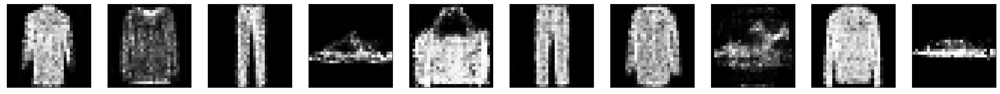

  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 18ms/step


  0%|▎                                                                                 | 1/234 [00:00<02:53,  1.34it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


  1%|▋                                                                                 | 2/234 [00:01<02:53,  1.33it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


  1%|█                                                                                 | 3/234 [00:02<02:55,  1.32it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:02,  1.26it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:14,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:04<03:18,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  3%|██▍                                                                               | 7/234 [00:05<03:21,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:20,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:19,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:17,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  5%|███▊                                                                             | 11/234 [00:09<03:16,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:16,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  6%|████▌                                                                            | 13/234 [00:11<03:15,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  6%|████▊                                                                            | 14/234 [00:12<03:15,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  6%|█████▏                                                                           | 15/234 [00:13<03:16,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  7%|█████▌                                                                           | 16/234 [00:13<03:15,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  7%|█████▉                                                                           | 17/234 [00:14<03:14,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  8%|██████▏                                                                          | 18/234 [00:15<03:13,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  8%|██████▌                                                                          | 19/234 [00:16<03:13,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  9%|██████▉                                                                          | 20/234 [00:17<03:11,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  9%|███████▎                                                                         | 21/234 [00:18<03:12,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


  9%|███████▌                                                                         | 22/234 [00:19<03:11,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 10%|███████▉                                                                         | 23/234 [00:20<03:11,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 10%|████████▎                                                                        | 24/234 [00:21<03:10,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 11%|████████▋                                                                        | 25/234 [00:22<03:08,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 11%|█████████                                                                        | 26/234 [00:22<03:07,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 12%|█████████▎                                                                       | 27/234 [00:23<03:06,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 12%|█████████▋                                                                       | 28/234 [00:24<03:05,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 12%|██████████                                                                       | 29/234 [00:25<03:04,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 13%|██████████▍                                                                      | 30/234 [00:26<03:03,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 13%|██████████▋                                                                      | 31/234 [00:27<03:03,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 14%|███████████                                                                      | 32/234 [00:28<03:02,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 14%|███████████▍                                                                     | 33/234 [00:29<03:01,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 15%|███████████▊                                                                     | 34/234 [00:30<03:00,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 15%|████████████                                                                     | 35/234 [00:31<02:59,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 15%|████████████▍                                                                    | 36/234 [00:31<02:58,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 16%|████████████▊                                                                    | 37/234 [00:32<02:58,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 16%|█████████████▏                                                                   | 38/234 [00:33<02:58,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 17%|█████████████▌                                                                   | 39/234 [00:34<03:01,  1.07it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▊                                                                   | 40/234 [00:35<03:04,  1.05it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▏                                                                  | 41/234 [00:36<03:09,  1.02it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▌                                                                  | 42/234 [00:37<03:07,  1.02it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▉                                                                  | 43/234 [00:38<03:02,  1.05it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▏                                                                 | 44/234 [00:39<03:01,  1.04it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▌                                                                 | 45/234 [00:40<03:03,  1.03it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 20%|███████████████▉                                                                 | 46/234 [00:41<03:02,  1.03it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 20%|████████████████▎                                                                | 47/234 [00:42<03:01,  1.03it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▌                                                                | 48/234 [00:43<03:01,  1.03it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 21%|████████████████▉                                                                | 49/234 [00:44<02:59,  1.03it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 21%|█████████████████▎                                                               | 50/234 [00:45<02:56,  1.04it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:46<02:52,  1.06it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 22%|██████████████████                                                               | 52/234 [00:47<02:48,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 23%|██████████████████▎                                                              | 53/234 [00:48<02:45,  1.09it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▋                                                              | 54/234 [00:49<02:43,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 24%|███████████████████                                                              | 55/234 [00:50<02:46,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▍                                                             | 56/234 [00:50<02:45,  1.07it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████▋                                                             | 57/234 [00:51<02:46,  1.06it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████                                                             | 58/234 [00:52<02:46,  1.06it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 25%|████████████████████▍                                                            | 59/234 [00:53<02:44,  1.06it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 26%|████████████████████▊                                                            | 60/234 [00:54<02:42,  1.07it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████                                                            | 61/234 [00:55<02:41,  1.07it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:56<02:39,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:57<02:38,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:58<02:36,  1.09it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:59<02:37,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 28%|██████████████████████▊                                                          | 66/234 [01:00<02:35,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 29%|███████████████████████▏                                                         | 67/234 [01:01<02:31,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 29%|███████████████████████▌                                                         | 68/234 [01:01<02:28,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:02<02:26,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:03<02:24,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:04<02:22,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:05<02:22,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:06<02:22,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:07<02:21,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:08<02:20,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:09<02:20,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:09<02:19,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 33%|███████████████████████████                                                      | 78/234 [01:10<02:18,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:11<02:16,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:12<02:22,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████                                                     | 81/234 [01:13<02:22,  1.08it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:14<02:19,  1.09it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:15<02:16,  1.10it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:16<02:14,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:17<02:13,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:18<02:11,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:18<02:09,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:19<02:08,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:20<02:07,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:21<02:05,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:22<02:06,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:23<02:05,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:24<02:04,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:25<02:02,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:25<02:01,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:26<01:59,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:27<01:59,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:28<01:58,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:29<01:57,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:30<01:55,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:31<01:55,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:31<01:53,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:32<01:53,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:33<01:52,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:34<01:51,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:35<01:50,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:36<01:48,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:37<01:47,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:38<01:47,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:38<01:46,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:39<01:46,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:40<01:45,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:41<01:44,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:42<01:42,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:43<01:42,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:44<01:40,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:44<01:39,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:45<01:39,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:46<01:39,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 27ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:47<01:41,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:48<01:42,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:49<01:41,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:50<01:40,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:51<01:38,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:52<01:37,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:52<01:35,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:53<01:35,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:54<01:35,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:55<01:34,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:56<01:33,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 25ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:57<01:32,  1.11it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:58<01:31,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:59<01:28,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:00<01:31,  1.09it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:00<01:25,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:01<01:20,  1.22it/s]

epoch:  96
8/8 [==============================] - 0s 20ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:02<01:17,  1.24it/s]

epoch:  96
8/8 [==============================] - 0s 18ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:03<01:15,  1.27it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:04<01:18,  1.20it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:04<01:19,  1.18it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:05<01:19,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:06<01:19,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:07<01:19,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:08<01:19,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:09<01:17,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:10<01:16,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:11<01:15,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:12<01:15,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:12<01:13,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:13<01:13,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:14<01:11,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 26ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:15<01:10,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:16<01:09,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:17<01:08,  1.17it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:18<01:07,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:18<01:07,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:19<01:06,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:20<01:06,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:21<01:05,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:22<01:03,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:23<01:03,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:24<01:02,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:24<01:01,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:25<01:00,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:26<00:59,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:27<00:59,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:28<00:58,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:29<00:57,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:30<00:56,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:31<00:55,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:31<00:54,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:32<00:54,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:33<00:53,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:34<00:52,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:35<00:51,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:36<00:50,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:37<00:49,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:38<00:48,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:38<00:47,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:39<00:46,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:40<00:45,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:41<00:45,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:42<00:44,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:43<00:44,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:44<00:43,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:45<00:42,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:46<00:41,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:46<00:40,  1.12it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:47<00:39,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:48<00:38,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:49<00:37,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:50<00:36,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:51<00:35,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:52<00:34,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:52<00:33,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:53<00:32,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:54<00:31,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:55<00:31,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:56<00:30,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [02:57<00:29,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [02:58<00:28,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 22ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [02:59<00:27,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [02:59<00:27,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:00<00:26,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:01<00:25,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:02<00:24,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:03<00:23,  1.13it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:04<00:22,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:05<00:22,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:06<00:20,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:06<00:19,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:07<00:19,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:08<00:18,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:09<00:17,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:10<00:16,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:11<00:15,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:12<00:14,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:13<00:13,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:13<00:13,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:14<00:12,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:15<00:11,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:16<00:10,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:17<00:09,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:18<00:08,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:19<00:07,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:19<00:06,  1.14it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:20<00:06,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:21<00:05,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:22<00:04,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:23<00:03,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:24<00:02,  1.15it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:25<00:01,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:26<00:00,  1.16it/s]

epoch:  96
8/8 [==============================] - 0s 24ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:26<00:00,  1.13it/s]


epoch:  96


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 22ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:21,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:20,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  1%|█                                                                                 | 3/234 [00:02<03:19,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:18,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:17,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:05<03:17,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:16,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  3%|██▊                                                                               | 8/234 [00:06<03:15,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  4%|███▏                                                                              | 9/234 [00:07<03:15,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  4%|███▍                                                                             | 10/234 [00:08<03:17,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  5%|███▊                                                                             | 11/234 [00:09<03:16,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  5%|████▏                                                                            | 12/234 [00:10<03:14,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  6%|████▌                                                                            | 13/234 [00:11<03:12,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  6%|████▊                                                                            | 14/234 [00:12<03:15,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  6%|█████▏                                                                           | 15/234 [00:13<03:14,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  7%|█████▌                                                                           | 16/234 [00:13<03:11,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  7%|█████▉                                                                           | 17/234 [00:14<03:09,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  8%|██████▏                                                                          | 18/234 [00:15<03:13,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  8%|██████▌                                                                          | 19/234 [00:16<03:15,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


  9%|██████▉                                                                          | 20/234 [00:17<03:13,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


  9%|███████▎                                                                         | 21/234 [00:18<03:12,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 21ms/step


  9%|███████▌                                                                         | 22/234 [00:19<03:07,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 10%|███████▉                                                                         | 23/234 [00:20<03:04,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 10%|████████▎                                                                        | 24/234 [00:21<03:03,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 22ms/step


 11%|████████▋                                                                        | 25/234 [00:21<03:01,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 11%|█████████                                                                        | 26/234 [00:22<03:00,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 12%|█████████▎                                                                       | 27/234 [00:23<02:58,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 12%|█████████▋                                                                       | 28/234 [00:24<02:58,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 12%|██████████                                                                       | 29/234 [00:25<02:58,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 13%|██████████▍                                                                      | 30/234 [00:26<02:57,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 13%|██████████▋                                                                      | 31/234 [00:27<02:57,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 14%|███████████                                                                      | 32/234 [00:28<02:56,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 14%|███████████▍                                                                     | 33/234 [00:28<02:56,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 15%|███████████▊                                                                     | 34/234 [00:29<02:56,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 15%|████████████                                                                     | 35/234 [00:30<02:55,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 15%|████████████▍                                                                    | 36/234 [00:31<02:55,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 16%|████████████▊                                                                    | 37/234 [00:32<02:53,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 16%|█████████████▏                                                                   | 38/234 [00:33<03:02,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▌                                                                   | 39/234 [00:34<02:51,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 18ms/step


 17%|█████████████▊                                                                   | 40/234 [00:35<02:44,  1.18it/s]

epoch:  97
8/8 [==============================] - 0s 22ms/step


 18%|██████████████▏                                                                  | 41/234 [00:35<02:39,  1.21it/s]

epoch:  97
8/8 [==============================] - 0s 17ms/step


 18%|██████████████▌                                                                  | 42/234 [00:36<02:37,  1.22it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▉                                                                  | 43/234 [00:37<02:42,  1.17it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 19%|███████████████▏                                                                 | 44/234 [00:38<02:42,  1.17it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 19%|███████████████▌                                                                 | 45/234 [00:39<02:45,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 20%|███████████████▉                                                                 | 46/234 [00:40<02:43,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 20%|████████████████▎                                                                | 47/234 [00:41<02:42,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▌                                                                | 48/234 [00:41<02:42,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 21%|████████████████▉                                                                | 49/234 [00:42<02:40,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 22ms/step


 21%|█████████████████▎                                                               | 50/234 [00:43<02:39,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:44<02:40,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 22%|██████████████████                                                               | 52/234 [00:45<02:37,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 23%|██████████████████▎                                                              | 53/234 [00:46<02:35,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 23%|██████████████████▋                                                              | 54/234 [00:47<02:34,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████                                                              | 55/234 [00:47<02:34,  1.16it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 24%|███████████████████▍                                                             | 56/234 [00:48<02:35,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▋                                                             | 57/234 [00:49<02:34,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████                                                             | 58/234 [00:50<02:33,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████▍                                                            | 59/234 [00:51<02:32,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 26%|████████████████████▊                                                            | 60/234 [00:52<02:31,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████                                                            | 61/234 [00:53<02:30,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:54<02:29,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:54<02:30,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:55<02:29,  1.14it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:56<02:29,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▊                                                          | 66/234 [00:57<02:29,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▏                                                         | 67/234 [00:58<02:28,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▌                                                         | 68/234 [00:59<02:28,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:00<02:27,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:01<02:26,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:02<02:24,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:03<02:24,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:03<02:23,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:04<02:21,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:05<02:21,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:06<02:23,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:07<02:21,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 33%|███████████████████████████                                                      | 78/234 [01:08<02:20,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:09<02:18,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:10<02:17,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████                                                     | 81/234 [01:11<02:17,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:12<02:17,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:12<02:17,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:13<02:16,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:14<02:14,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:15<02:14,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:16<02:14,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:17<02:12,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:18<02:12,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:19<02:10,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:20<02:10,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:21<02:10,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:22<02:09,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:23<02:09,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:23<02:07,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:24<02:06,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:25<02:04,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:26<02:03,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:27<02:04,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 26ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:28<02:06,  1.06it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:29<02:08,  1.03it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:30<02:09,  1.02it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:31<02:08,  1.02it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:32<02:06,  1.03it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:33<02:06,  1.02it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:34<02:04,  1.03it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:35<02:03,  1.03it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:36<02:01,  1.04it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:37<01:57,  1.06it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:38<01:55,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:39<01:54,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:40<01:52,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:40<01:50,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 22ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:41<01:48,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:42<01:46,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:43<01:46,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:44<01:45,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:45<01:47,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:46<01:46,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:47<01:44,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:48<01:43,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:49<01:42,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:50<01:41,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:50<01:40,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:51<01:39,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:52<01:39,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:53<01:38,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:54<01:38,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:55<01:37,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:56<01:36,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:57<01:36,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:58<01:34,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [01:59<01:33,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:00<01:32,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:01<01:32,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:02<01:30,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:03<01:29,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:03<01:27,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:04<01:26,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:05<01:26,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:06<01:25,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:07<01:24,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:08<01:22,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:09<01:20,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:10<01:18,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:11<01:18,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:11<01:17,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:12<01:17,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:13<01:16,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:14<01:15,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:15<01:13,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:16<01:13,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:17<01:12,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:18<01:11,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:19<01:10,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:20<01:10,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:21<01:13,  1.05it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:22<01:12,  1.04it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:23<01:12,  1.04it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:24<01:10,  1.04it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:24<01:08,  1.06it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:25<01:07,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:26<01:06,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:27<01:04,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:28<01:03,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:29<01:03,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:30<01:01,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:31<01:00,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:32<00:59,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:33<01:01,  1.04it/s]

epoch:  97
8/8 [==============================] - 0s 19ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:34<00:56,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 19ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:34<00:53,  1.15it/s]

epoch:  97
8/8 [==============================] - 0s 20ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:35<00:51,  1.19it/s]

epoch:  97
8/8 [==============================] - 0s 18ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:36<00:50,  1.19it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:37<00:52,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:38<00:52,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:39<00:51,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:40<00:50,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:41<00:49,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:42<00:48,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:42<00:47,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:43<00:46,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:44<00:45,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:45<00:45,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:46<00:43,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:47<00:43,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:48<00:42,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:49<00:41,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:50<00:40,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:51<00:39,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:51<00:38,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:52<00:37,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:53<00:36,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:54<00:35,  1.13it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:55<00:34,  1.12it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:56<00:34,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:57<00:33,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:58<00:32,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [02:59<00:31,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [03:00<00:30,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [03:00<00:30,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [03:01<00:29,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [03:02<00:28,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:03<00:27,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:04<00:26,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:05<00:25,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:06<00:24,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:07<00:23,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:08<00:23,  1.07it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:09<00:22,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 25ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:10<00:21,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:11<00:20,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:11<00:19,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:12<00:18,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:13<00:17,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:14<00:16,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:15<00:15,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:16<00:14,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:17<00:13,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:18<00:12,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:19<00:11,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:20<00:10,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:21<00:09,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:21<00:09,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:22<00:08,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:23<00:07,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:24<00:06,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:25<00:05,  1.09it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:26<00:04,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:27<00:03,  1.10it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:28<00:02,  1.11it/s]

epoch:  97
8/8 [==============================] - 0s 24ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:29<00:01,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:30<00:00,  1.08it/s]

epoch:  97
8/8 [==============================] - 0s 23ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:31<00:00,  1.11it/s]


epoch:  97


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 23ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:39,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:38,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  1%|█                                                                                 | 3/234 [00:02<03:38,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:37,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:37,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:05<03:36,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:39,  1.03it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:34,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:31,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  4%|███▍                                                                             | 10/234 [00:09<03:28,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  5%|███▊                                                                             | 11/234 [00:10<03:25,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  5%|████▏                                                                            | 12/234 [00:11<03:23,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  6%|████▌                                                                            | 13/234 [00:12<03:21,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  6%|████▊                                                                            | 14/234 [00:13<03:20,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  6%|█████▏                                                                           | 15/234 [00:13<03:19,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  7%|█████▌                                                                           | 16/234 [00:14<03:19,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


  7%|█████▉                                                                           | 17/234 [00:15<03:18,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


  8%|██████▏                                                                          | 18/234 [00:16<03:19,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  8%|██████▌                                                                          | 19/234 [00:17<03:18,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  9%|██████▉                                                                          | 20/234 [00:18<03:17,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  9%|███████▎                                                                         | 21/234 [00:19<03:15,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


  9%|███████▌                                                                         | 22/234 [00:20<03:13,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 10%|███████▉                                                                         | 23/234 [00:21<03:11,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 10%|████████▎                                                                        | 24/234 [00:22<03:11,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 11%|████████▋                                                                        | 25/234 [00:23<03:10,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 11%|█████████                                                                        | 26/234 [00:24<03:10,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 12%|█████████▎                                                                       | 27/234 [00:24<03:10,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 12%|█████████▋                                                                       | 28/234 [00:25<03:09,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 12%|██████████                                                                       | 29/234 [00:26<03:07,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 13%|██████████▍                                                                      | 30/234 [00:27<03:05,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 13%|██████████▋                                                                      | 31/234 [00:28<03:07,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 22ms/step


 14%|███████████                                                                      | 32/234 [00:29<03:00,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 22ms/step


 14%|███████████▍                                                                     | 33/234 [00:30<02:57,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 15%|███████████▊                                                                     | 34/234 [00:31<02:56,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 15%|████████████                                                                     | 35/234 [00:32<02:56,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 15%|████████████▍                                                                    | 36/234 [00:33<02:56,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 16%|████████████▊                                                                    | 37/234 [00:33<02:56,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 16%|█████████████▏                                                                   | 38/234 [00:34<02:55,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▌                                                                   | 39/234 [00:35<02:55,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 17%|█████████████▊                                                                   | 40/234 [00:36<02:55,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 18%|██████████████▏                                                                  | 41/234 [00:37<02:55,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▌                                                                  | 42/234 [00:38<02:54,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▉                                                                  | 43/234 [00:39<02:53,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▏                                                                 | 44/234 [00:40<02:52,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▌                                                                 | 45/234 [00:41<02:51,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 20%|███████████████▉                                                                 | 46/234 [00:42<02:50,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 20%|████████████████▎                                                                | 47/234 [00:43<02:50,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▌                                                                | 48/234 [00:43<02:49,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▉                                                                | 49/234 [00:44<02:47,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 21%|█████████████████▎                                                               | 50/234 [00:45<02:48,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 22%|█████████████████▋                                                               | 51/234 [00:46<02:54,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 22ms/step


 22%|██████████████████                                                               | 52/234 [00:47<02:53,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▎                                                              | 53/234 [00:48<02:50,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▋                                                              | 54/234 [00:49<02:47,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████                                                              | 55/234 [00:50<02:49,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▍                                                             | 56/234 [00:51<02:47,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 24%|███████████████████▋                                                             | 57/234 [00:52<02:46,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████                                                             | 58/234 [00:53<02:47,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████▍                                                            | 59/234 [00:54<02:45,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 26%|████████████████████▊                                                            | 60/234 [00:55<02:42,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 26%|█████████████████████                                                            | 61/234 [00:56<02:42,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:57<02:42,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:58<02:41,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:59<02:39,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▌                                                          | 65/234 [00:59<02:37,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▊                                                          | 66/234 [01:00<02:34,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▏                                                         | 67/234 [01:01<02:39,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▌                                                         | 68/234 [01:02<02:27,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 18ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:03<02:20,  1.17it/s]

epoch:  98
8/8 [==============================] - 0s 21ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:04<02:15,  1.21it/s]

epoch:  98
8/8 [==============================] - 0s 18ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:04<02:11,  1.24it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:05<02:17,  1.18it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:06<02:18,  1.16it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:07<02:20,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:08<02:19,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:09<02:18,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:10<02:17,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 33%|███████████████████████████                                                      | 78/234 [01:11<02:16,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:12<02:16,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:12<02:15,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████                                                     | 81/234 [01:13<02:14,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:14<02:14,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:15<02:13,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 22ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:16<02:11,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:17<02:11,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:18<02:09,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:19<02:09,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:19<02:07,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:20<02:06,  1.15it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:21<02:06,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:22<02:05,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:23<02:05,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:24<02:04,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:25<02:06,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:26<02:07,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:27<02:06,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:28<02:06,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:29<02:05,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:29<02:04,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:30<02:03,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:31<02:02,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:32<02:03,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:33<02:02,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:34<01:59,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:35<01:57,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:36<01:55,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:37<01:53,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:38<01:53,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:39<01:53,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:40<01:52,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:40<01:50,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:41<01:49,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:42<01:47,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:43<01:46,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:44<01:45,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:45<01:44,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:46<01:44,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:47<01:44,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:48<01:43,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:48<01:41,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:49<01:40,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:50<01:39,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:51<01:38,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:52<01:38,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:53<01:37,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:54<01:37,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:55<01:36,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:56<01:35,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:56<01:33,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:57<01:32,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [01:58<01:30,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [01:59<01:31,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [02:00<01:32,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:01<01:32,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:02<01:31,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:03<01:31,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:04<01:30,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:05<01:29,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:06<01:26,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:07<01:24,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:07<01:23,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:08<01:21,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:09<01:19,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:10<01:19,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:11<01:18,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:12<01:17,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:13<01:16,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:13<01:15,  1.14it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:14<01:16,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:15<01:15,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:16<01:14,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:17<01:13,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:18<01:11,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:19<01:11,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:20<01:11,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:21<01:09,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:22<01:08,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:22<01:07,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:23<01:07,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:24<01:06,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:25<01:05,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:26<01:04,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:27<01:03,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:28<01:02,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:29<01:01,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:30<01:00,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:31<01:00,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:31<00:59,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:32<00:57,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:33<00:57,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:34<00:55,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:35<00:55,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:36<00:55,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:37<00:53,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:38<00:53,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:39<00:52,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:39<00:51,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:40<00:49,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:41<00:49,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:42<00:48,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:43<00:47,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:44<00:46,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:45<00:46,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:46<00:45,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:47<00:44,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:48<00:43,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:49<00:42,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:49<00:41,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:50<00:40,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:51<00:39,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:52<00:38,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:53<00:37,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:54<00:37,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 27ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:55<00:36,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:56<00:35,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 26ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:57<00:35,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [02:58<00:34,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [02:59<00:33,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [03:00<00:33,  1.05it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [03:01<00:32,  1.04it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [03:02<00:31,  1.04it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [03:03<00:31,  1.02it/s]

epoch:  98
8/8 [==============================] - 0s 18ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [03:03<00:28,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 19ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:04<00:26,  1.13it/s]

epoch:  98
8/8 [==============================] - 0s 19ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:05<00:25,  1.15it/s]

epoch:  98
8/8 [==============================] - 0s 27ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:06<00:25,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:07<00:24,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:08<00:24,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:09<00:23,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:10<00:21,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:11<00:21,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:12<00:20,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:13<00:19,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:13<00:18,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:14<00:17,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:15<00:16,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:16<00:15,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:17<00:14,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:18<00:14,  1.06it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:19<00:13,  1.07it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:20<00:12,  1.08it/s]

epoch:  98
8/8 [==============================] - 0s 23ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:21<00:11,  1.09it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:22<00:10,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:23<00:09,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:24<00:08,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:24<00:07,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:25<00:06,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:26<00:05,  1.12it/s]

epoch:  98
8/8 [==============================] - 0s 25ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:27<00:04,  1.11it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:28<00:03,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:29<00:02,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:30<00:01,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:31<00:00,  1.10it/s]

epoch:  98
8/8 [==============================] - 0s 24ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:32<00:00,  1.10it/s]


epoch:  98


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 24ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:32,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:27,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


  1%|█                                                                                 | 3/234 [00:02<03:31,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:34,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:38,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


  3%|██                                                                                | 6/234 [00:05<03:36,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:36,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:38,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:39,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  4%|███▍                                                                             | 10/234 [00:09<03:37,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


  5%|███▊                                                                             | 11/234 [00:10<03:40,  1.01it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  5%|████▏                                                                            | 12/234 [00:11<03:39,  1.01it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


  6%|████▌                                                                            | 13/234 [00:12<03:35,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  6%|████▊                                                                            | 14/234 [00:13<03:30,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


  6%|█████▏                                                                           | 15/234 [00:14<03:27,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


  7%|█████▌                                                                           | 16/234 [00:15<03:26,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  7%|█████▉                                                                           | 17/234 [00:16<03:20,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


  8%|██████▏                                                                          | 18/234 [00:17<03:16,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  8%|██████▌                                                                          | 19/234 [00:17<03:14,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


  9%|██████▉                                                                          | 20/234 [00:18<03:18,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


  9%|███████▎                                                                         | 21/234 [00:19<03:17,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


  9%|███████▌                                                                         | 22/234 [00:20<03:16,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 10%|███████▉                                                                         | 23/234 [00:21<03:13,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 10%|████████▎                                                                        | 24/234 [00:22<03:10,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 11%|████████▋                                                                        | 25/234 [00:23<03:06,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 11%|█████████                                                                        | 26/234 [00:24<03:06,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 12%|█████████▎                                                                       | 27/234 [00:25<03:05,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 12%|█████████▋                                                                       | 28/234 [00:26<03:06,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 12%|██████████                                                                       | 29/234 [00:27<03:07,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


 13%|██████████▍                                                                      | 30/234 [00:28<03:10,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 13%|██████████▋                                                                      | 31/234 [00:28<03:09,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 14%|███████████                                                                      | 32/234 [00:29<03:10,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 14%|███████████▍                                                                     | 33/234 [00:30<03:08,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 15%|███████████▊                                                                     | 34/234 [00:31<03:07,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 15%|████████████                                                                     | 35/234 [00:32<03:05,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 15%|████████████▍                                                                    | 36/234 [00:33<03:04,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 16%|████████████▊                                                                    | 37/234 [00:34<03:04,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 16%|█████████████▏                                                                   | 38/234 [00:35<03:02,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 17%|█████████████▌                                                                   | 39/234 [00:36<03:02,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 17%|█████████████▊                                                                   | 40/234 [00:37<03:01,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 18%|██████████████▏                                                                  | 41/234 [00:38<03:01,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▌                                                                  | 42/234 [00:39<03:00,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 18%|██████████████▉                                                                  | 43/234 [00:40<02:58,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▏                                                                 | 44/234 [00:41<02:57,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▌                                                                 | 45/234 [00:42<02:56,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 20%|███████████████▉                                                                 | 46/234 [00:43<02:59,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 20%|████████████████▎                                                                | 47/234 [00:44<02:57,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 21%|████████████████▌                                                                | 48/234 [00:44<02:55,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▉                                                                | 49/234 [00:45<02:53,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 21%|█████████████████▎                                                               | 50/234 [00:46<02:50,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 22%|█████████████████▋                                                               | 51/234 [00:47<02:48,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


 22%|██████████████████                                                               | 52/234 [00:48<02:46,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▎                                                              | 53/234 [00:49<02:44,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▋                                                              | 54/234 [00:50<02:43,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 24%|███████████████████                                                              | 55/234 [00:51<02:43,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 24%|███████████████████▍                                                             | 56/234 [00:52<02:42,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▋                                                             | 57/234 [00:53<02:42,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████                                                             | 58/234 [00:54<02:40,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████▍                                                            | 59/234 [00:54<02:39,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 26%|████████████████████▊                                                            | 60/234 [00:55<02:39,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 26%|█████████████████████                                                            | 61/234 [00:56<02:37,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:57<02:36,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:58<02:34,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:59<02:34,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▌                                                          | 65/234 [01:00<02:34,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▊                                                          | 66/234 [01:01<02:33,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▏                                                         | 67/234 [01:02<02:32,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▌                                                         | 68/234 [01:03<02:32,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:04<02:32,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:05<02:47,  1.02s/it]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:06<02:39,  1.02it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:07<02:36,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:08<02:32,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:09<02:30,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:09<02:28,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:10<02:25,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:11<02:24,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 33%|███████████████████████████                                                      | 78/234 [01:12<02:30,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 20ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:13<02:26,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:14<02:23,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 35%|████████████████████████████                                                     | 81/234 [01:15<02:22,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:16<02:20,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:17<02:22,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:18<02:21,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:19<02:20,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:20<02:20,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:21<02:19,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:22<02:19,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:23<02:17,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:24<02:14,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:24<02:12,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:25<02:10,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:26<02:08,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:27<02:08,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:28<02:06,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:29<02:09,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:30<02:08,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 17ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:31<01:59,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 18ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:32<01:55,  1.17it/s]

epoch:  99
8/8 [==============================] - 0s 17ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:32<01:50,  1.21it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:33<01:55,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:34<01:58,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:35<01:57,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:36<01:57,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:37<01:55,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:38<01:55,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:39<01:54,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:40<01:53,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:41<01:52,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:41<01:51,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:42<01:50,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:43<01:50,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:44<01:49,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:45<01:49,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:46<01:48,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:47<01:48,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:48<01:45,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:49<01:44,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:50<01:43,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:50<01:42,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:51<01:41,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:52<01:40,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:53<01:40,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:54<01:39,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:55<01:37,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:56<01:36,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:57<01:35,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:58<01:33,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [01:58<01:32,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [01:59<01:30,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [02:00<01:30,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [02:01<01:29,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [02:02<01:29,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:03<01:28,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:04<01:27,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:05<01:25,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:06<01:25,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:06<01:24,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:07<01:24,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:08<01:23,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:09<01:22,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:10<01:21,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:11<01:20,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:12<01:19,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:13<01:17,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:13<01:16,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:14<01:16,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:15<01:15,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:16<01:14,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:17<01:13,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:18<01:12,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:19<01:11,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:20<01:10,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:20<01:09,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:21<01:08,  1.15it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:22<01:08,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:23<01:07,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:24<01:06,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:25<01:05,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:26<01:04,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:27<01:04,  1.14it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:27<01:03,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:28<01:03,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:29<01:02,  1.12it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:30<01:02,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:31<01:02,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:32<01:01,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:33<01:00,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:34<01:00,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:35<00:59,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:36<00:58,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:37<00:57,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:38<00:56,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:39<00:54,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:39<00:54,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:40<00:52,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:41<00:51,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:42<00:50,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:43<00:49,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:44<00:49,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:45<00:49,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:46<00:49,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:47<00:49,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:48<00:49,  1.02it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:49<00:48,  1.01it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:50<00:46,  1.02it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:51<00:45,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:52<00:43,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:53<00:42,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:54<00:41,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:55<00:40,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [02:55<00:38,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [02:56<00:37,  1.09it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [02:57<00:36,  1.10it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [02:58<00:36,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [02:59<00:35,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [03:00<00:34,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [03:01<00:33,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [03:02<00:32,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [03:03<00:31,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [03:04<00:30,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [03:05<00:29,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [03:06<00:28,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:07<00:28,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:08<00:27,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:09<00:26,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:10<00:25,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:10<00:24,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:11<00:23,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:12<00:22,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 23ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:13<00:21,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:14<00:20,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:15<00:19,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:16<00:18,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:17<00:18,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 22ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:18<00:17,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 25ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:19<00:16,  1.04it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:20<00:15,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:21<00:14,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:22<00:13,  1.06it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:23<00:12,  1.05it/s]

epoch:  99
8/8 [==============================] - 0s 27ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:24<00:11,  1.03it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:25<00:10,  1.02it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:26<00:09,  1.01it/s]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:27<00:09,  1.00s/it]

epoch:  99
8/8 [==============================] - 0s 26ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:28<00:08,  1.01s/it]

epoch:  99
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:29<00:07,  1.01s/it]

epoch:  99
8/8 [==============================] - 0s 26ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:30<00:06,  1.04s/it]

epoch:  99
8/8 [==============================] - 0s 26ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:31<00:04,  1.01it/s]

epoch:  99
8/8 [==============================] - 0s 20ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:32<00:03,  1.07it/s]

epoch:  99
8/8 [==============================] - 0s 19ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:32<00:02,  1.13it/s]

epoch:  99
8/8 [==============================] - 0s 19ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:33<00:01,  1.11it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:34<00:00,  1.08it/s]

epoch:  99
8/8 [==============================] - 0s 26ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:35<00:00,  1.08it/s]


epoch:  99


  0%|                                                                                          | 0/234 [00:00<?, ?it/s]

8/8 [==============================] - 0s 25ms/step


  0%|▎                                                                                 | 1/234 [00:00<03:49,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  1%|▋                                                                                 | 2/234 [00:01<03:49,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  1%|█                                                                                 | 3/234 [00:02<03:49,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  2%|█▍                                                                                | 4/234 [00:03<03:49,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  2%|█▊                                                                                | 5/234 [00:04<03:45,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


  3%|██                                                                                | 6/234 [00:05<03:44,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  3%|██▍                                                                               | 7/234 [00:06<03:45,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 27ms/step


  3%|██▊                                                                               | 8/234 [00:07<03:48,  1.01s/it]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  4%|███▏                                                                              | 9/234 [00:08<03:44,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  4%|███▍                                                                             | 10/234 [00:09<03:41,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  5%|███▊                                                                             | 11/234 [00:10<03:38,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


  5%|████▏                                                                            | 12/234 [00:11<03:34,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


  6%|████▌                                                                            | 13/234 [00:12<03:32,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  6%|████▊                                                                            | 14/234 [00:13<03:34,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  6%|█████▏                                                                           | 15/234 [00:14<03:33,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  7%|█████▌                                                                           | 16/234 [00:15<03:30,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  7%|█████▉                                                                           | 17/234 [00:16<03:28,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  8%|██████▏                                                                          | 18/234 [00:17<03:26,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


  8%|██████▌                                                                          | 19/234 [00:18<03:22,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  9%|██████▉                                                                          | 20/234 [00:19<03:20,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  9%|███████▎                                                                         | 21/234 [00:20<03:20,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


  9%|███████▌                                                                         | 22/234 [00:21<03:19,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 10%|███████▉                                                                         | 23/234 [00:22<03:17,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 10%|████████▎                                                                        | 24/234 [00:23<03:16,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 11%|████████▋                                                                        | 25/234 [00:24<03:14,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 11%|█████████                                                                        | 26/234 [00:25<03:13,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 12%|█████████▎                                                                       | 27/234 [00:25<03:10,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 12%|█████████▋                                                                       | 28/234 [00:26<03:10,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 12%|██████████                                                                       | 29/234 [00:27<03:10,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 13%|██████████▍                                                                      | 30/234 [00:28<03:09,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 13%|██████████▋                                                                      | 31/234 [00:29<03:08,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 14%|███████████                                                                      | 32/234 [00:30<03:06,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 14%|███████████▍                                                                     | 33/234 [00:31<03:05,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 15%|███████████▊                                                                     | 34/234 [00:32<03:06,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 15%|████████████                                                                     | 35/234 [00:33<03:04,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 15%|████████████▍                                                                    | 36/234 [00:34<03:03,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 16%|████████████▊                                                                    | 37/234 [00:35<03:01,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 16%|█████████████▏                                                                   | 38/234 [00:36<03:02,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 17%|█████████████▌                                                                   | 39/234 [00:37<03:02,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 17%|█████████████▊                                                                   | 40/234 [00:38<03:00,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▏                                                                  | 41/234 [00:38<02:59,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 18%|██████████████▌                                                                  | 42/234 [00:39<02:56,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 18%|██████████████▉                                                                  | 43/234 [00:40<02:57,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▏                                                                 | 44/234 [00:41<02:54,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 19%|███████████████▌                                                                 | 45/234 [00:42<02:51,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 20%|███████████████▉                                                                 | 46/234 [00:43<02:49,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 20%|████████████████▎                                                                | 47/234 [00:44<02:48,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 21%|████████████████▌                                                                | 48/234 [00:45<02:48,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 21%|████████████████▉                                                                | 49/234 [00:46<02:47,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 21%|█████████████████▎                                                               | 50/234 [00:47<02:45,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 22%|█████████████████▋                                                               | 51/234 [00:47<02:44,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 22%|██████████████████                                                               | 52/234 [00:48<02:44,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 23%|██████████████████▎                                                              | 53/234 [00:49<02:44,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 23%|██████████████████▋                                                              | 54/234 [00:50<02:43,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 24%|███████████████████                                                              | 55/234 [00:51<02:42,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▍                                                             | 56/234 [00:52<02:42,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 24%|███████████████████▋                                                             | 57/234 [00:53<02:42,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 25%|████████████████████                                                             | 58/234 [00:54<02:41,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 25%|████████████████████▍                                                            | 59/234 [00:55<02:39,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 26%|████████████████████▊                                                            | 60/234 [00:56<02:37,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 26%|█████████████████████                                                            | 61/234 [00:57<02:37,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 26%|█████████████████████▍                                                           | 62/234 [00:57<02:35,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 27%|█████████████████████▊                                                           | 63/234 [00:58<02:35,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 27%|██████████████████████▏                                                          | 64/234 [00:59<02:35,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▌                                                          | 65/234 [01:00<02:34,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 28%|██████████████████████▊                                                          | 66/234 [01:01<02:32,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▏                                                         | 67/234 [01:02<02:32,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 29%|███████████████████████▌                                                         | 68/234 [01:03<02:30,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 29%|███████████████████████▉                                                         | 69/234 [01:04<02:29,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▏                                                        | 70/234 [01:05<02:28,  1.11it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 30%|████████████████████████▌                                                        | 71/234 [01:06<02:29,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 31%|████████████████████████▉                                                        | 72/234 [01:07<02:28,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 31%|█████████████████████████▎                                                       | 73/234 [01:08<02:28,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 32%|█████████████████████████▌                                                       | 74/234 [01:08<02:28,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 27ms/step


 32%|█████████████████████████▉                                                       | 75/234 [01:09<02:30,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 32%|██████████████████████████▎                                                      | 76/234 [01:10<02:28,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 33%|██████████████████████████▋                                                      | 77/234 [01:11<02:26,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 33%|███████████████████████████                                                      | 78/234 [01:12<02:24,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 34%|███████████████████████████▎                                                     | 79/234 [01:13<02:23,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 34%|███████████████████████████▋                                                     | 80/234 [01:14<02:22,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████                                                     | 81/234 [01:15<02:20,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▍                                                    | 82/234 [01:16<02:18,  1.10it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 35%|████████████████████████████▋                                                    | 83/234 [01:17<02:18,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 36%|█████████████████████████████                                                    | 84/234 [01:18<02:19,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 36%|█████████████████████████████▍                                                   | 85/234 [01:19<02:20,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 37%|█████████████████████████████▊                                                   | 86/234 [01:20<02:20,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 37%|██████████████████████████████                                                   | 87/234 [01:21<02:19,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▍                                                  | 88/234 [01:22<02:17,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 38%|██████████████████████████████▊                                                  | 89/234 [01:22<02:15,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 38%|███████████████████████████████▏                                                 | 90/234 [01:23<02:13,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 39%|███████████████████████████████▌                                                 | 91/234 [01:24<02:10,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 39%|███████████████████████████████▊                                                 | 92/234 [01:25<02:10,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 40%|████████████████████████████████▏                                                | 93/234 [01:26<02:10,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 40%|████████████████████████████████▌                                                | 94/234 [01:27<02:10,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 41%|████████████████████████████████▉                                                | 95/234 [01:28<02:08,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 41%|█████████████████████████████████▏                                               | 96/234 [01:29<02:08,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 41%|█████████████████████████████████▌                                               | 97/234 [01:30<02:06,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 42%|█████████████████████████████████▉                                               | 98/234 [01:31<02:05,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 42%|██████████████████████████████████▎                                              | 99/234 [01:32<02:04,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 43%|██████████████████████████████████▏                                             | 100/234 [01:33<02:03,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 43%|██████████████████████████████████▌                                             | 101/234 [01:34<02:02,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 44%|██████████████████████████████████▊                                             | 102/234 [01:34<02:02,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████▏                                            | 103/234 [01:35<02:01,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 44%|███████████████████████████████████▌                                            | 104/234 [01:36<01:59,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 45%|███████████████████████████████████▉                                            | 105/234 [01:37<01:59,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 45%|████████████████████████████████████▏                                           | 106/234 [01:38<02:03,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 46%|████████████████████████████████████▌                                           | 107/234 [01:39<02:02,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 46%|████████████████████████████████████▉                                           | 108/234 [01:40<02:01,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▎                                          | 109/234 [01:41<01:58,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▌                                          | 110/234 [01:42<01:58,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 47%|█████████████████████████████████████▉                                          | 111/234 [01:43<01:56,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 48%|██████████████████████████████████████▎                                         | 112/234 [01:44<01:54,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 48%|██████████████████████████████████████▋                                         | 113/234 [01:45<01:53,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 49%|██████████████████████████████████████▉                                         | 114/234 [01:46<01:51,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 49%|███████████████████████████████████████▎                                        | 115/234 [01:47<01:51,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 50%|███████████████████████████████████████▋                                        | 116/234 [01:48<01:50,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 50%|████████████████████████████████████████                                        | 117/234 [01:49<01:49,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 50%|████████████████████████████████████████▎                                       | 118/234 [01:50<01:48,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 51%|████████████████████████████████████████▋                                       | 119/234 [01:51<01:48,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 51%|█████████████████████████████████████████                                       | 120/234 [01:51<01:47,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 52%|█████████████████████████████████████████▎                                      | 121/234 [01:52<01:46,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 52%|█████████████████████████████████████████▋                                      | 122/234 [01:53<01:50,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 18ms/step


 53%|██████████████████████████████████████████                                      | 123/234 [01:54<01:42,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 19ms/step


 53%|██████████████████████████████████████████▍                                     | 124/234 [01:55<01:37,  1.13it/s]

epoch:  100
8/8 [==============================] - 0s 22ms/step


 53%|██████████████████████████████████████████▋                                     | 125/234 [01:56<01:33,  1.16it/s]

epoch:  100
8/8 [==============================] - 0s 19ms/step


 54%|███████████████████████████████████████████                                     | 126/234 [01:57<01:32,  1.17it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 54%|███████████████████████████████████████████▍                                    | 127/234 [01:58<01:37,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 55%|███████████████████████████████████████████▊                                    | 128/234 [01:59<01:41,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 55%|████████████████████████████████████████████                                    | 129/234 [02:00<01:40,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 56%|████████████████████████████████████████████▍                                   | 130/234 [02:01<01:39,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 56%|████████████████████████████████████████████▊                                   | 131/234 [02:02<01:38,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 56%|█████████████████████████████████████████████▏                                  | 132/234 [02:03<01:37,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 57%|█████████████████████████████████████████████▍                                  | 133/234 [02:04<01:38,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 57%|█████████████████████████████████████████████▊                                  | 134/234 [02:05<01:36,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 58%|██████████████████████████████████████████████▏                                 | 135/234 [02:06<01:34,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 58%|██████████████████████████████████████████████▍                                 | 136/234 [02:06<01:34,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 59%|██████████████████████████████████████████████▊                                 | 137/234 [02:07<01:31,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 59%|███████████████████████████████████████████████▏                                | 138/234 [02:08<01:29,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 59%|███████████████████████████████████████████████▌                                | 139/234 [02:09<01:27,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 60%|███████████████████████████████████████████████▊                                | 140/234 [02:10<01:26,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 60%|████████████████████████████████████████████████▏                               | 141/234 [02:11<01:26,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 61%|████████████████████████████████████████████████▌                               | 142/234 [02:12<01:25,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 61%|████████████████████████████████████████████████▉                               | 143/234 [02:13<01:25,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 62%|█████████████████████████████████████████████████▏                              | 144/234 [02:14<01:24,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 62%|█████████████████████████████████████████████████▌                              | 145/234 [02:15<01:23,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 62%|█████████████████████████████████████████████████▉                              | 146/234 [02:16<01:23,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 63%|██████████████████████████████████████████████████▎                             | 147/234 [02:17<01:22,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 63%|██████████████████████████████████████████████████▌                             | 148/234 [02:18<01:21,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 64%|██████████████████████████████████████████████████▉                             | 149/234 [02:19<01:20,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 64%|███████████████████████████████████████████████████▎                            | 150/234 [02:20<01:19,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 65%|███████████████████████████████████████████████████▌                            | 151/234 [02:21<01:18,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 65%|███████████████████████████████████████████████████▉                            | 152/234 [02:22<01:17,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 65%|████████████████████████████████████████████████████▎                           | 153/234 [02:22<01:17,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 66%|████████████████████████████████████████████████████▋                           | 154/234 [02:23<01:17,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 66%|████████████████████████████████████████████████████▉                           | 155/234 [02:24<01:16,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 67%|█████████████████████████████████████████████████████▎                          | 156/234 [02:25<01:15,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 67%|█████████████████████████████████████████████████████▋                          | 157/234 [02:26<01:15,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████                          | 158/234 [02:27<01:14,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 68%|██████████████████████████████████████████████████████▎                         | 159/234 [02:28<01:12,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 68%|██████████████████████████████████████████████████████▋                         | 160/234 [02:29<01:10,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 69%|███████████████████████████████████████████████████████                         | 161/234 [02:30<01:09,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 69%|███████████████████████████████████████████████████████▍                        | 162/234 [02:31<01:08,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 70%|███████████████████████████████████████████████████████▋                        | 163/234 [02:32<01:08,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 70%|████████████████████████████████████████████████████████                        | 164/234 [02:33<01:09,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 71%|████████████████████████████████████████████████████████▍                       | 165/234 [02:34<01:08,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 71%|████████████████████████████████████████████████████████▊                       | 166/234 [02:35<01:07,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 71%|█████████████████████████████████████████████████████████                       | 167/234 [02:36<01:06,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 72%|█████████████████████████████████████████████████████████▍                      | 168/234 [02:37<01:05,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 72%|█████████████████████████████████████████████████████████▊                      | 169/234 [02:38<01:03,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████                      | 170/234 [02:39<01:01,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 73%|██████████████████████████████████████████████████████████▍                     | 171/234 [02:40<00:59,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 74%|██████████████████████████████████████████████████████████▊                     | 172/234 [02:41<00:58,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 74%|███████████████████████████████████████████████████████████▏                    | 173/234 [02:42<00:57,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 74%|███████████████████████████████████████████████████████████▍                    | 174/234 [02:43<00:55,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 75%|███████████████████████████████████████████████████████████▊                    | 175/234 [02:44<00:54,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 75%|████████████████████████████████████████████████████████████▏                   | 176/234 [02:45<00:53,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 76%|████████████████████████████████████████████████████████████▌                   | 177/234 [02:46<00:52,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 76%|████████████████████████████████████████████████████████████▊                   | 178/234 [02:46<00:51,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 76%|█████████████████████████████████████████████████████████████▏                  | 179/234 [02:47<00:50,  1.09it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▌                  | 180/234 [02:48<00:49,  1.08it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 77%|█████████████████████████████████████████████████████████████▉                  | 181/234 [02:49<00:49,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 78%|██████████████████████████████████████████████████████████████▏                 | 182/234 [02:50<00:49,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 78%|██████████████████████████████████████████████████████████████▌                 | 183/234 [02:51<00:48,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 79%|██████████████████████████████████████████████████████████████▉                 | 184/234 [02:52<00:46,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 79%|███████████████████████████████████████████████████████████████▏                | 185/234 [02:53<00:46,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 79%|███████████████████████████████████████████████████████████████▌                | 186/234 [02:54<00:46,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 80%|███████████████████████████████████████████████████████████████▉                | 187/234 [02:55<00:45,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 80%|████████████████████████████████████████████████████████████████▎               | 188/234 [02:56<00:44,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 81%|████████████████████████████████████████████████████████████████▌               | 189/234 [02:57<00:42,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 81%|████████████████████████████████████████████████████████████████▉               | 190/234 [02:58<00:41,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 82%|█████████████████████████████████████████████████████████████████▎              | 191/234 [02:59<00:40,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 82%|█████████████████████████████████████████████████████████████████▋              | 192/234 [03:00<00:40,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 82%|█████████████████████████████████████████████████████████████████▉              | 193/234 [03:01<00:39,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 83%|██████████████████████████████████████████████████████████████████▎             | 194/234 [03:02<00:38,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 83%|██████████████████████████████████████████████████████████████████▋             | 195/234 [03:03<00:37,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████             | 196/234 [03:04<00:36,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 84%|███████████████████████████████████████████████████████████████████▎            | 197/234 [03:05<00:35,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 85%|███████████████████████████████████████████████████████████████████▋            | 198/234 [03:06<00:34,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 85%|████████████████████████████████████████████████████████████████████            | 199/234 [03:06<00:33,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 85%|████████████████████████████████████████████████████████████████████▍           | 200/234 [03:07<00:32,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 86%|████████████████████████████████████████████████████████████████████▋           | 201/234 [03:08<00:31,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 86%|█████████████████████████████████████████████████████████████████████           | 202/234 [03:09<00:30,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▍          | 203/234 [03:10<00:29,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 87%|█████████████████████████████████████████████████████████████████████▋          | 204/234 [03:11<00:28,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 88%|██████████████████████████████████████████████████████████████████████          | 205/234 [03:12<00:27,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 88%|██████████████████████████████████████████████████████████████████████▍         | 206/234 [03:13<00:27,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 26ms/step


 88%|██████████████████████████████████████████████████████████████████████▊         | 207/234 [03:14<00:26,  1.01it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████████         | 208/234 [03:15<00:25,  1.02it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 89%|███████████████████████████████████████████████████████████████████████▍        | 209/234 [03:16<00:24,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 90%|███████████████████████████████████████████████████████████████████████▊        | 210/234 [03:17<00:23,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 90%|████████████████████████████████████████████████████████████████████████▏       | 211/234 [03:18<00:22,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 91%|████████████████████████████████████████████████████████████████████████▍       | 212/234 [03:19<00:21,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 23ms/step


 91%|████████████████████████████████████████████████████████████████████████▊       | 213/234 [03:20<00:20,  1.04it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 91%|█████████████████████████████████████████████████████████████████████████▏      | 214/234 [03:21<00:19,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 92%|█████████████████████████████████████████████████████████████████████████▌      | 215/234 [03:22<00:18,  1.00it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 92%|█████████████████████████████████████████████████████████████████████████▊      | 216/234 [03:23<00:17,  1.03it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▏     | 217/234 [03:24<00:16,  1.05it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 93%|██████████████████████████████████████████████████████████████████████████▌     | 218/234 [03:25<00:15,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 94%|██████████████████████████████████████████████████████████████████████████▊     | 219/234 [03:26<00:14,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▏    | 220/234 [03:27<00:13,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 94%|███████████████████████████████████████████████████████████████████████████▌    | 221/234 [03:28<00:12,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 95%|███████████████████████████████████████████████████████████████████████████▉    | 222/234 [03:28<00:11,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 95%|████████████████████████████████████████████████████████████████████████████▏   | 223/234 [03:29<00:10,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 96%|████████████████████████████████████████████████████████████████████████████▌   | 224/234 [03:30<00:09,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 96%|████████████████████████████████████████████████████████████████████████████▉   | 225/234 [03:31<00:08,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▎  | 226/234 [03:32<00:07,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▌  | 227/234 [03:33<00:06,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 97%|█████████████████████████████████████████████████████████████████████████████▉  | 228/234 [03:34<00:05,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▎ | 229/234 [03:35<00:04,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 98%|██████████████████████████████████████████████████████████████████████████████▋ | 230/234 [03:36<00:03,  1.07it/s]

epoch:  100
8/8 [==============================] - 0s 24ms/step


 99%|██████████████████████████████████████████████████████████████████████████████▉ | 231/234 [03:37<00:02,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


 99%|███████████████████████████████████████████████████████████████████████████████▎| 232/234 [03:38<00:01,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


100%|███████████████████████████████████████████████████████████████████████████████▋| 233/234 [03:39<00:00,  1.06it/s]

epoch:  100
8/8 [==============================] - 0s 25ms/step


100%|████████████████████████████████████████████████████████████████████████████████| 234/234 [03:40<00:00,  1.06it/s]

epoch:  100
1/1 [==============================] - 0s 41ms/step


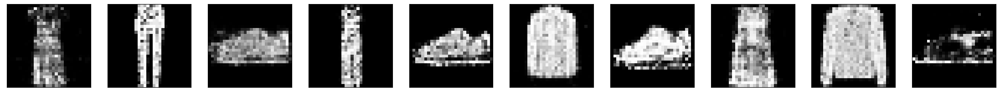

In [12]:
epochs = 100
batch_size = 256

batch_count = x_train.shape[0] // batch_size
adam = optim
for e in range(1, epochs + 1):
    for _ in tqdm(range(batch_count)):
        noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
        image_batch = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)]
        generated_images = generator.predict(noise)
        X = np.concatenate([image_batch, generated_images])
        y_dis = np.zeros(2*batch_size)
        y_dis[:batch_size] = 0.9
        discriminator.trainable = True
        discriminator.train_on_batch(X, y_dis)
        noise = np.random.normal(0, 1, size=[batch_size, latent_dim])
        y_gen = np.ones(batch_size)
        discriminator.trainable = False
        gan.train_on_batch(noise, y_gen)
        print('epoch: ', e)
    if e == 1 or e % 5 == 0:
        plot_generated_images(e, generator)

2.  Вирішити завдання машинного перекладу (будь яка пара мов, датасети тут: https://www.manythings.org/anki/)

Робив по прикладу звідси https://towardsdatascience.com/implementing-neural-machine-translation-using-keras-8312e4844eb8


In [76]:
lines= pd.read_table("C:/Users/Studying/Data/deu.txt",  names =['source', 'target', 'comments'])

In [77]:
lines.head(20)

,source,target,comments
0,Go.,Geh.,CC-BY 2.0 (France) Attribution: tatoeba.org #2...
1,Hi.,Hallo!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
2,Hi.,Grüß Gott!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
3,Run!,Lauf!,CC-BY 2.0 (France) Attribution: tatoeba.org #9...
4,Run.,Lauf!,CC-BY 2.0 (France) Attribution: tatoeba.org #4...
5,Wow!,Potzdonner!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
6,Wow!,Donnerwetter!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
7,Duck!,Kopf runter!,CC-BY 2.0 (France) Attribution: tatoeba.org #2...
8,Fire!,Feuer!,CC-BY 2.0 (France) Attribution: tatoeba.org #1...
9,Help!,Hilfe!,CC-BY 2.0 (France) Attribution: tatoeba.org #4...


In [78]:
lines.tail(20)

,source,target,comments
255797,"Tom said, ""You can kiss your girlfriend goodby...",Tom sagte: „Du kannst deiner Freundin den letz...,CC-BY 2.0 (France) Attribution: tatoeba.org #1...
255798,I recommend contributing sentences in your own...,"Ich empfehle, muttersprachliche Sätze beizutra...",CC-BY 2.0 (France) Attribution: tatoeba.org #6...
255799,A building with high ceilings and huge rooms m...,Ein Gebäude mit hohen Decken und riesigen Räum...,CC-BY 2.0 (France) Attribution: tatoeba.org #2...
255800,Biden took the presidential oath of office on ...,Auf den Stufen des Kapitols leistete Biden den...,CC-BY 2.0 (France) Attribution: tatoeba.org #9...
255801,"As a prank, some students let three goats loos...",Als Streich ließen einige Schüler drei Ziegen ...,CC-BY 2.0 (France) Attribution: tatoeba.org #9...
255802,The reason that Tom likes this experiment so m...,"Dieser Versuch gefällt Tom deswegen so sehr, w...",CC-BY 2.0 (France) Attribution: tatoeba.org #1...
255803,I've heard that you should never date anyone w...,"Ich habe einmal gehört, man solle sich auf nie...",CC-BY 2.0 (France) Attribution: tatoeba.org #1...
255804,The small crowd at Hiroshima Peace Memorial Pa...,"Um 8.15 Uhr vormittags, dem genauen Zeitpunkt,...",CC-BY 2.0 (France) Attribution: tatoeba.org #8...
255805,"In today's world, we have to equip all our kid...",In der heutigen Welt müssen wir all unsere Kin...,CC-BY 2.0 (France) Attribution: tatoeba.org #3...
255806,Death is something that we're often discourage...,"Wir werden oft davon abgehalten, über den Tod ...",CC-BY 2.0 (France) Attribution: tatoeba.org #1...


In [79]:
lines['source'] = lines['source'].str.lower()
lines['target'] = lines['target'].str.lower()

In [80]:
lines.head()

,source,target,comments
0,go.,geh.,CC-BY 2.0 (France) Attribution: tatoeba.org #2...
1,hi.,hallo!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
2,hi.,grüß gott!,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
3,run!,lauf!,CC-BY 2.0 (France) Attribution: tatoeba.org #9...
4,run.,lauf!,CC-BY 2.0 (France) Attribution: tatoeba.org #4...


In [81]:
lines['source'] = lines['source'].str.replace("'",'')
lines['target'] = lines['target'].str.replace("'",'')

In [82]:
lines['source'][255805]

'in todays world, we have to equip all our kids with an education that prepares them for success, regardless of what they look like, or how much their parents make, or the zip code that they live in.'

In [83]:
lines['source'] = lines['source'].str.replace('[^\w\s]',' ')
lines['target'] = lines['target'].str.replace('[^\w\s]',' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\185780926.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['source'] = lines['source'].str.replace('[^\w\s]',' ')
C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\185780926.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['target'] = lines['target'].str.replace('[^\w\s]',' ')


In [84]:
lines.head()

,source,target,comments
0,go,geh,CC-BY 2.0 (France) Attribution: tatoeba.org #2...
1,hi,hallo,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
2,hi,grüß gott,CC-BY 2.0 (France) Attribution: tatoeba.org #5...
3,run,lauf,CC-BY 2.0 (France) Attribution: tatoeba.org #9...
4,run,lauf,CC-BY 2.0 (France) Attribution: tatoeba.org #4...


In [85]:
lines['source'][255805]

'in todays world  we have to equip all our kids with an education that prepares them for success  regardless of what they look like  or how much their parents make  or the zip code that they live in '

In [86]:
lines['source'] = lines['source'].str.replace(r'[0-9]', ' ')
lines['target'] = lines['target'].str.replace(r'[0-9]', ' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\3424971627.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['source'] = lines['source'].str.replace(r'[0-9]', ' ')
C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\3424971627.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['target'] = lines['target'].str.replace(r'[0-9]', ' ')


In [87]:
lines['source'] = lines['source'].str.replace(' +', ' ')
lines['target'] = lines['target'].str.replace(' +', ' ')

C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\2615108745.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['source'] = lines['source'].str.replace(' +', ' ')
C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\2615108745.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  lines['target'] = lines['target'].str.replace(' +', ' ')


In [88]:
lines['source'][255805]

'in todays world we have to equip all our kids with an education that prepares them for success regardless of what they look like or how much their parents make or the zip code that they live in '

In [89]:
lines["target"] = lines["target"].apply(lambda x : 'START_ '+ x + ' _END')

In [90]:
all_source_words=set()
for source in lines["source"][:10000]:
    for word in source.split():
        if word not in all_source_words:
            all_source_words.add(word)
all_target_words=set()
for target in lines["target"][:10000]:
    for word in target.split():
        if word not in all_target_words:
            all_target_words.add(word)

source_words= sorted(list(all_source_words))
target_words=sorted(list(all_target_words))

In [91]:
source_word2idx= dict([(word, i) for i, word in enumerate(source_words)])
target_word2idx=dict([(word, i) for i, word in enumerate(target_words)])

In [92]:
source_length_list=[]
for l in lines["source"][:10000]:
    source_length_list.append(len(l.split(' ')))
max_source_length= max(source_length_list)
print(" Max length of the source sentence",max_source_length)

target_length_list=[]
for l in lines["target"][:10000]:
    target_length_list.append(len(l.split(' ')))
max_target_length= max(target_length_list)
print(" Max length of the target sentence",max_target_length)

 Max length of the source sentence 6
 Max length of the target sentence 12


In [93]:
source_idx2word= dict([(i, word) for word, i in  source_word2idx.items()])
target_idx2word =dict([(i, word) for word, i in target_word2idx.items()])

In [94]:
X_train, X_test, Y_train, Y_test = train_test_split(lines['source'][:10000], lines["target"][:10000], test_size = 0.1)

In [95]:
num_encoder_tokens=len(source_words)
num_decoder_tokens=len(target_words)+1

In [96]:
def generate_batch(X = X_train, y = Y_train, batch_size = 128):
    while True:
        for j in range(0, len(X), batch_size):
            encoder_input_data = np.zeros((batch_size, max_source_length),dtype='float32')
            decoder_input_data = np.zeros((batch_size, max_target_length),dtype='float32')
            decoder_target_data = np.zeros((batch_size, max_target_length, num_decoder_tokens),dtype='float32')
            for i, (input_text, target_text) in enumerate(zip(X[j:j+batch_size], y[j:j+batch_size])):
                for t, word in enumerate(input_text.split()):
                    encoder_input_data[i, t] = source_word2idx[word] 
                for t, word in enumerate(target_text.split()):
                    if t<len(target_text.split())-1:
                        decoder_input_data[i, t] = target_word2idx[word]
                    if t>0:
                        decoder_target_data[i, t - 1, target_word2idx[word]] = 1.
                    
            yield([encoder_input_data, decoder_input_data], decoder_target_data)

In [97]:
train_samples = len(X_train)
val_samples = len(X_test)
batch_size = 128
epochs = 50
latent_dim=256

In [98]:
encoder_inputs = Input(shape=(None,))
enc_emb =  Embedding(num_encoder_tokens, latent_dim, mask_zero = True)(encoder_inputs)
encoder_lstm = LSTM(latent_dim, return_state=True)
encoder_outputs, state_h, state_c = encoder_lstm(enc_emb)
encoder_states = [state_h, state_c]

In [99]:
decoder_inputs = Input(shape=(None,))
dec_emb_layer = Embedding(num_decoder_tokens, latent_dim, mask_zero = True)
dec_emb = dec_emb_layer(decoder_inputs)
decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True)
decoder_outputs, _, _ = decoder_lstm(dec_emb, initial_state=encoder_states)
decoder_dense = Dense(num_decoder_tokens, activation='softmax')
decoder_outputs = decoder_dense(decoder_outputs)

In [100]:
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

In [101]:
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

In [102]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['acc'])

In [103]:
train_samples = len(X_train)
val_samples = len(X_test)
batch_size = 128
epochs = 100

In [104]:
model.fit_generator(generator = generate_batch(X_train, Y_train, batch_size = batch_size),
                    steps_per_epoch = train_samples//batch_size,
                    epochs=epochs,
                    validation_data = generate_batch(X_test, Y_test, batch_size = batch_size),
                    validation_steps = val_samples//batch_size)

Epoch 1/100


C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\4017974037.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator = generate_batch(X_train, Y_train, batch_size = batch_size),
C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\3493576720.py:7: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  for i, (input_text, target_text) in enumerate(zip(X[j:j+batch_size], y[j:j+batch_size])):


70/70 [==============================] - 25s 273ms/step - loss: 6.1929 - acc: 0.2960 - val_loss: 4.9600 - val_acc: 0.3037
Epoch 2/100
70/70 [==============================] - 16s 227ms/step - loss: 4.7443 - acc: 0.3176 - val_loss: 4.6138 - val_acc: 0.3359
Epoch 3/100
70/70 [==============================] - 16s 230ms/step - loss: 4.5226 - acc: 0.3334 - val_loss: 4.5063 - val_acc: 0.3386
Epoch 4/100
70/70 [==============================] - 16s 223ms/step - loss: 4.4187 - acc: 0.3451 - val_loss: 4.4286 - val_acc: 0.3685
Epoch 5/100
70/70 [==============================] - 15s 218ms/step - loss: 4.3229 - acc: 0.3606 - val_loss: 4.3449 - val_acc: 0.3698
Epoch 6/100
70/70 [==============================] - 15s 218ms/step - loss: 4.2277 - acc: 0.3646 - val_loss: 4.2545 - val_acc: 0.3793
Epoch 7/100
70/70 [==============================] - 15s 220ms/step - loss: 4.1255 - acc: 0.3731 - val_loss: 4.1698 - val_acc: 0.3834
Epoch 8/100
70/70 [==============================] - 15s 221ms/step - loss

In [105]:
encoder_model = Model(encoder_inputs, encoder_states)
decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_state_input = [decoder_state_input_h, decoder_state_input_c]
dec_emb2= dec_emb_layer(decoder_inputs)
decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=decoder_state_input)
decoder_states2 = [state_h2, state_c2]
decoder_outputs2 = decoder_dense(decoder_outputs2)
decoder_model = Model(
    [decoder_inputs] + decoder_state_input,
    [decoder_outputs2] + decoder_states2)

In [106]:
def decode_sequence(input_seq):
    states_value = encoder_model.predict(input_seq)
    target_seq = np.zeros((1,1))
    target_seq[0, 0] = target_word2idx["START_"]
    stop_condition = False
    decoded_sentence = ''
    while not stop_condition:
        output_tokens, h, c = decoder_model.predict([target_seq] + states_value)
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_word =target_idx2word[sampled_token_index]
        decoded_sentence += " " + sampled_word
        if (sampled_word == "_END" or
           len(decoded_sentence) > 50):
            stop_condition = True
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index
        states_value = [h, c]
    return decoded_sentence

In [108]:
train_gen = generate_batch(X_train, Y_train, batch_size = 1)
k=-1
k+=1
(input_seq, actual_output), _ = next(train_gen)
decoded_sentence = decode_sequence(input_seq)
print('Input Source sentence:', X_train[k:k+1].values[0])
print('Actual Target Translation:', Y_train[k:k+1].values[0][6:-4])
print('Predicted Target Translation:', decoded_sentence[:-4])

C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\3493576720.py:7: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  for i, (input_text, target_text) in enumerate(zip(X[j:j+batch_size], y[j:j+batch_size])):


1/1 [==============================] - 0s 26ms/step
Input Source sentence: is that snow 
Actual Target Translation:  ist das schnee  
Predicted Target Translation:  tun sie das 


C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\1718131622.py:6: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  print('Input Source sentence:', X_train[k:k+1].values[0])


In [110]:
test_gen = generate_batch(X_test, Y_test, batch_size = 1)
for k in range(100):
    (input_seq, actual_output), _ = next(test_gen)
    decoded_sentence = decode_sequence(input_seq)
    print('Input Source sentence:', X_test[k:k+1].values[0])
    print('Actual Target Translation:', Y_test[k:k+1].values[0][6:-4])
    print('Predicted Target Translation:', decoded_sentence[:-4])

1/1 [==============================] - ETA: 0s

C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\3493576720.py:7: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  for i, (input_text, target_text) in enumerate(zip(X[j:j+batch_size], y[j:j+batch_size])):


1/1 [==============================] - 0s 28ms/step
Input Source sentence: who asked you 
Actual Target Translation:  wer hat dich denn gefragt  
Predicted Target Translation:  tun sie ihr ihr gesehen 
1/1 [==============================] - 0s 26ms/step


C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\1003756838.py:5: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  print('Input Source sentence:', X_test[k:k+1].values[0])
C:\Users\Studying\AppData\Local\Temp\ipykernel_1220\1003756838.py:6: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  print('Actual Target Translation:', Y_test[k:k+1].values[0][6:-4])


1/1 [==============================] - 0s 25ms/step
Input Source sentence: welcome back 
Actual Target Translation:  willkommen zurück  
Predicted Target Translation:  tun sie zurück 
1/1 [==============================] - 0s 25ms/step
Input Source sentence: how are you 
Actual Target Translation:  wie geht es euch  
Predicted Target Translation:  tun sie sie sich dir 
1/1 [==============================] - 0s 26ms/step
Input Source sentence: keep me posted 
Actual Target Translation:  haltet mich auf dem laufenden  
Predicted Target Translation:  tun sie mich auf 
1/1 [==============================] - 0s 27ms/step
Input Source sentence: ill get tom 
Actual Target Translation:  ich werde tom holen  
Predicted Target Translation:  tun sie tom 
1/1 [==============================] - 0s 27ms/step
Input Source sentence: im not a spy 
Actual Target Translation:  ich bin kein spion  
Predicted Target Translation:  tun nicht nicht 
1/1 [==============================] - 0s 26ms/step
Input So

3. Проведіть експерименти з моделями бібліотеки HF Transformers (https://huggingface.co/) за допомогою (наприклад) Pipeline або TFAutoModelForSequenceClassification

З бібліотекою jaxlib виникли труднощі, через що я не зміг використати це все через Jupyter notebook тут, хоча й ядро міняв на те, що environment Python з pipeline, але воно сварилось, проте все ж вдалось це все запустити через термінал jupyter, тому третє заавдання скрінами з терміналу. Деякі речі виділяв на скрінах.

1.Sentiment analysis
Червоним виділені фрагменти з відповідною класифікацією. 1 - фрагмент пісні 2 - згенерував рандомні слова 3 - фрагмент пісні

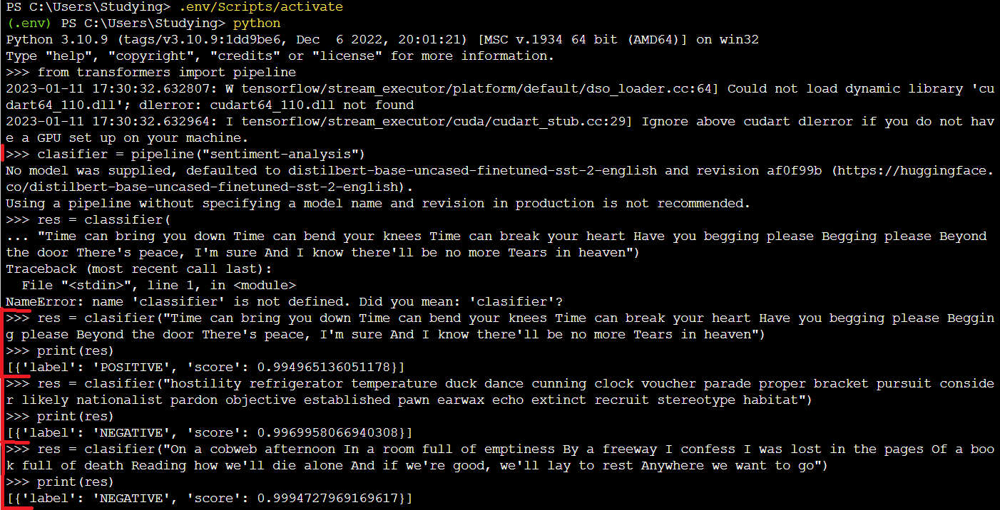

2.Question-answering
Синім виділений текст по якому задавались питання. Зеленим виділені питання, бо вони схожі, в одному випадку два подібні значення, в іншому одне, світло блакитним 3тє питання і відповідь до нього в тексті.

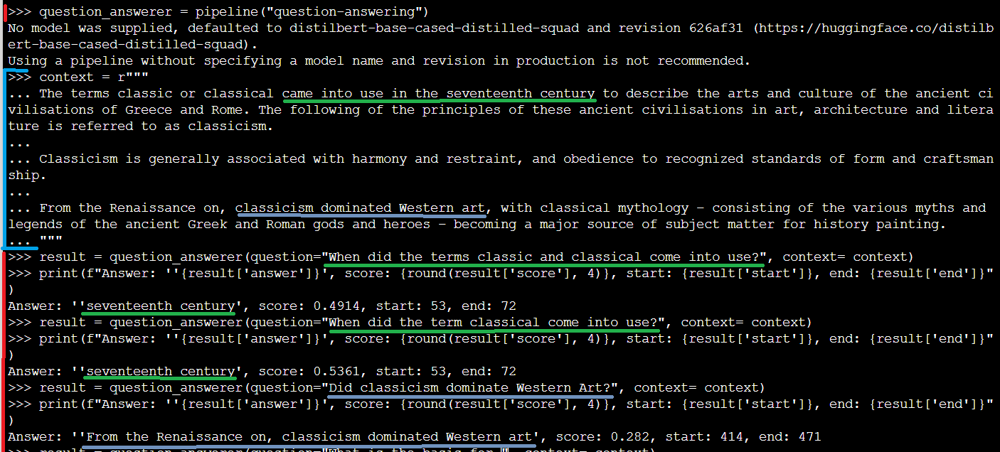

3. Text generation
Зеленім виділені початок і кінець кожної відповіді. Перше речення для генерації - My name is, друге - We will

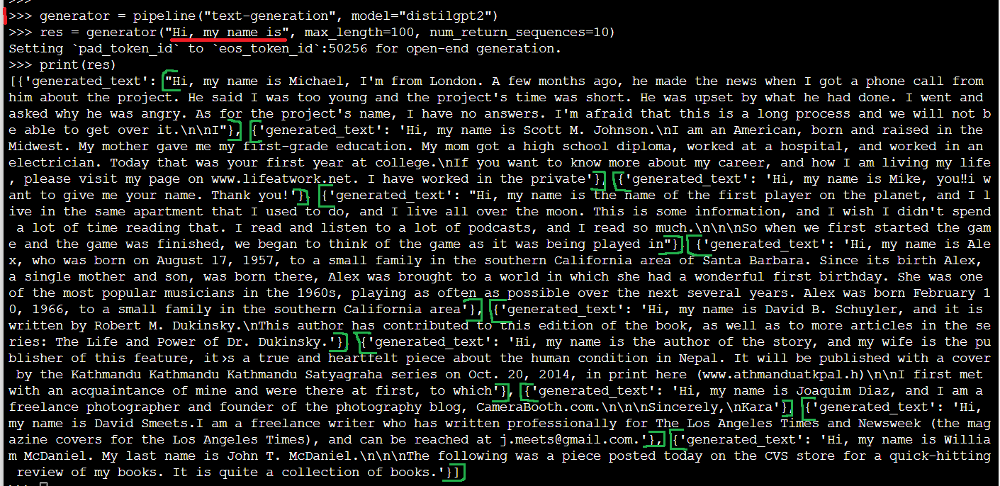

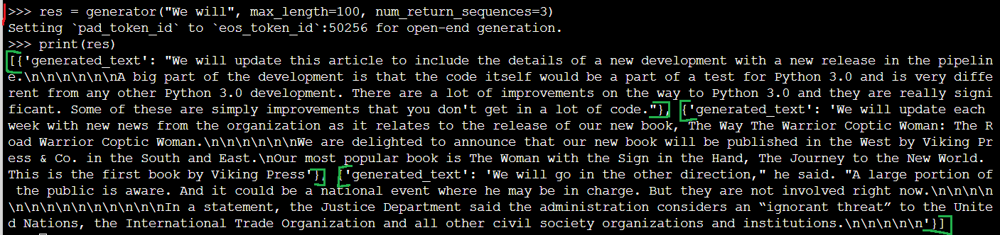

4. Zero shot classification
Текст це фрагмент з тексту про ДНК, жовтим виділені тематики для класифікації й їх результат.

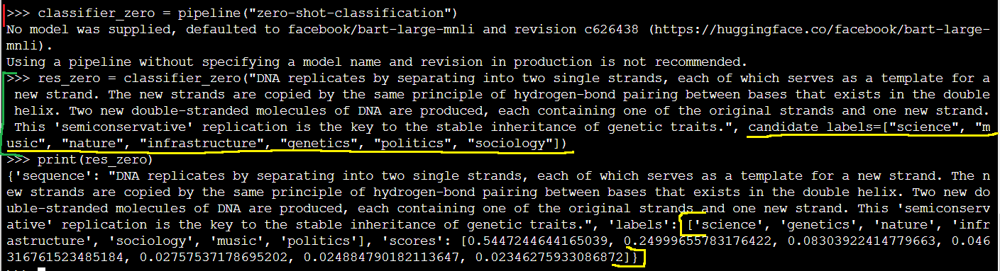